<big><h2 align="center" style="color:Black">PREDICTING CAR PRICES IN TURKEY</h2></big>

<big><font color="grey"><b>Aksana Lefter</b></font></big>

A car resale company in Turkey requires a model that can predict the price of a car based on its parameters. To make this forecast, data is collected from a car buying/selling website in Turkey that has announcements from 2020. The data includes car parameters such as model, model year, mileage, body type, color, and more.

Our goal is to examine the data, identify the parameters that impact the car’s price, and develop a model that can more accurately predict the price based on these parameters.

## Data analysis

Loading data and libraries.

In [1]:
# Library installation
!pip install pandas -q
!pip install numpy -q
!pip install matplotlib -q
!pip install seaborn -q
!pip install scikit-learn -q
!pip install gdown -q
!pip install scipy -q
!pip install phik -q
!pip install catboost -q
!pip install xgboost -q

In [2]:
# Library import
import gdown
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import statsmodels.api as sm  
from statsmodels.formula.api import ols  
import scipy.stats as stats 
import phik
from phik.report import plot_correlation_matrix
from phik import report
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor
from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingGridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Create a list with possible missing data
missing_values = ['-','- -','n/a','na']

# Load data first 7 lines
try:
    data = pd.read_csv("turkey_car_market.csv", na_values=missing_values)
    print("uploaded locally")
except:
    file_id = '1dBICaFGyw85Ah8oHwLLrrbXNBo6kFPwo'
    url = f'https://drive.google.com/uc?id={file_id}'
    output = 'turkeycar_name.csv'
    gdown.download(url, output, quiet=False)
    data = pd.read_csv(output, na_values=missing_values)
    print("data download")
    
data.head(7)

uploaded locally


,İlan Tarihi,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
0,27/05/2020,Jaguar,XF,2.0 D Prestige Plus,2017.0,Dizel,Otomatik Vites,1801-2000 cc,176-200 BG,Lacivert,Hatchback 5 Kapı,Galeriden,2. El,26100,634500
1,16/06/2020,Acura,CL,NaN,2015.0,Dizel,Yarı Otomatik Vites,1301-1600 cc,101-125 BG,Mavi,Sedan,Sahibinden,2. El,127000,151500
2,14/06/2020,Acura,CL,2.2,1994.0,Benzin/LPG,Düz Vites,1301-1600 cc,101-125 BG,Turkuaz,Sedan,Sahibinden,2. El,175000,19750
3,11/06/2020,Acura,CL,NaN,2013.0,Dizel,Düz Vites,1301-1600 cc,76-100 BG,Kahverengi,Sedan,Sahibinden,2. El,325,52000
4,11/06/2020,Acura,CL,2.2,2010.0,Dizel,Otomatik Vites,1801-2000 cc,151-175 BG,Beyaz,Sedan,Sahibinden,2. El,207000,148750
5,04/06/2020,Acura,CL,2.2,1999.0,Dizel,Düz Vites,1801-2000 cc,101-125 BG,Lacivert,Roadster,Galeriden,2. El,320000,42500
6,03/06/2020,Acura,CL,2.2,2014.0,Dizel,Otomatik Vites,1301-1600 cc,101-125 BG,Kırmızı,Sedan,Galeriden,2. El,183,170000


<strong>The variables in the data set are as follows:</strong>

İlan Tarihi: Date

Marka: Brand

Arac Tip Grubu: Vehicle Type Group

Arac Tip: Vehicle Type

Model Yıl: Model Year

Yakıt Turu: Fuel Type (Benzin: Petrol, Dizel: Diesel, Benzin / LPG: Gasoline, Hibrit: Hybrid, Elektrik: Electricity)

Vites: Transmission (Otomatik: Automatic, Yarı Otomatik: Semi Automatic, Düz: Manual)

CCM: CCM

Beygir Gucu: Horse Power

Renk: Color

Kasa Tipi: Body Type

Kimden: Seller

Durum: Condition on the car

KM: Kilometers

Fiyat: Price

Let's see how much data there is and of what type.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9044 entries, 0 to 9043
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   İlan Tarihi     9044 non-null   object 
 1   Marka           9044 non-null   object 
 2   Arac Tip Grubu  9044 non-null   object 
 3   Arac Tip        8989 non-null   object 
 4   Model Yıl       9044 non-null   float64
 5   Yakıt Turu      9044 non-null   object 
 6   Vites           9044 non-null   object 
 7   CCM             9043 non-null   object 
 8   Beygir Gucu     9043 non-null   object 
 9   Renk            9044 non-null   object 
 10  Kasa Tipi       9044 non-null   object 
 11  Kimden          9044 non-null   object 
 12  Durum           9044 non-null   object 
 13  Km              9044 non-null   int64  
 14  Fiyat           9044 non-null   int64  
dtypes: float64(1), int64(2), object(12)
memory usage: 1.0+ MB


There are only 9044 rows in the dataset, and the columns Arac Tip, CCM and Beygir Gucu have missing data. Let’s begin by checking the dataset for any duplicates.

In [5]:
print(f'There are {data.duplicated().sum()} duplicates in our dataframe.')

There are 1594 duplicates in our dataframe.


Let's remove the duplicates and see if there is any missing data.

In [6]:
data = data.drop_duplicates() 

In [7]:
data.isnull().sum()

İlan Tarihi        0
Marka              0
Arac Tip Grubu     0
Arac Tip          54
Model Yıl          0
Yakıt Turu         0
Vites              0
CCM                1
Beygir Gucu        1
Renk               0
Kasa Tipi          0
Kimden             0
Durum              0
Km                 0
Fiyat              0
dtype: int64

Duplicates have been removed and we can see that there is missing data in the following columns: Arac Tip: Vehicle Type - 54, CCM - 1, Beygir Gucu: Horse Power - 1. Let’s examine these 3 columns to determine the data they contain and, based on that, decide on a preferable course of action, which is either to replace the missing data or to remove it.

In [8]:
data['Arac Tip'].value_counts()

Diğer               938
1.5 dCi Touch       147
1.5 dCi Joy         145
1.6 TDCi Trend X     98
1.5 dCi Icon         95
                   ... 
1.3 M.jet             1
190 E 1.8             1
300 E                 1
320                   1
1.4 Mode              1
Name: Arac Tip, Length: 1758, dtype: int64

In [9]:
data['CCM'].value_counts()

1301-1600 cc        4641
1300 cc ve altı     1026
1801-2000 cc         742
1601-1800 cc         364
2501-3000 cc         287
2001-2500 cc         173
Bilmiyorum           108
3501-4000 cc          36
3001-3500 cc          35
4001-4500 cc          16
5001-5500 cc           9
4501-5000 cc           8
6001 cc ve üzeri       2
5501-6000 cc           2
Name: CCM, dtype: int64

In [10]:
data['Beygir Gucu'].value_counts()

Bilmiyorum         4480
101-125 BG          888
76-100 BG           824
51-75 BG            340
126-150 BG          334
100 BG ve altı      284
151-175 BG          102
176-200 BG          100
226-250 BG           29
201-225 BG           21
251-275 BG           16
50 BG ve altı        11
276-300 BG            7
301-325 BG            6
326-350 BG            4
376-400 BG            1
601 BG ve üzeri       1
451-475 BG            1
Name: Beygir Gucu, dtype: int64

Upon closer examination, we see that some columns contain unknown or missing information. This may be because the seller did not provide the necessary details for certain fields, or because the data was collected from a website where these parameters were unavailable. To determine how to handle this data, we will assess its correlation with the price. If there is a weak correlation, we will keep the option as unknown or different.
To measure this correlation, we will use the Phik matrix. 
The Phik (𝜙k) is a new and practical correlation coefficient that works consistently between categorical, ordinal and interval variables, captures non-linear dependency and reverts to the Pearson correlation coefficient in case of a bivariate normal input distribution.[1]

interval columns not set, guessing: ['Model Yıl', 'Km', 'Fiyat']


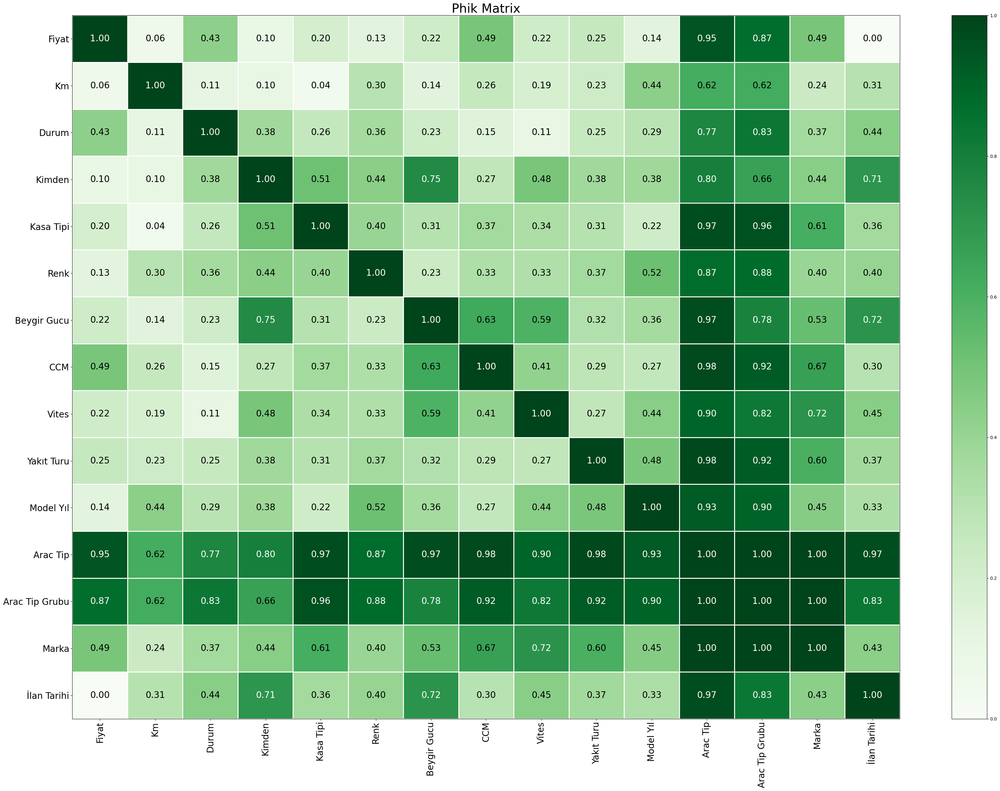

In [21]:
phik_overview = data.phik_matrix()
phik_overview.round(2)
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"Phik Matrix", 
                        fontsize_factor=2, 
                        figsize=(35, 25))
plt.tight_layout()

So, we can see that the correlation between the parameters CMM and Beygir Gücü and the cost of the car is not very strong. Therefore, we will replace the missing values with Bilmiyorum, which means unknown. On the other hand, the Arac Tip column does have a correlation with the price. However, since we have an additional column containing the car model data, we have decided to replace the missing data with Diğer, which means something else.

In [14]:
data[['CCM', 'Beygir Gucu']] = data[['CCM', 'Beygir Gucu']].fillna('Bilmiyorum')
data['Arac Tip'] = data['Arac Tip'].fillna('Diğer')

In [15]:
data.isnull().sum()

İlan Tarihi       0
Marka             0
Arac Tip Grubu    0
Arac Tip          0
Model Yıl         0
Yakıt Turu        0
Vites             0
CCM               0
Beygir Gucu       0
Renk              0
Kasa Tipi         0
Kimden            0
Durum             0
Km                0
Fiyat             0
dtype: int64

Now that there are no missing values, let’s change the format in the “İlan Tarihi: Date” column from object to datetime.

In [16]:
data['İlan Tarihi'] = pd.to_datetime(data['İlan Tarihi'])
data.tail(7)

,İlan Tarihi,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
9037,2020-07-06,Tofaş,Şahin,1.6 ie,2001.0,Benzin/LPG,Düz Vites,1601-1800 cc,76-100 BG,Gri,Sedan,Galeriden,2. El,176000,20900
9038,2020-06-06,Tofaş,Kartal,SLX ie,1999.0,Benzin/LPG,Düz Vites,1601-1800 cc,76-100 BG,Beyaz,Station Wagon,Galeriden,2. El,198,19950
9039,2020-06-06,Tofaş,Şahin,1.6,1994.0,Benzin/LPG,Düz Vites,1301-1600 cc,51-75 BG,Beyaz,Sedan,Galeriden,2. El,121212,12250
9040,2020-05-06,Tofaş,Şahin,Şahin 5 vites,1992.0,Benzin/LPG,Düz Vites,1301-1600 cc,76-100 BG,Bej,Sedan,Sahibinden,2. El,54000,16300
9041,2020-05-06,Tofaş,Doğan,SLX,1993.0,Benzin/LPG,Düz Vites,1301-1600 cc,76-100 BG,Yeşil,Sedan,Sahibinden,2. El,135000,19000
9042,2020-04-06,Tofaş,Kartal,Kartal 5 Vites,1991.0,Benzin/LPG,Düz Vites,1601-1800 cc,76-100 BG,Kırmızı,Hatchback 5 Kapı,Galeriden,2. El,250000,11000
9043,2020-04-06,Tofaş,Kartal,Kartal 5 Vites,1996.0,Benzin/LPG,Düz Vites,1301-1600 cc,51-75 BG,Beyaz,Sedan,Galeriden,2. El,11,15750


So, let’s proceed to the visualization.

## Hypotheses

### 1) The cost of the car is influenced by the brand.

First, let's take a look at the distribution of prices by car brand.

[Text(0.5, 1.0, 'Price distribution by car brand'),
 Text(0.5, 0, 'Price'),
 Text(0, 0.5, 'Car brand')]

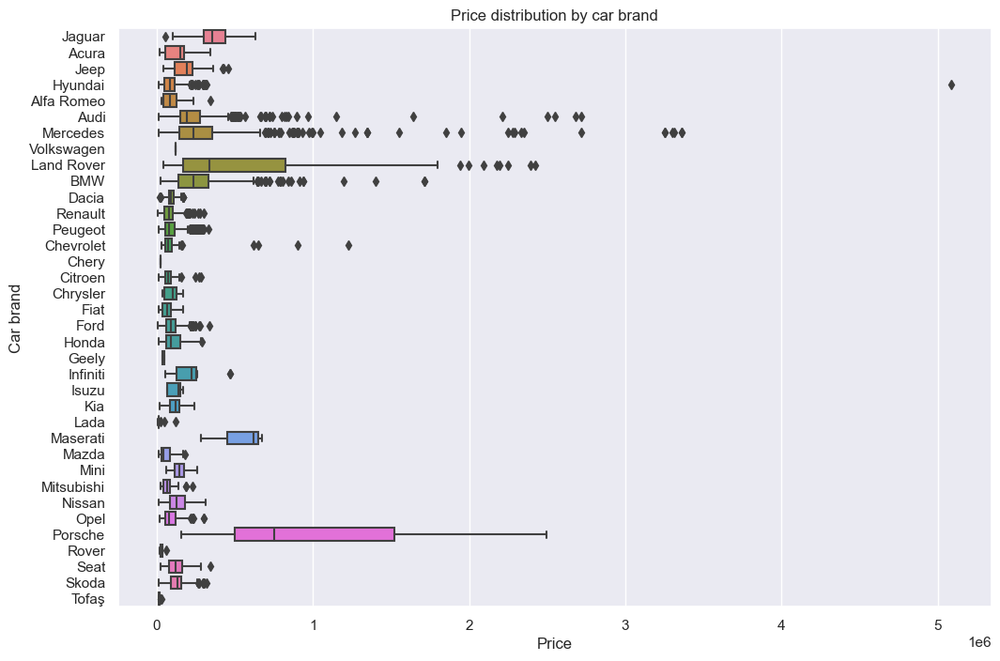

In [17]:
sns.set(rc={"figure.figsize":( 12,8)})
sns.boxplot(y='Marka', x='Fiyat', data=data,palette = "husl")\
.set(title='Price distribution by car brand',xlabel="Price",ylabel="Car brand")

Since there are outliers in our data (an outlier is a single data point that goes far outside the average value of a group of statistics[2]), which is clearly shown in the boxplot, it is best to focus on the median price value rather than the average. The arithmetic mean of a data set is calculated by summing all the numbers in the sample and dividing the resulting sum by the number of numbers.
On the other hand, the median is the number that falls exactly in the middle of a list of numbers in the data set, when they are arranged in ascending order. Therefore, we will focus on the median so that the outliers do not distort the understanding of price.

From the graph, it is evident that Porsche and Maserati are the most expensive car brands, while Lada, Rover, Tofas, Chery, Geely, and Mazda are the cheapest.

### 2) Influence of the year of the model on the price

Let's take a look at the median price by year of car model.

<Axes: title={'center': 'Median price value by model year'}, xlabel='Model Year', ylabel='Price'>

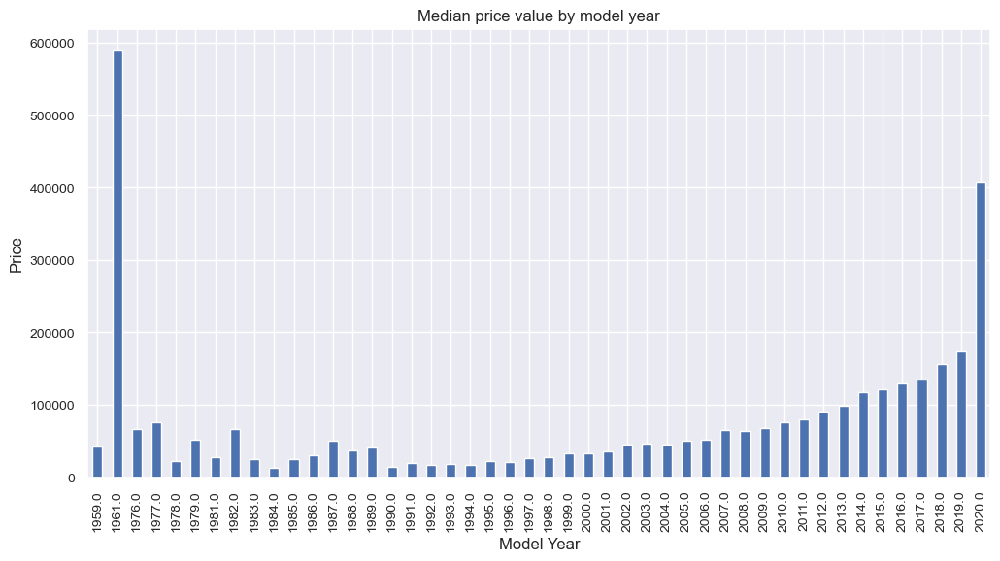

In [18]:
data[['Model Yıl', 'Fiyat']].pivot(columns = 'Model Yıl', values = 'Fiyat')\
.median().plot(kind="bar", rot=90,fontsize=10,title="Median price value by model year",\
               figsize = (12,6),xlabel='Model Year',ylabel='Price')

From the chart, we can see the distribution of car prices by model year. For instance, the price for a 1961 model is considerably higher than that of a 2020 model. This suggests that vintage cars can be valued significantly higher, sometimes even surpassing the cost of new cars.

To verify this hypothesis, we will employ the statistical test, Simple Regression, to determine the statistical significance between the variables.

In [19]:
x = data['Model Yıl']
y = data['Fiyat']
# with statsmodels
x = sm.add_constant(x) 
 
model = sm.OLS(y, x).fit()
predictions = model.predict(x) 
 
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                  Fiyat   R-squared:                       0.094
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     770.3
Date:                Sun, 07 Jan 2024   Prob (F-statistic):          2.01e-161
Time:                        20:40:38   Log-Likelihood:            -1.0225e+05
No. Observations:                7450   AIC:                         2.045e+05
Df Residuals:                    7448   BIC:                         2.045e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.054e+07   7.46e+05    -27.552      0.0

The test results show that the Prob (F-statistic) is nearly zero, thus leading us to reject the null hypothesis and conclude that there is a statistically significant relationship between the variables. Consequently, we can conclude that the year of the model impacts the price of the car.

### 3) The cost of the car also depends on the fuel type

Let’s examine auto prices based on fuel type.

<Axes: title={'center': 'Median price by fuel type'}, xlabel='Fuel type', ylabel='Price'>

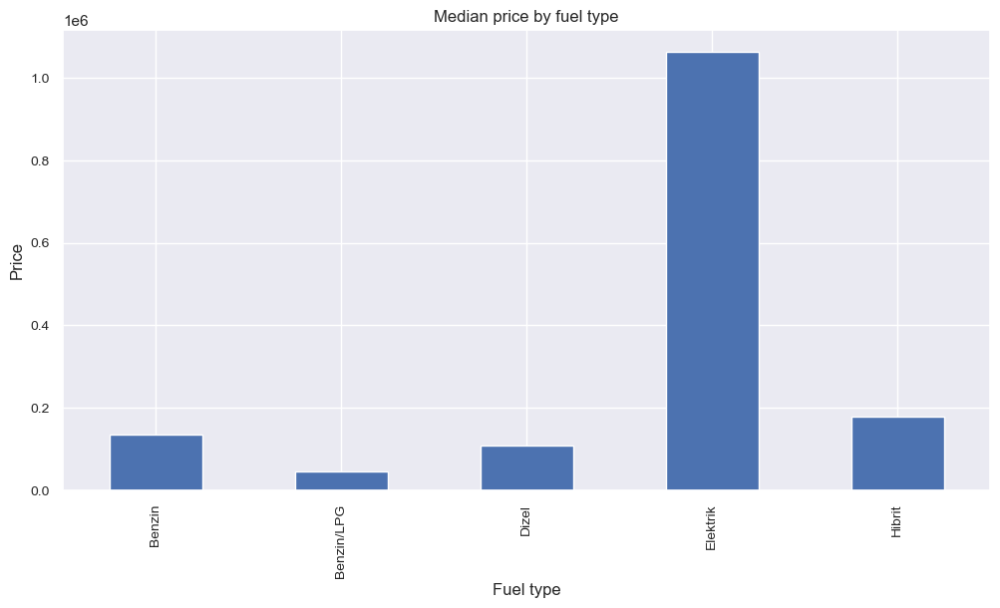

In [20]:
data[['Yakıt Turu', 'Fiyat']].pivot(columns = 'Yakıt Turu', values = 'Fiyat').median()\
.plot(kind="bar", rot=90,fontsize=10,title="Median price by fuel type",\
               figsize = (12,6),xlabel='Fuel type',ylabel='Price')

According to the graph, we can see that electric cars are the most expensive ones.

### 4) The price also depends on the type of car body

Let's look at the prices of cars according to their body types.

[Text(0, 0, 'Hatchback 5 Kapı'),
 Text(1, 0, 'Sedan'),
 Text(2, 0, 'Roadster'),
 Text(3, 0, 'Arazi Aracı'),
 Text(4, 0, 'Diğer'),
 Text(5, 0, 'Hatchback 3 Kapı'),
 Text(6, 0, 'Spor / Coupe'),
 Text(7, 0, 'Station Wagon'),
 Text(8, 0, 'Camlı Van'),
 Text(9, 0, 'Üstü Açık / Cabriolet'),
 Text(10, 0, 'MPV'),
 Text(11, 0, 'Crossover'),
 Text(12, 0, 'Minivan')]

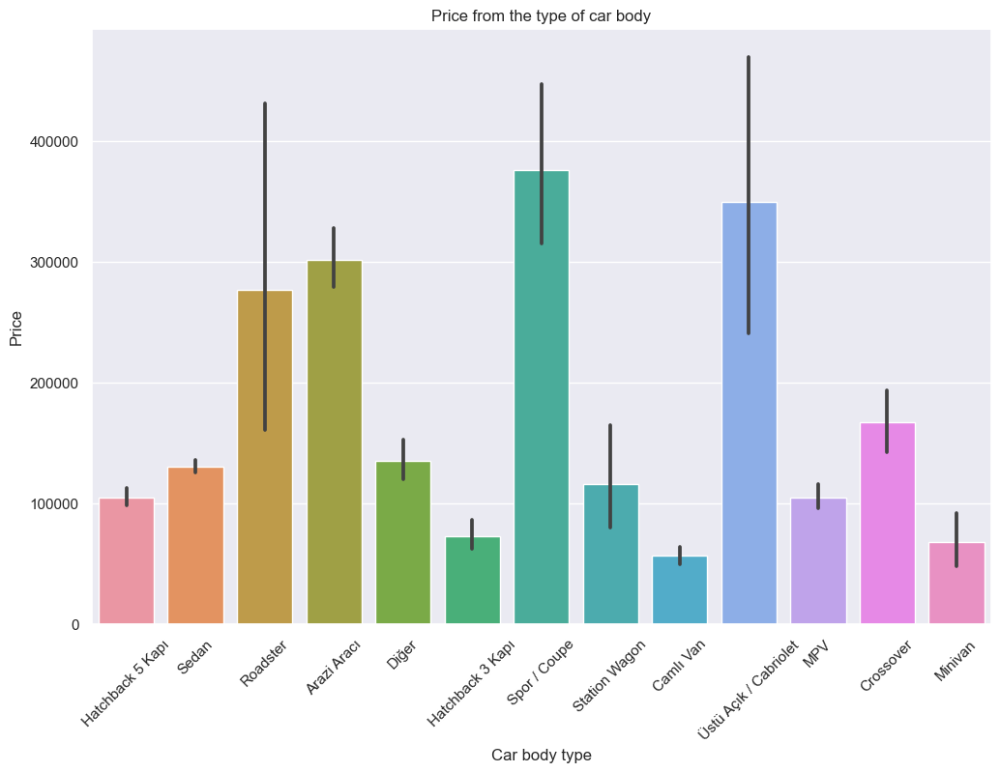

In [21]:
ax=sns.barplot(x='Kasa Tipi', y='Fiyat', data=data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Price from the type of car body',xlabel="Car body type",ylabel="Price")
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)

Here we can see, that the most expensive body types are coupe, cabriolet, SUV, and roadster.

### 5) The car's transmission can influence the price

[Text(0.5, 1.0, 'Prices from the type of transmissions'),
 Text(0.5, 0, 'Transmission'),
 Text(0, 0.5, 'Price')]

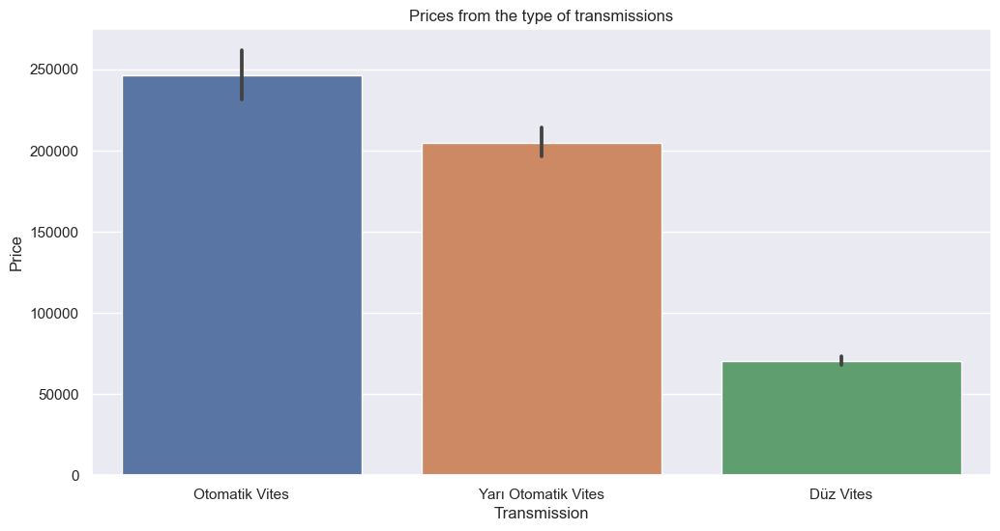

In [22]:
ax = sns.barplot(x = data["Vites"], y = data["Fiyat"], data = data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Prices from the type of transmissions',xlabel="Transmission",ylabel="Price")

You can see from the graph that the automatic transmission is more expensive than the others.

### 6) The condition of the car affects the price

[Text(0.5, 1.0, 'Prices depending on the condition of the car'),
 Text(0.5, 0, 'Condition on the car'),
 Text(0, 0.5, 'Price')]

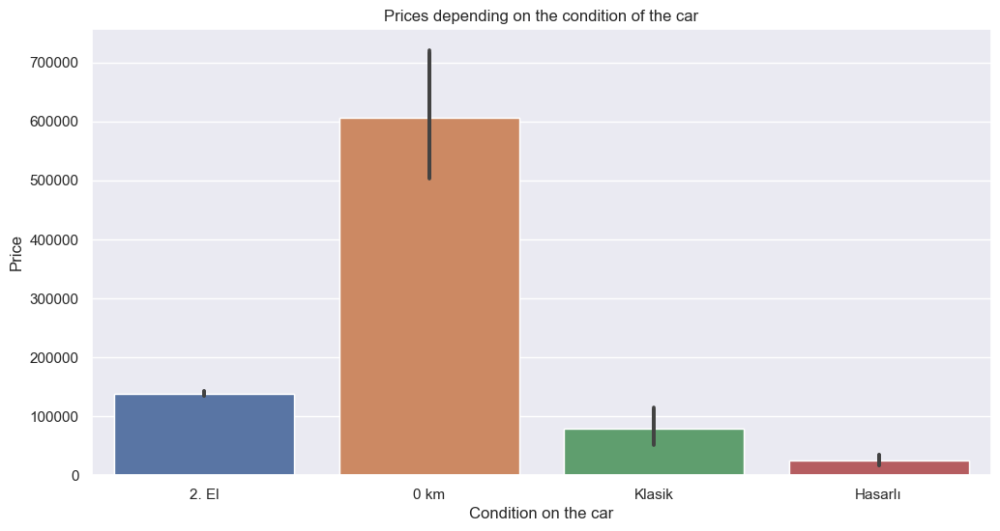

In [23]:
sns.barplot(x = data["Durum"], y = data["Fiyat"], data = data)
ax = sns.barplot(x = data["Durum"], y = data["Fiyat"], data = data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Prices depending on the condition of the car',xlabel="Condition on the car",ylabel="Price")

Cars with 0 km mileage are priced higher than used cars. Moreover, if a car is damaged, its price is significantly lower than that of a car in normal condition.

### 7) The seller influences the value of the car

[Text(0.5, 1.0, 'Prices by seller'),
 Text(0.5, 0, 'Seller'),
 Text(0, 0.5, 'Price')]

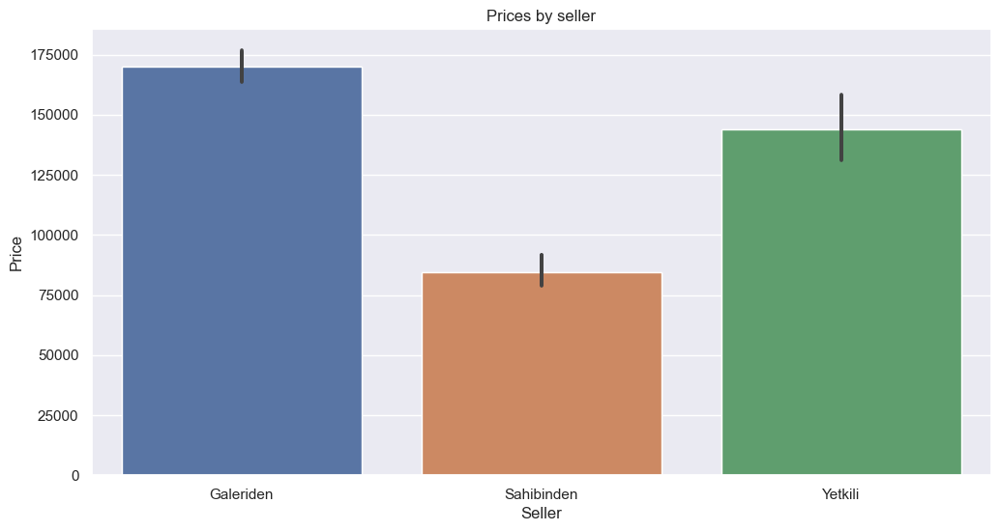

In [24]:
sns.barplot(x = data["Kimden"], y = data["Fiyat"], data = data)
ax = sns.barplot(x = data["Kimden"], y = data["Fiyat"], data = data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Prices by seller',xlabel="Seller",ylabel="Price")

Owners sell their cars cheaper than the official dealer or a car from the gallery/car market. Let's perform a statistical test to see if these categories are not equal.

In [25]:
galeriden=data[data['Kimden']=="Galeriden"]["Fiyat"]

In [26]:
sahibinden=data[data['Kimden']=="Sahibinden"]["Fiyat"]

In [27]:
yetkili=data[data['Kimden']=="Yetkili"]["Fiyat"]

In [28]:
F, p = stats.f_oneway(galeriden,sahibinden,yetkili) 
print(f'F - statistic {F}.')
print(f'P - value {p}.')

F - statistic 87.14014455551107.
P - value 3.9044389011268834e-38.


Based on the obtained p-value of less than 0.05, we can reject the null hypothesis (which suggests there is no difference between the groups). This indicates that there are variations in average prices within the groups. Let’s specifically compare only the Galeriden group with the Yetkili group.

In [29]:
stats.ttest_ind(a=galeriden, b=yetkili)

Ttest_indResult(statistic=0.8486084371979425, pvalue=0.396133973997974)

Upon seeing a p-value greater than 0.05, we cannot reject the null hypothesis and must conclude that the two groups are equal.
Let’s proceed to compare the Galeriden group with the Sahibinden group.

In [30]:
stats.ttest_ind(a=galeriden, b=sahibinden)

Ttest_indResult(statistic=13.143770820449637, pvalue=5.057853751837618e-39)

Now we see that the p-value is close to zero, indicating that the two groups are not equal. This confirms our hypothesis that purchasing from a car owner is cheaper.

### 8) Influence of Color on Car Value

<Axes: title={'center': 'Median price according to the color of the car'}, xlabel='Color', ylabel='Price'>

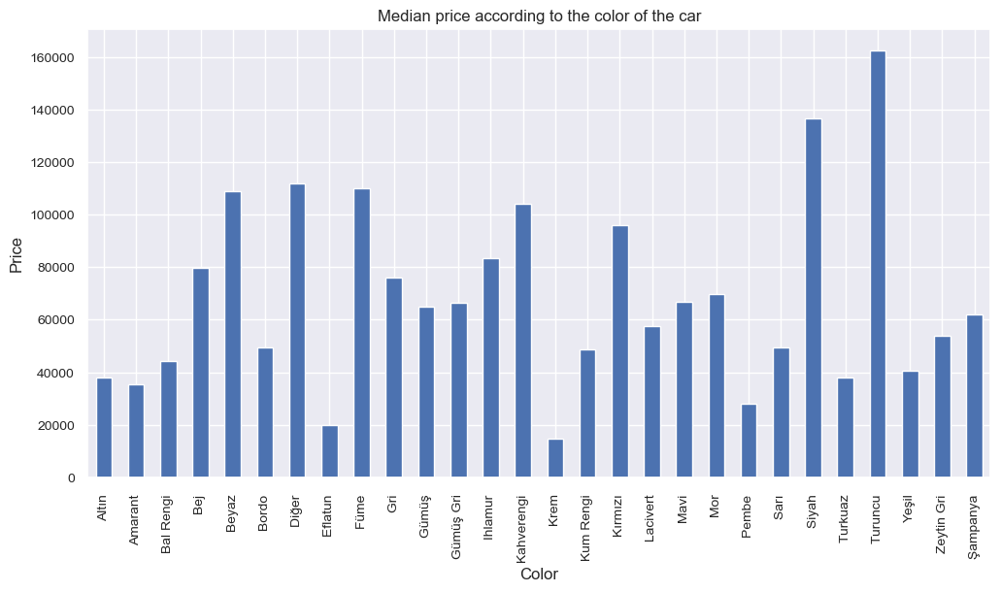

In [31]:
data[['Renk', 'Fiyat']].pivot(columns = 'Renk', values = 'Fiyat').median()\
.plot(kind="bar", rot=90,fontsize=10,title="Median price according to the color of the car",\
               figsize = (12,6),xlabel='Color',ylabel='Price')

We can see that black and orange cars have the highest median price. As mentioned earlier, the price of a car is also influenced by the type of body. Let’s examine the body types associated with these two colors. It’s possible that the color itself doesn’t significantly impact the price, and that other parameters are responsible for the pricing.

In [32]:
black = data[data["Renk"]=="Siyah "]
orange = data[data["Renk"]=="Turuncu "]

In [33]:
black["Kasa Tipi"].value_counts().to_frame()

,Kasa Tipi
Sedan,556
Arazi Aracı,261
Hatchback 5 Kapı,246
Spor / Coupe,31
MPV,14
Station Wagon,11
Diğer,10
Hatchback 3 Kapı,9
Üstü Açık / Cabriolet,5
Crossover,4


In [34]:
orange["Kasa Tipi"].value_counts().to_frame()

,Kasa Tipi
Arazi Aracı,18
Hatchback 5 Kapı,9
Crossover,2
Spor / Coupe,1
Diğer,1
MPV,1


The most expensive body types are coupes, cabriolets, SUVs, and roadsters. In the case of orange cars, the majority of them are SUVs. Therefore, the graph shows that this color is associated with higher prices, but it’s actually the body type that has a greater influence on the cost of the car. The same can be said about black cars, where we also see expensive body types such as coupes, SUVs, and cabriolets.

### Key points

1. The price of the car depends on the year of the car model.
2. Electric cars are more expensive than fuel-powered cars.
3. The most expensive body types are coupe, cabriolet, SUV and roadster.
4. Automatic transmission is more expensive than other types of transmission.
5. The price of the car depends on its condition.
6. Buying a car directly from the owner is cheaper than purchasing from a dealer or other car sales companies.


## Preparing data for modeling

Make a copy of the dataset in case we need to refer back to the original dataset.

In [35]:
df=data.copy()

Delete the column with the date since it is not relevant to our prediction.

In [36]:
df.drop(df.columns[[0]], axis=1, inplace=True)

There are outliers in our dataset. Let’s examine cars that are priced higher than 3,000,000.

In [37]:
df[df['Fiyat']>=3000000.0]

,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
3478,Hyundai,I20,1.4 CRDI Jump,2013.0,Dizel,Düz Vites,1300 cc ve altı,76-100 BG,Beyaz,Hatchback 5 Kapı,Sahibinden,2. El,140000,5086500
4410,Mercedes,Maybach S,S 560,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Sedan,Galeriden,0 km,0,3360000
4588,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Arazi Aracı,Galeriden,0 km,0,3310000
4589,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Beyaz,Arazi Aracı,Galeriden,0 km,0,3300000
4704,Mercedes,Maybach S,S 560,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Sedan,Galeriden,0 km,0,3360000
4824,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Arazi Aracı,Galeriden,2. El,900,3250000
4826,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Arazi Aracı,Galeriden,0 km,0,3250000


We can see that most of these cars are premium models from Mercedes, except for one Hyundai model from 2013. It is evident that this car cannot cost that much, as it is a very ordinary car with manual transmission and was purchased directly from the owner. It is likely that there is an error in the price. Therefore, let’s eliminate this outlier from our dataset and retain only the premium cars from Mercedes, so that our model can accurately predict the prices of this car type.

In [38]:
df = df.drop (index= 3478 )

Also, let’s analyze the prices of cars under 10,000. This will allow us to identify any unrealistic prices that may further impact our model.

In [39]:
df[df['Fiyat']<=10000.0]

,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
2966,Ford,Scorpio,2.0,1990.0,Benzin/LPG,Düz Vites,1801-2000 cc,101-125 BG,Bordo,Sedan,Galeriden,Hasarlı,2222,6250
2975,Honda,Accord,1.6\n,1984.0,Benzin/LPG,Düz Vites,1301-1600 cc,100 BG ve altı,Gümüş Gri,Sedan,Galeriden,Hasarlı,100000,10000
2976,Honda,Accord,1.6\n,1986.0,Benzin,Düz Vites,1301-1600 cc,100 BG ve altı,Ihlamur,Sedan,Galeriden,Hasarlı,100000,10000
2977,Honda,Civic,1.4\n,1990.0,Benzin/LPG,Düz Vites,1301-1600 cc,100 BG ve altı,Kırmızı,Sedan,Galeriden,Hasarlı,100000,10000
2978,Honda,Accord,2.0 EX,1990.0,Benzin/LPG,Otomatik Vites,1801-2000 cc,100 BG ve altı,Füme,Sedan,Galeriden,Hasarlı,100000,10000
2979,Honda,Accord,2.0\n,1991.0,Benzin/LPG,Otomatik Vites,1801-2000 cc,101-125 BG,Gümüş Gri,Sedan,Galeriden,Hasarlı,100000,10000
2980,Honda,Accord,2.0\n,1991.0,Benzin,Düz Vites,1801-2000 cc,100 BG ve altı,Füme,Sedan,Galeriden,Hasarlı,100000,10000
2981,Honda,Integra,1.8,1991.0,Benzin/LPG,Düz Vites,1601-1800 cc,101-125 BG,Kırmızı,Sedan,Galeriden,Hasarlı,100000,10000
2982,Honda,CRX,1.6i 16V,1991.0,Benzin/LPG,Düz Vites,1301-1600 cc,126-150 BG,Kırmızı,Hatchback 3 Kapı,Galeriden,Hasarlı,100000,10000
2984,Honda,Accord,2.0\n,1994.0,Benzin/LPG,Düz Vites,1801-2000 cc,101-125 BG,Siyah,Sedan,Galeriden,Hasarlı,100000,10000


Here, the prices reflect reality: very low prices are mostly for damaged or very old cars. Therefore, we will leave the data as is and not delete anything.

Before dividing the data into samples, let’s examine the number of cars by brand. If a model appears only once in the dataset, it would make sense to remove it from the dataset.


In [40]:
df['Marka'].value_counts()

Renault       965
Fiat          649
Opel          645
Ford          600
Hyundai       577
BMW           567
Mercedes      565
Peugeot       396
Audi          388
Honda         261
Skoda         259
Nissan        227
Dacia         203
Citroen       199
Kia           166
Land Rover    152
Seat          151
Chevrolet     127
Porsche        56
Tofaş          44
Acura          41
Jeep           38
Mitsubishi     32
Mini           31
Mazda          24
Alfa Romeo     17
Lada           16
Chrysler       12
Jaguar         11
Infiniti       10
Isuzu           9
Rover           4
Maserati        3
Geely           2
Chery           1
Volkswagen      1
Name: Marka, dtype: int64

Chery and Volkswagen appear only once, so let’s remove these brands from our dataset.

In [41]:
df = df.loc[~(df['Marka'].str.contains('Chery') | df['Marka'].str.contains('Volkswagen'))]

Now, let’s divide them into the train and test samples.

In [42]:
features = df.drop(['Fiyat'], axis=1)

target = df['Fiyat']
marka = df['Marka']

RANDOM_STATE = 42

X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.25, stratify = marka, random_state=RANDOM_STATE
)

Regression models are suitable for predicting the value of a car based on its criteria.

Regression is a statistical technique that helps us analyze and understand the relationship between two or more variables of interest. The process adapted to do regression analysis helps us understand which factors are important, which can be ignored, and how they affect each other.
In a regression, we usually have one dependent variable and one or more independent variables.[3]

The main estimation metrics for regression problems are: R2 Score (pronounced R-Squared Score), Mean Absolute Error (MAE), and RMSE.

R-Squared (R² or the coefficient of determination) is a statistical measure in a regression model that determines the proportion of variance in the dependent variable that can be explained by the independent variable. In other words, r-squared shows how well the data fit the regression model (the goodness of fit). R-squared can take any values between 0 to 1. [4]

Mean Absolute Error (MAE) is a measure of the average size of the mistakes in a collection of predictions, without taking their direction into account. It is measured as the average absolute difference between the predicted values and the actual values and is used to assess the effectiveness of a regression model.[5]

Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are; RMSE is a measure of how spread out these residuals are. In other words, it tells you how concentrated the data is around the line of best fit.[6]


We will compare the results between models using the R-squared metric. The models we will use are Dummy Regressor, Random Forest, Decision Tree , CatBoost and  XGBoost.

Our dataset contains many categorical attributes. If we use OneHotEncoder, this encoding will create a large number of columns, thus increasing the dimensionality, which is very bad. Therefore, we will use OrdinalEncoder for encoding.

In [43]:
cols = ['Marka', 'Arac Tip Grubu', 'Arac Tip','Yakıt Turu', 'Vites', 'CCM', 'Beygir Gucu', 'Renk', 'Kasa Tipi',
       'Kimden', 'Durum']

# Create a ColumnTransformer object
preprocessor = ColumnTransformer(
    transformers=[
        ('ordinal_encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cols)
    ],
    remainder='passthrough'  # Other columns will be passed through without changes
)

# Create a DummyRegressor object
dr = DummyRegressor()

# Create a RandomForestRegressor object
Rfc = RandomForestRegressor(random_state=42)

# Create a DecisionTreeRegressor object
clf = DecisionTreeRegressor()

# Create a XGBRegressor object
xgb = XGBRegressor()

# Create a CatBoostRegressor object
cb = CatBoostRegressor()

# Create a pipeline for the Dummy Regressor model
pipeline_dummy = Pipeline([
    ('preprocessor', preprocessor),
    ('dummy_model', dr)
])

# Create a pipeline for the RandomForest model with hyperparameter optimization
pipeline_rfc = Pipeline([
    ('preprocessor', preprocessor),
    ('random_forest', Rfc)
])

param_grid_rfc = {
    'random_forest__n_estimators': [100,  200, 300],
    'random_forest__max_depth': [None, 10, 20],
    'random_forest__min_samples_split': [2, 5, 10],
    'random_forest__min_samples_leaf': [1, 2, 4]
}

# Create a pipeline for the Decision Tree model with hyperparameter optimization
pipeline_clf = Pipeline([
    ('preprocessor', preprocessor),
    ('decision_tree', clf)
])

param_grid_clf = {
    'decision_tree__max_depth': [None, 5, 10, 15],
    'decision_tree__min_samples_split': [2, 5, 10],
    'decision_tree__min_samples_leaf': [1, 2, 4]
}

# Create a pipeline for the CatBoost model with hyperparameter optimization
pipeline_cb = Pipeline([
    ('preprocessor', preprocessor),
    ('catboost', cb)
])

param_grid_cb = {
    'catboost__iterations': [100, 200, 300, 400, 500],        
    'catboost__learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3],    
    'catboost__depth': [4, 6, 8, 10] 
}

# Create a pipeline for the XGBoost model with hyperparameter optimization
pipeline_xgb = Pipeline([
    ('preprocessor', preprocessor),
    ('xgboost', xgb)
])

param_grid_xgb = {
    'xgboost__learning_rate': [0.01, 0.1, 0.05],       
    'xgboost__max_depth': [3, 5, 7, 10],                  
    'xgboost__min_child_weight': [1, 3, 5, 7, 9],
    'xgboost__subsample': [0.5, 0.7, 0.6, 0.4],
    'xgboost__colsample_bytree': [0.5, 0.7, 0.9],
    'xgboost__objective': ['reg:squarederror'] 
}

Let's take a look at the results of our models.

In [44]:
scores_dr = cross_val_score(pipeline_dummy, X_train, y_train, cv=5,scoring='r2')
print('Cross-Validation R-squared Scores', scores_dr)
print('Mean R-squared Score', scores_dr.mean())

Cross-Validation R-squared Scores [-2.08396117e-03 -1.00367908e-03 -7.07766059e-08 -1.33187897e-03
 -7.35332795e-03]
Mean R-squared Score -0.002354583588889225


In [45]:
halving_cv = HalvingGridSearchCV(pipeline_rfc, param_grid=param_grid_rfc, n_jobs=-1,cv=5, scoring="r2")
halving_cv.fit(X_train, y_train)

print("The best hyperparameters:", halving_cv.best_params_)
print("R-squared score for the best hyperparameters:", halving_cv.best_score_)

The best hyperparameters: {'random_forest__max_depth': 10, 'random_forest__min_samples_leaf': 4, 'random_forest__min_samples_split': 5, 'random_forest__n_estimators': 200}
R-squared score for the best hyperparameters: 0.8271506474081795


In [46]:
grid_search_clf = GridSearchCV(pipeline_clf, param_grid=param_grid_clf, cv=5, scoring="r2")
grid_search_clf.fit(X_train, y_train)
print("The best hyperparameters: ", grid_search_clf.best_params_)
print("R-squared score for the best hyperparameters: ", grid_search_clf.best_score_)

The best hyperparameters:  {'decision_tree__max_depth': None, 'decision_tree__min_samples_leaf': 1, 'decision_tree__min_samples_split': 5}
R-squared score for the best hyperparameters:  0.7817422781981446


In [47]:
grid_search_cb = GridSearchCV(pipeline_cb, param_grid=param_grid_cb, cv=5, scoring="r2")
grid_search_cb.fit(X_train, y_train)
print("The best hyperparameters: ", grid_search_cb.best_params_)
print("R-squared score for the best hyperparameters: ", grid_search_cb.best_score_)

0:	learn: 219795.2627700	total: 60.3ms	remaining: 5.97s
1:	learn: 219783.4931782	total: 61.5ms	remaining: 3.01s
2:	learn: 219771.7332305	total: 62.4ms	remaining: 2.02s
3:	learn: 219758.4139520	total: 63.1ms	remaining: 1.51s
4:	learn: 219745.5470026	total: 63.8ms	remaining: 1.21s
5:	learn: 219731.6582033	total: 64.5ms	remaining: 1.01s
6:	learn: 219718.8884909	total: 65.5ms	remaining: 870ms
7:	learn: 219706.1203177	total: 66.1ms	remaining: 760ms
8:	learn: 219693.2008714	total: 66.8ms	remaining: 675ms
9:	learn: 219679.3268706	total: 67.5ms	remaining: 607ms
10:	learn: 219665.5662139	total: 68.1ms	remaining: 551ms
11:	learn: 219652.6573617	total: 68.7ms	remaining: 504ms
12:	learn: 219639.1767262	total: 69.4ms	remaining: 464ms
13:	learn: 219625.8051784	total: 70ms	remaining: 430ms
14:	learn: 219612.8956177	total: 70.8ms	remaining: 401ms
15:	learn: 219601.2891842	total: 71.6ms	remaining: 376ms
16:	learn: 219587.8473955	total: 72.7ms	remaining: 355ms
17:	learn: 219573.8916757	total: 73.4ms	rem

0:	learn: 232107.7002663	total: 1.31ms	remaining: 130ms
1:	learn: 232095.8561260	total: 2.01ms	remaining: 98.5ms
2:	learn: 232082.9429644	total: 2.5ms	remaining: 80.8ms
3:	learn: 232069.5178383	total: 3.04ms	remaining: 72.9ms
4:	learn: 232056.5091453	total: 3.68ms	remaining: 69.9ms
5:	learn: 232042.0510342	total: 4.47ms	remaining: 70ms
6:	learn: 232029.0225589	total: 5.07ms	remaining: 67.4ms
7:	learn: 232015.9956914	total: 5.64ms	remaining: 64.9ms
8:	learn: 232003.1969632	total: 6.22ms	remaining: 62.9ms
9:	learn: 231989.9296855	total: 6.83ms	remaining: 61.4ms
10:	learn: 231976.3698755	total: 7.57ms	remaining: 61.3ms
11:	learn: 231962.6756764	total: 8.12ms	remaining: 59.5ms
12:	learn: 231948.7758964	total: 8.64ms	remaining: 57.8ms
13:	learn: 231935.4045915	total: 9.31ms	remaining: 57.2ms
14:	learn: 231922.7979766	total: 10.2ms	remaining: 57.6ms
15:	learn: 231910.3504313	total: 11.2ms	remaining: 58.8ms
16:	learn: 231899.5066799	total: 11.7ms	remaining: 57ms
17:	learn: 231886.6113597	tota

0:	learn: 246238.9392485	total: 1.02ms	remaining: 101ms
1:	learn: 246224.4701266	total: 3ms	remaining: 147ms
2:	learn: 246209.4742588	total: 3.62ms	remaining: 117ms
3:	learn: 246194.0393786	total: 4.16ms	remaining: 99.9ms
4:	learn: 246179.0940686	total: 4.63ms	remaining: 87.9ms
5:	learn: 246162.9899523	total: 5.17ms	remaining: 81ms
6:	learn: 246147.3846304	total: 5.67ms	remaining: 75.4ms
7:	learn: 246131.4452810	total: 6.23ms	remaining: 71.6ms
8:	learn: 246116.4180593	total: 6.79ms	remaining: 68.6ms
9:	learn: 246102.0064539	total: 7.32ms	remaining: 65.9ms
10:	learn: 246085.7633910	total: 8.02ms	remaining: 64.9ms
11:	learn: 246069.7980376	total: 8.68ms	remaining: 63.6ms
12:	learn: 246055.3305731	total: 9.27ms	remaining: 62ms
13:	learn: 246039.4653500	total: 9.92ms	remaining: 60.9ms
14:	learn: 246023.7402359	total: 11.4ms	remaining: 64.5ms
15:	learn: 246008.8329068	total: 12.1ms	remaining: 63.4ms
16:	learn: 245993.2434758	total: 12.5ms	remaining: 61.1ms
17:	learn: 245978.9386762	total: 1

0:	learn: 241295.7425814	total: 701us	remaining: 69.5ms
1:	learn: 241158.2184237	total: 1.62ms	remaining: 79.4ms
2:	learn: 241008.8234535	total: 2.44ms	remaining: 78.9ms
3:	learn: 240856.1485461	total: 3.01ms	remaining: 72.3ms
4:	learn: 240712.2326767	total: 3.55ms	remaining: 67.5ms
5:	learn: 240552.0018257	total: 4.22ms	remaining: 66.2ms
6:	learn: 240407.7894774	total: 4.82ms	remaining: 64ms
7:	learn: 240263.7523393	total: 5.39ms	remaining: 62ms
8:	learn: 240119.6135352	total: 6.85ms	remaining: 69.3ms
9:	learn: 239964.3812893	total: 7.32ms	remaining: 65.9ms
10:	learn: 239805.5554158	total: 7.88ms	remaining: 63.7ms
11:	learn: 239656.4683553	total: 8.35ms	remaining: 61.2ms
12:	learn: 239497.3485559	total: 9.06ms	remaining: 60.7ms
13:	learn: 239343.1500105	total: 9.65ms	remaining: 59.3ms
14:	learn: 239197.5277026	total: 10.1ms	remaining: 57.3ms
15:	learn: 239046.9546188	total: 10.9ms	remaining: 57.1ms
16:	learn: 238913.6403541	total: 11.6ms	remaining: 56.7ms
17:	learn: 238758.7973899	tot

0:	learn: 231936.4657878	total: 519us	remaining: 51.4ms
1:	learn: 231808.7876653	total: 1.05ms	remaining: 51.3ms
2:	learn: 231676.7312160	total: 1.49ms	remaining: 48.3ms
3:	learn: 231536.0608302	total: 1.92ms	remaining: 46.1ms
4:	learn: 231401.5799623	total: 2.34ms	remaining: 44.5ms
5:	learn: 231263.0500294	total: 3.27ms	remaining: 51.2ms
6:	learn: 231125.7871853	total: 4.04ms	remaining: 53.7ms
7:	learn: 230988.6882081	total: 4.65ms	remaining: 53.5ms
8:	learn: 230855.6970357	total: 5.4ms	remaining: 54.6ms
9:	learn: 230709.1754096	total: 6.12ms	remaining: 55ms
10:	learn: 230565.1526763	total: 6.87ms	remaining: 55.6ms
11:	learn: 230425.9867812	total: 7.5ms	remaining: 55ms
12:	learn: 230293.8377252	total: 8.12ms	remaining: 54.4ms
13:	learn: 230157.1329116	total: 9.03ms	remaining: 55.5ms
14:	learn: 230025.8080836	total: 9.65ms	remaining: 54.7ms
15:	learn: 229902.6789533	total: 10.4ms	remaining: 54.7ms
16:	learn: 229790.7960818	total: 11.4ms	remaining: 55.5ms
17:	learn: 229649.2312729	total

0:	learn: 218532.3449726	total: 683us	remaining: 67.7ms
1:	learn: 217366.3416822	total: 1.3ms	remaining: 63.7ms
2:	learn: 216077.1921225	total: 1.82ms	remaining: 58.8ms
3:	learn: 214785.5793196	total: 2.35ms	remaining: 56.3ms
4:	learn: 213544.1171990	total: 2.86ms	remaining: 54.4ms
5:	learn: 212214.7327252	total: 3.45ms	remaining: 54ms
6:	learn: 211009.5960209	total: 3.98ms	remaining: 52.9ms
7:	learn: 209819.1582647	total: 4.69ms	remaining: 53.9ms
8:	learn: 208625.1184257	total: 5.16ms	remaining: 52.1ms
9:	learn: 207347.1025736	total: 5.74ms	remaining: 51.6ms
10:	learn: 206095.1699169	total: 6.33ms	remaining: 51.2ms
11:	learn: 204949.8286483	total: 6.94ms	remaining: 50.9ms
12:	learn: 203753.2511889	total: 7.74ms	remaining: 51.8ms
13:	learn: 202537.6909112	total: 9.13ms	remaining: 56.1ms
14:	learn: 201439.1038525	total: 9.77ms	remaining: 55.4ms
15:	learn: 200294.7937145	total: 10.6ms	remaining: 55.5ms
16:	learn: 199313.9162906	total: 11.2ms	remaining: 54.7ms
17:	learn: 198124.3527113	to

0:	learn: 230819.3427557	total: 462us	remaining: 45.8ms
1:	learn: 229647.4045706	total: 1.15ms	remaining: 56.5ms
2:	learn: 228382.4370841	total: 1.69ms	remaining: 54.5ms
3:	learn: 227076.8903566	total: 2.74ms	remaining: 65.8ms
4:	learn: 225848.7234420	total: 3.91ms	remaining: 74.3ms
5:	learn: 224461.2232611	total: 4.44ms	remaining: 69.5ms
6:	learn: 223234.5180186	total: 4.89ms	remaining: 64.9ms
7:	learn: 222023.1482730	total: 5.38ms	remaining: 61.9ms
8:	learn: 220843.2243153	total: 6.01ms	remaining: 60.7ms
9:	learn: 219622.4162549	total: 6.59ms	remaining: 59.3ms
10:	learn: 218429.3744230	total: 7.41ms	remaining: 60ms
11:	learn: 217189.8106817	total: 8.42ms	remaining: 61.8ms
12:	learn: 215899.2576500	total: 9.6ms	remaining: 64.2ms
13:	learn: 214706.4362530	total: 10.3ms	remaining: 63.2ms
14:	learn: 213604.6526628	total: 11.1ms	remaining: 62.8ms
15:	learn: 212416.1222107	total: 11.7ms	remaining: 61.7ms
16:	learn: 211409.2763036	total: 12.3ms	remaining: 60.1ms
17:	learn: 210267.2012065	to

0:	learn: 244631.3622490	total: 1.04ms	remaining: 103ms
1:	learn: 243250.8952008	total: 1.81ms	remaining: 89ms
2:	learn: 241781.9268672	total: 2.28ms	remaining: 73.7ms
3:	learn: 240287.3863901	total: 2.8ms	remaining: 67.2ms
4:	learn: 238854.1982712	total: 3.37ms	remaining: 64.1ms
5:	learn: 237317.5741549	total: 3.91ms	remaining: 61.3ms
6:	learn: 235837.2675254	total: 4.44ms	remaining: 59ms
7:	learn: 234424.9914774	total: 5.16ms	remaining: 59.4ms
8:	learn: 232978.9892078	total: 5.78ms	remaining: 58.4ms
9:	learn: 231612.2059185	total: 6.34ms	remaining: 57ms
10:	learn: 230236.1927097	total: 6.92ms	remaining: 56ms
11:	learn: 228795.9131235	total: 10.6ms	remaining: 78.1ms
12:	learn: 227517.1789794	total: 11.3ms	remaining: 75.6ms
13:	learn: 226155.8998008	total: 12ms	remaining: 73.9ms
14:	learn: 224855.3817776	total: 12.7ms	remaining: 72.2ms
15:	learn: 223579.7418236	total: 13.3ms	remaining: 70ms
16:	learn: 222261.7339844	total: 14ms	remaining: 68.3ms
17:	learn: 221054.6011139	total: 14.7ms	

0:	learn: 227981.2937439	total: 849us	remaining: 84.1ms
1:	learn: 215497.1418447	total: 1.61ms	remaining: 79ms
2:	learn: 204441.2251497	total: 2.11ms	remaining: 68.3ms
3:	learn: 193046.6629600	total: 2.64ms	remaining: 63.4ms
4:	learn: 183003.3144534	total: 3.47ms	remaining: 65.9ms
5:	learn: 172987.6951169	total: 4ms	remaining: 62.6ms
6:	learn: 164905.6828098	total: 4.91ms	remaining: 65.2ms
7:	learn: 157630.5257588	total: 5.48ms	remaining: 63.1ms
8:	learn: 150809.8192429	total: 6.04ms	remaining: 61ms
9:	learn: 144505.7910862	total: 6.7ms	remaining: 60.3ms
10:	learn: 140520.7345918	total: 7.35ms	remaining: 59.5ms
11:	learn: 135407.9068113	total: 7.84ms	remaining: 57.5ms
12:	learn: 131343.0386796	total: 8.32ms	remaining: 55.7ms
13:	learn: 127660.9350027	total: 8.93ms	remaining: 54.8ms
14:	learn: 124566.7478792	total: 9.85ms	remaining: 55.8ms
15:	learn: 121346.4378508	total: 10.4ms	remaining: 54.7ms
16:	learn: 118914.4826448	total: 11.7ms	remaining: 57.1ms
17:	learn: 115770.9447061	total: 

0:	learn: 218022.7486520	total: 770us	remaining: 76.3ms
1:	learn: 205591.5157376	total: 1.63ms	remaining: 79.8ms
2:	learn: 194643.7616347	total: 2.17ms	remaining: 70ms
3:	learn: 184474.8595106	total: 2.63ms	remaining: 63.2ms
4:	learn: 175657.8404094	total: 3.3ms	remaining: 62.7ms
5:	learn: 166911.0853132	total: 3.87ms	remaining: 60.7ms
6:	learn: 159689.9785564	total: 4.51ms	remaining: 59.9ms
7:	learn: 153195.8578144	total: 5.01ms	remaining: 57.7ms
8:	learn: 146912.2117511	total: 5.58ms	remaining: 56.4ms
9:	learn: 141627.0125035	total: 6.17ms	remaining: 55.6ms
10:	learn: 136682.3007502	total: 6.81ms	remaining: 55.1ms
11:	learn: 132247.0819374	total: 7.43ms	remaining: 54.5ms
12:	learn: 128347.5142149	total: 8.19ms	remaining: 54.8ms
13:	learn: 124764.7632113	total: 9.01ms	remaining: 55.3ms
14:	learn: 121687.8545275	total: 9.64ms	remaining: 54.6ms
15:	learn: 119021.0350582	total: 10.4ms	remaining: 54.5ms
16:	learn: 115553.9553481	total: 11.2ms	remaining: 54.8ms
17:	learn: 112208.0301773	to

0:	learn: 195154.0244164	total: 711us	remaining: 70.5ms
1:	learn: 176066.6294565	total: 1.7ms	remaining: 83.2ms
2:	learn: 159525.8473534	total: 2.33ms	remaining: 75.2ms
3:	learn: 146497.2642138	total: 4.04ms	remaining: 97ms
4:	learn: 135212.1523480	total: 4.61ms	remaining: 87.6ms
5:	learn: 127151.8060789	total: 5.28ms	remaining: 82.7ms
6:	learn: 118611.3567504	total: 5.88ms	remaining: 78.1ms
7:	learn: 111536.7894043	total: 6.46ms	remaining: 74.3ms
8:	learn: 106933.8253369	total: 7.02ms	remaining: 71ms
9:	learn: 104185.4450054	total: 7.62ms	remaining: 68.6ms
10:	learn: 101665.6610143	total: 8.45ms	remaining: 68.4ms
11:	learn: 98349.3669858	total: 9.08ms	remaining: 66.6ms
12:	learn: 96134.9023619	total: 9.67ms	remaining: 64.7ms
13:	learn: 92794.8549560	total: 10.2ms	remaining: 62.7ms
14:	learn: 91596.0922236	total: 10.8ms	remaining: 61ms
15:	learn: 90166.7483614	total: 12.2ms	remaining: 64ms
16:	learn: 88399.8557432	total: 13ms	remaining: 63.3ms
17:	learn: 87094.5566402	total: 13.5ms	rem

0:	learn: 207033.7375225	total: 946us	remaining: 93.7ms
1:	learn: 187971.5158654	total: 1.66ms	remaining: 81.4ms
2:	learn: 171183.5979543	total: 2.07ms	remaining: 67ms
3:	learn: 158583.1440718	total: 2.71ms	remaining: 65.1ms
4:	learn: 147241.1276026	total: 3.18ms	remaining: 60.4ms
5:	learn: 137977.5047310	total: 3.7ms	remaining: 57.9ms
6:	learn: 128944.7849481	total: 4.51ms	remaining: 59.9ms
7:	learn: 123412.3636402	total: 5.08ms	remaining: 58.5ms
8:	learn: 118188.3701352	total: 5.62ms	remaining: 56.8ms
9:	learn: 113096.4293140	total: 6.2ms	remaining: 55.8ms
10:	learn: 109945.3836352	total: 6.92ms	remaining: 56ms
11:	learn: 106901.1676155	total: 7.76ms	remaining: 56.9ms
12:	learn: 103063.1004733	total: 8.38ms	remaining: 56.1ms
13:	learn: 100407.1676046	total: 8.95ms	remaining: 55ms
14:	learn: 98601.3468710	total: 10.2ms	remaining: 57.9ms
15:	learn: 96757.1088889	total: 10.8ms	remaining: 56.5ms
16:	learn: 94546.6153755	total: 11.4ms	remaining: 55.7ms
17:	learn: 93334.6515225	total: 12.1

0:	learn: 214703.9909189	total: 875us	remaining: 86.7ms
1:	learn: 191868.8112970	total: 1.74ms	remaining: 85.2ms
2:	learn: 173507.4216790	total: 2.29ms	remaining: 74.2ms
3:	learn: 159841.9080170	total: 2.77ms	remaining: 66.4ms
4:	learn: 147475.2098495	total: 3.28ms	remaining: 62.4ms
5:	learn: 138251.4362609	total: 3.96ms	remaining: 62ms
6:	learn: 129430.2552777	total: 4.53ms	remaining: 60.2ms
7:	learn: 123657.2497559	total: 5.17ms	remaining: 59.5ms
8:	learn: 116557.9245116	total: 5.78ms	remaining: 58.4ms
9:	learn: 113190.9938668	total: 6.41ms	remaining: 57.7ms
10:	learn: 108630.4146893	total: 6.95ms	remaining: 56.2ms
11:	learn: 104239.5639126	total: 7.81ms	remaining: 57.3ms
12:	learn: 100779.9341557	total: 8.47ms	remaining: 56.7ms
13:	learn: 98151.1824663	total: 9.32ms	remaining: 57.3ms
14:	learn: 96022.2183552	total: 12.5ms	remaining: 70.6ms
15:	learn: 93986.7510770	total: 13.3ms	remaining: 69.6ms
16:	learn: 92997.1516308	total: 13.9ms	remaining: 68ms
17:	learn: 90874.3727408	total: 1

0:	learn: 202801.7964450	total: 864us	remaining: 85.6ms
1:	learn: 171047.5998581	total: 1.66ms	remaining: 81.6ms
2:	learn: 151604.5205292	total: 2.4ms	remaining: 77.6ms
3:	learn: 136628.7431088	total: 2.97ms	remaining: 71.2ms
4:	learn: 125201.7440336	total: 3.51ms	remaining: 66.8ms
5:	learn: 115297.6464310	total: 4.84ms	remaining: 75.9ms
6:	learn: 107748.0815206	total: 6.65ms	remaining: 88.3ms
7:	learn: 101452.4665583	total: 7.31ms	remaining: 84.1ms
8:	learn: 97954.2838841	total: 8.08ms	remaining: 81.7ms
9:	learn: 94581.9712379	total: 8.73ms	remaining: 78.6ms
10:	learn: 92127.1631049	total: 9.27ms	remaining: 75ms
11:	learn: 89914.3374316	total: 10.5ms	remaining: 76.8ms
12:	learn: 87969.0738144	total: 11.3ms	remaining: 75.7ms
13:	learn: 85473.9712373	total: 12ms	remaining: 73.5ms
14:	learn: 84590.5208816	total: 12.7ms	remaining: 72.1ms
15:	learn: 82200.9830405	total: 13.4ms	remaining: 70.5ms
16:	learn: 81089.4846766	total: 14.9ms	remaining: 72.9ms
17:	learn: 79810.1028954	total: 15.5ms	

0:	learn: 191476.2158307	total: 1.29ms	remaining: 128ms
1:	learn: 164873.2920085	total: 2.1ms	remaining: 103ms
2:	learn: 144626.4937913	total: 2.72ms	remaining: 87.8ms
3:	learn: 134332.3340203	total: 3.16ms	remaining: 75.9ms
4:	learn: 122392.1618803	total: 3.62ms	remaining: 68.9ms
5:	learn: 111736.4314238	total: 4.17ms	remaining: 65.3ms
6:	learn: 105698.7387326	total: 4.79ms	remaining: 63.7ms
7:	learn: 100571.5667488	total: 5.29ms	remaining: 60.9ms
8:	learn: 96554.0498820	total: 5.86ms	remaining: 59.2ms
9:	learn: 93501.8897480	total: 6.52ms	remaining: 58.7ms
10:	learn: 90594.5376342	total: 7.15ms	remaining: 57.8ms
11:	learn: 88726.6612553	total: 7.63ms	remaining: 55.9ms
12:	learn: 86821.9376132	total: 8.18ms	remaining: 54.8ms
13:	learn: 83728.1541216	total: 8.82ms	remaining: 54.2ms
14:	learn: 82628.6376730	total: 9.69ms	remaining: 54.9ms
15:	learn: 81988.8039063	total: 10.9ms	remaining: 57.5ms
16:	learn: 81620.2267962	total: 11.6ms	remaining: 56.4ms
17:	learn: 81251.2833452	total: 12.2

85:	learn: 49444.1990608	total: 76.1ms	remaining: 12.4ms
86:	learn: 49091.4086372	total: 77.2ms	remaining: 11.5ms
87:	learn: 48751.3903223	total: 78.1ms	remaining: 10.7ms
88:	learn: 48499.4130658	total: 78.9ms	remaining: 9.76ms
89:	learn: 48417.4030828	total: 80.3ms	remaining: 8.92ms
90:	learn: 48026.9117448	total: 81ms	remaining: 8.01ms
91:	learn: 47707.8388364	total: 81.9ms	remaining: 7.12ms
92:	learn: 47292.8505135	total: 82.8ms	remaining: 6.23ms
93:	learn: 47080.6443273	total: 83.6ms	remaining: 5.34ms
94:	learn: 47040.0463070	total: 84.3ms	remaining: 4.43ms
95:	learn: 46864.8757878	total: 84.8ms	remaining: 3.53ms
96:	learn: 46747.1828271	total: 85.4ms	remaining: 2.64ms
97:	learn: 46389.0707435	total: 86ms	remaining: 1.75ms
98:	learn: 46331.9838809	total: 86.5ms	remaining: 873us
99:	learn: 46015.0856833	total: 86.9ms	remaining: 0us
0:	learn: 219795.2627700	total: 1ms	remaining: 199ms
1:	learn: 219783.4931782	total: 1.85ms	remaining: 183ms
2:	learn: 219771.7332305	total: 2.54ms	remai

162:	learn: 217667.0308339	total: 145ms	remaining: 32.9ms
163:	learn: 217653.2961438	total: 146ms	remaining: 32ms
164:	learn: 217639.7748249	total: 149ms	remaining: 31.5ms
165:	learn: 217627.7574490	total: 149ms	remaining: 30.6ms
166:	learn: 217615.0321728	total: 150ms	remaining: 29.6ms
167:	learn: 217601.9931548	total: 150ms	remaining: 28.7ms
168:	learn: 217588.7565571	total: 151ms	remaining: 27.7ms
169:	learn: 217576.4219544	total: 152ms	remaining: 26.8ms
170:	learn: 217563.8016747	total: 152ms	remaining: 25.8ms
171:	learn: 217550.6891197	total: 153ms	remaining: 24.9ms
172:	learn: 217536.7247115	total: 154ms	remaining: 24ms
173:	learn: 217523.2938560	total: 154ms	remaining: 23.1ms
174:	learn: 217509.5622631	total: 155ms	remaining: 22.2ms
175:	learn: 217496.4924363	total: 156ms	remaining: 21.3ms
176:	learn: 217483.8575399	total: 157ms	remaining: 20.4ms
177:	learn: 217472.2876242	total: 158ms	remaining: 19.5ms
178:	learn: 217459.0303620	total: 159ms	remaining: 18.6ms
179:	learn: 217446

168:	learn: 238940.2954292	total: 127ms	remaining: 23.3ms
169:	learn: 238925.9648244	total: 128ms	remaining: 22.6ms
170:	learn: 238911.5687256	total: 129ms	remaining: 21.9ms
171:	learn: 238896.3839343	total: 129ms	remaining: 21.1ms
172:	learn: 238880.4308307	total: 130ms	remaining: 20.3ms
173:	learn: 238867.6816696	total: 131ms	remaining: 19.5ms
174:	learn: 238852.1876372	total: 132ms	remaining: 18.8ms
175:	learn: 238838.8077878	total: 132ms	remaining: 18ms
176:	learn: 238825.0817911	total: 133ms	remaining: 17.3ms
177:	learn: 238810.7892474	total: 134ms	remaining: 16.5ms
178:	learn: 238795.3027946	total: 135ms	remaining: 15.8ms
179:	learn: 238780.5931876	total: 135ms	remaining: 15ms
180:	learn: 238765.2597189	total: 136ms	remaining: 14.3ms
181:	learn: 238750.4544205	total: 137ms	remaining: 13.6ms
182:	learn: 238736.1624846	total: 138ms	remaining: 12.8ms
183:	learn: 238721.8206128	total: 138ms	remaining: 12ms
184:	learn: 238707.2106602	total: 139ms	remaining: 11.3ms
185:	learn: 238693.0

188:	learn: 229658.9607781	total: 140ms	remaining: 8.16ms
189:	learn: 229648.0224592	total: 141ms	remaining: 7.42ms
190:	learn: 229635.4404051	total: 141ms	remaining: 6.66ms
191:	learn: 229623.0617900	total: 142ms	remaining: 5.92ms
192:	learn: 229611.2309163	total: 143ms	remaining: 5.17ms
193:	learn: 229596.9912995	total: 143ms	remaining: 4.43ms
194:	learn: 229586.0317435	total: 144ms	remaining: 3.69ms
195:	learn: 229572.5241503	total: 144ms	remaining: 2.95ms
196:	learn: 229559.5265777	total: 145ms	remaining: 2.21ms
197:	learn: 229546.1969140	total: 146ms	remaining: 1.47ms
198:	learn: 229533.5713301	total: 146ms	remaining: 735us
199:	learn: 229519.9581882	total: 147ms	remaining: 0us
0:	learn: 232064.8839497	total: 1.08ms	remaining: 215ms
1:	learn: 232052.1012834	total: 2.73ms	remaining: 270ms
2:	learn: 232038.8705128	total: 3.35ms	remaining: 220ms
3:	learn: 232024.7688842	total: 3.98ms	remaining: 195ms
4:	learn: 232011.2727058	total: 4.93ms	remaining: 192ms
5:	learn: 231996.5676610	tot

188:	learn: 229498.6545623	total: 151ms	remaining: 8.81ms
189:	learn: 229487.2047169	total: 153ms	remaining: 8.04ms
190:	learn: 229473.9913980	total: 153ms	remaining: 7.22ms
191:	learn: 229460.8767049	total: 154ms	remaining: 6.41ms
192:	learn: 229448.2412777	total: 154ms	remaining: 5.59ms
193:	learn: 229435.7525467	total: 155ms	remaining: 4.78ms
194:	learn: 229423.9001360	total: 155ms	remaining: 3.98ms
195:	learn: 229410.6433728	total: 156ms	remaining: 3.17ms
196:	learn: 229396.8795062	total: 156ms	remaining: 2.38ms
197:	learn: 229383.0537295	total: 156ms	remaining: 1.58ms
198:	learn: 229368.7843984	total: 157ms	remaining: 788us
199:	learn: 229355.0403601	total: 158ms	remaining: 0us
0:	learn: 246238.9392485	total: 753us	remaining: 150ms
1:	learn: 246224.4701266	total: 1.37ms	remaining: 136ms
2:	learn: 246209.4742588	total: 2.03ms	remaining: 134ms
3:	learn: 246194.0393786	total: 2.85ms	remaining: 140ms
4:	learn: 246179.0940686	total: 5.41ms	remaining: 211ms
5:	learn: 246162.9899523	tota

194:	learn: 243292.8810077	total: 155ms	remaining: 3.99ms
195:	learn: 243277.2704199	total: 161ms	remaining: 3.29ms
196:	learn: 243262.0866020	total: 162ms	remaining: 2.46ms
197:	learn: 243247.5726299	total: 162ms	remaining: 1.64ms
198:	learn: 243232.2010108	total: 163ms	remaining: 818us
199:	learn: 243216.8632695	total: 163ms	remaining: 0us
0:	learn: 219680.2895753	total: 782us	remaining: 156ms
1:	learn: 219562.6932154	total: 1.59ms	remaining: 158ms
2:	learn: 219431.4412817	total: 2.44ms	remaining: 160ms
3:	learn: 219298.6194521	total: 2.95ms	remaining: 145ms
4:	learn: 219170.3660097	total: 3.45ms	remaining: 134ms
5:	learn: 219029.7461729	total: 3.91ms	remaining: 126ms
6:	learn: 218902.7129695	total: 4.47ms	remaining: 123ms
7:	learn: 218775.8330464	total: 5.01ms	remaining: 120ms
8:	learn: 218647.5501264	total: 5.55ms	remaining: 118ms
9:	learn: 218509.8312990	total: 6.09ms	remaining: 116ms
10:	learn: 218373.3882552	total: 6.68ms	remaining: 115ms
11:	learn: 218245.4756028	total: 7.18ms	

197:	learn: 196155.2459168	total: 151ms	remaining: 1.52ms
198:	learn: 196044.8541315	total: 152ms	remaining: 763us
199:	learn: 195937.6418049	total: 153ms	remaining: 0us
0:	learn: 241295.7425814	total: 552us	remaining: 110ms
1:	learn: 241158.2184237	total: 1.41ms	remaining: 139ms
2:	learn: 241008.8234535	total: 1.91ms	remaining: 125ms
3:	learn: 240856.1485461	total: 2.44ms	remaining: 120ms
4:	learn: 240712.2326767	total: 2.93ms	remaining: 114ms
5:	learn: 240552.0018257	total: 3.46ms	remaining: 112ms
6:	learn: 240407.7894774	total: 4.09ms	remaining: 113ms
7:	learn: 240263.7523393	total: 4.63ms	remaining: 111ms
8:	learn: 240119.6135352	total: 5.2ms	remaining: 110ms
9:	learn: 239964.3812893	total: 5.72ms	remaining: 109ms
10:	learn: 239805.5554158	total: 7.54ms	remaining: 130ms
11:	learn: 239656.4683553	total: 8.16ms	remaining: 128ms
12:	learn: 239497.3485559	total: 8.72ms	remaining: 126ms
13:	learn: 239343.1500105	total: 9.36ms	remaining: 124ms
14:	learn: 239197.5277026	total: 10.1ms	rema

0:	learn: 231990.3982653	total: 720us	remaining: 143ms
1:	learn: 231872.0702442	total: 1.43ms	remaining: 141ms
2:	learn: 231743.1788813	total: 2.07ms	remaining: 136ms
3:	learn: 231609.2656702	total: 2.51ms	remaining: 123ms
4:	learn: 231479.5939498	total: 3.08ms	remaining: 120ms
5:	learn: 231335.5684941	total: 3.62ms	remaining: 117ms
6:	learn: 231216.4914816	total: 4.13ms	remaining: 114ms
7:	learn: 231087.0093442	total: 4.7ms	remaining: 113ms
8:	learn: 230959.8947035	total: 5.2ms	remaining: 110ms
9:	learn: 230839.7651642	total: 5.74ms	remaining: 109ms
10:	learn: 230705.3393053	total: 6.39ms	remaining: 110ms
11:	learn: 230569.6474963	total: 6.92ms	remaining: 108ms
12:	learn: 230432.0589341	total: 7.43ms	remaining: 107ms
13:	learn: 230299.8382704	total: 7.92ms	remaining: 105ms
14:	learn: 230175.2752964	total: 8.64ms	remaining: 107ms
15:	learn: 230052.3622847	total: 9.4ms	remaining: 108ms
16:	learn: 229945.4246985	total: 10.4ms	remaining: 112ms
17:	learn: 229813.9453322	total: 11.2ms	remai

13:	learn: 230157.1329116	total: 9.5ms	remaining: 126ms
14:	learn: 230025.8080836	total: 10.2ms	remaining: 126ms
15:	learn: 229902.6789533	total: 11.5ms	remaining: 132ms
16:	learn: 229790.7960818	total: 12.1ms	remaining: 130ms
17:	learn: 229649.2312729	total: 12.7ms	remaining: 128ms
18:	learn: 229532.0361860	total: 15.6ms	remaining: 149ms
19:	learn: 229393.4259662	total: 16.5ms	remaining: 149ms
20:	learn: 229258.0152632	total: 17.3ms	remaining: 147ms
21:	learn: 229129.9925743	total: 18.1ms	remaining: 146ms
22:	learn: 228999.7049303	total: 19ms	remaining: 146ms
23:	learn: 228867.2224864	total: 19.9ms	remaining: 146ms
24:	learn: 228722.1385256	total: 20.6ms	remaining: 144ms
25:	learn: 228580.9352947	total: 21.6ms	remaining: 145ms
26:	learn: 228443.6535149	total: 22.3ms	remaining: 143ms
27:	learn: 228308.6276569	total: 23.1ms	remaining: 142ms
28:	learn: 228177.7927170	total: 23.9ms	remaining: 141ms
29:	learn: 228043.0352505	total: 24.5ms	remaining: 139ms
30:	learn: 227906.7324871	total: 2

4:	learn: 245495.6197792	total: 3.94ms	remaining: 154ms
5:	learn: 245335.2506079	total: 4.77ms	remaining: 154ms
6:	learn: 245180.0905371	total: 5.74ms	remaining: 158ms
7:	learn: 245021.7148041	total: 6.54ms	remaining: 157ms
8:	learn: 244872.5159218	total: 7.39ms	remaining: 157ms
9:	learn: 244714.1072927	total: 7.96ms	remaining: 151ms
10:	learn: 244553.1705107	total: 9.71ms	remaining: 167ms
11:	learn: 244395.0473319	total: 10.6ms	remaining: 166ms
12:	learn: 244256.5971948	total: 11.5ms	remaining: 165ms
13:	learn: 244099.8036895	total: 12.2ms	remaining: 162ms
14:	learn: 243944.5370641	total: 12.9ms	remaining: 159ms
15:	learn: 243805.5169430	total: 13.7ms	remaining: 158ms
16:	learn: 243651.9343778	total: 14.4ms	remaining: 155ms
17:	learn: 243500.8302226	total: 15.4ms	remaining: 156ms
18:	learn: 243372.8272843	total: 16.5ms	remaining: 157ms
19:	learn: 243230.7278534	total: 17.9ms	remaining: 161ms
20:	learn: 243076.7882201	total: 18.7ms	remaining: 159ms
21:	learn: 242920.5817245	total: 21.1

11:	learn: 204949.8286483	total: 11.1ms	remaining: 173ms
12:	learn: 203753.2511889	total: 11.7ms	remaining: 168ms
13:	learn: 202537.6909112	total: 12.3ms	remaining: 164ms
14:	learn: 201439.1038525	total: 13ms	remaining: 161ms
15:	learn: 200294.7937145	total: 13.6ms	remaining: 157ms
16:	learn: 199313.9162906	total: 14.4ms	remaining: 155ms
17:	learn: 198124.3527113	total: 18.9ms	remaining: 191ms
18:	learn: 197170.0327926	total: 19.6ms	remaining: 187ms
19:	learn: 196034.0556986	total: 20.6ms	remaining: 185ms
20:	learn: 194993.3337299	total: 21.3ms	remaining: 182ms
21:	learn: 193912.3203163	total: 22.2ms	remaining: 180ms
22:	learn: 192876.0127307	total: 22.8ms	remaining: 175ms
23:	learn: 191782.7705196	total: 23.5ms	remaining: 172ms
24:	learn: 190653.6183956	total: 24.5ms	remaining: 171ms
25:	learn: 189560.4678868	total: 26ms	remaining: 174ms
26:	learn: 188551.4950543	total: 27ms	remaining: 173ms
27:	learn: 187550.6223082	total: 27.8ms	remaining: 171ms
28:	learn: 186619.3908389	total: 28.7

17:	learn: 216691.0965002	total: 11.5ms	remaining: 116ms
18:	learn: 215590.5952864	total: 12.3ms	remaining: 117ms
19:	learn: 214337.1300399	total: 15.6ms	remaining: 140ms
20:	learn: 213116.6615748	total: 16ms	remaining: 137ms
21:	learn: 211993.2153207	total: 16.6ms	remaining: 134ms
22:	learn: 210833.5591631	total: 17.1ms	remaining: 132ms
23:	learn: 209658.4682843	total: 17.6ms	remaining: 129ms
24:	learn: 208381.9767628	total: 18.1ms	remaining: 127ms
25:	learn: 207138.1226856	total: 19ms	remaining: 127ms
26:	learn: 205915.0841595	total: 19.6ms	remaining: 126ms
27:	learn: 204757.4623292	total: 20.3ms	remaining: 125ms
28:	learn: 203655.2690904	total: 21.1ms	remaining: 125ms
29:	learn: 202484.1672910	total: 21.8ms	remaining: 123ms
30:	learn: 201327.8137828	total: 22.4ms	remaining: 122ms
31:	learn: 200184.7029436	total: 23.1ms	remaining: 121ms
32:	learn: 199300.3137462	total: 23.8ms	remaining: 120ms
33:	learn: 198214.7625701	total: 24.3ms	remaining: 119ms
34:	learn: 197129.4266493	total: 24

22:	learn: 204772.7599977	total: 17.2ms	remaining: 132ms
23:	learn: 203714.0435700	total: 17.9ms	remaining: 131ms
24:	learn: 202596.9526309	total: 18.5ms	remaining: 129ms
25:	learn: 201498.8339400	total: 19.1ms	remaining: 128ms
26:	learn: 200433.1797119	total: 19.7ms	remaining: 126ms
27:	learn: 199362.5486262	total: 20.6ms	remaining: 127ms
28:	learn: 198407.1598062	total: 21.3ms	remaining: 126ms
29:	learn: 197386.9646568	total: 21.9ms	remaining: 124ms
30:	learn: 196395.4357179	total: 22.6ms	remaining: 123ms
31:	learn: 195443.0427148	total: 23.3ms	remaining: 122ms
32:	learn: 194688.2922784	total: 24.2ms	remaining: 123ms
33:	learn: 193719.5782692	total: 25.1ms	remaining: 122ms
34:	learn: 192739.1097600	total: 25.8ms	remaining: 122ms
35:	learn: 191802.4615335	total: 26.7ms	remaining: 121ms
36:	learn: 190844.6669430	total: 27.6ms	remaining: 122ms
37:	learn: 189869.1790384	total: 28.2ms	remaining: 120ms
38:	learn: 188974.6780622	total: 29.2ms	remaining: 121ms
39:	learn: 188042.6121235	total

44:	learn: 181546.6081000	total: 27.7ms	remaining: 95.3ms
45:	learn: 180622.4221161	total: 28.2ms	remaining: 94.4ms
46:	learn: 179692.4133735	total: 29.4ms	remaining: 95.6ms
47:	learn: 178825.1017337	total: 30.1ms	remaining: 95.3ms
48:	learn: 177972.4301536	total: 30.9ms	remaining: 95.1ms
49:	learn: 177103.5980933	total: 31.7ms	remaining: 95.1ms
50:	learn: 176234.9913168	total: 32.4ms	remaining: 94.6ms
51:	learn: 175415.3004479	total: 32.9ms	remaining: 93.8ms
52:	learn: 174660.2332475	total: 33.4ms	remaining: 92.7ms
53:	learn: 173818.7775032	total: 34.9ms	remaining: 94.3ms
54:	learn: 173046.8757910	total: 35.8ms	remaining: 94.4ms
55:	learn: 172216.8802569	total: 36.6ms	remaining: 94ms
56:	learn: 171400.6212942	total: 37.3ms	remaining: 93.7ms
57:	learn: 170637.0687897	total: 37.9ms	remaining: 92.8ms
58:	learn: 169827.8486135	total: 38.7ms	remaining: 92.4ms
59:	learn: 169041.5740311	total: 39.3ms	remaining: 91.7ms
60:	learn: 168275.8522753	total: 42ms	remaining: 95.8ms
61:	learn: 167563.

55:	learn: 181040.2467602	total: 38.1ms	remaining: 97.9ms
56:	learn: 180116.2159280	total: 38.9ms	remaining: 97.5ms
57:	learn: 179239.3405464	total: 40.5ms	remaining: 99.1ms
58:	learn: 178335.2860978	total: 41ms	remaining: 98.1ms
59:	learn: 177480.7269953	total: 41.6ms	remaining: 97.1ms
60:	learn: 176618.5817843	total: 42.4ms	remaining: 96.6ms
61:	learn: 175873.0508340	total: 43ms	remaining: 95.7ms
62:	learn: 175022.5014476	total: 43.7ms	remaining: 95ms
63:	learn: 174190.4460658	total: 44.3ms	remaining: 94.2ms
64:	learn: 173323.0324148	total: 46.2ms	remaining: 96ms
65:	learn: 172538.5926068	total: 46.8ms	remaining: 95.1ms
66:	learn: 171716.4402739	total: 47.3ms	remaining: 94ms
67:	learn: 170970.4696074	total: 48.2ms	remaining: 93.6ms
68:	learn: 170154.9911437	total: 48.7ms	remaining: 92.5ms
69:	learn: 169418.2346115	total: 49.2ms	remaining: 91.3ms
70:	learn: 168759.1548326	total: 49.9ms	remaining: 90.6ms
71:	learn: 168020.6555326	total: 50.8ms	remaining: 90.3ms
72:	learn: 167294.008589

59:	learn: 77526.5935850	total: 48.9ms	remaining: 114ms
60:	learn: 77483.8122056	total: 49.6ms	remaining: 113ms
61:	learn: 77108.7592181	total: 51.1ms	remaining: 114ms
62:	learn: 76588.2504893	total: 51.8ms	remaining: 113ms
63:	learn: 76520.8685070	total: 52.9ms	remaining: 112ms
64:	learn: 76476.4448180	total: 53.4ms	remaining: 111ms
65:	learn: 76425.4029542	total: 54.1ms	remaining: 110ms
66:	learn: 76020.0579942	total: 54.9ms	remaining: 109ms
67:	learn: 75737.8731468	total: 55.5ms	remaining: 108ms
68:	learn: 75296.6192820	total: 59.9ms	remaining: 114ms
69:	learn: 75252.2630201	total: 60.7ms	remaining: 113ms
70:	learn: 75016.9705639	total: 61.5ms	remaining: 112ms
71:	learn: 74971.5522606	total: 62.6ms	remaining: 111ms
72:	learn: 74726.4689789	total: 63.3ms	remaining: 110ms
73:	learn: 74305.7207213	total: 64ms	remaining: 109ms
74:	learn: 73859.9920821	total: 65.2ms	remaining: 109ms
75:	learn: 73656.6340847	total: 66.2ms	remaining: 108ms
76:	learn: 73554.9798407	total: 66.8ms	remaining: 

70:	learn: 73955.9331988	total: 51.8ms	remaining: 94.2ms
71:	learn: 73594.6137555	total: 53.1ms	remaining: 94.4ms
72:	learn: 73179.6931989	total: 53.7ms	remaining: 93.4ms
73:	learn: 73001.1796653	total: 54.3ms	remaining: 92.5ms
74:	learn: 72644.0497438	total: 55.1ms	remaining: 91.9ms
75:	learn: 72596.1207196	total: 56ms	remaining: 91.3ms
76:	learn: 72498.4098489	total: 57.2ms	remaining: 91.3ms
77:	learn: 72245.2940724	total: 58.1ms	remaining: 90.9ms
78:	learn: 71755.4029508	total: 59.5ms	remaining: 91.2ms
79:	learn: 71468.8822107	total: 60.4ms	remaining: 90.5ms
80:	learn: 71110.8476973	total: 60.9ms	remaining: 89.5ms
81:	learn: 70759.5741185	total: 61.7ms	remaining: 88.8ms
82:	learn: 70397.2779248	total: 62.4ms	remaining: 88ms
83:	learn: 69960.9968037	total: 63.5ms	remaining: 87.7ms
84:	learn: 69738.6875994	total: 65ms	remaining: 87.9ms
85:	learn: 69450.2353321	total: 65.7ms	remaining: 87.1ms
86:	learn: 68972.9209830	total: 66.3ms	remaining: 86.1ms
87:	learn: 68649.8979124	total: 67.3m

77:	learn: 76225.5088282	total: 55.8ms	remaining: 87.3ms
78:	learn: 75794.4920385	total: 56.5ms	remaining: 86.6ms
79:	learn: 75600.4460616	total: 57.9ms	remaining: 86.8ms
80:	learn: 75319.2178263	total: 58.7ms	remaining: 86.2ms
81:	learn: 75017.8807989	total: 59.5ms	remaining: 85.7ms
82:	learn: 74558.7269589	total: 60.1ms	remaining: 84.7ms
83:	learn: 74417.0892393	total: 60.6ms	remaining: 83.6ms
84:	learn: 74019.3985943	total: 61.1ms	remaining: 82.6ms
85:	learn: 73806.4153726	total: 62ms	remaining: 82.2ms
86:	learn: 73583.9830638	total: 62.9ms	remaining: 81.7ms
87:	learn: 73282.5031524	total: 63.7ms	remaining: 81ms
88:	learn: 73042.2440290	total: 64.4ms	remaining: 80.3ms
89:	learn: 72885.3424691	total: 65.3ms	remaining: 79.8ms
90:	learn: 72532.7467902	total: 67ms	remaining: 80.2ms
91:	learn: 72322.4594340	total: 67.6ms	remaining: 79.4ms
92:	learn: 71611.5911566	total: 68ms	remaining: 78.3ms
93:	learn: 71528.9707465	total: 68.6ms	remaining: 77.3ms
94:	learn: 71261.3644929	total: 69.6ms	

83:	learn: 71204.8599721	total: 63.3ms	remaining: 87.4ms
84:	learn: 71014.5775884	total: 66.2ms	remaining: 89.5ms
85:	learn: 70806.1612072	total: 67ms	remaining: 88.9ms
86:	learn: 70435.5186454	total: 67.6ms	remaining: 87.8ms
87:	learn: 70014.0665012	total: 68.4ms	remaining: 87.1ms
88:	learn: 69932.7717682	total: 69ms	remaining: 86.1ms
89:	learn: 69702.4369921	total: 69.5ms	remaining: 85ms
90:	learn: 69619.5537783	total: 70.4ms	remaining: 84.3ms
91:	learn: 69523.8191525	total: 71.3ms	remaining: 83.6ms
92:	learn: 69453.2023107	total: 72.2ms	remaining: 83ms
93:	learn: 69250.4685989	total: 72.9ms	remaining: 82.2ms
94:	learn: 69156.9690267	total: 74.1ms	remaining: 81.9ms
95:	learn: 69118.7021979	total: 75.2ms	remaining: 81.5ms
96:	learn: 69071.6678472	total: 75.8ms	remaining: 80.5ms
97:	learn: 68971.6769823	total: 76.5ms	remaining: 79.6ms
98:	learn: 68479.1781233	total: 77.5ms	remaining: 79ms
99:	learn: 68138.1659414	total: 78.3ms	remaining: 78.3ms
100:	learn: 67746.0978872	total: 78.9ms	r

89:	learn: 71133.8633886	total: 70.7ms	remaining: 86.4ms
90:	learn: 71109.8002598	total: 71.5ms	remaining: 85.6ms
91:	learn: 71085.7209805	total: 72.3ms	remaining: 84.9ms
92:	learn: 70805.7786082	total: 73.1ms	remaining: 84.1ms
93:	learn: 70589.2133770	total: 73.7ms	remaining: 83.1ms
94:	learn: 70437.0947944	total: 74.4ms	remaining: 82.2ms
95:	learn: 70202.5776768	total: 75.2ms	remaining: 81.4ms
96:	learn: 70055.0799095	total: 75.9ms	remaining: 80.6ms
97:	learn: 69759.6854080	total: 76.8ms	remaining: 79.9ms
98:	learn: 69606.7976263	total: 77.7ms	remaining: 79.3ms
99:	learn: 69555.9322196	total: 79.2ms	remaining: 79.2ms
100:	learn: 69263.0299085	total: 79.9ms	remaining: 78.3ms
101:	learn: 69160.7072215	total: 80.4ms	remaining: 77.3ms
102:	learn: 68995.7540109	total: 81.2ms	remaining: 76.4ms
103:	learn: 68699.2574154	total: 81.7ms	remaining: 75.5ms
104:	learn: 68442.0930446	total: 83ms	remaining: 75.1ms
105:	learn: 68306.0163862	total: 83.6ms	remaining: 74.2ms
106:	learn: 68216.1670421	t

102:	learn: 51690.9945697	total: 76ms	remaining: 71.5ms
103:	learn: 51531.4647494	total: 76.7ms	remaining: 70.8ms
104:	learn: 51269.7233611	total: 81.8ms	remaining: 74ms
105:	learn: 51174.5670685	total: 82.6ms	remaining: 73.2ms
106:	learn: 50838.2747346	total: 83.5ms	remaining: 72.5ms
107:	learn: 50737.1777832	total: 84.5ms	remaining: 71.9ms
108:	learn: 50616.5823457	total: 85.3ms	remaining: 71.2ms
109:	learn: 50511.3311082	total: 86.2ms	remaining: 70.5ms
110:	learn: 50440.1363288	total: 87ms	remaining: 69.7ms
111:	learn: 50275.9103947	total: 88.1ms	remaining: 69.2ms
112:	learn: 50042.5415908	total: 90.5ms	remaining: 69.7ms
113:	learn: 49750.0159649	total: 91.2ms	remaining: 68.8ms
114:	learn: 49660.1875848	total: 92.1ms	remaining: 68.1ms
115:	learn: 49452.4470261	total: 92.9ms	remaining: 67.3ms
116:	learn: 49251.8471033	total: 93.6ms	remaining: 66.4ms
117:	learn: 48935.1289340	total: 94.7ms	remaining: 65.8ms
118:	learn: 48690.6260320	total: 95.5ms	remaining: 65ms
119:	learn: 48552.4378

102:	learn: 49857.6791376	total: 79.7ms	remaining: 75.1ms
103:	learn: 49554.6596530	total: 80.7ms	remaining: 74.5ms
104:	learn: 49296.8096856	total: 81.2ms	remaining: 73.5ms
105:	learn: 49177.9923431	total: 84.9ms	remaining: 75.3ms
106:	learn: 48987.1794999	total: 85.7ms	remaining: 74.5ms
107:	learn: 48778.8483624	total: 87.2ms	remaining: 74.3ms
108:	learn: 48682.1462171	total: 88.2ms	remaining: 73.6ms
109:	learn: 48617.4240160	total: 89.1ms	remaining: 72.9ms
110:	learn: 48559.0589029	total: 89.7ms	remaining: 72ms
111:	learn: 48445.0441462	total: 90.8ms	remaining: 71.3ms
112:	learn: 48142.2757740	total: 91.6ms	remaining: 70.5ms
113:	learn: 47889.7402173	total: 92.3ms	remaining: 69.7ms
114:	learn: 47741.8284484	total: 93.9ms	remaining: 69.4ms
115:	learn: 47399.8073765	total: 94.9ms	remaining: 68.7ms
116:	learn: 47177.0046930	total: 95.7ms	remaining: 67.9ms
117:	learn: 46967.7809733	total: 96.6ms	remaining: 67.1ms
118:	learn: 46941.2401233	total: 97.4ms	remaining: 66.3ms
119:	learn: 4681

110:	learn: 51871.5537707	total: 79.6ms	remaining: 63.8ms
111:	learn: 51695.3497527	total: 80.4ms	remaining: 63.2ms
112:	learn: 51541.5703137	total: 81.1ms	remaining: 62.4ms
113:	learn: 51488.0636543	total: 81.7ms	remaining: 61.6ms
114:	learn: 51367.7128999	total: 82.2ms	remaining: 60.8ms
115:	learn: 51251.8056781	total: 83.1ms	remaining: 60.2ms
116:	learn: 50976.2082716	total: 86.2ms	remaining: 61.2ms
117:	learn: 50934.2424140	total: 87.7ms	remaining: 60.9ms
118:	learn: 50812.6118004	total: 88.5ms	remaining: 60.2ms
119:	learn: 50613.9932973	total: 89.5ms	remaining: 59.7ms
120:	learn: 50494.6114964	total: 96.8ms	remaining: 63.2ms
121:	learn: 50303.6603584	total: 97.6ms	remaining: 62.4ms
122:	learn: 50274.4569692	total: 98.8ms	remaining: 61.8ms
123:	learn: 49928.6352248	total: 100ms	remaining: 61.3ms
124:	learn: 49746.3670508	total: 101ms	remaining: 60.6ms
125:	learn: 49574.4096943	total: 102ms	remaining: 59.8ms
126:	learn: 49433.2464977	total: 104ms	remaining: 59.8ms
127:	learn: 49351.

102:	learn: 52250.6829580	total: 81.8ms	remaining: 77ms
103:	learn: 52021.3517050	total: 82.5ms	remaining: 76.2ms
104:	learn: 51757.4858990	total: 83.8ms	remaining: 75.8ms
105:	learn: 51699.0058367	total: 84.4ms	remaining: 74.9ms
106:	learn: 51442.3067031	total: 84.9ms	remaining: 73.8ms
107:	learn: 51159.8572790	total: 85.7ms	remaining: 73ms
108:	learn: 50899.6994163	total: 86.4ms	remaining: 72.2ms
109:	learn: 50408.3673877	total: 88.1ms	remaining: 72ms
110:	learn: 50198.1081675	total: 88.8ms	remaining: 71.2ms
111:	learn: 50160.7440526	total: 89.6ms	remaining: 70.4ms
112:	learn: 50011.8068948	total: 90.6ms	remaining: 69.8ms
113:	learn: 49943.5281104	total: 91.4ms	remaining: 68.9ms
114:	learn: 49760.1902694	total: 92ms	remaining: 68ms
115:	learn: 49542.2083780	total: 92.6ms	remaining: 67.1ms
116:	learn: 49438.1818881	total: 93.3ms	remaining: 66.2ms
117:	learn: 49366.5940136	total: 94.2ms	remaining: 65.5ms
118:	learn: 49274.2695793	total: 95.7ms	remaining: 65.1ms
119:	learn: 49162.645295

117:	learn: 50422.6098016	total: 85.4ms	remaining: 59.3ms
118:	learn: 50216.7754963	total: 86.1ms	remaining: 58.6ms
119:	learn: 50012.4326534	total: 88.7ms	remaining: 59.2ms
120:	learn: 49899.6069124	total: 89.5ms	remaining: 58.5ms
121:	learn: 49777.7920162	total: 90.4ms	remaining: 57.8ms
122:	learn: 49661.0938348	total: 91.7ms	remaining: 57.4ms
123:	learn: 49478.0486242	total: 93.2ms	remaining: 57.1ms
124:	learn: 49353.0556988	total: 94ms	remaining: 56.4ms
125:	learn: 49205.7169429	total: 95ms	remaining: 55.8ms
126:	learn: 48633.2535241	total: 96ms	remaining: 55.2ms
127:	learn: 48454.1866496	total: 96.8ms	remaining: 54.5ms
128:	learn: 48155.7408697	total: 97.6ms	remaining: 53.7ms
129:	learn: 47971.3056610	total: 98.4ms	remaining: 53ms
130:	learn: 47812.1548770	total: 99.3ms	remaining: 52.3ms
131:	learn: 47703.9559213	total: 99.9ms	remaining: 51.5ms
132:	learn: 47556.8215970	total: 101ms	remaining: 50.7ms
133:	learn: 47341.9146918	total: 101ms	remaining: 49.8ms
134:	learn: 47222.152667

123:	learn: 40335.0032165	total: 90.1ms	remaining: 55.2ms
124:	learn: 40240.3490945	total: 90.8ms	remaining: 54.5ms
125:	learn: 40037.9403564	total: 91.7ms	remaining: 53.9ms
126:	learn: 39824.1759009	total: 92.5ms	remaining: 53.1ms
127:	learn: 39714.8215655	total: 93.1ms	remaining: 52.4ms
128:	learn: 39613.6604289	total: 93.9ms	remaining: 51.7ms
129:	learn: 39407.7303303	total: 94.7ms	remaining: 51ms
130:	learn: 39229.1692213	total: 95.2ms	remaining: 50.2ms
131:	learn: 39024.2038767	total: 95.9ms	remaining: 49.4ms
132:	learn: 38898.0150458	total: 96.5ms	remaining: 48.6ms
133:	learn: 38780.7935517	total: 97.2ms	remaining: 47.9ms
134:	learn: 38687.5870129	total: 98ms	remaining: 47.2ms
135:	learn: 38629.7986547	total: 98.7ms	remaining: 46.5ms
136:	learn: 38520.7619624	total: 99.5ms	remaining: 45.7ms
137:	learn: 38486.0257041	total: 100ms	remaining: 45.1ms
138:	learn: 38383.0214358	total: 101ms	remaining: 44.3ms
139:	learn: 38257.5491654	total: 102ms	remaining: 43.6ms
140:	learn: 38240.492

140:	learn: 37701.2983318	total: 105ms	remaining: 43.9ms
141:	learn: 37484.9642293	total: 106ms	remaining: 43.2ms
142:	learn: 37333.1225807	total: 106ms	remaining: 42.4ms
143:	learn: 37200.0168415	total: 107ms	remaining: 41.6ms
144:	learn: 37086.5349314	total: 108ms	remaining: 40.8ms
145:	learn: 36919.0891221	total: 108ms	remaining: 40ms
146:	learn: 36769.4045047	total: 109ms	remaining: 39.2ms
147:	learn: 36583.1887331	total: 110ms	remaining: 38.5ms
148:	learn: 36523.9377818	total: 111ms	remaining: 37.8ms
149:	learn: 36491.4596933	total: 111ms	remaining: 37.1ms
150:	learn: 36410.5593012	total: 112ms	remaining: 36.3ms
151:	learn: 36365.8214932	total: 113ms	remaining: 35.6ms
152:	learn: 36240.4026565	total: 114ms	remaining: 35.1ms
153:	learn: 36089.1526761	total: 116ms	remaining: 34.6ms
154:	learn: 35931.8915202	total: 117ms	remaining: 33.9ms
155:	learn: 35826.1250371	total: 118ms	remaining: 33.2ms
156:	learn: 35675.8231636	total: 119ms	remaining: 32.6ms
157:	learn: 35569.9571068	total: 

147:	learn: 38964.1018105	total: 114ms	remaining: 40.1ms
148:	learn: 38870.9971634	total: 115ms	remaining: 39.4ms
149:	learn: 38809.4366047	total: 116ms	remaining: 38.6ms
150:	learn: 38701.8040499	total: 117ms	remaining: 38ms
151:	learn: 38640.6706863	total: 118ms	remaining: 37.1ms
152:	learn: 38414.5479111	total: 118ms	remaining: 36.3ms
153:	learn: 38378.2609996	total: 119ms	remaining: 35.5ms
154:	learn: 38311.8609026	total: 120ms	remaining: 34.7ms
155:	learn: 38248.9223412	total: 120ms	remaining: 33.9ms
156:	learn: 38036.0898674	total: 121ms	remaining: 33.2ms
157:	learn: 37731.8201744	total: 122ms	remaining: 32.5ms
158:	learn: 37526.1754323	total: 123ms	remaining: 31.7ms
159:	learn: 37332.1992284	total: 124ms	remaining: 30.9ms
160:	learn: 37224.1303358	total: 124ms	remaining: 30.1ms
161:	learn: 37175.7345803	total: 125ms	remaining: 29.4ms
162:	learn: 37059.5319333	total: 126ms	remaining: 28.6ms
163:	learn: 37002.9206408	total: 127ms	remaining: 27.9ms
164:	learn: 36905.0069342	total: 

160:	learn: 36018.8521363	total: 119ms	remaining: 28.8ms
161:	learn: 35851.5449951	total: 120ms	remaining: 28.1ms
162:	learn: 35675.1592625	total: 121ms	remaining: 27.4ms
163:	learn: 35601.0305747	total: 121ms	remaining: 26.7ms
164:	learn: 35380.8185142	total: 122ms	remaining: 25.9ms
165:	learn: 35271.6709100	total: 123ms	remaining: 25.2ms
166:	learn: 35240.0514966	total: 123ms	remaining: 24.4ms
167:	learn: 35157.1376623	total: 124ms	remaining: 23.7ms
168:	learn: 35054.7282104	total: 125ms	remaining: 22.9ms
169:	learn: 34894.5729819	total: 126ms	remaining: 22.2ms
170:	learn: 34831.4769998	total: 126ms	remaining: 21.4ms
171:	learn: 34770.0887677	total: 127ms	remaining: 20.7ms
172:	learn: 34656.4359899	total: 127ms	remaining: 19.9ms
173:	learn: 34554.6585117	total: 130ms	remaining: 19.4ms
174:	learn: 34469.7341984	total: 134ms	remaining: 19.1ms
175:	learn: 34421.8033453	total: 134ms	remaining: 18.3ms
176:	learn: 34375.4567733	total: 135ms	remaining: 17.5ms
177:	learn: 34310.7476686	total

161:	learn: 37334.8378101	total: 127ms	remaining: 29.7ms
162:	learn: 37153.0584155	total: 128ms	remaining: 29.1ms
163:	learn: 37032.6476066	total: 129ms	remaining: 28.2ms
164:	learn: 36819.7425366	total: 129ms	remaining: 27.4ms
165:	learn: 36672.6794765	total: 130ms	remaining: 26.6ms
166:	learn: 36627.0012563	total: 130ms	remaining: 25.7ms
167:	learn: 36474.2466418	total: 131ms	remaining: 24.9ms
168:	learn: 36432.0569939	total: 131ms	remaining: 24.1ms
169:	learn: 36335.4072855	total: 132ms	remaining: 23.3ms
170:	learn: 36245.2297938	total: 132ms	remaining: 22.5ms
171:	learn: 36201.9118180	total: 133ms	remaining: 21.7ms
172:	learn: 36138.3882947	total: 134ms	remaining: 20.9ms
173:	learn: 36044.5655388	total: 135ms	remaining: 20.1ms
174:	learn: 35912.3136010	total: 136ms	remaining: 19.4ms
175:	learn: 35875.4835319	total: 136ms	remaining: 18.6ms
176:	learn: 35800.5954358	total: 137ms	remaining: 17.8ms
177:	learn: 35758.3106915	total: 138ms	remaining: 17ms
178:	learn: 35695.3965361	total: 

168:	learn: 217588.7565571	total: 136ms	remaining: 106ms
169:	learn: 217576.4219544	total: 137ms	remaining: 105ms
170:	learn: 217563.8016747	total: 138ms	remaining: 104ms
171:	learn: 217550.6891197	total: 142ms	remaining: 106ms
172:	learn: 217536.7247115	total: 143ms	remaining: 105ms
173:	learn: 217523.2938560	total: 144ms	remaining: 104ms
174:	learn: 217509.5622631	total: 145ms	remaining: 103ms
175:	learn: 217496.4924363	total: 145ms	remaining: 102ms
176:	learn: 217483.8575399	total: 146ms	remaining: 101ms
177:	learn: 217472.2876242	total: 147ms	remaining: 100ms
178:	learn: 217459.0303620	total: 147ms	remaining: 99.5ms
179:	learn: 217446.1033725	total: 148ms	remaining: 98.6ms
180:	learn: 217432.9224177	total: 149ms	remaining: 97.8ms
181:	learn: 217419.8725071	total: 150ms	remaining: 97ms
182:	learn: 217407.4197859	total: 150ms	remaining: 96.1ms
183:	learn: 217394.9929018	total: 151ms	remaining: 95.1ms
184:	learn: 217382.2962850	total: 152ms	remaining: 94.2ms
185:	learn: 217369.8756767

57:	learn: 240576.9839876	total: 44.4ms	remaining: 185ms
58:	learn: 240560.9056962	total: 47.9ms	remaining: 196ms
59:	learn: 240546.5683963	total: 48.8ms	remaining: 195ms
60:	learn: 240531.6225787	total: 49.6ms	remaining: 194ms
61:	learn: 240516.6142552	total: 50.5ms	remaining: 194ms
62:	learn: 240500.7262108	total: 51.3ms	remaining: 193ms
63:	learn: 240485.7450717	total: 51.9ms	remaining: 191ms
64:	learn: 240470.3760705	total: 52.5ms	remaining: 190ms
65:	learn: 240456.0269341	total: 55.2ms	remaining: 196ms
66:	learn: 240441.0234825	total: 56.1ms	remaining: 195ms
67:	learn: 240425.9766453	total: 57ms	remaining: 194ms
68:	learn: 240409.9111817	total: 57.7ms	remaining: 193ms
69:	learn: 240395.5556219	total: 58.6ms	remaining: 193ms
70:	learn: 240380.5617386	total: 59.4ms	remaining: 192ms
71:	learn: 240366.1286373	total: 60.2ms	remaining: 191ms
72:	learn: 240351.6514246	total: 60.9ms	remaining: 189ms
73:	learn: 240339.2099967	total: 61.7ms	remaining: 189ms
74:	learn: 240323.7218632	total: 

299:	learn: 237049.2690790	total: 239ms	remaining: 0us
0:	learn: 232107.7002663	total: 1.45ms	remaining: 435ms
1:	learn: 232095.8561260	total: 2.31ms	remaining: 344ms
2:	learn: 232082.9429644	total: 2.89ms	remaining: 286ms
3:	learn: 232069.5178383	total: 3.42ms	remaining: 253ms
4:	learn: 232056.5091453	total: 3.96ms	remaining: 234ms
5:	learn: 232042.0510342	total: 5.12ms	remaining: 251ms
6:	learn: 232029.0225589	total: 5.66ms	remaining: 237ms
7:	learn: 232015.9956914	total: 6.25ms	remaining: 228ms
8:	learn: 232003.1969632	total: 6.88ms	remaining: 223ms
9:	learn: 231989.9296855	total: 7.46ms	remaining: 216ms
10:	learn: 231976.3698755	total: 8.07ms	remaining: 212ms
11:	learn: 231962.6756764	total: 8.54ms	remaining: 205ms
12:	learn: 231948.7758964	total: 9.19ms	remaining: 203ms
13:	learn: 231935.4045915	total: 9.71ms	remaining: 198ms
14:	learn: 231922.7979766	total: 10.5ms	remaining: 199ms
15:	learn: 231910.3504313	total: 11.1ms	remaining: 198ms
16:	learn: 231899.5066799	total: 11.8ms	rem

212:	learn: 229354.4286983	total: 160ms	remaining: 65.2ms
213:	learn: 229341.7941305	total: 160ms	remaining: 64.4ms
214:	learn: 229328.4149237	total: 166ms	remaining: 65.6ms
215:	learn: 229315.9925178	total: 167ms	remaining: 64.9ms
216:	learn: 229302.5839478	total: 168ms	remaining: 64.2ms
217:	learn: 229289.4152491	total: 169ms	remaining: 63.5ms
218:	learn: 229276.5412452	total: 169ms	remaining: 62.7ms
219:	learn: 229263.1005683	total: 170ms	remaining: 61.9ms
220:	learn: 229252.0574943	total: 171ms	remaining: 61.1ms
221:	learn: 229237.8443647	total: 171ms	remaining: 60.2ms
222:	learn: 229225.0238033	total: 172ms	remaining: 59.4ms
223:	learn: 229211.4059665	total: 172ms	remaining: 58.5ms
224:	learn: 229199.7338195	total: 173ms	remaining: 57.7ms
225:	learn: 229187.1432984	total: 174ms	remaining: 56.9ms
226:	learn: 229174.6076294	total: 174ms	remaining: 56.1ms
227:	learn: 229161.2313627	total: 175ms	remaining: 55.2ms
228:	learn: 229147.8017683	total: 176ms	remaining: 54.4ms
229:	learn: 22

123:	learn: 230380.1455152	total: 88.2ms	remaining: 125ms
124:	learn: 230366.7362314	total: 92.3ms	remaining: 129ms
125:	learn: 230352.8424099	total: 92.8ms	remaining: 128ms
126:	learn: 230339.0468642	total: 93.6ms	remaining: 127ms
127:	learn: 230327.5422066	total: 94.5ms	remaining: 127ms
128:	learn: 230313.9037404	total: 95.3ms	remaining: 126ms
129:	learn: 230300.6396499	total: 96.1ms	remaining: 126ms
130:	learn: 230286.6224236	total: 97.8ms	remaining: 126ms
131:	learn: 230273.4019508	total: 98.8ms	remaining: 126ms
132:	learn: 230259.9016409	total: 99.3ms	remaining: 125ms
133:	learn: 230246.1793605	total: 99.8ms	remaining: 124ms
134:	learn: 230232.7956186	total: 100ms	remaining: 123ms
135:	learn: 230218.8279821	total: 101ms	remaining: 121ms
136:	learn: 230205.1416120	total: 103ms	remaining: 123ms
137:	learn: 230193.0757233	total: 104ms	remaining: 122ms
138:	learn: 230178.3324589	total: 105ms	remaining: 122ms
139:	learn: 230165.5914219	total: 106ms	remaining: 121ms
140:	learn: 230151.7

34:	learn: 245727.4280125	total: 24.1ms	remaining: 183ms
35:	learn: 245712.5566197	total: 31.2ms	remaining: 229ms
36:	learn: 245696.5974571	total: 32ms	remaining: 228ms
37:	learn: 245680.3988529	total: 32.7ms	remaining: 226ms
38:	learn: 245664.7460116	total: 33.5ms	remaining: 224ms
39:	learn: 245648.5493003	total: 34.5ms	remaining: 225ms
40:	learn: 245632.7211619	total: 35.4ms	remaining: 224ms
41:	learn: 245618.5342498	total: 38.9ms	remaining: 239ms
42:	learn: 245603.0617131	total: 39.7ms	remaining: 238ms
43:	learn: 245588.3375091	total: 40.6ms	remaining: 236ms
44:	learn: 245571.9412745	total: 41.2ms	remaining: 234ms
45:	learn: 245556.0649655	total: 41.7ms	remaining: 230ms
46:	learn: 245542.2656113	total: 44.3ms	remaining: 238ms
47:	learn: 245527.3672534	total: 45ms	remaining: 236ms
48:	learn: 245511.7304904	total: 45.7ms	remaining: 234ms
49:	learn: 245496.7417345	total: 46.3ms	remaining: 232ms
50:	learn: 245481.6117935	total: 47ms	remaining: 230ms
51:	learn: 245465.5415354	total: 49.4

258:	learn: 242338.5537724	total: 211ms	remaining: 33.5ms
259:	learn: 242322.3323973	total: 212ms	remaining: 32.7ms
260:	learn: 242307.4509508	total: 218ms	remaining: 32.5ms
261:	learn: 242292.8380375	total: 218ms	remaining: 31.7ms
262:	learn: 242276.7403797	total: 219ms	remaining: 30.9ms
263:	learn: 242262.1634260	total: 220ms	remaining: 30ms
264:	learn: 242246.7326835	total: 221ms	remaining: 29.2ms
265:	learn: 242232.5315366	total: 222ms	remaining: 28.3ms
266:	learn: 242219.9550116	total: 222ms	remaining: 27.5ms
267:	learn: 242204.5560483	total: 223ms	remaining: 26.6ms
268:	learn: 242189.2669152	total: 224ms	remaining: 25.8ms
269:	learn: 242175.1418181	total: 224ms	remaining: 24.9ms
270:	learn: 242159.9413898	total: 225ms	remaining: 24ms
271:	learn: 242146.7805450	total: 225ms	remaining: 23.2ms
272:	learn: 242132.1577397	total: 226ms	remaining: 22.3ms
273:	learn: 242116.9944819	total: 226ms	remaining: 21.5ms
274:	learn: 242102.3790717	total: 227ms	remaining: 20.6ms
275:	learn: 242087

145:	learn: 201906.7514019	total: 134ms	remaining: 142ms
146:	learn: 201792.5569957	total: 145ms	remaining: 151ms
147:	learn: 201675.8940827	total: 146ms	remaining: 150ms
148:	learn: 201562.5104231	total: 146ms	remaining: 148ms
149:	learn: 201446.6594422	total: 147ms	remaining: 147ms
150:	learn: 201336.1804405	total: 147ms	remaining: 145ms
151:	learn: 201227.2006653	total: 148ms	remaining: 144ms
152:	learn: 201106.8593262	total: 168ms	remaining: 162ms
153:	learn: 200991.3073344	total: 179ms	remaining: 169ms
154:	learn: 200875.8987720	total: 180ms	remaining: 168ms
155:	learn: 200760.6335037	total: 180ms	remaining: 166ms
156:	learn: 200649.2573987	total: 181ms	remaining: 165ms
157:	learn: 200531.3068754	total: 182ms	remaining: 163ms
158:	learn: 200415.9631877	total: 183ms	remaining: 162ms
159:	learn: 200306.4321694	total: 183ms	remaining: 160ms
160:	learn: 200191.7769204	total: 184ms	remaining: 159ms
161:	learn: 200077.2498061	total: 185ms	remaining: 157ms
162:	learn: 199962.8606969	tota

0:	learn: 241295.7425814	total: 1.23ms	remaining: 368ms
1:	learn: 241158.2184237	total: 1.84ms	remaining: 275ms
2:	learn: 241008.8234535	total: 2.29ms	remaining: 226ms
3:	learn: 240856.1485461	total: 2.75ms	remaining: 204ms
4:	learn: 240712.2326767	total: 3.29ms	remaining: 194ms
5:	learn: 240552.0018257	total: 3.84ms	remaining: 188ms
6:	learn: 240407.7894774	total: 4.41ms	remaining: 184ms
7:	learn: 240263.7523393	total: 4.95ms	remaining: 181ms
8:	learn: 240119.6135352	total: 5.75ms	remaining: 186ms
9:	learn: 239964.3812893	total: 6.34ms	remaining: 184ms
10:	learn: 239805.5554158	total: 7.1ms	remaining: 187ms
11:	learn: 239656.4683553	total: 8.19ms	remaining: 197ms
12:	learn: 239497.3485559	total: 8.77ms	remaining: 194ms
13:	learn: 239343.1500105	total: 9.26ms	remaining: 189ms
14:	learn: 239197.5277026	total: 10.1ms	remaining: 193ms
15:	learn: 239046.9546188	total: 11.1ms	remaining: 197ms
16:	learn: 238913.6403541	total: 11.9ms	remaining: 198ms
17:	learn: 238758.7973899	total: 12.6ms	re

245:	learn: 208875.4814376	total: 191ms	remaining: 41.9ms
246:	learn: 208764.2832336	total: 194ms	remaining: 41.6ms
247:	learn: 208645.6406765	total: 195ms	remaining: 40.8ms
248:	learn: 208527.9455854	total: 195ms	remaining: 40ms
249:	learn: 208405.5901387	total: 196ms	remaining: 39.1ms
250:	learn: 208303.9714581	total: 196ms	remaining: 38.3ms
251:	learn: 208199.7726239	total: 197ms	remaining: 37.4ms
252:	learn: 208083.7289252	total: 197ms	remaining: 36.6ms
253:	learn: 207979.0641528	total: 198ms	remaining: 35.8ms
254:	learn: 207861.0987632	total: 198ms	remaining: 35ms
255:	learn: 207744.6355112	total: 199ms	remaining: 34.2ms
256:	learn: 207621.1265880	total: 199ms	remaining: 33.4ms
257:	learn: 207499.6448740	total: 200ms	remaining: 32.6ms
258:	learn: 207376.4014291	total: 201ms	remaining: 31.8ms
259:	learn: 207257.7422051	total: 201ms	remaining: 30.9ms
260:	learn: 207146.8515511	total: 202ms	remaining: 30.1ms
261:	learn: 207031.5475408	total: 202ms	remaining: 29.4ms
262:	learn: 206915

118:	learn: 217323.0593368	total: 114ms	remaining: 173ms
119:	learn: 217200.2373615	total: 115ms	remaining: 172ms
120:	learn: 217089.7699117	total: 121ms	remaining: 178ms
121:	learn: 216977.1694263	total: 121ms	remaining: 177ms
122:	learn: 216861.6445888	total: 122ms	remaining: 176ms
123:	learn: 216744.7600755	total: 123ms	remaining: 174ms
124:	learn: 216627.1999103	total: 124ms	remaining: 174ms
125:	learn: 216504.7141127	total: 127ms	remaining: 176ms
126:	learn: 216380.8311991	total: 129ms	remaining: 175ms
127:	learn: 216272.0402222	total: 129ms	remaining: 174ms
128:	learn: 216156.3062544	total: 130ms	remaining: 172ms
129:	learn: 216038.0372495	total: 131ms	remaining: 171ms
130:	learn: 215921.0119035	total: 131ms	remaining: 170ms
131:	learn: 215810.7082196	total: 132ms	remaining: 168ms
132:	learn: 215693.5734420	total: 133ms	remaining: 167ms
133:	learn: 215574.9232046	total: 134ms	remaining: 166ms
134:	learn: 215462.3665930	total: 135ms	remaining: 165ms
135:	learn: 215342.0311204	tota

0:	learn: 231936.4657878	total: 1.62ms	remaining: 486ms
1:	learn: 231808.7876653	total: 2.6ms	remaining: 387ms
2:	learn: 231676.7312160	total: 3.35ms	remaining: 332ms
3:	learn: 231536.0608302	total: 3.83ms	remaining: 283ms
4:	learn: 231401.5799623	total: 4.32ms	remaining: 255ms
5:	learn: 231263.0500294	total: 4.82ms	remaining: 236ms
6:	learn: 231125.7871853	total: 5.32ms	remaining: 223ms
7:	learn: 230988.6882081	total: 5.83ms	remaining: 213ms
8:	learn: 230855.6970357	total: 6.37ms	remaining: 206ms
9:	learn: 230709.1754096	total: 6.97ms	remaining: 202ms
10:	learn: 230565.1526763	total: 7.4ms	remaining: 195ms
11:	learn: 230425.9867812	total: 8.09ms	remaining: 194ms
12:	learn: 230293.8377252	total: 8.63ms	remaining: 191ms
13:	learn: 230157.1329116	total: 9.13ms	remaining: 186ms
14:	learn: 230025.8080836	total: 9.57ms	remaining: 182ms
15:	learn: 229902.6789533	total: 10ms	remaining: 178ms
16:	learn: 229790.7960818	total: 10.5ms	remaining: 175ms
17:	learn: 229649.2312729	total: 11.2ms	remai

212:	learn: 205634.2343707	total: 192ms	remaining: 78.6ms
213:	learn: 205527.5108817	total: 193ms	remaining: 77.7ms
214:	learn: 205414.8099041	total: 194ms	remaining: 76.7ms
215:	learn: 205303.7438645	total: 195ms	remaining: 75.8ms
216:	learn: 205188.2208408	total: 195ms	remaining: 74.8ms
217:	learn: 205072.8376916	total: 196ms	remaining: 73.8ms
218:	learn: 204966.4133176	total: 197ms	remaining: 73ms
219:	learn: 204848.7620975	total: 198ms	remaining: 72.1ms
220:	learn: 204739.5708172	total: 199ms	remaining: 71ms
221:	learn: 204621.3153817	total: 200ms	remaining: 70.1ms
222:	learn: 204510.6871569	total: 201ms	remaining: 69.5ms
223:	learn: 204399.3550724	total: 202ms	remaining: 68.5ms
224:	learn: 204298.5900156	total: 203ms	remaining: 67.6ms
225:	learn: 204188.0855261	total: 204ms	remaining: 66.7ms
226:	learn: 204075.7069490	total: 207ms	remaining: 66.4ms
227:	learn: 203965.3071559	total: 207ms	remaining: 65.4ms
228:	learn: 203853.3786198	total: 208ms	remaining: 64.4ms
229:	learn: 203745

77:	learn: 234750.1899921	total: 74.8ms	remaining: 213ms
78:	learn: 234605.8134691	total: 78.6ms	remaining: 220ms
79:	learn: 234462.6420258	total: 79.7ms	remaining: 219ms
80:	learn: 234330.7202827	total: 80.4ms	remaining: 217ms
81:	learn: 234181.0681289	total: 81.3ms	remaining: 216ms
82:	learn: 234029.5446920	total: 82ms	remaining: 214ms
83:	learn: 233886.2434357	total: 82.8ms	remaining: 213ms
84:	learn: 233742.6202246	total: 83.7ms	remaining: 212ms
85:	learn: 233593.5608456	total: 88ms	remaining: 219ms
86:	learn: 233444.6805337	total: 88.6ms	remaining: 217ms
87:	learn: 233298.3317318	total: 89.2ms	remaining: 215ms
88:	learn: 233153.4251999	total: 89.8ms	remaining: 213ms
89:	learn: 233005.0921078	total: 90.6ms	remaining: 211ms
90:	learn: 232862.9004413	total: 91.2ms	remaining: 210ms
91:	learn: 232720.5871066	total: 92.2ms	remaining: 208ms
92:	learn: 232586.8135133	total: 93.1ms	remaining: 207ms
93:	learn: 232436.5422852	total: 93.7ms	remaining: 205ms
94:	learn: 232302.0947246	total: 94

281:	learn: 208653.3019324	total: 273ms	remaining: 17.5ms
282:	learn: 208536.2100434	total: 274ms	remaining: 16.5ms
283:	learn: 208421.1301795	total: 275ms	remaining: 15.5ms
284:	learn: 208306.6067077	total: 276ms	remaining: 14.5ms
285:	learn: 208194.5196772	total: 278ms	remaining: 13.6ms
286:	learn: 208098.7072219	total: 278ms	remaining: 12.6ms
287:	learn: 207981.9180787	total: 279ms	remaining: 11.6ms
288:	learn: 207866.0747652	total: 280ms	remaining: 10.7ms
289:	learn: 207764.9797234	total: 281ms	remaining: 9.69ms
290:	learn: 207646.9137103	total: 282ms	remaining: 8.71ms
291:	learn: 207529.3295549	total: 282ms	remaining: 7.74ms
292:	learn: 207412.7173178	total: 283ms	remaining: 6.76ms
293:	learn: 207303.0273964	total: 283ms	remaining: 5.78ms
294:	learn: 207178.9630148	total: 284ms	remaining: 4.81ms
295:	learn: 207060.7825040	total: 285ms	remaining: 3.85ms
296:	learn: 206953.9071369	total: 285ms	remaining: 2.88ms
297:	learn: 206833.5883858	total: 286ms	remaining: 1.92ms
298:	learn: 20

168:	learn: 112341.2805816	total: 146ms	remaining: 113ms
169:	learn: 112082.8493529	total: 151ms	remaining: 116ms
170:	learn: 111791.0108996	total: 152ms	remaining: 114ms
171:	learn: 111578.0457854	total: 152ms	remaining: 113ms
172:	learn: 111332.0572917	total: 154ms	remaining: 113ms
173:	learn: 111075.0517273	total: 155ms	remaining: 112ms
174:	learn: 110861.7199526	total: 156ms	remaining: 111ms
175:	learn: 110616.6193192	total: 157ms	remaining: 110ms
176:	learn: 110372.6989964	total: 157ms	remaining: 109ms
177:	learn: 110121.7929261	total: 158ms	remaining: 108ms
178:	learn: 109919.5459420	total: 158ms	remaining: 107ms
179:	learn: 109724.9691152	total: 159ms	remaining: 106ms
180:	learn: 109556.6025057	total: 160ms	remaining: 105ms
181:	learn: 109272.4152851	total: 161ms	remaining: 104ms
182:	learn: 109047.6226734	total: 162ms	remaining: 103ms
183:	learn: 108821.4739152	total: 162ms	remaining: 102ms
184:	learn: 108581.5852351	total: 163ms	remaining: 101ms
185:	learn: 108333.3802377	tota

70:	learn: 165171.5910313	total: 49.6ms	remaining: 160ms
71:	learn: 164398.4329735	total: 50.6ms	remaining: 160ms
72:	learn: 163650.6697854	total: 51.6ms	remaining: 161ms
73:	learn: 162910.6689021	total: 57.2ms	remaining: 175ms
74:	learn: 162233.8909074	total: 58ms	remaining: 174ms
75:	learn: 161537.2517873	total: 58.7ms	remaining: 173ms
76:	learn: 160839.7918156	total: 59.5ms	remaining: 172ms
77:	learn: 160110.0011246	total: 60.2ms	remaining: 171ms
78:	learn: 159384.9967917	total: 60.7ms	remaining: 170ms
79:	learn: 158718.6866365	total: 61.2ms	remaining: 168ms
80:	learn: 158150.4772528	total: 61.8ms	remaining: 167ms
81:	learn: 157490.9951929	total: 62.3ms	remaining: 166ms
82:	learn: 156799.9583524	total: 62.8ms	remaining: 164ms
83:	learn: 156197.3956297	total: 63.8ms	remaining: 164ms
84:	learn: 155571.9495907	total: 64.7ms	remaining: 164ms
85:	learn: 154913.7800991	total: 65.5ms	remaining: 163ms
86:	learn: 154248.7609090	total: 66.1ms	remaining: 162ms
87:	learn: 153593.9152609	total: 

264:	learn: 100083.0618020	total: 240ms	remaining: 31.7ms
265:	learn: 99953.7473645	total: 243ms	remaining: 31.1ms
266:	learn: 99773.3877814	total: 244ms	remaining: 30.2ms
267:	learn: 99620.9029815	total: 245ms	remaining: 29.2ms
268:	learn: 99464.9396550	total: 246ms	remaining: 28.4ms
269:	learn: 99292.5362409	total: 247ms	remaining: 27.4ms
270:	learn: 99110.5862907	total: 248ms	remaining: 26.6ms
271:	learn: 98957.7035929	total: 249ms	remaining: 25.7ms
272:	learn: 98796.5793901	total: 250ms	remaining: 24.7ms
273:	learn: 98657.4049369	total: 251ms	remaining: 23.8ms
274:	learn: 98529.9821846	total: 251ms	remaining: 22.9ms
275:	learn: 98420.6926997	total: 252ms	remaining: 21.9ms
276:	learn: 98271.3991220	total: 253ms	remaining: 21ms
277:	learn: 98135.8341739	total: 253ms	remaining: 20ms
278:	learn: 97991.8481686	total: 254ms	remaining: 19.1ms
279:	learn: 97872.4660162	total: 254ms	remaining: 18.2ms
280:	learn: 97727.3308359	total: 255ms	remaining: 17.3ms
281:	learn: 97584.1129544	total: 2

0:	learn: 230654.0911082	total: 588us	remaining: 176ms
1:	learn: 229392.1715102	total: 1.32ms	remaining: 197ms
2:	learn: 228064.4591395	total: 1.84ms	remaining: 182ms
3:	learn: 226695.0479357	total: 3.3ms	remaining: 244ms
4:	learn: 225397.4592815	total: 4.49ms	remaining: 265ms
5:	learn: 223993.2241939	total: 5.21ms	remaining: 255ms
6:	learn: 222693.5852116	total: 5.76ms	remaining: 241ms
7:	learn: 221409.6525908	total: 6.59ms	remaining: 241ms
8:	learn: 220110.5205168	total: 7.41ms	remaining: 239ms
9:	learn: 218753.6291541	total: 9.14ms	remaining: 265ms
10:	learn: 217419.1641707	total: 14.3ms	remaining: 376ms
11:	learn: 216184.2074162	total: 19.3ms	remaining: 463ms
12:	learn: 215042.2969317	total: 20.1ms	remaining: 443ms
13:	learn: 213800.8947639	total: 20.9ms	remaining: 428ms
14:	learn: 212636.6662662	total: 21.7ms	remaining: 412ms
15:	learn: 211427.2589063	total: 23.3ms	remaining: 414ms
16:	learn: 210237.7958838	total: 23.8ms	remaining: 396ms
17:	learn: 209017.7239408	total: 24.3ms	rem

202:	learn: 108669.6936981	total: 193ms	remaining: 92.4ms
203:	learn: 108416.5296548	total: 194ms	remaining: 91.5ms
204:	learn: 108242.1350733	total: 202ms	remaining: 93.5ms
205:	learn: 108054.7488505	total: 203ms	remaining: 92.5ms
206:	learn: 107859.8441250	total: 204ms	remaining: 91.7ms
207:	learn: 107713.6781292	total: 205ms	remaining: 90.5ms
208:	learn: 107497.2129133	total: 209ms	remaining: 90.9ms
209:	learn: 107255.8941179	total: 210ms	remaining: 89.8ms
210:	learn: 106994.7209930	total: 210ms	remaining: 88.7ms
211:	learn: 106758.5584936	total: 211ms	remaining: 87.7ms
212:	learn: 106539.6251965	total: 212ms	remaining: 86.6ms
213:	learn: 106390.8671815	total: 213ms	remaining: 85.5ms
214:	learn: 106244.4067831	total: 213ms	remaining: 84.3ms
215:	learn: 106081.0731478	total: 214ms	remaining: 83.2ms
216:	learn: 105903.0877549	total: 215ms	remaining: 82.2ms
217:	learn: 105714.2637931	total: 216ms	remaining: 81.1ms
218:	learn: 105494.2862252	total: 216ms	remaining: 80.1ms
219:	learn: 10

95:	learn: 152469.3285201	total: 70ms	remaining: 149ms
96:	learn: 151992.1003892	total: 70.8ms	remaining: 148ms
97:	learn: 151452.3417773	total: 71.3ms	remaining: 147ms
98:	learn: 150920.9794420	total: 71.9ms	remaining: 146ms
99:	learn: 150425.5235590	total: 72.5ms	remaining: 145ms
100:	learn: 149885.4875351	total: 75.6ms	remaining: 149ms
101:	learn: 149266.3031865	total: 76.2ms	remaining: 148ms
102:	learn: 148731.8247736	total: 77ms	remaining: 147ms
103:	learn: 148194.1800895	total: 77.5ms	remaining: 146ms
104:	learn: 147652.5576291	total: 78.5ms	remaining: 146ms
105:	learn: 147119.1935890	total: 79.5ms	remaining: 146ms
106:	learn: 146639.5740914	total: 80.3ms	remaining: 145ms
107:	learn: 146180.5025394	total: 81ms	remaining: 144ms
108:	learn: 145629.6855495	total: 81.5ms	remaining: 143ms
109:	learn: 145106.8625460	total: 82.1ms	remaining: 142ms
110:	learn: 144644.0418079	total: 82.6ms	remaining: 141ms
111:	learn: 144142.6360054	total: 83.2ms	remaining: 140ms
112:	learn: 143654.193849

0:	learn: 207242.5350741	total: 422us	remaining: 126ms
1:	learn: 195926.0537754	total: 946us	remaining: 141ms
2:	learn: 186581.1275781	total: 1.38ms	remaining: 137ms
3:	learn: 176519.4128308	total: 1.91ms	remaining: 141ms
4:	learn: 167738.7810168	total: 2.5ms	remaining: 148ms
5:	learn: 158699.5560002	total: 3.85ms	remaining: 189ms
6:	learn: 151807.7248119	total: 4.45ms	remaining: 186ms
7:	learn: 145690.5875895	total: 5.32ms	remaining: 194ms
8:	learn: 139967.8598058	total: 5.84ms	remaining: 189ms
9:	learn: 134187.3228552	total: 6.33ms	remaining: 183ms
10:	learn: 129115.0332002	total: 6.76ms	remaining: 178ms
11:	learn: 124756.5721595	total: 7.6ms	remaining: 182ms
12:	learn: 121383.7808469	total: 8.22ms	remaining: 181ms
13:	learn: 117993.4160604	total: 8.93ms	remaining: 183ms
14:	learn: 115051.0244701	total: 9.57ms	remaining: 182ms
15:	learn: 112803.8033941	total: 10.1ms	remaining: 179ms
16:	learn: 110235.3566962	total: 10.6ms	remaining: 176ms
17:	learn: 107566.7031388	total: 11.1ms	remai

225:	learn: 49412.9026370	total: 194ms	remaining: 63.6ms
226:	learn: 49353.5297094	total: 195ms	remaining: 62.6ms
227:	learn: 49274.7578499	total: 201ms	remaining: 63.5ms
228:	learn: 49238.1781491	total: 202ms	remaining: 62.7ms
229:	learn: 49137.4015819	total: 203ms	remaining: 61.7ms
230:	learn: 48973.1964195	total: 203ms	remaining: 60.7ms
231:	learn: 48887.0215648	total: 204ms	remaining: 59.8ms
232:	learn: 48783.2008547	total: 205ms	remaining: 58.9ms
233:	learn: 48773.2031062	total: 205ms	remaining: 57.9ms
234:	learn: 48761.7996754	total: 206ms	remaining: 57ms
235:	learn: 48629.6210967	total: 207ms	remaining: 56ms
236:	learn: 48456.0105024	total: 211ms	remaining: 56.2ms
237:	learn: 48277.3021558	total: 213ms	remaining: 55.4ms
238:	learn: 48166.0202099	total: 213ms	remaining: 54.5ms
239:	learn: 48020.0658025	total: 215ms	remaining: 53.6ms
240:	learn: 47951.3562197	total: 215ms	remaining: 52.7ms
241:	learn: 47864.8237453	total: 217ms	remaining: 52.1ms
242:	learn: 47823.4504819	total: 21

85:	learn: 69450.2353321	total: 93.9ms	remaining: 234ms
86:	learn: 68972.9209830	total: 94.8ms	remaining: 232ms
87:	learn: 68649.8979124	total: 95.4ms	remaining: 230ms
88:	learn: 68573.9367369	total: 96ms	remaining: 228ms
89:	learn: 68168.4537298	total: 96.5ms	remaining: 225ms
90:	learn: 67931.4675848	total: 97.2ms	remaining: 223ms
91:	learn: 67671.7262296	total: 97.8ms	remaining: 221ms
92:	learn: 67285.6154835	total: 98.3ms	remaining: 219ms
93:	learn: 67127.5234807	total: 98.9ms	remaining: 217ms
94:	learn: 66923.1140815	total: 99.5ms	remaining: 215ms
95:	learn: 66598.8186402	total: 100ms	remaining: 213ms
96:	learn: 66480.0523192	total: 101ms	remaining: 211ms
97:	learn: 66214.3158189	total: 101ms	remaining: 209ms
98:	learn: 66044.0281933	total: 102ms	remaining: 207ms
99:	learn: 65614.2184742	total: 103ms	remaining: 205ms
100:	learn: 65319.1337907	total: 103ms	remaining: 203ms
101:	learn: 65032.5732484	total: 104ms	remaining: 203ms
102:	learn: 64892.3575593	total: 105ms	remaining: 201ms

0:	learn: 219316.7823569	total: 509us	remaining: 152ms
1:	learn: 208733.8838105	total: 1.07ms	remaining: 160ms
2:	learn: 198054.7400103	total: 1.84ms	remaining: 183ms
3:	learn: 188357.4864122	total: 2.37ms	remaining: 176ms
4:	learn: 179503.3285136	total: 3ms	remaining: 177ms
5:	learn: 170457.2901100	total: 3.71ms	remaining: 182ms
6:	learn: 163537.8382191	total: 4.21ms	remaining: 176ms
7:	learn: 157281.6061656	total: 4.79ms	remaining: 175ms
8:	learn: 151193.1885073	total: 5.44ms	remaining: 176ms
9:	learn: 146360.6103726	total: 5.97ms	remaining: 173ms
10:	learn: 141320.1088508	total: 6.46ms	remaining: 170ms
11:	learn: 136629.6803051	total: 6.98ms	remaining: 167ms
12:	learn: 132618.2941369	total: 7.39ms	remaining: 163ms
13:	learn: 129855.0392851	total: 8.24ms	remaining: 168ms
14:	learn: 126773.1807161	total: 8.92ms	remaining: 169ms
15:	learn: 124615.6340831	total: 9.54ms	remaining: 169ms
16:	learn: 121159.5740086	total: 10.1ms	remaining: 168ms
17:	learn: 117898.1940404	total: 10.6ms	remai

256:	learn: 47192.1355007	total: 194ms	remaining: 32.4ms
257:	learn: 47114.9536125	total: 196ms	remaining: 32ms
258:	learn: 46973.4461120	total: 198ms	remaining: 31.3ms
259:	learn: 46901.6418066	total: 198ms	remaining: 30.5ms
260:	learn: 46726.0667122	total: 199ms	remaining: 29.8ms
261:	learn: 46560.5170806	total: 201ms	remaining: 29.1ms
262:	learn: 46469.0825035	total: 201ms	remaining: 28.3ms
263:	learn: 46412.9362076	total: 202ms	remaining: 27.6ms
264:	learn: 46402.7767443	total: 203ms	remaining: 26.8ms
265:	learn: 46353.9925959	total: 207ms	remaining: 26.5ms
266:	learn: 46318.7069039	total: 209ms	remaining: 25.8ms
267:	learn: 46096.2495991	total: 209ms	remaining: 25ms
268:	learn: 45993.1952985	total: 210ms	remaining: 24.2ms
269:	learn: 45912.3057060	total: 211ms	remaining: 23.4ms
270:	learn: 45796.9213690	total: 212ms	remaining: 22.7ms
271:	learn: 45733.5728025	total: 213ms	remaining: 21.9ms
272:	learn: 45680.3486076	total: 214ms	remaining: 21.1ms
273:	learn: 45649.7069448	total: 21

145:	learn: 59138.9715925	total: 117ms	remaining: 123ms
146:	learn: 59068.7217014	total: 118ms	remaining: 123ms
147:	learn: 59039.3795406	total: 124ms	remaining: 127ms
148:	learn: 58923.0846089	total: 125ms	remaining: 126ms
149:	learn: 58777.8948263	total: 126ms	remaining: 126ms
150:	learn: 58548.1065143	total: 127ms	remaining: 125ms
151:	learn: 58481.3994599	total: 128ms	remaining: 124ms
152:	learn: 58372.8597291	total: 128ms	remaining: 123ms
153:	learn: 58122.3299987	total: 129ms	remaining: 122ms
154:	learn: 58005.0885252	total: 130ms	remaining: 121ms
155:	learn: 57974.4521304	total: 130ms	remaining: 120ms
156:	learn: 57886.5753035	total: 131ms	remaining: 119ms
157:	learn: 57766.4132742	total: 131ms	remaining: 118ms
158:	learn: 57719.3811220	total: 132ms	remaining: 117ms
159:	learn: 57452.4124697	total: 133ms	remaining: 116ms
160:	learn: 57307.9265306	total: 133ms	remaining: 115ms
161:	learn: 57149.3881742	total: 134ms	remaining: 114ms
162:	learn: 56945.9761785	total: 135ms	remaining

31:	learn: 93969.4967965	total: 22.4ms	remaining: 188ms
32:	learn: 93130.7004304	total: 28.5ms	remaining: 231ms
33:	learn: 92440.5427704	total: 29.1ms	remaining: 227ms
34:	learn: 91316.6152492	total: 30ms	remaining: 227ms
35:	learn: 90681.6631258	total: 30.7ms	remaining: 225ms
36:	learn: 89738.3135059	total: 31.5ms	remaining: 224ms
37:	learn: 89143.5734069	total: 32ms	remaining: 221ms
38:	learn: 88908.7872835	total: 33ms	remaining: 221ms
39:	learn: 88111.3041191	total: 33.7ms	remaining: 219ms
40:	learn: 87418.4485718	total: 34.3ms	remaining: 217ms
41:	learn: 86888.9104003	total: 34.9ms	remaining: 215ms
42:	learn: 86026.6843975	total: 35.5ms	remaining: 212ms
43:	learn: 85722.5588111	total: 36.1ms	remaining: 210ms
44:	learn: 85418.1151178	total: 37ms	remaining: 210ms
45:	learn: 84698.3849341	total: 37.8ms	remaining: 209ms
46:	learn: 84342.9390608	total: 38.3ms	remaining: 206ms
47:	learn: 84118.8717796	total: 39.3ms	remaining: 206ms
48:	learn: 83565.8969586	total: 39.9ms	remaining: 204ms


285:	learn: 45810.5809751	total: 216ms	remaining: 10.6ms
286:	learn: 45756.2818263	total: 216ms	remaining: 9.81ms
287:	learn: 45700.9593366	total: 217ms	remaining: 9.05ms
288:	learn: 45626.8008334	total: 218ms	remaining: 8.29ms
289:	learn: 45569.2192344	total: 218ms	remaining: 7.53ms
290:	learn: 45530.9269115	total: 219ms	remaining: 6.77ms
291:	learn: 45429.4362527	total: 220ms	remaining: 6.02ms
292:	learn: 45358.8268325	total: 221ms	remaining: 5.29ms
293:	learn: 45283.4694441	total: 222ms	remaining: 4.53ms
294:	learn: 45191.2217754	total: 223ms	remaining: 3.78ms
295:	learn: 45141.2189457	total: 224ms	remaining: 3.03ms
296:	learn: 45108.0629011	total: 225ms	remaining: 2.27ms
297:	learn: 45065.7261241	total: 225ms	remaining: 1.51ms
298:	learn: 45009.9491855	total: 226ms	remaining: 756us
299:	learn: 44956.4997839	total: 227ms	remaining: 0us
0:	learn: 195154.0244164	total: 795us	remaining: 238ms
1:	learn: 176066.6294565	total: 1.57ms	remaining: 234ms
2:	learn: 159525.8473534	total: 2.2ms	

196:	learn: 39157.5770543	total: 146ms	remaining: 76.5ms
197:	learn: 39086.0936415	total: 147ms	remaining: 75.7ms
198:	learn: 38953.4080944	total: 154ms	remaining: 78.1ms
199:	learn: 38933.3480516	total: 154ms	remaining: 77.2ms
200:	learn: 38900.1185840	total: 155ms	remaining: 76.4ms
201:	learn: 38782.5150976	total: 158ms	remaining: 76.5ms
202:	learn: 38620.8201530	total: 158ms	remaining: 75.6ms
203:	learn: 38507.3340731	total: 159ms	remaining: 74.6ms
204:	learn: 38435.7454708	total: 159ms	remaining: 73.7ms
205:	learn: 38390.5273576	total: 160ms	remaining: 72.9ms
206:	learn: 38267.6188417	total: 162ms	remaining: 72.7ms
207:	learn: 38202.2452235	total: 163ms	remaining: 71.9ms
208:	learn: 38107.7230576	total: 163ms	remaining: 71.2ms
209:	learn: 37995.7911820	total: 164ms	remaining: 70.3ms
210:	learn: 37986.1904725	total: 165ms	remaining: 69.7ms
211:	learn: 37908.0613767	total: 166ms	remaining: 68.8ms
212:	learn: 37831.1128025	total: 167ms	remaining: 68ms
213:	learn: 37778.7864902	total: 

99:	learn: 50098.0396513	total: 72.6ms	remaining: 145ms
100:	learn: 50038.7612953	total: 73.5ms	remaining: 145ms
101:	learn: 49900.5503451	total: 74.5ms	remaining: 145ms
102:	learn: 49857.6791376	total: 75ms	remaining: 143ms
103:	learn: 49554.6596530	total: 76.1ms	remaining: 143ms
104:	learn: 49296.8096856	total: 76.8ms	remaining: 143ms
105:	learn: 49177.9923431	total: 78.4ms	remaining: 143ms
106:	learn: 48987.1794999	total: 79.1ms	remaining: 143ms
107:	learn: 48778.8483624	total: 79.9ms	remaining: 142ms
108:	learn: 48682.1462171	total: 80.7ms	remaining: 141ms
109:	learn: 48617.4240160	total: 81.7ms	remaining: 141ms
110:	learn: 48559.0589029	total: 82.6ms	remaining: 141ms
111:	learn: 48445.0441462	total: 83.4ms	remaining: 140ms
112:	learn: 48142.2757740	total: 84.3ms	remaining: 140ms
113:	learn: 47889.7402173	total: 87.4ms	remaining: 143ms
114:	learn: 47741.8284484	total: 88ms	remaining: 142ms
115:	learn: 47399.8073765	total: 88.5ms	remaining: 140ms
116:	learn: 47177.0046930	total: 89m

0:	learn: 207033.7375225	total: 479us	remaining: 143ms
1:	learn: 187971.5158654	total: 984us	remaining: 147ms
2:	learn: 171183.5979543	total: 1.38ms	remaining: 136ms
3:	learn: 158583.1440718	total: 5.92ms	remaining: 438ms
4:	learn: 147241.1276026	total: 6.41ms	remaining: 378ms
5:	learn: 137977.5047310	total: 7.04ms	remaining: 345ms
6:	learn: 128944.7849481	total: 7.71ms	remaining: 323ms
7:	learn: 123412.3636402	total: 8.47ms	remaining: 309ms
8:	learn: 118188.3701352	total: 9.26ms	remaining: 299ms
9:	learn: 113096.4293140	total: 10.4ms	remaining: 301ms
10:	learn: 109945.3836352	total: 11ms	remaining: 288ms
11:	learn: 106901.1676155	total: 11.4ms	remaining: 275ms
12:	learn: 103063.1004733	total: 12ms	remaining: 264ms
13:	learn: 100407.1676046	total: 12.5ms	remaining: 255ms
14:	learn: 98601.3468710	total: 13.1ms	remaining: 249ms
15:	learn: 96757.1088889	total: 14.7ms	remaining: 260ms
16:	learn: 94546.6153755	total: 15.4ms	remaining: 257ms
17:	learn: 93334.6515225	total: 16.2ms	remaining: 

230:	learn: 37241.0000367	total: 188ms	remaining: 56.3ms
231:	learn: 37070.5644132	total: 189ms	remaining: 55.5ms
232:	learn: 37040.3967599	total: 190ms	remaining: 54.6ms
233:	learn: 37012.0080188	total: 191ms	remaining: 53.7ms
234:	learn: 36906.5212234	total: 191ms	remaining: 52.9ms
235:	learn: 36821.8663376	total: 192ms	remaining: 52ms
236:	learn: 36790.7662265	total: 192ms	remaining: 51.1ms
237:	learn: 36768.1758191	total: 193ms	remaining: 50.2ms
238:	learn: 36715.6576311	total: 193ms	remaining: 49.4ms
239:	learn: 36657.2697877	total: 194ms	remaining: 48.5ms
240:	learn: 36566.3304838	total: 195ms	remaining: 47.7ms
241:	learn: 36548.2658446	total: 195ms	remaining: 46.8ms
242:	learn: 36508.9249804	total: 196ms	remaining: 46ms
243:	learn: 36462.3615758	total: 197ms	remaining: 45.2ms
244:	learn: 36404.4348195	total: 198ms	remaining: 44.4ms
245:	learn: 36353.4311707	total: 199ms	remaining: 43.8ms
246:	learn: 36195.2239820	total: 201ms	remaining: 43ms
247:	learn: 36115.8324769	total: 201m

151:	learn: 44047.4002658	total: 112ms	remaining: 109ms
152:	learn: 43866.4478042	total: 113ms	remaining: 108ms
153:	learn: 43811.0018368	total: 113ms	remaining: 107ms
154:	learn: 43703.9857573	total: 114ms	remaining: 107ms
155:	learn: 43559.3877402	total: 114ms	remaining: 106ms
156:	learn: 43462.8665895	total: 115ms	remaining: 105ms
157:	learn: 43312.1294112	total: 116ms	remaining: 104ms
158:	learn: 43234.5682975	total: 116ms	remaining: 103ms
159:	learn: 43106.3557908	total: 117ms	remaining: 102ms
160:	learn: 42974.4411688	total: 117ms	remaining: 101ms
161:	learn: 42869.4327084	total: 119ms	remaining: 101ms
162:	learn: 42806.6927070	total: 119ms	remaining: 100ms
163:	learn: 42704.0859778	total: 120ms	remaining: 99.6ms
164:	learn: 42584.0652989	total: 121ms	remaining: 98.9ms
165:	learn: 42532.0869173	total: 122ms	remaining: 98.2ms
166:	learn: 42306.8917434	total: 122ms	remaining: 97.4ms
167:	learn: 42234.4691579	total: 123ms	remaining: 96.7ms
168:	learn: 42142.8232141	total: 124ms	rema

60:	learn: 65775.4752345	total: 45.4ms	remaining: 178ms
61:	learn: 65452.8108276	total: 46.2ms	remaining: 177ms
62:	learn: 65347.8347972	total: 48.7ms	remaining: 183ms
63:	learn: 64986.7343741	total: 49.3ms	remaining: 182ms
64:	learn: 64775.9118407	total: 49.9ms	remaining: 180ms
65:	learn: 64186.2175468	total: 50.5ms	remaining: 179ms
66:	learn: 63544.2265200	total: 51.4ms	remaining: 179ms
67:	learn: 63068.0502139	total: 52.8ms	remaining: 180ms
68:	learn: 62579.3269139	total: 53.5ms	remaining: 179ms
69:	learn: 62414.3590716	total: 56.6ms	remaining: 186ms
70:	learn: 61509.8349510	total: 57.3ms	remaining: 185ms
71:	learn: 61349.9602437	total: 58.1ms	remaining: 184ms
72:	learn: 60793.2773655	total: 59ms	remaining: 184ms
73:	learn: 60602.1396274	total: 60ms	remaining: 183ms
74:	learn: 60170.4615071	total: 60.8ms	remaining: 182ms
75:	learn: 59821.6018817	total: 61.5ms	remaining: 181ms
76:	learn: 59637.8101784	total: 62.1ms	remaining: 180ms
77:	learn: 59374.6398629	total: 62.7ms	remaining: 17

0:	learn: 183636.7301383	total: 560us	remaining: 168ms
1:	learn: 158365.1821783	total: 1.2ms	remaining: 179ms
2:	learn: 140456.9691024	total: 1.79ms	remaining: 177ms
3:	learn: 126074.7363587	total: 2.37ms	remaining: 175ms
4:	learn: 115106.6780415	total: 3.14ms	remaining: 185ms
5:	learn: 106556.3924052	total: 3.86ms	remaining: 189ms
6:	learn: 100448.5220740	total: 4.55ms	remaining: 191ms
7:	learn: 97217.3794509	total: 5.14ms	remaining: 188ms
8:	learn: 93590.0441482	total: 5.74ms	remaining: 185ms
9:	learn: 91644.0955307	total: 6.21ms	remaining: 180ms
10:	learn: 89077.6924185	total: 6.71ms	remaining: 176ms
11:	learn: 87290.0172321	total: 7.24ms	remaining: 174ms
12:	learn: 84673.6624197	total: 7.81ms	remaining: 173ms
13:	learn: 81620.4620530	total: 8.57ms	remaining: 175ms
14:	learn: 80360.9332635	total: 9.48ms	remaining: 180ms
15:	learn: 80162.7773746	total: 10.2ms	remaining: 181ms
16:	learn: 79387.5166691	total: 11ms	remaining: 183ms
17:	learn: 78003.3516250	total: 11.7ms	remaining: 184ms

255:	learn: 29328.1481548	total: 193ms	remaining: 33.2ms
256:	learn: 29297.1945530	total: 194ms	remaining: 32.5ms
257:	learn: 29188.6935268	total: 195ms	remaining: 31.7ms
258:	learn: 29094.4772505	total: 196ms	remaining: 31ms
259:	learn: 28998.8996084	total: 196ms	remaining: 30.2ms
260:	learn: 28948.6923161	total: 197ms	remaining: 29.4ms
261:	learn: 28801.0968973	total: 197ms	remaining: 28.6ms
262:	learn: 28751.4523336	total: 198ms	remaining: 27.8ms
263:	learn: 28730.0832806	total: 198ms	remaining: 27ms
264:	learn: 28641.7417448	total: 199ms	remaining: 26.3ms
265:	learn: 28592.7822695	total: 200ms	remaining: 25.6ms
266:	learn: 28553.4035903	total: 202ms	remaining: 24.9ms
267:	learn: 28517.2518770	total: 203ms	remaining: 24.2ms
268:	learn: 28424.1912595	total: 204ms	remaining: 23.5ms
269:	learn: 28387.0332387	total: 205ms	remaining: 22.7ms
270:	learn: 28369.7882820	total: 205ms	remaining: 22ms
271:	learn: 28341.9402288	total: 206ms	remaining: 21.2ms
272:	learn: 28275.1071492	total: 207m

176:	learn: 33931.8102269	total: 127ms	remaining: 88.2ms
177:	learn: 33889.5784141	total: 128ms	remaining: 87.5ms
178:	learn: 33820.2302754	total: 129ms	remaining: 86.9ms
179:	learn: 33743.4798238	total: 129ms	remaining: 86ms
180:	learn: 33673.5118693	total: 130ms	remaining: 85.3ms
181:	learn: 33624.8216128	total: 130ms	remaining: 84.5ms
182:	learn: 33542.3636219	total: 131ms	remaining: 83.8ms
183:	learn: 33517.7491051	total: 132ms	remaining: 83ms
184:	learn: 33417.9323684	total: 133ms	remaining: 82.4ms
185:	learn: 33295.2725339	total: 133ms	remaining: 81.8ms
186:	learn: 33272.6291951	total: 134ms	remaining: 81.1ms
187:	learn: 33191.1803545	total: 136ms	remaining: 80.9ms
188:	learn: 33148.9654760	total: 137ms	remaining: 80.4ms
189:	learn: 33039.2549763	total: 138ms	remaining: 79.8ms
190:	learn: 32920.5722321	total: 139ms	remaining: 79.1ms
191:	learn: 32843.8442995	total: 139ms	remaining: 78.3ms
192:	learn: 32822.4802850	total: 140ms	remaining: 77.4ms
193:	learn: 32784.8406718	total: 14

82:	learn: 49967.0832077	total: 66.4ms	remaining: 174ms
83:	learn: 49813.0813837	total: 67.2ms	remaining: 173ms
84:	learn: 49685.7247375	total: 68.1ms	remaining: 172ms
85:	learn: 49312.6888073	total: 69ms	remaining: 172ms
86:	learn: 49097.1764017	total: 69.6ms	remaining: 170ms
87:	learn: 48658.0041333	total: 70.2ms	remaining: 169ms
88:	learn: 48429.0608678	total: 71.1ms	remaining: 169ms
89:	learn: 48237.6420089	total: 72ms	remaining: 168ms
90:	learn: 48033.1642345	total: 73.6ms	remaining: 169ms
91:	learn: 47866.9158231	total: 74.7ms	remaining: 169ms
92:	learn: 47715.5102483	total: 75.4ms	remaining: 168ms
93:	learn: 46998.9007295	total: 75.9ms	remaining: 166ms
94:	learn: 46917.2062808	total: 76.4ms	remaining: 165ms
95:	learn: 46875.1178708	total: 77.1ms	remaining: 164ms
96:	learn: 46625.8978184	total: 77.6ms	remaining: 162ms
97:	learn: 46397.8463204	total: 78.3ms	remaining: 161ms
98:	learn: 46257.2764812	total: 79ms	remaining: 160ms
99:	learn: 45923.1284642	total: 79.9ms	remaining: 160m

0:	learn: 191476.2158307	total: 1.57ms	remaining: 471ms
1:	learn: 164873.2920085	total: 3.69ms	remaining: 549ms
2:	learn: 144626.4937913	total: 4.23ms	remaining: 419ms
3:	learn: 134332.3340203	total: 4.76ms	remaining: 352ms
4:	learn: 122392.1618803	total: 5.32ms	remaining: 314ms
5:	learn: 111736.4314238	total: 5.97ms	remaining: 292ms
6:	learn: 105698.7387326	total: 6.57ms	remaining: 275ms
7:	learn: 100571.5667488	total: 8.34ms	remaining: 304ms
8:	learn: 96554.0498820	total: 8.79ms	remaining: 284ms
9:	learn: 93501.8897480	total: 9.53ms	remaining: 276ms
10:	learn: 90594.5376342	total: 10.1ms	remaining: 266ms
11:	learn: 88726.6612553	total: 10.9ms	remaining: 263ms
12:	learn: 86821.9376132	total: 11.7ms	remaining: 259ms
13:	learn: 83728.1541216	total: 12.3ms	remaining: 251ms
14:	learn: 82628.6376730	total: 13.1ms	remaining: 249ms
15:	learn: 81988.8039063	total: 13.7ms	remaining: 243ms
16:	learn: 81620.2267962	total: 14.5ms	remaining: 242ms
17:	learn: 81251.2833452	total: 16ms	remaining: 25

254:	learn: 28925.8019286	total: 195ms	remaining: 34.5ms
255:	learn: 28898.4989214	total: 196ms	remaining: 33.7ms
256:	learn: 28773.5027943	total: 197ms	remaining: 32.9ms
257:	learn: 28714.5959606	total: 197ms	remaining: 32.1ms
258:	learn: 28621.3361778	total: 198ms	remaining: 31.3ms
259:	learn: 28594.9733571	total: 199ms	remaining: 30.6ms
260:	learn: 28538.9351515	total: 200ms	remaining: 29.8ms
261:	learn: 28408.9438051	total: 200ms	remaining: 29ms
262:	learn: 28366.2686895	total: 202ms	remaining: 28.4ms
263:	learn: 28289.7027262	total: 203ms	remaining: 27.6ms
264:	learn: 28202.2361401	total: 204ms	remaining: 26.9ms
265:	learn: 28135.5608428	total: 205ms	remaining: 26.1ms
266:	learn: 28101.0525587	total: 205ms	remaining: 25.4ms
267:	learn: 28049.5989653	total: 206ms	remaining: 24.6ms
268:	learn: 27992.9527582	total: 207ms	remaining: 23.9ms
269:	learn: 27967.1969403	total: 208ms	remaining: 23.1ms
270:	learn: 27929.3989418	total: 209ms	remaining: 22.3ms
271:	learn: 27874.6417534	total: 

167:	learn: 36474.2466418	total: 126ms	remaining: 99.1ms
168:	learn: 36432.0569939	total: 127ms	remaining: 98.7ms
169:	learn: 36335.4072855	total: 128ms	remaining: 97.7ms
170:	learn: 36245.2297938	total: 128ms	remaining: 96.8ms
171:	learn: 36201.9118180	total: 129ms	remaining: 95.9ms
172:	learn: 36138.3882947	total: 129ms	remaining: 95ms
173:	learn: 36044.5655388	total: 130ms	remaining: 94.2ms
174:	learn: 35912.3136010	total: 132ms	remaining: 94ms
175:	learn: 35875.4835319	total: 133ms	remaining: 93.4ms
176:	learn: 35800.5954358	total: 134ms	remaining: 93ms
177:	learn: 35758.3106915	total: 135ms	remaining: 92.2ms
178:	learn: 35695.3965361	total: 135ms	remaining: 91.4ms
179:	learn: 35590.7206462	total: 136ms	remaining: 90.7ms
180:	learn: 35476.2667654	total: 137ms	remaining: 90ms
181:	learn: 35414.3048026	total: 138ms	remaining: 89.7ms
182:	learn: 35329.8963064	total: 139ms	remaining: 88.9ms
183:	learn: 35272.7965702	total: 139ms	remaining: 87.9ms
184:	learn: 35151.0732319	total: 140ms	

77:	learn: 218785.5562708	total: 55.6ms	remaining: 229ms
78:	learn: 218772.1163090	total: 56.3ms	remaining: 229ms
79:	learn: 218759.0208700	total: 57.3ms	remaining: 229ms
80:	learn: 218747.4678567	total: 58.2ms	remaining: 229ms
81:	learn: 218734.1122458	total: 59.1ms	remaining: 229ms
82:	learn: 218720.3069758	total: 60.2ms	remaining: 230ms
83:	learn: 218706.9543014	total: 60.8ms	remaining: 229ms
84:	learn: 218693.9086182	total: 61.6ms	remaining: 228ms
85:	learn: 218680.9327119	total: 62.5ms	remaining: 228ms
86:	learn: 218667.5844617	total: 63.1ms	remaining: 227ms
87:	learn: 218653.7970452	total: 63.6ms	remaining: 225ms
88:	learn: 218639.9938482	total: 64.4ms	remaining: 225ms
89:	learn: 218626.6498622	total: 65.4ms	remaining: 225ms
90:	learn: 218613.8310335	total: 66.2ms	remaining: 225ms
91:	learn: 218601.2361406	total: 66.8ms	remaining: 224ms
92:	learn: 218587.4835376	total: 67.6ms	remaining: 223ms
93:	learn: 218573.5060732	total: 68.2ms	remaining: 222ms
94:	learn: 218560.8093823	total

336:	learn: 215440.8115510	total: 250ms	remaining: 46.7ms
337:	learn: 215427.3744400	total: 250ms	remaining: 45.9ms
338:	learn: 215415.0120822	total: 251ms	remaining: 45.2ms
339:	learn: 215402.5163369	total: 252ms	remaining: 44.5ms
340:	learn: 215389.7483995	total: 253ms	remaining: 43.8ms
341:	learn: 215376.2624868	total: 254ms	remaining: 43.1ms
342:	learn: 215363.4088794	total: 255ms	remaining: 42.4ms
343:	learn: 215350.9449432	total: 256ms	remaining: 41.7ms
344:	learn: 215337.2217291	total: 257ms	remaining: 41ms
345:	learn: 215324.5925810	total: 259ms	remaining: 40.4ms
346:	learn: 215311.6909041	total: 260ms	remaining: 39.7ms
347:	learn: 215299.3400637	total: 261ms	remaining: 39ms
348:	learn: 215285.9178456	total: 262ms	remaining: 38.2ms
349:	learn: 215273.5181292	total: 262ms	remaining: 37.5ms
350:	learn: 215261.0908062	total: 263ms	remaining: 36.7ms
351:	learn: 215247.6416224	total: 264ms	remaining: 36ms
352:	learn: 215235.3182348	total: 265ms	remaining: 35.2ms
353:	learn: 215221.9

145:	learn: 239280.7086685	total: 108ms	remaining: 189ms
146:	learn: 239265.9510343	total: 110ms	remaining: 189ms
147:	learn: 239251.1377017	total: 110ms	remaining: 187ms
148:	learn: 239236.2137535	total: 111ms	remaining: 186ms
149:	learn: 239222.3936004	total: 111ms	remaining: 185ms
150:	learn: 239207.9783490	total: 112ms	remaining: 184ms
151:	learn: 239193.5322139	total: 113ms	remaining: 184ms
152:	learn: 239177.5498217	total: 113ms	remaining: 183ms
153:	learn: 239163.1078890	total: 114ms	remaining: 182ms
154:	learn: 239148.2414146	total: 115ms	remaining: 182ms
155:	learn: 239133.3767463	total: 116ms	remaining: 181ms
156:	learn: 239118.3164525	total: 117ms	remaining: 181ms
157:	learn: 239103.0892818	total: 118ms	remaining: 181ms
158:	learn: 239088.2928970	total: 119ms	remaining: 181ms
159:	learn: 239074.0324390	total: 120ms	remaining: 180ms
160:	learn: 239058.9397836	total: 121ms	remaining: 180ms
161:	learn: 239044.0849663	total: 122ms	remaining: 179ms
162:	learn: 239029.1414591	tota

385:	learn: 235798.5747571	total: 302ms	remaining: 10.9ms
386:	learn: 235783.7945572	total: 305ms	remaining: 10.3ms
387:	learn: 235769.3421291	total: 306ms	remaining: 9.46ms
388:	learn: 235755.2375368	total: 307ms	remaining: 8.67ms
389:	learn: 235740.0459600	total: 307ms	remaining: 7.88ms
390:	learn: 235726.0974255	total: 308ms	remaining: 7.1ms
391:	learn: 235711.9393747	total: 309ms	remaining: 6.31ms
392:	learn: 235697.8090886	total: 310ms	remaining: 5.52ms
393:	learn: 235683.5269329	total: 311ms	remaining: 4.73ms
394:	learn: 235669.3045470	total: 312ms	remaining: 3.94ms
395:	learn: 235654.8449453	total: 313ms	remaining: 3.17ms
396:	learn: 235640.3091383	total: 317ms	remaining: 2.4ms
397:	learn: 235626.6827293	total: 319ms	remaining: 1.6ms
398:	learn: 235611.0478292	total: 320ms	remaining: 802us
399:	learn: 235597.0956511	total: 321ms	remaining: 0us
0:	learn: 232107.7002663	total: 730us	remaining: 291ms
1:	learn: 232095.8561260	total: 1.5ms	remaining: 298ms
2:	learn: 232082.9429644	to

191:	learn: 229623.0617900	total: 138ms	remaining: 149ms
192:	learn: 229611.2309163	total: 139ms	remaining: 149ms
193:	learn: 229596.9912995	total: 139ms	remaining: 148ms
194:	learn: 229586.0317435	total: 140ms	remaining: 147ms
195:	learn: 229572.5241503	total: 140ms	remaining: 146ms
196:	learn: 229559.5265777	total: 141ms	remaining: 145ms
197:	learn: 229546.1969140	total: 142ms	remaining: 145ms
198:	learn: 229533.5713301	total: 142ms	remaining: 144ms
199:	learn: 229519.9581882	total: 144ms	remaining: 144ms
200:	learn: 229506.4181610	total: 144ms	remaining: 143ms
201:	learn: 229494.0515295	total: 145ms	remaining: 142ms
202:	learn: 229480.3865866	total: 146ms	remaining: 141ms
203:	learn: 229467.8938921	total: 147ms	remaining: 141ms
204:	learn: 229454.8814220	total: 148ms	remaining: 140ms
205:	learn: 229441.2398112	total: 148ms	remaining: 140ms
206:	learn: 229428.6252100	total: 150ms	remaining: 140ms
207:	learn: 229415.9064360	total: 151ms	remaining: 140ms
208:	learn: 229402.5923122	tota

6:	learn: 231982.7659852	total: 4.59ms	remaining: 258ms
7:	learn: 231968.9659550	total: 5.27ms	remaining: 258ms
8:	learn: 231955.5680345	total: 5.78ms	remaining: 251ms
9:	learn: 231940.8054988	total: 6.26ms	remaining: 244ms
10:	learn: 231926.2721440	total: 6.69ms	remaining: 237ms
11:	learn: 231912.2232670	total: 7.11ms	remaining: 230ms
12:	learn: 231898.8616026	total: 8.06ms	remaining: 240ms
13:	learn: 231884.7508628	total: 8.52ms	remaining: 235ms
14:	learn: 231871.4587084	total: 8.96ms	remaining: 230ms
15:	learn: 231856.9357247	total: 9.6ms	remaining: 230ms
16:	learn: 231843.4933566	total: 10.3ms	remaining: 231ms
17:	learn: 231829.1302666	total: 11ms	remaining: 234ms
18:	learn: 231817.2147687	total: 11.7ms	remaining: 234ms
19:	learn: 231803.1320317	total: 12.5ms	remaining: 237ms
20:	learn: 231789.3494592	total: 13.5ms	remaining: 243ms
21:	learn: 231776.3527546	total: 14.4ms	remaining: 248ms
22:	learn: 231763.0687814	total: 15.2ms	remaining: 249ms
23:	learn: 231749.5557755	total: 16ms	

256:	learn: 228591.5933004	total: 199ms	remaining: 111ms
257:	learn: 228579.4083091	total: 199ms	remaining: 110ms
258:	learn: 228565.5226046	total: 200ms	remaining: 109ms
259:	learn: 228551.6025856	total: 201ms	remaining: 108ms
260:	learn: 228538.3949937	total: 201ms	remaining: 107ms
261:	learn: 228524.9301329	total: 203ms	remaining: 107ms
262:	learn: 228510.8667724	total: 203ms	remaining: 106ms
263:	learn: 228497.8314639	total: 204ms	remaining: 105ms
264:	learn: 228484.3698539	total: 205ms	remaining: 104ms
265:	learn: 228471.2058346	total: 206ms	remaining: 104ms
266:	learn: 228460.3897623	total: 207ms	remaining: 103ms
267:	learn: 228445.9818865	total: 208ms	remaining: 102ms
268:	learn: 228432.8716797	total: 208ms	remaining: 101ms
269:	learn: 228419.1320676	total: 209ms	remaining: 101ms
270:	learn: 228405.4681473	total: 210ms	remaining: 100ms
271:	learn: 228391.9708305	total: 211ms	remaining: 99.3ms
272:	learn: 228379.4942238	total: 212ms	remaining: 98.4ms
273:	learn: 228365.9903063	to

71:	learn: 245160.7413474	total: 52.2ms	remaining: 238ms
72:	learn: 245145.7618927	total: 53ms	remaining: 237ms
73:	learn: 245130.2620747	total: 53.5ms	remaining: 236ms
74:	learn: 245115.7854688	total: 54.6ms	remaining: 237ms
75:	learn: 245100.2514152	total: 56.4ms	remaining: 240ms
76:	learn: 245085.2714434	total: 57ms	remaining: 239ms
77:	learn: 245068.9093353	total: 57.5ms	remaining: 237ms
78:	learn: 245053.3803640	total: 58.3ms	remaining: 237ms
79:	learn: 245038.0555297	total: 59ms	remaining: 236ms
80:	learn: 245023.8273044	total: 59.8ms	remaining: 236ms
81:	learn: 245008.3030883	total: 60.5ms	remaining: 235ms
82:	learn: 244992.5531362	total: 61.2ms	remaining: 234ms
83:	learn: 244977.0694480	total: 62.1ms	remaining: 234ms
84:	learn: 244963.1530156	total: 62.9ms	remaining: 233ms
85:	learn: 244947.5756997	total: 63.8ms	remaining: 233ms
86:	learn: 244931.4563125	total: 64.6ms	remaining: 233ms
87:	learn: 244915.6436365	total: 65.4ms	remaining: 232ms
88:	learn: 244899.4016334	total: 65.9

331:	learn: 241252.8340705	total: 245ms	remaining: 50.2ms
332:	learn: 241237.6565683	total: 246ms	remaining: 49.4ms
333:	learn: 241222.8000343	total: 246ms	remaining: 48.7ms
334:	learn: 241207.3045173	total: 247ms	remaining: 47.9ms
335:	learn: 241192.4565880	total: 248ms	remaining: 47.1ms
336:	learn: 241176.4296410	total: 248ms	remaining: 46.4ms
337:	learn: 241160.8178366	total: 250ms	remaining: 45.9ms
338:	learn: 241145.7316520	total: 251ms	remaining: 45.1ms
339:	learn: 241130.5829454	total: 252ms	remaining: 44.4ms
340:	learn: 241115.4651660	total: 253ms	remaining: 43.7ms
341:	learn: 241099.9350777	total: 253ms	remaining: 43ms
342:	learn: 241084.9623924	total: 254ms	remaining: 42.3ms
343:	learn: 241069.8862752	total: 255ms	remaining: 41.5ms
344:	learn: 241053.8211733	total: 256ms	remaining: 40.8ms
345:	learn: 241039.3862260	total: 256ms	remaining: 40ms
346:	learn: 241023.7600628	total: 257ms	remaining: 39.3ms
347:	learn: 241007.7520629	total: 258ms	remaining: 38.6ms
348:	learn: 240995

148:	learn: 201562.5104231	total: 107ms	remaining: 180ms
149:	learn: 201446.6594422	total: 108ms	remaining: 180ms
150:	learn: 201336.1804405	total: 109ms	remaining: 179ms
151:	learn: 201227.2006653	total: 109ms	remaining: 178ms
152:	learn: 201106.8593262	total: 110ms	remaining: 178ms
153:	learn: 200991.3073344	total: 111ms	remaining: 177ms
154:	learn: 200875.8987720	total: 112ms	remaining: 176ms
155:	learn: 200760.6335037	total: 115ms	remaining: 180ms
156:	learn: 200649.2573987	total: 117ms	remaining: 180ms
157:	learn: 200531.3068754	total: 117ms	remaining: 180ms
158:	learn: 200415.9631877	total: 118ms	remaining: 179ms
159:	learn: 200306.4321694	total: 119ms	remaining: 178ms
160:	learn: 200191.7769204	total: 120ms	remaining: 177ms
161:	learn: 200077.2498061	total: 120ms	remaining: 177ms
162:	learn: 199962.8606969	total: 121ms	remaining: 176ms
163:	learn: 199843.4548895	total: 122ms	remaining: 175ms
164:	learn: 199725.0994771	total: 124ms	remaining: 177ms
165:	learn: 199619.5164330	tota

395:	learn: 176653.8108344	total: 299ms	remaining: 3.02ms
396:	learn: 176566.1020149	total: 300ms	remaining: 2.27ms
397:	learn: 176485.0358393	total: 301ms	remaining: 1.51ms
398:	learn: 176398.9986733	total: 302ms	remaining: 756us
399:	learn: 176314.9374818	total: 303ms	remaining: 0us
0:	learn: 241295.7425814	total: 897us	remaining: 358ms
1:	learn: 241158.2184237	total: 1.44ms	remaining: 287ms
2:	learn: 241008.8234535	total: 2.11ms	remaining: 280ms
3:	learn: 240856.1485461	total: 2.62ms	remaining: 259ms
4:	learn: 240712.2326767	total: 3.07ms	remaining: 243ms
5:	learn: 240552.0018257	total: 3.62ms	remaining: 238ms
6:	learn: 240407.7894774	total: 4.16ms	remaining: 234ms
7:	learn: 240263.7523393	total: 4.67ms	remaining: 229ms
8:	learn: 240119.6135352	total: 5.29ms	remaining: 230ms
9:	learn: 239964.3812893	total: 5.72ms	remaining: 223ms
10:	learn: 239805.5554158	total: 6.2ms	remaining: 219ms
11:	learn: 239656.4683553	total: 6.77ms	remaining: 219ms
12:	learn: 239497.3485559	total: 7.27ms	re

215:	learn: 212454.5831051	total: 154ms	remaining: 132ms
216:	learn: 212336.3886540	total: 155ms	remaining: 131ms
217:	learn: 212213.0523214	total: 156ms	remaining: 130ms
218:	learn: 212091.8664504	total: 157ms	remaining: 129ms
219:	learn: 211965.9246718	total: 157ms	remaining: 129ms
220:	learn: 211851.5403627	total: 158ms	remaining: 128ms
221:	learn: 211722.2227659	total: 159ms	remaining: 127ms
222:	learn: 211604.1326711	total: 159ms	remaining: 127ms
223:	learn: 211484.2363590	total: 160ms	remaining: 126ms
224:	learn: 211376.8800639	total: 161ms	remaining: 125ms
225:	learn: 211256.8035747	total: 162ms	remaining: 125ms
226:	learn: 211137.3924613	total: 163ms	remaining: 124ms
227:	learn: 211013.5545783	total: 164ms	remaining: 123ms
228:	learn: 210898.7074459	total: 164ms	remaining: 123ms
229:	learn: 210782.3882307	total: 165ms	remaining: 122ms
230:	learn: 210657.3231211	total: 166ms	remaining: 122ms
231:	learn: 210541.6317437	total: 167ms	remaining: 121ms
232:	learn: 210424.5208107	tota

33:	learn: 227775.0267565	total: 24.5ms	remaining: 264ms
34:	learn: 227650.4163387	total: 25.2ms	remaining: 263ms
35:	learn: 227516.1894211	total: 25.9ms	remaining: 261ms
36:	learn: 227392.4372826	total: 26.3ms	remaining: 258ms
37:	learn: 227258.4929968	total: 27.1ms	remaining: 258ms
38:	learn: 227137.9091809	total: 27.9ms	remaining: 258ms
39:	learn: 227006.7756836	total: 28.7ms	remaining: 258ms
40:	learn: 226873.3022676	total: 29.4ms	remaining: 257ms
41:	learn: 226739.7144016	total: 30.2ms	remaining: 258ms
42:	learn: 226610.8900372	total: 30.7ms	remaining: 255ms
43:	learn: 226489.2380066	total: 31.4ms	remaining: 254ms
44:	learn: 226357.2018732	total: 32.1ms	remaining: 253ms
45:	learn: 226224.4122597	total: 32.8ms	remaining: 252ms
46:	learn: 226088.4745962	total: 33.3ms	remaining: 250ms
47:	learn: 225972.2657217	total: 34.2ms	remaining: 251ms
48:	learn: 225856.0057631	total: 35.1ms	remaining: 251ms
49:	learn: 225723.1345569	total: 36ms	remaining: 252ms
50:	learn: 225596.8799744	total: 

283:	learn: 199269.6841615	total: 212ms	remaining: 86.6ms
284:	learn: 199171.6771466	total: 213ms	remaining: 85.9ms
285:	learn: 199078.0912141	total: 214ms	remaining: 85.4ms
286:	learn: 198979.9479338	total: 215ms	remaining: 84.6ms
287:	learn: 198878.5519098	total: 216ms	remaining: 83.9ms
288:	learn: 198773.3979956	total: 217ms	remaining: 83.2ms
289:	learn: 198684.1896149	total: 217ms	remaining: 82.5ms
290:	learn: 198573.8028564	total: 218ms	remaining: 81.7ms
291:	learn: 198474.1136488	total: 219ms	remaining: 80.9ms
292:	learn: 198376.8521538	total: 219ms	remaining: 80.2ms
293:	learn: 198281.6653965	total: 220ms	remaining: 79.4ms
294:	learn: 198172.0015575	total: 221ms	remaining: 78.8ms
295:	learn: 198065.1966280	total: 222ms	remaining: 78.1ms
296:	learn: 197970.0816282	total: 223ms	remaining: 77.4ms
297:	learn: 197865.4332459	total: 224ms	remaining: 76.7ms
298:	learn: 197768.7524724	total: 225ms	remaining: 75.9ms
299:	learn: 197665.6754788	total: 225ms	remaining: 75.1ms
300:	learn: 19

95:	learn: 219403.9511228	total: 70.9ms	remaining: 225ms
96:	learn: 219277.7743809	total: 71.5ms	remaining: 223ms
97:	learn: 219148.3960929	total: 72.6ms	remaining: 224ms
98:	learn: 219022.5094677	total: 73.5ms	remaining: 223ms
99:	learn: 218897.2898655	total: 74.1ms	remaining: 222ms
100:	learn: 218771.2640233	total: 75.1ms	remaining: 222ms
101:	learn: 218646.3074784	total: 75.9ms	remaining: 222ms
102:	learn: 218520.6426358	total: 76.8ms	remaining: 222ms
103:	learn: 218397.3696439	total: 77.5ms	remaining: 221ms
104:	learn: 218270.5214765	total: 78.3ms	remaining: 220ms
105:	learn: 218139.4431836	total: 79.1ms	remaining: 219ms
106:	learn: 218010.2712572	total: 79.9ms	remaining: 219ms
107:	learn: 217885.8688394	total: 80.9ms	remaining: 219ms
108:	learn: 217759.4977189	total: 82ms	remaining: 219ms
109:	learn: 217632.1953372	total: 82.8ms	remaining: 218ms
110:	learn: 217502.7178579	total: 83.5ms	remaining: 218ms
111:	learn: 217378.8395301	total: 84.4ms	remaining: 217ms
112:	learn: 217256.62

349:	learn: 191287.8800317	total: 264ms	remaining: 37.7ms
350:	learn: 191196.5724667	total: 265ms	remaining: 37ms
351:	learn: 191094.7631371	total: 265ms	remaining: 36.2ms
352:	learn: 190995.2017505	total: 266ms	remaining: 35.4ms
353:	learn: 190890.8315219	total: 267ms	remaining: 34.6ms
354:	learn: 190796.1585997	total: 267ms	remaining: 33.9ms
355:	learn: 190693.5793311	total: 268ms	remaining: 33.1ms
356:	learn: 190601.8069325	total: 269ms	remaining: 32.4ms
357:	learn: 190502.4520573	total: 269ms	remaining: 31.6ms
358:	learn: 190405.0648484	total: 270ms	remaining: 30.9ms
359:	learn: 190317.5165886	total: 271ms	remaining: 30.1ms
360:	learn: 190217.2782373	total: 272ms	remaining: 29.4ms
361:	learn: 190122.8720558	total: 273ms	remaining: 28.6ms
362:	learn: 190029.9924681	total: 273ms	remaining: 27.9ms
363:	learn: 189928.9569587	total: 274ms	remaining: 27.1ms
364:	learn: 189831.8784056	total: 276ms	remaining: 26.5ms
365:	learn: 189729.9815211	total: 277ms	remaining: 25.7ms
366:	learn: 1896

165:	learn: 222753.4496365	total: 124ms	remaining: 175ms
166:	learn: 222616.5278894	total: 125ms	remaining: 174ms
167:	learn: 222490.0803087	total: 128ms	remaining: 176ms
168:	learn: 222370.6426267	total: 129ms	remaining: 176ms
169:	learn: 222247.8381555	total: 130ms	remaining: 175ms
170:	learn: 222112.9502673	total: 130ms	remaining: 174ms
171:	learn: 221983.2880457	total: 131ms	remaining: 174ms
172:	learn: 221849.1444491	total: 132ms	remaining: 173ms
173:	learn: 221712.8878721	total: 133ms	remaining: 172ms
174:	learn: 221583.2551520	total: 134ms	remaining: 172ms
175:	learn: 221452.9858038	total: 134ms	remaining: 171ms
176:	learn: 221322.1811509	total: 135ms	remaining: 170ms
177:	learn: 221193.9979615	total: 136ms	remaining: 170ms
178:	learn: 221069.4026166	total: 137ms	remaining: 169ms
179:	learn: 220949.4631518	total: 138ms	remaining: 168ms
180:	learn: 220819.6927989	total: 139ms	remaining: 168ms
181:	learn: 220684.5643169	total: 139ms	remaining: 167ms
182:	learn: 220561.2282680	tota

0:	learn: 218532.3449726	total: 1.96ms	remaining: 782ms
1:	learn: 217366.3416822	total: 2.72ms	remaining: 542ms
2:	learn: 216077.1921225	total: 3.34ms	remaining: 442ms
3:	learn: 214785.5793196	total: 3.9ms	remaining: 386ms
4:	learn: 213544.1171990	total: 4.48ms	remaining: 354ms
5:	learn: 212214.7327252	total: 5.02ms	remaining: 330ms
6:	learn: 211009.5960209	total: 5.61ms	remaining: 315ms
7:	learn: 209819.1582647	total: 6.2ms	remaining: 304ms
8:	learn: 208625.1184257	total: 6.88ms	remaining: 299ms
9:	learn: 207347.1025736	total: 7.43ms	remaining: 290ms
10:	learn: 206095.1699169	total: 7.96ms	remaining: 281ms
11:	learn: 204949.8286483	total: 8.5ms	remaining: 275ms
12:	learn: 203753.2511889	total: 9.12ms	remaining: 272ms
13:	learn: 202537.6909112	total: 9.79ms	remaining: 270ms
14:	learn: 201439.1038525	total: 10.4ms	remaining: 266ms
15:	learn: 200294.7937145	total: 11.1ms	remaining: 267ms
16:	learn: 199313.9162906	total: 12ms	remaining: 270ms
17:	learn: 198124.3527113	total: 12.6ms	remain

257:	learn: 96331.7575861	total: 196ms	remaining: 108ms
258:	learn: 96191.8106611	total: 197ms	remaining: 107ms
259:	learn: 96060.1021924	total: 198ms	remaining: 106ms
260:	learn: 95929.4421390	total: 199ms	remaining: 106ms
261:	learn: 95816.9280570	total: 199ms	remaining: 105ms
262:	learn: 95712.9869221	total: 200ms	remaining: 104ms
263:	learn: 95612.9707326	total: 201ms	remaining: 103ms
264:	learn: 95498.4053841	total: 201ms	remaining: 102ms
265:	learn: 95371.3230181	total: 202ms	remaining: 102ms
266:	learn: 95235.6580792	total: 203ms	remaining: 101ms
267:	learn: 95099.9959736	total: 204ms	remaining: 100ms
268:	learn: 94975.0936789	total: 204ms	remaining: 99.5ms
269:	learn: 94859.3879098	total: 206ms	remaining: 99.3ms
270:	learn: 94732.6844462	total: 208ms	remaining: 98.8ms
271:	learn: 94602.9117800	total: 209ms	remaining: 98.2ms
272:	learn: 94484.6625638	total: 209ms	remaining: 97.4ms
273:	learn: 94351.4298226	total: 210ms	remaining: 96.5ms
274:	learn: 94233.9412155	total: 211ms	rem

77:	learn: 160110.0011246	total: 57ms	remaining: 235ms
78:	learn: 159384.9967917	total: 57.5ms	remaining: 234ms
79:	learn: 158718.6866365	total: 58.1ms	remaining: 233ms
80:	learn: 158150.4772528	total: 58.7ms	remaining: 231ms
81:	learn: 157490.9951929	total: 59.4ms	remaining: 230ms
82:	learn: 156799.9583524	total: 60.2ms	remaining: 230ms
83:	learn: 156197.3956297	total: 63ms	remaining: 237ms
84:	learn: 155571.9495907	total: 63.9ms	remaining: 237ms
85:	learn: 154913.7800991	total: 64.7ms	remaining: 236ms
86:	learn: 154248.7609090	total: 65.5ms	remaining: 236ms
87:	learn: 153593.9152609	total: 66.2ms	remaining: 235ms
88:	learn: 152947.9927016	total: 67.3ms	remaining: 235ms
89:	learn: 152318.8393824	total: 68.1ms	remaining: 235ms
90:	learn: 151725.6514606	total: 69.7ms	remaining: 237ms
91:	learn: 151150.7655092	total: 70.3ms	remaining: 235ms
92:	learn: 150563.0457070	total: 71ms	remaining: 234ms
93:	learn: 150014.0163400	total: 71.8ms	remaining: 234ms
94:	learn: 149469.2723500	total: 72.5

328:	learn: 92209.7060946	total: 251ms	remaining: 54.1ms
329:	learn: 92118.6781046	total: 251ms	remaining: 53.3ms
330:	learn: 92018.4360688	total: 252ms	remaining: 52.6ms
331:	learn: 91924.4926010	total: 253ms	remaining: 51.9ms
332:	learn: 91831.5168774	total: 254ms	remaining: 51.1ms
333:	learn: 91768.1557978	total: 254ms	remaining: 50.3ms
334:	learn: 91706.5521948	total: 255ms	remaining: 49.5ms
335:	learn: 91611.7987096	total: 256ms	remaining: 48.7ms
336:	learn: 91526.9307586	total: 256ms	remaining: 47.9ms
337:	learn: 91431.3141866	total: 257ms	remaining: 47.2ms
338:	learn: 91347.4058809	total: 258ms	remaining: 46.4ms
339:	learn: 91271.0991292	total: 259ms	remaining: 45.7ms
340:	learn: 91180.2910299	total: 260ms	remaining: 45ms
341:	learn: 91087.4188050	total: 261ms	remaining: 44.3ms
342:	learn: 90977.7031455	total: 262ms	remaining: 43.6ms
343:	learn: 90897.1663043	total: 264ms	remaining: 42.9ms
344:	learn: 90818.3660148	total: 264ms	remaining: 42.1ms
345:	learn: 90758.2131307	total: 

138:	learn: 131225.6999579	total: 103ms	remaining: 194ms
139:	learn: 130891.0614769	total: 107ms	remaining: 198ms
140:	learn: 130458.2109217	total: 108ms	remaining: 198ms
141:	learn: 130096.9352798	total: 108ms	remaining: 197ms
142:	learn: 129703.5312247	total: 109ms	remaining: 196ms
143:	learn: 129285.3749415	total: 111ms	remaining: 197ms
144:	learn: 128944.4386477	total: 112ms	remaining: 197ms
145:	learn: 128531.9580457	total: 112ms	remaining: 196ms
146:	learn: 128198.5445544	total: 113ms	remaining: 195ms
147:	learn: 127849.9486887	total: 114ms	remaining: 194ms
148:	learn: 127553.7707377	total: 115ms	remaining: 194ms
149:	learn: 127175.6801603	total: 116ms	remaining: 193ms
150:	learn: 126814.6868967	total: 117ms	remaining: 194ms
151:	learn: 126533.8576680	total: 119ms	remaining: 193ms
152:	learn: 126172.6667929	total: 120ms	remaining: 193ms
153:	learn: 125825.6740381	total: 120ms	remaining: 192ms
154:	learn: 125612.4182098	total: 121ms	remaining: 191ms
155:	learn: 125278.4177068	tota

376:	learn: 91143.8093592	total: 297ms	remaining: 18.1ms
377:	learn: 91096.9849821	total: 298ms	remaining: 17.3ms
378:	learn: 91053.1578009	total: 298ms	remaining: 16.5ms
379:	learn: 90997.5792468	total: 299ms	remaining: 15.7ms
380:	learn: 90923.4825398	total: 299ms	remaining: 14.9ms
381:	learn: 90838.4302731	total: 300ms	remaining: 14.1ms
382:	learn: 90783.8010015	total: 301ms	remaining: 13.4ms
383:	learn: 90759.9506495	total: 302ms	remaining: 12.6ms
384:	learn: 90683.4582395	total: 303ms	remaining: 11.8ms
385:	learn: 90664.0912044	total: 304ms	remaining: 11ms
386:	learn: 90628.3162002	total: 305ms	remaining: 10.2ms
387:	learn: 90569.4674062	total: 306ms	remaining: 9.46ms
388:	learn: 90518.9382346	total: 307ms	remaining: 8.67ms
389:	learn: 90451.2426375	total: 307ms	remaining: 7.88ms
390:	learn: 90384.0976806	total: 308ms	remaining: 7.09ms
391:	learn: 90333.4541669	total: 309ms	remaining: 6.31ms
392:	learn: 90226.7094071	total: 311ms	remaining: 5.54ms
393:	learn: 90148.2855190	total: 

183:	learn: 113507.4411612	total: 140ms	remaining: 164ms
184:	learn: 113283.3078344	total: 141ms	remaining: 163ms
185:	learn: 112978.6875730	total: 141ms	remaining: 162ms
186:	learn: 112664.4255005	total: 142ms	remaining: 162ms
187:	learn: 112379.5047895	total: 142ms	remaining: 161ms
188:	learn: 112175.1828495	total: 143ms	remaining: 160ms
189:	learn: 111880.0834653	total: 145ms	remaining: 160ms
190:	learn: 111681.8568446	total: 146ms	remaining: 160ms
191:	learn: 111384.0158970	total: 147ms	remaining: 159ms
192:	learn: 111072.2671891	total: 148ms	remaining: 158ms
193:	learn: 110807.4183758	total: 148ms	remaining: 157ms
194:	learn: 110596.4319614	total: 149ms	remaining: 157ms
195:	learn: 110311.1782616	total: 150ms	remaining: 156ms
196:	learn: 110147.2754493	total: 151ms	remaining: 155ms
197:	learn: 109868.7888545	total: 152ms	remaining: 155ms
198:	learn: 109601.9218425	total: 153ms	remaining: 154ms
199:	learn: 109341.2492215	total: 153ms	remaining: 153ms
200:	learn: 109102.3716622	tota

0:	learn: 244631.3622490	total: 579us	remaining: 231ms
1:	learn: 243250.8952008	total: 1.07ms	remaining: 212ms
2:	learn: 241781.9268672	total: 1.67ms	remaining: 221ms
3:	learn: 240287.3863901	total: 2.24ms	remaining: 222ms
4:	learn: 238854.1982712	total: 2.88ms	remaining: 228ms
5:	learn: 237317.5741549	total: 3.42ms	remaining: 225ms
6:	learn: 235837.2675254	total: 4.05ms	remaining: 227ms
7:	learn: 234424.9914774	total: 4.58ms	remaining: 224ms
8:	learn: 232978.9892078	total: 5.15ms	remaining: 224ms
9:	learn: 231612.2059185	total: 5.67ms	remaining: 221ms
10:	learn: 230236.1927097	total: 6.09ms	remaining: 215ms
11:	learn: 228795.9131235	total: 6.5ms	remaining: 210ms
12:	learn: 227517.1789794	total: 6.94ms	remaining: 207ms
13:	learn: 226155.8998008	total: 7.42ms	remaining: 205ms
14:	learn: 224855.3817776	total: 7.88ms	remaining: 202ms
15:	learn: 223579.7418236	total: 9.15ms	remaining: 220ms
16:	learn: 222261.7339844	total: 10.1ms	remaining: 226ms
17:	learn: 221054.6011139	total: 10.9ms	rem

260:	learn: 102414.1235120	total: 192ms	remaining: 102ms
261:	learn: 102259.0168916	total: 193ms	remaining: 102ms
262:	learn: 102154.8699825	total: 195ms	remaining: 101ms
263:	learn: 102026.8422572	total: 195ms	remaining: 101ms
264:	learn: 101890.9147018	total: 196ms	remaining: 100ms
265:	learn: 101774.5350380	total: 197ms	remaining: 99.3ms
266:	learn: 101595.7676495	total: 198ms	remaining: 98.7ms
267:	learn: 101404.2273581	total: 199ms	remaining: 97.9ms
268:	learn: 101240.4688281	total: 200ms	remaining: 97.2ms
269:	learn: 101081.9009529	total: 200ms	remaining: 96.5ms
270:	learn: 100908.2456598	total: 201ms	remaining: 95.9ms
271:	learn: 100767.3480667	total: 202ms	remaining: 95.2ms
272:	learn: 100594.5457554	total: 203ms	remaining: 94.5ms
273:	learn: 100452.6401630	total: 204ms	remaining: 93.8ms
274:	learn: 100273.6321773	total: 205ms	remaining: 93.2ms
275:	learn: 100114.8563187	total: 206ms	remaining: 92.5ms
276:	learn: 99937.0246541	total: 206ms	remaining: 91.7ms
277:	learn: 99765.64

69:	learn: 75252.2630201	total: 52.7ms	remaining: 249ms
70:	learn: 75016.9705639	total: 53.4ms	remaining: 247ms
71:	learn: 74971.5522606	total: 54ms	remaining: 246ms
72:	learn: 74726.4689789	total: 54.5ms	remaining: 244ms
73:	learn: 74305.7207213	total: 55.2ms	remaining: 243ms
74:	learn: 73859.9920821	total: 55.9ms	remaining: 242ms
75:	learn: 73656.6340847	total: 56.5ms	remaining: 241ms
76:	learn: 73554.9798407	total: 57ms	remaining: 239ms
77:	learn: 73084.1823417	total: 57.8ms	remaining: 239ms
78:	learn: 72532.6319774	total: 58.5ms	remaining: 238ms
79:	learn: 72276.3923850	total: 59.3ms	remaining: 237ms
80:	learn: 71546.3413885	total: 60.2ms	remaining: 237ms
81:	learn: 71294.5837741	total: 61.4ms	remaining: 238ms
82:	learn: 71007.1146585	total: 62.4ms	remaining: 238ms
83:	learn: 70823.3007420	total: 63.2ms	remaining: 238ms
84:	learn: 70435.5285672	total: 64.2ms	remaining: 238ms
85:	learn: 69967.4568571	total: 64.8ms	remaining: 236ms
86:	learn: 69907.6451531	total: 65.5ms	remaining: 23

320:	learn: 42078.1944114	total: 246ms	remaining: 60.5ms
321:	learn: 42013.9452556	total: 247ms	remaining: 59.7ms
322:	learn: 41898.0864104	total: 247ms	remaining: 58.9ms
323:	learn: 41804.3276553	total: 248ms	remaining: 58.1ms
324:	learn: 41780.3756161	total: 248ms	remaining: 57.3ms
325:	learn: 41740.7504967	total: 249ms	remaining: 56.5ms
326:	learn: 41725.7114117	total: 250ms	remaining: 55.8ms
327:	learn: 41630.1586636	total: 250ms	remaining: 55ms
328:	learn: 41562.3477248	total: 251ms	remaining: 54.2ms
329:	learn: 41541.6996705	total: 253ms	remaining: 53.6ms
330:	learn: 41505.4414669	total: 254ms	remaining: 52.9ms
331:	learn: 41482.4452314	total: 255ms	remaining: 52.2ms
332:	learn: 41464.9615590	total: 256ms	remaining: 51.4ms
333:	learn: 41392.6875445	total: 256ms	remaining: 50.6ms
334:	learn: 41371.8956809	total: 257ms	remaining: 49.9ms
335:	learn: 41300.8521031	total: 258ms	remaining: 49.2ms
336:	learn: 41166.0523090	total: 259ms	remaining: 48.4ms
337:	learn: 41117.9841484	total: 

132:	learn: 58830.0244871	total: 101ms	remaining: 203ms
133:	learn: 58626.7234077	total: 102ms	remaining: 203ms
134:	learn: 58411.9625291	total: 103ms	remaining: 202ms
135:	learn: 58325.7584401	total: 104ms	remaining: 202ms
136:	learn: 58093.3030200	total: 104ms	remaining: 200ms
137:	learn: 57986.4517285	total: 105ms	remaining: 199ms
138:	learn: 57866.8290098	total: 106ms	remaining: 199ms
139:	learn: 57707.0325961	total: 107ms	remaining: 198ms
140:	learn: 57653.9737811	total: 108ms	remaining: 198ms
141:	learn: 57520.3078609	total: 108ms	remaining: 197ms
142:	learn: 57225.5802470	total: 109ms	remaining: 196ms
143:	learn: 57107.9090989	total: 110ms	remaining: 196ms
144:	learn: 56943.0044229	total: 111ms	remaining: 195ms
145:	learn: 56736.4442392	total: 112ms	remaining: 195ms
146:	learn: 56473.6512757	total: 113ms	remaining: 194ms
147:	learn: 56354.3888174	total: 114ms	remaining: 193ms
148:	learn: 56259.8988782	total: 114ms	remaining: 193ms
149:	learn: 56085.0261529	total: 115ms	remaining

389:	learn: 37462.0916182	total: 294ms	remaining: 7.54ms
390:	learn: 37420.0314740	total: 295ms	remaining: 6.78ms
391:	learn: 37389.9884029	total: 295ms	remaining: 6.03ms
392:	learn: 37348.1561533	total: 296ms	remaining: 5.28ms
393:	learn: 37336.1388450	total: 297ms	remaining: 4.53ms
394:	learn: 37274.0422333	total: 298ms	remaining: 3.77ms
395:	learn: 37239.1471744	total: 299ms	remaining: 3.02ms
396:	learn: 37195.0222877	total: 300ms	remaining: 2.27ms
397:	learn: 37149.4775766	total: 301ms	remaining: 1.51ms
398:	learn: 37130.5259479	total: 302ms	remaining: 755us
399:	learn: 37114.1274221	total: 302ms	remaining: 0us
0:	learn: 219316.7823569	total: 612us	remaining: 244ms
1:	learn: 208733.8838105	total: 1.16ms	remaining: 230ms
2:	learn: 198054.7400103	total: 1.77ms	remaining: 234ms
3:	learn: 188357.4864122	total: 2.32ms	remaining: 230ms
4:	learn: 179503.3285136	total: 2.9ms	remaining: 229ms
5:	learn: 170457.2901100	total: 3.42ms	remaining: 225ms
6:	learn: 163537.8382191	total: 3.98ms	rema

206:	learn: 52394.8428510	total: 151ms	remaining: 141ms
207:	learn: 52326.8777338	total: 152ms	remaining: 140ms
208:	learn: 52244.5985044	total: 152ms	remaining: 139ms
209:	learn: 52209.4977342	total: 153ms	remaining: 139ms
210:	learn: 51984.9264826	total: 154ms	remaining: 138ms
211:	learn: 51854.8269576	total: 155ms	remaining: 137ms
212:	learn: 51774.0468035	total: 156ms	remaining: 137ms
213:	learn: 51705.8579550	total: 156ms	remaining: 136ms
214:	learn: 51582.2371345	total: 157ms	remaining: 135ms
215:	learn: 51473.9129443	total: 158ms	remaining: 134ms
216:	learn: 51300.3482063	total: 159ms	remaining: 134ms
217:	learn: 51254.7162963	total: 160ms	remaining: 133ms
218:	learn: 51139.5931851	total: 160ms	remaining: 133ms
219:	learn: 51009.4256337	total: 161ms	remaining: 132ms
220:	learn: 50911.5894868	total: 162ms	remaining: 131ms
221:	learn: 50790.6031344	total: 164ms	remaining: 132ms
222:	learn: 50673.3785018	total: 165ms	remaining: 131ms
223:	learn: 50592.2392636	total: 166ms	remaining

21:	learn: 104176.3313181	total: 14.1ms	remaining: 242ms
22:	learn: 102582.5472692	total: 20.3ms	remaining: 332ms
23:	learn: 101319.7467517	total: 21ms	remaining: 329ms
24:	learn: 99523.8308456	total: 21.8ms	remaining: 327ms
25:	learn: 98021.9834126	total: 22.5ms	remaining: 324ms
26:	learn: 96862.1050620	total: 23.2ms	remaining: 320ms
27:	learn: 95547.9147766	total: 24.2ms	remaining: 321ms
28:	learn: 94670.1626449	total: 25ms	remaining: 319ms
29:	learn: 93736.7509260	total: 25.8ms	remaining: 319ms
30:	learn: 92911.2499063	total: 26.6ms	remaining: 317ms
31:	learn: 91644.6307529	total: 27.6ms	remaining: 318ms
32:	learn: 90676.9274496	total: 28.2ms	remaining: 313ms
33:	learn: 89683.4791032	total: 29ms	remaining: 312ms
34:	learn: 88502.8610195	total: 29.5ms	remaining: 308ms
35:	learn: 88217.6719841	total: 30.2ms	remaining: 305ms
36:	learn: 87264.1351814	total: 31ms	remaining: 304ms
37:	learn: 86696.9604086	total: 31.8ms	remaining: 303ms
38:	learn: 86277.1682696	total: 32.4ms	remaining: 300

267:	learn: 46625.4090959	total: 207ms	remaining: 102ms
268:	learn: 46599.2458514	total: 208ms	remaining: 101ms
269:	learn: 46518.4990172	total: 209ms	remaining: 101ms
270:	learn: 46480.3040830	total: 210ms	remaining: 100ms
271:	learn: 46388.4121979	total: 211ms	remaining: 99.3ms
272:	learn: 46339.0362400	total: 212ms	remaining: 98.6ms
273:	learn: 46298.1762340	total: 215ms	remaining: 98.7ms
274:	learn: 46193.1375124	total: 215ms	remaining: 97.9ms
275:	learn: 46136.7451157	total: 216ms	remaining: 97.2ms
276:	learn: 46064.1997896	total: 217ms	remaining: 96.4ms
277:	learn: 45997.9636881	total: 219ms	remaining: 95.9ms
278:	learn: 45880.2904462	total: 220ms	remaining: 95.2ms
279:	learn: 45827.8569027	total: 221ms	remaining: 94.8ms
280:	learn: 45784.4104332	total: 229ms	remaining: 96.9ms
281:	learn: 45724.5528810	total: 230ms	remaining: 96.1ms
282:	learn: 45598.5884097	total: 231ms	remaining: 95.6ms
283:	learn: 45515.7963454	total: 232ms	remaining: 94.8ms
284:	learn: 45487.9802720	total: 23

66:	learn: 77409.9189859	total: 47.5ms	remaining: 236ms
67:	learn: 76988.1204189	total: 48.3ms	remaining: 236ms
68:	learn: 76849.1222791	total: 49.3ms	remaining: 237ms
69:	learn: 76503.1933389	total: 51.3ms	remaining: 242ms
70:	learn: 76255.6629845	total: 52.2ms	remaining: 242ms
71:	learn: 75887.0826125	total: 53ms	remaining: 242ms
72:	learn: 75517.1118779	total: 53.7ms	remaining: 240ms
73:	learn: 75168.9443424	total: 54.5ms	remaining: 240ms
74:	learn: 74831.9016569	total: 55.1ms	remaining: 239ms
75:	learn: 74716.1635150	total: 55.9ms	remaining: 238ms
76:	learn: 74674.5130783	total: 56.7ms	remaining: 238ms
77:	learn: 74173.6811820	total: 57.5ms	remaining: 237ms
78:	learn: 73788.6715177	total: 58.4ms	remaining: 237ms
79:	learn: 73562.9150460	total: 59.3ms	remaining: 237ms
80:	learn: 73224.8857884	total: 60.2ms	remaining: 237ms
81:	learn: 72996.5222928	total: 60.7ms	remaining: 236ms
82:	learn: 72895.7154438	total: 61.2ms	remaining: 234ms
83:	learn: 72643.7519775	total: 61.8ms	remaining: 

324:	learn: 43664.5667301	total: 241ms	remaining: 55.6ms
325:	learn: 43613.5895442	total: 242ms	remaining: 54.8ms
326:	learn: 43509.2811027	total: 243ms	remaining: 54.2ms
327:	learn: 43429.2833660	total: 243ms	remaining: 53.4ms
328:	learn: 43389.2926380	total: 244ms	remaining: 52.7ms
329:	learn: 43268.7369728	total: 246ms	remaining: 52.1ms
330:	learn: 43220.6709138	total: 246ms	remaining: 51.4ms
331:	learn: 43181.6932958	total: 247ms	remaining: 50.7ms
332:	learn: 43091.9839628	total: 248ms	remaining: 49.9ms
333:	learn: 43014.9586356	total: 249ms	remaining: 49.2ms
334:	learn: 42983.6580408	total: 250ms	remaining: 48.5ms
335:	learn: 42964.0783694	total: 250ms	remaining: 47.7ms
336:	learn: 42934.5778143	total: 251ms	remaining: 46.9ms
337:	learn: 42874.4858542	total: 252ms	remaining: 46.2ms
338:	learn: 42848.0909664	total: 253ms	remaining: 45.4ms
339:	learn: 42812.1229875	total: 253ms	remaining: 44.7ms
340:	learn: 42690.1029070	total: 254ms	remaining: 44ms
341:	learn: 42662.6792299	total: 

136:	learn: 46531.3761728	total: 99.7ms	remaining: 191ms
137:	learn: 46400.3697880	total: 101ms	remaining: 191ms
138:	learn: 46295.4698271	total: 102ms	remaining: 191ms
139:	learn: 46041.2972499	total: 103ms	remaining: 191ms
140:	learn: 46024.9824253	total: 104ms	remaining: 190ms
141:	learn: 45724.9500434	total: 104ms	remaining: 189ms
142:	learn: 45586.9254183	total: 105ms	remaining: 189ms
143:	learn: 45515.0868462	total: 106ms	remaining: 188ms
144:	learn: 45496.3968790	total: 107ms	remaining: 188ms
145:	learn: 45150.5514784	total: 108ms	remaining: 187ms
146:	learn: 44884.4913082	total: 108ms	remaining: 187ms
147:	learn: 44771.2568626	total: 109ms	remaining: 186ms
148:	learn: 44748.2165788	total: 110ms	remaining: 185ms
149:	learn: 44671.1136313	total: 111ms	remaining: 185ms
150:	learn: 44489.5240436	total: 113ms	remaining: 186ms
151:	learn: 44419.4638910	total: 113ms	remaining: 185ms
152:	learn: 44308.3315370	total: 114ms	remaining: 184ms
153:	learn: 44068.9734288	total: 115ms	remainin

382:	learn: 29019.4101342	total: 293ms	remaining: 13ms
383:	learn: 28966.7188577	total: 294ms	remaining: 12.2ms
384:	learn: 28955.8705928	total: 294ms	remaining: 11.5ms
385:	learn: 28916.2830455	total: 295ms	remaining: 10.7ms
386:	learn: 28915.2987511	total: 296ms	remaining: 9.95ms
387:	learn: 28900.6435774	total: 297ms	remaining: 9.18ms
388:	learn: 28860.4568833	total: 298ms	remaining: 8.42ms
389:	learn: 28821.9458690	total: 300ms	remaining: 7.68ms
390:	learn: 28760.3305446	total: 301ms	remaining: 6.92ms
391:	learn: 28725.0455066	total: 301ms	remaining: 6.15ms
392:	learn: 28702.9719332	total: 302ms	remaining: 5.38ms
393:	learn: 28692.4116062	total: 303ms	remaining: 4.62ms
394:	learn: 28670.9853336	total: 304ms	remaining: 3.85ms
395:	learn: 28655.2045646	total: 305ms	remaining: 3.08ms
396:	learn: 28637.9223464	total: 306ms	remaining: 2.31ms
397:	learn: 28617.3798215	total: 307ms	remaining: 1.54ms
398:	learn: 28616.6603521	total: 308ms	remaining: 770us
399:	learn: 28560.9137400	total: 3

189:	learn: 38766.5060368	total: 144ms	remaining: 159ms
190:	learn: 38638.4195236	total: 145ms	remaining: 158ms
191:	learn: 38558.3050597	total: 145ms	remaining: 157ms
192:	learn: 38506.5587889	total: 146ms	remaining: 157ms
193:	learn: 38312.0899092	total: 147ms	remaining: 156ms
194:	learn: 38234.0902090	total: 148ms	remaining: 155ms
195:	learn: 38167.7145831	total: 149ms	remaining: 155ms
196:	learn: 38089.2389493	total: 149ms	remaining: 154ms
197:	learn: 37992.0190402	total: 150ms	remaining: 153ms
198:	learn: 37912.0677877	total: 151ms	remaining: 153ms
199:	learn: 37860.5011266	total: 152ms	remaining: 152ms
200:	learn: 37753.6312919	total: 153ms	remaining: 152ms
201:	learn: 37679.9935862	total: 154ms	remaining: 151ms
202:	learn: 37650.6713840	total: 155ms	remaining: 151ms
203:	learn: 37522.8107521	total: 156ms	remaining: 150ms
204:	learn: 37454.8657613	total: 157ms	remaining: 149ms
205:	learn: 37290.8166824	total: 157ms	remaining: 148ms
206:	learn: 37243.3499940	total: 158ms	remaining

4:	learn: 147241.1276026	total: 2.8ms	remaining: 221ms
5:	learn: 137977.5047310	total: 3.56ms	remaining: 234ms
6:	learn: 128944.7849481	total: 4.09ms	remaining: 230ms
7:	learn: 123412.3636402	total: 4.51ms	remaining: 221ms
8:	learn: 118188.3701352	total: 5.02ms	remaining: 218ms
9:	learn: 113096.4293140	total: 5.59ms	remaining: 218ms
10:	learn: 109945.3836352	total: 6.06ms	remaining: 214ms
11:	learn: 106901.1676155	total: 6.51ms	remaining: 211ms
12:	learn: 103063.1004733	total: 6.95ms	remaining: 207ms
13:	learn: 100407.1676046	total: 7.58ms	remaining: 209ms
14:	learn: 98601.3468710	total: 8.35ms	remaining: 214ms
15:	learn: 96757.1088889	total: 8.91ms	remaining: 214ms
16:	learn: 94546.6153755	total: 9.62ms	remaining: 217ms
17:	learn: 93334.6515225	total: 10.4ms	remaining: 221ms
18:	learn: 91889.7693028	total: 11.2ms	remaining: 224ms
19:	learn: 90720.3721393	total: 12ms	remaining: 228ms
20:	learn: 89296.7844034	total: 12.8ms	remaining: 232ms
21:	learn: 88852.5052186	total: 15.2ms	remainin

269:	learn: 34650.5604031	total: 196ms	remaining: 94.5ms
270:	learn: 34626.5910652	total: 197ms	remaining: 93.8ms
271:	learn: 34558.0096950	total: 199ms	remaining: 93.4ms
272:	learn: 34517.4063566	total: 199ms	remaining: 92.8ms
273:	learn: 34486.9873324	total: 200ms	remaining: 92ms
274:	learn: 34394.3501191	total: 201ms	remaining: 91.2ms
275:	learn: 34359.7767838	total: 202ms	remaining: 90.5ms
276:	learn: 34333.9641937	total: 203ms	remaining: 89.9ms
277:	learn: 34312.2076625	total: 203ms	remaining: 89.2ms
278:	learn: 34230.3255008	total: 204ms	remaining: 88.5ms
279:	learn: 34180.4748695	total: 205ms	remaining: 87.7ms
280:	learn: 34128.9322757	total: 205ms	remaining: 86.9ms
281:	learn: 34108.4292425	total: 206ms	remaining: 86.3ms
282:	learn: 34077.4628375	total: 207ms	remaining: 85.6ms
283:	learn: 34017.8567125	total: 208ms	remaining: 84.9ms
284:	learn: 34000.0050088	total: 209ms	remaining: 84.2ms
285:	learn: 33953.7918013	total: 209ms	remaining: 83.5ms
286:	learn: 33857.4410044	total: 

86:	learn: 55474.5885186	total: 63.3ms	remaining: 228ms
87:	learn: 55365.9249072	total: 64.7ms	remaining: 229ms
88:	learn: 55048.4312117	total: 65.5ms	remaining: 229ms
89:	learn: 54814.6742470	total: 66.2ms	remaining: 228ms
90:	learn: 54660.0944901	total: 66.9ms	remaining: 227ms
91:	learn: 54357.4761794	total: 67.5ms	remaining: 226ms
92:	learn: 54043.3874379	total: 68.3ms	remaining: 225ms
93:	learn: 53764.4792235	total: 68.9ms	remaining: 224ms
94:	learn: 53707.2376989	total: 69.8ms	remaining: 224ms
95:	learn: 53562.6513653	total: 70.7ms	remaining: 224ms
96:	learn: 53383.7768825	total: 71.6ms	remaining: 224ms
97:	learn: 53123.2493001	total: 72.5ms	remaining: 223ms
98:	learn: 53056.4852156	total: 73.2ms	remaining: 223ms
99:	learn: 52887.8572316	total: 73.9ms	remaining: 222ms
100:	learn: 52563.3654900	total: 74.5ms	remaining: 221ms
101:	learn: 52369.4888618	total: 75.2ms	remaining: 220ms
102:	learn: 52250.6829580	total: 76.1ms	remaining: 219ms
103:	learn: 52021.3517050	total: 77.4ms	remai

345:	learn: 30241.9360535	total: 257ms	remaining: 40.1ms
346:	learn: 30142.3591272	total: 258ms	remaining: 39.4ms
347:	learn: 30086.8904014	total: 259ms	remaining: 38.7ms
348:	learn: 30073.1529280	total: 259ms	remaining: 37.9ms
349:	learn: 30040.2449321	total: 261ms	remaining: 37.2ms
350:	learn: 30009.4936903	total: 261ms	remaining: 36.5ms
351:	learn: 29989.8597277	total: 262ms	remaining: 35.7ms
352:	learn: 29960.6482342	total: 263ms	remaining: 35ms
353:	learn: 29913.6502105	total: 264ms	remaining: 34.3ms
354:	learn: 29898.0093142	total: 265ms	remaining: 33.6ms
355:	learn: 29890.9917433	total: 265ms	remaining: 32.8ms
356:	learn: 29846.4683793	total: 266ms	remaining: 32.1ms
357:	learn: 29813.9880677	total: 267ms	remaining: 31.3ms
358:	learn: 29777.1335029	total: 268ms	remaining: 30.6ms
359:	learn: 29745.0070511	total: 269ms	remaining: 29.9ms
360:	learn: 29673.0932142	total: 270ms	remaining: 29.1ms
361:	learn: 29629.9892961	total: 270ms	remaining: 28.4ms
362:	learn: 29575.2771911	total: 

162:	learn: 43729.5770305	total: 121ms	remaining: 176ms
163:	learn: 43674.9236977	total: 123ms	remaining: 177ms
164:	learn: 43633.7332526	total: 123ms	remaining: 175ms
165:	learn: 43596.7307483	total: 124ms	remaining: 175ms
166:	learn: 43518.0018343	total: 125ms	remaining: 174ms
167:	learn: 43325.2936276	total: 126ms	remaining: 174ms
168:	learn: 43240.6454315	total: 126ms	remaining: 173ms
169:	learn: 43210.1621941	total: 127ms	remaining: 172ms
170:	learn: 43141.0858996	total: 128ms	remaining: 171ms
171:	learn: 42838.6304716	total: 129ms	remaining: 171ms
172:	learn: 42666.1816677	total: 130ms	remaining: 171ms
173:	learn: 42554.1825257	total: 131ms	remaining: 170ms
174:	learn: 42496.8241577	total: 132ms	remaining: 169ms
175:	learn: 42350.7806508	total: 134ms	remaining: 171ms
176:	learn: 42304.6157599	total: 135ms	remaining: 170ms
177:	learn: 42193.6564030	total: 136ms	remaining: 170ms
178:	learn: 42101.8305171	total: 137ms	remaining: 169ms
179:	learn: 41990.5166787	total: 137ms	remaining

0:	learn: 183636.7301383	total: 1.3ms	remaining: 518ms
1:	learn: 158365.1821783	total: 2.08ms	remaining: 413ms
2:	learn: 140456.9691024	total: 2.72ms	remaining: 360ms
3:	learn: 126074.7363587	total: 3.26ms	remaining: 323ms
4:	learn: 115106.6780415	total: 3.83ms	remaining: 302ms
5:	learn: 106556.3924052	total: 4.45ms	remaining: 292ms
6:	learn: 100448.5220740	total: 5.03ms	remaining: 282ms
7:	learn: 97217.3794509	total: 5.55ms	remaining: 272ms
8:	learn: 93590.0441482	total: 6.1ms	remaining: 265ms
9:	learn: 91644.0955307	total: 6.75ms	remaining: 263ms
10:	learn: 89077.6924185	total: 7.71ms	remaining: 273ms
11:	learn: 87290.0172321	total: 8.64ms	remaining: 280ms
12:	learn: 84673.6624197	total: 9.14ms	remaining: 272ms
13:	learn: 81620.4620530	total: 9.82ms	remaining: 271ms
14:	learn: 80360.9332635	total: 10.7ms	remaining: 275ms
15:	learn: 80162.7773746	total: 11.4ms	remaining: 273ms
16:	learn: 79387.5166691	total: 12ms	remaining: 271ms
17:	learn: 78003.3516250	total: 12.8ms	remaining: 272ms

255:	learn: 29328.1481548	total: 194ms	remaining: 109ms
256:	learn: 29297.1945530	total: 194ms	remaining: 108ms
257:	learn: 29188.6935268	total: 195ms	remaining: 107ms
258:	learn: 29094.4772505	total: 196ms	remaining: 107ms
259:	learn: 28998.8996084	total: 196ms	remaining: 106ms
260:	learn: 28948.6923161	total: 197ms	remaining: 105ms
261:	learn: 28801.0968973	total: 198ms	remaining: 104ms
262:	learn: 28751.4523336	total: 198ms	remaining: 103ms
263:	learn: 28730.0832806	total: 199ms	remaining: 102ms
264:	learn: 28641.7417448	total: 200ms	remaining: 102ms
265:	learn: 28592.7822695	total: 200ms	remaining: 101ms
266:	learn: 28553.4035903	total: 201ms	remaining: 100ms
267:	learn: 28517.2518770	total: 202ms	remaining: 99.5ms
268:	learn: 28424.1912595	total: 203ms	remaining: 98.7ms
269:	learn: 28387.0332387	total: 203ms	remaining: 97.9ms
270:	learn: 28369.7882820	total: 204ms	remaining: 97.2ms
271:	learn: 28341.9402288	total: 205ms	remaining: 96.4ms
272:	learn: 28275.1071492	total: 206ms	rema

80:	learn: 48691.2899835	total: 57.7ms	remaining: 227ms
81:	learn: 48467.2443751	total: 58.5ms	remaining: 227ms
82:	learn: 48276.9322721	total: 59ms	remaining: 226ms
83:	learn: 47776.3914705	total: 59.9ms	remaining: 225ms
84:	learn: 47687.9696727	total: 60.7ms	remaining: 225ms
85:	learn: 47609.3833268	total: 61.3ms	remaining: 224ms
86:	learn: 47535.8849143	total: 62.7ms	remaining: 226ms
87:	learn: 46860.6023714	total: 63.3ms	remaining: 225ms
88:	learn: 46690.9224738	total: 64.4ms	remaining: 225ms
89:	learn: 46148.3624184	total: 65ms	remaining: 224ms
90:	learn: 45873.1550186	total: 65.8ms	remaining: 224ms
91:	learn: 45657.3310494	total: 66.7ms	remaining: 223ms
92:	learn: 45429.8643407	total: 67.2ms	remaining: 222ms
93:	learn: 45225.0873708	total: 67.9ms	remaining: 221ms
94:	learn: 45024.3149785	total: 68.8ms	remaining: 221ms
95:	learn: 44943.1121141	total: 69.7ms	remaining: 221ms
96:	learn: 44832.7899980	total: 71.1ms	remaining: 222ms
97:	learn: 44553.2411576	total: 71.9ms	remaining: 22

331:	learn: 25543.0740495	total: 253ms	remaining: 51.8ms
332:	learn: 25498.3457061	total: 254ms	remaining: 51.1ms
333:	learn: 25453.3069022	total: 254ms	remaining: 50.3ms
334:	learn: 25415.9211114	total: 255ms	remaining: 49.5ms
335:	learn: 25394.4077964	total: 256ms	remaining: 48.7ms
336:	learn: 25386.9662422	total: 257ms	remaining: 48ms
337:	learn: 25367.5902667	total: 258ms	remaining: 47.3ms
338:	learn: 25328.3391961	total: 259ms	remaining: 46.5ms
339:	learn: 25278.5187362	total: 259ms	remaining: 45.8ms
340:	learn: 25234.4325851	total: 260ms	remaining: 45ms
341:	learn: 25226.8735330	total: 261ms	remaining: 44.3ms
342:	learn: 25181.5584043	total: 263ms	remaining: 43.7ms
343:	learn: 25172.7606235	total: 264ms	remaining: 42.9ms
344:	learn: 25148.1238798	total: 265ms	remaining: 42.2ms
345:	learn: 25121.1135004	total: 265ms	remaining: 41.4ms
346:	learn: 25118.2664880	total: 266ms	remaining: 40.6ms
347:	learn: 25109.1910414	total: 267ms	remaining: 39.8ms
348:	learn: 25077.5896385	total: 26

148:	learn: 38870.9971634	total: 106ms	remaining: 178ms
149:	learn: 38809.4366047	total: 107ms	remaining: 178ms
150:	learn: 38701.8040499	total: 107ms	remaining: 177ms
151:	learn: 38640.6706863	total: 108ms	remaining: 177ms
152:	learn: 38414.5479111	total: 109ms	remaining: 176ms
153:	learn: 38378.2609996	total: 110ms	remaining: 175ms
154:	learn: 38311.8609026	total: 110ms	remaining: 174ms
155:	learn: 38248.9223412	total: 111ms	remaining: 174ms
156:	learn: 38036.0898674	total: 112ms	remaining: 174ms
157:	learn: 37731.8201744	total: 113ms	remaining: 173ms
158:	learn: 37526.1754323	total: 114ms	remaining: 172ms
159:	learn: 37332.1992284	total: 115ms	remaining: 172ms
160:	learn: 37224.1303358	total: 116ms	remaining: 172ms
161:	learn: 37175.7345803	total: 117ms	remaining: 171ms
162:	learn: 37059.5319333	total: 117ms	remaining: 171ms
163:	learn: 37002.9206408	total: 118ms	remaining: 170ms
164:	learn: 36905.0069342	total: 119ms	remaining: 170ms
165:	learn: 36841.4862185	total: 120ms	remaining

399:	learn: 23963.0246038	total: 303ms	remaining: 0us
0:	learn: 191476.2158307	total: 780us	remaining: 311ms
1:	learn: 164873.2920085	total: 1.91ms	remaining: 381ms
2:	learn: 144626.4937913	total: 2.59ms	remaining: 343ms
3:	learn: 134332.3340203	total: 3.04ms	remaining: 301ms
4:	learn: 122392.1618803	total: 3.58ms	remaining: 283ms
5:	learn: 111736.4314238	total: 4.06ms	remaining: 267ms
6:	learn: 105698.7387326	total: 4.54ms	remaining: 255ms
7:	learn: 100571.5667488	total: 5.05ms	remaining: 247ms
8:	learn: 96554.0498820	total: 5.76ms	remaining: 250ms
9:	learn: 93501.8897480	total: 6.37ms	remaining: 249ms
10:	learn: 90594.5376342	total: 6.92ms	remaining: 245ms
11:	learn: 88726.6612553	total: 7.55ms	remaining: 244ms
12:	learn: 86821.9376132	total: 8.12ms	remaining: 242ms
13:	learn: 83728.1541216	total: 9.38ms	remaining: 259ms
14:	learn: 82628.6376730	total: 9.94ms	remaining: 255ms
15:	learn: 81988.8039063	total: 10.6ms	remaining: 254ms
16:	learn: 81620.2267962	total: 11.2ms	remaining: 253

213:	learn: 31454.1707334	total: 159ms	remaining: 138ms
214:	learn: 31371.9613454	total: 159ms	remaining: 137ms
215:	learn: 31303.5679618	total: 160ms	remaining: 136ms
216:	learn: 31261.3782895	total: 161ms	remaining: 136ms
217:	learn: 31182.1376413	total: 162ms	remaining: 135ms
218:	learn: 31114.8098158	total: 162ms	remaining: 134ms
219:	learn: 31074.9299630	total: 163ms	remaining: 133ms
220:	learn: 30980.3777436	total: 164ms	remaining: 133ms
221:	learn: 30950.6546213	total: 164ms	remaining: 132ms
222:	learn: 30922.4238438	total: 165ms	remaining: 131ms
223:	learn: 30897.1356364	total: 166ms	remaining: 130ms
224:	learn: 30844.4027887	total: 166ms	remaining: 129ms
225:	learn: 30794.2918140	total: 167ms	remaining: 128ms
226:	learn: 30642.3069437	total: 168ms	remaining: 128ms
227:	learn: 30609.5736434	total: 168ms	remaining: 127ms
228:	learn: 30507.9787194	total: 169ms	remaining: 126ms
229:	learn: 30344.8940782	total: 170ms	remaining: 126ms
230:	learn: 30299.9257801	total: 171ms	remaining

35:	learn: 69011.8297675	total: 24.4ms	remaining: 247ms
36:	learn: 67736.5588728	total: 25.3ms	remaining: 248ms
37:	learn: 67361.9169458	total: 26.4ms	remaining: 251ms
38:	learn: 66289.3114368	total: 27ms	remaining: 250ms
39:	learn: 65474.9801058	total: 28ms	remaining: 252ms
40:	learn: 65216.6879969	total: 28.7ms	remaining: 251ms
41:	learn: 64539.5761621	total: 29.5ms	remaining: 252ms
42:	learn: 63846.1304615	total: 30.6ms	remaining: 254ms
43:	learn: 63290.0693695	total: 31.5ms	remaining: 255ms
44:	learn: 62811.0923637	total: 32.1ms	remaining: 254ms
45:	learn: 62478.4467586	total: 33.1ms	remaining: 255ms
46:	learn: 61983.7553326	total: 33.9ms	remaining: 254ms
47:	learn: 61312.8972513	total: 34.9ms	remaining: 256ms
48:	learn: 61077.7714256	total: 35.5ms	remaining: 254ms
49:	learn: 60935.5798563	total: 36.2ms	remaining: 254ms
50:	learn: 60642.7623126	total: 37ms	remaining: 253ms
51:	learn: 60398.4988790	total: 37.9ms	remaining: 253ms
52:	learn: 60106.5408031	total: 38.6ms	remaining: 253m

299:	learn: 28216.8226751	total: 219ms	remaining: 72.8ms
300:	learn: 28170.1415519	total: 219ms	remaining: 72.1ms
301:	learn: 28116.7058532	total: 221ms	remaining: 71.6ms
302:	learn: 28085.8589426	total: 222ms	remaining: 70.9ms
303:	learn: 28031.4603190	total: 222ms	remaining: 70.2ms
304:	learn: 28009.8574089	total: 223ms	remaining: 69.4ms
305:	learn: 27992.4574159	total: 224ms	remaining: 68.7ms
306:	learn: 27942.2766411	total: 224ms	remaining: 68ms
307:	learn: 27892.2245948	total: 225ms	remaining: 67.3ms
308:	learn: 27845.9100351	total: 226ms	remaining: 66.6ms
309:	learn: 27802.4382883	total: 227ms	remaining: 65.8ms
310:	learn: 27761.4231681	total: 228ms	remaining: 65.3ms
311:	learn: 27725.5222461	total: 229ms	remaining: 64.6ms
312:	learn: 27699.3478097	total: 230ms	remaining: 63.9ms
313:	learn: 27685.0148686	total: 231ms	remaining: 63.2ms
314:	learn: 27645.2860451	total: 231ms	remaining: 62.4ms
315:	learn: 27605.4562328	total: 232ms	remaining: 61.7ms
316:	learn: 27569.0875869	total: 

113:	learn: 218312.0663777	total: 83ms	remaining: 281ms
114:	learn: 218299.0912741	total: 83.6ms	remaining: 280ms
115:	learn: 218286.0777551	total: 84.2ms	remaining: 279ms
116:	learn: 218272.6182264	total: 84.8ms	remaining: 278ms
117:	learn: 218259.4177461	total: 85.6ms	remaining: 277ms
118:	learn: 218246.4759257	total: 86.4ms	remaining: 277ms
119:	learn: 218233.3019590	total: 86.9ms	remaining: 275ms
120:	learn: 218220.5282979	total: 87.6ms	remaining: 274ms
121:	learn: 218207.6001893	total: 88.2ms	remaining: 273ms
122:	learn: 218194.6022231	total: 88.9ms	remaining: 272ms
123:	learn: 218181.6058253	total: 89.8ms	remaining: 272ms
124:	learn: 218167.9577167	total: 90.7ms	remaining: 272ms
125:	learn: 218154.6520561	total: 91.5ms	remaining: 272ms
126:	learn: 218140.7110548	total: 92.3ms	remaining: 271ms
127:	learn: 218127.6759325	total: 92.8ms	remaining: 270ms
128:	learn: 218114.9465475	total: 93.9ms	remaining: 270ms
129:	learn: 218101.6567749	total: 94.7ms	remaining: 270ms
130:	learn: 2180

373:	learn: 214967.0736158	total: 275ms	remaining: 92.7ms
374:	learn: 214954.1053394	total: 276ms	remaining: 92ms
375:	learn: 214940.7739908	total: 276ms	remaining: 91.2ms
376:	learn: 214927.7420509	total: 277ms	remaining: 90.3ms
377:	learn: 214914.2770332	total: 277ms	remaining: 89.5ms
378:	learn: 214901.8009165	total: 278ms	remaining: 88.7ms
379:	learn: 214888.4548617	total: 279ms	remaining: 88.1ms
380:	learn: 214875.8307500	total: 280ms	remaining: 87.3ms
381:	learn: 214863.3814157	total: 280ms	remaining: 86.6ms
382:	learn: 214850.7850752	total: 281ms	remaining: 85.9ms
383:	learn: 214838.2211640	total: 282ms	remaining: 85.3ms
384:	learn: 214824.5365382	total: 283ms	remaining: 84.6ms
385:	learn: 214812.1812032	total: 284ms	remaining: 83.8ms
386:	learn: 214799.2386232	total: 284ms	remaining: 83ms
387:	learn: 214786.2524843	total: 285ms	remaining: 82.4ms
388:	learn: 214773.9256720	total: 286ms	remaining: 81.6ms
389:	learn: 214760.4943969	total: 287ms	remaining: 80.8ms
390:	learn: 214747

101:	learn: 239924.3241446	total: 68.1ms	remaining: 266ms
102:	learn: 239909.8847683	total: 68.8ms	remaining: 265ms
103:	learn: 239895.0093112	total: 69.3ms	remaining: 264ms
104:	learn: 239880.5447100	total: 69.9ms	remaining: 263ms
105:	learn: 239865.1478027	total: 70.4ms	remaining: 262ms
106:	learn: 239850.9609129	total: 71.1ms	remaining: 261ms
107:	learn: 239836.2466524	total: 71.7ms	remaining: 260ms
108:	learn: 239820.9666869	total: 72.3ms	remaining: 259ms
109:	learn: 239806.0332300	total: 72.9ms	remaining: 258ms
110:	learn: 239790.6385673	total: 73.5ms	remaining: 257ms
111:	learn: 239775.0796403	total: 74ms	remaining: 256ms
112:	learn: 239760.2173653	total: 74.6ms	remaining: 256ms
113:	learn: 239747.7146782	total: 75.2ms	remaining: 255ms
114:	learn: 239732.7407904	total: 75.7ms	remaining: 254ms
115:	learn: 239717.7289516	total: 76.3ms	remaining: 253ms
116:	learn: 239703.1364945	total: 77.1ms	remaining: 252ms
117:	learn: 239690.4062358	total: 78ms	remaining: 252ms
118:	learn: 239675

365:	learn: 236092.3266138	total: 262ms	remaining: 95.9ms
366:	learn: 236077.7930920	total: 263ms	remaining: 95.2ms
367:	learn: 236062.6763861	total: 263ms	remaining: 94.4ms
368:	learn: 236048.0409210	total: 264ms	remaining: 93.6ms
369:	learn: 236034.0544258	total: 264ms	remaining: 92.9ms
370:	learn: 236019.7828881	total: 265ms	remaining: 92.1ms
371:	learn: 236004.2119863	total: 265ms	remaining: 91.3ms
372:	learn: 235989.3261078	total: 266ms	remaining: 90.5ms
373:	learn: 235974.9124686	total: 267ms	remaining: 89.8ms
374:	learn: 235960.3801423	total: 267ms	remaining: 89.1ms
375:	learn: 235945.3671884	total: 268ms	remaining: 88.5ms
376:	learn: 235930.4895883	total: 269ms	remaining: 87.8ms
377:	learn: 235915.1026655	total: 270ms	remaining: 87.1ms
378:	learn: 235900.7773507	total: 271ms	remaining: 86.4ms
379:	learn: 235885.9513747	total: 271ms	remaining: 85.6ms
380:	learn: 235871.3908362	total: 272ms	remaining: 84.9ms
381:	learn: 235856.2218875	total: 272ms	remaining: 84.1ms
382:	learn: 23

75:	learn: 231120.1622800	total: 59ms	remaining: 329ms
76:	learn: 231107.0165091	total: 59.8ms	remaining: 328ms
77:	learn: 231093.3636169	total: 65.5ms	remaining: 354ms
78:	learn: 231080.2270400	total: 66.3ms	remaining: 353ms
79:	learn: 231067.2331715	total: 66.8ms	remaining: 351ms
80:	learn: 231056.6640185	total: 67.3ms	remaining: 348ms
81:	learn: 231043.4928077	total: 69.4ms	remaining: 354ms
82:	learn: 231029.7586797	total: 70.2ms	remaining: 353ms
83:	learn: 231016.5319102	total: 70.8ms	remaining: 350ms
84:	learn: 231002.8879622	total: 71.3ms	remaining: 348ms
85:	learn: 230990.0717017	total: 72ms	remaining: 347ms
86:	learn: 230976.9223612	total: 72.6ms	remaining: 344ms
87:	learn: 230963.1112417	total: 73.1ms	remaining: 342ms
88:	learn: 230950.9061243	total: 73.6ms	remaining: 340ms
89:	learn: 230937.7310005	total: 74.2ms	remaining: 338ms
90:	learn: 230924.4447292	total: 75.1ms	remaining: 337ms
91:	learn: 230912.0136507	total: 75.6ms	remaining: 335ms
92:	learn: 230898.3523430	total: 76

331:	learn: 227816.2945632	total: 253ms	remaining: 128ms
332:	learn: 227803.3141912	total: 253ms	remaining: 127ms
333:	learn: 227790.2368932	total: 254ms	remaining: 126ms
334:	learn: 227776.7433177	total: 255ms	remaining: 125ms
335:	learn: 227763.8936330	total: 255ms	remaining: 125ms
336:	learn: 227750.5451484	total: 256ms	remaining: 124ms
337:	learn: 227739.8773882	total: 257ms	remaining: 123ms
338:	learn: 227727.2737310	total: 258ms	remaining: 123ms
339:	learn: 227714.3162854	total: 259ms	remaining: 122ms
340:	learn: 227703.6051906	total: 260ms	remaining: 121ms
341:	learn: 227690.4315902	total: 260ms	remaining: 120ms
342:	learn: 227677.2926058	total: 261ms	remaining: 120ms
343:	learn: 227665.0549606	total: 262ms	remaining: 119ms
344:	learn: 227651.0580581	total: 263ms	remaining: 118ms
345:	learn: 227638.3368959	total: 264ms	remaining: 117ms
346:	learn: 227624.9128182	total: 265ms	remaining: 117ms
347:	learn: 227610.8696927	total: 266ms	remaining: 116ms
348:	learn: 227600.8306167	tota

47:	learn: 231418.5234903	total: 36ms	remaining: 339ms
48:	learn: 231404.4624041	total: 36.6ms	remaining: 337ms
49:	learn: 231391.0258759	total: 37.4ms	remaining: 336ms
50:	learn: 231377.1644922	total: 38.2ms	remaining: 336ms
51:	learn: 231365.2615778	total: 38.7ms	remaining: 333ms
52:	learn: 231352.0170254	total: 39.4ms	remaining: 333ms
53:	learn: 231340.0579614	total: 40.1ms	remaining: 331ms
54:	learn: 231326.5287371	total: 40.8ms	remaining: 330ms
55:	learn: 231313.1672821	total: 42.7ms	remaining: 338ms
56:	learn: 231299.0202866	total: 43.5ms	remaining: 338ms
57:	learn: 231285.7878464	total: 44.4ms	remaining: 338ms
58:	learn: 231270.9392359	total: 45.4ms	remaining: 339ms
59:	learn: 231256.9146234	total: 46.3ms	remaining: 340ms
60:	learn: 231242.6331622	total: 47.2ms	remaining: 340ms
61:	learn: 231228.9048442	total: 48.2ms	remaining: 341ms
62:	learn: 231214.0989786	total: 48.9ms	remaining: 339ms
63:	learn: 231199.6555610	total: 49.6ms	remaining: 338ms
64:	learn: 231185.2015263	total: 

305:	learn: 227932.0585786	total: 229ms	remaining: 145ms
306:	learn: 227919.7188413	total: 229ms	remaining: 144ms
307:	learn: 227907.0636028	total: 230ms	remaining: 143ms
308:	learn: 227893.1037981	total: 231ms	remaining: 143ms
309:	learn: 227879.6977931	total: 231ms	remaining: 142ms
310:	learn: 227865.2918122	total: 232ms	remaining: 141ms
311:	learn: 227852.2828632	total: 232ms	remaining: 140ms
312:	learn: 227838.8846042	total: 233ms	remaining: 139ms
313:	learn: 227825.0378594	total: 234ms	remaining: 139ms
314:	learn: 227811.8457491	total: 235ms	remaining: 138ms
315:	learn: 227799.1244975	total: 236ms	remaining: 138ms
316:	learn: 227785.1382186	total: 237ms	remaining: 137ms
317:	learn: 227771.5986574	total: 238ms	remaining: 136ms
318:	learn: 227757.9539268	total: 238ms	remaining: 135ms
319:	learn: 227744.6709144	total: 240ms	remaining: 135ms
320:	learn: 227730.8339735	total: 241ms	remaining: 134ms
321:	learn: 227717.5081759	total: 241ms	remaining: 133ms
322:	learn: 227704.1236617	tota

25:	learn: 245859.5075154	total: 16ms	remaining: 292ms
26:	learn: 245844.5358096	total: 16.9ms	remaining: 296ms
27:	learn: 245829.2440183	total: 17.5ms	remaining: 294ms
28:	learn: 245814.1986107	total: 18.4ms	remaining: 300ms
29:	learn: 245798.9018176	total: 19.1ms	remaining: 299ms
30:	learn: 245783.8514743	total: 19.6ms	remaining: 296ms
31:	learn: 245768.9560358	total: 20.2ms	remaining: 296ms
32:	learn: 245756.2860026	total: 21ms	remaining: 297ms
33:	learn: 245741.7296944	total: 21.7ms	remaining: 297ms
34:	learn: 245727.4280125	total: 22.4ms	remaining: 297ms
35:	learn: 245712.5566197	total: 23.1ms	remaining: 298ms
36:	learn: 245696.5974571	total: 24.3ms	remaining: 304ms
37:	learn: 245680.3988529	total: 25ms	remaining: 304ms
38:	learn: 245664.7460116	total: 25.8ms	remaining: 305ms
39:	learn: 245648.5493003	total: 27.4ms	remaining: 315ms
40:	learn: 245632.7211619	total: 28.2ms	remaining: 315ms
41:	learn: 245618.5342498	total: 29.5ms	remaining: 322ms
42:	learn: 245603.0617131	total: 30.1

284:	learn: 241954.4787637	total: 210ms	remaining: 158ms
285:	learn: 241938.8102394	total: 211ms	remaining: 158ms
286:	learn: 241926.0995077	total: 211ms	remaining: 157ms
287:	learn: 241910.7399684	total: 212ms	remaining: 156ms
288:	learn: 241895.7307754	total: 212ms	remaining: 155ms
289:	learn: 241882.6530631	total: 213ms	remaining: 154ms
290:	learn: 241867.2542408	total: 214ms	remaining: 154ms
291:	learn: 241853.0187678	total: 215ms	remaining: 153ms
292:	learn: 241837.7911131	total: 216ms	remaining: 152ms
293:	learn: 241823.3963159	total: 217ms	remaining: 152ms
294:	learn: 241807.2952596	total: 217ms	remaining: 151ms
295:	learn: 241792.0594050	total: 218ms	remaining: 150ms
296:	learn: 241777.2317020	total: 219ms	remaining: 149ms
297:	learn: 241762.3595856	total: 219ms	remaining: 149ms
298:	learn: 241746.6875204	total: 220ms	remaining: 148ms
299:	learn: 241731.9057667	total: 221ms	remaining: 147ms
300:	learn: 241717.3979628	total: 228ms	remaining: 151ms
301:	learn: 241702.2185992	tota

0:	learn: 219680.2895753	total: 1.8ms	remaining: 900ms
1:	learn: 219562.6932154	total: 2.43ms	remaining: 604ms
2:	learn: 219431.4412817	total: 2.92ms	remaining: 484ms
3:	learn: 219298.6194521	total: 3.4ms	remaining: 422ms
4:	learn: 219170.3660097	total: 3.95ms	remaining: 391ms
5:	learn: 219029.7461729	total: 4.56ms	remaining: 376ms
6:	learn: 218902.7129695	total: 5.16ms	remaining: 363ms
7:	learn: 218775.8330464	total: 5.72ms	remaining: 352ms
8:	learn: 218647.5501264	total: 6.41ms	remaining: 350ms
9:	learn: 218509.8312990	total: 6.97ms	remaining: 342ms
10:	learn: 218373.3882552	total: 7.64ms	remaining: 340ms
11:	learn: 218245.4756028	total: 8.54ms	remaining: 348ms
12:	learn: 218112.0941919	total: 9.45ms	remaining: 354ms
13:	learn: 217975.9054666	total: 10.4ms	remaining: 361ms
14:	learn: 217848.4138612	total: 11.1ms	remaining: 359ms
15:	learn: 217733.8563041	total: 11.7ms	remaining: 354ms
16:	learn: 217622.6287538	total: 12.9ms	remaining: 367ms
17:	learn: 217485.0232239	total: 13.5ms	rem

258:	learn: 189742.2702175	total: 196ms	remaining: 182ms
259:	learn: 189638.2115881	total: 197ms	remaining: 181ms
260:	learn: 189539.0983581	total: 197ms	remaining: 181ms
261:	learn: 189436.4723844	total: 198ms	remaining: 180ms
262:	learn: 189330.6444512	total: 199ms	remaining: 179ms
263:	learn: 189227.6666862	total: 201ms	remaining: 180ms
264:	learn: 189133.7512612	total: 202ms	remaining: 179ms
265:	learn: 189029.9485942	total: 203ms	remaining: 178ms
266:	learn: 188932.9862249	total: 203ms	remaining: 178ms
267:	learn: 188825.7289771	total: 204ms	remaining: 177ms
268:	learn: 188718.0080100	total: 205ms	remaining: 176ms
269:	learn: 188616.9242862	total: 207ms	remaining: 176ms
270:	learn: 188516.0045742	total: 207ms	remaining: 175ms
271:	learn: 188413.3660811	total: 208ms	remaining: 174ms
272:	learn: 188314.0692030	total: 209ms	remaining: 174ms
273:	learn: 188216.0643829	total: 210ms	remaining: 173ms
274:	learn: 188114.1621861	total: 210ms	remaining: 172ms
275:	learn: 188015.2426866	tota

0:	learn: 241295.7425814	total: 822us	remaining: 410ms
1:	learn: 241158.2184237	total: 1.9ms	remaining: 474ms
2:	learn: 241008.8234535	total: 2.54ms	remaining: 421ms
3:	learn: 240856.1485461	total: 3.03ms	remaining: 376ms
4:	learn: 240712.2326767	total: 3.55ms	remaining: 351ms
5:	learn: 240552.0018257	total: 4.03ms	remaining: 332ms
6:	learn: 240407.7894774	total: 4.54ms	remaining: 320ms
7:	learn: 240263.7523393	total: 5.03ms	remaining: 309ms
8:	learn: 240119.6135352	total: 5.57ms	remaining: 304ms
9:	learn: 239964.3812893	total: 6.52ms	remaining: 319ms
10:	learn: 239805.5554158	total: 7.05ms	remaining: 314ms
11:	learn: 239656.4683553	total: 7.61ms	remaining: 309ms
12:	learn: 239497.3485559	total: 8.23ms	remaining: 308ms
13:	learn: 239343.1500105	total: 8.77ms	remaining: 305ms
14:	learn: 239197.5277026	total: 9.32ms	remaining: 301ms
15:	learn: 239046.9546188	total: 10.2ms	remaining: 308ms
16:	learn: 238913.6403541	total: 10.8ms	remaining: 308ms
17:	learn: 238758.7973899	total: 11.5ms	rem

255:	learn: 207744.6355112	total: 194ms	remaining: 185ms
256:	learn: 207621.1265880	total: 195ms	remaining: 184ms
257:	learn: 207499.6448740	total: 196ms	remaining: 184ms
258:	learn: 207376.4014291	total: 197ms	remaining: 183ms
259:	learn: 207257.7422051	total: 197ms	remaining: 182ms
260:	learn: 207146.8515511	total: 198ms	remaining: 181ms
261:	learn: 207031.5475408	total: 199ms	remaining: 180ms
262:	learn: 206915.0159722	total: 199ms	remaining: 180ms
263:	learn: 206807.9032731	total: 201ms	remaining: 179ms
264:	learn: 206692.0048117	total: 201ms	remaining: 179ms
265:	learn: 206576.4459960	total: 202ms	remaining: 178ms
266:	learn: 206465.6789837	total: 203ms	remaining: 177ms
267:	learn: 206344.5770630	total: 204ms	remaining: 177ms
268:	learn: 206232.3112760	total: 205ms	remaining: 176ms
269:	learn: 206120.6157462	total: 206ms	remaining: 175ms
270:	learn: 206006.4848643	total: 206ms	remaining: 174ms
271:	learn: 205896.7791316	total: 207ms	remaining: 174ms
272:	learn: 205775.7305754	tota

0:	learn: 231990.3982653	total: 652us	remaining: 326ms
1:	learn: 231872.0702442	total: 1.28ms	remaining: 319ms
2:	learn: 231743.1788813	total: 1.85ms	remaining: 307ms
3:	learn: 231609.2656702	total: 2.43ms	remaining: 301ms
4:	learn: 231479.5939498	total: 3.01ms	remaining: 298ms
5:	learn: 231335.5684941	total: 3.58ms	remaining: 295ms
6:	learn: 231216.4914816	total: 4.69ms	remaining: 330ms
7:	learn: 231087.0093442	total: 5.67ms	remaining: 349ms
8:	learn: 230959.8947035	total: 6.38ms	remaining: 348ms
9:	learn: 230839.7651642	total: 6.91ms	remaining: 339ms
10:	learn: 230705.3393053	total: 7.43ms	remaining: 330ms
11:	learn: 230569.6474963	total: 7.91ms	remaining: 322ms
12:	learn: 230432.0589341	total: 8.73ms	remaining: 327ms
13:	learn: 230299.8382704	total: 9.59ms	remaining: 333ms
14:	learn: 230175.2752964	total: 10.4ms	remaining: 336ms
15:	learn: 230052.3622847	total: 14.8ms	remaining: 448ms
16:	learn: 229945.4246985	total: 15.6ms	remaining: 443ms
17:	learn: 229813.9453322	total: 16.3ms	re

260:	learn: 201625.4867518	total: 194ms	remaining: 178ms
261:	learn: 201523.2433385	total: 195ms	remaining: 177ms
262:	learn: 201410.2024014	total: 196ms	remaining: 177ms
263:	learn: 201304.8503203	total: 197ms	remaining: 176ms
264:	learn: 201199.9165545	total: 198ms	remaining: 176ms
265:	learn: 201098.6263248	total: 199ms	remaining: 175ms
266:	learn: 200992.2246630	total: 199ms	remaining: 174ms
267:	learn: 200888.5890702	total: 200ms	remaining: 173ms
268:	learn: 200788.7387389	total: 202ms	remaining: 174ms
269:	learn: 200689.9585396	total: 203ms	remaining: 173ms
270:	learn: 200587.9091213	total: 204ms	remaining: 172ms
271:	learn: 200483.1901390	total: 205ms	remaining: 172ms
272:	learn: 200381.2643645	total: 206ms	remaining: 171ms
273:	learn: 200273.0432198	total: 206ms	remaining: 170ms
274:	learn: 200174.7462835	total: 207ms	remaining: 170ms
275:	learn: 200083.2022823	total: 208ms	remaining: 169ms
276:	learn: 199977.1792812	total: 209ms	remaining: 168ms
277:	learn: 199877.2762786	tota

0:	learn: 231936.4657878	total: 495us	remaining: 247ms
1:	learn: 231808.7876653	total: 1.94ms	remaining: 482ms
2:	learn: 231676.7312160	total: 2.41ms	remaining: 399ms
3:	learn: 231536.0608302	total: 2.92ms	remaining: 362ms
4:	learn: 231401.5799623	total: 3.34ms	remaining: 330ms
5:	learn: 231263.0500294	total: 3.9ms	remaining: 321ms
6:	learn: 231125.7871853	total: 4.36ms	remaining: 307ms
7:	learn: 230988.6882081	total: 4.93ms	remaining: 303ms
8:	learn: 230855.6970357	total: 5.5ms	remaining: 300ms
9:	learn: 230709.1754096	total: 5.98ms	remaining: 293ms
10:	learn: 230565.1526763	total: 6.5ms	remaining: 289ms
11:	learn: 230425.9867812	total: 7.35ms	remaining: 299ms
12:	learn: 230293.8377252	total: 8.06ms	remaining: 302ms
13:	learn: 230157.1329116	total: 8.77ms	remaining: 304ms
14:	learn: 230025.8080836	total: 9.7ms	remaining: 314ms
15:	learn: 229902.6789533	total: 12.1ms	remaining: 365ms
16:	learn: 229790.7960818	total: 12.9ms	remaining: 366ms
17:	learn: 229649.2312729	total: 13.5ms	remain

255:	learn: 200952.9439286	total: 194ms	remaining: 185ms
256:	learn: 200839.3824202	total: 195ms	remaining: 184ms
257:	learn: 200742.4415381	total: 196ms	remaining: 184ms
258:	learn: 200632.6545672	total: 197ms	remaining: 183ms
259:	learn: 200521.7277354	total: 197ms	remaining: 182ms
260:	learn: 200417.3713534	total: 198ms	remaining: 181ms
261:	learn: 200312.0409039	total: 199ms	remaining: 180ms
262:	learn: 200199.3003129	total: 199ms	remaining: 180ms
263:	learn: 200093.4407526	total: 200ms	remaining: 179ms
264:	learn: 199986.9279189	total: 201ms	remaining: 178ms
265:	learn: 199881.4734617	total: 202ms	remaining: 178ms
266:	learn: 199789.7797616	total: 203ms	remaining: 177ms
267:	learn: 199680.7960982	total: 203ms	remaining: 176ms
268:	learn: 199577.5561445	total: 204ms	remaining: 175ms
269:	learn: 199465.4589557	total: 205ms	remaining: 175ms
270:	learn: 199378.4951428	total: 206ms	remaining: 174ms
271:	learn: 199278.6040480	total: 206ms	remaining: 173ms
272:	learn: 199172.5262358	tota

0:	learn: 246092.6241142	total: 1.32ms	remaining: 661ms
1:	learn: 245948.1018689	total: 2.03ms	remaining: 506ms
2:	learn: 245798.4178150	total: 2.74ms	remaining: 454ms
3:	learn: 245644.5190454	total: 3.32ms	remaining: 412ms
4:	learn: 245495.6197792	total: 3.99ms	remaining: 395ms
5:	learn: 245335.2506079	total: 5.2ms	remaining: 428ms
6:	learn: 245180.0905371	total: 5.76ms	remaining: 406ms
7:	learn: 245021.7148041	total: 6.34ms	remaining: 390ms
8:	learn: 244872.5159218	total: 6.91ms	remaining: 377ms
9:	learn: 244714.1072927	total: 7.47ms	remaining: 366ms
10:	learn: 244553.1705107	total: 7.98ms	remaining: 355ms
11:	learn: 244395.0473319	total: 8.59ms	remaining: 349ms
12:	learn: 244256.5971948	total: 9.01ms	remaining: 337ms
13:	learn: 244099.8036895	total: 9.48ms	remaining: 329ms
14:	learn: 243944.5370641	total: 10.2ms	remaining: 329ms
15:	learn: 243805.5169430	total: 10.9ms	remaining: 329ms
16:	learn: 243651.9343778	total: 11.5ms	remaining: 327ms
17:	learn: 243500.8302226	total: 12.2ms	re

263:	learn: 210716.6327327	total: 196ms	remaining: 175ms
264:	learn: 210596.7869702	total: 196ms	remaining: 174ms
265:	learn: 210480.0332409	total: 197ms	remaining: 174ms
266:	learn: 210379.8834140	total: 198ms	remaining: 173ms
267:	learn: 210260.2210917	total: 198ms	remaining: 172ms
268:	learn: 210140.7214494	total: 199ms	remaining: 171ms
269:	learn: 210027.0961113	total: 199ms	remaining: 170ms
270:	learn: 209930.8305387	total: 200ms	remaining: 169ms
271:	learn: 209811.3508582	total: 200ms	remaining: 168ms
272:	learn: 209697.1305279	total: 201ms	remaining: 167ms
273:	learn: 209577.8349374	total: 202ms	remaining: 166ms
274:	learn: 209464.8633620	total: 203ms	remaining: 166ms
275:	learn: 209353.1776054	total: 203ms	remaining: 165ms
276:	learn: 209237.7872889	total: 204ms	remaining: 164ms
277:	learn: 209116.6604458	total: 205ms	remaining: 164ms
278:	learn: 209010.0116510	total: 206ms	remaining: 163ms
279:	learn: 208893.6574899	total: 207ms	remaining: 162ms
280:	learn: 208771.4112209	tota

0:	learn: 218532.3449726	total: 979us	remaining: 489ms
1:	learn: 217366.3416822	total: 1.71ms	remaining: 425ms
2:	learn: 216077.1921225	total: 2.3ms	remaining: 381ms
3:	learn: 214785.5793196	total: 2.73ms	remaining: 339ms
4:	learn: 213544.1171990	total: 3.23ms	remaining: 320ms
5:	learn: 212214.7327252	total: 4.08ms	remaining: 336ms
6:	learn: 211009.5960209	total: 4.59ms	remaining: 323ms
7:	learn: 209819.1582647	total: 5.13ms	remaining: 315ms
8:	learn: 208625.1184257	total: 6.4ms	remaining: 349ms
9:	learn: 207347.1025736	total: 7ms	remaining: 343ms
10:	learn: 206095.1699169	total: 7.5ms	remaining: 334ms
11:	learn: 204949.8286483	total: 9.21ms	remaining: 375ms
12:	learn: 203753.2511889	total: 9.77ms	remaining: 366ms
13:	learn: 202537.6909112	total: 10.3ms	remaining: 359ms
14:	learn: 201439.1038525	total: 11.1ms	remaining: 360ms
15:	learn: 200294.7937145	total: 11.8ms	remaining: 357ms
16:	learn: 199313.9162906	total: 12.4ms	remaining: 353ms
17:	learn: 198124.3527113	total: 13.2ms	remainin

261:	learn: 95816.9280570	total: 196ms	remaining: 178ms
262:	learn: 95712.9869221	total: 197ms	remaining: 177ms
263:	learn: 95612.9707326	total: 198ms	remaining: 177ms
264:	learn: 95498.4053841	total: 198ms	remaining: 176ms
265:	learn: 95371.3230181	total: 199ms	remaining: 175ms
266:	learn: 95235.6580792	total: 200ms	remaining: 175ms
267:	learn: 95099.9959736	total: 201ms	remaining: 174ms
268:	learn: 94975.0936789	total: 202ms	remaining: 173ms
269:	learn: 94859.3879098	total: 202ms	remaining: 172ms
270:	learn: 94732.6844462	total: 203ms	remaining: 171ms
271:	learn: 94602.9117800	total: 204ms	remaining: 171ms
272:	learn: 94484.6625638	total: 205ms	remaining: 170ms
273:	learn: 94351.4298226	total: 205ms	remaining: 169ms
274:	learn: 94233.9412155	total: 207ms	remaining: 169ms
275:	learn: 94164.5968220	total: 208ms	remaining: 169ms
276:	learn: 94021.2483614	total: 209ms	remaining: 168ms
277:	learn: 93931.3118067	total: 210ms	remaining: 168ms
278:	learn: 93801.7134121	total: 211ms	remaining

0:	learn: 240065.7595312	total: 727us	remaining: 363ms
1:	learn: 238702.0042768	total: 1.81ms	remaining: 452ms
2:	learn: 237251.1429752	total: 2.43ms	remaining: 402ms
3:	learn: 235765.8384354	total: 3.08ms	remaining: 382ms
4:	learn: 234365.5083511	total: 3.75ms	remaining: 371ms
5:	learn: 232825.4322258	total: 4.44ms	remaining: 366ms
6:	learn: 231537.3927643	total: 5.66ms	remaining: 398ms
7:	learn: 230185.5312718	total: 6.24ms	remaining: 384ms
8:	learn: 228844.5140571	total: 6.77ms	remaining: 369ms
9:	learn: 227405.6368786	total: 7.39ms	remaining: 362ms
10:	learn: 225946.5510592	total: 7.98ms	remaining: 355ms
11:	learn: 224590.3697104	total: 8.75ms	remaining: 356ms
12:	learn: 223155.9458454	total: 9.51ms	remaining: 356ms
13:	learn: 221781.2032806	total: 10.2ms	remaining: 353ms
14:	learn: 220522.5889677	total: 11ms	remaining: 356ms
15:	learn: 219201.4666235	total: 11.9ms	remaining: 359ms
16:	learn: 218024.7554602	total: 12.5ms	remaining: 355ms
17:	learn: 216691.0965002	total: 13.4ms	rema

256:	learn: 101178.3578107	total: 195ms	remaining: 184ms
257:	learn: 101017.2589848	total: 195ms	remaining: 183ms
258:	learn: 100852.8760496	total: 196ms	remaining: 183ms
259:	learn: 100707.5235809	total: 197ms	remaining: 182ms
260:	learn: 100548.0011702	total: 198ms	remaining: 181ms
261:	learn: 100438.6002886	total: 199ms	remaining: 180ms
262:	learn: 100318.8509203	total: 199ms	remaining: 179ms
263:	learn: 100198.2265970	total: 200ms	remaining: 179ms
264:	learn: 100083.0618020	total: 201ms	remaining: 178ms
265:	learn: 99953.7473645	total: 202ms	remaining: 177ms
266:	learn: 99773.3877814	total: 202ms	remaining: 177ms
267:	learn: 99620.9029815	total: 203ms	remaining: 176ms
268:	learn: 99464.9396550	total: 204ms	remaining: 175ms
269:	learn: 99292.5362409	total: 205ms	remaining: 175ms
270:	learn: 99110.5862907	total: 206ms	remaining: 174ms
271:	learn: 98957.7035929	total: 207ms	remaining: 173ms
272:	learn: 98796.5793901	total: 208ms	remaining: 173ms
273:	learn: 98657.4049369	total: 209ms	

0:	learn: 230819.3427557	total: 863us	remaining: 431ms
1:	learn: 229647.4045706	total: 1.54ms	remaining: 383ms
2:	learn: 228382.4370841	total: 2.34ms	remaining: 388ms
3:	learn: 227076.8903566	total: 2.89ms	remaining: 358ms
4:	learn: 225848.7234420	total: 3.48ms	remaining: 345ms
5:	learn: 224461.2232611	total: 4.03ms	remaining: 331ms
6:	learn: 223234.5180186	total: 4.57ms	remaining: 322ms
7:	learn: 222023.1482730	total: 5.18ms	remaining: 319ms
8:	learn: 220843.2243153	total: 5.66ms	remaining: 309ms
9:	learn: 219622.4162549	total: 6.3ms	remaining: 309ms
10:	learn: 218429.3744230	total: 6.85ms	remaining: 305ms
11:	learn: 217189.8106817	total: 7.48ms	remaining: 304ms
12:	learn: 215899.2576500	total: 7.99ms	remaining: 299ms
13:	learn: 214706.4362530	total: 8.59ms	remaining: 298ms
14:	learn: 213604.6526628	total: 9.1ms	remaining: 294ms
15:	learn: 212416.1222107	total: 9.8ms	remaining: 297ms
16:	learn: 211409.2763036	total: 10.4ms	remaining: 296ms
17:	learn: 210267.2012065	total: 11ms	remaini

261:	learn: 102134.5220606	total: 194ms	remaining: 177ms
262:	learn: 101963.3941154	total: 195ms	remaining: 176ms
263:	learn: 101844.5131432	total: 196ms	remaining: 176ms
264:	learn: 101735.0711232	total: 197ms	remaining: 175ms
265:	learn: 101657.4715550	total: 198ms	remaining: 174ms
266:	learn: 101481.4967038	total: 199ms	remaining: 174ms
267:	learn: 101319.1889477	total: 200ms	remaining: 173ms
268:	learn: 101194.7978987	total: 201ms	remaining: 172ms
269:	learn: 101039.5604025	total: 202ms	remaining: 172ms
270:	learn: 100877.8952404	total: 203ms	remaining: 171ms
271:	learn: 100736.5043582	total: 204ms	remaining: 171ms
272:	learn: 100581.8217954	total: 205ms	remaining: 170ms
273:	learn: 100460.4563004	total: 206ms	remaining: 170ms
274:	learn: 100302.6714887	total: 206ms	remaining: 169ms
275:	learn: 100211.9234686	total: 207ms	remaining: 168ms
276:	learn: 100053.1303344	total: 209ms	remaining: 168ms
277:	learn: 99924.3946578	total: 209ms	remaining: 167ms
278:	learn: 99801.7603666	total:

0:	learn: 230654.0911082	total: 660us	remaining: 330ms
1:	learn: 229392.1715102	total: 2.19ms	remaining: 546ms
2:	learn: 228064.4591395	total: 2.81ms	remaining: 465ms
3:	learn: 226695.0479357	total: 3.44ms	remaining: 427ms
4:	learn: 225397.4592815	total: 4ms	remaining: 396ms
5:	learn: 223993.2241939	total: 4.48ms	remaining: 369ms
6:	learn: 222693.5852116	total: 5.09ms	remaining: 359ms
7:	learn: 221409.6525908	total: 5.7ms	remaining: 351ms
8:	learn: 220110.5205168	total: 6.31ms	remaining: 344ms
9:	learn: 218753.6291541	total: 6.95ms	remaining: 340ms
10:	learn: 217419.1641707	total: 7.47ms	remaining: 332ms
11:	learn: 216184.2074162	total: 8.03ms	remaining: 327ms
12:	learn: 215042.2969317	total: 8.65ms	remaining: 324ms
13:	learn: 213800.8947639	total: 9.9ms	remaining: 344ms
14:	learn: 212636.6662662	total: 10.9ms	remaining: 353ms
15:	learn: 211427.2589063	total: 11.6ms	remaining: 350ms
16:	learn: 210237.7958838	total: 12.8ms	remaining: 364ms
17:	learn: 209017.7239408	total: 13.4ms	remaini

254:	learn: 99100.4945631	total: 194ms	remaining: 186ms
255:	learn: 98928.8038387	total: 194ms	remaining: 185ms
256:	learn: 98776.8253286	total: 196ms	remaining: 185ms
257:	learn: 98610.2651125	total: 197ms	remaining: 185ms
258:	learn: 98466.7898125	total: 198ms	remaining: 184ms
259:	learn: 98309.1605517	total: 198ms	remaining: 183ms
260:	learn: 98147.7385330	total: 199ms	remaining: 182ms
261:	learn: 98013.6335461	total: 200ms	remaining: 182ms
262:	learn: 97918.3808638	total: 201ms	remaining: 181ms
263:	learn: 97804.0078413	total: 202ms	remaining: 180ms
264:	learn: 97703.0101009	total: 203ms	remaining: 180ms
265:	learn: 97618.1606603	total: 204ms	remaining: 179ms
266:	learn: 97477.9042409	total: 205ms	remaining: 179ms
267:	learn: 97326.4360729	total: 206ms	remaining: 178ms
268:	learn: 97173.4571341	total: 207ms	remaining: 178ms
269:	learn: 97034.2438997	total: 208ms	remaining: 177ms
270:	learn: 96882.3918397	total: 208ms	remaining: 176ms
271:	learn: 96709.8031206	total: 209ms	remaining

0:	learn: 244631.3622490	total: 875us	remaining: 437ms
1:	learn: 243250.8952008	total: 1.58ms	remaining: 393ms
2:	learn: 241781.9268672	total: 2.07ms	remaining: 344ms
3:	learn: 240287.3863901	total: 2.7ms	remaining: 335ms
4:	learn: 238854.1982712	total: 3.21ms	remaining: 318ms
5:	learn: 237317.5741549	total: 3.75ms	remaining: 309ms
6:	learn: 235837.2675254	total: 4.28ms	remaining: 301ms
7:	learn: 234424.9914774	total: 4.89ms	remaining: 301ms
8:	learn: 232978.9892078	total: 5.5ms	remaining: 300ms
9:	learn: 231612.2059185	total: 5.97ms	remaining: 293ms
10:	learn: 230236.1927097	total: 6.51ms	remaining: 289ms
11:	learn: 228795.9131235	total: 7.02ms	remaining: 285ms
12:	learn: 227517.1789794	total: 7.48ms	remaining: 280ms
13:	learn: 226155.8998008	total: 9.05ms	remaining: 314ms
14:	learn: 224855.3817776	total: 9.57ms	remaining: 309ms
15:	learn: 223579.7418236	total: 10.3ms	remaining: 311ms
16:	learn: 222261.7339844	total: 11.1ms	remaining: 317ms
17:	learn: 221054.6011139	total: 11.8ms	rema

245:	learn: 105018.5081196	total: 195ms	remaining: 201ms
246:	learn: 104902.0632059	total: 195ms	remaining: 200ms
247:	learn: 104711.1132202	total: 196ms	remaining: 199ms
248:	learn: 104520.8991663	total: 198ms	remaining: 199ms
249:	learn: 104325.2278136	total: 198ms	remaining: 198ms
250:	learn: 104146.0579250	total: 199ms	remaining: 198ms
251:	learn: 103953.7309317	total: 200ms	remaining: 197ms
252:	learn: 103785.4183042	total: 201ms	remaining: 196ms
253:	learn: 103590.4131692	total: 202ms	remaining: 195ms
254:	learn: 103403.3640906	total: 203ms	remaining: 195ms
255:	learn: 103213.3481327	total: 204ms	remaining: 194ms
256:	learn: 103039.3962377	total: 205ms	remaining: 194ms
257:	learn: 102896.4595846	total: 206ms	remaining: 193ms
258:	learn: 102720.4235512	total: 206ms	remaining: 192ms
259:	learn: 102552.4686572	total: 207ms	remaining: 191ms
260:	learn: 102414.1235120	total: 208ms	remaining: 191ms
261:	learn: 102259.0168916	total: 209ms	remaining: 190ms
262:	learn: 102154.8699825	tota

496:	learn: 83082.7872514	total: 388ms	remaining: 2.34ms
497:	learn: 83016.9253400	total: 389ms	remaining: 1.56ms
498:	learn: 82994.0753764	total: 390ms	remaining: 780us
499:	learn: 82970.5389596	total: 390ms	remaining: 0us
0:	learn: 207242.5350741	total: 611us	remaining: 305ms
1:	learn: 195926.0537754	total: 1.23ms	remaining: 306ms
2:	learn: 186581.1275781	total: 1.73ms	remaining: 286ms
3:	learn: 176519.4128308	total: 2.52ms	remaining: 313ms
4:	learn: 167738.7810168	total: 3.47ms	remaining: 344ms
5:	learn: 158699.5560002	total: 4.14ms	remaining: 341ms
6:	learn: 151807.7248119	total: 4.86ms	remaining: 342ms
7:	learn: 145690.5875895	total: 5.38ms	remaining: 331ms
8:	learn: 139967.8598058	total: 6.16ms	remaining: 336ms
9:	learn: 134187.3228552	total: 7.16ms	remaining: 351ms
10:	learn: 129115.0332002	total: 7.74ms	remaining: 344ms
11:	learn: 124756.5721595	total: 8.31ms	remaining: 338ms
12:	learn: 121383.7808469	total: 8.95ms	remaining: 335ms
13:	learn: 117993.4160604	total: 9.58ms	remain

202:	learn: 51538.5801782	total: 155ms	remaining: 227ms
203:	learn: 51506.4763278	total: 156ms	remaining: 226ms
204:	learn: 51420.6885178	total: 157ms	remaining: 226ms
205:	learn: 51168.9934283	total: 158ms	remaining: 225ms
206:	learn: 51061.2801852	total: 159ms	remaining: 225ms
207:	learn: 50954.3508718	total: 160ms	remaining: 224ms
208:	learn: 50875.4770324	total: 161ms	remaining: 224ms
209:	learn: 50865.9015049	total: 161ms	remaining: 223ms
210:	learn: 50856.8757807	total: 162ms	remaining: 222ms
211:	learn: 50793.0016739	total: 163ms	remaining: 222ms
212:	learn: 50717.7926491	total: 164ms	remaining: 221ms
213:	learn: 50622.8307360	total: 166ms	remaining: 222ms
214:	learn: 50594.2669718	total: 167ms	remaining: 221ms
215:	learn: 50432.7970466	total: 167ms	remaining: 220ms
216:	learn: 50380.9480887	total: 168ms	remaining: 219ms
217:	learn: 50311.5351406	total: 169ms	remaining: 219ms
218:	learn: 50230.7905089	total: 170ms	remaining: 218ms
219:	learn: 50059.0651221	total: 171ms	remaining

446:	learn: 36799.8166175	total: 349ms	remaining: 41.3ms
447:	learn: 36700.0956245	total: 349ms	remaining: 40.5ms
448:	learn: 36670.1628640	total: 351ms	remaining: 39.9ms
449:	learn: 36609.6022566	total: 352ms	remaining: 39.1ms
450:	learn: 36546.7038542	total: 353ms	remaining: 38.3ms
451:	learn: 36533.7623511	total: 353ms	remaining: 37.5ms
452:	learn: 36485.5258376	total: 354ms	remaining: 36.7ms
453:	learn: 36442.7824473	total: 355ms	remaining: 35.9ms
454:	learn: 36400.4672479	total: 355ms	remaining: 35.2ms
455:	learn: 36360.7544309	total: 356ms	remaining: 34.4ms
456:	learn: 36320.2915921	total: 358ms	remaining: 33.7ms
457:	learn: 36311.0865166	total: 359ms	remaining: 32.9ms
458:	learn: 36297.9257444	total: 359ms	remaining: 32.1ms
459:	learn: 36269.8422673	total: 360ms	remaining: 31.3ms
460:	learn: 36228.5782653	total: 361ms	remaining: 30.5ms
461:	learn: 36181.5907844	total: 361ms	remaining: 29.7ms
462:	learn: 36136.8981124	total: 362ms	remaining: 28.9ms
463:	learn: 36132.4411179	total

160:	learn: 54715.7391059	total: 121ms	remaining: 255ms
161:	learn: 54655.0700621	total: 122ms	remaining: 255ms
162:	learn: 54553.9312404	total: 127ms	remaining: 263ms
163:	learn: 54443.5918038	total: 128ms	remaining: 262ms
164:	learn: 54400.5269648	total: 129ms	remaining: 262ms
165:	learn: 54220.8620146	total: 130ms	remaining: 262ms
166:	learn: 54066.0387744	total: 132ms	remaining: 263ms
167:	learn: 53907.4157946	total: 133ms	remaining: 264ms
168:	learn: 53854.2816945	total: 134ms	remaining: 263ms
169:	learn: 53778.4722693	total: 135ms	remaining: 262ms
170:	learn: 53596.4212218	total: 136ms	remaining: 261ms
171:	learn: 53525.1609894	total: 136ms	remaining: 260ms
172:	learn: 53440.8638795	total: 137ms	remaining: 259ms
173:	learn: 53138.5733207	total: 137ms	remaining: 257ms
174:	learn: 53112.2530835	total: 138ms	remaining: 256ms
175:	learn: 53011.1406205	total: 139ms	remaining: 255ms
176:	learn: 52849.6459290	total: 140ms	remaining: 255ms
177:	learn: 52781.4755591	total: 140ms	remaining

404:	learn: 36960.8989015	total: 315ms	remaining: 74ms
405:	learn: 36918.1552201	total: 316ms	remaining: 73.2ms
406:	learn: 36877.0655886	total: 317ms	remaining: 72.4ms
407:	learn: 36849.0118025	total: 318ms	remaining: 71.6ms
408:	learn: 36811.6792574	total: 318ms	remaining: 70.8ms
409:	learn: 36727.8692166	total: 319ms	remaining: 69.9ms
410:	learn: 36626.1315061	total: 319ms	remaining: 69.1ms
411:	learn: 36605.6743275	total: 320ms	remaining: 68.3ms
412:	learn: 36547.6744397	total: 320ms	remaining: 67.5ms
413:	learn: 36505.4247785	total: 321ms	remaining: 66.7ms
414:	learn: 36489.2937293	total: 322ms	remaining: 66ms
415:	learn: 36461.8215340	total: 323ms	remaining: 65.2ms
416:	learn: 36406.1792707	total: 324ms	remaining: 64.4ms
417:	learn: 36363.5599495	total: 324ms	remaining: 63.6ms
418:	learn: 36349.3829637	total: 325ms	remaining: 62.8ms
419:	learn: 36293.1496567	total: 326ms	remaining: 62.1ms
420:	learn: 36261.3360612	total: 327ms	remaining: 61.3ms
421:	learn: 36208.3572035	total: 32

94:	learn: 71261.3644929	total: 68.4ms	remaining: 292ms
95:	learn: 70856.5898659	total: 69.2ms	remaining: 291ms
96:	learn: 70496.6308812	total: 69.7ms	remaining: 290ms
97:	learn: 70254.3635904	total: 70.6ms	remaining: 290ms
98:	learn: 69926.2672810	total: 73.9ms	remaining: 299ms
99:	learn: 69712.7063921	total: 74.5ms	remaining: 298ms
100:	learn: 69494.6623721	total: 75.3ms	remaining: 298ms
101:	learn: 69378.5999604	total: 76ms	remaining: 297ms
102:	learn: 69270.2531037	total: 76.8ms	remaining: 296ms
103:	learn: 69091.2533021	total: 77.5ms	remaining: 295ms
104:	learn: 68877.8143652	total: 78.1ms	remaining: 294ms
105:	learn: 68552.8044062	total: 78.8ms	remaining: 293ms
106:	learn: 68391.7133807	total: 79.7ms	remaining: 293ms
107:	learn: 68070.5681569	total: 80.6ms	remaining: 293ms
108:	learn: 67901.5920531	total: 81.4ms	remaining: 292ms
109:	learn: 67733.0485534	total: 82.7ms	remaining: 293ms
110:	learn: 67488.2918308	total: 83.3ms	remaining: 292ms
111:	learn: 67390.6278140	total: 83.8ms

343:	learn: 41532.2295040	total: 263ms	remaining: 119ms
344:	learn: 41517.4232214	total: 264ms	remaining: 118ms
345:	learn: 41477.6147929	total: 264ms	remaining: 118ms
346:	learn: 41422.9477623	total: 265ms	remaining: 117ms
347:	learn: 41360.1868404	total: 266ms	remaining: 116ms
348:	learn: 41337.9525246	total: 267ms	remaining: 116ms
349:	learn: 41285.5485108	total: 268ms	remaining: 115ms
350:	learn: 41258.4607668	total: 269ms	remaining: 114ms
351:	learn: 41200.8864243	total: 270ms	remaining: 113ms
352:	learn: 41119.6038264	total: 270ms	remaining: 113ms
353:	learn: 41048.5629625	total: 271ms	remaining: 112ms
354:	learn: 41008.8327827	total: 272ms	remaining: 111ms
355:	learn: 40993.3554900	total: 273ms	remaining: 111ms
356:	learn: 40966.2933137	total: 274ms	remaining: 110ms
357:	learn: 40955.1673611	total: 275ms	remaining: 109ms
358:	learn: 40908.3400486	total: 276ms	remaining: 108ms
359:	learn: 40738.4045713	total: 277ms	remaining: 108ms
360:	learn: 40718.0030042	total: 277ms	remaining

56:	learn: 79356.7489404	total: 44.4ms	remaining: 345ms
57:	learn: 78736.5297164	total: 45.3ms	remaining: 345ms
58:	learn: 78581.4891167	total: 46.2ms	remaining: 346ms
59:	learn: 78002.2579881	total: 46.8ms	remaining: 343ms
60:	learn: 77965.2022015	total: 47.3ms	remaining: 340ms
61:	learn: 77730.6576166	total: 48ms	remaining: 339ms
62:	learn: 77126.9389941	total: 49.7ms	remaining: 345ms
63:	learn: 76828.0867549	total: 50.7ms	remaining: 346ms
64:	learn: 76423.2068607	total: 51.5ms	remaining: 344ms
65:	learn: 76279.6921257	total: 52.3ms	remaining: 344ms
66:	learn: 75850.3753452	total: 53ms	remaining: 342ms
67:	learn: 75649.7704497	total: 53.9ms	remaining: 342ms
68:	learn: 75306.6823006	total: 54.6ms	remaining: 341ms
69:	learn: 74811.8044388	total: 55.3ms	remaining: 340ms
70:	learn: 74537.9090232	total: 56.2ms	remaining: 339ms
71:	learn: 74199.7493010	total: 57.1ms	remaining: 339ms
72:	learn: 74020.5912993	total: 58.1ms	remaining: 340ms
73:	learn: 73842.6730860	total: 58.8ms	remaining: 33

320:	learn: 43209.2744316	total: 239ms	remaining: 133ms
321:	learn: 43190.2186549	total: 240ms	remaining: 132ms
322:	learn: 43111.2486879	total: 240ms	remaining: 132ms
323:	learn: 43004.0774680	total: 241ms	remaining: 131ms
324:	learn: 42940.6009781	total: 242ms	remaining: 130ms
325:	learn: 42918.7526985	total: 243ms	remaining: 130ms
326:	learn: 42878.0688604	total: 244ms	remaining: 129ms
327:	learn: 42852.8744993	total: 245ms	remaining: 128ms
328:	learn: 42749.2745776	total: 246ms	remaining: 128ms
329:	learn: 42716.5329108	total: 247ms	remaining: 127ms
330:	learn: 42646.9439175	total: 247ms	remaining: 126ms
331:	learn: 42630.1206418	total: 248ms	remaining: 126ms
332:	learn: 42536.1638599	total: 249ms	remaining: 125ms
333:	learn: 42489.8869818	total: 250ms	remaining: 124ms
334:	learn: 42453.8644474	total: 251ms	remaining: 123ms
335:	learn: 42406.3913608	total: 251ms	remaining: 123ms
336:	learn: 42335.0102580	total: 252ms	remaining: 122ms
337:	learn: 42286.0615633	total: 253ms	remaining

28:	learn: 97254.0493582	total: 20.7ms	remaining: 336ms
29:	learn: 96159.5877065	total: 21.4ms	remaining: 336ms
30:	learn: 95022.8532272	total: 22.6ms	remaining: 342ms
31:	learn: 93969.4967965	total: 23.3ms	remaining: 341ms
32:	learn: 93130.7004304	total: 24.1ms	remaining: 341ms
33:	learn: 92440.5427704	total: 24.8ms	remaining: 340ms
34:	learn: 91316.6152492	total: 25.4ms	remaining: 338ms
35:	learn: 90681.6631258	total: 26.2ms	remaining: 337ms
36:	learn: 89738.3135059	total: 27.7ms	remaining: 347ms
37:	learn: 89143.5734069	total: 28.6ms	remaining: 348ms
38:	learn: 88908.7872835	total: 29.6ms	remaining: 350ms
39:	learn: 88111.3041191	total: 30.5ms	remaining: 350ms
40:	learn: 87418.4485718	total: 31.3ms	remaining: 351ms
41:	learn: 86888.9104003	total: 32.3ms	remaining: 352ms
42:	learn: 86026.6843975	total: 40.5ms	remaining: 431ms
43:	learn: 85722.5588111	total: 41.4ms	remaining: 429ms
44:	learn: 85418.1151178	total: 43.9ms	remaining: 444ms
45:	learn: 84698.3849341	total: 45.6ms	remaining

271:	learn: 46999.6996303	total: 214ms	remaining: 180ms
272:	learn: 46873.9565227	total: 215ms	remaining: 179ms
273:	learn: 46752.6764315	total: 215ms	remaining: 178ms
274:	learn: 46651.5753822	total: 216ms	remaining: 177ms
275:	learn: 46559.5199105	total: 217ms	remaining: 176ms
276:	learn: 46450.5263855	total: 218ms	remaining: 175ms
277:	learn: 46391.4537481	total: 218ms	remaining: 174ms
278:	learn: 46302.1897713	total: 219ms	remaining: 174ms
279:	learn: 46189.0059918	total: 220ms	remaining: 173ms
280:	learn: 46123.6670057	total: 222ms	remaining: 173ms
281:	learn: 46067.3286586	total: 222ms	remaining: 172ms
282:	learn: 45982.3251517	total: 223ms	remaining: 171ms
283:	learn: 45927.3341355	total: 224ms	remaining: 171ms
284:	learn: 45857.9429261	total: 225ms	remaining: 170ms
285:	learn: 45810.5809751	total: 226ms	remaining: 169ms
286:	learn: 45756.2818263	total: 226ms	remaining: 168ms
287:	learn: 45700.9593366	total: 227ms	remaining: 167ms
288:	learn: 45626.8008334	total: 228ms	remaining

0:	learn: 195154.0244164	total: 823us	remaining: 411ms
1:	learn: 176066.6294565	total: 1.69ms	remaining: 421ms
2:	learn: 159525.8473534	total: 2.35ms	remaining: 389ms
3:	learn: 146497.2642138	total: 2.91ms	remaining: 361ms
4:	learn: 135212.1523480	total: 3.58ms	remaining: 355ms
5:	learn: 127151.8060789	total: 4.16ms	remaining: 343ms
6:	learn: 118611.3567504	total: 4.7ms	remaining: 331ms
7:	learn: 111536.7894043	total: 5.24ms	remaining: 323ms
8:	learn: 106933.8253369	total: 5.98ms	remaining: 326ms
9:	learn: 104185.4450054	total: 6.48ms	remaining: 317ms
10:	learn: 101665.6610143	total: 7.08ms	remaining: 315ms
11:	learn: 98349.3669858	total: 7.77ms	remaining: 316ms
12:	learn: 96134.9023619	total: 8.25ms	remaining: 309ms
13:	learn: 92794.8549560	total: 8.98ms	remaining: 312ms
14:	learn: 91596.0922236	total: 9.6ms	remaining: 311ms
15:	learn: 90166.7483614	total: 10.6ms	remaining: 322ms
16:	learn: 88399.8557432	total: 11.5ms	remaining: 326ms
17:	learn: 87094.5566402	total: 12.4ms	remaining: 

261:	learn: 34346.5823750	total: 194ms	remaining: 177ms
262:	learn: 34292.2639452	total: 195ms	remaining: 176ms
263:	learn: 34187.7440817	total: 196ms	remaining: 175ms
264:	learn: 34173.5663682	total: 197ms	remaining: 174ms
265:	learn: 34129.4529067	total: 198ms	remaining: 174ms
266:	learn: 34091.9071405	total: 199ms	remaining: 173ms
267:	learn: 34042.7519060	total: 199ms	remaining: 172ms
268:	learn: 33988.6399867	total: 200ms	remaining: 172ms
269:	learn: 33929.4111637	total: 201ms	remaining: 171ms
270:	learn: 33768.4221420	total: 202ms	remaining: 170ms
271:	learn: 33729.0386992	total: 203ms	remaining: 170ms
272:	learn: 33708.5839113	total: 204ms	remaining: 170ms
273:	learn: 33565.1981496	total: 205ms	remaining: 169ms
274:	learn: 33524.9234725	total: 206ms	remaining: 169ms
275:	learn: 33467.1291645	total: 207ms	remaining: 168ms
276:	learn: 33450.7152808	total: 207ms	remaining: 167ms
277:	learn: 33388.4956006	total: 208ms	remaining: 166ms
278:	learn: 33290.1261162	total: 209ms	remaining

0:	learn: 215069.9594721	total: 1.64ms	remaining: 819ms
1:	learn: 192682.6284515	total: 2.31ms	remaining: 575ms
2:	learn: 174153.7754260	total: 3.2ms	remaining: 530ms
3:	learn: 160068.1569987	total: 3.72ms	remaining: 461ms
4:	learn: 147458.1852151	total: 4.25ms	remaining: 421ms
5:	learn: 135851.3080313	total: 4.78ms	remaining: 393ms
6:	learn: 129123.2475840	total: 5.28ms	remaining: 372ms
7:	learn: 123625.9481475	total: 5.77ms	remaining: 355ms
8:	learn: 118337.9834029	total: 6.4ms	remaining: 349ms
9:	learn: 112054.9775926	total: 6.97ms	remaining: 342ms
10:	learn: 109321.9814529	total: 7.55ms	remaining: 336ms
11:	learn: 104506.3855818	total: 8.18ms	remaining: 333ms
12:	learn: 100457.1021605	total: 8.92ms	remaining: 334ms
13:	learn: 97845.1172621	total: 9.62ms	remaining: 334ms
14:	learn: 95783.7284861	total: 10.5ms	remaining: 339ms
15:	learn: 93449.0935219	total: 11ms	remaining: 332ms
16:	learn: 92492.1892566	total: 11.5ms	remaining: 327ms
17:	learn: 90520.9705751	total: 12.9ms	remaining:

263:	learn: 33522.3912709	total: 196ms	remaining: 175ms
264:	learn: 33455.0340540	total: 197ms	remaining: 175ms
265:	learn: 33414.8725145	total: 198ms	remaining: 174ms
266:	learn: 33363.1426663	total: 198ms	remaining: 173ms
267:	learn: 33270.6287619	total: 199ms	remaining: 172ms
268:	learn: 33233.4168500	total: 200ms	remaining: 171ms
269:	learn: 33139.7984691	total: 200ms	remaining: 171ms
270:	learn: 33115.2548140	total: 201ms	remaining: 170ms
271:	learn: 33007.3838385	total: 202ms	remaining: 169ms
272:	learn: 33000.5533381	total: 202ms	remaining: 168ms
273:	learn: 32991.9087678	total: 203ms	remaining: 168ms
274:	learn: 32989.2033003	total: 204ms	remaining: 167ms
275:	learn: 32983.7862643	total: 204ms	remaining: 166ms
276:	learn: 32939.1285622	total: 205ms	remaining: 165ms
277:	learn: 32883.8536437	total: 206ms	remaining: 164ms
278:	learn: 32871.2612253	total: 207ms	remaining: 164ms
279:	learn: 32807.7984532	total: 207ms	remaining: 163ms
280:	learn: 32739.3538065	total: 208ms	remaining

0:	learn: 207033.7375225	total: 1.06ms	remaining: 530ms
1:	learn: 187971.5158654	total: 1.88ms	remaining: 468ms
2:	learn: 171183.5979543	total: 2.31ms	remaining: 383ms
3:	learn: 158583.1440718	total: 3.36ms	remaining: 416ms
4:	learn: 147241.1276026	total: 3.95ms	remaining: 391ms
5:	learn: 137977.5047310	total: 4.8ms	remaining: 395ms
6:	learn: 128944.7849481	total: 5.5ms	remaining: 387ms
7:	learn: 123412.3636402	total: 6.17ms	remaining: 380ms
8:	learn: 118188.3701352	total: 7.03ms	remaining: 383ms
9:	learn: 113096.4293140	total: 7.84ms	remaining: 384ms
10:	learn: 109945.3836352	total: 8.6ms	remaining: 383ms
11:	learn: 106901.1676155	total: 9.27ms	remaining: 377ms
12:	learn: 103063.1004733	total: 10.2ms	remaining: 382ms
13:	learn: 100407.1676046	total: 11.1ms	remaining: 385ms
14:	learn: 98601.3468710	total: 11.9ms	remaining: 383ms
15:	learn: 96757.1088889	total: 13.5ms	remaining: 409ms
16:	learn: 94546.6153755	total: 14.6ms	remaining: 416ms
17:	learn: 93334.6515225	total: 15.2ms	remainin

258:	learn: 35254.5849689	total: 194ms	remaining: 181ms
259:	learn: 35192.2669484	total: 195ms	remaining: 180ms
260:	learn: 35120.4348331	total: 196ms	remaining: 179ms
261:	learn: 35095.7104848	total: 196ms	remaining: 178ms
262:	learn: 35023.1815875	total: 197ms	remaining: 177ms
263:	learn: 34971.6697137	total: 198ms	remaining: 177ms
264:	learn: 34908.9808224	total: 199ms	remaining: 176ms
265:	learn: 34836.5749850	total: 200ms	remaining: 176ms
266:	learn: 34813.0477474	total: 200ms	remaining: 175ms
267:	learn: 34734.2016374	total: 201ms	remaining: 174ms
268:	learn: 34680.8694512	total: 202ms	remaining: 173ms
269:	learn: 34650.5604031	total: 203ms	remaining: 173ms
270:	learn: 34626.5910652	total: 203ms	remaining: 172ms
271:	learn: 34558.0096950	total: 204ms	remaining: 171ms
272:	learn: 34517.4063566	total: 205ms	remaining: 170ms
273:	learn: 34486.9873324	total: 206ms	remaining: 170ms
274:	learn: 34394.3501191	total: 207ms	remaining: 169ms
275:	learn: 34359.7767838	total: 208ms	remaining

0:	learn: 204453.8777300	total: 617us	remaining: 308ms
1:	learn: 182433.1644597	total: 1.15ms	remaining: 287ms
2:	learn: 165447.0670027	total: 1.7ms	remaining: 281ms
3:	learn: 151106.5946302	total: 2.14ms	remaining: 266ms
4:	learn: 140054.6248782	total: 2.75ms	remaining: 272ms
5:	learn: 130210.9056707	total: 3.15ms	remaining: 259ms
6:	learn: 121741.2824283	total: 3.69ms	remaining: 260ms
7:	learn: 116583.0232685	total: 4.33ms	remaining: 266ms
8:	learn: 112384.0038344	total: 4.97ms	remaining: 271ms
9:	learn: 109398.5602041	total: 6.29ms	remaining: 308ms
10:	learn: 105451.7945521	total: 6.92ms	remaining: 308ms
11:	learn: 102556.9285381	total: 7.63ms	remaining: 310ms
12:	learn: 99171.5025938	total: 8.32ms	remaining: 312ms
13:	learn: 96380.4412924	total: 9.14ms	remaining: 317ms
14:	learn: 94679.2542614	total: 9.85ms	remaining: 318ms
15:	learn: 92198.1003085	total: 10.7ms	remaining: 325ms
16:	learn: 90875.6076768	total: 11.7ms	remaining: 331ms
17:	learn: 89034.3008178	total: 12.5ms	remaining

265:	learn: 34270.5189193	total: 194ms	remaining: 170ms
266:	learn: 34239.4629298	total: 194ms	remaining: 170ms
267:	learn: 34189.1366365	total: 196ms	remaining: 169ms
268:	learn: 34150.3501505	total: 196ms	remaining: 168ms
269:	learn: 34106.6412248	total: 197ms	remaining: 168ms
270:	learn: 34022.2112657	total: 197ms	remaining: 167ms
271:	learn: 33884.4997988	total: 198ms	remaining: 166ms
272:	learn: 33832.9223821	total: 199ms	remaining: 165ms
273:	learn: 33774.6988095	total: 199ms	remaining: 164ms
274:	learn: 33738.7216267	total: 200ms	remaining: 164ms
275:	learn: 33620.9146237	total: 201ms	remaining: 163ms
276:	learn: 33539.4686347	total: 201ms	remaining: 162ms
277:	learn: 33502.3844568	total: 202ms	remaining: 162ms
278:	learn: 33445.6853461	total: 203ms	remaining: 161ms
279:	learn: 33370.8490915	total: 204ms	remaining: 161ms
280:	learn: 33208.9813237	total: 205ms	remaining: 160ms
281:	learn: 33176.5547722	total: 207ms	remaining: 160ms
282:	learn: 33117.9990844	total: 208ms	remaining

0:	learn: 214703.9909189	total: 902us	remaining: 450ms
1:	learn: 191868.8112970	total: 1.44ms	remaining: 360ms
2:	learn: 173507.4216790	total: 2.12ms	remaining: 352ms
3:	learn: 159841.9080170	total: 2.79ms	remaining: 346ms
4:	learn: 147475.2098495	total: 3.32ms	remaining: 329ms
5:	learn: 138251.4362609	total: 3.92ms	remaining: 323ms
6:	learn: 129430.2552777	total: 4.55ms	remaining: 320ms
7:	learn: 123657.2497559	total: 5.22ms	remaining: 321ms
8:	learn: 116557.9245116	total: 5.9ms	remaining: 322ms
9:	learn: 113190.9938668	total: 6.4ms	remaining: 314ms
10:	learn: 108630.4146893	total: 6.99ms	remaining: 311ms
11:	learn: 104239.5639126	total: 7.57ms	remaining: 308ms
12:	learn: 100779.9341557	total: 8.25ms	remaining: 309ms
13:	learn: 98151.1824663	total: 9.24ms	remaining: 321ms
14:	learn: 96022.2183552	total: 9.98ms	remaining: 323ms
15:	learn: 93986.7510770	total: 10.9ms	remaining: 329ms
16:	learn: 92997.1516308	total: 11.5ms	remaining: 327ms
17:	learn: 90874.3727408	total: 12.5ms	remaining

262:	learn: 35398.0283409	total: 194ms	remaining: 175ms
263:	learn: 35346.5775523	total: 195ms	remaining: 174ms
264:	learn: 35326.7340843	total: 196ms	remaining: 174ms
265:	learn: 35284.5128201	total: 196ms	remaining: 173ms
266:	learn: 35203.7115306	total: 197ms	remaining: 172ms
267:	learn: 35130.5067637	total: 198ms	remaining: 171ms
268:	learn: 35066.4516679	total: 199ms	remaining: 171ms
269:	learn: 35013.9122047	total: 199ms	remaining: 170ms
270:	learn: 34978.3067932	total: 200ms	remaining: 169ms
271:	learn: 34922.0708262	total: 201ms	remaining: 168ms
272:	learn: 34862.5272985	total: 201ms	remaining: 167ms
273:	learn: 34791.3373350	total: 202ms	remaining: 167ms
274:	learn: 34733.5361338	total: 204ms	remaining: 167ms
275:	learn: 34678.1367272	total: 204ms	remaining: 166ms
276:	learn: 34644.3560682	total: 205ms	remaining: 165ms
277:	learn: 34581.5709486	total: 206ms	remaining: 165ms
278:	learn: 34560.2718533	total: 207ms	remaining: 164ms
279:	learn: 34506.1366836	total: 208ms	remaining

0:	learn: 183636.7301383	total: 926us	remaining: 462ms
1:	learn: 158365.1821783	total: 1.74ms	remaining: 434ms
2:	learn: 140456.9691024	total: 2.44ms	remaining: 405ms
3:	learn: 126074.7363587	total: 3.04ms	remaining: 377ms
4:	learn: 115106.6780415	total: 3.66ms	remaining: 362ms
5:	learn: 106556.3924052	total: 4.2ms	remaining: 346ms
6:	learn: 100448.5220740	total: 4.81ms	remaining: 339ms
7:	learn: 97217.3794509	total: 5.34ms	remaining: 328ms
8:	learn: 93590.0441482	total: 5.88ms	remaining: 321ms
9:	learn: 91644.0955307	total: 6.49ms	remaining: 318ms
10:	learn: 89077.6924185	total: 7.01ms	remaining: 312ms
11:	learn: 87290.0172321	total: 7.56ms	remaining: 307ms
12:	learn: 84673.6624197	total: 8.09ms	remaining: 303ms
13:	learn: 81620.4620530	total: 8.74ms	remaining: 303ms
14:	learn: 80360.9332635	total: 9.24ms	remaining: 299ms
15:	learn: 80162.7773746	total: 9.65ms	remaining: 292ms
16:	learn: 79387.5166691	total: 10.4ms	remaining: 296ms
17:	learn: 78003.3516250	total: 11.2ms	remaining: 299

261:	learn: 28801.0968973	total: 195ms	remaining: 177ms
262:	learn: 28751.4523336	total: 196ms	remaining: 177ms
263:	learn: 28730.0832806	total: 197ms	remaining: 176ms
264:	learn: 28641.7417448	total: 198ms	remaining: 175ms
265:	learn: 28592.7822695	total: 198ms	remaining: 174ms
266:	learn: 28553.4035903	total: 199ms	remaining: 174ms
267:	learn: 28517.2518770	total: 200ms	remaining: 173ms
268:	learn: 28424.1912595	total: 201ms	remaining: 172ms
269:	learn: 28387.0332387	total: 201ms	remaining: 171ms
270:	learn: 28369.7882820	total: 202ms	remaining: 171ms
271:	learn: 28341.9402288	total: 203ms	remaining: 170ms
272:	learn: 28275.1071492	total: 204ms	remaining: 169ms
273:	learn: 28237.8772435	total: 205ms	remaining: 169ms
274:	learn: 28172.2582701	total: 205ms	remaining: 168ms
275:	learn: 28133.2726762	total: 206ms	remaining: 167ms
276:	learn: 28073.9686153	total: 207ms	remaining: 167ms
277:	learn: 28017.7077567	total: 208ms	remaining: 166ms
278:	learn: 27886.5518711	total: 209ms	remaining

0:	learn: 202801.7964450	total: 690us	remaining: 345ms
1:	learn: 171047.5998581	total: 1.42ms	remaining: 353ms
2:	learn: 151604.5205292	total: 1.98ms	remaining: 327ms
3:	learn: 136628.7431088	total: 2.51ms	remaining: 311ms
4:	learn: 125201.7440336	total: 2.98ms	remaining: 295ms
5:	learn: 115297.6464310	total: 3.54ms	remaining: 291ms
6:	learn: 107748.0815206	total: 4.23ms	remaining: 298ms
7:	learn: 101452.4665583	total: 5.02ms	remaining: 309ms
8:	learn: 97954.2838841	total: 5.7ms	remaining: 311ms
9:	learn: 94581.9712379	total: 6.15ms	remaining: 301ms
10:	learn: 92127.1631049	total: 6.75ms	remaining: 300ms
11:	learn: 89914.3374316	total: 7.29ms	remaining: 296ms
12:	learn: 87969.0738144	total: 8.14ms	remaining: 305ms
13:	learn: 85473.9712373	total: 8.82ms	remaining: 306ms
14:	learn: 84590.5208816	total: 9.78ms	remaining: 316ms
15:	learn: 82200.9830405	total: 10.5ms	remaining: 317ms
16:	learn: 81089.4846766	total: 10.9ms	remaining: 311ms
17:	learn: 79810.1028954	total: 11.6ms	remaining: 31

262:	learn: 28699.8431240	total: 192ms	remaining: 173ms
263:	learn: 28643.7941130	total: 193ms	remaining: 173ms
264:	learn: 28628.8138097	total: 194ms	remaining: 172ms
265:	learn: 28601.7770678	total: 195ms	remaining: 172ms
266:	learn: 28487.7345280	total: 196ms	remaining: 171ms
267:	learn: 28422.1861486	total: 196ms	remaining: 170ms
268:	learn: 28346.4285958	total: 197ms	remaining: 169ms
269:	learn: 28269.5680465	total: 198ms	remaining: 168ms
270:	learn: 28240.8820197	total: 198ms	remaining: 168ms
271:	learn: 28212.5338401	total: 199ms	remaining: 167ms
272:	learn: 28174.2755051	total: 200ms	remaining: 166ms
273:	learn: 28086.5338173	total: 201ms	remaining: 166ms
274:	learn: 28011.4746758	total: 202ms	remaining: 165ms
275:	learn: 27957.4591959	total: 203ms	remaining: 165ms
276:	learn: 27886.7166842	total: 204ms	remaining: 164ms
277:	learn: 27829.5601162	total: 204ms	remaining: 163ms
278:	learn: 27785.5439606	total: 205ms	remaining: 163ms
279:	learn: 27732.0269508	total: 206ms	remaining

0:	learn: 195369.8751225	total: 1.4ms	remaining: 698ms
1:	learn: 170343.4078664	total: 1.93ms	remaining: 481ms
2:	learn: 151240.0376262	total: 2.59ms	remaining: 429ms
3:	learn: 138380.1989897	total: 3.06ms	remaining: 379ms
4:	learn: 129421.0080623	total: 3.58ms	remaining: 355ms
5:	learn: 120245.2567507	total: 4.27ms	remaining: 352ms
6:	learn: 112841.5774513	total: 4.79ms	remaining: 338ms
7:	learn: 106193.6997686	total: 5.3ms	remaining: 326ms
8:	learn: 101856.7699649	total: 5.8ms	remaining: 317ms
9:	learn: 98211.0344638	total: 6.4ms	remaining: 313ms
10:	learn: 95713.8204228	total: 7.05ms	remaining: 314ms
11:	learn: 94684.2075012	total: 7.58ms	remaining: 308ms
12:	learn: 92806.4008571	total: 8.25ms	remaining: 309ms
13:	learn: 91691.4260300	total: 8.93ms	remaining: 310ms
14:	learn: 89702.5051794	total: 9.79ms	remaining: 317ms
15:	learn: 87948.7954293	total: 10.6ms	remaining: 320ms
16:	learn: 86231.9939431	total: 11.5ms	remaining: 326ms
17:	learn: 85272.1268307	total: 12.4ms	remaining: 332

261:	learn: 29718.9830677	total: 194ms	remaining: 176ms
262:	learn: 29670.5159882	total: 195ms	remaining: 176ms
263:	learn: 29655.6035885	total: 197ms	remaining: 176ms
264:	learn: 29599.8284055	total: 197ms	remaining: 175ms
265:	learn: 29579.4657769	total: 198ms	remaining: 174ms
266:	learn: 29532.8376596	total: 199ms	remaining: 174ms
267:	learn: 29447.1984591	total: 200ms	remaining: 173ms
268:	learn: 29382.5055811	total: 201ms	remaining: 172ms
269:	learn: 29339.0742277	total: 202ms	remaining: 172ms
270:	learn: 29303.4900418	total: 202ms	remaining: 171ms
271:	learn: 29281.8387902	total: 203ms	remaining: 170ms
272:	learn: 29221.8087430	total: 204ms	remaining: 170ms
273:	learn: 29166.3103986	total: 205ms	remaining: 169ms
274:	learn: 29124.0639096	total: 206ms	remaining: 169ms
275:	learn: 29048.0894726	total: 207ms	remaining: 168ms
276:	learn: 29006.6375207	total: 208ms	remaining: 167ms
277:	learn: 28960.7060927	total: 209ms	remaining: 167ms
278:	learn: 28920.1901155	total: 209ms	remaining

0:	learn: 191476.2158307	total: 611us	remaining: 305ms
1:	learn: 164873.2920085	total: 1.37ms	remaining: 341ms
2:	learn: 144626.4937913	total: 1.87ms	remaining: 311ms
3:	learn: 134332.3340203	total: 2.54ms	remaining: 315ms
4:	learn: 122392.1618803	total: 3.1ms	remaining: 306ms
5:	learn: 111736.4314238	total: 3.63ms	remaining: 299ms
6:	learn: 105698.7387326	total: 4.14ms	remaining: 291ms
7:	learn: 100571.5667488	total: 4.73ms	remaining: 291ms
8:	learn: 96554.0498820	total: 5.23ms	remaining: 285ms
9:	learn: 93501.8897480	total: 5.78ms	remaining: 283ms
10:	learn: 90594.5376342	total: 6.33ms	remaining: 281ms
11:	learn: 88726.6612553	total: 6.94ms	remaining: 282ms
12:	learn: 86821.9376132	total: 7.56ms	remaining: 283ms
13:	learn: 83728.1541216	total: 8.09ms	remaining: 281ms
14:	learn: 82628.6376730	total: 8.84ms	remaining: 286ms
15:	learn: 81988.8039063	total: 9.65ms	remaining: 292ms
16:	learn: 81620.2267962	total: 10.3ms	remaining: 291ms
17:	learn: 81251.2833452	total: 11ms	remaining: 296m

257:	learn: 28714.5959606	total: 186ms	remaining: 175ms
258:	learn: 28621.3361778	total: 187ms	remaining: 174ms
259:	learn: 28594.9733571	total: 188ms	remaining: 174ms
260:	learn: 28538.9351515	total: 189ms	remaining: 173ms
261:	learn: 28408.9438051	total: 190ms	remaining: 172ms
262:	learn: 28366.2686895	total: 191ms	remaining: 172ms
263:	learn: 28289.7027262	total: 191ms	remaining: 171ms
264:	learn: 28202.2361401	total: 192ms	remaining: 170ms
265:	learn: 28135.5608428	total: 193ms	remaining: 170ms
266:	learn: 28101.0525587	total: 194ms	remaining: 169ms
267:	learn: 28049.5989653	total: 195ms	remaining: 169ms
268:	learn: 27992.9527582	total: 196ms	remaining: 169ms
269:	learn: 27967.1969403	total: 197ms	remaining: 168ms
270:	learn: 27929.3989418	total: 198ms	remaining: 167ms
271:	learn: 27874.6417534	total: 198ms	remaining: 166ms
272:	learn: 27817.2245504	total: 199ms	remaining: 166ms
273:	learn: 27710.2100567	total: 200ms	remaining: 165ms
274:	learn: 27670.5799054	total: 201ms	remaining

0:	learn: 199824.9937042	total: 766us	remaining: 382ms
1:	learn: 172212.3622907	total: 2.28ms	remaining: 568ms
2:	learn: 152585.6305439	total: 2.8ms	remaining: 463ms
3:	learn: 137982.8299021	total: 3.39ms	remaining: 420ms
4:	learn: 126609.7331043	total: 3.9ms	remaining: 386ms
5:	learn: 115952.1557430	total: 4.47ms	remaining: 368ms
6:	learn: 107962.0290472	total: 5.78ms	remaining: 407ms
7:	learn: 101676.6324596	total: 6.37ms	remaining: 392ms
8:	learn: 98709.3457805	total: 6.87ms	remaining: 375ms
9:	learn: 95279.7595411	total: 7.41ms	remaining: 363ms
10:	learn: 93219.7487381	total: 7.92ms	remaining: 352ms
11:	learn: 90612.4922511	total: 8.48ms	remaining: 345ms
12:	learn: 89772.6402139	total: 9.11ms	remaining: 341ms
13:	learn: 87020.8793538	total: 10.1ms	remaining: 349ms
14:	learn: 85810.5985554	total: 10.9ms	remaining: 353ms
15:	learn: 84964.9767878	total: 11.8ms	remaining: 356ms
16:	learn: 83752.1887560	total: 12.7ms	remaining: 360ms
17:	learn: 82480.4229032	total: 13.5ms	remaining: 363

269:	learn: 29491.7184053	total: 195ms	remaining: 166ms
270:	learn: 29464.3635583	total: 195ms	remaining: 165ms
271:	learn: 29434.9164258	total: 196ms	remaining: 164ms
272:	learn: 29399.7647002	total: 196ms	remaining: 163ms
273:	learn: 29322.9129167	total: 198ms	remaining: 163ms
274:	learn: 29290.5633863	total: 198ms	remaining: 162ms
275:	learn: 29243.8093984	total: 199ms	remaining: 161ms
276:	learn: 29203.9710511	total: 199ms	remaining: 161ms
277:	learn: 29162.7033579	total: 200ms	remaining: 160ms
278:	learn: 29109.3008566	total: 201ms	remaining: 159ms
279:	learn: 29081.3188730	total: 202ms	remaining: 159ms
280:	learn: 29032.9100219	total: 203ms	remaining: 158ms
281:	learn: 28975.5604728	total: 203ms	remaining: 157ms
282:	learn: 28940.3529719	total: 204ms	remaining: 156ms
283:	learn: 28871.7366247	total: 205ms	remaining: 156ms
284:	learn: 28834.8346508	total: 206ms	remaining: 155ms
285:	learn: 28738.2739285	total: 207ms	remaining: 155ms
286:	learn: 28696.2003427	total: 208ms	remaining

0:	learn: 219793.8210300	total: 1.13ms	remaining: 112ms
1:	learn: 219781.1240127	total: 2.58ms	remaining: 127ms
2:	learn: 219767.9552822	total: 3.82ms	remaining: 123ms
3:	learn: 219753.4068400	total: 4.81ms	remaining: 115ms
4:	learn: 219738.8060917	total: 5.76ms	remaining: 109ms
5:	learn: 219723.6887498	total: 7.72ms	remaining: 121ms
6:	learn: 219708.8942743	total: 8.91ms	remaining: 118ms
7:	learn: 219693.9259664	total: 9.91ms	remaining: 114ms
8:	learn: 219680.7226593	total: 11.2ms	remaining: 114ms
9:	learn: 219666.2947070	total: 12.1ms	remaining: 109ms
10:	learn: 219651.1981942	total: 13.3ms	remaining: 108ms
11:	learn: 219639.0978661	total: 14.4ms	remaining: 106ms
12:	learn: 219626.0512325	total: 15.4ms	remaining: 103ms
13:	learn: 219611.2985537	total: 16.4ms	remaining: 100ms
14:	learn: 219597.0724832	total: 17.5ms	remaining: 99.3ms
15:	learn: 219582.0594276	total: 19ms	remaining: 99.9ms
16:	learn: 219567.7282818	total: 19.9ms	remaining: 97.3ms
17:	learn: 219552.7605086	total: 21.1ms	

48:	learn: 240658.5166210	total: 53.7ms	remaining: 55.9ms
49:	learn: 240643.3494036	total: 55.2ms	remaining: 55.2ms
50:	learn: 240629.0266603	total: 56.2ms	remaining: 54ms
51:	learn: 240612.4169625	total: 57.2ms	remaining: 52.8ms
52:	learn: 240597.2972845	total: 58.4ms	remaining: 51.8ms
53:	learn: 240580.5027782	total: 59.6ms	remaining: 50.8ms
54:	learn: 240563.9930459	total: 60.8ms	remaining: 49.7ms
55:	learn: 240547.1534633	total: 61.8ms	remaining: 48.6ms
56:	learn: 240530.4299177	total: 62.9ms	remaining: 47.5ms
57:	learn: 240513.7111119	total: 64ms	remaining: 46.4ms
58:	learn: 240498.4905958	total: 65.3ms	remaining: 45.4ms
59:	learn: 240482.3207882	total: 66.5ms	remaining: 44.3ms
60:	learn: 240467.5503025	total: 67.7ms	remaining: 43.3ms
61:	learn: 240453.9983515	total: 69.3ms	remaining: 42.5ms
62:	learn: 240437.8515470	total: 70.6ms	remaining: 41.5ms
63:	learn: 240423.2987425	total: 71.7ms	remaining: 40.3ms
64:	learn: 240407.9432133	total: 72.8ms	remaining: 39.2ms
65:	learn: 240392.

96:	learn: 230730.1176065	total: 105ms	remaining: 3.26ms
97:	learn: 230715.4472623	total: 106ms	remaining: 2.17ms
98:	learn: 230702.3022186	total: 108ms	remaining: 1.08ms
99:	learn: 230688.2181270	total: 109ms	remaining: 0us
0:	learn: 232063.1245221	total: 1.11ms	remaining: 110ms
1:	learn: 232048.6991543	total: 1.94ms	remaining: 95.2ms
2:	learn: 232035.1418382	total: 2.88ms	remaining: 93.1ms
3:	learn: 232019.7948004	total: 3.53ms	remaining: 84.8ms
4:	learn: 232003.8160195	total: 4.44ms	remaining: 84.3ms
5:	learn: 231988.4561918	total: 5.32ms	remaining: 83.4ms
6:	learn: 231973.7776942	total: 6.09ms	remaining: 80.9ms
7:	learn: 231958.2386588	total: 7.04ms	remaining: 81ms
8:	learn: 231945.6938183	total: 7.8ms	remaining: 78.9ms
9:	learn: 231931.5658276	total: 8.53ms	remaining: 76.7ms
10:	learn: 231917.6800952	total: 9.2ms	remaining: 74.4ms
11:	learn: 231903.6498830	total: 9.9ms	remaining: 72.6ms
12:	learn: 231887.8836120	total: 11.1ms	remaining: 74.1ms
13:	learn: 231873.2187785	total: 13.6

62:	learn: 211102.4311463	total: 68.4ms	remaining: 40.2ms
63:	learn: 210968.4962538	total: 69.4ms	remaining: 39.1ms
64:	learn: 210838.1736014	total: 70.7ms	remaining: 38.1ms
65:	learn: 210698.9964184	total: 72ms	remaining: 37.1ms
66:	learn: 210567.3621921	total: 73ms	remaining: 36ms
67:	learn: 210444.9482951	total: 73.9ms	remaining: 34.8ms
68:	learn: 210297.8696830	total: 75.2ms	remaining: 33.8ms
69:	learn: 210175.2268120	total: 76.4ms	remaining: 32.7ms
70:	learn: 210039.9187334	total: 77.6ms	remaining: 31.7ms
71:	learn: 209907.9438896	total: 79ms	remaining: 30.7ms
72:	learn: 209777.2765710	total: 80.2ms	remaining: 29.7ms
73:	learn: 209650.3363096	total: 81.3ms	remaining: 28.6ms
74:	learn: 209517.5729309	total: 83ms	remaining: 27.7ms
75:	learn: 209397.0263389	total: 84ms	remaining: 26.5ms
76:	learn: 209258.4337898	total: 85.1ms	remaining: 25.4ms
77:	learn: 209119.4586476	total: 86.4ms	remaining: 24.4ms
78:	learn: 208993.9376900	total: 88.5ms	remaining: 23.5ms
79:	learn: 208864.4704405	

49:	learn: 224871.4049110	total: 55.5ms	remaining: 55.5ms
50:	learn: 224722.4852954	total: 56.6ms	remaining: 54.4ms
51:	learn: 224570.5521809	total: 57.8ms	remaining: 53.4ms
52:	learn: 224436.0857361	total: 59ms	remaining: 52.3ms
53:	learn: 224306.3358910	total: 59.9ms	remaining: 51ms
54:	learn: 224160.3707704	total: 61ms	remaining: 49.9ms
55:	learn: 224006.6766424	total: 62ms	remaining: 48.7ms
56:	learn: 223859.5751714	total: 63ms	remaining: 47.5ms
57:	learn: 223710.7410796	total: 64.1ms	remaining: 46.4ms
58:	learn: 223597.6539274	total: 65.3ms	remaining: 45.4ms
59:	learn: 223451.2052689	total: 66.6ms	remaining: 44.4ms
60:	learn: 223320.4223814	total: 68.7ms	remaining: 43.9ms
61:	learn: 223199.5112102	total: 69.9ms	remaining: 42.9ms
62:	learn: 223065.8320962	total: 71.6ms	remaining: 42ms
63:	learn: 222932.0020566	total: 72.8ms	remaining: 40.9ms
64:	learn: 222808.6372062	total: 73.9ms	remaining: 39.8ms
65:	learn: 222667.6883168	total: 74.9ms	remaining: 38.6ms
66:	learn: 222522.5232072	

99:	learn: 230935.1466391	total: 103ms	remaining: 0us
0:	learn: 218387.9138987	total: 1.09ms	remaining: 108ms
1:	learn: 217131.7103983	total: 2.27ms	remaining: 111ms
2:	learn: 215829.5190722	total: 2.97ms	remaining: 96.1ms
3:	learn: 214415.5397353	total: 3.76ms	remaining: 90.3ms
4:	learn: 213007.4606036	total: 4.48ms	remaining: 85.2ms
5:	learn: 211566.1469478	total: 5.27ms	remaining: 82.5ms
6:	learn: 210142.5636710	total: 6.11ms	remaining: 81.2ms
7:	learn: 208809.5920552	total: 7.04ms	remaining: 81ms
8:	learn: 207570.0373912	total: 8.03ms	remaining: 81.2ms
9:	learn: 206244.3590992	total: 8.76ms	remaining: 78.8ms
10:	learn: 204941.8634096	total: 9.48ms	remaining: 76.7ms
11:	learn: 203764.4018615	total: 10.3ms	remaining: 75.2ms
12:	learn: 202628.1417072	total: 11.3ms	remaining: 75.6ms
13:	learn: 201327.7622088	total: 12.5ms	remaining: 76.7ms
14:	learn: 200080.3525344	total: 13.5ms	remaining: 76.6ms
15:	learn: 198773.5876975	total: 14.5ms	remaining: 76.4ms
16:	learn: 197481.7756055	total:

68:	learn: 159170.1237058	total: 73.4ms	remaining: 33ms
69:	learn: 158459.1901513	total: 74.5ms	remaining: 31.9ms
70:	learn: 157719.4210703	total: 76.3ms	remaining: 31.2ms
71:	learn: 156979.9683993	total: 77.4ms	remaining: 30.1ms
72:	learn: 156235.9668276	total: 78.5ms	remaining: 29ms
73:	learn: 155556.8904125	total: 79.8ms	remaining: 28ms
74:	learn: 154831.6408326	total: 81ms	remaining: 27ms
75:	learn: 154147.6159385	total: 82.7ms	remaining: 26.1ms
76:	learn: 153456.2734042	total: 84ms	remaining: 25.1ms
77:	learn: 152874.4201911	total: 85.2ms	remaining: 24ms
78:	learn: 152221.4518999	total: 86.5ms	remaining: 23ms
79:	learn: 151498.6211114	total: 88ms	remaining: 22ms
80:	learn: 150848.3334838	total: 89.2ms	remaining: 20.9ms
81:	learn: 150211.9560889	total: 90.3ms	remaining: 19.8ms
82:	learn: 149593.1480509	total: 91.7ms	remaining: 18.8ms
83:	learn: 148954.4719107	total: 92.5ms	remaining: 17.6ms
84:	learn: 148286.9226823	total: 93.5ms	remaining: 16.5ms
85:	learn: 147711.9732174	total: 9

44:	learn: 67772.3888707	total: 47.6ms	remaining: 58.2ms
45:	learn: 67416.7845185	total: 49.7ms	remaining: 58.3ms
46:	learn: 66759.8174293	total: 51.5ms	remaining: 58.1ms
47:	learn: 66150.4785751	total: 52.8ms	remaining: 57.1ms
48:	learn: 65507.9102473	total: 53.9ms	remaining: 56.1ms
49:	learn: 65459.3161281	total: 54.5ms	remaining: 54.5ms
50:	learn: 64830.4522885	total: 55.6ms	remaining: 53.4ms
51:	learn: 64685.1464913	total: 56.9ms	remaining: 52.5ms
52:	learn: 64581.9434980	total: 57.9ms	remaining: 51.4ms
53:	learn: 63981.9548051	total: 59.1ms	remaining: 50.3ms
54:	learn: 63781.8317005	total: 59.8ms	remaining: 48.9ms
55:	learn: 63179.3410737	total: 60.8ms	remaining: 47.8ms
56:	learn: 62846.5442476	total: 62.1ms	remaining: 46.9ms
57:	learn: 62591.8932843	total: 63.2ms	remaining: 45.7ms
58:	learn: 62116.6424088	total: 64.3ms	remaining: 44.7ms
59:	learn: 61704.1922026	total: 65.8ms	remaining: 43.9ms
60:	learn: 61521.3429260	total: 66.9ms	remaining: 42.7ms
61:	learn: 61270.5091192	total:

93:	learn: 50774.0807876	total: 100ms	remaining: 6.4ms
94:	learn: 50509.5864359	total: 101ms	remaining: 5.34ms
95:	learn: 50340.4539771	total: 102ms	remaining: 4.26ms
96:	learn: 49911.6426687	total: 103ms	remaining: 3.19ms
97:	learn: 49603.4347867	total: 104ms	remaining: 2.12ms
98:	learn: 49300.4392642	total: 105ms	remaining: 1.06ms
99:	learn: 49011.6763149	total: 106ms	remaining: 0us
0:	learn: 217645.8985774	total: 984us	remaining: 97.4ms
1:	learn: 205645.5930773	total: 2.07ms	remaining: 102ms
2:	learn: 195516.5035176	total: 2.74ms	remaining: 88.6ms
3:	learn: 184570.4464090	total: 3.56ms	remaining: 85.6ms
4:	learn: 174360.9319871	total: 4.34ms	remaining: 82.6ms
5:	learn: 165496.0145768	total: 5.13ms	remaining: 80.4ms
6:	learn: 158305.9547535	total: 5.96ms	remaining: 79.3ms
7:	learn: 150357.4024022	total: 6.89ms	remaining: 79.3ms
8:	learn: 144908.0887089	total: 7.67ms	remaining: 77.5ms
9:	learn: 139031.7481992	total: 8.45ms	remaining: 76ms
10:	learn: 133488.9186898	total: 9.14ms	remain

56:	learn: 65307.7599147	total: 62.4ms	remaining: 47ms
57:	learn: 65159.7236889	total: 63.6ms	remaining: 46.1ms
58:	learn: 64756.1886951	total: 64.5ms	remaining: 44.8ms
59:	learn: 63994.4112076	total: 65.5ms	remaining: 43.7ms
60:	learn: 63640.0812372	total: 67.3ms	remaining: 43.1ms
61:	learn: 63214.1401679	total: 68.4ms	remaining: 41.9ms
62:	learn: 63178.7687589	total: 69.6ms	remaining: 40.9ms
63:	learn: 62716.0239567	total: 71.4ms	remaining: 40.2ms
64:	learn: 62526.4363184	total: 72.4ms	remaining: 39ms
65:	learn: 62431.6136993	total: 73.7ms	remaining: 38ms
66:	learn: 62219.0547887	total: 75ms	remaining: 36.9ms
67:	learn: 61806.5459437	total: 76.1ms	remaining: 35.8ms
68:	learn: 61524.5907428	total: 77.2ms	remaining: 34.7ms
69:	learn: 61087.0750681	total: 78.1ms	remaining: 33.5ms
70:	learn: 60806.3643993	total: 79.1ms	remaining: 32.3ms
71:	learn: 60285.0561917	total: 80.1ms	remaining: 31.2ms
72:	learn: 60036.6348073	total: 81.3ms	remaining: 30.1ms
73:	learn: 60012.8598937	total: 82.2ms	

41:	learn: 58025.8631155	total: 51.2ms	remaining: 70.6ms
42:	learn: 57660.2137852	total: 52ms	remaining: 69ms
43:	learn: 56659.7166127	total: 53.2ms	remaining: 67.7ms
44:	learn: 56170.0976190	total: 54.3ms	remaining: 66.4ms
45:	learn: 55557.6804475	total: 55.7ms	remaining: 65.4ms
46:	learn: 54975.2294784	total: 56.9ms	remaining: 64.1ms
47:	learn: 54372.2632987	total: 58.1ms	remaining: 63ms
48:	learn: 53743.7576471	total: 59.6ms	remaining: 62ms
49:	learn: 53179.6462748	total: 60.5ms	remaining: 60.5ms
50:	learn: 52924.3028442	total: 62.7ms	remaining: 60.2ms
51:	learn: 52397.6452510	total: 63.9ms	remaining: 59ms
52:	learn: 52165.5132811	total: 65.1ms	remaining: 57.7ms
53:	learn: 51471.9285598	total: 66.2ms	remaining: 56.4ms
54:	learn: 51064.0981611	total: 67.4ms	remaining: 55.2ms
55:	learn: 50626.3751040	total: 68.4ms	remaining: 53.7ms
56:	learn: 50377.9069268	total: 69.5ms	remaining: 52.5ms
57:	learn: 50149.9535716	total: 71.3ms	remaining: 51.7ms
58:	learn: 49541.4086929	total: 72.5ms	re

93:	learn: 37832.9183352	total: 97.4ms	remaining: 6.21ms
94:	learn: 37650.5109440	total: 98.2ms	remaining: 5.17ms
95:	learn: 37479.8806497	total: 99.5ms	remaining: 4.14ms
96:	learn: 37359.6040956	total: 101ms	remaining: 3.11ms
97:	learn: 37188.3576851	total: 102ms	remaining: 2.07ms
98:	learn: 37043.7114458	total: 103ms	remaining: 1.04ms
99:	learn: 36930.1341366	total: 104ms	remaining: 0us
0:	learn: 212195.9781063	total: 969us	remaining: 96ms
1:	learn: 187757.6859514	total: 1.83ms	remaining: 89.5ms
2:	learn: 168391.4983544	total: 2.59ms	remaining: 83.8ms
3:	learn: 151366.3104589	total: 3.35ms	remaining: 80.3ms
4:	learn: 137071.7370943	total: 4.28ms	remaining: 81.2ms
5:	learn: 127114.5209117	total: 5.06ms	remaining: 79.3ms
6:	learn: 118383.0132440	total: 5.95ms	remaining: 79ms
7:	learn: 110591.8905215	total: 6.85ms	remaining: 78.8ms
8:	learn: 103844.2637500	total: 7.76ms	remaining: 78.4ms
9:	learn: 99052.6802806	total: 9ms	remaining: 81ms
10:	learn: 95039.9311960	total: 9.93ms	remaining:

53:	learn: 39635.1575239	total: 59.4ms	remaining: 50.6ms
54:	learn: 39239.4296035	total: 61.3ms	remaining: 50.1ms
55:	learn: 38837.4851712	total: 62.4ms	remaining: 49ms
56:	learn: 38455.8006302	total: 63.3ms	remaining: 47.8ms
57:	learn: 38198.4340500	total: 64.4ms	remaining: 46.6ms
58:	learn: 37929.0013938	total: 65.4ms	remaining: 45.5ms
59:	learn: 37796.5535962	total: 66.8ms	remaining: 44.5ms
60:	learn: 37493.1551826	total: 68.1ms	remaining: 43.5ms
61:	learn: 37016.0962585	total: 69.3ms	remaining: 42.5ms
62:	learn: 36826.7201942	total: 71ms	remaining: 41.7ms
63:	learn: 36551.2142562	total: 72.7ms	remaining: 40.9ms
64:	learn: 36196.6315089	total: 74ms	remaining: 39.9ms
65:	learn: 36008.3898509	total: 75.1ms	remaining: 38.7ms
66:	learn: 35794.1923999	total: 76ms	remaining: 37.5ms
67:	learn: 35571.5838603	total: 76.8ms	remaining: 36.2ms
68:	learn: 35273.0454372	total: 78ms	remaining: 35ms
69:	learn: 35092.1033267	total: 78.9ms	remaining: 33.8ms
70:	learn: 34792.4231960	total: 79.9ms	rema

10:	learn: 81815.3450560	total: 9.81ms	remaining: 79.4ms
11:	learn: 78575.4356801	total: 11.2ms	remaining: 82ms
12:	learn: 75566.3872057	total: 13.5ms	remaining: 90.6ms
13:	learn: 74553.6929405	total: 14.7ms	remaining: 90.1ms
14:	learn: 72609.9537600	total: 15.8ms	remaining: 89.3ms
15:	learn: 72204.4894278	total: 17.1ms	remaining: 89.6ms
16:	learn: 71169.9532185	total: 18.2ms	remaining: 88.8ms
17:	learn: 70561.5661244	total: 19.3ms	remaining: 88ms
18:	learn: 68814.1939517	total: 20.5ms	remaining: 87.5ms
19:	learn: 68603.8501175	total: 22.2ms	remaining: 88.6ms
20:	learn: 66634.0614046	total: 24.1ms	remaining: 90.7ms
21:	learn: 65293.3770491	total: 25.3ms	remaining: 89.6ms
22:	learn: 64473.7767182	total: 26.3ms	remaining: 88ms
23:	learn: 63933.1857329	total: 27.1ms	remaining: 85.9ms
24:	learn: 63331.2623158	total: 28.4ms	remaining: 85.2ms
25:	learn: 62254.8735778	total: 29.4ms	remaining: 83.7ms
26:	learn: 61203.0118222	total: 30.5ms	remaining: 82.5ms
27:	learn: 60499.8755198	total: 31.7m

57:	learn: 218980.0213619	total: 60.7ms	remaining: 149ms
58:	learn: 218966.7742179	total: 61.9ms	remaining: 148ms
59:	learn: 218951.9762528	total: 62.7ms	remaining: 146ms
60:	learn: 218939.1137587	total: 66.8ms	remaining: 152ms
61:	learn: 218926.9186159	total: 68.1ms	remaining: 152ms
62:	learn: 218912.8092465	total: 69.4ms	remaining: 151ms
63:	learn: 218898.6756284	total: 70.5ms	remaining: 150ms
64:	learn: 218884.9041994	total: 71.7ms	remaining: 149ms
65:	learn: 218870.1720149	total: 73ms	remaining: 148ms
66:	learn: 218855.8637499	total: 74.2ms	remaining: 147ms
67:	learn: 218841.3263999	total: 75.1ms	remaining: 146ms
68:	learn: 218825.7589575	total: 76.2ms	remaining: 145ms
69:	learn: 218812.7348282	total: 77.2ms	remaining: 143ms
70:	learn: 218798.3661999	total: 78.1ms	remaining: 142ms
71:	learn: 218784.2519024	total: 79.2ms	remaining: 141ms
72:	learn: 218770.3522659	total: 80.1ms	remaining: 139ms
73:	learn: 218757.4057645	total: 81.1ms	remaining: 138ms
74:	learn: 218743.2628299	total: 

1:	learn: 241402.3544119	total: 2.19ms	remaining: 216ms
2:	learn: 241387.9856973	total: 3.05ms	remaining: 200ms
3:	learn: 241372.5978660	total: 3.76ms	remaining: 184ms
4:	learn: 241355.4752516	total: 4.74ms	remaining: 185ms
5:	learn: 241339.4455807	total: 5.6ms	remaining: 181ms
6:	learn: 241323.4410799	total: 7.18ms	remaining: 198ms
7:	learn: 241306.9391900	total: 8.2ms	remaining: 197ms
8:	learn: 241291.8837977	total: 9.19ms	remaining: 195ms
9:	learn: 241276.7180405	total: 10.6ms	remaining: 202ms
10:	learn: 241260.8714145	total: 11.6ms	remaining: 200ms
11:	learn: 241246.9682242	total: 12.8ms	remaining: 200ms
12:	learn: 241232.1618910	total: 14.2ms	remaining: 204ms
13:	learn: 241215.2978049	total: 15.5ms	remaining: 205ms
14:	learn: 241199.1176346	total: 18.2ms	remaining: 224ms
15:	learn: 241182.9108207	total: 19.2ms	remaining: 221ms
16:	learn: 241166.0980214	total: 20.3ms	remaining: 219ms
17:	learn: 241150.5324123	total: 21.3ms	remaining: 216ms
18:	learn: 241134.0503828	total: 22.3ms	re

167:	learn: 238779.1044922	total: 197ms	remaining: 37.5ms
168:	learn: 238765.5328190	total: 198ms	remaining: 36.3ms
169:	learn: 238750.0264615	total: 199ms	remaining: 35.1ms
170:	learn: 238734.8860066	total: 202ms	remaining: 34.3ms
171:	learn: 238720.3661804	total: 204ms	remaining: 33.2ms
172:	learn: 238704.2977795	total: 205ms	remaining: 32.1ms
173:	learn: 238688.4069851	total: 207ms	remaining: 31ms
174:	learn: 238672.9683660	total: 208ms	remaining: 29.8ms
175:	learn: 238658.2674336	total: 210ms	remaining: 28.6ms
176:	learn: 238641.6791179	total: 211ms	remaining: 27.4ms
177:	learn: 238626.1785684	total: 213ms	remaining: 26.3ms
178:	learn: 238610.8307009	total: 214ms	remaining: 25.1ms
179:	learn: 238594.0124073	total: 215ms	remaining: 23.9ms
180:	learn: 238578.2983925	total: 217ms	remaining: 22.7ms
181:	learn: 238562.8730348	total: 217ms	remaining: 21.5ms
182:	learn: 238546.3583407	total: 219ms	remaining: 20.3ms
183:	learn: 238529.2405651	total: 219ms	remaining: 19.1ms
184:	learn: 2385

56:	learn: 231245.0157878	total: 62.6ms	remaining: 157ms
57:	learn: 231230.6737140	total: 63.8ms	remaining: 156ms
58:	learn: 231216.7183788	total: 64.6ms	remaining: 154ms
59:	learn: 231201.3444081	total: 65.7ms	remaining: 153ms
60:	learn: 231187.6006598	total: 66.8ms	remaining: 152ms
61:	learn: 231174.7106374	total: 67.8ms	remaining: 151ms
62:	learn: 231160.3275971	total: 68.7ms	remaining: 149ms
63:	learn: 231145.5830010	total: 70.2ms	remaining: 149ms
64:	learn: 231130.0827686	total: 71.5ms	remaining: 148ms
65:	learn: 231114.3385648	total: 72.6ms	remaining: 147ms
66:	learn: 231099.4172744	total: 73.7ms	remaining: 146ms
67:	learn: 231085.9074973	total: 74.8ms	remaining: 145ms
68:	learn: 231070.0165459	total: 76ms	remaining: 144ms
69:	learn: 231054.7302913	total: 77.4ms	remaining: 144ms
70:	learn: 231041.1687123	total: 78.6ms	remaining: 143ms
71:	learn: 231026.0622267	total: 79.7ms	remaining: 142ms
72:	learn: 231010.9756215	total: 80.5ms	remaining: 140ms
73:	learn: 230996.4784456	total: 

4:	learn: 246174.3332416	total: 5.12ms	remaining: 200ms
5:	learn: 246157.7239439	total: 6.15ms	remaining: 199ms
6:	learn: 246140.6963662	total: 6.88ms	remaining: 190ms
7:	learn: 246123.8564013	total: 7.68ms	remaining: 184ms
8:	learn: 246108.8170297	total: 8.48ms	remaining: 180ms
9:	learn: 246092.9825277	total: 9.29ms	remaining: 177ms
10:	learn: 246077.1447029	total: 9.94ms	remaining: 171ms
11:	learn: 246062.5646061	total: 11.3ms	remaining: 177ms
12:	learn: 246047.3132927	total: 12.5ms	remaining: 180ms
13:	learn: 246031.1025617	total: 14ms	remaining: 185ms
14:	learn: 246014.2534863	total: 15.3ms	remaining: 189ms
15:	learn: 245999.3506849	total: 16.8ms	remaining: 193ms
16:	learn: 245983.2265226	total: 18ms	remaining: 194ms
17:	learn: 245965.7788504	total: 19.1ms	remaining: 193ms
18:	learn: 245950.0922317	total: 20.2ms	remaining: 193ms
19:	learn: 245934.1293206	total: 21.1ms	remaining: 190ms
20:	learn: 245918.2338210	total: 22.3ms	remaining: 190ms
21:	learn: 245901.3723758	total: 24.4ms	r

181:	learn: 243341.6158328	total: 200ms	remaining: 19.8ms
182:	learn: 243324.6511867	total: 202ms	remaining: 18.7ms
183:	learn: 243307.6573692	total: 203ms	remaining: 17.6ms
184:	learn: 243291.1593799	total: 204ms	remaining: 16.5ms
185:	learn: 243275.4799017	total: 205ms	remaining: 15.4ms
186:	learn: 243260.3645447	total: 206ms	remaining: 14.3ms
187:	learn: 243243.2736623	total: 207ms	remaining: 13.2ms
188:	learn: 243227.7701120	total: 208ms	remaining: 12.1ms
189:	learn: 243212.5072790	total: 210ms	remaining: 11.1ms
190:	learn: 243197.0024751	total: 212ms	remaining: 9.97ms
191:	learn: 243179.9112406	total: 213ms	remaining: 8.87ms
192:	learn: 243164.2988498	total: 214ms	remaining: 7.76ms
193:	learn: 243149.2462934	total: 215ms	remaining: 6.66ms
194:	learn: 243134.0263422	total: 216ms	remaining: 5.54ms
195:	learn: 243116.9945271	total: 217ms	remaining: 4.43ms
196:	learn: 243101.5033995	total: 218ms	remaining: 3.32ms
197:	learn: 243086.1160175	total: 220ms	remaining: 2.22ms
198:	learn: 24

67:	learn: 231010.8697177	total: 75.4ms	remaining: 146ms
68:	learn: 230851.6160484	total: 76.8ms	remaining: 146ms
69:	learn: 230713.0013609	total: 77.9ms	remaining: 145ms
70:	learn: 230569.3832688	total: 78.7ms	remaining: 143ms
71:	learn: 230415.5543965	total: 79.4ms	remaining: 141ms
72:	learn: 230266.1916394	total: 80.2ms	remaining: 140ms
73:	learn: 230131.9992882	total: 81ms	remaining: 138ms
74:	learn: 229982.6087462	total: 82.2ms	remaining: 137ms
75:	learn: 229843.9254294	total: 83.5ms	remaining: 136ms
76:	learn: 229686.0702180	total: 84.8ms	remaining: 135ms
77:	learn: 229531.9452677	total: 85.8ms	remaining: 134ms
78:	learn: 229398.9913433	total: 86.8ms	remaining: 133ms
79:	learn: 229250.6976685	total: 88.1ms	remaining: 132ms
80:	learn: 229091.5813676	total: 89.2ms	remaining: 131ms
81:	learn: 228947.1140560	total: 90.5ms	remaining: 130ms
82:	learn: 228801.8105061	total: 91.3ms	remaining: 129ms
83:	learn: 228651.5951368	total: 92.3ms	remaining: 128ms
84:	learn: 228502.1684739	total: 

13:	learn: 230145.6010906	total: 13.3ms	remaining: 176ms
14:	learn: 230001.8725840	total: 15.7ms	remaining: 194ms
15:	learn: 229878.5573649	total: 16.6ms	remaining: 190ms
16:	learn: 229731.1120503	total: 17.9ms	remaining: 193ms
17:	learn: 229577.0104355	total: 19.1ms	remaining: 194ms
18:	learn: 229443.0705835	total: 20.9ms	remaining: 199ms
19:	learn: 229310.9534002	total: 22.4ms	remaining: 201ms
20:	learn: 229177.4559743	total: 23.4ms	remaining: 200ms
21:	learn: 229046.1754872	total: 24.5ms	remaining: 198ms
22:	learn: 228889.2575249	total: 25.6ms	remaining: 197ms
23:	learn: 228741.8226378	total: 26.8ms	remaining: 197ms
24:	learn: 228595.2541277	total: 28.5ms	remaining: 199ms
25:	learn: 228454.2886637	total: 29.6ms	remaining: 198ms
26:	learn: 228316.1001305	total: 30.7ms	remaining: 197ms
27:	learn: 228188.4955095	total: 31.7ms	remaining: 195ms
28:	learn: 228051.3512800	total: 32.8ms	remaining: 193ms
29:	learn: 227909.9017316	total: 34ms	remaining: 193ms
30:	learn: 227759.7989176	total: 

187:	learn: 207344.1238624	total: 209ms	remaining: 13.4ms
188:	learn: 207229.4431983	total: 210ms	remaining: 12.2ms
189:	learn: 207111.9873139	total: 211ms	remaining: 11.1ms
190:	learn: 206990.6693136	total: 212ms	remaining: 10ms
191:	learn: 206857.1444232	total: 214ms	remaining: 8.9ms
192:	learn: 206731.8308509	total: 214ms	remaining: 7.78ms
193:	learn: 206598.4546417	total: 216ms	remaining: 6.67ms
194:	learn: 206493.2356713	total: 217ms	remaining: 5.55ms
195:	learn: 206371.2269604	total: 218ms	remaining: 4.44ms
196:	learn: 206245.4166126	total: 219ms	remaining: 3.33ms
197:	learn: 206125.3303493	total: 221ms	remaining: 2.23ms
198:	learn: 206004.4149611	total: 222ms	remaining: 1.11ms
199:	learn: 205877.7627328	total: 223ms	remaining: 0us
0:	learn: 231918.8679718	total: 973us	remaining: 194ms
1:	learn: 231774.7478388	total: 1.84ms	remaining: 182ms
2:	learn: 231639.4057311	total: 2.63ms	remaining: 173ms
3:	learn: 231486.3047022	total: 3.54ms	remaining: 173ms
4:	learn: 231327.0485076	tota

137:	learn: 213025.6269364	total: 149ms	remaining: 67.1ms
138:	learn: 212897.2096529	total: 152ms	remaining: 66.5ms
139:	learn: 212767.6365938	total: 153ms	remaining: 65.4ms
140:	learn: 212649.5098935	total: 154ms	remaining: 64.4ms
141:	learn: 212520.6002800	total: 155ms	remaining: 63.4ms
142:	learn: 212392.5024745	total: 156ms	remaining: 62.3ms
143:	learn: 212258.1892755	total: 158ms	remaining: 61.3ms
144:	learn: 212142.3560572	total: 159ms	remaining: 60.4ms
145:	learn: 212022.5926407	total: 160ms	remaining: 59.3ms
146:	learn: 211900.0872282	total: 161ms	remaining: 58.2ms
147:	learn: 211770.8183171	total: 163ms	remaining: 57.2ms
148:	learn: 211648.3364624	total: 164ms	remaining: 56ms
149:	learn: 211513.2081262	total: 165ms	remaining: 55ms
150:	learn: 211383.3181114	total: 166ms	remaining: 53.9ms
151:	learn: 211265.2236774	total: 167ms	remaining: 52.7ms
152:	learn: 211138.1493731	total: 168ms	remaining: 51.7ms
153:	learn: 211014.3456741	total: 169ms	remaining: 50.5ms
154:	learn: 210884

81:	learn: 233601.1593004	total: 93.2ms	remaining: 134ms
82:	learn: 233458.2978906	total: 94.6ms	remaining: 133ms
83:	learn: 233317.2282879	total: 95.4ms	remaining: 132ms
84:	learn: 233157.4457193	total: 96.6ms	remaining: 131ms
85:	learn: 233025.8213884	total: 97.8ms	remaining: 130ms
86:	learn: 232885.8296873	total: 98.8ms	remaining: 128ms
87:	learn: 232737.3293425	total: 100ms	remaining: 128ms
88:	learn: 232579.3801911	total: 101ms	remaining: 127ms
89:	learn: 232423.6141263	total: 103ms	remaining: 125ms
90:	learn: 232271.5181379	total: 104ms	remaining: 124ms
91:	learn: 232129.2417463	total: 105ms	remaining: 123ms
92:	learn: 231973.0232519	total: 108ms	remaining: 124ms
93:	learn: 231824.9255599	total: 109ms	remaining: 123ms
94:	learn: 231677.8817335	total: 110ms	remaining: 122ms
95:	learn: 231526.6615913	total: 112ms	remaining: 121ms
96:	learn: 231370.6933010	total: 113ms	remaining: 120ms
97:	learn: 231212.9116389	total: 114ms	remaining: 119ms
98:	learn: 231071.5402778	total: 115ms	rem

26:	learn: 185560.4587156	total: 28.9ms	remaining: 185ms
27:	learn: 184530.2013910	total: 29.9ms	remaining: 184ms
28:	learn: 183381.1628937	total: 30.9ms	remaining: 182ms
29:	learn: 182270.9020145	total: 31.7ms	remaining: 179ms
30:	learn: 181165.5799035	total: 32.7ms	remaining: 178ms
31:	learn: 180191.8453064	total: 33.7ms	remaining: 177ms
32:	learn: 179212.1875678	total: 34.8ms	remaining: 176ms
33:	learn: 178174.0015739	total: 36.1ms	remaining: 176ms
34:	learn: 177094.9161026	total: 37.6ms	remaining: 177ms
35:	learn: 176050.8278675	total: 38.7ms	remaining: 176ms
36:	learn: 175014.5314685	total: 40ms	remaining: 176ms
37:	learn: 174070.7606355	total: 40.9ms	remaining: 175ms
38:	learn: 173110.7647247	total: 42.2ms	remaining: 174ms
39:	learn: 172156.2811611	total: 43.3ms	remaining: 173ms
40:	learn: 171230.8540011	total: 44.4ms	remaining: 172ms
41:	learn: 170278.9784473	total: 45.4ms	remaining: 171ms
42:	learn: 169438.8789393	total: 46.5ms	remaining: 170ms
43:	learn: 168474.7911145	total: 

196:	learn: 96245.9885533	total: 224ms	remaining: 3.41ms
197:	learn: 96032.5421628	total: 225ms	remaining: 2.28ms
198:	learn: 95819.1387952	total: 226ms	remaining: 1.14ms
199:	learn: 95555.2226872	total: 227ms	remaining: 0us
0:	learn: 239877.6049518	total: 809us	remaining: 161ms
1:	learn: 238316.5344821	total: 1.62ms	remaining: 161ms
2:	learn: 236885.9994328	total: 2.43ms	remaining: 159ms
3:	learn: 235386.2933003	total: 3.31ms	remaining: 162ms
4:	learn: 233773.5326877	total: 4.05ms	remaining: 158ms
5:	learn: 232243.6196929	total: 4.85ms	remaining: 157ms
6:	learn: 230731.4121356	total: 5.56ms	remaining: 153ms
7:	learn: 229245.6955996	total: 6.38ms	remaining: 153ms
8:	learn: 227856.5401756	total: 7.21ms	remaining: 153ms
9:	learn: 226488.1273198	total: 7.84ms	remaining: 149ms
10:	learn: 225036.6825046	total: 8.98ms	remaining: 154ms
11:	learn: 223793.7331785	total: 10ms	remaining: 157ms
12:	learn: 222489.9678122	total: 10.9ms	remaining: 156ms
13:	learn: 221014.5021769	total: 11.9ms	remaini

76:	learn: 153456.2734042	total: 87.7ms	remaining: 140ms
77:	learn: 152874.4201911	total: 89.3ms	remaining: 140ms
78:	learn: 152221.4518999	total: 91ms	remaining: 139ms
79:	learn: 151498.6211114	total: 92.1ms	remaining: 138ms
80:	learn: 150848.3334838	total: 93.9ms	remaining: 138ms
81:	learn: 150211.9560889	total: 94.9ms	remaining: 137ms
82:	learn: 149593.1480509	total: 95.9ms	remaining: 135ms
83:	learn: 148954.4719107	total: 97.1ms	remaining: 134ms
84:	learn: 148286.9226823	total: 98.5ms	remaining: 133ms
85:	learn: 147711.9732174	total: 99.7ms	remaining: 132ms
86:	learn: 147012.4899213	total: 101ms	remaining: 131ms
87:	learn: 146506.5463516	total: 102ms	remaining: 130ms
88:	learn: 145894.4089209	total: 106ms	remaining: 132ms
89:	learn: 145268.8042203	total: 107ms	remaining: 131ms
90:	learn: 144637.3774734	total: 108ms	remaining: 130ms
91:	learn: 144063.4458605	total: 109ms	remaining: 128ms
92:	learn: 143439.4764568	total: 110ms	remaining: 127ms
93:	learn: 142809.3561696	total: 111ms	r

188:	learn: 101705.0148931	total: 215ms	remaining: 12.5ms
189:	learn: 101479.1469548	total: 222ms	remaining: 11.7ms
190:	learn: 101209.6699394	total: 224ms	remaining: 10.6ms
191:	learn: 100916.1658802	total: 226ms	remaining: 9.4ms
192:	learn: 100659.2955787	total: 227ms	remaining: 8.22ms
193:	learn: 100391.3272953	total: 228ms	remaining: 7.04ms
194:	learn: 100170.2330335	total: 229ms	remaining: 5.87ms
195:	learn: 99917.3745391	total: 230ms	remaining: 4.7ms
196:	learn: 99681.7732278	total: 231ms	remaining: 3.52ms
197:	learn: 99413.8217657	total: 234ms	remaining: 2.36ms
198:	learn: 99188.2437100	total: 236ms	remaining: 1.18ms
199:	learn: 98891.6604150	total: 237ms	remaining: 0us
0:	learn: 244514.5463179	total: 1.82ms	remaining: 362ms
1:	learn: 242990.9398667	total: 2.79ms	remaining: 276ms
2:	learn: 241529.7760756	total: 4.39ms	remaining: 288ms
3:	learn: 239840.8948967	total: 5.08ms	remaining: 249ms
4:	learn: 238324.1633289	total: 5.92ms	remaining: 231ms
5:	learn: 236741.6876315	total: 6.

70:	learn: 59327.2566176	total: 78.5ms	remaining: 143ms
71:	learn: 58675.8487358	total: 79.8ms	remaining: 142ms
72:	learn: 58155.7897466	total: 81.2ms	remaining: 141ms
73:	learn: 57744.9117709	total: 82.4ms	remaining: 140ms
74:	learn: 57266.9452557	total: 83.3ms	remaining: 139ms
75:	learn: 57166.9386185	total: 84.6ms	remaining: 138ms
76:	learn: 56913.3409486	total: 86.6ms	remaining: 138ms
77:	learn: 56770.7070080	total: 87.7ms	remaining: 137ms
78:	learn: 56678.8499067	total: 88.9ms	remaining: 136ms
79:	learn: 56587.7589384	total: 90.8ms	remaining: 136ms
80:	learn: 56487.9401034	total: 92.1ms	remaining: 135ms
81:	learn: 56026.2293210	total: 93.4ms	remaining: 134ms
82:	learn: 55863.9753954	total: 95.1ms	remaining: 134ms
83:	learn: 55490.5928375	total: 96.6ms	remaining: 133ms
84:	learn: 55335.5877592	total: 97.7ms	remaining: 132ms
85:	learn: 54653.2788502	total: 98.6ms	remaining: 131ms
86:	learn: 54522.2054527	total: 100ms	remaining: 130ms
87:	learn: 54106.8716651	total: 101ms	remaining: 

16:	learn: 107290.8072858	total: 16.1ms	remaining: 174ms
17:	learn: 103881.8306399	total: 17.2ms	remaining: 174ms
18:	learn: 101202.8368644	total: 18.5ms	remaining: 176ms
19:	learn: 98769.9155053	total: 20ms	remaining: 180ms
20:	learn: 96792.6749727	total: 21ms	remaining: 179ms
21:	learn: 94928.9502406	total: 22ms	remaining: 178ms
22:	learn: 93173.9962649	total: 23ms	remaining: 177ms
23:	learn: 91458.0798209	total: 24.1ms	remaining: 177ms
24:	learn: 89934.9709986	total: 25.2ms	remaining: 177ms
25:	learn: 88194.3669637	total: 26.5ms	remaining: 177ms
26:	learn: 86250.9467908	total: 27.4ms	remaining: 176ms
27:	learn: 84629.8869743	total: 28.6ms	remaining: 176ms
28:	learn: 82925.0583919	total: 30ms	remaining: 177ms
29:	learn: 81593.5413073	total: 31.1ms	remaining: 176ms
30:	learn: 80420.8118046	total: 32ms	remaining: 174ms
31:	learn: 79296.4124743	total: 33.3ms	remaining: 175ms
32:	learn: 77853.9135411	total: 34.6ms	remaining: 175ms
33:	learn: 76451.9554850	total: 35.6ms	remaining: 174ms
3

187:	learn: 36294.3356296	total: 212ms	remaining: 13.5ms
188:	learn: 36192.9538183	total: 213ms	remaining: 12.4ms
189:	learn: 36113.8298458	total: 215ms	remaining: 11.3ms
190:	learn: 35959.8473979	total: 216ms	remaining: 10.2ms
191:	learn: 35878.8779588	total: 216ms	remaining: 9.02ms
192:	learn: 35729.7333021	total: 217ms	remaining: 7.88ms
193:	learn: 35669.0261439	total: 219ms	remaining: 6.77ms
194:	learn: 35647.6257874	total: 220ms	remaining: 5.64ms
195:	learn: 35526.7444829	total: 221ms	remaining: 4.51ms
196:	learn: 35424.6247131	total: 222ms	remaining: 3.38ms
197:	learn: 35355.5441799	total: 223ms	remaining: 2.25ms
198:	learn: 35221.6383937	total: 224ms	remaining: 1.13ms
199:	learn: 35127.1273838	total: 226ms	remaining: 0us
0:	learn: 217645.8985774	total: 982us	remaining: 196ms
1:	learn: 205645.5930773	total: 1.78ms	remaining: 176ms
2:	learn: 195516.5035176	total: 2.63ms	remaining: 172ms
3:	learn: 184570.4464090	total: 3.42ms	remaining: 167ms
4:	learn: 174360.9319871	total: 4.28ms	

134:	learn: 45418.0354889	total: 149ms	remaining: 71.7ms
135:	learn: 45142.2400569	total: 150ms	remaining: 70.6ms
136:	learn: 45073.3836040	total: 151ms	remaining: 69.6ms
137:	learn: 44976.7580522	total: 152ms	remaining: 68.4ms
138:	learn: 44787.0040505	total: 153ms	remaining: 67.2ms
139:	learn: 44551.7643965	total: 154ms	remaining: 66ms
140:	learn: 44363.9870039	total: 156ms	remaining: 65.3ms
141:	learn: 44252.0768946	total: 157ms	remaining: 64.2ms
142:	learn: 44155.5428979	total: 158ms	remaining: 63.1ms
143:	learn: 43967.7826770	total: 160ms	remaining: 62.3ms
144:	learn: 43738.5834594	total: 161ms	remaining: 61.3ms
145:	learn: 43576.3342293	total: 163ms	remaining: 60.3ms
146:	learn: 43321.9130422	total: 164ms	remaining: 59.3ms
147:	learn: 43132.5571149	total: 166ms	remaining: 58.3ms
148:	learn: 43051.6387321	total: 167ms	remaining: 57.1ms
149:	learn: 42835.3929853	total: 168ms	remaining: 55.9ms
150:	learn: 42684.8305197	total: 169ms	remaining: 54.8ms
151:	learn: 42508.7783939	total: 

0:	learn: 229013.8676307	total: 1.23ms	remaining: 244ms
1:	learn: 214984.2651185	total: 2.04ms	remaining: 202ms
2:	learn: 202703.3696957	total: 2.81ms	remaining: 184ms
3:	learn: 191197.7928313	total: 3.54ms	remaining: 174ms
4:	learn: 179616.7771789	total: 4.36ms	remaining: 170ms
5:	learn: 169935.2714844	total: 5.4ms	remaining: 175ms
6:	learn: 161110.5416613	total: 6.21ms	remaining: 171ms
7:	learn: 152697.0941915	total: 7.07ms	remaining: 170ms
8:	learn: 145243.0673793	total: 9.01ms	remaining: 191ms
9:	learn: 138685.8856416	total: 10.1ms	remaining: 193ms
10:	learn: 132859.8595913	total: 11.2ms	remaining: 192ms
11:	learn: 128409.0930504	total: 12.9ms	remaining: 202ms
12:	learn: 123732.0166066	total: 14.2ms	remaining: 205ms
13:	learn: 119156.7995024	total: 15.3ms	remaining: 203ms
14:	learn: 115348.3361620	total: 16.3ms	remaining: 200ms
15:	learn: 111931.8528722	total: 17.3ms	remaining: 199ms
16:	learn: 108188.0371187	total: 18.4ms	remaining: 198ms
17:	learn: 105390.2863041	total: 19.4ms	re

178:	learn: 39944.0431397	total: 196ms	remaining: 23ms
179:	learn: 39759.5706771	total: 197ms	remaining: 21.9ms
180:	learn: 39720.2777927	total: 199ms	remaining: 20.8ms
181:	learn: 39654.1816338	total: 200ms	remaining: 19.7ms
182:	learn: 39513.1257835	total: 201ms	remaining: 18.6ms
183:	learn: 39326.4032432	total: 202ms	remaining: 17.6ms
184:	learn: 39220.3154125	total: 203ms	remaining: 16.5ms
185:	learn: 39115.5876101	total: 205ms	remaining: 15.4ms
186:	learn: 39073.8516000	total: 206ms	remaining: 14.3ms
187:	learn: 38970.0521389	total: 207ms	remaining: 13.2ms
188:	learn: 38796.3648611	total: 208ms	remaining: 12.1ms
189:	learn: 38704.6206557	total: 210ms	remaining: 11ms
190:	learn: 38640.0482462	total: 210ms	remaining: 9.92ms
191:	learn: 38562.0087363	total: 211ms	remaining: 8.81ms
192:	learn: 38392.2633126	total: 213ms	remaining: 7.71ms
193:	learn: 38273.9042839	total: 214ms	remaining: 6.63ms
194:	learn: 38220.9156878	total: 215ms	remaining: 5.51ms
195:	learn: 38030.5037515	total: 21

58:	learn: 45581.1690541	total: 65.8ms	remaining: 157ms
59:	learn: 45216.5465864	total: 67.2ms	remaining: 157ms
60:	learn: 44797.5926722	total: 68.2ms	remaining: 155ms
61:	learn: 44501.7853303	total: 69.2ms	remaining: 154ms
62:	learn: 43922.9714058	total: 70.5ms	remaining: 153ms
63:	learn: 43308.3003848	total: 71.6ms	remaining: 152ms
64:	learn: 42872.4744282	total: 72.8ms	remaining: 151ms
65:	learn: 42534.8732524	total: 74ms	remaining: 150ms
66:	learn: 42302.6635143	total: 75ms	remaining: 149ms
67:	learn: 41959.3722288	total: 75.9ms	remaining: 147ms
68:	learn: 41532.3200615	total: 77.9ms	remaining: 148ms
69:	learn: 41292.0125147	total: 78.7ms	remaining: 146ms
70:	learn: 41097.9496930	total: 79.9ms	remaining: 145ms
71:	learn: 40683.9259140	total: 81.1ms	remaining: 144ms
72:	learn: 40396.2665882	total: 82.4ms	remaining: 143ms
73:	learn: 40240.2533534	total: 83.9ms	remaining: 143ms
74:	learn: 40013.2401515	total: 84.9ms	remaining: 142ms
75:	learn: 39596.3014191	total: 86ms	remaining: 140m

8:	learn: 106020.4743907	total: 8.64ms	remaining: 183ms
9:	learn: 101267.5491482	total: 9.55ms	remaining: 182ms
10:	learn: 97799.9137337	total: 10.5ms	remaining: 180ms
11:	learn: 93363.0115627	total: 11.4ms	remaining: 179ms
12:	learn: 88839.9312009	total: 12.6ms	remaining: 182ms
13:	learn: 85882.7117754	total: 13.9ms	remaining: 184ms
14:	learn: 83583.0301225	total: 15.1ms	remaining: 186ms
15:	learn: 81928.7108330	total: 16.3ms	remaining: 188ms
16:	learn: 80526.7457726	total: 17.5ms	remaining: 189ms
17:	learn: 78985.7784343	total: 18.7ms	remaining: 189ms
18:	learn: 77320.4613631	total: 20.1ms	remaining: 192ms
19:	learn: 75925.0069429	total: 21.2ms	remaining: 191ms
20:	learn: 74056.1068964	total: 22.7ms	remaining: 194ms
21:	learn: 73254.9109752	total: 23.8ms	remaining: 192ms
22:	learn: 72034.9066733	total: 25.1ms	remaining: 194ms
23:	learn: 70222.8153673	total: 26.2ms	remaining: 192ms
24:	learn: 69878.9179393	total: 27.3ms	remaining: 191ms
25:	learn: 68895.3949860	total: 28.4ms	remaining

180:	learn: 27866.9693437	total: 205ms	remaining: 21.5ms
181:	learn: 27779.0442254	total: 207ms	remaining: 20.4ms
182:	learn: 27611.0624302	total: 208ms	remaining: 19.3ms
183:	learn: 27535.8465200	total: 209ms	remaining: 18.2ms
184:	learn: 27390.9723601	total: 210ms	remaining: 17ms
185:	learn: 27315.7946483	total: 211ms	remaining: 15.9ms
186:	learn: 27214.3685421	total: 212ms	remaining: 14.8ms
187:	learn: 27105.9980246	total: 214ms	remaining: 13.6ms
188:	learn: 27046.8603449	total: 215ms	remaining: 12.5ms
189:	learn: 26948.1952750	total: 218ms	remaining: 11.5ms
190:	learn: 26885.9056543	total: 220ms	remaining: 10.4ms
191:	learn: 26813.5224424	total: 221ms	remaining: 9.19ms
192:	learn: 26769.3273772	total: 222ms	remaining: 8.04ms
193:	learn: 26662.9380246	total: 223ms	remaining: 6.89ms
194:	learn: 26605.0449501	total: 224ms	remaining: 5.74ms
195:	learn: 26526.3427982	total: 225ms	remaining: 4.6ms
196:	learn: 26447.7736545	total: 227ms	remaining: 3.46ms
197:	learn: 26349.3648510	total: 2

59:	learn: 49274.4370910	total: 66.1ms	remaining: 154ms
60:	learn: 48987.6874124	total: 67.2ms	remaining: 153ms
61:	learn: 48622.3468472	total: 68ms	remaining: 151ms
62:	learn: 48147.6958956	total: 68.8ms	remaining: 150ms
63:	learn: 48014.3161316	total: 69.6ms	remaining: 148ms
64:	learn: 47887.5570227	total: 70.6ms	remaining: 147ms
65:	learn: 47487.3224654	total: 71.6ms	remaining: 145ms
66:	learn: 47007.4137809	total: 72.8ms	remaining: 144ms
67:	learn: 46665.5155620	total: 74.6ms	remaining: 145ms
68:	learn: 46280.3229918	total: 75.7ms	remaining: 144ms
69:	learn: 45984.5441103	total: 76.9ms	remaining: 143ms
70:	learn: 45591.0231252	total: 77.9ms	remaining: 142ms
71:	learn: 45209.4587774	total: 79.4ms	remaining: 141ms
72:	learn: 45177.7414615	total: 80.5ms	remaining: 140ms
73:	learn: 44814.7570851	total: 82.4ms	remaining: 140ms
74:	learn: 44328.4276845	total: 83.4ms	remaining: 139ms
75:	learn: 44236.1590860	total: 84.2ms	remaining: 137ms
76:	learn: 43991.8445423	total: 85.2ms	remaining: 

172:	learn: 22981.1438255	total: 198ms	remaining: 30.8ms
173:	learn: 22908.6113325	total: 199ms	remaining: 29.8ms
174:	learn: 22838.7246422	total: 200ms	remaining: 28.6ms
175:	learn: 22778.6796355	total: 201ms	remaining: 27.5ms
176:	learn: 22703.7912309	total: 202ms	remaining: 26.3ms
177:	learn: 22626.1027753	total: 203ms	remaining: 25.1ms
178:	learn: 22566.8881763	total: 205ms	remaining: 24ms
179:	learn: 22501.8446568	total: 206ms	remaining: 22.8ms
180:	learn: 22428.6023942	total: 207ms	remaining: 21.7ms
181:	learn: 22358.8709668	total: 208ms	remaining: 20.6ms
182:	learn: 22289.6073645	total: 209ms	remaining: 19.4ms
183:	learn: 22219.9463761	total: 210ms	remaining: 18.3ms
184:	learn: 22085.6254103	total: 211ms	remaining: 17.1ms
185:	learn: 22025.7983669	total: 213ms	remaining: 16ms
186:	learn: 21923.6978027	total: 215ms	remaining: 14.9ms
187:	learn: 21817.4803623	total: 216ms	remaining: 13.8ms
188:	learn: 21715.5967405	total: 218ms	remaining: 12.7ms
189:	learn: 21635.5366104	total: 21

61:	learn: 42155.8640620	total: 64.7ms	remaining: 144ms
62:	learn: 41856.8578725	total: 65.8ms	remaining: 143ms
63:	learn: 41481.5539282	total: 66.9ms	remaining: 142ms
64:	learn: 41217.1018988	total: 67.9ms	remaining: 141ms
65:	learn: 40975.8251384	total: 69.1ms	remaining: 140ms
66:	learn: 40506.4702495	total: 71.4ms	remaining: 142ms
67:	learn: 40282.5615923	total: 72.4ms	remaining: 141ms
68:	learn: 39885.4087346	total: 73.6ms	remaining: 140ms
69:	learn: 39271.8738731	total: 75ms	remaining: 139ms
70:	learn: 39117.6792594	total: 76.9ms	remaining: 140ms
71:	learn: 38797.6517459	total: 78ms	remaining: 139ms
72:	learn: 38430.7101633	total: 79.2ms	remaining: 138ms
73:	learn: 38128.2112908	total: 81.1ms	remaining: 138ms
74:	learn: 37703.6873255	total: 82.2ms	remaining: 137ms
75:	learn: 37571.9617152	total: 83.1ms	remaining: 136ms
76:	learn: 37449.4272322	total: 84.1ms	remaining: 134ms
77:	learn: 37102.5491012	total: 85.2ms	remaining: 133ms
78:	learn: 36816.3229291	total: 86.1ms	remaining: 13

178:	learn: 22675.0441458	total: 198ms	remaining: 23.2ms
179:	learn: 22617.4496727	total: 199ms	remaining: 22.1ms
180:	learn: 22537.6830789	total: 200ms	remaining: 20.9ms
181:	learn: 22451.1771647	total: 201ms	remaining: 19.9ms
182:	learn: 22414.8853124	total: 202ms	remaining: 18.8ms
183:	learn: 22289.3633971	total: 203ms	remaining: 17.6ms
184:	learn: 22109.8175208	total: 204ms	remaining: 16.6ms
185:	learn: 22066.2905671	total: 206ms	remaining: 15.5ms
186:	learn: 21959.0285420	total: 208ms	remaining: 14.4ms
187:	learn: 21893.0267993	total: 209ms	remaining: 13.3ms
188:	learn: 21829.6316289	total: 210ms	remaining: 12.2ms
189:	learn: 21783.4148509	total: 211ms	remaining: 11.1ms
190:	learn: 21727.6317939	total: 213ms	remaining: 10ms
191:	learn: 21702.0809195	total: 214ms	remaining: 8.91ms
192:	learn: 21624.3904450	total: 215ms	remaining: 7.79ms
193:	learn: 21581.2419082	total: 217ms	remaining: 6.72ms
194:	learn: 21470.1102270	total: 218ms	remaining: 5.6ms
195:	learn: 21345.1549933	total: 2

126:	learn: 28988.2177876	total: 134ms	remaining: 76.9ms
127:	learn: 28843.2230699	total: 135ms	remaining: 75.9ms
128:	learn: 28755.5569466	total: 136ms	remaining: 74.7ms
129:	learn: 28625.0953006	total: 137ms	remaining: 73.9ms
130:	learn: 28522.4706075	total: 138ms	remaining: 72.7ms
131:	learn: 28420.7824727	total: 140ms	remaining: 71.9ms
132:	learn: 28286.2265964	total: 141ms	remaining: 70.9ms
133:	learn: 28141.8803820	total: 142ms	remaining: 69.9ms
134:	learn: 27988.3762207	total: 143ms	remaining: 68.9ms
135:	learn: 27821.2381716	total: 144ms	remaining: 67.9ms
136:	learn: 27690.0909304	total: 145ms	remaining: 66.9ms
137:	learn: 27585.5233045	total: 147ms	remaining: 65.9ms
138:	learn: 27479.1985528	total: 148ms	remaining: 65ms
139:	learn: 27344.6587723	total: 150ms	remaining: 64.2ms
140:	learn: 27304.9369038	total: 151ms	remaining: 63.1ms
141:	learn: 27260.0365472	total: 152ms	remaining: 62ms
142:	learn: 27125.1797060	total: 153ms	remaining: 61.2ms
143:	learn: 27017.4831050	total: 15

245:	learn: 216341.0349211	total: 273ms	remaining: 60ms
246:	learn: 216328.5609068	total: 276ms	remaining: 59.1ms
247:	learn: 216313.9765357	total: 277ms	remaining: 58ms
248:	learn: 216301.2277960	total: 278ms	remaining: 56.9ms
249:	learn: 216287.5131131	total: 279ms	remaining: 55.8ms
250:	learn: 216274.7013600	total: 280ms	remaining: 54.7ms
251:	learn: 216260.9160779	total: 282ms	remaining: 53.6ms
252:	learn: 216246.2175697	total: 283ms	remaining: 52.6ms
253:	learn: 216231.7082909	total: 284ms	remaining: 51.5ms
254:	learn: 216217.4262831	total: 286ms	remaining: 50.4ms
255:	learn: 216204.3652764	total: 287ms	remaining: 49.3ms
256:	learn: 216190.2072501	total: 288ms	remaining: 48.2ms
257:	learn: 216176.9642556	total: 289ms	remaining: 47.1ms
258:	learn: 216163.4664689	total: 291ms	remaining: 46ms
259:	learn: 216149.5889469	total: 292ms	remaining: 44.9ms
260:	learn: 216135.3110457	total: 294ms	remaining: 43.9ms
261:	learn: 216120.9166430	total: 295ms	remaining: 42.8ms
262:	learn: 216107.0

260:	learn: 237333.2340011	total: 292ms	remaining: 43.7ms
261:	learn: 237316.9300921	total: 296ms	remaining: 43ms
262:	learn: 237300.6604137	total: 298ms	remaining: 41.9ms
263:	learn: 237286.0002515	total: 299ms	remaining: 40.8ms
264:	learn: 237269.2898007	total: 300ms	remaining: 39.6ms
265:	learn: 237254.0359656	total: 301ms	remaining: 38.5ms
266:	learn: 237238.2019842	total: 303ms	remaining: 37.4ms
267:	learn: 237221.6388885	total: 304ms	remaining: 36.3ms
268:	learn: 237205.6447478	total: 305ms	remaining: 35.2ms
269:	learn: 237190.5181917	total: 307ms	remaining: 34.1ms
270:	learn: 237174.4123773	total: 308ms	remaining: 32.9ms
271:	learn: 237158.0708783	total: 309ms	remaining: 31.8ms
272:	learn: 237143.0827859	total: 310ms	remaining: 30.7ms
273:	learn: 237126.8180354	total: 311ms	remaining: 29.5ms
274:	learn: 237110.9498099	total: 312ms	remaining: 28.4ms
275:	learn: 237096.5443795	total: 313ms	remaining: 27.2ms
276:	learn: 237081.4663706	total: 315ms	remaining: 26.2ms
277:	learn: 2370

267:	learn: 228291.0255485	total: 310ms	remaining: 37ms
268:	learn: 228276.7278794	total: 311ms	remaining: 35.9ms
269:	learn: 228263.7631959	total: 313ms	remaining: 34.8ms
270:	learn: 228249.7672736	total: 314ms	remaining: 33.6ms
271:	learn: 228234.7349075	total: 315ms	remaining: 32.5ms
272:	learn: 228221.5456737	total: 317ms	remaining: 31.3ms
273:	learn: 228207.6919010	total: 318ms	remaining: 30.2ms
274:	learn: 228194.8381399	total: 319ms	remaining: 29ms
275:	learn: 228181.6467288	total: 321ms	remaining: 27.9ms
276:	learn: 228167.5337993	total: 322ms	remaining: 26.8ms
277:	learn: 228153.9205817	total: 323ms	remaining: 25.6ms
278:	learn: 228139.5922164	total: 324ms	remaining: 24.4ms
279:	learn: 228125.9861560	total: 326ms	remaining: 23.3ms
280:	learn: 228111.2141504	total: 327ms	remaining: 22.1ms
281:	learn: 228098.3901838	total: 328ms	remaining: 21ms
282:	learn: 228083.8581570	total: 329ms	remaining: 19.8ms
283:	learn: 228069.7665748	total: 330ms	remaining: 18.6ms
284:	learn: 228056.0

276:	learn: 228067.6614751	total: 315ms	remaining: 26.2ms
277:	learn: 228052.5260107	total: 317ms	remaining: 25ms
278:	learn: 228037.5087909	total: 318ms	remaining: 23.9ms
279:	learn: 228023.9360935	total: 319ms	remaining: 22.8ms
280:	learn: 228008.7996496	total: 320ms	remaining: 21.6ms
281:	learn: 227995.3921669	total: 321ms	remaining: 20.5ms
282:	learn: 227980.9625760	total: 323ms	remaining: 19.4ms
283:	learn: 227965.7577624	total: 324ms	remaining: 18.2ms
284:	learn: 227950.9752232	total: 325ms	remaining: 17.1ms
285:	learn: 227936.5541497	total: 326ms	remaining: 16ms
286:	learn: 227920.8344959	total: 328ms	remaining: 14.9ms
287:	learn: 227907.3215989	total: 329ms	remaining: 13.7ms
288:	learn: 227893.2826164	total: 330ms	remaining: 12.6ms
289:	learn: 227878.6522459	total: 332ms	remaining: 11.4ms
290:	learn: 227866.4040816	total: 333ms	remaining: 10.3ms
291:	learn: 227853.3778519	total: 334ms	remaining: 9.15ms
292:	learn: 227839.8127776	total: 335ms	remaining: 8ms
293:	learn: 227827.27

295:	learn: 241535.0993493	total: 329ms	remaining: 4.45ms
296:	learn: 241519.6282781	total: 331ms	remaining: 3.34ms
297:	learn: 241504.6457792	total: 332ms	remaining: 2.23ms
298:	learn: 241490.4223231	total: 333ms	remaining: 1.11ms
299:	learn: 241474.5642042	total: 334ms	remaining: 0us
0:	learn: 219665.8698400	total: 1.13ms	remaining: 337ms
1:	learn: 219539.0223202	total: 2.39ms	remaining: 356ms
2:	learn: 219407.5694932	total: 3.25ms	remaining: 322ms
3:	learn: 219262.4591043	total: 4.08ms	remaining: 302ms
4:	learn: 219116.9309145	total: 4.96ms	remaining: 293ms
5:	learn: 218966.3971567	total: 6.13ms	remaining: 300ms
6:	learn: 218819.2097513	total: 7.07ms	remaining: 296ms
7:	learn: 218670.4386071	total: 8ms	remaining: 292ms
8:	learn: 218539.3270539	total: 8.76ms	remaining: 283ms
9:	learn: 218396.1626307	total: 9.5ms	remaining: 276ms
10:	learn: 218254.2639481	total: 10.4ms	remaining: 273ms
11:	learn: 218122.6646846	total: 11.3ms	remaining: 272ms
12:	learn: 217993.5381694	total: 12.4ms	rem

0:	learn: 241276.9532849	total: 977us	remaining: 292ms
1:	learn: 241129.9733029	total: 1.8ms	remaining: 268ms
2:	learn: 240986.5377013	total: 2.58ms	remaining: 255ms
3:	learn: 240833.0125196	total: 3.35ms	remaining: 248ms
4:	learn: 240666.2725020	total: 4.19ms	remaining: 247ms
5:	learn: 240506.6360498	total: 5.73ms	remaining: 281ms
6:	learn: 240347.3960153	total: 6.42ms	remaining: 269ms
7:	learn: 240183.3553693	total: 7.31ms	remaining: 267ms
8:	learn: 240033.8224324	total: 8.34ms	remaining: 270ms
9:	learn: 239883.3146190	total: 9.56ms	remaining: 277ms
10:	learn: 239726.1069622	total: 10.9ms	remaining: 285ms
11:	learn: 239588.3837401	total: 12.2ms	remaining: 294ms
12:	learn: 239441.8310919	total: 13.2ms	remaining: 291ms
13:	learn: 239275.0223436	total: 14.2ms	remaining: 290ms
14:	learn: 239115.0276032	total: 15.2ms	remaining: 289ms
15:	learn: 238955.0455108	total: 16.4ms	remaining: 292ms
16:	learn: 238789.1828235	total: 17.6ms	remaining: 292ms
17:	learn: 238635.6535548	total: 18.6ms	rem

176:	learn: 215686.7442747	total: 196ms	remaining: 136ms
177:	learn: 215560.0015987	total: 197ms	remaining: 135ms
178:	learn: 215429.0446554	total: 198ms	remaining: 134ms
179:	learn: 215284.1321025	total: 199ms	remaining: 133ms
180:	learn: 215148.7853037	total: 202ms	remaining: 133ms
181:	learn: 215011.8042365	total: 203ms	remaining: 132ms
182:	learn: 214889.6794522	total: 205ms	remaining: 131ms
183:	learn: 214740.9810588	total: 206ms	remaining: 130ms
184:	learn: 214596.5587544	total: 207ms	remaining: 129ms
185:	learn: 214458.1001381	total: 209ms	remaining: 128ms
186:	learn: 214314.5522109	total: 210ms	remaining: 127ms
187:	learn: 214181.6626377	total: 216ms	remaining: 128ms
188:	learn: 214048.3884196	total: 217ms	remaining: 127ms
189:	learn: 213920.0436715	total: 218ms	remaining: 126ms
190:	learn: 213785.5805254	total: 219ms	remaining: 125ms
191:	learn: 213644.0192898	total: 220ms	remaining: 124ms
192:	learn: 213507.1725064	total: 222ms	remaining: 123ms
193:	learn: 213365.0888984	tota

19:	learn: 229310.9534002	total: 19.8ms	remaining: 277ms
20:	learn: 229177.4559743	total: 21.2ms	remaining: 281ms
21:	learn: 229046.1754872	total: 22.1ms	remaining: 280ms
22:	learn: 228889.2575249	total: 23.2ms	remaining: 279ms
23:	learn: 228741.8226378	total: 24.3ms	remaining: 279ms
24:	learn: 228595.2541277	total: 27.9ms	remaining: 307ms
25:	learn: 228454.2886637	total: 29.2ms	remaining: 308ms
26:	learn: 228316.1001305	total: 30.3ms	remaining: 306ms
27:	learn: 228188.4955095	total: 32.2ms	remaining: 313ms
28:	learn: 228051.3512800	total: 34.1ms	remaining: 319ms
29:	learn: 227909.9017316	total: 35.3ms	remaining: 318ms
30:	learn: 227759.7989176	total: 36ms	remaining: 313ms
31:	learn: 227622.5937814	total: 37.4ms	remaining: 313ms
32:	learn: 227475.0625407	total: 38.6ms	remaining: 313ms
33:	learn: 227329.2229677	total: 39.7ms	remaining: 310ms
34:	learn: 227176.9982871	total: 40.6ms	remaining: 307ms
35:	learn: 227044.9218887	total: 41.8ms	remaining: 306ms
36:	learn: 226913.2221331	total: 

185:	learn: 207590.9955207	total: 216ms	remaining: 133ms
186:	learn: 207464.4136627	total: 218ms	remaining: 132ms
187:	learn: 207344.1238624	total: 219ms	remaining: 131ms
188:	learn: 207229.4431983	total: 221ms	remaining: 130ms
189:	learn: 207111.9873139	total: 224ms	remaining: 129ms
190:	learn: 206990.6693136	total: 225ms	remaining: 128ms
191:	learn: 206857.1444232	total: 227ms	remaining: 128ms
192:	learn: 206731.8308509	total: 228ms	remaining: 126ms
193:	learn: 206598.4546417	total: 230ms	remaining: 126ms
194:	learn: 206493.2356713	total: 232ms	remaining: 125ms
195:	learn: 206371.2269604	total: 233ms	remaining: 124ms
196:	learn: 206245.4166126	total: 236ms	remaining: 123ms
197:	learn: 206125.3303493	total: 237ms	remaining: 122ms
198:	learn: 206004.4149611	total: 238ms	remaining: 121ms
199:	learn: 205877.7627328	total: 239ms	remaining: 120ms
200:	learn: 205758.5461032	total: 241ms	remaining: 119ms
201:	learn: 205639.3087434	total: 241ms	remaining: 117ms
202:	learn: 205516.2924205	tota

193:	learn: 205975.8103910	total: 214ms	remaining: 117ms
194:	learn: 205866.7563938	total: 215ms	remaining: 116ms
195:	learn: 205746.2059675	total: 216ms	remaining: 114ms
196:	learn: 205619.5588842	total: 217ms	remaining: 113ms
197:	learn: 205490.8024390	total: 218ms	remaining: 112ms
198:	learn: 205358.1051993	total: 219ms	remaining: 111ms
199:	learn: 205225.7436490	total: 220ms	remaining: 110ms
200:	learn: 205106.1655433	total: 221ms	remaining: 109ms
201:	learn: 204991.0320292	total: 222ms	remaining: 108ms
202:	learn: 204867.3530455	total: 223ms	remaining: 107ms
203:	learn: 204739.6203924	total: 225ms	remaining: 106ms
204:	learn: 204620.4348513	total: 226ms	remaining: 105ms
205:	learn: 204491.3722089	total: 227ms	remaining: 103ms
206:	learn: 204373.5753901	total: 229ms	remaining: 103ms
207:	learn: 204253.9051647	total: 230ms	remaining: 102ms
208:	learn: 204135.4854172	total: 231ms	remaining: 101ms
209:	learn: 204020.1704343	total: 232ms	remaining: 99.5ms
210:	learn: 203895.8438277	tot

37:	learn: 240258.4585682	total: 41.4ms	remaining: 285ms
38:	learn: 240103.8454647	total: 43.3ms	remaining: 290ms
39:	learn: 239943.9554718	total: 46.4ms	remaining: 302ms
40:	learn: 239790.1889698	total: 47.5ms	remaining: 300ms
41:	learn: 239645.8118916	total: 49.6ms	remaining: 305ms
42:	learn: 239499.1257891	total: 51.4ms	remaining: 307ms
43:	learn: 239351.2019133	total: 52.6ms	remaining: 306ms
44:	learn: 239203.3784364	total: 53.6ms	remaining: 304ms
45:	learn: 239061.6118620	total: 54.9ms	remaining: 303ms
46:	learn: 238913.0795606	total: 56.3ms	remaining: 303ms
47:	learn: 238747.8779393	total: 57.2ms	remaining: 300ms
48:	learn: 238596.6552342	total: 58ms	remaining: 297ms
49:	learn: 238440.9229623	total: 59ms	remaining: 295ms
50:	learn: 238283.2366224	total: 60.1ms	remaining: 293ms
51:	learn: 238117.2177051	total: 61.2ms	remaining: 292ms
52:	learn: 237965.6075318	total: 62.3ms	remaining: 290ms
53:	learn: 237821.7873178	total: 63.4ms	remaining: 289ms
54:	learn: 237670.1926524	total: 64

200:	learn: 216677.5418656	total: 237ms	remaining: 117ms
201:	learn: 216535.6003455	total: 238ms	remaining: 116ms
202:	learn: 216391.6818702	total: 240ms	remaining: 115ms
203:	learn: 216261.2954504	total: 241ms	remaining: 113ms
204:	learn: 216138.4082782	total: 242ms	remaining: 112ms
205:	learn: 215995.6770236	total: 243ms	remaining: 111ms
206:	learn: 215875.5932448	total: 244ms	remaining: 110ms
207:	learn: 215752.8335276	total: 246ms	remaining: 109ms
208:	learn: 215619.4008032	total: 247ms	remaining: 108ms
209:	learn: 215487.2108903	total: 249ms	remaining: 107ms
210:	learn: 215353.3338927	total: 250ms	remaining: 105ms
211:	learn: 215211.9746571	total: 251ms	remaining: 104ms
212:	learn: 215073.1622416	total: 252ms	remaining: 103ms
213:	learn: 214942.8026664	total: 254ms	remaining: 102ms
214:	learn: 214803.5552679	total: 255ms	remaining: 101ms
215:	learn: 214679.6194767	total: 256ms	remaining: 99.5ms
216:	learn: 214536.6610798	total: 257ms	remaining: 98.2ms
217:	learn: 214411.3997250	to

48:	learn: 164032.1333172	total: 51.2ms	remaining: 262ms
49:	learn: 163181.6072823	total: 52.4ms	remaining: 262ms
50:	learn: 162243.2523763	total: 53.6ms	remaining: 262ms
51:	learn: 161350.8625330	total: 54.4ms	remaining: 260ms
52:	learn: 160513.2713278	total: 55.3ms	remaining: 258ms
53:	learn: 159688.5297298	total: 56.3ms	remaining: 256ms
54:	learn: 158866.8399028	total: 57.1ms	remaining: 254ms
55:	learn: 157978.6108970	total: 58.2ms	remaining: 254ms
56:	learn: 157125.4101618	total: 59.2ms	remaining: 252ms
57:	learn: 156275.4852521	total: 60ms	remaining: 250ms
58:	learn: 155517.1856099	total: 61.1ms	remaining: 249ms
59:	learn: 154680.4212818	total: 62.3ms	remaining: 249ms
60:	learn: 153924.8635628	total: 63.3ms	remaining: 248ms
61:	learn: 153240.4350741	total: 64.6ms	remaining: 248ms
62:	learn: 152431.1611669	total: 65.8ms	remaining: 248ms
63:	learn: 151678.1266080	total: 67.1ms	remaining: 248ms
64:	learn: 150883.3498595	total: 68.2ms	remaining: 246ms
65:	learn: 150123.9417163	total: 

224:	learn: 90832.3000394	total: 248ms	remaining: 82.6ms
225:	learn: 90654.4700845	total: 249ms	remaining: 81.6ms
226:	learn: 90476.5834496	total: 251ms	remaining: 80.6ms
227:	learn: 90298.7479218	total: 252ms	remaining: 79.5ms
228:	learn: 90117.0814975	total: 253ms	remaining: 78.5ms
229:	learn: 89975.0875156	total: 254ms	remaining: 77.4ms
230:	learn: 89815.1555942	total: 256ms	remaining: 76.4ms
231:	learn: 89685.6956215	total: 257ms	remaining: 75.3ms
232:	learn: 89491.5060386	total: 258ms	remaining: 74.2ms
233:	learn: 89349.6474848	total: 259ms	remaining: 73.1ms
234:	learn: 89152.0381472	total: 260ms	remaining: 72ms
235:	learn: 89005.8028164	total: 262ms	remaining: 71ms
236:	learn: 88848.6165519	total: 263ms	remaining: 69.8ms
237:	learn: 88675.4667048	total: 264ms	remaining: 68.7ms
238:	learn: 88560.0960833	total: 264ms	remaining: 67.5ms
239:	learn: 88436.5175237	total: 266ms	remaining: 66.4ms
240:	learn: 88275.2061872	total: 267ms	remaining: 65.2ms
241:	learn: 88148.9274997	total: 26

241:	learn: 90984.9656745	total: 272ms	remaining: 65.2ms
242:	learn: 90810.2486117	total: 274ms	remaining: 64.3ms
243:	learn: 90654.7246048	total: 275ms	remaining: 63.2ms
244:	learn: 90420.3812500	total: 277ms	remaining: 62.1ms
245:	learn: 90220.1361137	total: 278ms	remaining: 60.9ms
246:	learn: 90059.2266847	total: 279ms	remaining: 59.8ms
247:	learn: 89886.0548006	total: 280ms	remaining: 58.7ms
248:	learn: 89708.3982844	total: 281ms	remaining: 57.5ms
249:	learn: 89537.3342758	total: 282ms	remaining: 56.4ms
250:	learn: 89346.3485699	total: 283ms	remaining: 55.3ms
251:	learn: 89201.7434275	total: 285ms	remaining: 54.3ms
252:	learn: 89017.0277553	total: 286ms	remaining: 53.1ms
253:	learn: 88800.7908436	total: 287ms	remaining: 52ms
254:	learn: 88639.7939700	total: 289ms	remaining: 50.9ms
255:	learn: 88507.4953525	total: 290ms	remaining: 49.9ms
256:	learn: 88343.8700256	total: 291ms	remaining: 48.8ms
257:	learn: 88181.4643967	total: 293ms	remaining: 47.6ms
258:	learn: 87984.9480739	total: 

86:	learn: 147012.4899213	total: 94.3ms	remaining: 231ms
87:	learn: 146506.5463516	total: 95.8ms	remaining: 231ms
88:	learn: 145894.4089209	total: 96.7ms	remaining: 229ms
89:	learn: 145268.8042203	total: 97.5ms	remaining: 227ms
90:	learn: 144637.3774734	total: 98.3ms	remaining: 226ms
91:	learn: 144063.4458605	total: 100ms	remaining: 226ms
92:	learn: 143439.4764568	total: 101ms	remaining: 225ms
93:	learn: 142809.3561696	total: 102ms	remaining: 224ms
94:	learn: 142185.0980386	total: 104ms	remaining: 223ms
95:	learn: 141572.1684714	total: 105ms	remaining: 222ms
96:	learn: 140978.8338771	total: 106ms	remaining: 222ms
97:	learn: 140400.1451584	total: 107ms	remaining: 221ms
98:	learn: 139834.4573760	total: 109ms	remaining: 220ms
99:	learn: 139234.2385769	total: 110ms	remaining: 219ms
100:	learn: 138703.1417347	total: 111ms	remaining: 218ms
101:	learn: 138169.1767379	total: 113ms	remaining: 220ms
102:	learn: 137643.3986882	total: 114ms	remaining: 219ms
103:	learn: 137099.1691453	total: 116ms	

258:	learn: 91143.5055590	total: 290ms	remaining: 46ms
259:	learn: 90997.6139181	total: 292ms	remaining: 44.9ms
260:	learn: 90815.0228495	total: 294ms	remaining: 43.9ms
261:	learn: 90674.4574437	total: 295ms	remaining: 42.8ms
262:	learn: 90514.9695527	total: 296ms	remaining: 41.7ms
263:	learn: 90403.4289554	total: 297ms	remaining: 40.5ms
264:	learn: 90226.5993469	total: 298ms	remaining: 39.4ms
265:	learn: 90049.3074790	total: 300ms	remaining: 38.4ms
266:	learn: 89898.2576015	total: 302ms	remaining: 37.3ms
267:	learn: 89781.3490857	total: 303ms	remaining: 36.2ms
268:	learn: 89614.7995835	total: 304ms	remaining: 35ms
269:	learn: 89439.5920167	total: 305ms	remaining: 33.9ms
270:	learn: 89279.3899377	total: 306ms	remaining: 32.7ms
271:	learn: 89172.7863395	total: 307ms	remaining: 31.6ms
272:	learn: 88967.2413203	total: 308ms	remaining: 30.5ms
273:	learn: 88757.2108381	total: 309ms	remaining: 29.3ms
274:	learn: 88606.9728877	total: 310ms	remaining: 28.2ms
275:	learn: 88468.7516689	total: 31

259:	learn: 87270.0861335	total: 308ms	remaining: 47.4ms
260:	learn: 87055.2456108	total: 309ms	remaining: 46.2ms
261:	learn: 86891.9855357	total: 310ms	remaining: 44.9ms
262:	learn: 86787.5382321	total: 311ms	remaining: 43.7ms
263:	learn: 86651.9856866	total: 313ms	remaining: 42.7ms
264:	learn: 86509.7836518	total: 315ms	remaining: 41.5ms
265:	learn: 86367.7832092	total: 316ms	remaining: 40.4ms
266:	learn: 86199.9657979	total: 317ms	remaining: 39.2ms
267:	learn: 86072.2045182	total: 318ms	remaining: 38ms
268:	learn: 85943.2204965	total: 320ms	remaining: 36.9ms
269:	learn: 85778.7018711	total: 321ms	remaining: 35.7ms
270:	learn: 85631.1010458	total: 323ms	remaining: 34.6ms
271:	learn: 85507.5841548	total: 325ms	remaining: 33.5ms
272:	learn: 85325.6776913	total: 326ms	remaining: 32.3ms
273:	learn: 85138.4456497	total: 328ms	remaining: 31.1ms
274:	learn: 85000.2880873	total: 329ms	remaining: 29.9ms
275:	learn: 84889.0795189	total: 330ms	remaining: 28.7ms
276:	learn: 84774.4446222	total: 

104:	learn: 139822.1124069	total: 110ms	remaining: 205ms
105:	learn: 139238.8580584	total: 112ms	remaining: 204ms
106:	learn: 138683.8763825	total: 113ms	remaining: 203ms
107:	learn: 138055.2511128	total: 114ms	remaining: 203ms
108:	learn: 137479.7696737	total: 115ms	remaining: 201ms
109:	learn: 136876.4726160	total: 116ms	remaining: 201ms
110:	learn: 136329.7690186	total: 117ms	remaining: 200ms
111:	learn: 135692.1643375	total: 119ms	remaining: 199ms
112:	learn: 135138.2515189	total: 120ms	remaining: 199ms
113:	learn: 134621.4180920	total: 122ms	remaining: 198ms
114:	learn: 134057.3971417	total: 123ms	remaining: 198ms
115:	learn: 133456.2872673	total: 124ms	remaining: 197ms
116:	learn: 132860.4328710	total: 127ms	remaining: 199ms
117:	learn: 132322.0206278	total: 128ms	remaining: 198ms
118:	learn: 131757.3500539	total: 129ms	remaining: 197ms
119:	learn: 131266.8916717	total: 130ms	remaining: 195ms
120:	learn: 130764.1177501	total: 131ms	remaining: 194ms
121:	learn: 130309.5767803	tota

273:	learn: 87601.3892504	total: 306ms	remaining: 29ms
274:	learn: 87440.7843081	total: 307ms	remaining: 27.9ms
275:	learn: 87310.1049261	total: 308ms	remaining: 26.8ms
276:	learn: 87195.8433791	total: 310ms	remaining: 25.7ms
277:	learn: 87041.9473814	total: 311ms	remaining: 24.6ms
278:	learn: 86853.7789741	total: 312ms	remaining: 23.5ms
279:	learn: 86722.7500361	total: 313ms	remaining: 22.4ms
280:	learn: 86595.2455447	total: 315ms	remaining: 21.3ms
281:	learn: 86464.7095904	total: 316ms	remaining: 20.2ms
282:	learn: 86315.5741176	total: 317ms	remaining: 19ms
283:	learn: 86124.2207953	total: 318ms	remaining: 17.9ms
284:	learn: 86018.5837587	total: 319ms	remaining: 16.8ms
285:	learn: 85835.3473475	total: 321ms	remaining: 15.7ms
286:	learn: 85692.7963268	total: 323ms	remaining: 14.6ms
287:	learn: 85512.8900832	total: 324ms	remaining: 13.5ms
288:	learn: 85362.8928299	total: 326ms	remaining: 12.4ms
289:	learn: 85206.7907602	total: 328ms	remaining: 11.3ms
290:	learn: 85104.3618867	total: 32

290:	learn: 30382.2540162	total: 323ms	remaining: 10ms
291:	learn: 30321.0320794	total: 325ms	remaining: 8.91ms
292:	learn: 30291.5334804	total: 326ms	remaining: 7.79ms
293:	learn: 30257.0675329	total: 328ms	remaining: 6.68ms
294:	learn: 30233.2640622	total: 329ms	remaining: 5.57ms
295:	learn: 30162.2782873	total: 330ms	remaining: 4.45ms
296:	learn: 30091.2815882	total: 331ms	remaining: 3.34ms
297:	learn: 30024.8731951	total: 332ms	remaining: 2.23ms
298:	learn: 29934.5227244	total: 333ms	remaining: 1.11ms
299:	learn: 29883.2833488	total: 334ms	remaining: 0us
0:	learn: 226073.6195749	total: 1.31ms	remaining: 391ms
1:	learn: 211826.4379384	total: 1.92ms	remaining: 287ms
2:	learn: 200246.7507131	total: 2.69ms	remaining: 266ms
3:	learn: 188557.7001204	total: 3.39ms	remaining: 251ms
4:	learn: 177502.7482056	total: 4.22ms	remaining: 249ms
5:	learn: 168602.2402921	total: 5.04ms	remaining: 247ms
6:	learn: 160067.2090072	total: 5.72ms	remaining: 240ms
7:	learn: 151724.0709724	total: 6.53ms	rema

137:	learn: 41759.4595350	total: 149ms	remaining: 175ms
138:	learn: 41685.5461027	total: 150ms	remaining: 174ms
139:	learn: 41485.8058888	total: 151ms	remaining: 172ms
140:	learn: 41332.7875361	total: 152ms	remaining: 171ms
141:	learn: 41106.9609437	total: 153ms	remaining: 170ms
142:	learn: 41010.4899058	total: 154ms	remaining: 169ms
143:	learn: 40898.2931128	total: 155ms	remaining: 168ms
144:	learn: 40696.9348278	total: 156ms	remaining: 167ms
145:	learn: 40666.1309457	total: 161ms	remaining: 170ms
146:	learn: 40590.1491174	total: 162ms	remaining: 169ms
147:	learn: 40424.6421090	total: 164ms	remaining: 168ms
148:	learn: 40273.2253146	total: 165ms	remaining: 167ms
149:	learn: 40206.3086761	total: 166ms	remaining: 166ms
150:	learn: 40122.4610435	total: 168ms	remaining: 166ms
151:	learn: 40032.2107488	total: 169ms	remaining: 165ms
152:	learn: 39858.2080737	total: 171ms	remaining: 164ms
153:	learn: 39762.6967135	total: 172ms	remaining: 163ms
154:	learn: 39646.8051553	total: 173ms	remaining

0:	learn: 217645.8985774	total: 1.66ms	remaining: 496ms
1:	learn: 205645.5930773	total: 2.55ms	remaining: 380ms
2:	learn: 195516.5035176	total: 3.48ms	remaining: 344ms
3:	learn: 184570.4464090	total: 4.39ms	remaining: 325ms
4:	learn: 174360.9319871	total: 5.15ms	remaining: 304ms
5:	learn: 165496.0145768	total: 5.94ms	remaining: 291ms
6:	learn: 158305.9547535	total: 6.78ms	remaining: 284ms
7:	learn: 150357.4024022	total: 7.54ms	remaining: 275ms
8:	learn: 144908.0887089	total: 8.46ms	remaining: 273ms
9:	learn: 139031.7481992	total: 9.21ms	remaining: 267ms
10:	learn: 133488.9186898	total: 10ms	remaining: 263ms
11:	learn: 128417.9115180	total: 11.2ms	remaining: 268ms
12:	learn: 123670.6435300	total: 12.4ms	remaining: 273ms
13:	learn: 119555.8557535	total: 13.5ms	remaining: 275ms
14:	learn: 116178.6739324	total: 14.6ms	remaining: 277ms
15:	learn: 112944.9388081	total: 15.8ms	remaining: 280ms
16:	learn: 109750.7026403	total: 17.4ms	remaining: 289ms
17:	learn: 106884.3284236	total: 18.5ms	rem

170:	learn: 39683.3573612	total: 190ms	remaining: 143ms
171:	learn: 39611.1107306	total: 191ms	remaining: 142ms
172:	learn: 39427.7531282	total: 192ms	remaining: 141ms
173:	learn: 39314.7141001	total: 193ms	remaining: 140ms
174:	learn: 39161.7022157	total: 194ms	remaining: 139ms
175:	learn: 39086.5613124	total: 195ms	remaining: 138ms
176:	learn: 38971.0775974	total: 197ms	remaining: 137ms
177:	learn: 38965.1468163	total: 198ms	remaining: 135ms
178:	learn: 38865.2650121	total: 199ms	remaining: 134ms
179:	learn: 38761.4497862	total: 200ms	remaining: 133ms
180:	learn: 38648.3005396	total: 202ms	remaining: 133ms
181:	learn: 38559.0840825	total: 203ms	remaining: 132ms
182:	learn: 38435.0179232	total: 204ms	remaining: 131ms
183:	learn: 38342.4893767	total: 206ms	remaining: 130ms
184:	learn: 38179.7596048	total: 206ms	remaining: 128ms
185:	learn: 38112.6630708	total: 208ms	remaining: 127ms
186:	learn: 38036.1087562	total: 209ms	remaining: 126ms
187:	learn: 37951.3961341	total: 210ms	remaining

18:	learn: 100056.4065846	total: 19.1ms	remaining: 282ms
19:	learn: 97789.9473393	total: 20.2ms	remaining: 283ms
20:	learn: 95618.9198011	total: 21.4ms	remaining: 285ms
21:	learn: 93093.8441331	total: 22.4ms	remaining: 283ms
22:	learn: 91136.7936352	total: 23.7ms	remaining: 285ms
23:	learn: 89290.4483590	total: 24.8ms	remaining: 285ms
24:	learn: 87735.2599212	total: 26.1ms	remaining: 287ms
25:	learn: 86537.0423912	total: 27.3ms	remaining: 287ms
26:	learn: 85047.3787914	total: 28.9ms	remaining: 292ms
27:	learn: 84079.0006994	total: 30.1ms	remaining: 292ms
28:	learn: 82622.4806356	total: 31.4ms	remaining: 294ms
29:	learn: 81259.8607686	total: 32.6ms	remaining: 293ms
30:	learn: 80060.1922785	total: 33.9ms	remaining: 294ms
31:	learn: 79016.5557220	total: 34.8ms	remaining: 291ms
32:	learn: 77667.9464913	total: 35.9ms	remaining: 290ms
33:	learn: 76805.9803262	total: 36.8ms	remaining: 288ms
34:	learn: 76210.9829430	total: 37.9ms	remaining: 287ms
35:	learn: 75262.6939839	total: 38.8ms	remainin

190:	learn: 37893.8696685	total: 216ms	remaining: 123ms
191:	learn: 37846.0587528	total: 217ms	remaining: 122ms
192:	learn: 37739.2958243	total: 218ms	remaining: 121ms
193:	learn: 37559.8350031	total: 220ms	remaining: 120ms
194:	learn: 37440.1563811	total: 221ms	remaining: 119ms
195:	learn: 37311.8829529	total: 222ms	remaining: 118ms
196:	learn: 37181.0854319	total: 223ms	remaining: 117ms
197:	learn: 37120.4496966	total: 225ms	remaining: 116ms
198:	learn: 37010.2496548	total: 226ms	remaining: 115ms
199:	learn: 36883.9309693	total: 227ms	remaining: 114ms
200:	learn: 36812.0900794	total: 228ms	remaining: 113ms
201:	learn: 36636.7861214	total: 230ms	remaining: 111ms
202:	learn: 36489.4869484	total: 231ms	remaining: 110ms
203:	learn: 36429.0145113	total: 232ms	remaining: 109ms
204:	learn: 36370.5053589	total: 234ms	remaining: 108ms
205:	learn: 36299.7603552	total: 235ms	remaining: 107ms
206:	learn: 36220.2049524	total: 236ms	remaining: 106ms
207:	learn: 36093.8525689	total: 237ms	remaining

205:	learn: 37108.6715743	total: 228ms	remaining: 104ms
206:	learn: 37046.6733313	total: 229ms	remaining: 103ms
207:	learn: 36980.1713974	total: 230ms	remaining: 102ms
208:	learn: 36869.8254071	total: 231ms	remaining: 100ms
209:	learn: 36803.7435491	total: 232ms	remaining: 99.6ms
210:	learn: 36733.6398699	total: 233ms	remaining: 98.5ms
211:	learn: 36625.0883688	total: 235ms	remaining: 97.4ms
212:	learn: 36512.4822647	total: 236ms	remaining: 96.3ms
213:	learn: 36484.8437962	total: 237ms	remaining: 95.3ms
214:	learn: 36398.3295579	total: 238ms	remaining: 94.2ms
215:	learn: 36319.8426621	total: 239ms	remaining: 93.1ms
216:	learn: 36242.0618747	total: 241ms	remaining: 92.3ms
217:	learn: 36111.7697200	total: 243ms	remaining: 91.3ms
218:	learn: 36008.6933180	total: 244ms	remaining: 90.2ms
219:	learn: 35874.5223502	total: 245ms	remaining: 89.1ms
220:	learn: 35774.5030564	total: 246ms	remaining: 87.9ms
221:	learn: 35730.8481388	total: 247ms	remaining: 86.8ms
222:	learn: 35663.3545232	total: 24

54:	learn: 49401.0283008	total: 57ms	remaining: 254ms
55:	learn: 49298.7905195	total: 58.3ms	remaining: 254ms
56:	learn: 49112.2383591	total: 59.2ms	remaining: 252ms
57:	learn: 48941.0175398	total: 60ms	remaining: 250ms
58:	learn: 47856.8837167	total: 61.5ms	remaining: 251ms
59:	learn: 47601.9012652	total: 62.4ms	remaining: 250ms
60:	learn: 47493.8754388	total: 63.5ms	remaining: 249ms
61:	learn: 47449.7703087	total: 64.6ms	remaining: 248ms
62:	learn: 47106.5311161	total: 66.1ms	remaining: 249ms
63:	learn: 46540.8832220	total: 68ms	remaining: 251ms
64:	learn: 46194.0532760	total: 69.7ms	remaining: 252ms
65:	learn: 45648.4950092	total: 70.9ms	remaining: 252ms
66:	learn: 45086.5924413	total: 72.3ms	remaining: 252ms
67:	learn: 44829.5493782	total: 73.8ms	remaining: 252ms
68:	learn: 44354.3633210	total: 75ms	remaining: 251ms
69:	learn: 43745.1542249	total: 76.1ms	remaining: 250ms
70:	learn: 43319.3861423	total: 77.1ms	remaining: 249ms
71:	learn: 42914.9561280	total: 78.2ms	remaining: 248ms


229:	learn: 23923.2728738	total: 252ms	remaining: 76.7ms
230:	learn: 23858.5172677	total: 253ms	remaining: 75.6ms
231:	learn: 23789.9475428	total: 255ms	remaining: 74.9ms
232:	learn: 23730.8771829	total: 257ms	remaining: 73.8ms
233:	learn: 23653.1507325	total: 258ms	remaining: 72.7ms
234:	learn: 23616.3659339	total: 259ms	remaining: 71.5ms
235:	learn: 23579.9213775	total: 260ms	remaining: 70.5ms
236:	learn: 23520.2793384	total: 262ms	remaining: 69.6ms
237:	learn: 23480.1088819	total: 263ms	remaining: 68.4ms
238:	learn: 23384.9236598	total: 264ms	remaining: 67.4ms
239:	learn: 23283.2780470	total: 266ms	remaining: 66.4ms
240:	learn: 23257.1384466	total: 267ms	remaining: 65.2ms
241:	learn: 23222.4226379	total: 267ms	remaining: 64.1ms
242:	learn: 23124.7789817	total: 269ms	remaining: 63.1ms
243:	learn: 23089.5171741	total: 270ms	remaining: 62ms
244:	learn: 23018.5640011	total: 271ms	remaining: 60.9ms
245:	learn: 22947.7979890	total: 273ms	remaining: 59.8ms
246:	learn: 22921.4023270	total: 

241:	learn: 22848.7918806	total: 277ms	remaining: 66.4ms
242:	learn: 22768.1871230	total: 278ms	remaining: 65.2ms
243:	learn: 22703.9251578	total: 280ms	remaining: 64.2ms
244:	learn: 22674.5109695	total: 284ms	remaining: 63.7ms
245:	learn: 22653.6738195	total: 285ms	remaining: 62.5ms
246:	learn: 22628.5688029	total: 286ms	remaining: 61.4ms
247:	learn: 22572.6535774	total: 287ms	remaining: 60.3ms
248:	learn: 22484.4059643	total: 289ms	remaining: 59.1ms
249:	learn: 22426.9552804	total: 290ms	remaining: 57.9ms
250:	learn: 22380.1777035	total: 291ms	remaining: 56.8ms
251:	learn: 22328.5417223	total: 292ms	remaining: 55.7ms
252:	learn: 22318.9945458	total: 294ms	remaining: 54.5ms
253:	learn: 22236.3881877	total: 295ms	remaining: 53.4ms
254:	learn: 22198.4285869	total: 296ms	remaining: 52.2ms
255:	learn: 22132.6042975	total: 297ms	remaining: 51ms
256:	learn: 22109.3018380	total: 298ms	remaining: 49.9ms
257:	learn: 22087.8059793	total: 299ms	remaining: 48.7ms
258:	learn: 21979.4168518	total: 

255:	learn: 22618.0989169	total: 288ms	remaining: 49.5ms
256:	learn: 22565.4431816	total: 289ms	remaining: 48.4ms
257:	learn: 22511.7526302	total: 290ms	remaining: 47.2ms
258:	learn: 22477.5670566	total: 291ms	remaining: 46.1ms
259:	learn: 22442.7513585	total: 292ms	remaining: 44.9ms
260:	learn: 22360.0557988	total: 294ms	remaining: 43.9ms
261:	learn: 22322.6627814	total: 295ms	remaining: 42.8ms
262:	learn: 22259.4191301	total: 296ms	remaining: 41.7ms
263:	learn: 22236.1435467	total: 297ms	remaining: 40.6ms
264:	learn: 22208.2476679	total: 299ms	remaining: 39.4ms
265:	learn: 22177.8724210	total: 300ms	remaining: 38.3ms
266:	learn: 22145.6792269	total: 301ms	remaining: 37.2ms
267:	learn: 22085.4026823	total: 302ms	remaining: 36ms
268:	learn: 22061.7216229	total: 303ms	remaining: 34.9ms
269:	learn: 22014.9410376	total: 305ms	remaining: 33.8ms
270:	learn: 21976.2208968	total: 306ms	remaining: 32.7ms
271:	learn: 21952.5021887	total: 307ms	remaining: 31.6ms
272:	learn: 21878.5521471	total: 

274:	learn: 21057.0808768	total: 307ms	remaining: 27.9ms
275:	learn: 21032.4672304	total: 308ms	remaining: 26.8ms
276:	learn: 20971.3033831	total: 309ms	remaining: 25.7ms
277:	learn: 20937.0404030	total: 311ms	remaining: 24.6ms
278:	learn: 20893.7511004	total: 312ms	remaining: 23.5ms
279:	learn: 20854.7925470	total: 313ms	remaining: 22.4ms
280:	learn: 20823.4225413	total: 315ms	remaining: 21.3ms
281:	learn: 20769.2294490	total: 316ms	remaining: 20.2ms
282:	learn: 20730.3442024	total: 317ms	remaining: 19ms
283:	learn: 20704.6489696	total: 318ms	remaining: 17.9ms
284:	learn: 20657.4979680	total: 319ms	remaining: 16.8ms
285:	learn: 20611.1877980	total: 320ms	remaining: 15.7ms
286:	learn: 20589.8524888	total: 322ms	remaining: 14.6ms
287:	learn: 20561.0651486	total: 323ms	remaining: 13.5ms
288:	learn: 20524.4363833	total: 324ms	remaining: 12.3ms
289:	learn: 20516.3083162	total: 325ms	remaining: 11.2ms
290:	learn: 20462.7152230	total: 326ms	remaining: 10.1ms
291:	learn: 20412.4080708	total: 

124:	learn: 34317.1545774	total: 133ms	remaining: 186ms
125:	learn: 34257.7370363	total: 134ms	remaining: 185ms
126:	learn: 34190.4351377	total: 135ms	remaining: 184ms
127:	learn: 34046.9985827	total: 136ms	remaining: 183ms
128:	learn: 33892.6675182	total: 137ms	remaining: 182ms
129:	learn: 33796.7552977	total: 138ms	remaining: 181ms
130:	learn: 33705.1427521	total: 140ms	remaining: 180ms
131:	learn: 33429.2779307	total: 141ms	remaining: 179ms
132:	learn: 33265.9429977	total: 142ms	remaining: 178ms
133:	learn: 33179.2244154	total: 143ms	remaining: 177ms
134:	learn: 33046.4858844	total: 144ms	remaining: 176ms
135:	learn: 32975.2338798	total: 145ms	remaining: 175ms
136:	learn: 32787.6418438	total: 147ms	remaining: 174ms
137:	learn: 32633.9534626	total: 148ms	remaining: 173ms
138:	learn: 32504.3436394	total: 148ms	remaining: 172ms
139:	learn: 32455.4070243	total: 150ms	remaining: 171ms
140:	learn: 32353.5917460	total: 152ms	remaining: 171ms
141:	learn: 32322.0740544	total: 153ms	remaining

295:	learn: 21264.9867401	total: 328ms	remaining: 4.43ms
296:	learn: 21219.1322358	total: 329ms	remaining: 3.33ms
297:	learn: 21158.6058980	total: 331ms	remaining: 2.22ms
298:	learn: 21130.9075855	total: 332ms	remaining: 1.11ms
299:	learn: 21095.0285284	total: 333ms	remaining: 0us
0:	learn: 179077.4499541	total: 1.05ms	remaining: 316ms
1:	learn: 149461.7102976	total: 1.94ms	remaining: 289ms
2:	learn: 129723.6312531	total: 2.71ms	remaining: 269ms
3:	learn: 114753.6489322	total: 3.53ms	remaining: 261ms
4:	learn: 102610.2681087	total: 4.48ms	remaining: 264ms
5:	learn: 96255.6775215	total: 5.26ms	remaining: 258ms
6:	learn: 91094.7916184	total: 6.06ms	remaining: 254ms
7:	learn: 87026.0996570	total: 6.97ms	remaining: 255ms
8:	learn: 83979.9451639	total: 7.94ms	remaining: 257ms
9:	learn: 80076.4489844	total: 8.85ms	remaining: 257ms
10:	learn: 76937.2871897	total: 10.7ms	remaining: 282ms
11:	learn: 75059.7702262	total: 12.1ms	remaining: 291ms
12:	learn: 72097.4739061	total: 13.3ms	remaining: 2

0:	learn: 196915.3276331	total: 1.72ms	remaining: 515ms
1:	learn: 162907.2403435	total: 3.21ms	remaining: 479ms
2:	learn: 142568.4242069	total: 4.16ms	remaining: 412ms
3:	learn: 124188.1900746	total: 4.95ms	remaining: 366ms
4:	learn: 110939.3257903	total: 5.75ms	remaining: 340ms
5:	learn: 103196.8643225	total: 6.5ms	remaining: 318ms
6:	learn: 95275.9916396	total: 7.87ms	remaining: 330ms
7:	learn: 88778.6329155	total: 8.81ms	remaining: 322ms
8:	learn: 85045.3876869	total: 10.1ms	remaining: 327ms
9:	learn: 81127.3633235	total: 11.2ms	remaining: 325ms
10:	learn: 77293.3247001	total: 12.2ms	remaining: 321ms
11:	learn: 73880.7914721	total: 13.3ms	remaining: 318ms
12:	learn: 71701.0193686	total: 14.3ms	remaining: 317ms
13:	learn: 70240.4035570	total: 15.2ms	remaining: 312ms
14:	learn: 68113.9812631	total: 16.3ms	remaining: 309ms
15:	learn: 66572.7295130	total: 17.3ms	remaining: 307ms
16:	learn: 65934.1446259	total: 18.4ms	remaining: 306ms
17:	learn: 64456.6154811	total: 19.5ms	remaining: 305

177:	learn: 21988.7425872	total: 197ms	remaining: 135ms
178:	learn: 21981.0057383	total: 199ms	remaining: 134ms
179:	learn: 21917.8774623	total: 200ms	remaining: 133ms
180:	learn: 21867.1168549	total: 201ms	remaining: 132ms
181:	learn: 21807.8797719	total: 203ms	remaining: 132ms
182:	learn: 21763.9074556	total: 205ms	remaining: 131ms
183:	learn: 21738.1685855	total: 206ms	remaining: 130ms
184:	learn: 21656.9700192	total: 207ms	remaining: 129ms
185:	learn: 21611.9886699	total: 208ms	remaining: 128ms
186:	learn: 21583.6704980	total: 210ms	remaining: 127ms
187:	learn: 21514.8418681	total: 211ms	remaining: 126ms
188:	learn: 21448.4567527	total: 212ms	remaining: 124ms
189:	learn: 21411.4804325	total: 213ms	remaining: 123ms
190:	learn: 21353.3293673	total: 217ms	remaining: 124ms
191:	learn: 21287.8622300	total: 218ms	remaining: 123ms
192:	learn: 21210.2263895	total: 220ms	remaining: 122ms
193:	learn: 21174.6912638	total: 220ms	remaining: 120ms
194:	learn: 21100.7335087	total: 221ms	remaining

194:	learn: 21410.0246644	total: 214ms	remaining: 115ms
195:	learn: 21356.9086756	total: 216ms	remaining: 114ms
196:	learn: 21324.1511124	total: 217ms	remaining: 113ms
197:	learn: 21156.4584562	total: 219ms	remaining: 113ms
198:	learn: 21100.7037657	total: 220ms	remaining: 111ms
199:	learn: 21007.8322742	total: 222ms	remaining: 111ms
200:	learn: 20958.1449908	total: 223ms	remaining: 110ms
201:	learn: 20885.7570067	total: 224ms	remaining: 109ms
202:	learn: 20785.9529507	total: 225ms	remaining: 108ms
203:	learn: 20725.4898692	total: 226ms	remaining: 107ms
204:	learn: 20700.1565695	total: 228ms	remaining: 105ms
205:	learn: 20660.2767421	total: 229ms	remaining: 105ms
206:	learn: 20630.0658233	total: 230ms	remaining: 103ms
207:	learn: 20574.5463406	total: 232ms	remaining: 102ms
208:	learn: 20506.4570086	total: 232ms	remaining: 101ms
209:	learn: 20467.5618524	total: 233ms	remaining: 100ms
210:	learn: 20421.3446768	total: 234ms	remaining: 98.8ms
211:	learn: 20362.2192232	total: 236ms	remainin

40:	learn: 48338.5265489	total: 45.5ms	remaining: 287ms
41:	learn: 47964.6118943	total: 46.6ms	remaining: 286ms
42:	learn: 47135.7984000	total: 47.6ms	remaining: 285ms
43:	learn: 46297.9700484	total: 48.5ms	remaining: 282ms
44:	learn: 46064.7262749	total: 50.5ms	remaining: 286ms
45:	learn: 45752.6272875	total: 51.7ms	remaining: 286ms
46:	learn: 45012.3848900	total: 52.7ms	remaining: 284ms
47:	learn: 44407.5167944	total: 53.6ms	remaining: 282ms
48:	learn: 44305.8217323	total: 54.8ms	remaining: 281ms
49:	learn: 44141.5168425	total: 55.8ms	remaining: 279ms
50:	learn: 44047.6601010	total: 57.4ms	remaining: 280ms
51:	learn: 43961.7650644	total: 58.7ms	remaining: 280ms
52:	learn: 43702.8970512	total: 59.6ms	remaining: 278ms
53:	learn: 43239.4075706	total: 60.7ms	remaining: 277ms
54:	learn: 42740.5921262	total: 61.8ms	remaining: 275ms
55:	learn: 42143.4808482	total: 62.6ms	remaining: 273ms
56:	learn: 41885.8957780	total: 63.8ms	remaining: 272ms
57:	learn: 41474.7306525	total: 64.8ms	remaining

214:	learn: 20176.3929114	total: 241ms	remaining: 95.2ms
215:	learn: 20125.2625718	total: 243ms	remaining: 94.5ms
216:	learn: 20061.1287032	total: 245ms	remaining: 93.8ms
217:	learn: 20012.1273278	total: 246ms	remaining: 92.6ms
218:	learn: 19945.4681987	total: 247ms	remaining: 91.4ms
219:	learn: 19902.0441783	total: 248ms	remaining: 90.3ms
220:	learn: 19850.5166888	total: 250ms	remaining: 89.2ms
221:	learn: 19818.5924002	total: 251ms	remaining: 88.2ms
222:	learn: 19768.0863050	total: 252ms	remaining: 87ms
223:	learn: 19720.6173240	total: 253ms	remaining: 86ms
224:	learn: 19659.2269961	total: 254ms	remaining: 84.8ms
225:	learn: 19626.4290641	total: 256ms	remaining: 83.7ms
226:	learn: 19592.6699063	total: 257ms	remaining: 82.6ms
227:	learn: 19513.3536146	total: 258ms	remaining: 81.4ms
228:	learn: 19468.5614575	total: 259ms	remaining: 80.4ms
229:	learn: 19405.9390708	total: 260ms	remaining: 79.2ms
230:	learn: 19374.9103995	total: 261ms	remaining: 78ms
231:	learn: 19348.0236580	total: 262m

230:	learn: 19988.9564426	total: 262ms	remaining: 78.4ms
231:	learn: 19974.3698260	total: 264ms	remaining: 77.4ms
232:	learn: 19931.4147705	total: 266ms	remaining: 76.6ms
233:	learn: 19881.2572874	total: 267ms	remaining: 75.4ms
234:	learn: 19809.9318426	total: 269ms	remaining: 74.4ms
235:	learn: 19782.4814153	total: 270ms	remaining: 73.3ms
236:	learn: 19730.5154405	total: 271ms	remaining: 72.1ms
237:	learn: 19692.8093790	total: 273ms	remaining: 71ms
238:	learn: 19611.6792223	total: 274ms	remaining: 69.9ms
239:	learn: 19575.2491915	total: 275ms	remaining: 68.7ms
240:	learn: 19504.4337079	total: 276ms	remaining: 67.7ms
241:	learn: 19473.0237843	total: 277ms	remaining: 66.5ms
242:	learn: 19447.9397545	total: 279ms	remaining: 65.4ms
243:	learn: 19367.0028929	total: 280ms	remaining: 64.3ms
244:	learn: 19313.9844044	total: 281ms	remaining: 63ms
245:	learn: 19265.9711459	total: 282ms	remaining: 62ms
246:	learn: 19209.0414987	total: 283ms	remaining: 60.8ms
247:	learn: 19187.5976022	total: 284m

227:	learn: 216590.7661722	total: 271ms	remaining: 205ms
228:	learn: 216576.6132323	total: 273ms	remaining: 204ms
229:	learn: 216562.3615824	total: 274ms	remaining: 202ms
230:	learn: 216547.5988206	total: 275ms	remaining: 201ms
231:	learn: 216534.4329615	total: 276ms	remaining: 200ms
232:	learn: 216521.3738312	total: 277ms	remaining: 198ms
233:	learn: 216507.6869988	total: 278ms	remaining: 197ms
234:	learn: 216493.0227868	total: 279ms	remaining: 196ms
235:	learn: 216479.3859279	total: 280ms	remaining: 195ms
236:	learn: 216464.8816937	total: 282ms	remaining: 194ms
237:	learn: 216451.1303039	total: 283ms	remaining: 193ms
238:	learn: 216437.5421394	total: 284ms	remaining: 191ms
239:	learn: 216423.6224434	total: 286ms	remaining: 190ms
240:	learn: 216409.2160431	total: 287ms	remaining: 189ms
241:	learn: 216396.1815059	total: 288ms	remaining: 188ms
242:	learn: 216383.5625519	total: 289ms	remaining: 187ms
243:	learn: 216369.1626034	total: 290ms	remaining: 186ms
244:	learn: 216355.5913835	tota

396:	learn: 214261.7983219	total: 467ms	remaining: 3.53ms
397:	learn: 214248.7052076	total: 468ms	remaining: 2.35ms
398:	learn: 214234.5956417	total: 469ms	remaining: 1.18ms
399:	learn: 214220.1201543	total: 470ms	remaining: 0us
0:	learn: 241417.0655108	total: 868us	remaining: 346ms
1:	learn: 241402.3544119	total: 1.65ms	remaining: 329ms
2:	learn: 241387.9856973	total: 2.57ms	remaining: 340ms
3:	learn: 241372.5978660	total: 3.42ms	remaining: 339ms
4:	learn: 241355.4752516	total: 4.31ms	remaining: 341ms
5:	learn: 241339.4455807	total: 5.07ms	remaining: 333ms
6:	learn: 241323.4410799	total: 5.86ms	remaining: 329ms
7:	learn: 241306.9391900	total: 6.52ms	remaining: 320ms
8:	learn: 241291.8837977	total: 7.36ms	remaining: 320ms
9:	learn: 241276.7180405	total: 8.31ms	remaining: 324ms
10:	learn: 241260.8714145	total: 10.3ms	remaining: 365ms
11:	learn: 241246.9682242	total: 11.3ms	remaining: 366ms
12:	learn: 241232.1618910	total: 12.4ms	remaining: 369ms
13:	learn: 241215.2978049	total: 13.2ms	r

309:	learn: 236576.7066860	total: 354ms	remaining: 103ms
310:	learn: 236561.3045837	total: 355ms	remaining: 102ms
311:	learn: 236546.1259195	total: 357ms	remaining: 101ms
312:	learn: 236530.0429932	total: 359ms	remaining: 99.8ms
313:	learn: 236514.7738169	total: 360ms	remaining: 98.6ms
314:	learn: 236498.7269446	total: 361ms	remaining: 97.5ms
315:	learn: 236483.3587914	total: 362ms	remaining: 96.3ms
316:	learn: 236469.5640258	total: 364ms	remaining: 95.3ms
317:	learn: 236454.9258133	total: 365ms	remaining: 94.1ms
318:	learn: 236439.1394507	total: 367ms	remaining: 93.1ms
319:	learn: 236422.6720673	total: 368ms	remaining: 91.9ms
320:	learn: 236407.0150700	total: 369ms	remaining: 90.9ms
321:	learn: 236391.9874626	total: 371ms	remaining: 89.8ms
322:	learn: 236376.0905221	total: 372ms	remaining: 88.7ms
323:	learn: 236359.8628578	total: 373ms	remaining: 87.6ms
324:	learn: 236345.9033338	total: 374ms	remaining: 86.4ms
325:	learn: 236329.5540025	total: 375ms	remaining: 85.2ms
326:	learn: 23631

52:	learn: 231364.9160943	total: 57.2ms	remaining: 375ms
53:	learn: 231351.6183060	total: 58.5ms	remaining: 375ms
54:	learn: 231338.3681676	total: 59.5ms	remaining: 373ms
55:	learn: 231322.9155547	total: 60.5ms	remaining: 372ms
56:	learn: 231307.8571859	total: 62.5ms	remaining: 376ms
57:	learn: 231293.9435863	total: 63.7ms	remaining: 376ms
58:	learn: 231282.6650094	total: 64.8ms	remaining: 375ms
59:	learn: 231268.4427317	total: 65.9ms	remaining: 374ms
60:	learn: 231254.7432684	total: 67.1ms	remaining: 373ms
61:	learn: 231241.1489651	total: 68.2ms	remaining: 372ms
62:	learn: 231226.2907595	total: 69.4ms	remaining: 371ms
63:	learn: 231212.9984303	total: 70.6ms	remaining: 370ms
64:	learn: 231197.8999063	total: 75.1ms	remaining: 387ms
65:	learn: 231182.0512358	total: 76.1ms	remaining: 385ms
66:	learn: 231167.6008489	total: 77.2ms	remaining: 384ms
67:	learn: 231152.2856843	total: 78.3ms	remaining: 382ms
68:	learn: 231136.4401902	total: 79.4ms	remaining: 381ms
69:	learn: 231122.3178535	total

221:	learn: 228937.3858409	total: 253ms	remaining: 203ms
222:	learn: 228922.9778686	total: 254ms	remaining: 202ms
223:	learn: 228907.3845166	total: 255ms	remaining: 201ms
224:	learn: 228893.7601319	total: 256ms	remaining: 199ms
225:	learn: 228878.9199773	total: 259ms	remaining: 199ms
226:	learn: 228864.5687900	total: 260ms	remaining: 198ms
227:	learn: 228851.3853269	total: 261ms	remaining: 197ms
228:	learn: 228837.4038991	total: 263ms	remaining: 196ms
229:	learn: 228824.4025561	total: 264ms	remaining: 195ms
230:	learn: 228809.5884984	total: 265ms	remaining: 194ms
231:	learn: 228796.0783159	total: 266ms	remaining: 193ms
232:	learn: 228781.8913387	total: 267ms	remaining: 192ms
233:	learn: 228767.8362910	total: 270ms	remaining: 191ms
234:	learn: 228752.7895077	total: 271ms	remaining: 190ms
235:	learn: 228739.1162920	total: 272ms	remaining: 189ms
236:	learn: 228724.2186130	total: 273ms	remaining: 188ms
237:	learn: 228709.1295790	total: 274ms	remaining: 187ms
238:	learn: 228694.8207938	tota

382:	learn: 226683.3349869	total: 444ms	remaining: 19.7ms
383:	learn: 226670.9447954	total: 448ms	remaining: 18.7ms
384:	learn: 226657.7426402	total: 450ms	remaining: 17.5ms
385:	learn: 226644.1363176	total: 451ms	remaining: 16.4ms
386:	learn: 226629.4491866	total: 452ms	remaining: 15.2ms
387:	learn: 226616.9470797	total: 453ms	remaining: 14ms
388:	learn: 226602.4693950	total: 455ms	remaining: 12.9ms
389:	learn: 226588.6284097	total: 456ms	remaining: 11.7ms
390:	learn: 226575.0653624	total: 457ms	remaining: 10.5ms
391:	learn: 226561.1533742	total: 459ms	remaining: 9.36ms
392:	learn: 226548.1360521	total: 461ms	remaining: 8.21ms
393:	learn: 226535.3606856	total: 462ms	remaining: 7.03ms
394:	learn: 226520.0292183	total: 463ms	remaining: 5.86ms
395:	learn: 226508.2276669	total: 464ms	remaining: 4.68ms
396:	learn: 226495.5127976	total: 465ms	remaining: 3.51ms
397:	learn: 226482.4202658	total: 466ms	remaining: 2.34ms
398:	learn: 226468.4859287	total: 467ms	remaining: 1.17ms
399:	learn: 2264

301:	learn: 227714.8422635	total: 331ms	remaining: 108ms
302:	learn: 227700.3324222	total: 333ms	remaining: 106ms
303:	learn: 227685.5508495	total: 333ms	remaining: 105ms
304:	learn: 227670.9665017	total: 336ms	remaining: 105ms
305:	learn: 227655.9124082	total: 337ms	remaining: 104ms
306:	learn: 227641.2696642	total: 338ms	remaining: 103ms
307:	learn: 227626.5862274	total: 340ms	remaining: 102ms
308:	learn: 227611.0904554	total: 341ms	remaining: 101ms
309:	learn: 227595.1950047	total: 343ms	remaining: 99.5ms
310:	learn: 227580.5917238	total: 344ms	remaining: 98.4ms
311:	learn: 227565.9754966	total: 345ms	remaining: 97.4ms
312:	learn: 227550.8453049	total: 347ms	remaining: 96.3ms
313:	learn: 227536.7825423	total: 349ms	remaining: 95.7ms
314:	learn: 227522.7769602	total: 356ms	remaining: 96ms
315:	learn: 227508.0832879	total: 358ms	remaining: 95.1ms
316:	learn: 227494.4559677	total: 359ms	remaining: 94ms
317:	learn: 227480.9736261	total: 360ms	remaining: 92.8ms
318:	learn: 227467.8949255

209:	learn: 242897.3877589	total: 235ms	remaining: 213ms
210:	learn: 242880.8529727	total: 237ms	remaining: 212ms
211:	learn: 242864.0232200	total: 238ms	remaining: 211ms
212:	learn: 242847.4602446	total: 239ms	remaining: 210ms
213:	learn: 242832.9539681	total: 240ms	remaining: 209ms
214:	learn: 242816.8271167	total: 241ms	remaining: 208ms
215:	learn: 242801.9203629	total: 243ms	remaining: 207ms
216:	learn: 242785.5569012	total: 244ms	remaining: 206ms
217:	learn: 242770.8610615	total: 246ms	remaining: 205ms
218:	learn: 242754.7682912	total: 247ms	remaining: 204ms
219:	learn: 242738.0195796	total: 248ms	remaining: 203ms
220:	learn: 242720.8982803	total: 249ms	remaining: 202ms
221:	learn: 242705.0193450	total: 251ms	remaining: 201ms
222:	learn: 242690.6176334	total: 252ms	remaining: 200ms
223:	learn: 242674.0994671	total: 253ms	remaining: 198ms
224:	learn: 242658.0212809	total: 254ms	remaining: 198ms
225:	learn: 242641.1405262	total: 255ms	remaining: 196ms
226:	learn: 242625.6563822	tota

388:	learn: 240085.7638940	total: 431ms	remaining: 12.2ms
389:	learn: 240069.7483602	total: 433ms	remaining: 11.1ms
390:	learn: 240052.7879160	total: 434ms	remaining: 9.98ms
391:	learn: 240036.7292891	total: 435ms	remaining: 8.87ms
392:	learn: 240020.1803582	total: 436ms	remaining: 7.76ms
393:	learn: 240004.7039363	total: 437ms	remaining: 6.65ms
394:	learn: 239988.4413596	total: 438ms	remaining: 5.54ms
395:	learn: 239972.9516173	total: 439ms	remaining: 4.43ms
396:	learn: 239957.6530328	total: 440ms	remaining: 3.32ms
397:	learn: 239943.0764509	total: 441ms	remaining: 2.22ms
398:	learn: 239926.3699913	total: 442ms	remaining: 1.11ms
399:	learn: 239913.1293411	total: 443ms	remaining: 0us
0:	learn: 219665.8698400	total: 1.29ms	remaining: 514ms
1:	learn: 219539.0223202	total: 2.67ms	remaining: 531ms
2:	learn: 219407.5694932	total: 3.39ms	remaining: 449ms
3:	learn: 219262.4591043	total: 4.28ms	remaining: 424ms
4:	learn: 219116.9309145	total: 5.09ms	remaining: 402ms
5:	learn: 218966.3971567	to

134:	learn: 201761.1753090	total: 149ms	remaining: 292ms
135:	learn: 201633.3445477	total: 150ms	remaining: 291ms
136:	learn: 201499.5986335	total: 151ms	remaining: 290ms
137:	learn: 201371.5490763	total: 152ms	remaining: 289ms
138:	learn: 201247.2450805	total: 154ms	remaining: 290ms
139:	learn: 201124.5078378	total: 156ms	remaining: 290ms
140:	learn: 201006.2707974	total: 157ms	remaining: 289ms
141:	learn: 200888.7812095	total: 158ms	remaining: 288ms
142:	learn: 200768.2955352	total: 160ms	remaining: 288ms
143:	learn: 200644.3730967	total: 161ms	remaining: 287ms
144:	learn: 200514.5178330	total: 163ms	remaining: 287ms
145:	learn: 200381.0262678	total: 164ms	remaining: 286ms
146:	learn: 200253.0576418	total: 165ms	remaining: 284ms
147:	learn: 200145.7691193	total: 167ms	remaining: 284ms
148:	learn: 200022.9215844	total: 168ms	remaining: 283ms
149:	learn: 199897.1767339	total: 169ms	remaining: 282ms
150:	learn: 199770.7998968	total: 170ms	remaining: 281ms
151:	learn: 199653.1060106	tota

296:	learn: 183022.5791597	total: 332ms	remaining: 115ms
297:	learn: 182917.1304272	total: 334ms	remaining: 114ms
298:	learn: 182810.6767667	total: 335ms	remaining: 113ms
299:	learn: 182702.8601727	total: 335ms	remaining: 112ms
300:	learn: 182601.3161350	total: 337ms	remaining: 111ms
301:	learn: 182490.1432855	total: 338ms	remaining: 110ms
302:	learn: 182376.4376960	total: 339ms	remaining: 109ms
303:	learn: 182264.4684192	total: 341ms	remaining: 108ms
304:	learn: 182161.1376362	total: 342ms	remaining: 106ms
305:	learn: 182050.5890783	total: 343ms	remaining: 105ms
306:	learn: 181952.3074010	total: 344ms	remaining: 104ms
307:	learn: 181849.5318234	total: 345ms	remaining: 103ms
308:	learn: 181735.6775154	total: 346ms	remaining: 102ms
309:	learn: 181621.6343476	total: 347ms	remaining: 101ms
310:	learn: 181516.5925990	total: 349ms	remaining: 99.8ms
311:	learn: 181410.0307210	total: 350ms	remaining: 98.6ms
312:	learn: 181304.7187558	total: 351ms	remaining: 97.5ms
313:	learn: 181197.6658672	t

41:	learn: 234882.4319816	total: 43.6ms	remaining: 371ms
42:	learn: 234737.5002874	total: 45.5ms	remaining: 378ms
43:	learn: 234597.2498916	total: 46.8ms	remaining: 379ms
44:	learn: 234438.0499002	total: 48ms	remaining: 378ms
45:	learn: 234294.3749371	total: 49.3ms	remaining: 379ms
46:	learn: 234142.9813451	total: 50.7ms	remaining: 381ms
47:	learn: 233979.5093988	total: 51.8ms	remaining: 380ms
48:	learn: 233843.0905324	total: 52.9ms	remaining: 379ms
49:	learn: 233699.7770888	total: 54.1ms	remaining: 379ms
50:	learn: 233557.0783291	total: 56.2ms	remaining: 385ms
51:	learn: 233397.4900971	total: 57.4ms	remaining: 384ms
52:	learn: 233249.7065516	total: 58.5ms	remaining: 383ms
53:	learn: 233089.0669598	total: 59.8ms	remaining: 383ms
54:	learn: 232931.2039630	total: 61ms	remaining: 383ms
55:	learn: 232767.7909823	total: 62ms	remaining: 381ms
56:	learn: 232608.2618222	total: 63.3ms	remaining: 381ms
57:	learn: 232461.5878162	total: 64.3ms	remaining: 379ms
58:	learn: 232316.3160065	total: 65.6

215:	learn: 210502.5324511	total: 241ms	remaining: 205ms
216:	learn: 210374.4708860	total: 243ms	remaining: 205ms
217:	learn: 210253.2538621	total: 244ms	remaining: 204ms
218:	learn: 210108.9655659	total: 245ms	remaining: 202ms
219:	learn: 209986.7820671	total: 246ms	remaining: 201ms
220:	learn: 209854.9915228	total: 247ms	remaining: 200ms
221:	learn: 209727.8336342	total: 248ms	remaining: 199ms
222:	learn: 209586.2118564	total: 250ms	remaining: 198ms
223:	learn: 209447.1787497	total: 251ms	remaining: 197ms
224:	learn: 209311.2209177	total: 252ms	remaining: 196ms
225:	learn: 209176.0203235	total: 253ms	remaining: 195ms
226:	learn: 209044.2485173	total: 255ms	remaining: 194ms
227:	learn: 208922.8967989	total: 256ms	remaining: 193ms
228:	learn: 208795.7367564	total: 257ms	remaining: 192ms
229:	learn: 208664.4816336	total: 259ms	remaining: 191ms
230:	learn: 208541.3084648	total: 260ms	remaining: 190ms
231:	learn: 208422.4289624	total: 261ms	remaining: 189ms
232:	learn: 208304.3550557	tota

380:	learn: 190809.8395893	total: 436ms	remaining: 21.7ms
381:	learn: 190703.7308818	total: 438ms	remaining: 20.7ms
382:	learn: 190605.0534096	total: 439ms	remaining: 19.5ms
383:	learn: 190491.1941660	total: 440ms	remaining: 18.3ms
384:	learn: 190385.1614282	total: 442ms	remaining: 17.2ms
385:	learn: 190271.1546849	total: 443ms	remaining: 16.1ms
386:	learn: 190166.0921727	total: 444ms	remaining: 14.9ms
387:	learn: 190050.4241963	total: 445ms	remaining: 13.8ms
388:	learn: 189931.5299246	total: 447ms	remaining: 12.6ms
389:	learn: 189828.3740301	total: 448ms	remaining: 11.5ms
390:	learn: 189724.9263884	total: 449ms	remaining: 10.3ms
391:	learn: 189608.9909563	total: 450ms	remaining: 9.19ms
392:	learn: 189508.7426340	total: 452ms	remaining: 8.04ms
393:	learn: 189405.1746574	total: 453ms	remaining: 6.9ms
394:	learn: 189294.6924104	total: 454ms	remaining: 5.75ms
395:	learn: 189186.5265794	total: 455ms	remaining: 4.6ms
396:	learn: 189085.8378885	total: 456ms	remaining: 3.45ms
397:	learn: 1889

282:	learn: 196351.8768754	total: 335ms	remaining: 139ms
283:	learn: 196240.3466370	total: 336ms	remaining: 137ms
284:	learn: 196131.5389778	total: 337ms	remaining: 136ms
285:	learn: 196011.5812696	total: 338ms	remaining: 135ms
286:	learn: 195896.4010271	total: 339ms	remaining: 133ms
287:	learn: 195791.6581390	total: 340ms	remaining: 132ms
288:	learn: 195688.2831765	total: 341ms	remaining: 131ms
289:	learn: 195576.7904606	total: 342ms	remaining: 130ms
290:	learn: 195470.3103107	total: 344ms	remaining: 129ms
291:	learn: 195365.6203102	total: 345ms	remaining: 128ms
292:	learn: 195249.8800588	total: 347ms	remaining: 127ms
293:	learn: 195135.9780945	total: 348ms	remaining: 126ms
294:	learn: 195022.8793220	total: 349ms	remaining: 124ms
295:	learn: 194901.4039888	total: 351ms	remaining: 123ms
296:	learn: 194798.2434849	total: 352ms	remaining: 122ms
297:	learn: 194686.6456825	total: 353ms	remaining: 121ms
298:	learn: 194576.5116447	total: 354ms	remaining: 120ms
299:	learn: 194464.1343001	tota

206:	learn: 204373.5753901	total: 222ms	remaining: 207ms
207:	learn: 204253.9051647	total: 223ms	remaining: 206ms
208:	learn: 204135.4854172	total: 224ms	remaining: 205ms
209:	learn: 204020.1704343	total: 225ms	remaining: 204ms
210:	learn: 203895.8438277	total: 226ms	remaining: 202ms
211:	learn: 203769.1562442	total: 227ms	remaining: 202ms
212:	learn: 203639.4734873	total: 229ms	remaining: 201ms
213:	learn: 203526.9518268	total: 229ms	remaining: 199ms
214:	learn: 203405.5184004	total: 230ms	remaining: 198ms
215:	learn: 203291.4235563	total: 233ms	remaining: 198ms
216:	learn: 203164.2621574	total: 234ms	remaining: 198ms
217:	learn: 203032.2477945	total: 236ms	remaining: 197ms
218:	learn: 202913.7777710	total: 237ms	remaining: 196ms
219:	learn: 202814.4962511	total: 239ms	remaining: 195ms
220:	learn: 202696.1474213	total: 241ms	remaining: 195ms
221:	learn: 202583.2998192	total: 242ms	remaining: 194ms
222:	learn: 202455.0057916	total: 243ms	remaining: 193ms
223:	learn: 202336.0927003	tota

375:	learn: 185448.4506241	total: 417ms	remaining: 26.6ms
376:	learn: 185340.1025852	total: 418ms	remaining: 25.5ms
377:	learn: 185233.8493405	total: 420ms	remaining: 24.4ms
378:	learn: 185125.5317928	total: 421ms	remaining: 23.3ms
379:	learn: 185020.1580531	total: 422ms	remaining: 22.2ms
380:	learn: 184922.8231694	total: 423ms	remaining: 21.1ms
381:	learn: 184812.3331631	total: 424ms	remaining: 20ms
382:	learn: 184716.4561751	total: 425ms	remaining: 18.9ms
383:	learn: 184604.0880837	total: 427ms	remaining: 17.8ms
384:	learn: 184515.6765593	total: 428ms	remaining: 16.7ms
385:	learn: 184412.2323872	total: 429ms	remaining: 15.6ms
386:	learn: 184310.2301590	total: 430ms	remaining: 14.5ms
387:	learn: 184202.7471413	total: 431ms	remaining: 13.3ms
388:	learn: 184107.1203335	total: 433ms	remaining: 12.2ms
389:	learn: 184008.1139499	total: 434ms	remaining: 11.1ms
390:	learn: 183915.7263708	total: 435ms	remaining: 10ms
391:	learn: 183820.0719148	total: 436ms	remaining: 8.9ms
392:	learn: 183723.

290:	learn: 205078.9985003	total: 329ms	remaining: 123ms
291:	learn: 204962.0378318	total: 330ms	remaining: 122ms
292:	learn: 204831.4094349	total: 331ms	remaining: 121ms
293:	learn: 204707.4075888	total: 332ms	remaining: 120ms
294:	learn: 204591.2717454	total: 333ms	remaining: 119ms
295:	learn: 204477.3750731	total: 335ms	remaining: 118ms
296:	learn: 204346.6814341	total: 335ms	remaining: 116ms
297:	learn: 204225.1141996	total: 337ms	remaining: 115ms
298:	learn: 204110.8549187	total: 337ms	remaining: 114ms
299:	learn: 203986.2769740	total: 339ms	remaining: 113ms
300:	learn: 203866.8308379	total: 340ms	remaining: 112ms
301:	learn: 203744.4789013	total: 341ms	remaining: 111ms
302:	learn: 203624.6781067	total: 342ms	remaining: 110ms
303:	learn: 203493.1964822	total: 344ms	remaining: 109ms
304:	learn: 203384.0903681	total: 345ms	remaining: 107ms
305:	learn: 203261.0205996	total: 346ms	remaining: 106ms
306:	learn: 203145.5934056	total: 347ms	remaining: 105ms
307:	learn: 203021.5753137	tota

36:	learn: 175014.5314685	total: 38ms	remaining: 373ms
37:	learn: 174070.7606355	total: 44.4ms	remaining: 423ms
38:	learn: 173110.7647247	total: 46.6ms	remaining: 431ms
39:	learn: 172156.2811611	total: 47.9ms	remaining: 431ms
40:	learn: 171230.8540011	total: 48.9ms	remaining: 428ms
41:	learn: 170278.9784473	total: 50.6ms	remaining: 432ms
42:	learn: 169438.8789393	total: 51.9ms	remaining: 431ms
43:	learn: 168474.7911145	total: 53ms	remaining: 429ms
44:	learn: 167563.9404808	total: 57.6ms	remaining: 454ms
45:	learn: 166665.2845815	total: 58.8ms	remaining: 453ms
46:	learn: 165748.3905935	total: 59.9ms	remaining: 450ms
47:	learn: 164870.1692286	total: 60.9ms	remaining: 446ms
48:	learn: 164032.1333172	total: 61.8ms	remaining: 443ms
49:	learn: 163181.6072823	total: 63.1ms	remaining: 442ms
50:	learn: 162243.2523763	total: 65.2ms	remaining: 446ms
51:	learn: 161350.8625330	total: 66.2ms	remaining: 443ms
52:	learn: 160513.2713278	total: 67.3ms	remaining: 441ms
53:	learn: 159688.5297298	total: 68

193:	learn: 96859.0794090	total: 227ms	remaining: 241ms
194:	learn: 96673.9412321	total: 228ms	remaining: 239ms
195:	learn: 96458.3924145	total: 229ms	remaining: 238ms
196:	learn: 96245.9885533	total: 230ms	remaining: 237ms
197:	learn: 96032.5421628	total: 231ms	remaining: 236ms
198:	learn: 95819.1387952	total: 232ms	remaining: 234ms
199:	learn: 95555.2226872	total: 233ms	remaining: 233ms
200:	learn: 95330.8524678	total: 235ms	remaining: 233ms
201:	learn: 95121.9763156	total: 236ms	remaining: 231ms
202:	learn: 94921.5800211	total: 237ms	remaining: 230ms
203:	learn: 94770.8576943	total: 239ms	remaining: 229ms
204:	learn: 94607.2266611	total: 240ms	remaining: 228ms
205:	learn: 94468.4414318	total: 241ms	remaining: 227ms
206:	learn: 94250.9799945	total: 242ms	remaining: 226ms
207:	learn: 94040.2427567	total: 243ms	remaining: 224ms
208:	learn: 93838.7549412	total: 244ms	remaining: 223ms
209:	learn: 93690.5588891	total: 245ms	remaining: 222ms
210:	learn: 93480.4614890	total: 246ms	remaining

360:	learn: 73527.1879937	total: 423ms	remaining: 45.7ms
361:	learn: 73401.9443858	total: 424ms	remaining: 44.5ms
362:	learn: 73324.0687499	total: 425ms	remaining: 43.3ms
363:	learn: 73221.4038526	total: 426ms	remaining: 42.1ms
364:	learn: 73134.8930961	total: 427ms	remaining: 40.9ms
365:	learn: 73049.1687936	total: 428ms	remaining: 39.8ms
366:	learn: 72973.5830465	total: 429ms	remaining: 38.6ms
367:	learn: 72884.9888340	total: 430ms	remaining: 37.4ms
368:	learn: 72812.5148970	total: 431ms	remaining: 36.2ms
369:	learn: 72753.2291079	total: 432ms	remaining: 35.1ms
370:	learn: 72695.1656921	total: 433ms	remaining: 33.9ms
371:	learn: 72601.2649632	total: 435ms	remaining: 32.7ms
372:	learn: 72502.1659245	total: 436ms	remaining: 31.6ms
373:	learn: 72404.2566286	total: 437ms	remaining: 30.4ms
374:	learn: 72347.6333092	total: 439ms	remaining: 29.3ms
375:	learn: 72282.2748691	total: 441ms	remaining: 28.1ms
376:	learn: 72274.7993951	total: 442ms	remaining: 27ms
377:	learn: 72206.2324647	total: 

277:	learn: 85005.4306019	total: 311ms	remaining: 136ms
278:	learn: 84899.5492422	total: 312ms	remaining: 135ms
279:	learn: 84756.4140403	total: 313ms	remaining: 134ms
280:	learn: 84611.5537724	total: 315ms	remaining: 133ms
281:	learn: 84413.7605606	total: 316ms	remaining: 132ms
282:	learn: 84282.1827723	total: 317ms	remaining: 131ms
283:	learn: 84121.7393286	total: 318ms	remaining: 130ms
284:	learn: 83982.5477319	total: 319ms	remaining: 129ms
285:	learn: 83813.3938337	total: 321ms	remaining: 128ms
286:	learn: 83691.7000478	total: 322ms	remaining: 127ms
287:	learn: 83506.1829847	total: 323ms	remaining: 126ms
288:	learn: 83342.4511631	total: 324ms	remaining: 125ms
289:	learn: 83247.4812025	total: 325ms	remaining: 123ms
290:	learn: 83124.0576517	total: 327ms	remaining: 122ms
291:	learn: 82980.7925614	total: 328ms	remaining: 121ms
292:	learn: 82832.3344828	total: 329ms	remaining: 120ms
293:	learn: 82662.1666323	total: 330ms	remaining: 119ms
294:	learn: 82526.1802252	total: 332ms	remaining

194:	learn: 103778.2445491	total: 216ms	remaining: 227ms
195:	learn: 103549.0062716	total: 220ms	remaining: 229ms
196:	learn: 103311.5717241	total: 221ms	remaining: 228ms
197:	learn: 103050.0016118	total: 222ms	remaining: 226ms
198:	learn: 102805.9556671	total: 223ms	remaining: 225ms
199:	learn: 102545.3649810	total: 224ms	remaining: 224ms
200:	learn: 102315.6549350	total: 225ms	remaining: 223ms
201:	learn: 102076.1000756	total: 226ms	remaining: 222ms
202:	learn: 101846.1827788	total: 229ms	remaining: 222ms
203:	learn: 101691.7491793	total: 230ms	remaining: 221ms
204:	learn: 101500.0110259	total: 231ms	remaining: 220ms
205:	learn: 101291.7022356	total: 233ms	remaining: 219ms
206:	learn: 101060.5848545	total: 234ms	remaining: 218ms
207:	learn: 100888.1305815	total: 235ms	remaining: 217ms
208:	learn: 100633.3229884	total: 236ms	remaining: 216ms
209:	learn: 100417.3858549	total: 237ms	remaining: 215ms
210:	learn: 100183.8864412	total: 238ms	remaining: 213ms
211:	learn: 99991.4187951	total

362:	learn: 78425.5733106	total: 412ms	remaining: 42ms
363:	learn: 78360.6918153	total: 415ms	remaining: 41.1ms
364:	learn: 78318.8461373	total: 416ms	remaining: 39.9ms
365:	learn: 78252.2869324	total: 418ms	remaining: 38.8ms
366:	learn: 78111.0254540	total: 419ms	remaining: 37.6ms
367:	learn: 78034.4121476	total: 420ms	remaining: 36.5ms
368:	learn: 77960.7406748	total: 421ms	remaining: 35.4ms
369:	learn: 77882.8622274	total: 422ms	remaining: 34.2ms
370:	learn: 77787.6619461	total: 423ms	remaining: 33.1ms
371:	learn: 77718.8919331	total: 425ms	remaining: 32ms
372:	learn: 77673.2825976	total: 426ms	remaining: 30.9ms
373:	learn: 77550.5101233	total: 427ms	remaining: 29.7ms
374:	learn: 77463.9170069	total: 428ms	remaining: 28.5ms
375:	learn: 77386.0528821	total: 429ms	remaining: 27.4ms
376:	learn: 77355.0194942	total: 430ms	remaining: 26.3ms
377:	learn: 77291.2040698	total: 431ms	remaining: 25.1ms
378:	learn: 77229.5409431	total: 432ms	remaining: 24ms
379:	learn: 77113.4436602	total: 433m

107:	learn: 132045.2950300	total: 118ms	remaining: 318ms
108:	learn: 131576.9449652	total: 119ms	remaining: 317ms
109:	learn: 131036.4603465	total: 121ms	remaining: 318ms
110:	learn: 130543.2931878	total: 122ms	remaining: 317ms
111:	learn: 129973.9100428	total: 123ms	remaining: 317ms
112:	learn: 129476.8821465	total: 124ms	remaining: 315ms
113:	learn: 129017.8033130	total: 125ms	remaining: 315ms
114:	learn: 128533.5785640	total: 127ms	remaining: 314ms
115:	learn: 128064.7279428	total: 128ms	remaining: 313ms
116:	learn: 127546.9738609	total: 129ms	remaining: 312ms
117:	learn: 127068.9495306	total: 130ms	remaining: 311ms
118:	learn: 126558.0030573	total: 131ms	remaining: 310ms
119:	learn: 126018.8534006	total: 133ms	remaining: 310ms
120:	learn: 125544.5316339	total: 134ms	remaining: 309ms
121:	learn: 125083.6785390	total: 135ms	remaining: 308ms
122:	learn: 124646.7964381	total: 136ms	remaining: 307ms
123:	learn: 124273.2160971	total: 137ms	remaining: 306ms
124:	learn: 123747.1099493	tota

279:	learn: 84318.5703061	total: 314ms	remaining: 134ms
280:	learn: 84203.2264533	total: 315ms	remaining: 133ms
281:	learn: 84040.4604226	total: 316ms	remaining: 132ms
282:	learn: 83901.9968177	total: 317ms	remaining: 131ms
283:	learn: 83771.7935635	total: 318ms	remaining: 130ms
284:	learn: 83641.6582379	total: 319ms	remaining: 129ms
285:	learn: 83498.1932702	total: 321ms	remaining: 128ms
286:	learn: 83335.1778943	total: 323ms	remaining: 127ms
287:	learn: 83177.6650910	total: 325ms	remaining: 126ms
288:	learn: 83047.8216958	total: 326ms	remaining: 125ms
289:	learn: 82916.7853635	total: 327ms	remaining: 124ms
290:	learn: 82786.8097189	total: 328ms	remaining: 123ms
291:	learn: 82640.5120535	total: 330ms	remaining: 122ms
292:	learn: 82520.4702004	total: 331ms	remaining: 121ms
293:	learn: 82354.6628802	total: 332ms	remaining: 120ms
294:	learn: 82246.3475038	total: 333ms	remaining: 119ms
295:	learn: 82100.3106288	total: 334ms	remaining: 117ms
296:	learn: 81927.1871360	total: 335ms	remaining

25:	learn: 208542.4545726	total: 26.7ms	remaining: 384ms
26:	learn: 207234.9199636	total: 27.7ms	remaining: 382ms
27:	learn: 206054.2465832	total: 29ms	remaining: 386ms
28:	learn: 204844.6297400	total: 30.6ms	remaining: 391ms
29:	learn: 203716.1615580	total: 31.4ms	remaining: 388ms
30:	learn: 202457.5681097	total: 32.6ms	remaining: 388ms
31:	learn: 201376.0753212	total: 33.8ms	remaining: 389ms
32:	learn: 200177.1839701	total: 34.9ms	remaining: 388ms
33:	learn: 198964.3084275	total: 36.2ms	remaining: 390ms
34:	learn: 197730.9399851	total: 37.4ms	remaining: 390ms
35:	learn: 196563.3205630	total: 38.5ms	remaining: 389ms
36:	learn: 195369.8817258	total: 43.9ms	remaining: 430ms
37:	learn: 194252.3556973	total: 44.9ms	remaining: 428ms
38:	learn: 193134.6764432	total: 46ms	remaining: 426ms
39:	learn: 191988.3221140	total: 47ms	remaining: 423ms
40:	learn: 190860.9746458	total: 48.1ms	remaining: 421ms
41:	learn: 189892.3618923	total: 49.3ms	remaining: 421ms
42:	learn: 188914.4292680	total: 51ms

195:	learn: 103532.9907542	total: 222ms	remaining: 231ms
196:	learn: 103233.1065387	total: 223ms	remaining: 230ms
197:	learn: 102942.5621417	total: 224ms	remaining: 229ms
198:	learn: 102688.4281822	total: 225ms	remaining: 228ms
199:	learn: 102398.2066203	total: 229ms	remaining: 229ms
200:	learn: 102151.4593426	total: 230ms	remaining: 228ms
201:	learn: 101893.6706301	total: 232ms	remaining: 227ms
202:	learn: 101665.9701427	total: 233ms	remaining: 226ms
203:	learn: 101393.3728970	total: 234ms	remaining: 225ms
204:	learn: 101177.3449575	total: 235ms	remaining: 224ms
205:	learn: 100956.1994439	total: 236ms	remaining: 223ms
206:	learn: 100685.2751373	total: 237ms	remaining: 221ms
207:	learn: 100429.7359197	total: 238ms	remaining: 220ms
208:	learn: 100152.7932626	total: 239ms	remaining: 219ms
209:	learn: 99925.4737748	total: 240ms	remaining: 218ms
210:	learn: 99692.7337222	total: 241ms	remaining: 216ms
211:	learn: 99441.7270925	total: 242ms	remaining: 215ms
212:	learn: 99210.6538489	total: 2

367:	learn: 75892.6104842	total: 417ms	remaining: 36.2ms
368:	learn: 75830.3618943	total: 418ms	remaining: 35.1ms
369:	learn: 75751.4363079	total: 419ms	remaining: 34ms
370:	learn: 75685.4303491	total: 420ms	remaining: 32.8ms
371:	learn: 75633.9860388	total: 421ms	remaining: 31.7ms
372:	learn: 75550.9815857	total: 422ms	remaining: 30.6ms
373:	learn: 75460.6492635	total: 423ms	remaining: 29.4ms
374:	learn: 75384.8874604	total: 424ms	remaining: 28.3ms
375:	learn: 75311.9107466	total: 425ms	remaining: 27.2ms
376:	learn: 75247.1707747	total: 427ms	remaining: 26ms
377:	learn: 75181.8259879	total: 428ms	remaining: 24.9ms
378:	learn: 75109.6476110	total: 429ms	remaining: 23.8ms
379:	learn: 75043.3463586	total: 430ms	remaining: 22.6ms
380:	learn: 74944.5437792	total: 432ms	remaining: 21.5ms
381:	learn: 74872.0668807	total: 434ms	remaining: 20.4ms
382:	learn: 74789.6405611	total: 435ms	remaining: 19.3ms
383:	learn: 74701.9636012	total: 436ms	remaining: 18.2ms
384:	learn: 74632.6779577	total: 43

283:	learn: 30770.5881888	total: 319ms	remaining: 130ms
284:	learn: 30687.0058784	total: 321ms	remaining: 130ms
285:	learn: 30614.9797359	total: 322ms	remaining: 129ms
286:	learn: 30598.6201090	total: 324ms	remaining: 127ms
287:	learn: 30529.8456870	total: 325ms	remaining: 126ms
288:	learn: 30498.7909566	total: 326ms	remaining: 125ms
289:	learn: 30404.9049488	total: 327ms	remaining: 124ms
290:	learn: 30382.2540162	total: 328ms	remaining: 123ms
291:	learn: 30321.0320794	total: 329ms	remaining: 122ms
292:	learn: 30291.5334804	total: 330ms	remaining: 121ms
293:	learn: 30257.0675329	total: 331ms	remaining: 120ms
294:	learn: 30233.2640622	total: 333ms	remaining: 118ms
295:	learn: 30162.2782873	total: 334ms	remaining: 117ms
296:	learn: 30091.2815882	total: 335ms	remaining: 116ms
297:	learn: 30024.8731951	total: 337ms	remaining: 115ms
298:	learn: 29934.5227244	total: 341ms	remaining: 115ms
299:	learn: 29883.2833488	total: 342ms	remaining: 114ms
300:	learn: 29823.7790637	total: 343ms	remaining

197:	learn: 35355.5441799	total: 219ms	remaining: 223ms
198:	learn: 35221.6383937	total: 220ms	remaining: 222ms
199:	learn: 35127.1273838	total: 221ms	remaining: 221ms
200:	learn: 35044.0129469	total: 222ms	remaining: 220ms
201:	learn: 34947.4046686	total: 223ms	remaining: 219ms
202:	learn: 34849.8660573	total: 225ms	remaining: 218ms
203:	learn: 34700.0692625	total: 226ms	remaining: 217ms
204:	learn: 34593.7625845	total: 227ms	remaining: 216ms
205:	learn: 34547.8407433	total: 229ms	remaining: 215ms
206:	learn: 34487.3238900	total: 230ms	remaining: 214ms
207:	learn: 34441.0388736	total: 231ms	remaining: 213ms
208:	learn: 34371.3671112	total: 232ms	remaining: 212ms
209:	learn: 34345.8062231	total: 234ms	remaining: 211ms
210:	learn: 34257.8171192	total: 235ms	remaining: 210ms
211:	learn: 34027.3958503	total: 236ms	remaining: 209ms
212:	learn: 33960.4093722	total: 237ms	remaining: 208ms
213:	learn: 33868.8815010	total: 238ms	remaining: 206ms
214:	learn: 33785.4227795	total: 239ms	remaining

372:	learn: 25817.6169455	total: 414ms	remaining: 30ms
373:	learn: 25756.6750198	total: 416ms	remaining: 28.9ms
374:	learn: 25727.2550454	total: 418ms	remaining: 27.8ms
375:	learn: 25695.9121165	total: 419ms	remaining: 26.7ms
376:	learn: 25680.5567947	total: 420ms	remaining: 25.6ms
377:	learn: 25671.7732613	total: 421ms	remaining: 24.5ms
378:	learn: 25640.0618504	total: 422ms	remaining: 23.4ms
379:	learn: 25618.0968378	total: 423ms	remaining: 22.3ms
380:	learn: 25606.6608915	total: 425ms	remaining: 21.2ms
381:	learn: 25577.8033998	total: 426ms	remaining: 20.1ms
382:	learn: 25569.6159201	total: 427ms	remaining: 19ms
383:	learn: 25514.2794876	total: 429ms	remaining: 17.9ms
384:	learn: 25489.3075504	total: 430ms	remaining: 16.7ms
385:	learn: 25446.4126970	total: 431ms	remaining: 15.6ms
386:	learn: 25400.7966636	total: 433ms	remaining: 14.5ms
387:	learn: 25332.9194667	total: 434ms	remaining: 13.4ms
388:	learn: 25308.2196281	total: 435ms	remaining: 12.3ms
389:	learn: 25277.1029956	total: 43

119:	learn: 48094.9631853	total: 129ms	remaining: 301ms
120:	learn: 47983.5966753	total: 130ms	remaining: 299ms
121:	learn: 47726.2341710	total: 132ms	remaining: 300ms
122:	learn: 47564.3409527	total: 133ms	remaining: 300ms
123:	learn: 47271.7667163	total: 134ms	remaining: 299ms
124:	learn: 47070.3370651	total: 136ms	remaining: 298ms
125:	learn: 46866.2030802	total: 137ms	remaining: 298ms
126:	learn: 46587.2234343	total: 138ms	remaining: 296ms
127:	learn: 46460.1319326	total: 139ms	remaining: 295ms
128:	learn: 46347.5518466	total: 141ms	remaining: 296ms
129:	learn: 46235.4240199	total: 142ms	remaining: 295ms
130:	learn: 45885.8276696	total: 143ms	remaining: 294ms
131:	learn: 45696.7945779	total: 144ms	remaining: 293ms
132:	learn: 45622.4088769	total: 146ms	remaining: 292ms
133:	learn: 45498.9561985	total: 146ms	remaining: 291ms
134:	learn: 45418.0354889	total: 147ms	remaining: 289ms
135:	learn: 45142.2400569	total: 149ms	remaining: 288ms
136:	learn: 45073.3836040	total: 150ms	remaining

291:	learn: 30777.5351283	total: 324ms	remaining: 120ms
292:	learn: 30748.6440622	total: 325ms	remaining: 119ms
293:	learn: 30708.7550407	total: 326ms	remaining: 118ms
294:	learn: 30646.4666806	total: 327ms	remaining: 116ms
295:	learn: 30566.9787549	total: 328ms	remaining: 115ms
296:	learn: 30502.3791730	total: 329ms	remaining: 114ms
297:	learn: 30473.1527151	total: 330ms	remaining: 113ms
298:	learn: 30407.3009200	total: 331ms	remaining: 112ms
299:	learn: 30374.2545349	total: 332ms	remaining: 111ms
300:	learn: 30325.1150790	total: 333ms	remaining: 110ms
301:	learn: 30294.5806146	total: 335ms	remaining: 109ms
302:	learn: 30231.0514360	total: 336ms	remaining: 107ms
303:	learn: 30155.7981340	total: 337ms	remaining: 106ms
304:	learn: 30128.7599012	total: 338ms	remaining: 105ms
305:	learn: 30018.0614752	total: 339ms	remaining: 104ms
306:	learn: 29995.8019202	total: 340ms	remaining: 103ms
307:	learn: 29942.0891014	total: 342ms	remaining: 102ms
308:	learn: 29864.1209310	total: 343ms	remaining

36:	learn: 74151.2231868	total: 41.1ms	remaining: 403ms
37:	learn: 73475.3515333	total: 42.3ms	remaining: 403ms
38:	learn: 72756.7114510	total: 47.7ms	remaining: 442ms
39:	learn: 72216.7712324	total: 49ms	remaining: 441ms
40:	learn: 71471.2829246	total: 49.9ms	remaining: 437ms
41:	learn: 70975.8089757	total: 51.2ms	remaining: 436ms
42:	learn: 70586.7212267	total: 52.3ms	remaining: 434ms
43:	learn: 69945.5245726	total: 55.2ms	remaining: 447ms
44:	learn: 69292.5824997	total: 59.4ms	remaining: 468ms
45:	learn: 68634.1590903	total: 60.9ms	remaining: 468ms
46:	learn: 67690.5554762	total: 62ms	remaining: 465ms
47:	learn: 67557.1136614	total: 63ms	remaining: 462ms
48:	learn: 67143.1608714	total: 64.2ms	remaining: 460ms
49:	learn: 66662.8296280	total: 65.3ms	remaining: 457ms
50:	learn: 66328.4292550	total: 66.4ms	remaining: 455ms
51:	learn: 66124.1888358	total: 67.4ms	remaining: 451ms
52:	learn: 65679.5039527	total: 68.4ms	remaining: 448ms
53:	learn: 65140.9583010	total: 69.3ms	remaining: 444m

205:	learn: 36299.7603552	total: 236ms	remaining: 222ms
206:	learn: 36220.2049524	total: 237ms	remaining: 221ms
207:	learn: 36093.8525689	total: 238ms	remaining: 220ms
208:	learn: 36062.4886807	total: 241ms	remaining: 220ms
209:	learn: 36002.3666806	total: 242ms	remaining: 219ms
210:	learn: 35818.3006246	total: 243ms	remaining: 218ms
211:	learn: 35696.2935933	total: 245ms	remaining: 217ms
212:	learn: 35616.2219352	total: 246ms	remaining: 216ms
213:	learn: 35513.8515440	total: 247ms	remaining: 215ms
214:	learn: 35468.6092333	total: 248ms	remaining: 214ms
215:	learn: 35416.2109064	total: 250ms	remaining: 213ms
216:	learn: 35370.6882514	total: 251ms	remaining: 211ms
217:	learn: 35266.5603774	total: 252ms	remaining: 210ms
218:	learn: 35142.0301387	total: 253ms	remaining: 209ms
219:	learn: 35052.9802741	total: 255ms	remaining: 208ms
220:	learn: 34981.0968592	total: 256ms	remaining: 207ms
221:	learn: 34921.9953721	total: 257ms	remaining: 206ms
222:	learn: 34851.0757585	total: 258ms	remaining

371:	learn: 26217.3719332	total: 427ms	remaining: 32.1ms
372:	learn: 26175.4618054	total: 428ms	remaining: 31ms
373:	learn: 26085.7636579	total: 429ms	remaining: 29.8ms
374:	learn: 26059.2209147	total: 430ms	remaining: 28.6ms
375:	learn: 25987.0717529	total: 432ms	remaining: 27.6ms
376:	learn: 25925.9178349	total: 434ms	remaining: 26.5ms
377:	learn: 25916.4421874	total: 435ms	remaining: 25.3ms
378:	learn: 25852.8938626	total: 436ms	remaining: 24.2ms
379:	learn: 25830.7989427	total: 438ms	remaining: 23ms
380:	learn: 25778.0000956	total: 439ms	remaining: 21.9ms
381:	learn: 25742.6582656	total: 440ms	remaining: 20.7ms
382:	learn: 25680.2379385	total: 441ms	remaining: 19.6ms
383:	learn: 25661.2485768	total: 443ms	remaining: 18.4ms
384:	learn: 25615.4816459	total: 444ms	remaining: 17.3ms
385:	learn: 25592.2977463	total: 445ms	remaining: 16.1ms
386:	learn: 25554.8144931	total: 446ms	remaining: 15ms
387:	learn: 25520.8155753	total: 447ms	remaining: 13.8ms
388:	learn: 25461.2553727	total: 448m

118:	learn: 49013.6543952	total: 129ms	remaining: 305ms
119:	learn: 48713.4092263	total: 130ms	remaining: 304ms
120:	learn: 48396.3280152	total: 131ms	remaining: 303ms
121:	learn: 48200.2162887	total: 133ms	remaining: 302ms
122:	learn: 47996.4711633	total: 134ms	remaining: 301ms
123:	learn: 47832.5875026	total: 135ms	remaining: 301ms
124:	learn: 47566.9840027	total: 136ms	remaining: 300ms
125:	learn: 47291.1385414	total: 137ms	remaining: 299ms
126:	learn: 47225.9586143	total: 139ms	remaining: 298ms
127:	learn: 46942.0892052	total: 140ms	remaining: 297ms
128:	learn: 46780.9460066	total: 141ms	remaining: 296ms
129:	learn: 46575.4725518	total: 142ms	remaining: 295ms
130:	learn: 46372.9703311	total: 143ms	remaining: 294ms
131:	learn: 46201.7058266	total: 147ms	remaining: 299ms
132:	learn: 46081.8960533	total: 148ms	remaining: 298ms
133:	learn: 45820.6964117	total: 149ms	remaining: 297ms
134:	learn: 45640.2358062	total: 151ms	remaining: 296ms
135:	learn: 45477.7351202	total: 152ms	remaining

296:	learn: 30643.2693354	total: 325ms	remaining: 113ms
297:	learn: 30562.2680013	total: 326ms	remaining: 112ms
298:	learn: 30513.3369882	total: 327ms	remaining: 110ms
299:	learn: 30433.7316714	total: 327ms	remaining: 109ms
300:	learn: 30389.3890471	total: 328ms	remaining: 108ms
301:	learn: 30375.7441340	total: 329ms	remaining: 107ms
302:	learn: 30287.1949551	total: 330ms	remaining: 106ms
303:	learn: 30250.0418156	total: 332ms	remaining: 105ms
304:	learn: 30231.3539788	total: 333ms	remaining: 104ms
305:	learn: 30132.1911933	total: 334ms	remaining: 103ms
306:	learn: 30099.9503055	total: 335ms	remaining: 102ms
307:	learn: 30019.1648949	total: 337ms	remaining: 101ms
308:	learn: 29995.6369351	total: 338ms	remaining: 99.5ms
309:	learn: 29975.8590210	total: 339ms	remaining: 98.5ms
310:	learn: 29934.7593832	total: 340ms	remaining: 97.4ms
311:	learn: 29851.7433583	total: 341ms	remaining: 96.2ms
312:	learn: 29791.5841507	total: 342ms	remaining: 95.2ms
313:	learn: 29751.0047545	total: 343ms	rema

43:	learn: 54103.9506900	total: 45.8ms	remaining: 371ms
44:	learn: 53717.1458613	total: 47.2ms	remaining: 372ms
45:	learn: 53643.3920867	total: 48.2ms	remaining: 371ms
46:	learn: 53463.5018884	total: 49.2ms	remaining: 370ms
47:	learn: 53210.8808824	total: 50.1ms	remaining: 367ms
48:	learn: 52592.5307998	total: 51.1ms	remaining: 366ms
49:	learn: 52217.8496513	total: 52.6ms	remaining: 368ms
50:	learn: 51758.5917255	total: 54ms	remaining: 369ms
51:	learn: 50621.3249625	total: 55.1ms	remaining: 369ms
52:	learn: 50514.5834820	total: 56.1ms	remaining: 367ms
53:	learn: 50312.5517308	total: 57.3ms	remaining: 367ms
54:	learn: 49401.0283008	total: 58.7ms	remaining: 368ms
55:	learn: 49298.7905195	total: 59.8ms	remaining: 368ms
56:	learn: 49112.2383591	total: 60.9ms	remaining: 367ms
57:	learn: 48941.0175398	total: 62.4ms	remaining: 368ms
58:	learn: 47856.8837167	total: 63.7ms	remaining: 368ms
59:	learn: 47601.9012652	total: 64.6ms	remaining: 366ms
60:	learn: 47493.8754388	total: 65.7ms	remaining: 

214:	learn: 24835.9812337	total: 242ms	remaining: 208ms
215:	learn: 24790.8162500	total: 243ms	remaining: 207ms
216:	learn: 24747.9949810	total: 244ms	remaining: 206ms
217:	learn: 24707.4332946	total: 245ms	remaining: 205ms
218:	learn: 24637.8229203	total: 246ms	remaining: 203ms
219:	learn: 24600.6127848	total: 246ms	remaining: 202ms
220:	learn: 24517.7702327	total: 248ms	remaining: 201ms
221:	learn: 24467.0981519	total: 249ms	remaining: 200ms
222:	learn: 24382.2809481	total: 251ms	remaining: 199ms
223:	learn: 24356.0518015	total: 252ms	remaining: 198ms
224:	learn: 24264.3596162	total: 253ms	remaining: 197ms
225:	learn: 24192.2541959	total: 254ms	remaining: 196ms
226:	learn: 24117.3335772	total: 255ms	remaining: 195ms
227:	learn: 24038.4487372	total: 257ms	remaining: 194ms
228:	learn: 23961.8618863	total: 258ms	remaining: 193ms
229:	learn: 23923.2728738	total: 261ms	remaining: 193ms
230:	learn: 23858.5172677	total: 262ms	remaining: 191ms
231:	learn: 23789.9475428	total: 262ms	remaining

386:	learn: 17770.7274712	total: 437ms	remaining: 14.7ms
387:	learn: 17747.5665918	total: 439ms	remaining: 13.6ms
388:	learn: 17722.6097478	total: 440ms	remaining: 12.4ms
389:	learn: 17705.0406351	total: 441ms	remaining: 11.3ms
390:	learn: 17680.1490550	total: 441ms	remaining: 10.2ms
391:	learn: 17651.3142644	total: 442ms	remaining: 9.03ms
392:	learn: 17614.5838859	total: 444ms	remaining: 7.9ms
393:	learn: 17595.4835918	total: 445ms	remaining: 6.78ms
394:	learn: 17548.9055105	total: 447ms	remaining: 5.65ms
395:	learn: 17534.6120885	total: 448ms	remaining: 4.52ms
396:	learn: 17498.6591222	total: 449ms	remaining: 3.39ms
397:	learn: 17452.4840651	total: 450ms	remaining: 2.26ms
398:	learn: 17439.9294342	total: 458ms	remaining: 1.15ms
399:	learn: 17392.6170036	total: 459ms	remaining: 0us
0:	learn: 211197.9905037	total: 1.16ms	remaining: 465ms
1:	learn: 186395.8956636	total: 2.02ms	remaining: 402ms
2:	learn: 167412.3394744	total: 2.87ms	remaining: 380ms
3:	learn: 149929.4678874	total: 3.66ms

297:	learn: 20574.4640774	total: 332ms	remaining: 114ms
298:	learn: 20555.9299151	total: 334ms	remaining: 113ms
299:	learn: 20536.9836764	total: 335ms	remaining: 112ms
300:	learn: 20509.9377194	total: 336ms	remaining: 111ms
301:	learn: 20478.0234094	total: 338ms	remaining: 110ms
302:	learn: 20449.2974417	total: 339ms	remaining: 108ms
303:	learn: 20379.1518274	total: 340ms	remaining: 107ms
304:	learn: 20351.5663470	total: 342ms	remaining: 106ms
305:	learn: 20325.0797704	total: 343ms	remaining: 105ms
306:	learn: 20290.9400007	total: 344ms	remaining: 104ms
307:	learn: 20250.6713686	total: 346ms	remaining: 103ms
308:	learn: 20218.1177774	total: 347ms	remaining: 102ms
309:	learn: 20198.7238386	total: 348ms	remaining: 101ms
310:	learn: 20154.9628965	total: 350ms	remaining: 100ms
311:	learn: 20137.5661291	total: 351ms	remaining: 99ms
312:	learn: 20107.1434378	total: 353ms	remaining: 98.1ms
313:	learn: 20090.2315389	total: 354ms	remaining: 97ms
314:	learn: 20073.9954210	total: 355ms	remaining:

44:	learn: 56170.0976190	total: 46.6ms	remaining: 367ms
45:	learn: 55557.6804475	total: 47.9ms	remaining: 368ms
46:	learn: 54975.2294784	total: 52.1ms	remaining: 392ms
47:	learn: 54372.2632987	total: 53.3ms	remaining: 391ms
48:	learn: 53743.7576471	total: 54.8ms	remaining: 393ms
49:	learn: 53179.6462748	total: 56.1ms	remaining: 392ms
50:	learn: 52924.3028442	total: 58.3ms	remaining: 399ms
51:	learn: 52397.6452510	total: 59.7ms	remaining: 400ms
52:	learn: 52165.5132811	total: 60.8ms	remaining: 398ms
53:	learn: 51471.9285598	total: 62ms	remaining: 397ms
54:	learn: 51064.0981611	total: 63.3ms	remaining: 397ms
55:	learn: 50626.3751040	total: 64.4ms	remaining: 396ms
56:	learn: 50377.9069268	total: 65.4ms	remaining: 394ms
57:	learn: 50149.9535716	total: 66.9ms	remaining: 395ms
58:	learn: 49541.4086929	total: 69ms	remaining: 399ms
59:	learn: 49089.2282990	total: 70.9ms	remaining: 402ms
60:	learn: 48628.2163698	total: 72.1ms	remaining: 401ms
61:	learn: 48124.4657554	total: 73.1ms	remaining: 39

211:	learn: 25290.3204901	total: 242ms	remaining: 215ms
212:	learn: 25225.3122591	total: 243ms	remaining: 213ms
213:	learn: 25171.0490066	total: 244ms	remaining: 212ms
214:	learn: 25058.9750527	total: 245ms	remaining: 211ms
215:	learn: 24995.9040373	total: 246ms	remaining: 210ms
216:	learn: 24934.2487321	total: 248ms	remaining: 209ms
217:	learn: 24870.1440581	total: 249ms	remaining: 208ms
218:	learn: 24728.2707392	total: 250ms	remaining: 206ms
219:	learn: 24629.9199923	total: 251ms	remaining: 205ms
220:	learn: 24598.0798249	total: 252ms	remaining: 204ms
221:	learn: 24552.7596720	total: 253ms	remaining: 203ms
222:	learn: 24460.1343286	total: 255ms	remaining: 202ms
223:	learn: 24382.6129857	total: 256ms	remaining: 201ms
224:	learn: 24351.7191199	total: 257ms	remaining: 200ms
225:	learn: 24295.4032096	total: 258ms	remaining: 199ms
226:	learn: 24242.3965379	total: 259ms	remaining: 198ms
227:	learn: 24164.7752910	total: 260ms	remaining: 196ms
228:	learn: 24115.4934793	total: 262ms	remaining

381:	learn: 18082.1804867	total: 437ms	remaining: 20.6ms
382:	learn: 18043.4214171	total: 438ms	remaining: 19.5ms
383:	learn: 18021.8123497	total: 439ms	remaining: 18.3ms
384:	learn: 18009.5887377	total: 440ms	remaining: 17.2ms
385:	learn: 17991.2734488	total: 441ms	remaining: 16ms
386:	learn: 17969.9859129	total: 443ms	remaining: 14.9ms
387:	learn: 17932.8897914	total: 444ms	remaining: 13.7ms
388:	learn: 17904.4939675	total: 445ms	remaining: 12.6ms
389:	learn: 17869.4539323	total: 446ms	remaining: 11.4ms
390:	learn: 17823.1484770	total: 447ms	remaining: 10.3ms
391:	learn: 17809.8335797	total: 449ms	remaining: 9.15ms
392:	learn: 17790.6844242	total: 450ms	remaining: 8.01ms
393:	learn: 17768.0081763	total: 451ms	remaining: 6.87ms
394:	learn: 17709.7724868	total: 452ms	remaining: 5.73ms
395:	learn: 17676.6596853	total: 454ms	remaining: 4.58ms
396:	learn: 17633.2883185	total: 455ms	remaining: 3.44ms
397:	learn: 17608.7140348	total: 456ms	remaining: 2.29ms
398:	learn: 17590.8738076	total: 

128:	learn: 32503.8681099	total: 139ms	remaining: 291ms
129:	learn: 32405.1389216	total: 140ms	remaining: 290ms
130:	learn: 32210.1033888	total: 142ms	remaining: 292ms
131:	learn: 32065.1813029	total: 143ms	remaining: 290ms
132:	learn: 31915.1922064	total: 144ms	remaining: 290ms
133:	learn: 31825.9782419	total: 146ms	remaining: 289ms
134:	learn: 31715.4610397	total: 147ms	remaining: 288ms
135:	learn: 31613.7577684	total: 148ms	remaining: 288ms
136:	learn: 31527.8313387	total: 149ms	remaining: 287ms
137:	learn: 31317.5985046	total: 152ms	remaining: 288ms
138:	learn: 31143.1129892	total: 153ms	remaining: 288ms
139:	learn: 31049.6427809	total: 154ms	remaining: 287ms
140:	learn: 30987.0410693	total: 155ms	remaining: 286ms
141:	learn: 30955.2417277	total: 157ms	remaining: 285ms
142:	learn: 30736.8101833	total: 158ms	remaining: 284ms
143:	learn: 30635.1077217	total: 159ms	remaining: 283ms
144:	learn: 30473.5224079	total: 160ms	remaining: 281ms
145:	learn: 30422.5690165	total: 161ms	remaining

292:	learn: 20393.7955473	total: 335ms	remaining: 122ms
293:	learn: 20299.6594217	total: 340ms	remaining: 123ms
294:	learn: 20276.0514480	total: 342ms	remaining: 122ms
295:	learn: 20203.7498010	total: 343ms	remaining: 121ms
296:	learn: 20146.1241248	total: 345ms	remaining: 120ms
297:	learn: 20116.3054951	total: 346ms	remaining: 118ms
298:	learn: 20088.0358393	total: 347ms	remaining: 117ms
299:	learn: 20055.7457174	total: 348ms	remaining: 116ms
300:	learn: 20019.9164516	total: 349ms	remaining: 115ms
301:	learn: 19968.0859970	total: 350ms	remaining: 114ms
302:	learn: 19915.6298313	total: 354ms	remaining: 113ms
303:	learn: 19894.0613598	total: 355ms	remaining: 112ms
304:	learn: 19872.8425125	total: 356ms	remaining: 111ms
305:	learn: 19812.6385155	total: 357ms	remaining: 110ms
306:	learn: 19758.0417500	total: 358ms	remaining: 108ms
307:	learn: 19732.9848449	total: 359ms	remaining: 107ms
308:	learn: 19698.2151144	total: 360ms	remaining: 106ms
309:	learn: 19635.4434526	total: 361ms	remaining

208:	learn: 25846.5409792	total: 231ms	remaining: 211ms
209:	learn: 25744.6602709	total: 232ms	remaining: 210ms
210:	learn: 25691.4584857	total: 234ms	remaining: 209ms
211:	learn: 25625.0286238	total: 235ms	remaining: 209ms
212:	learn: 25576.5065289	total: 236ms	remaining: 207ms
213:	learn: 25503.3717688	total: 237ms	remaining: 206ms
214:	learn: 25436.1495289	total: 238ms	remaining: 205ms
215:	learn: 25373.1657258	total: 239ms	remaining: 203ms
216:	learn: 25317.5128312	total: 240ms	remaining: 202ms
217:	learn: 25222.7761708	total: 241ms	remaining: 201ms
218:	learn: 25167.7265089	total: 243ms	remaining: 201ms
219:	learn: 25085.9775205	total: 244ms	remaining: 199ms
220:	learn: 25025.7950373	total: 245ms	remaining: 198ms
221:	learn: 24971.1643186	total: 247ms	remaining: 198ms
222:	learn: 24941.2158248	total: 248ms	remaining: 197ms
223:	learn: 24898.6919204	total: 249ms	remaining: 196ms
224:	learn: 24864.9515643	total: 250ms	remaining: 195ms
225:	learn: 24825.9036576	total: 251ms	remaining

384:	learn: 18421.1717316	total: 427ms	remaining: 16.6ms
385:	learn: 18397.4381795	total: 428ms	remaining: 15.5ms
386:	learn: 18363.1348439	total: 429ms	remaining: 14.4ms
387:	learn: 18356.3404082	total: 430ms	remaining: 13.3ms
388:	learn: 18332.1281687	total: 431ms	remaining: 12.2ms
389:	learn: 18313.0114790	total: 434ms	remaining: 11.1ms
390:	learn: 18290.3365139	total: 435ms	remaining: 10ms
391:	learn: 18284.4439897	total: 436ms	remaining: 8.91ms
392:	learn: 18230.1971432	total: 438ms	remaining: 7.79ms
393:	learn: 18176.4462487	total: 439ms	remaining: 6.68ms
394:	learn: 18138.4472812	total: 440ms	remaining: 5.57ms
395:	learn: 18132.7515336	total: 441ms	remaining: 4.45ms
396:	learn: 18088.8445151	total: 443ms	remaining: 3.34ms
397:	learn: 18072.6317263	total: 444ms	remaining: 2.23ms
398:	learn: 18066.1396290	total: 445ms	remaining: 1.11ms
399:	learn: 18038.4777565	total: 446ms	remaining: 0us
0:	learn: 179077.4499541	total: 1.2ms	remaining: 478ms
1:	learn: 149461.7102976	total: 2.02ms

298:	learn: 16878.2740346	total: 336ms	remaining: 113ms
299:	learn: 16852.8356832	total: 337ms	remaining: 112ms
300:	learn: 16827.4479422	total: 338ms	remaining: 111ms
301:	learn: 16808.2868115	total: 339ms	remaining: 110ms
302:	learn: 16779.4743316	total: 341ms	remaining: 109ms
303:	learn: 16733.9131470	total: 342ms	remaining: 108ms
304:	learn: 16673.3069308	total: 343ms	remaining: 107ms
305:	learn: 16604.5422892	total: 344ms	remaining: 106ms
306:	learn: 16579.3570289	total: 345ms	remaining: 105ms
307:	learn: 16525.1252685	total: 347ms	remaining: 104ms
308:	learn: 16492.9826871	total: 348ms	remaining: 102ms
309:	learn: 16465.6847851	total: 349ms	remaining: 101ms
310:	learn: 16417.1170118	total: 351ms	remaining: 100ms
311:	learn: 16383.8220943	total: 352ms	remaining: 99.2ms
312:	learn: 16326.8658518	total: 353ms	remaining: 98.2ms
313:	learn: 16300.7369960	total: 354ms	remaining: 97ms
314:	learn: 16270.7908780	total: 355ms	remaining: 95.8ms
315:	learn: 16219.7829854	total: 356ms	remaini

210:	learn: 20076.9520409	total: 238ms	remaining: 213ms
211:	learn: 20020.6068703	total: 239ms	remaining: 212ms
212:	learn: 19971.4269059	total: 240ms	remaining: 211ms
213:	learn: 19929.6869945	total: 241ms	remaining: 210ms
214:	learn: 19884.0032019	total: 242ms	remaining: 209ms
215:	learn: 19864.4874942	total: 243ms	remaining: 207ms
216:	learn: 19801.8842756	total: 245ms	remaining: 206ms
217:	learn: 19748.6042305	total: 246ms	remaining: 205ms
218:	learn: 19682.3020244	total: 247ms	remaining: 204ms
219:	learn: 19645.4892978	total: 249ms	remaining: 203ms
220:	learn: 19602.5792065	total: 250ms	remaining: 202ms
221:	learn: 19565.8602314	total: 251ms	remaining: 201ms
222:	learn: 19497.1530584	total: 252ms	remaining: 200ms
223:	learn: 19425.3817062	total: 253ms	remaining: 199ms
224:	learn: 19394.4474635	total: 254ms	remaining: 198ms
225:	learn: 19340.9038599	total: 256ms	remaining: 197ms
226:	learn: 19306.3234438	total: 259ms	remaining: 197ms
227:	learn: 19211.5166432	total: 260ms	remaining

386:	learn: 14156.4728192	total: 434ms	remaining: 14.6ms
387:	learn: 14137.9697477	total: 435ms	remaining: 13.5ms
388:	learn: 14110.7040184	total: 436ms	remaining: 12.3ms
389:	learn: 14086.6600831	total: 437ms	remaining: 11.2ms
390:	learn: 14076.0969211	total: 438ms	remaining: 10.1ms
391:	learn: 14052.4511858	total: 439ms	remaining: 8.96ms
392:	learn: 14010.8875657	total: 440ms	remaining: 7.84ms
393:	learn: 13982.2905895	total: 442ms	remaining: 6.73ms
394:	learn: 13973.0062188	total: 444ms	remaining: 5.62ms
395:	learn: 13928.1357036	total: 446ms	remaining: 4.5ms
396:	learn: 13911.9175574	total: 447ms	remaining: 3.38ms
397:	learn: 13902.3421060	total: 448ms	remaining: 2.25ms
398:	learn: 13874.9743575	total: 450ms	remaining: 1.13ms
399:	learn: 13851.2353413	total: 451ms	remaining: 0us
0:	learn: 190100.4128514	total: 1.65ms	remaining: 657ms
1:	learn: 164868.3799116	total: 2.52ms	remaining: 501ms
2:	learn: 143482.6086566	total: 3.26ms	remaining: 432ms
3:	learn: 127221.7119718	total: 4.02ms

286:	learn: 17070.4479545	total: 339ms	remaining: 133ms
287:	learn: 17040.9488492	total: 341ms	remaining: 132ms
288:	learn: 17018.6931216	total: 342ms	remaining: 131ms
289:	learn: 16962.6505283	total: 343ms	remaining: 130ms
290:	learn: 16912.4795735	total: 344ms	remaining: 129ms
291:	learn: 16877.8650916	total: 345ms	remaining: 128ms
292:	learn: 16822.3091573	total: 346ms	remaining: 127ms
293:	learn: 16774.1539582	total: 348ms	remaining: 125ms
294:	learn: 16730.7000306	total: 349ms	remaining: 124ms
295:	learn: 16689.4393717	total: 351ms	remaining: 123ms
296:	learn: 16632.3785888	total: 352ms	remaining: 122ms
297:	learn: 16607.6292415	total: 353ms	remaining: 121ms
298:	learn: 16573.2902630	total: 355ms	remaining: 120ms
299:	learn: 16534.1204431	total: 356ms	remaining: 119ms
300:	learn: 16491.0261130	total: 357ms	remaining: 117ms
301:	learn: 16471.7559825	total: 358ms	remaining: 116ms
302:	learn: 16436.6942342	total: 359ms	remaining: 115ms
303:	learn: 16414.0951681	total: 360ms	remaining

200:	learn: 21034.4892945	total: 224ms	remaining: 222ms
201:	learn: 20987.6193789	total: 225ms	remaining: 221ms
202:	learn: 20922.8604241	total: 227ms	remaining: 220ms
203:	learn: 20871.3247956	total: 228ms	remaining: 219ms
204:	learn: 20785.9725722	total: 229ms	remaining: 217ms
205:	learn: 20727.0656927	total: 230ms	remaining: 217ms
206:	learn: 20672.9011775	total: 232ms	remaining: 216ms
207:	learn: 20614.3620811	total: 233ms	remaining: 215ms
208:	learn: 20546.7422804	total: 234ms	remaining: 214ms
209:	learn: 20509.5123853	total: 235ms	remaining: 213ms
210:	learn: 20452.0477633	total: 236ms	remaining: 212ms
211:	learn: 20369.5415616	total: 239ms	remaining: 212ms
212:	learn: 20260.4294605	total: 240ms	remaining: 211ms
213:	learn: 20185.1202262	total: 241ms	remaining: 210ms
214:	learn: 20176.3929114	total: 242ms	remaining: 208ms
215:	learn: 20125.2625718	total: 243ms	remaining: 207ms
216:	learn: 20061.1287032	total: 244ms	remaining: 206ms
217:	learn: 20012.1273278	total: 245ms	remaining

370:	learn: 14363.7102474	total: 419ms	remaining: 32.8ms
371:	learn: 14346.8231320	total: 421ms	remaining: 31.7ms
372:	learn: 14336.3068255	total: 422ms	remaining: 30.5ms
373:	learn: 14319.5052857	total: 423ms	remaining: 29.4ms
374:	learn: 14277.8278561	total: 423ms	remaining: 28.2ms
375:	learn: 14259.4112071	total: 424ms	remaining: 27.1ms
376:	learn: 14223.8997021	total: 425ms	remaining: 26ms
377:	learn: 14192.5874492	total: 426ms	remaining: 24.8ms
378:	learn: 14177.8024218	total: 427ms	remaining: 23.7ms
379:	learn: 14148.1376726	total: 429ms	remaining: 22.6ms
380:	learn: 14126.1238080	total: 431ms	remaining: 21.5ms
381:	learn: 14081.5751290	total: 432ms	remaining: 20.3ms
382:	learn: 14047.9196208	total: 433ms	remaining: 19.2ms
383:	learn: 14013.8087574	total: 434ms	remaining: 18.1ms
384:	learn: 13989.7690626	total: 435ms	remaining: 17ms
385:	learn: 13978.5367681	total: 437ms	remaining: 15.8ms
386:	learn: 13944.6887766	total: 438ms	remaining: 14.7ms
387:	learn: 13931.4178702	total: 43

289:	learn: 17486.8313716	total: 322ms	remaining: 122ms
290:	learn: 17424.6925732	total: 324ms	remaining: 121ms
291:	learn: 17393.9894271	total: 325ms	remaining: 120ms
292:	learn: 17325.6891306	total: 326ms	remaining: 119ms
293:	learn: 17322.0620724	total: 327ms	remaining: 118ms
294:	learn: 17290.3328191	total: 328ms	remaining: 117ms
295:	learn: 17253.2619175	total: 329ms	remaining: 116ms
296:	learn: 17221.3984787	total: 330ms	remaining: 114ms
297:	learn: 17214.3783974	total: 331ms	remaining: 113ms
298:	learn: 17200.5743086	total: 332ms	remaining: 112ms
299:	learn: 17165.5371773	total: 333ms	remaining: 111ms
300:	learn: 17125.4863432	total: 335ms	remaining: 110ms
301:	learn: 17087.3399177	total: 336ms	remaining: 109ms
302:	learn: 17044.3164756	total: 338ms	remaining: 108ms
303:	learn: 17012.7075558	total: 339ms	remaining: 107ms
304:	learn: 16958.3458818	total: 340ms	remaining: 106ms
305:	learn: 16941.7615882	total: 342ms	remaining: 105ms
306:	learn: 16923.2171868	total: 342ms	remaining

34:	learn: 219306.0536884	total: 36.8ms	remaining: 489ms
35:	learn: 219292.4981713	total: 38ms	remaining: 490ms
36:	learn: 219277.8508788	total: 41.6ms	remaining: 520ms
37:	learn: 219263.5412547	total: 42.7ms	remaining: 519ms
38:	learn: 219249.4851232	total: 44ms	remaining: 520ms
39:	learn: 219235.8047762	total: 45.1ms	remaining: 519ms
40:	learn: 219221.9603513	total: 46.3ms	remaining: 519ms
41:	learn: 219207.7308708	total: 47.4ms	remaining: 517ms
42:	learn: 219192.8571415	total: 48.3ms	remaining: 513ms
43:	learn: 219178.8639472	total: 49ms	remaining: 508ms
44:	learn: 219164.7645833	total: 49.8ms	remaining: 504ms
45:	learn: 219150.9066542	total: 50.7ms	remaining: 500ms
46:	learn: 219137.2783345	total: 51.7ms	remaining: 498ms
47:	learn: 219122.6365900	total: 52.7ms	remaining: 496ms
48:	learn: 219108.8776523	total: 53.6ms	remaining: 493ms
49:	learn: 219095.1975865	total: 54.6ms	remaining: 491ms
50:	learn: 219080.1721237	total: 55.5ms	remaining: 489ms
51:	learn: 219065.2301058	total: 56.5

192:	learn: 217081.9136260	total: 218ms	remaining: 347ms
193:	learn: 217067.5624701	total: 219ms	remaining: 346ms
194:	learn: 217054.1332187	total: 221ms	remaining: 345ms
195:	learn: 217039.3572947	total: 222ms	remaining: 344ms
196:	learn: 217025.2635963	total: 223ms	remaining: 343ms
197:	learn: 217010.7664245	total: 224ms	remaining: 342ms
198:	learn: 216997.5482752	total: 225ms	remaining: 341ms
199:	learn: 216983.6265415	total: 226ms	remaining: 340ms
200:	learn: 216969.3123161	total: 227ms	remaining: 338ms
201:	learn: 216955.8466893	total: 229ms	remaining: 337ms
202:	learn: 216941.7397225	total: 231ms	remaining: 338ms
203:	learn: 216928.0556733	total: 232ms	remaining: 337ms
204:	learn: 216915.2127542	total: 234ms	remaining: 336ms
205:	learn: 216900.2772000	total: 235ms	remaining: 335ms
206:	learn: 216886.7885081	total: 236ms	remaining: 334ms
207:	learn: 216872.4801349	total: 237ms	remaining: 332ms
208:	learn: 216859.0189663	total: 238ms	remaining: 331ms
209:	learn: 216844.4540383	tota

365:	learn: 214680.7378650	total: 413ms	remaining: 151ms
366:	learn: 214665.6884222	total: 415ms	remaining: 150ms
367:	learn: 214653.0480734	total: 416ms	remaining: 149ms
368:	learn: 214639.4441554	total: 417ms	remaining: 148ms
369:	learn: 214626.2131958	total: 418ms	remaining: 147ms
370:	learn: 214611.7919424	total: 420ms	remaining: 146ms
371:	learn: 214599.1047363	total: 421ms	remaining: 145ms
372:	learn: 214585.2488487	total: 422ms	remaining: 144ms
373:	learn: 214570.9609826	total: 423ms	remaining: 143ms
374:	learn: 214557.4209256	total: 425ms	remaining: 142ms
375:	learn: 214545.4258039	total: 428ms	remaining: 141ms
376:	learn: 214530.8230950	total: 430ms	remaining: 140ms
377:	learn: 214517.5953542	total: 431ms	remaining: 139ms
378:	learn: 214503.7547786	total: 432ms	remaining: 138ms
379:	learn: 214489.7560653	total: 433ms	remaining: 137ms
380:	learn: 214475.7577238	total: 435ms	remaining: 136ms
381:	learn: 214463.0369428	total: 436ms	remaining: 135ms
382:	learn: 214448.9892974	tota

175:	learn: 238658.2674336	total: 201ms	remaining: 371ms
176:	learn: 238641.6791179	total: 203ms	remaining: 370ms
177:	learn: 238626.1785684	total: 205ms	remaining: 372ms
178:	learn: 238610.8307009	total: 207ms	remaining: 371ms
179:	learn: 238594.0124073	total: 208ms	remaining: 370ms
180:	learn: 238578.2983925	total: 209ms	remaining: 369ms
181:	learn: 238562.8730348	total: 210ms	remaining: 368ms
182:	learn: 238546.3583407	total: 212ms	remaining: 368ms
183:	learn: 238529.2405651	total: 213ms	remaining: 366ms
184:	learn: 238512.4059196	total: 214ms	remaining: 364ms
185:	learn: 238496.1046484	total: 215ms	remaining: 363ms
186:	learn: 238479.4064455	total: 216ms	remaining: 362ms
187:	learn: 238463.9295800	total: 218ms	remaining: 361ms
188:	learn: 238448.5335531	total: 219ms	remaining: 360ms
189:	learn: 238433.7571337	total: 222ms	remaining: 362ms
190:	learn: 238418.4197770	total: 225ms	remaining: 363ms
191:	learn: 238402.3474784	total: 226ms	remaining: 362ms
192:	learn: 238387.6430641	tota

347:	learn: 235992.3749586	total: 397ms	remaining: 174ms
348:	learn: 235978.4441855	total: 401ms	remaining: 173ms
349:	learn: 235963.7742104	total: 402ms	remaining: 172ms
350:	learn: 235947.7447211	total: 403ms	remaining: 171ms
351:	learn: 235932.2648955	total: 404ms	remaining: 170ms
352:	learn: 235917.3341883	total: 405ms	remaining: 169ms
353:	learn: 235902.5779900	total: 406ms	remaining: 167ms
354:	learn: 235887.6429631	total: 408ms	remaining: 167ms
355:	learn: 235874.1679397	total: 409ms	remaining: 166ms
356:	learn: 235858.0014175	total: 411ms	remaining: 165ms
357:	learn: 235842.0287064	total: 412ms	remaining: 164ms
358:	learn: 235826.2999453	total: 414ms	remaining: 162ms
359:	learn: 235811.7292710	total: 415ms	remaining: 161ms
360:	learn: 235795.5881596	total: 416ms	remaining: 160ms
361:	learn: 235781.1490742	total: 417ms	remaining: 159ms
362:	learn: 235765.8708101	total: 418ms	remaining: 158ms
363:	learn: 235750.8790096	total: 420ms	remaining: 157ms
364:	learn: 235735.1926779	tota

0:	learn: 232106.0703978	total: 2.33ms	remaining: 1.16s
1:	learn: 232092.6415849	total: 3.05ms	remaining: 760ms
2:	learn: 232080.2095854	total: 3.75ms	remaining: 621ms
3:	learn: 232064.8342973	total: 4.68ms	remaining: 580ms
4:	learn: 232050.1356936	total: 5.75ms	remaining: 569ms
5:	learn: 232035.9458768	total: 6.7ms	remaining: 551ms
6:	learn: 232021.3951029	total: 7.55ms	remaining: 532ms
7:	learn: 232006.9446170	total: 8.64ms	remaining: 531ms
8:	learn: 231992.5774164	total: 9.45ms	remaining: 516ms
9:	learn: 231978.8352855	total: 10.7ms	remaining: 523ms
10:	learn: 231963.4952211	total: 12.3ms	remaining: 546ms
11:	learn: 231950.9983024	total: 13.6ms	remaining: 553ms
12:	learn: 231937.5292448	total: 14.8ms	remaining: 553ms
13:	learn: 231922.6079254	total: 16ms	remaining: 555ms
14:	learn: 231908.0701801	total: 16.8ms	remaining: 543ms
15:	learn: 231895.5896786	total: 17.8ms	remaining: 537ms
16:	learn: 231882.1747329	total: 18.9ms	remaining: 537ms
17:	learn: 231866.4682847	total: 19.9ms	rema

178:	learn: 229554.9494008	total: 199ms	remaining: 356ms
179:	learn: 229539.7275288	total: 200ms	remaining: 355ms
180:	learn: 229526.2024427	total: 201ms	remaining: 354ms
181:	learn: 229512.5567104	total: 202ms	remaining: 352ms
182:	learn: 229498.9409664	total: 203ms	remaining: 351ms
183:	learn: 229483.5456350	total: 203ms	remaining: 349ms
184:	learn: 229468.2645169	total: 204ms	remaining: 348ms
185:	learn: 229454.6523446	total: 206ms	remaining: 347ms
186:	learn: 229439.9191886	total: 207ms	remaining: 346ms
187:	learn: 229425.9597309	total: 208ms	remaining: 345ms
188:	learn: 229412.1092600	total: 209ms	remaining: 344ms
189:	learn: 229398.3955138	total: 210ms	remaining: 343ms
190:	learn: 229384.7762516	total: 212ms	remaining: 342ms
191:	learn: 229369.7705810	total: 213ms	remaining: 342ms
192:	learn: 229355.3426516	total: 214ms	remaining: 341ms
193:	learn: 229339.7873943	total: 216ms	remaining: 340ms
194:	learn: 229326.6176468	total: 217ms	remaining: 340ms
195:	learn: 229311.5223523	tota

353:	learn: 227085.5037289	total: 394ms	remaining: 163ms
354:	learn: 227072.6744812	total: 396ms	remaining: 162ms
355:	learn: 227059.3823489	total: 397ms	remaining: 161ms
356:	learn: 227045.1501261	total: 398ms	remaining: 160ms
357:	learn: 227029.9803927	total: 400ms	remaining: 159ms
358:	learn: 227016.0609154	total: 401ms	remaining: 157ms
359:	learn: 227002.3569813	total: 402ms	remaining: 156ms
360:	learn: 226988.8828173	total: 403ms	remaining: 155ms
361:	learn: 226973.5790050	total: 404ms	remaining: 154ms
362:	learn: 226959.5023551	total: 406ms	remaining: 153ms
363:	learn: 226946.0618007	total: 407ms	remaining: 152ms
364:	learn: 226933.2781805	total: 409ms	remaining: 151ms
365:	learn: 226919.9521148	total: 410ms	remaining: 150ms
366:	learn: 226906.0284481	total: 411ms	remaining: 149ms
367:	learn: 226891.6031306	total: 413ms	remaining: 148ms
368:	learn: 226877.6200916	total: 414ms	remaining: 147ms
369:	learn: 226863.1472196	total: 415ms	remaining: 146ms
370:	learn: 226848.9963082	tota

0:	learn: 232063.1245221	total: 2.44ms	remaining: 1.22s
1:	learn: 232048.6991543	total: 3.31ms	remaining: 823ms
2:	learn: 232035.1418382	total: 3.98ms	remaining: 659ms
3:	learn: 232019.7948004	total: 4.59ms	remaining: 570ms
4:	learn: 232003.8160195	total: 5.38ms	remaining: 533ms
5:	learn: 231988.4561918	total: 6.31ms	remaining: 519ms
6:	learn: 231973.7776942	total: 7.14ms	remaining: 503ms
7:	learn: 231958.2386588	total: 8.13ms	remaining: 500ms
8:	learn: 231945.6938183	total: 9.03ms	remaining: 493ms
9:	learn: 231931.5658276	total: 10.7ms	remaining: 526ms
10:	learn: 231917.6800952	total: 13.2ms	remaining: 585ms
11:	learn: 231903.6498830	total: 14.3ms	remaining: 580ms
12:	learn: 231887.8836120	total: 15.5ms	remaining: 582ms
13:	learn: 231873.2187785	total: 16.9ms	remaining: 585ms
14:	learn: 231858.3331229	total: 17.8ms	remaining: 577ms
15:	learn: 231845.2836575	total: 18.8ms	remaining: 568ms
16:	learn: 231831.0035243	total: 20ms	remaining: 568ms
17:	learn: 231814.9137699	total: 21.2ms	rem

177:	learn: 229495.0080818	total: 198ms	remaining: 358ms
178:	learn: 229479.4353558	total: 198ms	remaining: 356ms
179:	learn: 229463.7598611	total: 199ms	remaining: 354ms
180:	learn: 229450.0728157	total: 200ms	remaining: 352ms
181:	learn: 229435.4905019	total: 201ms	remaining: 351ms
182:	learn: 229420.4649154	total: 202ms	remaining: 350ms
183:	learn: 229404.5681632	total: 203ms	remaining: 348ms
184:	learn: 229389.0339314	total: 204ms	remaining: 347ms
185:	learn: 229373.8938965	total: 205ms	remaining: 346ms
186:	learn: 229358.6862820	total: 206ms	remaining: 345ms
187:	learn: 229344.4488776	total: 208ms	remaining: 344ms
188:	learn: 229330.7625361	total: 209ms	remaining: 344ms
189:	learn: 229317.7402539	total: 211ms	remaining: 344ms
190:	learn: 229303.7224268	total: 212ms	remaining: 343ms
191:	learn: 229287.7275986	total: 214ms	remaining: 343ms
192:	learn: 229273.0815877	total: 214ms	remaining: 341ms
193:	learn: 229257.5777643	total: 216ms	remaining: 340ms
194:	learn: 229243.9946843	tota

349:	learn: 227033.0502377	total: 393ms	remaining: 168ms
350:	learn: 227019.5936334	total: 395ms	remaining: 168ms
351:	learn: 227004.3875076	total: 396ms	remaining: 167ms
352:	learn: 226991.6784418	total: 397ms	remaining: 165ms
353:	learn: 226977.4442271	total: 398ms	remaining: 164ms
354:	learn: 226962.2210921	total: 400ms	remaining: 163ms
355:	learn: 226948.6613169	total: 401ms	remaining: 162ms
356:	learn: 226933.8574600	total: 402ms	remaining: 161ms
357:	learn: 226919.6007071	total: 404ms	remaining: 160ms
358:	learn: 226905.3616028	total: 405ms	remaining: 159ms
359:	learn: 226891.0637853	total: 406ms	remaining: 158ms
360:	learn: 226877.3933968	total: 407ms	remaining: 157ms
361:	learn: 226863.1464961	total: 409ms	remaining: 156ms
362:	learn: 226849.7524502	total: 411ms	remaining: 155ms
363:	learn: 226835.1311469	total: 411ms	remaining: 154ms
364:	learn: 226820.9669489	total: 413ms	remaining: 153ms
365:	learn: 226807.7403796	total: 414ms	remaining: 151ms
366:	learn: 226793.9749837	tota

0:	learn: 246237.7751741	total: 724us	remaining: 362ms
1:	learn: 246222.3837939	total: 1.83ms	remaining: 456ms
2:	learn: 246207.4721349	total: 2.58ms	remaining: 428ms
3:	learn: 246190.0982690	total: 3.43ms	remaining: 425ms
4:	learn: 246174.3332416	total: 4.15ms	remaining: 410ms
5:	learn: 246157.7239439	total: 4.83ms	remaining: 398ms
6:	learn: 246140.6963662	total: 5.64ms	remaining: 397ms
7:	learn: 246123.8564013	total: 6.47ms	remaining: 398ms
8:	learn: 246108.8170297	total: 7.5ms	remaining: 409ms
9:	learn: 246092.9825277	total: 8.67ms	remaining: 425ms
10:	learn: 246077.1447029	total: 9.95ms	remaining: 442ms
11:	learn: 246062.5646061	total: 11ms	remaining: 447ms
12:	learn: 246047.3132927	total: 12ms	remaining: 451ms
13:	learn: 246031.1025617	total: 13.4ms	remaining: 464ms
14:	learn: 246014.2534863	total: 14.6ms	remaining: 473ms
15:	learn: 245999.3506849	total: 16.9ms	remaining: 512ms
16:	learn: 245983.2265226	total: 17.7ms	remaining: 504ms
17:	learn: 245965.7788504	total: 18.8ms	remaini

180:	learn: 243356.3112125	total: 196ms	remaining: 346ms
181:	learn: 243341.6158328	total: 198ms	remaining: 345ms
182:	learn: 243324.6511867	total: 199ms	remaining: 344ms
183:	learn: 243307.6573692	total: 200ms	remaining: 343ms
184:	learn: 243291.1593799	total: 201ms	remaining: 342ms
185:	learn: 243275.4799017	total: 202ms	remaining: 341ms
186:	learn: 243260.3645447	total: 203ms	remaining: 341ms
187:	learn: 243243.2736623	total: 205ms	remaining: 341ms
188:	learn: 243227.7701120	total: 207ms	remaining: 340ms
189:	learn: 243212.5072790	total: 208ms	remaining: 339ms
190:	learn: 243197.0024751	total: 209ms	remaining: 338ms
191:	learn: 243179.9112406	total: 210ms	remaining: 337ms
192:	learn: 243164.2988498	total: 211ms	remaining: 336ms
193:	learn: 243149.2462934	total: 213ms	remaining: 337ms
194:	learn: 243134.0263422	total: 214ms	remaining: 335ms
195:	learn: 243116.9945271	total: 215ms	remaining: 334ms
196:	learn: 243101.5033995	total: 216ms	remaining: 333ms
197:	learn: 243086.1160175	tota

357:	learn: 240564.6841955	total: 392ms	remaining: 155ms
358:	learn: 240549.4753242	total: 393ms	remaining: 154ms
359:	learn: 240532.2783835	total: 394ms	remaining: 153ms
360:	learn: 240516.4019947	total: 395ms	remaining: 152ms
361:	learn: 240500.8559528	total: 396ms	remaining: 151ms
362:	learn: 240485.9031679	total: 397ms	remaining: 150ms
363:	learn: 240470.4239639	total: 399ms	remaining: 149ms
364:	learn: 240454.8994020	total: 400ms	remaining: 148ms
365:	learn: 240438.7037709	total: 401ms	remaining: 147ms
366:	learn: 240423.1014174	total: 402ms	remaining: 146ms
367:	learn: 240408.4592476	total: 404ms	remaining: 145ms
368:	learn: 240392.4206345	total: 405ms	remaining: 144ms
369:	learn: 240376.2163174	total: 407ms	remaining: 143ms
370:	learn: 240360.6352145	total: 408ms	remaining: 142ms
371:	learn: 240345.1617535	total: 411ms	remaining: 141ms
372:	learn: 240331.2113003	total: 414ms	remaining: 141ms
373:	learn: 240315.8109993	total: 416ms	remaining: 140ms
374:	learn: 240300.9760591	tota

0:	learn: 219665.8698400	total: 1.03ms	remaining: 517ms
1:	learn: 219539.0223202	total: 2.06ms	remaining: 512ms
2:	learn: 219407.5694932	total: 2.92ms	remaining: 484ms
3:	learn: 219262.4591043	total: 3.81ms	remaining: 472ms
4:	learn: 219116.9309145	total: 5.52ms	remaining: 547ms
5:	learn: 218966.3971567	total: 6.38ms	remaining: 526ms
6:	learn: 218819.2097513	total: 7.28ms	remaining: 513ms
7:	learn: 218670.4386071	total: 8.16ms	remaining: 502ms
8:	learn: 218539.3270539	total: 9.16ms	remaining: 500ms
9:	learn: 218396.1626307	total: 10.5ms	remaining: 517ms
10:	learn: 218254.2639481	total: 11.8ms	remaining: 524ms
11:	learn: 218122.6646846	total: 12.9ms	remaining: 525ms
12:	learn: 217993.5381694	total: 14.1ms	remaining: 529ms
13:	learn: 217847.6878642	total: 14.9ms	remaining: 517ms
14:	learn: 217707.0850876	total: 15.8ms	remaining: 510ms
15:	learn: 217563.0699423	total: 17.1ms	remaining: 518ms
16:	learn: 217421.7131731	total: 18.1ms	remaining: 515ms
17:	learn: 217274.1292486	total: 19.2ms	r

176:	learn: 196642.5257996	total: 196ms	remaining: 357ms
177:	learn: 196518.9692456	total: 197ms	remaining: 357ms
178:	learn: 196400.2467930	total: 198ms	remaining: 356ms
179:	learn: 196271.8147587	total: 201ms	remaining: 357ms
180:	learn: 196153.3943641	total: 202ms	remaining: 356ms
181:	learn: 196032.2079267	total: 203ms	remaining: 355ms
182:	learn: 195912.7647553	total: 204ms	remaining: 354ms
183:	learn: 195780.4799471	total: 205ms	remaining: 353ms
184:	learn: 195654.5473724	total: 207ms	remaining: 352ms
185:	learn: 195531.0747961	total: 208ms	remaining: 351ms
186:	learn: 195409.1200011	total: 209ms	remaining: 349ms
187:	learn: 195293.5304889	total: 210ms	remaining: 348ms
188:	learn: 195184.2372692	total: 211ms	remaining: 348ms
189:	learn: 195069.5888416	total: 212ms	remaining: 346ms
190:	learn: 194941.6735185	total: 214ms	remaining: 346ms
191:	learn: 194815.9796826	total: 215ms	remaining: 345ms
192:	learn: 194698.0766690	total: 216ms	remaining: 344ms
193:	learn: 194577.1134671	tota

349:	learn: 177475.2959816	total: 391ms	remaining: 168ms
350:	learn: 177380.0678838	total: 393ms	remaining: 167ms
351:	learn: 177282.2886664	total: 394ms	remaining: 166ms
352:	learn: 177191.9147411	total: 395ms	remaining: 165ms
353:	learn: 177095.4747276	total: 396ms	remaining: 164ms
354:	learn: 176989.7269600	total: 397ms	remaining: 162ms
355:	learn: 176901.9168490	total: 398ms	remaining: 161ms
356:	learn: 176806.3588163	total: 399ms	remaining: 160ms
357:	learn: 176699.4034024	total: 400ms	remaining: 159ms
358:	learn: 176592.9162177	total: 402ms	remaining: 158ms
359:	learn: 176493.7463546	total: 403ms	remaining: 157ms
360:	learn: 176390.2326215	total: 404ms	remaining: 156ms
361:	learn: 176297.1489574	total: 405ms	remaining: 155ms
362:	learn: 176201.9126150	total: 407ms	remaining: 153ms
363:	learn: 176104.7280958	total: 408ms	remaining: 153ms
364:	learn: 176003.1124835	total: 409ms	remaining: 151ms
365:	learn: 175899.4574011	total: 410ms	remaining: 150ms
366:	learn: 175801.7292525	tota

0:	learn: 241276.9532849	total: 7.14ms	remaining: 3.56s
1:	learn: 241129.9733029	total: 8.37ms	remaining: 2.08s
2:	learn: 240986.5377013	total: 9.62ms	remaining: 1.59s
3:	learn: 240833.0125196	total: 12.1ms	remaining: 1.5s
4:	learn: 240666.2725020	total: 13.5ms	remaining: 1.33s
5:	learn: 240506.6360498	total: 14.7ms	remaining: 1.21s
6:	learn: 240347.3960153	total: 15.9ms	remaining: 1.12s
7:	learn: 240183.3553693	total: 16.7ms	remaining: 1.03s
8:	learn: 240033.8224324	total: 19.1ms	remaining: 1.04s
9:	learn: 239883.3146190	total: 20.3ms	remaining: 993ms
10:	learn: 239726.1069622	total: 22.6ms	remaining: 1.01s
11:	learn: 239588.3837401	total: 23.6ms	remaining: 960ms
12:	learn: 239441.8310919	total: 24.4ms	remaining: 915ms
13:	learn: 239275.0223436	total: 25.4ms	remaining: 883ms
14:	learn: 239115.0276032	total: 26.2ms	remaining: 848ms
15:	learn: 238955.0455108	total: 27.4ms	remaining: 828ms
16:	learn: 238789.1828235	total: 28.4ms	remaining: 808ms
17:	learn: 238635.6535548	total: 29.5ms	re

166:	learn: 217022.8836371	total: 203ms	remaining: 404ms
167:	learn: 216887.9786909	total: 204ms	remaining: 403ms
168:	learn: 216758.9492419	total: 205ms	remaining: 402ms
169:	learn: 216620.0459936	total: 206ms	remaining: 400ms
170:	learn: 216490.0026486	total: 207ms	remaining: 398ms
171:	learn: 216366.9808860	total: 208ms	remaining: 396ms
172:	learn: 216232.1211736	total: 208ms	remaining: 394ms
173:	learn: 216092.1313637	total: 209ms	remaining: 392ms
174:	learn: 215946.2229665	total: 211ms	remaining: 391ms
175:	learn: 215826.0427658	total: 211ms	remaining: 389ms
176:	learn: 215686.7442747	total: 212ms	remaining: 388ms
177:	learn: 215560.0015987	total: 214ms	remaining: 387ms
178:	learn: 215429.0446554	total: 215ms	remaining: 385ms
179:	learn: 215284.1321025	total: 216ms	remaining: 384ms
180:	learn: 215148.7853037	total: 217ms	remaining: 383ms
181:	learn: 215011.8042365	total: 219ms	remaining: 382ms
182:	learn: 214889.6794522	total: 220ms	remaining: 381ms
183:	learn: 214740.9810588	tota

346:	learn: 194624.0859167	total: 399ms	remaining: 176ms
347:	learn: 194515.5791700	total: 402ms	remaining: 175ms
348:	learn: 194396.0192372	total: 403ms	remaining: 174ms
349:	learn: 194285.8268416	total: 403ms	remaining: 173ms
350:	learn: 194164.9558391	total: 405ms	remaining: 172ms
351:	learn: 194052.0787223	total: 406ms	remaining: 171ms
352:	learn: 193940.9158850	total: 407ms	remaining: 169ms
353:	learn: 193834.1960920	total: 408ms	remaining: 168ms
354:	learn: 193718.0248480	total: 409ms	remaining: 167ms
355:	learn: 193607.5534937	total: 411ms	remaining: 166ms
356:	learn: 193497.5256679	total: 412ms	remaining: 165ms
357:	learn: 193374.1535168	total: 413ms	remaining: 164ms
358:	learn: 193258.6310578	total: 414ms	remaining: 163ms
359:	learn: 193150.9926876	total: 415ms	remaining: 161ms
360:	learn: 193031.6332066	total: 416ms	remaining: 160ms
361:	learn: 192915.9290239	total: 417ms	remaining: 159ms
362:	learn: 192808.1503358	total: 418ms	remaining: 158ms
363:	learn: 192697.2190466	tota

0:	learn: 231974.0959670	total: 1.02ms	remaining: 511ms
1:	learn: 231839.9461137	total: 1.84ms	remaining: 457ms
2:	learn: 231711.2744838	total: 2.56ms	remaining: 424ms
3:	learn: 231557.9103328	total: 3.35ms	remaining: 415ms
4:	learn: 231411.3746446	total: 4.08ms	remaining: 404ms
5:	learn: 231270.0625262	total: 5.13ms	remaining: 422ms
6:	learn: 231125.2386274	total: 5.99ms	remaining: 422ms
7:	learn: 230981.8928658	total: 6.79ms	remaining: 418ms
8:	learn: 230839.0975345	total: 7.72ms	remaining: 421ms
9:	learn: 230702.6438754	total: 8.85ms	remaining: 434ms
10:	learn: 230550.4866482	total: 10.2ms	remaining: 453ms
11:	learn: 230426.6515853	total: 12.1ms	remaining: 491ms
12:	learn: 230293.2421145	total: 13.3ms	remaining: 498ms
13:	learn: 230145.6010906	total: 15.7ms	remaining: 544ms
14:	learn: 230001.8725840	total: 16.7ms	remaining: 541ms
15:	learn: 229878.5573649	total: 17.8ms	remaining: 538ms
16:	learn: 229731.1120503	total: 18.8ms	remaining: 535ms
17:	learn: 229577.0104355	total: 19.9ms	r

174:	learn: 208949.6069268	total: 197ms	remaining: 366ms
175:	learn: 208840.5579843	total: 198ms	remaining: 365ms
176:	learn: 208709.1800165	total: 199ms	remaining: 364ms
177:	learn: 208594.2051067	total: 201ms	remaining: 364ms
178:	learn: 208463.1755526	total: 203ms	remaining: 363ms
179:	learn: 208335.3189167	total: 204ms	remaining: 362ms
180:	learn: 208219.4806558	total: 205ms	remaining: 362ms
181:	learn: 208093.2034515	total: 206ms	remaining: 361ms
182:	learn: 207972.9937404	total: 208ms	remaining: 359ms
183:	learn: 207839.2296513	total: 208ms	remaining: 358ms
184:	learn: 207707.8871935	total: 210ms	remaining: 357ms
185:	learn: 207590.9955207	total: 211ms	remaining: 356ms
186:	learn: 207464.4136627	total: 212ms	remaining: 355ms
187:	learn: 207344.1238624	total: 213ms	remaining: 354ms
188:	learn: 207229.4431983	total: 214ms	remaining: 353ms
189:	learn: 207111.9873139	total: 215ms	remaining: 352ms
190:	learn: 206990.6693136	total: 217ms	remaining: 350ms
191:	learn: 206857.1444232	tota

349:	learn: 189118.0755755	total: 392ms	remaining: 168ms
350:	learn: 189008.2432151	total: 394ms	remaining: 167ms
351:	learn: 188904.2618723	total: 394ms	remaining: 166ms
352:	learn: 188803.7148688	total: 396ms	remaining: 165ms
353:	learn: 188700.7198015	total: 398ms	remaining: 164ms
354:	learn: 188605.0947132	total: 399ms	remaining: 163ms
355:	learn: 188508.8027474	total: 400ms	remaining: 162ms
356:	learn: 188401.4731641	total: 401ms	remaining: 161ms
357:	learn: 188292.0516674	total: 402ms	remaining: 160ms
358:	learn: 188184.2079550	total: 403ms	remaining: 158ms
359:	learn: 188082.2007780	total: 404ms	remaining: 157ms
360:	learn: 187981.7779029	total: 406ms	remaining: 156ms
361:	learn: 187880.6235497	total: 407ms	remaining: 155ms
362:	learn: 187777.8262311	total: 408ms	remaining: 154ms
363:	learn: 187677.1601401	total: 414ms	remaining: 155ms
364:	learn: 187580.5301603	total: 417ms	remaining: 154ms
365:	learn: 187481.4892748	total: 419ms	remaining: 153ms
366:	learn: 187383.5384167	tota

0:	learn: 231918.8679718	total: 1.24ms	remaining: 621ms
1:	learn: 231774.7478388	total: 2.54ms	remaining: 633ms
2:	learn: 231639.4057311	total: 3.41ms	remaining: 565ms
3:	learn: 231486.3047022	total: 4.17ms	remaining: 517ms
4:	learn: 231327.0485076	total: 4.84ms	remaining: 480ms
5:	learn: 231174.1079767	total: 5.59ms	remaining: 460ms
6:	learn: 231028.0909755	total: 7.01ms	remaining: 494ms
7:	learn: 230873.6267544	total: 7.78ms	remaining: 479ms
8:	learn: 230735.4749942	total: 8.7ms	remaining: 474ms
9:	learn: 230595.2257421	total: 9.54ms	remaining: 468ms
10:	learn: 230457.5176793	total: 10.5ms	remaining: 467ms
11:	learn: 230318.5296382	total: 11.4ms	remaining: 464ms
12:	learn: 230162.4217845	total: 12.7ms	remaining: 476ms
13:	learn: 230017.2965864	total: 13.9ms	remaining: 484ms
14:	learn: 229870.1436648	total: 15ms	remaining: 484ms
15:	learn: 229723.6347583	total: 16.2ms	remaining: 490ms
16:	learn: 229582.6576311	total: 17.3ms	remaining: 492ms
17:	learn: 229423.9268975	total: 18.4ms	rema

175:	learn: 208270.7800171	total: 197ms	remaining: 362ms
176:	learn: 208138.3590006	total: 198ms	remaining: 361ms
177:	learn: 208018.4862373	total: 199ms	remaining: 360ms
178:	learn: 207884.2568578	total: 200ms	remaining: 359ms
179:	learn: 207748.6367914	total: 201ms	remaining: 358ms
180:	learn: 207628.5853960	total: 202ms	remaining: 356ms
181:	learn: 207500.9953107	total: 203ms	remaining: 355ms
182:	learn: 207368.1123076	total: 205ms	remaining: 355ms
183:	learn: 207231.1772201	total: 206ms	remaining: 355ms
184:	learn: 207097.5385528	total: 208ms	remaining: 354ms
185:	learn: 206967.8049137	total: 209ms	remaining: 353ms
186:	learn: 206833.7999250	total: 210ms	remaining: 351ms
187:	learn: 206710.9860539	total: 212ms	remaining: 352ms
188:	learn: 206594.0539242	total: 213ms	remaining: 350ms
189:	learn: 206482.8952169	total: 214ms	remaining: 349ms
190:	learn: 206359.3932352	total: 215ms	remaining: 347ms
191:	learn: 206221.8631790	total: 216ms	remaining: 346ms
192:	learn: 206108.6912336	tota

353:	learn: 187714.3190394	total: 393ms	remaining: 162ms
354:	learn: 187614.3026711	total: 394ms	remaining: 161ms
355:	learn: 187522.3617261	total: 395ms	remaining: 160ms
356:	learn: 187409.0182852	total: 396ms	remaining: 159ms
357:	learn: 187292.6328149	total: 397ms	remaining: 158ms
358:	learn: 187184.0637250	total: 398ms	remaining: 156ms
359:	learn: 187079.2734179	total: 399ms	remaining: 155ms
360:	learn: 186976.9860803	total: 400ms	remaining: 154ms
361:	learn: 186873.3301115	total: 402ms	remaining: 153ms
362:	learn: 186770.1453101	total: 402ms	remaining: 152ms
363:	learn: 186673.4764825	total: 404ms	remaining: 151ms
364:	learn: 186566.9671714	total: 405ms	remaining: 150ms
365:	learn: 186459.9822892	total: 406ms	remaining: 149ms
366:	learn: 186352.7029676	total: 408ms	remaining: 148ms
367:	learn: 186246.3292002	total: 409ms	remaining: 147ms
368:	learn: 186153.8455475	total: 410ms	remaining: 145ms
369:	learn: 186044.7970486	total: 410ms	remaining: 144ms
370:	learn: 185931.2103341	tota

0:	learn: 246080.9796715	total: 1.63ms	remaining: 815ms
1:	learn: 245927.2069800	total: 2.44ms	remaining: 606ms
2:	learn: 245778.3639258	total: 3.08ms	remaining: 510ms
3:	learn: 245605.0690261	total: 3.94ms	remaining: 489ms
4:	learn: 245443.2387636	total: 4.92ms	remaining: 487ms
5:	learn: 245277.8606836	total: 5.77ms	remaining: 475ms
6:	learn: 245108.4613794	total: 6.53ms	remaining: 460ms
7:	learn: 244941.1085083	total: 7.4ms	remaining: 455ms
8:	learn: 244791.7659912	total: 8.59ms	remaining: 469ms
9:	learn: 244634.5859865	total: 10.1ms	remaining: 497ms
10:	learn: 244477.4986730	total: 11.1ms	remaining: 495ms
11:	learn: 244333.0887167	total: 12ms	remaining: 488ms
12:	learn: 244182.1035849	total: 14.7ms	remaining: 551ms
13:	learn: 244026.0871329	total: 16.2ms	remaining: 561ms
14:	learn: 243859.5634898	total: 17.4ms	remaining: 564ms
15:	learn: 243712.4275115	total: 18.5ms	remaining: 559ms
16:	learn: 243553.2702454	total: 19.6ms	remaining: 558ms
17:	learn: 243381.1688881	total: 20.6ms	rema

173:	learn: 220419.0986098	total: 198ms	remaining: 371ms
174:	learn: 220286.7614072	total: 199ms	remaining: 370ms
175:	learn: 220152.6535441	total: 200ms	remaining: 368ms
176:	learn: 220016.1720650	total: 201ms	remaining: 367ms
177:	learn: 219883.4112114	total: 202ms	remaining: 366ms
178:	learn: 219742.6898061	total: 203ms	remaining: 364ms
179:	learn: 219594.0778442	total: 204ms	remaining: 363ms
180:	learn: 219467.4440295	total: 206ms	remaining: 363ms
181:	learn: 219325.6636131	total: 207ms	remaining: 362ms
182:	learn: 219179.5591065	total: 208ms	remaining: 360ms
183:	learn: 219035.2232808	total: 209ms	remaining: 359ms
184:	learn: 218889.9133799	total: 210ms	remaining: 358ms
185:	learn: 218762.9632524	total: 212ms	remaining: 357ms
186:	learn: 218618.9292587	total: 213ms	remaining: 356ms
187:	learn: 218472.5008650	total: 214ms	remaining: 356ms
188:	learn: 218345.2435935	total: 216ms	remaining: 355ms
189:	learn: 218215.8730492	total: 217ms	remaining: 354ms
190:	learn: 218078.0108972	tota

346:	learn: 198369.8916440	total: 394ms	remaining: 174ms
347:	learn: 198255.9685483	total: 395ms	remaining: 172ms
348:	learn: 198152.9481470	total: 396ms	remaining: 171ms
349:	learn: 198044.7741326	total: 397ms	remaining: 170ms
350:	learn: 197920.6983189	total: 397ms	remaining: 169ms
351:	learn: 197811.5051594	total: 398ms	remaining: 167ms
352:	learn: 197696.9606707	total: 399ms	remaining: 166ms
353:	learn: 197582.7755061	total: 400ms	remaining: 165ms
354:	learn: 197472.1049993	total: 402ms	remaining: 164ms
355:	learn: 197366.2062124	total: 403ms	remaining: 163ms
356:	learn: 197244.2186950	total: 404ms	remaining: 162ms
357:	learn: 197119.7484396	total: 405ms	remaining: 161ms
358:	learn: 196994.2074814	total: 406ms	remaining: 159ms
359:	learn: 196872.7237785	total: 407ms	remaining: 158ms
360:	learn: 196757.3193833	total: 408ms	remaining: 157ms
361:	learn: 196638.9339059	total: 410ms	remaining: 156ms
362:	learn: 196521.6443502	total: 411ms	remaining: 155ms
363:	learn: 196415.8659897	tota

0:	learn: 218387.9138987	total: 1.35ms	remaining: 675ms
1:	learn: 217131.7103983	total: 2.27ms	remaining: 567ms
2:	learn: 215829.5190722	total: 3.16ms	remaining: 524ms
3:	learn: 214415.5397353	total: 3.89ms	remaining: 483ms
4:	learn: 213007.4606036	total: 4.7ms	remaining: 465ms
5:	learn: 211566.1469478	total: 5.59ms	remaining: 461ms
6:	learn: 210142.5636710	total: 6.59ms	remaining: 464ms
7:	learn: 208809.5920552	total: 7.48ms	remaining: 460ms
8:	learn: 207570.0373912	total: 8.39ms	remaining: 458ms
9:	learn: 206244.3590992	total: 9.67ms	remaining: 474ms
10:	learn: 204941.8634096	total: 10.8ms	remaining: 482ms
11:	learn: 203764.4018615	total: 12.2ms	remaining: 497ms
12:	learn: 202628.1417072	total: 13.5ms	remaining: 506ms
13:	learn: 201327.7622088	total: 14.7ms	remaining: 512ms
14:	learn: 200080.3525344	total: 15.9ms	remaining: 515ms
15:	learn: 198773.5876975	total: 16.7ms	remaining: 506ms
16:	learn: 197481.7756055	total: 17.5ms	remaining: 497ms
17:	learn: 196199.1875606	total: 18.5ms	re

172:	learn: 101730.4561355	total: 196ms	remaining: 371ms
173:	learn: 101463.8644549	total: 197ms	remaining: 370ms
174:	learn: 101183.2999030	total: 199ms	remaining: 369ms
175:	learn: 100948.0725803	total: 200ms	remaining: 368ms
176:	learn: 100703.2743669	total: 201ms	remaining: 367ms
177:	learn: 100459.3504038	total: 203ms	remaining: 366ms
178:	learn: 100216.9111627	total: 204ms	remaining: 366ms
179:	learn: 99964.8141103	total: 205ms	remaining: 365ms
180:	learn: 99764.6001856	total: 207ms	remaining: 364ms
181:	learn: 99509.7191572	total: 207ms	remaining: 363ms
182:	learn: 99274.4599806	total: 209ms	remaining: 361ms
183:	learn: 99032.4070225	total: 210ms	remaining: 360ms
184:	learn: 98834.5664823	total: 211ms	remaining: 359ms
185:	learn: 98594.7300936	total: 212ms	remaining: 358ms
186:	learn: 98364.1948884	total: 214ms	remaining: 358ms
187:	learn: 98157.9462668	total: 215ms	remaining: 357ms
188:	learn: 97960.9912854	total: 216ms	remaining: 356ms
189:	learn: 97776.0730313	total: 217ms	re

347:	learn: 74791.3293715	total: 391ms	remaining: 171ms
348:	learn: 74704.3296928	total: 392ms	remaining: 170ms
349:	learn: 74578.7311803	total: 393ms	remaining: 168ms
350:	learn: 74428.2426615	total: 394ms	remaining: 167ms
351:	learn: 74363.3248224	total: 395ms	remaining: 166ms
352:	learn: 74288.6548992	total: 396ms	remaining: 165ms
353:	learn: 74172.2961274	total: 397ms	remaining: 164ms
354:	learn: 74087.0170375	total: 398ms	remaining: 163ms
355:	learn: 74027.8327808	total: 399ms	remaining: 161ms
356:	learn: 73894.9563662	total: 400ms	remaining: 160ms
357:	learn: 73846.9780215	total: 402ms	remaining: 159ms
358:	learn: 73759.8062579	total: 403ms	remaining: 158ms
359:	learn: 73645.5951515	total: 404ms	remaining: 157ms
360:	learn: 73527.1879937	total: 405ms	remaining: 156ms
361:	learn: 73401.9443858	total: 407ms	remaining: 155ms
362:	learn: 73324.0687499	total: 408ms	remaining: 154ms
363:	learn: 73221.4038526	total: 408ms	remaining: 153ms
364:	learn: 73134.8930961	total: 409ms	remaining

0:	learn: 239877.6049518	total: 1.49ms	remaining: 741ms
1:	learn: 238316.5344821	total: 2.34ms	remaining: 584ms
2:	learn: 236885.9994328	total: 3.02ms	remaining: 500ms
3:	learn: 235386.2933003	total: 3.81ms	remaining: 473ms
4:	learn: 233773.5326877	total: 4.53ms	remaining: 448ms
5:	learn: 232243.6196929	total: 5.17ms	remaining: 425ms
6:	learn: 230731.4121356	total: 5.79ms	remaining: 408ms
7:	learn: 229245.6955996	total: 6.44ms	remaining: 396ms
8:	learn: 227856.5401756	total: 7.88ms	remaining: 430ms
9:	learn: 226488.1273198	total: 9ms	remaining: 441ms
10:	learn: 225036.6825046	total: 10.6ms	remaining: 470ms
11:	learn: 223793.7331785	total: 11.7ms	remaining: 475ms
12:	learn: 222489.9678122	total: 12.7ms	remaining: 476ms
13:	learn: 221014.5021769	total: 14ms	remaining: 484ms
14:	learn: 219586.4248396	total: 15.2ms	remaining: 492ms
15:	learn: 218172.7107965	total: 16.6ms	remaining: 501ms
16:	learn: 216819.0542889	total: 17.8ms	remaining: 507ms
17:	learn: 215471.7557467	total: 19ms	remainin

180:	learn: 104778.7566705	total: 197ms	remaining: 347ms
181:	learn: 104512.5526900	total: 198ms	remaining: 346ms
182:	learn: 104219.1016251	total: 199ms	remaining: 345ms
183:	learn: 103986.1883697	total: 200ms	remaining: 343ms
184:	learn: 103715.0689927	total: 202ms	remaining: 344ms
185:	learn: 103491.0901834	total: 203ms	remaining: 343ms
186:	learn: 103247.2379132	total: 204ms	remaining: 342ms
187:	learn: 102958.8682878	total: 206ms	remaining: 341ms
188:	learn: 102664.5450451	total: 207ms	remaining: 340ms
189:	learn: 102460.2748106	total: 208ms	remaining: 340ms
190:	learn: 102208.8225584	total: 209ms	remaining: 339ms
191:	learn: 101919.7087009	total: 211ms	remaining: 338ms
192:	learn: 101643.5000019	total: 212ms	remaining: 338ms
193:	learn: 101353.2119334	total: 213ms	remaining: 337ms
194:	learn: 101104.5503626	total: 215ms	remaining: 336ms
195:	learn: 100874.6544879	total: 216ms	remaining: 335ms
196:	learn: 100635.7099341	total: 217ms	remaining: 333ms
197:	learn: 100348.0960371	tota

353:	learn: 75600.9331695	total: 392ms	remaining: 162ms
354:	learn: 75471.2937147	total: 393ms	remaining: 161ms
355:	learn: 75353.8750039	total: 394ms	remaining: 159ms
356:	learn: 75267.9518019	total: 395ms	remaining: 158ms
357:	learn: 75166.5153383	total: 396ms	remaining: 157ms
358:	learn: 75073.9961300	total: 397ms	remaining: 156ms
359:	learn: 74997.4107796	total: 398ms	remaining: 155ms
360:	learn: 74915.4044548	total: 400ms	remaining: 154ms
361:	learn: 74786.9319014	total: 401ms	remaining: 153ms
362:	learn: 74676.8001642	total: 402ms	remaining: 152ms
363:	learn: 74610.4921609	total: 403ms	remaining: 151ms
364:	learn: 74524.4887489	total: 404ms	remaining: 150ms
365:	learn: 74432.8499963	total: 405ms	remaining: 148ms
366:	learn: 74324.2413039	total: 407ms	remaining: 147ms
367:	learn: 74239.2517376	total: 409ms	remaining: 147ms
368:	learn: 74164.7065104	total: 410ms	remaining: 145ms
369:	learn: 74078.7992633	total: 411ms	remaining: 144ms
370:	learn: 74000.3780466	total: 412ms	remaining

0:	learn: 230655.9576519	total: 960us	remaining: 479ms
1:	learn: 229328.2969484	total: 1.79ms	remaining: 445ms
2:	learn: 227836.5202821	total: 2.59ms	remaining: 429ms
3:	learn: 226343.7129771	total: 3.35ms	remaining: 416ms
4:	learn: 224909.3373273	total: 4.08ms	remaining: 404ms
5:	learn: 223504.9137613	total: 4.96ms	remaining: 409ms
6:	learn: 222130.4282004	total: 5.82ms	remaining: 410ms
7:	learn: 220736.8930726	total: 6.78ms	remaining: 417ms
8:	learn: 219533.7860187	total: 7.83ms	remaining: 427ms
9:	learn: 218196.9822823	total: 9.83ms	remaining: 482ms
10:	learn: 216919.1862149	total: 10.8ms	remaining: 480ms
11:	learn: 215791.2692181	total: 12.1ms	remaining: 493ms
12:	learn: 214583.2489247	total: 14.4ms	remaining: 538ms
13:	learn: 213278.0741288	total: 15.7ms	remaining: 546ms
14:	learn: 211999.5266526	total: 16.7ms	remaining: 540ms
15:	learn: 210701.1653713	total: 17.8ms	remaining: 538ms
16:	learn: 209516.4571479	total: 19ms	remaining: 539ms
17:	learn: 208165.7370626	total: 20.1ms	rema

178:	learn: 108052.7443709	total: 196ms	remaining: 352ms
179:	learn: 107733.9831058	total: 198ms	remaining: 351ms
180:	learn: 107491.1374541	total: 198ms	remaining: 350ms
181:	learn: 107250.7508317	total: 199ms	remaining: 348ms
182:	learn: 106972.5889033	total: 200ms	remaining: 347ms
183:	learn: 106666.0933401	total: 202ms	remaining: 346ms
184:	learn: 106389.2414480	total: 203ms	remaining: 346ms
185:	learn: 106090.5159802	total: 204ms	remaining: 345ms
186:	learn: 105816.7888442	total: 205ms	remaining: 344ms
187:	learn: 105518.6558244	total: 207ms	remaining: 343ms
188:	learn: 105232.6556080	total: 208ms	remaining: 342ms
189:	learn: 105028.2462819	total: 209ms	remaining: 341ms
190:	learn: 104757.6138152	total: 211ms	remaining: 341ms
191:	learn: 104490.2996780	total: 212ms	remaining: 340ms
192:	learn: 104270.9991916	total: 213ms	remaining: 339ms
193:	learn: 104003.5635696	total: 214ms	remaining: 338ms
194:	learn: 103778.2445491	total: 215ms	remaining: 336ms
195:	learn: 103549.0062716	tota

352:	learn: 79277.9774090	total: 391ms	remaining: 163ms
353:	learn: 79153.1662356	total: 392ms	remaining: 162ms
354:	learn: 79083.6833893	total: 394ms	remaining: 161ms
355:	learn: 79037.9195923	total: 395ms	remaining: 160ms
356:	learn: 78922.8530668	total: 396ms	remaining: 159ms
357:	learn: 78859.8638382	total: 398ms	remaining: 158ms
358:	learn: 78744.4647395	total: 400ms	remaining: 157ms
359:	learn: 78686.0958620	total: 401ms	remaining: 156ms
360:	learn: 78597.2099344	total: 403ms	remaining: 155ms
361:	learn: 78466.5328335	total: 405ms	remaining: 154ms
362:	learn: 78425.5733106	total: 406ms	remaining: 153ms
363:	learn: 78360.6918153	total: 407ms	remaining: 152ms
364:	learn: 78318.8461373	total: 408ms	remaining: 151ms
365:	learn: 78252.2869324	total: 410ms	remaining: 150ms
366:	learn: 78111.0254540	total: 411ms	remaining: 149ms
367:	learn: 78034.4121476	total: 412ms	remaining: 148ms
368:	learn: 77960.7406748	total: 413ms	remaining: 147ms
369:	learn: 77882.8622274	total: 414ms	remaining

0:	learn: 230477.7580828	total: 1.13ms	remaining: 566ms
1:	learn: 229049.9213852	total: 2.24ms	remaining: 559ms
2:	learn: 227719.5195272	total: 3.05ms	remaining: 506ms
3:	learn: 226225.2135051	total: 3.79ms	remaining: 469ms
4:	learn: 224685.2764713	total: 4.43ms	remaining: 439ms
5:	learn: 223247.6015721	total: 5.26ms	remaining: 433ms
6:	learn: 221948.2458203	total: 6.21ms	remaining: 437ms
7:	learn: 220521.9161450	total: 7.11ms	remaining: 437ms
8:	learn: 219187.4792756	total: 7.88ms	remaining: 430ms
9:	learn: 217885.3128226	total: 8.88ms	remaining: 435ms
10:	learn: 216615.5578747	total: 9.71ms	remaining: 432ms
11:	learn: 215373.6959959	total: 10.8ms	remaining: 441ms
12:	learn: 214131.2325061	total: 12ms	remaining: 451ms
13:	learn: 212901.2379137	total: 13.2ms	remaining: 457ms
14:	learn: 211585.9217753	total: 14.2ms	remaining: 460ms
15:	learn: 210291.1770831	total: 15.8ms	remaining: 478ms
16:	learn: 209039.7423707	total: 17.3ms	remaining: 492ms
17:	learn: 207656.4542275	total: 18.4ms	rem

178:	learn: 104412.4185706	total: 197ms	remaining: 353ms
179:	learn: 104145.4276525	total: 198ms	remaining: 352ms
180:	learn: 103881.3324918	total: 199ms	remaining: 352ms
181:	learn: 103611.1002972	total: 200ms	remaining: 350ms
182:	learn: 103325.0156948	total: 201ms	remaining: 349ms
183:	learn: 103009.6083223	total: 202ms	remaining: 347ms
184:	learn: 102768.5344807	total: 204ms	remaining: 348ms
185:	learn: 102460.0934884	total: 205ms	remaining: 347ms
186:	learn: 102257.6543941	total: 207ms	remaining: 346ms
187:	learn: 101995.0737595	total: 208ms	remaining: 345ms
188:	learn: 101705.0148931	total: 209ms	remaining: 345ms
189:	learn: 101479.1469548	total: 211ms	remaining: 344ms
190:	learn: 101209.6699394	total: 213ms	remaining: 344ms
191:	learn: 100916.1658802	total: 214ms	remaining: 344ms
192:	learn: 100659.2955787	total: 216ms	remaining: 343ms
193:	learn: 100391.3272953	total: 217ms	remaining: 342ms
194:	learn: 100170.2330335	total: 218ms	remaining: 341ms
195:	learn: 99917.3745391	total

352:	learn: 75906.4199917	total: 392ms	remaining: 163ms
353:	learn: 75835.8363102	total: 393ms	remaining: 162ms
354:	learn: 75784.5271538	total: 395ms	remaining: 161ms
355:	learn: 75717.6515700	total: 396ms	remaining: 160ms
356:	learn: 75612.2046366	total: 396ms	remaining: 159ms
357:	learn: 75523.4575663	total: 397ms	remaining: 158ms
358:	learn: 75388.3693978	total: 399ms	remaining: 157ms
359:	learn: 75331.7628393	total: 400ms	remaining: 155ms
360:	learn: 75256.4902421	total: 401ms	remaining: 154ms
361:	learn: 75127.6917593	total: 402ms	remaining: 153ms
362:	learn: 74981.9544271	total: 403ms	remaining: 152ms
363:	learn: 74876.4841705	total: 405ms	remaining: 151ms
364:	learn: 74769.4451391	total: 406ms	remaining: 150ms
365:	learn: 74671.4746530	total: 408ms	remaining: 149ms
366:	learn: 74566.3806234	total: 409ms	remaining: 148ms
367:	learn: 74492.6897795	total: 410ms	remaining: 147ms
368:	learn: 74423.9908244	total: 411ms	remaining: 146ms
369:	learn: 74369.9928186	total: 413ms	remaining

0:	learn: 244514.5463179	total: 720us	remaining: 360ms
1:	learn: 242990.9398667	total: 1.47ms	remaining: 367ms
2:	learn: 241529.7760756	total: 2.08ms	remaining: 345ms
3:	learn: 239840.8948967	total: 2.7ms	remaining: 335ms
4:	learn: 238324.1633289	total: 3.37ms	remaining: 334ms
5:	learn: 236741.6876315	total: 4.42ms	remaining: 364ms
6:	learn: 235206.1612979	total: 5.42ms	remaining: 382ms
7:	learn: 233697.3190759	total: 6.36ms	remaining: 391ms
8:	learn: 232190.8657614	total: 7.26ms	remaining: 396ms
9:	learn: 230731.7676198	total: 8.49ms	remaining: 416ms
10:	learn: 229144.2577409	total: 10.3ms	remaining: 457ms
11:	learn: 227683.0254522	total: 13ms	remaining: 527ms
12:	learn: 226280.8444129	total: 13.9ms	remaining: 520ms
13:	learn: 224786.2368430	total: 18.3ms	remaining: 635ms
14:	learn: 223363.6685490	total: 19.3ms	remaining: 624ms
15:	learn: 222073.0301128	total: 20.1ms	remaining: 609ms
16:	learn: 220681.3351599	total: 21.3ms	remaining: 604ms
17:	learn: 219262.7074518	total: 22.2ms	remai

170:	learn: 110735.0557738	total: 196ms	remaining: 377ms
171:	learn: 110439.4749910	total: 197ms	remaining: 376ms
172:	learn: 110117.2270477	total: 198ms	remaining: 374ms
173:	learn: 109777.3364038	total: 199ms	remaining: 372ms
174:	learn: 109504.0844195	total: 200ms	remaining: 371ms
175:	learn: 109209.7588146	total: 201ms	remaining: 371ms
176:	learn: 108941.4120910	total: 203ms	remaining: 370ms
177:	learn: 108701.9036161	total: 204ms	remaining: 369ms
178:	learn: 108405.9324670	total: 205ms	remaining: 368ms
179:	learn: 108078.3398722	total: 207ms	remaining: 367ms
180:	learn: 107800.0334035	total: 209ms	remaining: 368ms
181:	learn: 107549.2808640	total: 212ms	remaining: 370ms
182:	learn: 107239.6961710	total: 213ms	remaining: 369ms
183:	learn: 106897.9923689	total: 215ms	remaining: 369ms
184:	learn: 106607.0643224	total: 216ms	remaining: 367ms
185:	learn: 106334.5625189	total: 217ms	remaining: 366ms
186:	learn: 106068.2939777	total: 218ms	remaining: 364ms
187:	learn: 105749.0362938	tota

342:	learn: 78256.3524372	total: 392ms	remaining: 179ms
343:	learn: 78175.3794328	total: 394ms	remaining: 178ms
344:	learn: 78092.7456854	total: 394ms	remaining: 177ms
345:	learn: 78009.3899591	total: 395ms	remaining: 176ms
346:	learn: 77912.4568104	total: 396ms	remaining: 175ms
347:	learn: 77808.9269484	total: 397ms	remaining: 173ms
348:	learn: 77669.5632179	total: 398ms	remaining: 172ms
349:	learn: 77581.8670439	total: 400ms	remaining: 171ms
350:	learn: 77495.4791138	total: 401ms	remaining: 170ms
351:	learn: 77432.2056996	total: 402ms	remaining: 169ms
352:	learn: 77340.2278743	total: 403ms	remaining: 168ms
353:	learn: 77271.7240833	total: 404ms	remaining: 167ms
354:	learn: 77188.2763442	total: 405ms	remaining: 166ms
355:	learn: 77115.9359182	total: 407ms	remaining: 164ms
356:	learn: 77026.3134762	total: 408ms	remaining: 163ms
357:	learn: 76959.7777597	total: 409ms	remaining: 162ms
358:	learn: 76882.7541819	total: 410ms	remaining: 161ms
359:	learn: 76811.3725620	total: 411ms	remaining

0:	learn: 205774.6057231	total: 1.04ms	remaining: 518ms
1:	learn: 194444.7266296	total: 1.95ms	remaining: 487ms
2:	learn: 183828.9546034	total: 2.68ms	remaining: 444ms
3:	learn: 172820.3555251	total: 4.09ms	remaining: 507ms
4:	learn: 162872.8055041	total: 4.95ms	remaining: 490ms
5:	learn: 154683.2202798	total: 5.87ms	remaining: 483ms
6:	learn: 146590.2583246	total: 6.62ms	remaining: 466ms
7:	learn: 139928.4888728	total: 7.57ms	remaining: 465ms
8:	learn: 133738.2619833	total: 8.52ms	remaining: 465ms
9:	learn: 128232.7635404	total: 9.48ms	remaining: 465ms
10:	learn: 122931.4822752	total: 10.8ms	remaining: 481ms
11:	learn: 118367.7426455	total: 12.3ms	remaining: 501ms
12:	learn: 114273.0275432	total: 13.4ms	remaining: 502ms
13:	learn: 110689.7724311	total: 15.5ms	remaining: 539ms
14:	learn: 107558.1180851	total: 17.2ms	remaining: 556ms
15:	learn: 104415.1201055	total: 18.3ms	remaining: 555ms
16:	learn: 101911.5554814	total: 19.4ms	remaining: 551ms
17:	learn: 99495.9805495	total: 20.4ms	re

178:	learn: 39110.1408497	total: 196ms	remaining: 352ms
179:	learn: 39094.2650988	total: 198ms	remaining: 351ms
180:	learn: 39014.3917262	total: 199ms	remaining: 350ms
181:	learn: 38977.5570635	total: 200ms	remaining: 349ms
182:	learn: 38927.7158275	total: 202ms	remaining: 350ms
183:	learn: 38831.0105243	total: 203ms	remaining: 349ms
184:	learn: 38680.5480192	total: 204ms	remaining: 348ms
185:	learn: 38624.5288548	total: 206ms	remaining: 348ms
186:	learn: 38473.5377954	total: 207ms	remaining: 347ms
187:	learn: 38442.8423372	total: 208ms	remaining: 345ms
188:	learn: 38342.6909992	total: 210ms	remaining: 345ms
189:	learn: 38305.5792346	total: 211ms	remaining: 344ms
190:	learn: 38140.5801776	total: 212ms	remaining: 343ms
191:	learn: 38042.8162114	total: 213ms	remaining: 342ms
192:	learn: 37902.3944544	total: 214ms	remaining: 341ms
193:	learn: 37676.4186703	total: 216ms	remaining: 340ms
194:	learn: 37662.1774503	total: 217ms	remaining: 339ms
195:	learn: 37473.1643646	total: 218ms	remaining

350:	learn: 27771.1996359	total: 392ms	remaining: 167ms
351:	learn: 27746.5649645	total: 394ms	remaining: 166ms
352:	learn: 27679.8722953	total: 395ms	remaining: 164ms
353:	learn: 27630.7217305	total: 396ms	remaining: 163ms
354:	learn: 27582.9234800	total: 397ms	remaining: 162ms
355:	learn: 27555.6711782	total: 398ms	remaining: 161ms
356:	learn: 27506.9012287	total: 399ms	remaining: 160ms
357:	learn: 27410.0439353	total: 400ms	remaining: 159ms
358:	learn: 27407.7735837	total: 401ms	remaining: 158ms
359:	learn: 27381.3839095	total: 402ms	remaining: 156ms
360:	learn: 27343.5551424	total: 403ms	remaining: 155ms
361:	learn: 27291.1217693	total: 404ms	remaining: 154ms
362:	learn: 27261.5625760	total: 406ms	remaining: 153ms
363:	learn: 27195.1224773	total: 407ms	remaining: 152ms
364:	learn: 27160.1728119	total: 411ms	remaining: 152ms
365:	learn: 27133.5014829	total: 412ms	remaining: 151ms
366:	learn: 27054.8978374	total: 413ms	remaining: 150ms
367:	learn: 27011.2891139	total: 414ms	remaining

0:	learn: 226073.6195749	total: 1.22ms	remaining: 610ms
1:	learn: 211826.4379384	total: 2.35ms	remaining: 586ms
2:	learn: 200246.7507131	total: 3.13ms	remaining: 518ms
3:	learn: 188557.7001204	total: 3.76ms	remaining: 466ms
4:	learn: 177502.7482056	total: 4.61ms	remaining: 456ms
5:	learn: 168602.2402921	total: 5.51ms	remaining: 454ms
6:	learn: 160067.2090072	total: 6.4ms	remaining: 451ms
7:	learn: 151724.0709724	total: 7.29ms	remaining: 448ms
8:	learn: 144833.4261161	total: 8.1ms	remaining: 442ms
9:	learn: 138449.9966310	total: 8.9ms	remaining: 436ms
10:	learn: 132792.6641214	total: 9.88ms	remaining: 439ms
11:	learn: 127283.7821567	total: 10.8ms	remaining: 438ms
12:	learn: 122651.2311033	total: 11.9ms	remaining: 446ms
13:	learn: 118034.6657389	total: 12.9ms	remaining: 448ms
14:	learn: 114468.0421117	total: 14.7ms	remaining: 474ms
15:	learn: 111096.0498546	total: 16.2ms	remaining: 492ms
16:	learn: 107290.8072858	total: 17.1ms	remaining: 485ms
17:	learn: 103881.8306399	total: 18.6ms	rema

179:	learn: 36911.3194794	total: 197ms	remaining: 351ms
180:	learn: 36816.5437745	total: 198ms	remaining: 349ms
181:	learn: 36775.8451964	total: 202ms	remaining: 352ms
182:	learn: 36681.8888603	total: 203ms	remaining: 352ms
183:	learn: 36584.3409316	total: 204ms	remaining: 351ms
184:	learn: 36534.3406123	total: 205ms	remaining: 350ms
185:	learn: 36503.2220515	total: 207ms	remaining: 349ms
186:	learn: 36425.3270703	total: 208ms	remaining: 348ms
187:	learn: 36294.3356296	total: 209ms	remaining: 347ms
188:	learn: 36192.9538183	total: 210ms	remaining: 346ms
189:	learn: 36113.8298458	total: 211ms	remaining: 345ms
190:	learn: 35959.8473979	total: 213ms	remaining: 344ms
191:	learn: 35878.8779588	total: 214ms	remaining: 344ms
192:	learn: 35729.7333021	total: 215ms	remaining: 342ms
193:	learn: 35669.0261439	total: 216ms	remaining: 341ms
194:	learn: 35647.6257874	total: 217ms	remaining: 340ms
195:	learn: 35526.7444829	total: 218ms	remaining: 339ms
196:	learn: 35424.6247131	total: 220ms	remaining

346:	learn: 26807.4313353	total: 392ms	remaining: 173ms
347:	learn: 26793.6302155	total: 394ms	remaining: 172ms
348:	learn: 26764.1572368	total: 394ms	remaining: 171ms
349:	learn: 26719.8906418	total: 396ms	remaining: 170ms
350:	learn: 26692.2321719	total: 397ms	remaining: 169ms
351:	learn: 26648.2008452	total: 398ms	remaining: 168ms
352:	learn: 26608.9846822	total: 400ms	remaining: 167ms
353:	learn: 26578.9785407	total: 401ms	remaining: 166ms
354:	learn: 26530.4808222	total: 403ms	remaining: 165ms
355:	learn: 26499.9553173	total: 404ms	remaining: 163ms
356:	learn: 26489.9938980	total: 405ms	remaining: 162ms
357:	learn: 26434.9927465	total: 407ms	remaining: 161ms
358:	learn: 26383.5014869	total: 408ms	remaining: 160ms
359:	learn: 26320.0629171	total: 409ms	remaining: 159ms
360:	learn: 26287.1097446	total: 410ms	remaining: 158ms
361:	learn: 26237.8249859	total: 411ms	remaining: 157ms
362:	learn: 26196.0170827	total: 412ms	remaining: 156ms
363:	learn: 26152.1535949	total: 413ms	remaining

0:	learn: 217645.8985774	total: 747us	remaining: 373ms
1:	learn: 205645.5930773	total: 1.74ms	remaining: 434ms
2:	learn: 195516.5035176	total: 2.55ms	remaining: 423ms
3:	learn: 184570.4464090	total: 3.44ms	remaining: 427ms
4:	learn: 174360.9319871	total: 4.04ms	remaining: 400ms
5:	learn: 165496.0145768	total: 4.65ms	remaining: 383ms
6:	learn: 158305.9547535	total: 5.85ms	remaining: 412ms
7:	learn: 150357.4024022	total: 6.8ms	remaining: 418ms
8:	learn: 144908.0887089	total: 8.01ms	remaining: 437ms
9:	learn: 139031.7481992	total: 9.27ms	remaining: 454ms
10:	learn: 133488.9186898	total: 10.6ms	remaining: 472ms
11:	learn: 128417.9115180	total: 11.9ms	remaining: 482ms
12:	learn: 123670.6435300	total: 13ms	remaining: 486ms
13:	learn: 119555.8557535	total: 14.9ms	remaining: 518ms
14:	learn: 116178.6739324	total: 16.2ms	remaining: 523ms
15:	learn: 112944.9388081	total: 17ms	remaining: 515ms
16:	learn: 109750.7026403	total: 18.3ms	remaining: 519ms
17:	learn: 106884.3284236	total: 19.5ms	remaini

173:	learn: 39314.7141001	total: 196ms	remaining: 367ms
174:	learn: 39161.7022157	total: 197ms	remaining: 366ms
175:	learn: 39086.5613124	total: 198ms	remaining: 365ms
176:	learn: 38971.0775974	total: 200ms	remaining: 364ms
177:	learn: 38965.1468163	total: 200ms	remaining: 362ms
178:	learn: 38865.2650121	total: 201ms	remaining: 361ms
179:	learn: 38761.4497862	total: 203ms	remaining: 360ms
180:	learn: 38648.3005396	total: 204ms	remaining: 359ms
181:	learn: 38559.0840825	total: 205ms	remaining: 358ms
182:	learn: 38435.0179232	total: 206ms	remaining: 357ms
183:	learn: 38342.4893767	total: 207ms	remaining: 356ms
184:	learn: 38179.7596048	total: 208ms	remaining: 355ms
185:	learn: 38112.6630708	total: 210ms	remaining: 354ms
186:	learn: 38036.1087562	total: 211ms	remaining: 353ms
187:	learn: 37951.3961341	total: 212ms	remaining: 352ms
188:	learn: 37848.9918869	total: 213ms	remaining: 351ms
189:	learn: 37770.0730412	total: 214ms	remaining: 350ms
190:	learn: 37636.5284299	total: 216ms	remaining

347:	learn: 27961.8003235	total: 391ms	remaining: 171ms
348:	learn: 27928.8281697	total: 392ms	remaining: 170ms
349:	learn: 27870.7598778	total: 393ms	remaining: 169ms
350:	learn: 27828.4681743	total: 394ms	remaining: 167ms
351:	learn: 27798.8339655	total: 395ms	remaining: 166ms
352:	learn: 27764.4293490	total: 397ms	remaining: 165ms
353:	learn: 27722.7632209	total: 398ms	remaining: 164ms
354:	learn: 27705.6892907	total: 399ms	remaining: 163ms
355:	learn: 27642.7455218	total: 400ms	remaining: 162ms
356:	learn: 27634.1699811	total: 401ms	remaining: 161ms
357:	learn: 27577.9129494	total: 403ms	remaining: 160ms
358:	learn: 27515.0227556	total: 404ms	remaining: 159ms
359:	learn: 27463.3410038	total: 406ms	remaining: 158ms
360:	learn: 27414.8994461	total: 407ms	remaining: 157ms
361:	learn: 27363.0504593	total: 408ms	remaining: 155ms
362:	learn: 27313.6225000	total: 409ms	remaining: 155ms
363:	learn: 27258.6321418	total: 410ms	remaining: 153ms
364:	learn: 27192.4851501	total: 411ms	remaining

0:	learn: 216222.9266568	total: 974us	remaining: 486ms
1:	learn: 203290.2675505	total: 1.81ms	remaining: 450ms
2:	learn: 192076.7018227	total: 2.61ms	remaining: 432ms
3:	learn: 180676.4923417	total: 3.3ms	remaining: 410ms
4:	learn: 170915.2201766	total: 4.68ms	remaining: 463ms
5:	learn: 161873.1335704	total: 5.56ms	remaining: 458ms
6:	learn: 154176.0253814	total: 6.6ms	remaining: 465ms
7:	learn: 146681.5543072	total: 7.64ms	remaining: 470ms
8:	learn: 140261.7067015	total: 9.04ms	remaining: 493ms
9:	learn: 134125.0800339	total: 10.2ms	remaining: 497ms
10:	learn: 129074.3520758	total: 11.4ms	remaining: 508ms
11:	learn: 124446.7395198	total: 12.7ms	remaining: 517ms
12:	learn: 119794.2970211	total: 14.5ms	remaining: 545ms
13:	learn: 115670.5131418	total: 15.7ms	remaining: 544ms
14:	learn: 111810.3302754	total: 16.8ms	remaining: 542ms
15:	learn: 108741.6298540	total: 17.7ms	remaining: 536ms
16:	learn: 105554.2148288	total: 19ms	remaining: 541ms
17:	learn: 102585.4402751	total: 20.1ms	remain

180:	learn: 39151.8903857	total: 197ms	remaining: 346ms
181:	learn: 38948.9987515	total: 198ms	remaining: 345ms
182:	learn: 38811.0736841	total: 201ms	remaining: 347ms
183:	learn: 38652.4474991	total: 202ms	remaining: 346ms
184:	learn: 38564.1119044	total: 203ms	remaining: 346ms
185:	learn: 38377.6147429	total: 204ms	remaining: 345ms
186:	learn: 38285.0541069	total: 206ms	remaining: 345ms
187:	learn: 38201.4294196	total: 207ms	remaining: 344ms
188:	learn: 38108.5951983	total: 208ms	remaining: 343ms
189:	learn: 38016.7694973	total: 210ms	remaining: 342ms
190:	learn: 37893.8696685	total: 212ms	remaining: 343ms
191:	learn: 37846.0587528	total: 213ms	remaining: 342ms
192:	learn: 37739.2958243	total: 214ms	remaining: 341ms
193:	learn: 37559.8350031	total: 215ms	remaining: 339ms
194:	learn: 37440.1563811	total: 216ms	remaining: 338ms
195:	learn: 37311.8829529	total: 217ms	remaining: 337ms
196:	learn: 37181.0854319	total: 218ms	remaining: 336ms
197:	learn: 37120.4496966	total: 219ms	remaining

351:	learn: 27219.0221704	total: 393ms	remaining: 165ms
352:	learn: 27174.4493238	total: 394ms	remaining: 164ms
353:	learn: 27111.5735887	total: 395ms	remaining: 163ms
354:	learn: 27070.6046701	total: 396ms	remaining: 162ms
355:	learn: 27036.9861702	total: 397ms	remaining: 160ms
356:	learn: 26998.6849786	total: 398ms	remaining: 159ms
357:	learn: 26913.7833242	total: 398ms	remaining: 158ms
358:	learn: 26871.7869115	total: 400ms	remaining: 157ms
359:	learn: 26800.6332607	total: 401ms	remaining: 156ms
360:	learn: 26745.1433503	total: 402ms	remaining: 155ms
361:	learn: 26718.7952563	total: 403ms	remaining: 154ms
362:	learn: 26689.6435248	total: 404ms	remaining: 153ms
363:	learn: 26674.0241156	total: 406ms	remaining: 152ms
364:	learn: 26622.4864455	total: 408ms	remaining: 151ms
365:	learn: 26578.3477335	total: 409ms	remaining: 150ms
366:	learn: 26514.7375250	total: 410ms	remaining: 149ms
367:	learn: 26473.0194675	total: 411ms	remaining: 147ms
368:	learn: 26426.6144063	total: 412ms	remaining

0:	learn: 229013.8676307	total: 1.87ms	remaining: 936ms
1:	learn: 214984.2651185	total: 3.91ms	remaining: 973ms
2:	learn: 202703.3696957	total: 4.7ms	remaining: 778ms
3:	learn: 191197.7928313	total: 5.43ms	remaining: 674ms
4:	learn: 179616.7771789	total: 6.19ms	remaining: 613ms
5:	learn: 169935.2714844	total: 7.07ms	remaining: 582ms
6:	learn: 161110.5416613	total: 7.98ms	remaining: 562ms
7:	learn: 152697.0941915	total: 8.82ms	remaining: 543ms
8:	learn: 145243.0673793	total: 10.4ms	remaining: 565ms
9:	learn: 138685.8856416	total: 11.4ms	remaining: 560ms
10:	learn: 132859.8595913	total: 12.6ms	remaining: 558ms
11:	learn: 128409.0930504	total: 13.9ms	remaining: 564ms
12:	learn: 123732.0166066	total: 15ms	remaining: 562ms
13:	learn: 119156.7995024	total: 16.2ms	remaining: 564ms
14:	learn: 115348.3361620	total: 17.6ms	remaining: 569ms
15:	learn: 111931.8528722	total: 18.7ms	remaining: 565ms
16:	learn: 108188.0371187	total: 19.9ms	remaining: 566ms
17:	learn: 105390.2863041	total: 21.2ms	rema

179:	learn: 39759.5706771	total: 197ms	remaining: 350ms
180:	learn: 39720.2777927	total: 198ms	remaining: 349ms
181:	learn: 39654.1816338	total: 201ms	remaining: 351ms
182:	learn: 39513.1257835	total: 202ms	remaining: 350ms
183:	learn: 39326.4032432	total: 204ms	remaining: 350ms
184:	learn: 39220.3154125	total: 205ms	remaining: 349ms
185:	learn: 39115.5876101	total: 206ms	remaining: 348ms
186:	learn: 39073.8516000	total: 207ms	remaining: 346ms
187:	learn: 38970.0521389	total: 208ms	remaining: 346ms
188:	learn: 38796.3648611	total: 210ms	remaining: 346ms
189:	learn: 38704.6206557	total: 212ms	remaining: 346ms
190:	learn: 38640.0482462	total: 213ms	remaining: 345ms
191:	learn: 38562.0087363	total: 214ms	remaining: 344ms
192:	learn: 38392.2633126	total: 215ms	remaining: 342ms
193:	learn: 38273.9042839	total: 217ms	remaining: 342ms
194:	learn: 38220.9156878	total: 218ms	remaining: 341ms
195:	learn: 38030.5037515	total: 219ms	remaining: 340ms
196:	learn: 37997.9398229	total: 220ms	remaining

350:	learn: 27991.1028566	total: 393ms	remaining: 167ms
351:	learn: 27953.4068098	total: 394ms	remaining: 166ms
352:	learn: 27842.9261795	total: 396ms	remaining: 165ms
353:	learn: 27788.8622757	total: 397ms	remaining: 164ms
354:	learn: 27741.4276260	total: 399ms	remaining: 163ms
355:	learn: 27683.6257789	total: 400ms	remaining: 162ms
356:	learn: 27617.5046408	total: 402ms	remaining: 161ms
357:	learn: 27564.5556107	total: 403ms	remaining: 160ms
358:	learn: 27525.4105679	total: 405ms	remaining: 159ms
359:	learn: 27480.2468615	total: 406ms	remaining: 158ms
360:	learn: 27439.0690723	total: 407ms	remaining: 157ms
361:	learn: 27408.7495987	total: 409ms	remaining: 156ms
362:	learn: 27368.9005296	total: 410ms	remaining: 155ms
363:	learn: 27297.1746948	total: 412ms	remaining: 154ms
364:	learn: 27253.4063056	total: 413ms	remaining: 153ms
365:	learn: 27232.3445998	total: 414ms	remaining: 152ms
366:	learn: 27165.6469035	total: 415ms	remaining: 151ms
367:	learn: 27100.9788075	total: 417ms	remaining

0:	learn: 192165.4879252	total: 1.06ms	remaining: 530ms
1:	learn: 170501.0643854	total: 1.88ms	remaining: 469ms
2:	learn: 153696.8336170	total: 2.82ms	remaining: 467ms
3:	learn: 138696.7240119	total: 3.69ms	remaining: 458ms
4:	learn: 126936.3547663	total: 4.47ms	remaining: 442ms
5:	learn: 117612.2343110	total: 5.36ms	remaining: 441ms
6:	learn: 109987.0669810	total: 6.11ms	remaining: 430ms
7:	learn: 103588.7975102	total: 6.96ms	remaining: 428ms
8:	learn: 98349.9574036	total: 7.92ms	remaining: 432ms
9:	learn: 94737.1728923	total: 8.85ms	remaining: 434ms
10:	learn: 91031.8377875	total: 9.51ms	remaining: 423ms
11:	learn: 88023.4340472	total: 10.5ms	remaining: 427ms
12:	learn: 84792.9850205	total: 11.5ms	remaining: 429ms
13:	learn: 81553.7837848	total: 13.7ms	remaining: 475ms
14:	learn: 79698.0380795	total: 14.8ms	remaining: 479ms
15:	learn: 77804.0129814	total: 16.1ms	remaining: 486ms
16:	learn: 76019.8494392	total: 17.1ms	remaining: 486ms
17:	learn: 74807.4640914	total: 18ms	remaining: 48

179:	learn: 27257.7823123	total: 196ms	remaining: 348ms
180:	learn: 27194.4636923	total: 197ms	remaining: 347ms
181:	learn: 27131.8743585	total: 198ms	remaining: 346ms
182:	learn: 27043.9888045	total: 199ms	remaining: 344ms
183:	learn: 26926.4192334	total: 200ms	remaining: 344ms
184:	learn: 26851.1135187	total: 202ms	remaining: 343ms
185:	learn: 26783.6675799	total: 203ms	remaining: 342ms
186:	learn: 26736.0120412	total: 204ms	remaining: 342ms
187:	learn: 26626.5297960	total: 205ms	remaining: 340ms
188:	learn: 26569.2341720	total: 206ms	remaining: 339ms
189:	learn: 26501.0017693	total: 207ms	remaining: 338ms
190:	learn: 26446.2385079	total: 209ms	remaining: 337ms
191:	learn: 26313.2337446	total: 210ms	remaining: 336ms
192:	learn: 26223.1820511	total: 211ms	remaining: 336ms
193:	learn: 26164.9005858	total: 212ms	remaining: 335ms
194:	learn: 26154.0754262	total: 213ms	remaining: 334ms
195:	learn: 26086.1452604	total: 214ms	remaining: 332ms
196:	learn: 26022.1933348	total: 216ms	remaining

356:	learn: 18673.0980234	total: 392ms	remaining: 157ms
357:	learn: 18658.0376729	total: 393ms	remaining: 156ms
358:	learn: 18610.6996244	total: 395ms	remaining: 155ms
359:	learn: 18577.4990566	total: 396ms	remaining: 154ms
360:	learn: 18541.8129133	total: 398ms	remaining: 153ms
361:	learn: 18505.6936332	total: 399ms	remaining: 152ms
362:	learn: 18497.3543472	total: 400ms	remaining: 151ms
363:	learn: 18469.5969287	total: 401ms	remaining: 150ms
364:	learn: 18427.3763030	total: 403ms	remaining: 149ms
365:	learn: 18404.8314077	total: 404ms	remaining: 148ms
366:	learn: 18394.0098367	total: 405ms	remaining: 147ms
367:	learn: 18367.9283978	total: 406ms	remaining: 146ms
368:	learn: 18352.5615425	total: 407ms	remaining: 145ms
369:	learn: 18335.7058296	total: 409ms	remaining: 144ms
370:	learn: 18317.4333229	total: 410ms	remaining: 143ms
371:	learn: 18268.3734727	total: 412ms	remaining: 142ms
372:	learn: 18239.5975614	total: 413ms	remaining: 141ms
373:	learn: 18214.9728552	total: 414ms	remaining

181:	learn: 26363.0925715	total: 198ms	remaining: 347ms
182:	learn: 26329.7811751	total: 199ms	remaining: 345ms
183:	learn: 26223.6916168	total: 201ms	remaining: 345ms
184:	learn: 26145.2739441	total: 203ms	remaining: 345ms
185:	learn: 26132.4139997	total: 205ms	remaining: 345ms
186:	learn: 26075.8582119	total: 206ms	remaining: 345ms
187:	learn: 26028.6521908	total: 207ms	remaining: 344ms
188:	learn: 25986.2720163	total: 208ms	remaining: 342ms
189:	learn: 25884.5294244	total: 209ms	remaining: 342ms
190:	learn: 25838.9238038	total: 210ms	remaining: 340ms
191:	learn: 25780.2485509	total: 212ms	remaining: 340ms
192:	learn: 25694.1027080	total: 213ms	remaining: 338ms
193:	learn: 25624.7740133	total: 214ms	remaining: 338ms
194:	learn: 25609.7805698	total: 215ms	remaining: 337ms
195:	learn: 25517.6624059	total: 216ms	remaining: 336ms
196:	learn: 25413.5214258	total: 218ms	remaining: 335ms
197:	learn: 25380.3971532	total: 219ms	remaining: 334ms
198:	learn: 25306.2385530	total: 220ms	remaining

353:	learn: 18975.5787633	total: 394ms	remaining: 162ms
354:	learn: 18951.3392116	total: 395ms	remaining: 161ms
355:	learn: 18941.9348022	total: 396ms	remaining: 160ms
356:	learn: 18927.4812890	total: 397ms	remaining: 159ms
357:	learn: 18904.0702841	total: 398ms	remaining: 158ms
358:	learn: 18853.7560886	total: 400ms	remaining: 157ms
359:	learn: 18826.3154762	total: 401ms	remaining: 156ms
360:	learn: 18757.4435174	total: 402ms	remaining: 155ms
361:	learn: 18708.1753100	total: 404ms	remaining: 154ms
362:	learn: 18658.1045747	total: 405ms	remaining: 153ms
363:	learn: 18630.0984396	total: 407ms	remaining: 152ms
364:	learn: 18590.9099102	total: 408ms	remaining: 151ms
365:	learn: 18580.2729200	total: 411ms	remaining: 150ms
366:	learn: 18545.8130677	total: 411ms	remaining: 149ms
367:	learn: 18525.9907557	total: 413ms	remaining: 148ms
368:	learn: 18502.6619058	total: 414ms	remaining: 147ms
369:	learn: 18474.9517493	total: 415ms	remaining: 146ms
370:	learn: 18463.2721837	total: 416ms	remaining

0:	learn: 203606.9274817	total: 1.12ms	remaining: 560ms
1:	learn: 184204.1039218	total: 2.02ms	remaining: 503ms
2:	learn: 166416.4658082	total: 2.77ms	remaining: 459ms
3:	learn: 150496.6355022	total: 3.61ms	remaining: 448ms
4:	learn: 137212.5669346	total: 4.25ms	remaining: 421ms
5:	learn: 127643.4120187	total: 4.88ms	remaining: 402ms
6:	learn: 118495.3465213	total: 5.59ms	remaining: 394ms
7:	learn: 111544.6041259	total: 6.48ms	remaining: 399ms
8:	learn: 106020.4743907	total: 7.42ms	remaining: 405ms
9:	learn: 101267.5491482	total: 8.41ms	remaining: 412ms
10:	learn: 97799.9137337	total: 9.59ms	remaining: 426ms
11:	learn: 93363.0115627	total: 11ms	remaining: 446ms
12:	learn: 88839.9312009	total: 12.1ms	remaining: 452ms
13:	learn: 85882.7117754	total: 13.2ms	remaining: 460ms
14:	learn: 83583.0301225	total: 14.6ms	remaining: 473ms
15:	learn: 81928.7108330	total: 16ms	remaining: 484ms
16:	learn: 80526.7457726	total: 17.3ms	remaining: 490ms
17:	learn: 78985.7784343	total: 18.5ms	remaining: 49

180:	learn: 27866.9693437	total: 197ms	remaining: 347ms
181:	learn: 27779.0442254	total: 199ms	remaining: 348ms
182:	learn: 27611.0624302	total: 200ms	remaining: 346ms
183:	learn: 27535.8465200	total: 201ms	remaining: 345ms
184:	learn: 27390.9723601	total: 202ms	remaining: 345ms
185:	learn: 27315.7946483	total: 203ms	remaining: 343ms
186:	learn: 27214.3685421	total: 205ms	remaining: 342ms
187:	learn: 27105.9980246	total: 206ms	remaining: 341ms
188:	learn: 27046.8603449	total: 207ms	remaining: 341ms
189:	learn: 26948.1952750	total: 208ms	remaining: 340ms
190:	learn: 26885.9056543	total: 210ms	remaining: 339ms
191:	learn: 26813.5224424	total: 211ms	remaining: 338ms
192:	learn: 26769.3273772	total: 212ms	remaining: 337ms
193:	learn: 26662.9380246	total: 214ms	remaining: 338ms
194:	learn: 26605.0449501	total: 215ms	remaining: 337ms
195:	learn: 26526.3427982	total: 217ms	remaining: 336ms
196:	learn: 26447.7736545	total: 218ms	remaining: 335ms
197:	learn: 26349.3648510	total: 219ms	remaining

349:	learn: 18994.3423551	total: 393ms	remaining: 168ms
350:	learn: 18953.9858115	total: 394ms	remaining: 167ms
351:	learn: 18938.0316195	total: 395ms	remaining: 166ms
352:	learn: 18914.5858662	total: 396ms	remaining: 165ms
353:	learn: 18888.3647702	total: 398ms	remaining: 164ms
354:	learn: 18864.9651516	total: 399ms	remaining: 163ms
355:	learn: 18846.2306359	total: 401ms	remaining: 162ms
356:	learn: 18800.7467470	total: 402ms	remaining: 161ms
357:	learn: 18757.3145297	total: 403ms	remaining: 160ms
358:	learn: 18720.0684168	total: 404ms	remaining: 159ms
359:	learn: 18686.3331297	total: 405ms	remaining: 158ms
360:	learn: 18665.3940247	total: 407ms	remaining: 157ms
361:	learn: 18632.0764729	total: 408ms	remaining: 156ms
362:	learn: 18612.5213102	total: 409ms	remaining: 155ms
363:	learn: 18600.7648885	total: 411ms	remaining: 154ms
364:	learn: 18537.3289794	total: 412ms	remaining: 152ms
365:	learn: 18505.8225232	total: 413ms	remaining: 151ms
366:	learn: 18496.3270379	total: 414ms	remaining

0:	learn: 200769.5145111	total: 1.73ms	remaining: 865ms
1:	learn: 178501.9765025	total: 3.42ms	remaining: 851ms
2:	learn: 159863.0881553	total: 5.27ms	remaining: 873ms
3:	learn: 143649.5447014	total: 6.67ms	remaining: 827ms
4:	learn: 130995.2473615	total: 8.41ms	remaining: 832ms
5:	learn: 121037.7924959	total: 10.8ms	remaining: 892ms
6:	learn: 114402.8032103	total: 13.1ms	remaining: 924ms
7:	learn: 107767.5005354	total: 15.1ms	remaining: 930ms
8:	learn: 101637.8354019	total: 16.5ms	remaining: 898ms
9:	learn: 96503.8667420	total: 17.7ms	remaining: 868ms
10:	learn: 93113.0949336	total: 19.1ms	remaining: 849ms
11:	learn: 89556.9328491	total: 20.8ms	remaining: 844ms
12:	learn: 86569.2875229	total: 22.8ms	remaining: 854ms
13:	learn: 83686.5765685	total: 25.6ms	remaining: 889ms
14:	learn: 82288.2181257	total: 27.2ms	remaining: 878ms
15:	learn: 80796.4818710	total: 28.1ms	remaining: 850ms
16:	learn: 77814.9974085	total: 29.3ms	remaining: 833ms
17:	learn: 76157.6609256	total: 30.4ms	remaining:

169:	learn: 27832.2144615	total: 197ms	remaining: 382ms
170:	learn: 27786.0229403	total: 198ms	remaining: 380ms
171:	learn: 27657.6638115	total: 200ms	remaining: 381ms
172:	learn: 27627.9104126	total: 200ms	remaining: 379ms
173:	learn: 27566.5767641	total: 201ms	remaining: 377ms
174:	learn: 27428.3380256	total: 202ms	remaining: 376ms
175:	learn: 27303.7348761	total: 204ms	remaining: 375ms
176:	learn: 27231.2013300	total: 205ms	remaining: 374ms
177:	learn: 27184.9190049	total: 206ms	remaining: 372ms
178:	learn: 27093.0703734	total: 207ms	remaining: 371ms
179:	learn: 26961.2891125	total: 208ms	remaining: 369ms
180:	learn: 26871.7012861	total: 209ms	remaining: 369ms
181:	learn: 26788.0159119	total: 211ms	remaining: 369ms
182:	learn: 26713.3938921	total: 213ms	remaining: 369ms
183:	learn: 26651.2769851	total: 214ms	remaining: 368ms
184:	learn: 26583.4057882	total: 215ms	remaining: 367ms
185:	learn: 26451.0151932	total: 217ms	remaining: 366ms
186:	learn: 26388.0037215	total: 218ms	remaining

343:	learn: 18436.4248533	total: 393ms	remaining: 178ms
344:	learn: 18370.8567651	total: 394ms	remaining: 177ms
345:	learn: 18340.3717873	total: 395ms	remaining: 176ms
346:	learn: 18278.7313749	total: 396ms	remaining: 175ms
347:	learn: 18257.1532340	total: 399ms	remaining: 174ms
348:	learn: 18224.2754738	total: 400ms	remaining: 173ms
349:	learn: 18203.0687737	total: 401ms	remaining: 172ms
350:	learn: 18176.1846737	total: 402ms	remaining: 171ms
351:	learn: 18158.6465290	total: 403ms	remaining: 169ms
352:	learn: 18132.7329101	total: 404ms	remaining: 168ms
353:	learn: 18117.0929239	total: 405ms	remaining: 167ms
354:	learn: 18104.3672766	total: 407ms	remaining: 166ms
355:	learn: 18075.2039603	total: 408ms	remaining: 165ms
356:	learn: 18059.2112233	total: 409ms	remaining: 164ms
357:	learn: 18038.3987286	total: 411ms	remaining: 163ms
358:	learn: 18024.3084048	total: 412ms	remaining: 162ms
359:	learn: 18015.0083398	total: 412ms	remaining: 160ms
360:	learn: 17986.6108335	total: 414ms	remaining

0:	learn: 212195.9781063	total: 1.75ms	remaining: 875ms
1:	learn: 187757.6859514	total: 2.82ms	remaining: 702ms
2:	learn: 168391.4983544	total: 3.59ms	remaining: 595ms
3:	learn: 151366.3104589	total: 5.2ms	remaining: 644ms
4:	learn: 137071.7370943	total: 6.02ms	remaining: 596ms
5:	learn: 127114.5209117	total: 6.95ms	remaining: 572ms
6:	learn: 118383.0132440	total: 7.78ms	remaining: 548ms
7:	learn: 110591.8905215	total: 8.53ms	remaining: 525ms
8:	learn: 103844.2637500	total: 9.51ms	remaining: 519ms
9:	learn: 99052.6802806	total: 10.3ms	remaining: 502ms
10:	learn: 95039.9311960	total: 11.4ms	remaining: 507ms
11:	learn: 90847.7249540	total: 12.5ms	remaining: 509ms
12:	learn: 87623.3325719	total: 13.6ms	remaining: 508ms
13:	learn: 84729.6382864	total: 14.8ms	remaining: 514ms
14:	learn: 81619.3856190	total: 16ms	remaining: 517ms
15:	learn: 79930.2299891	total: 17.9ms	remaining: 542ms
16:	learn: 78183.2061274	total: 18.8ms	remaining: 533ms
17:	learn: 76678.0046809	total: 19.9ms	remaining: 53

176:	learn: 28554.5995606	total: 198ms	remaining: 361ms
177:	learn: 28505.4322311	total: 199ms	remaining: 360ms
178:	learn: 28338.7165762	total: 201ms	remaining: 361ms
179:	learn: 28236.4545594	total: 202ms	remaining: 359ms
180:	learn: 28136.6404763	total: 203ms	remaining: 358ms
181:	learn: 27990.9700568	total: 205ms	remaining: 357ms
182:	learn: 27870.0506704	total: 205ms	remaining: 356ms
183:	learn: 27757.5102051	total: 207ms	remaining: 355ms
184:	learn: 27705.0670190	total: 208ms	remaining: 354ms
185:	learn: 27663.9252506	total: 209ms	remaining: 353ms
186:	learn: 27571.1852286	total: 210ms	remaining: 352ms
187:	learn: 27499.7495747	total: 212ms	remaining: 351ms
188:	learn: 27448.9488983	total: 213ms	remaining: 350ms
189:	learn: 27316.2316156	total: 214ms	remaining: 349ms
190:	learn: 27155.9532454	total: 215ms	remaining: 348ms
191:	learn: 27108.2945190	total: 216ms	remaining: 347ms
192:	learn: 27057.1152255	total: 217ms	remaining: 346ms
193:	learn: 26926.6434044	total: 218ms	remaining

348:	learn: 19399.7319462	total: 393ms	remaining: 170ms
349:	learn: 19380.4968599	total: 394ms	remaining: 169ms
350:	learn: 19353.0228806	total: 395ms	remaining: 168ms
351:	learn: 19305.9557783	total: 396ms	remaining: 167ms
352:	learn: 19261.1956404	total: 398ms	remaining: 166ms
353:	learn: 19230.3745815	total: 400ms	remaining: 165ms
354:	learn: 19198.9325610	total: 401ms	remaining: 164ms
355:	learn: 19147.1393555	total: 402ms	remaining: 163ms
356:	learn: 19115.8698983	total: 403ms	remaining: 161ms
357:	learn: 19083.7948931	total: 404ms	remaining: 160ms
358:	learn: 19032.5258467	total: 406ms	remaining: 159ms
359:	learn: 18969.2495452	total: 407ms	remaining: 158ms
360:	learn: 18943.4032730	total: 408ms	remaining: 157ms
361:	learn: 18919.0311621	total: 417ms	remaining: 159ms
362:	learn: 18899.1413755	total: 420ms	remaining: 158ms
363:	learn: 18881.2418977	total: 421ms	remaining: 157ms
364:	learn: 18838.7610125	total: 422ms	remaining: 156ms
365:	learn: 18820.8343405	total: 423ms	remaining

0:	learn: 179077.4499541	total: 1.53ms	remaining: 762ms
1:	learn: 149461.7102976	total: 3.17ms	remaining: 790ms
2:	learn: 129723.6312531	total: 3.87ms	remaining: 641ms
3:	learn: 114753.6489322	total: 4.73ms	remaining: 587ms
4:	learn: 102610.2681087	total: 5.58ms	remaining: 552ms
5:	learn: 96255.6775215	total: 6.37ms	remaining: 525ms
6:	learn: 91094.7916184	total: 7.12ms	remaining: 502ms
7:	learn: 87026.0996570	total: 8.18ms	remaining: 503ms
8:	learn: 83979.9451639	total: 9.29ms	remaining: 507ms
9:	learn: 80076.4489844	total: 10.5ms	remaining: 516ms
10:	learn: 76937.2871897	total: 11.7ms	remaining: 518ms
11:	learn: 75059.7702262	total: 12.6ms	remaining: 512ms
12:	learn: 72097.4739061	total: 13.7ms	remaining: 515ms
13:	learn: 71780.5129474	total: 14.7ms	remaining: 509ms
14:	learn: 70480.9243611	total: 15.7ms	remaining: 507ms
15:	learn: 69860.6341521	total: 16.7ms	remaining: 505ms
16:	learn: 69016.8989462	total: 17.9ms	remaining: 510ms
17:	learn: 67915.8785834	total: 18.8ms	remaining: 504

175:	learn: 22778.6796355	total: 197ms	remaining: 363ms
176:	learn: 22703.7912309	total: 198ms	remaining: 362ms
177:	learn: 22626.1027753	total: 199ms	remaining: 361ms
178:	learn: 22566.8881763	total: 201ms	remaining: 360ms
179:	learn: 22501.8446568	total: 202ms	remaining: 359ms
180:	learn: 22428.6023942	total: 203ms	remaining: 357ms
181:	learn: 22358.8709668	total: 205ms	remaining: 358ms
182:	learn: 22289.6073645	total: 206ms	remaining: 357ms
183:	learn: 22219.9463761	total: 207ms	remaining: 355ms
184:	learn: 22085.6254103	total: 208ms	remaining: 355ms
185:	learn: 22025.7983669	total: 210ms	remaining: 354ms
186:	learn: 21923.6978027	total: 211ms	remaining: 353ms
187:	learn: 21817.4803623	total: 212ms	remaining: 352ms
188:	learn: 21715.5967405	total: 213ms	remaining: 351ms
189:	learn: 21635.5366104	total: 215ms	remaining: 350ms
190:	learn: 21582.3817879	total: 216ms	remaining: 349ms
191:	learn: 21508.2850229	total: 217ms	remaining: 347ms
192:	learn: 21452.9291392	total: 218ms	remaining

346:	learn: 15337.2728222	total: 393ms	remaining: 173ms
347:	learn: 15321.6962623	total: 395ms	remaining: 172ms
348:	learn: 15292.8591186	total: 396ms	remaining: 171ms
349:	learn: 15270.6884950	total: 397ms	remaining: 170ms
350:	learn: 15253.2456525	total: 398ms	remaining: 169ms
351:	learn: 15226.0122148	total: 399ms	remaining: 168ms
352:	learn: 15183.2541846	total: 400ms	remaining: 167ms
353:	learn: 15164.9986198	total: 401ms	remaining: 166ms
354:	learn: 15160.1584150	total: 402ms	remaining: 164ms
355:	learn: 15144.1652889	total: 404ms	remaining: 163ms
356:	learn: 15115.7180853	total: 405ms	remaining: 162ms
357:	learn: 15096.5898225	total: 406ms	remaining: 161ms
358:	learn: 15076.9200601	total: 407ms	remaining: 160ms
359:	learn: 15061.5504127	total: 408ms	remaining: 159ms
360:	learn: 15034.9398617	total: 411ms	remaining: 158ms
361:	learn: 15022.9052827	total: 412ms	remaining: 157ms
362:	learn: 14988.7526284	total: 413ms	remaining: 156ms
363:	learn: 14963.2766986	total: 414ms	remaining

0:	learn: 196915.3276331	total: 1.28ms	remaining: 640ms
1:	learn: 162907.2403435	total: 2.26ms	remaining: 562ms
2:	learn: 142568.4242069	total: 3.15ms	remaining: 522ms
3:	learn: 124188.1900746	total: 3.95ms	remaining: 489ms
4:	learn: 110939.3257903	total: 4.72ms	remaining: 467ms
5:	learn: 103196.8643225	total: 5.67ms	remaining: 467ms
6:	learn: 95275.9916396	total: 6.59ms	remaining: 464ms
7:	learn: 88778.6329155	total: 7.32ms	remaining: 450ms
8:	learn: 85045.3876869	total: 8.12ms	remaining: 443ms
9:	learn: 81127.3633235	total: 9.12ms	remaining: 447ms
10:	learn: 77293.3247001	total: 9.99ms	remaining: 444ms
11:	learn: 73880.7914721	total: 11.3ms	remaining: 459ms
12:	learn: 71701.0193686	total: 12.3ms	remaining: 461ms
13:	learn: 70240.4035570	total: 13.2ms	remaining: 457ms
14:	learn: 68113.9812631	total: 14.2ms	remaining: 459ms
15:	learn: 66572.7295130	total: 15.2ms	remaining: 460ms
16:	learn: 65934.1446259	total: 16.2ms	remaining: 460ms
17:	learn: 64456.6154811	total: 17.2ms	remaining: 46

176:	learn: 22044.2883330	total: 196ms	remaining: 359ms
177:	learn: 21988.7425872	total: 197ms	remaining: 357ms
178:	learn: 21981.0057383	total: 201ms	remaining: 361ms
179:	learn: 21917.8774623	total: 202ms	remaining: 359ms
180:	learn: 21867.1168549	total: 204ms	remaining: 359ms
181:	learn: 21807.8797719	total: 205ms	remaining: 358ms
182:	learn: 21763.9074556	total: 206ms	remaining: 356ms
183:	learn: 21738.1685855	total: 207ms	remaining: 355ms
184:	learn: 21656.9700192	total: 208ms	remaining: 355ms
185:	learn: 21611.9886699	total: 209ms	remaining: 353ms
186:	learn: 21583.6704980	total: 211ms	remaining: 352ms
187:	learn: 21514.8418681	total: 212ms	remaining: 351ms
188:	learn: 21448.4567527	total: 213ms	remaining: 350ms
189:	learn: 21411.4804325	total: 214ms	remaining: 350ms
190:	learn: 21353.3293673	total: 215ms	remaining: 348ms
191:	learn: 21287.8622300	total: 217ms	remaining: 348ms
192:	learn: 21210.2263895	total: 218ms	remaining: 347ms
193:	learn: 21174.6912638	total: 219ms	remaining

346:	learn: 15017.4042725	total: 392ms	remaining: 173ms
347:	learn: 14997.4621298	total: 394ms	remaining: 172ms
348:	learn: 14963.0963819	total: 395ms	remaining: 171ms
349:	learn: 14929.9714999	total: 396ms	remaining: 170ms
350:	learn: 14907.4947263	total: 397ms	remaining: 169ms
351:	learn: 14890.3247318	total: 399ms	remaining: 168ms
352:	learn: 14870.0021892	total: 400ms	remaining: 167ms
353:	learn: 14850.1345261	total: 402ms	remaining: 166ms
354:	learn: 14834.4213425	total: 403ms	remaining: 165ms
355:	learn: 14789.6571888	total: 404ms	remaining: 163ms
356:	learn: 14770.0382860	total: 405ms	remaining: 162ms
357:	learn: 14753.7379537	total: 407ms	remaining: 161ms
358:	learn: 14733.4643452	total: 408ms	remaining: 160ms
359:	learn: 14709.4833934	total: 409ms	remaining: 159ms
360:	learn: 14689.6975979	total: 411ms	remaining: 158ms
361:	learn: 14669.3763534	total: 411ms	remaining: 157ms
362:	learn: 14653.4182120	total: 413ms	remaining: 156ms
363:	learn: 14619.5019918	total: 414ms	remaining

0:	learn: 190100.4128514	total: 1.16ms	remaining: 580ms
1:	learn: 164868.3799116	total: 1.98ms	remaining: 493ms
2:	learn: 143482.6086566	total: 2.69ms	remaining: 446ms
3:	learn: 127221.7119718	total: 3.64ms	remaining: 451ms
4:	learn: 113857.4816696	total: 4.52ms	remaining: 447ms
5:	learn: 106087.2287015	total: 5.36ms	remaining: 441ms
6:	learn: 99914.1368456	total: 6.34ms	remaining: 447ms
7:	learn: 94035.9757514	total: 7.12ms	remaining: 438ms
8:	learn: 90362.5860255	total: 8.69ms	remaining: 474ms
9:	learn: 87698.6088713	total: 9.71ms	remaining: 476ms
10:	learn: 84395.8087913	total: 11.1ms	remaining: 493ms
11:	learn: 82999.7773073	total: 12.7ms	remaining: 517ms
12:	learn: 82117.2589587	total: 13.8ms	remaining: 516ms
13:	learn: 79383.5554564	total: 15.3ms	remaining: 531ms
14:	learn: 77374.0456028	total: 16.7ms	remaining: 541ms
15:	learn: 76303.2564786	total: 17.7ms	remaining: 535ms
16:	learn: 75311.7644512	total: 18.6ms	remaining: 529ms
17:	learn: 73949.7409055	total: 19.5ms	remaining: 52

175:	learn: 22858.7143606	total: 197ms	remaining: 363ms
176:	learn: 22794.6030012	total: 198ms	remaining: 361ms
177:	learn: 22680.3689114	total: 199ms	remaining: 359ms
178:	learn: 22572.6595387	total: 199ms	remaining: 358ms
179:	learn: 22535.9377062	total: 200ms	remaining: 356ms
180:	learn: 22426.2600018	total: 201ms	remaining: 355ms
181:	learn: 22354.6903792	total: 202ms	remaining: 354ms
182:	learn: 22311.8198617	total: 204ms	remaining: 353ms
183:	learn: 22243.2656166	total: 205ms	remaining: 352ms
184:	learn: 22156.8471421	total: 206ms	remaining: 350ms
185:	learn: 22087.2523910	total: 207ms	remaining: 350ms
186:	learn: 21980.8909748	total: 208ms	remaining: 349ms
187:	learn: 21913.3246780	total: 210ms	remaining: 349ms
188:	learn: 21883.5738328	total: 211ms	remaining: 348ms
189:	learn: 21794.0728229	total: 213ms	remaining: 347ms
190:	learn: 21715.7351570	total: 214ms	remaining: 346ms
191:	learn: 21668.0628165	total: 215ms	remaining: 344ms
192:	learn: 21534.6728428	total: 215ms	remaining

351:	learn: 14908.7408795	total: 392ms	remaining: 165ms
352:	learn: 14880.3423700	total: 393ms	remaining: 164ms
353:	learn: 14840.2574798	total: 394ms	remaining: 163ms
354:	learn: 14816.1723318	total: 395ms	remaining: 161ms
355:	learn: 14782.5583171	total: 396ms	remaining: 160ms
356:	learn: 14762.2687412	total: 397ms	remaining: 159ms
357:	learn: 14737.8241238	total: 398ms	remaining: 158ms
358:	learn: 14714.9439239	total: 399ms	remaining: 157ms
359:	learn: 14702.3421609	total: 401ms	remaining: 156ms
360:	learn: 14670.1203085	total: 402ms	remaining: 155ms
361:	learn: 14632.8715843	total: 403ms	remaining: 154ms
362:	learn: 14585.4797143	total: 404ms	remaining: 153ms
363:	learn: 14548.8336844	total: 406ms	remaining: 152ms
364:	learn: 14529.8234792	total: 407ms	remaining: 151ms
365:	learn: 14496.8402977	total: 408ms	remaining: 150ms
366:	learn: 14484.5356610	total: 410ms	remaining: 148ms
367:	learn: 14459.6061912	total: 411ms	remaining: 147ms
368:	learn: 14437.6627482	total: 413ms	remaining

0:	learn: 185819.4431473	total: 704us	remaining: 352ms
1:	learn: 156870.4294735	total: 1.63ms	remaining: 405ms
2:	learn: 137117.6440593	total: 2.42ms	remaining: 401ms
3:	learn: 119636.2844936	total: 3.05ms	remaining: 378ms
4:	learn: 108414.1647044	total: 3.88ms	remaining: 385ms
5:	learn: 100558.0569457	total: 4.72ms	remaining: 389ms
6:	learn: 93185.2218168	total: 5.37ms	remaining: 378ms
7:	learn: 89144.3692105	total: 6.18ms	remaining: 380ms
8:	learn: 86471.7105198	total: 7ms	remaining: 382ms
9:	learn: 81599.3054263	total: 8.14ms	remaining: 399ms
10:	learn: 77825.7735133	total: 9.11ms	remaining: 405ms
11:	learn: 75463.6096547	total: 10.4ms	remaining: 423ms
12:	learn: 73438.5270559	total: 11.5ms	remaining: 431ms
13:	learn: 71612.3054755	total: 12.8ms	remaining: 446ms
14:	learn: 70088.9365121	total: 14ms	remaining: 454ms
15:	learn: 68594.4056761	total: 15.2ms	remaining: 460ms
16:	learn: 68093.7175534	total: 16.5ms	remaining: 470ms
17:	learn: 67348.1692332	total: 17.5ms	remaining: 470ms
18

180:	learn: 22537.6830789	total: 196ms	remaining: 346ms
181:	learn: 22451.1771647	total: 198ms	remaining: 346ms
182:	learn: 22414.8853124	total: 199ms	remaining: 344ms
183:	learn: 22289.3633971	total: 200ms	remaining: 344ms
184:	learn: 22109.8175208	total: 202ms	remaining: 343ms
185:	learn: 22066.2905671	total: 203ms	remaining: 342ms
186:	learn: 21959.0285420	total: 204ms	remaining: 342ms
187:	learn: 21893.0267993	total: 206ms	remaining: 341ms
188:	learn: 21829.6316289	total: 207ms	remaining: 340ms
189:	learn: 21783.4148509	total: 208ms	remaining: 339ms
190:	learn: 21727.6317939	total: 209ms	remaining: 339ms
191:	learn: 21702.0809195	total: 211ms	remaining: 338ms
192:	learn: 21624.3904450	total: 212ms	remaining: 337ms
193:	learn: 21581.2419082	total: 215ms	remaining: 338ms
194:	learn: 21470.1102270	total: 216ms	remaining: 338ms
195:	learn: 21345.1549933	total: 217ms	remaining: 337ms
196:	learn: 21252.7218084	total: 219ms	remaining: 336ms
197:	learn: 21176.0769011	total: 220ms	remaining

352:	learn: 14875.9599362	total: 392ms	remaining: 163ms
353:	learn: 14831.3914487	total: 394ms	remaining: 162ms
354:	learn: 14810.7534312	total: 395ms	remaining: 161ms
355:	learn: 14788.2313559	total: 396ms	remaining: 160ms
356:	learn: 14744.3640262	total: 397ms	remaining: 159ms
357:	learn: 14696.1490656	total: 399ms	remaining: 158ms
358:	learn: 14654.6093665	total: 401ms	remaining: 157ms
359:	learn: 14621.9718107	total: 402ms	remaining: 156ms
360:	learn: 14599.4588297	total: 403ms	remaining: 155ms
361:	learn: 14581.4834388	total: 404ms	remaining: 154ms
362:	learn: 14555.3009129	total: 405ms	remaining: 153ms
363:	learn: 14534.7608995	total: 406ms	remaining: 152ms
364:	learn: 14502.1022007	total: 408ms	remaining: 151ms
365:	learn: 14490.3083756	total: 409ms	remaining: 150ms
366:	learn: 14481.8817335	total: 410ms	remaining: 148ms
367:	learn: 14463.1040496	total: 410ms	remaining: 147ms
368:	learn: 14427.9594465	total: 411ms	remaining: 146ms
369:	learn: 14396.5096803	total: 412ms	remaining

0:	learn: 195910.6098163	total: 1.28ms	remaining: 640ms
1:	learn: 164093.2664156	total: 2.12ms	remaining: 528ms
2:	learn: 142153.2355390	total: 2.84ms	remaining: 471ms
3:	learn: 124846.4248612	total: 3.67ms	remaining: 455ms
4:	learn: 112720.3850572	total: 4.48ms	remaining: 443ms
5:	learn: 104451.7944761	total: 5.23ms	remaining: 431ms
6:	learn: 98827.9308987	total: 6.33ms	remaining: 446ms
7:	learn: 92562.1418569	total: 7.22ms	remaining: 444ms
8:	learn: 87128.9540243	total: 8.21ms	remaining: 448ms
9:	learn: 84415.1423286	total: 9.05ms	remaining: 444ms
10:	learn: 81815.3450560	total: 10.5ms	remaining: 465ms
11:	learn: 78575.4356801	total: 11.4ms	remaining: 465ms
12:	learn: 75566.3872057	total: 12.7ms	remaining: 474ms
13:	learn: 74553.6929405	total: 13.9ms	remaining: 482ms
14:	learn: 72609.9537600	total: 15.1ms	remaining: 489ms
15:	learn: 72204.4894278	total: 18.3ms	remaining: 552ms
16:	learn: 71169.9532185	total: 19.7ms	remaining: 559ms
17:	learn: 70561.5661244	total: 21.3ms	remaining: 57

174:	learn: 23801.0464857	total: 196ms	remaining: 364ms
175:	learn: 23734.6167324	total: 199ms	remaining: 367ms
176:	learn: 23675.9868498	total: 200ms	remaining: 365ms
177:	learn: 23606.7254958	total: 201ms	remaining: 364ms
178:	learn: 23580.1026623	total: 202ms	remaining: 362ms
179:	learn: 23468.9055605	total: 203ms	remaining: 361ms
180:	learn: 23401.2843613	total: 204ms	remaining: 360ms
181:	learn: 23325.1603806	total: 206ms	remaining: 360ms
182:	learn: 23253.2747134	total: 208ms	remaining: 359ms
183:	learn: 23138.8051536	total: 209ms	remaining: 359ms
184:	learn: 23074.2217513	total: 210ms	remaining: 358ms
185:	learn: 23008.2027854	total: 212ms	remaining: 358ms
186:	learn: 22967.1260640	total: 213ms	remaining: 357ms
187:	learn: 22918.1553958	total: 215ms	remaining: 356ms
188:	learn: 22857.1852833	total: 216ms	remaining: 356ms
189:	learn: 22731.4532857	total: 218ms	remaining: 355ms
190:	learn: 22665.3278942	total: 219ms	remaining: 354ms
191:	learn: 22600.1791988	total: 220ms	remaining

324:	learn: 16334.6416519	total: 369ms	remaining: 199ms
325:	learn: 16288.8619224	total: 371ms	remaining: 198ms
326:	learn: 16268.9069746	total: 371ms	remaining: 197ms
327:	learn: 16264.2991802	total: 372ms	remaining: 195ms
328:	learn: 16190.1773827	total: 374ms	remaining: 194ms
329:	learn: 16169.8449634	total: 375ms	remaining: 193ms
330:	learn: 16147.3819487	total: 376ms	remaining: 192ms
331:	learn: 16118.1675313	total: 377ms	remaining: 191ms
332:	learn: 16096.5163851	total: 378ms	remaining: 190ms
333:	learn: 16086.8719405	total: 380ms	remaining: 189ms
334:	learn: 16054.5521534	total: 381ms	remaining: 187ms
335:	learn: 16011.5334891	total: 382ms	remaining: 186ms
336:	learn: 15956.1952371	total: 383ms	remaining: 185ms
337:	learn: 15904.3542486	total: 384ms	remaining: 184ms
338:	learn: 15895.2114615	total: 385ms	remaining: 183ms
339:	learn: 15866.8584924	total: 386ms	remaining: 182ms
340:	learn: 15825.7687501	total: 387ms	remaining: 180ms
341:	learn: 15785.2117241	total: 388ms	remaining

0:	learn: 219793.2632178	total: 2.36ms	remaining: 234ms
1:	learn: 219779.2723666	total: 3.83ms	remaining: 188ms
2:	learn: 219766.1853683	total: 5.14ms	remaining: 166ms
3:	learn: 219752.0665352	total: 6.74ms	remaining: 162ms
4:	learn: 219737.4868168	total: 8.61ms	remaining: 164ms
5:	learn: 219722.8699049	total: 10.3ms	remaining: 161ms
6:	learn: 219709.3406367	total: 11.2ms	remaining: 149ms
7:	learn: 219695.6525741	total: 13.3ms	remaining: 153ms
8:	learn: 219681.8395768	total: 17.8ms	remaining: 180ms
9:	learn: 219667.0977239	total: 19.6ms	remaining: 176ms
10:	learn: 219653.0410634	total: 21.7ms	remaining: 175ms
11:	learn: 219639.0118501	total: 23.4ms	remaining: 172ms
12:	learn: 219623.9797531	total: 25.8ms	remaining: 172ms
13:	learn: 219610.9062128	total: 27.6ms	remaining: 170ms
14:	learn: 219596.6444223	total: 29.8ms	remaining: 169ms
15:	learn: 219582.9083614	total: 31.4ms	remaining: 165ms
16:	learn: 219568.9869913	total: 32.6ms	remaining: 159ms
17:	learn: 219555.3977796	total: 34.3ms	r

0:	learn: 232105.2316603	total: 1.7ms	remaining: 168ms
1:	learn: 232090.6725808	total: 3.58ms	remaining: 175ms
2:	learn: 232078.0608886	total: 5.08ms	remaining: 164ms
3:	learn: 232063.5587466	total: 6.62ms	remaining: 159ms
4:	learn: 232050.0590670	total: 8.08ms	remaining: 154ms
5:	learn: 232036.7735688	total: 9.77ms	remaining: 153ms
6:	learn: 232022.6878047	total: 11.7ms	remaining: 156ms
7:	learn: 232008.5903779	total: 13.8ms	remaining: 159ms
8:	learn: 231995.4111637	total: 16.5ms	remaining: 167ms
9:	learn: 231980.1801067	total: 18.5ms	remaining: 166ms
10:	learn: 231966.1255961	total: 20.5ms	remaining: 166ms
11:	learn: 231950.4593553	total: 22.4ms	remaining: 164ms
12:	learn: 231937.0936446	total: 24.4ms	remaining: 163ms
13:	learn: 231921.6764995	total: 26.2ms	remaining: 161ms
14:	learn: 231906.3731210	total: 28.1ms	remaining: 159ms
15:	learn: 231892.5956970	total: 30ms	remaining: 157ms
16:	learn: 231879.5006627	total: 31.7ms	remaining: 155ms
17:	learn: 231863.6828358	total: 33.6ms	rema

0:	learn: 246238.8767092	total: 1.4ms	remaining: 139ms
1:	learn: 246224.3120769	total: 3.98ms	remaining: 195ms
2:	learn: 246209.5346229	total: 5.19ms	remaining: 168ms
3:	learn: 246195.2169436	total: 6.5ms	remaining: 156ms
4:	learn: 246180.0057067	total: 8.32ms	remaining: 158ms
5:	learn: 246164.1204211	total: 10.3ms	remaining: 162ms
6:	learn: 246148.1780229	total: 12.3ms	remaining: 163ms
7:	learn: 246132.3844012	total: 16.7ms	remaining: 192ms
8:	learn: 246117.0941341	total: 18.6ms	remaining: 188ms
9:	learn: 246100.7527007	total: 20.2ms	remaining: 182ms
10:	learn: 246085.0068959	total: 21.7ms	remaining: 175ms
11:	learn: 246067.7584550	total: 23.5ms	remaining: 172ms
12:	learn: 246050.1428605	total: 24.9ms	remaining: 167ms
13:	learn: 246033.7023687	total: 26.9ms	remaining: 165ms
14:	learn: 246018.2951162	total: 28.8ms	remaining: 163ms
15:	learn: 246002.4593797	total: 30.7ms	remaining: 161ms
16:	learn: 245986.9696561	total: 32.4ms	remaining: 158ms
17:	learn: 245971.0129147	total: 34.5ms	rem

0:	learn: 241268.5710659	total: 2.06ms	remaining: 204ms
1:	learn: 241122.1490063	total: 4.51ms	remaining: 221ms
2:	learn: 240983.4148180	total: 6.09ms	remaining: 197ms
3:	learn: 240826.5174905	total: 7.82ms	remaining: 188ms
4:	learn: 240663.1421596	total: 9.3ms	remaining: 177ms
5:	learn: 240501.2114215	total: 10.8ms	remaining: 170ms
6:	learn: 240346.2501637	total: 12.5ms	remaining: 166ms
7:	learn: 240179.7595539	total: 14ms	remaining: 161ms
8:	learn: 240043.7316006	total: 16.1ms	remaining: 163ms
9:	learn: 239891.4354642	total: 17.8ms	remaining: 160ms
10:	learn: 239734.6340943	total: 19.4ms	remaining: 157ms
11:	learn: 239568.2045972	total: 21.1ms	remaining: 154ms
12:	learn: 239401.4980405	total: 22.7ms	remaining: 152ms
13:	learn: 239245.5441323	total: 24.4ms	remaining: 150ms
14:	learn: 239087.9362540	total: 26.5ms	remaining: 150ms
15:	learn: 238932.4741356	total: 28.7ms	remaining: 151ms
16:	learn: 238780.8013225	total: 30.3ms	remaining: 148ms
17:	learn: 238611.9178161	total: 32.1ms	rema

0:	learn: 231918.9327945	total: 2.09ms	remaining: 207ms
1:	learn: 231774.2675135	total: 3.69ms	remaining: 181ms
2:	learn: 231629.5801485	total: 6.12ms	remaining: 198ms
3:	learn: 231485.2099825	total: 7.73ms	remaining: 186ms
4:	learn: 231334.9743772	total: 9.62ms	remaining: 183ms
5:	learn: 231189.6061484	total: 11.9ms	remaining: 186ms
6:	learn: 231049.0424916	total: 14ms	remaining: 186ms
7:	learn: 230906.4191097	total: 16.4ms	remaining: 189ms
8:	learn: 230768.1102107	total: 18.8ms	remaining: 190ms
9:	learn: 230625.3603966	total: 21ms	remaining: 189ms
10:	learn: 230482.0026332	total: 23ms	remaining: 186ms
11:	learn: 230327.7994096	total: 25.2ms	remaining: 185ms
12:	learn: 230189.4144561	total: 27.4ms	remaining: 183ms
13:	learn: 230043.0679668	total: 29.5ms	remaining: 181ms
14:	learn: 229891.7893965	total: 31.3ms	remaining: 177ms
15:	learn: 229740.5847391	total: 34ms	remaining: 178ms
16:	learn: 229589.3508999	total: 35.8ms	remaining: 175ms
17:	learn: 229434.1581813	total: 37.8ms	remaining

81:	learn: 233488.3859978	total: 155ms	remaining: 33.9ms
82:	learn: 233336.3968989	total: 156ms	remaining: 32ms
83:	learn: 233194.1329774	total: 158ms	remaining: 30.1ms
84:	learn: 233039.5298125	total: 160ms	remaining: 28.2ms
85:	learn: 232879.0848599	total: 162ms	remaining: 26.3ms
86:	learn: 232727.9705286	total: 164ms	remaining: 24.5ms
87:	learn: 232582.2773425	total: 166ms	remaining: 22.7ms
88:	learn: 232432.8214610	total: 168ms	remaining: 20.8ms
89:	learn: 232280.0583663	total: 170ms	remaining: 18.9ms
90:	learn: 232128.3477280	total: 172ms	remaining: 17.1ms
91:	learn: 231981.2342252	total: 175ms	remaining: 15.2ms
92:	learn: 231840.0410913	total: 177ms	remaining: 13.3ms
93:	learn: 231693.0755910	total: 179ms	remaining: 11.4ms
94:	learn: 231534.5140130	total: 180ms	remaining: 9.48ms
95:	learn: 231379.0897317	total: 182ms	remaining: 7.59ms
96:	learn: 231215.0020043	total: 184ms	remaining: 5.69ms
97:	learn: 231065.2123588	total: 187ms	remaining: 3.81ms
98:	learn: 230927.0908911	total: 

55:	learn: 171265.2175852	total: 104ms	remaining: 81.7ms
56:	learn: 170338.1004049	total: 108ms	remaining: 81.2ms
57:	learn: 169360.9621790	total: 109ms	remaining: 79.2ms
58:	learn: 168377.1865760	total: 112ms	remaining: 77.5ms
59:	learn: 167479.1743796	total: 113ms	remaining: 75.6ms
60:	learn: 166636.4411808	total: 115ms	remaining: 73.7ms
61:	learn: 165704.7919998	total: 118ms	remaining: 72.3ms
62:	learn: 164744.7309835	total: 120ms	remaining: 70.4ms
63:	learn: 164015.0375833	total: 122ms	remaining: 68.5ms
64:	learn: 163146.5378563	total: 124ms	remaining: 66.5ms
65:	learn: 162252.7970243	total: 126ms	remaining: 64.7ms
66:	learn: 161413.2187597	total: 127ms	remaining: 62.8ms
67:	learn: 160551.5843384	total: 129ms	remaining: 60.8ms
68:	learn: 159748.2344726	total: 131ms	remaining: 59ms
69:	learn: 158825.0317933	total: 133ms	remaining: 57ms
70:	learn: 158055.2563826	total: 135ms	remaining: 55ms
71:	learn: 157230.7141013	total: 136ms	remaining: 53ms
72:	learn: 156392.2739106	total: 138ms	

31:	learn: 191396.0927303	total: 61ms	remaining: 130ms
32:	learn: 190204.2322035	total: 62.6ms	remaining: 127ms
33:	learn: 189080.9322385	total: 65.7ms	remaining: 128ms
34:	learn: 188071.7519200	total: 68.4ms	remaining: 127ms
35:	learn: 186988.1896300	total: 70.4ms	remaining: 125ms
36:	learn: 185807.1807874	total: 72.6ms	remaining: 124ms
37:	learn: 184703.3198622	total: 74.5ms	remaining: 122ms
38:	learn: 183718.4366175	total: 76.7ms	remaining: 120ms
39:	learn: 182727.3365036	total: 79.2ms	remaining: 119ms
40:	learn: 181734.3808816	total: 81.1ms	remaining: 117ms
41:	learn: 180714.5555346	total: 82.5ms	remaining: 114ms
42:	learn: 179681.2829141	total: 85.2ms	remaining: 113ms
43:	learn: 178654.6504098	total: 87.3ms	remaining: 111ms
44:	learn: 177734.2561670	total: 88.9ms	remaining: 109ms
45:	learn: 176654.8264406	total: 90.6ms	remaining: 106ms
46:	learn: 175700.4912286	total: 92.3ms	remaining: 104ms
47:	learn: 174702.0490531	total: 94.1ms	remaining: 102ms
48:	learn: 173781.8605946	total: 

5:	learn: 153754.0990718	total: 9.06ms	remaining: 142ms
6:	learn: 145487.3443176	total: 11.5ms	remaining: 153ms
7:	learn: 138086.3169153	total: 13.3ms	remaining: 153ms
8:	learn: 131557.6762911	total: 14.9ms	remaining: 151ms
9:	learn: 125615.3150675	total: 16.8ms	remaining: 151ms
10:	learn: 119799.6306670	total: 18.9ms	remaining: 153ms
11:	learn: 114508.1238145	total: 20.8ms	remaining: 152ms
12:	learn: 110030.5473810	total: 22.8ms	remaining: 152ms
13:	learn: 106335.6557262	total: 26.7ms	remaining: 164ms
14:	learn: 102604.4566612	total: 28.3ms	remaining: 160ms
15:	learn: 99254.3960660	total: 30.3ms	remaining: 159ms
16:	learn: 96598.0929881	total: 32.1ms	remaining: 157ms
17:	learn: 93773.1959658	total: 34.2ms	remaining: 156ms
18:	learn: 91264.6348927	total: 35.9ms	remaining: 153ms
19:	learn: 88842.6035883	total: 37.6ms	remaining: 150ms
20:	learn: 86501.8871375	total: 39.5ms	remaining: 149ms
21:	learn: 84906.2823722	total: 41.4ms	remaining: 147ms
22:	learn: 82579.2073412	total: 42.9ms	rema

0:	learn: 216783.4359878	total: 1.4ms	remaining: 138ms
1:	learn: 203681.9162516	total: 2.64ms	remaining: 129ms
2:	learn: 192397.3458223	total: 4.83ms	remaining: 156ms
3:	learn: 181346.9913734	total: 6.17ms	remaining: 148ms
4:	learn: 172070.1216238	total: 7.67ms	remaining: 146ms
5:	learn: 163125.9048516	total: 9.31ms	remaining: 146ms
6:	learn: 154864.9669565	total: 11.6ms	remaining: 154ms
7:	learn: 147589.6119133	total: 14.8ms	remaining: 171ms
8:	learn: 140899.8784988	total: 17ms	remaining: 171ms
9:	learn: 134861.4981364	total: 18.7ms	remaining: 169ms
10:	learn: 129905.1043168	total: 20.4ms	remaining: 165ms
11:	learn: 124507.7367666	total: 22.4ms	remaining: 164ms
12:	learn: 119034.9521154	total: 24.2ms	remaining: 162ms
13:	learn: 114804.1985162	total: 26ms	remaining: 160ms
14:	learn: 111022.5785933	total: 27.8ms	remaining: 158ms
15:	learn: 107242.5041166	total: 29.6ms	remaining: 155ms
16:	learn: 104067.9148020	total: 31.3ms	remaining: 153ms
17:	learn: 100737.3215577	total: 33ms	remainin

0:	learn: 230078.0580992	total: 1.58ms	remaining: 157ms
1:	learn: 216883.7803895	total: 2.84ms	remaining: 139ms
2:	learn: 204466.2386668	total: 4.16ms	remaining: 134ms
3:	learn: 191530.6385221	total: 5.53ms	remaining: 133ms
4:	learn: 180877.9030361	total: 7.16ms	remaining: 136ms
5:	learn: 171389.6883860	total: 8.78ms	remaining: 138ms
6:	learn: 161572.2499174	total: 10.8ms	remaining: 143ms
7:	learn: 153176.3139684	total: 12.7ms	remaining: 146ms
8:	learn: 147285.3709127	total: 14.8ms	remaining: 150ms
9:	learn: 140566.0556756	total: 16.8ms	remaining: 152ms
10:	learn: 134130.0313393	total: 18.5ms	remaining: 149ms
11:	learn: 127666.5210032	total: 20.3ms	remaining: 149ms
12:	learn: 122081.2676755	total: 21.8ms	remaining: 146ms
13:	learn: 117887.5968890	total: 23.7ms	remaining: 146ms
14:	learn: 113527.3372226	total: 25.5ms	remaining: 144ms
15:	learn: 109222.5234917	total: 28.3ms	remaining: 148ms
16:	learn: 105251.1255992	total: 30.4ms	remaining: 148ms
17:	learn: 101401.1222750	total: 32.5ms	r

0:	learn: 209376.6424764	total: 2.1ms	remaining: 208ms
1:	learn: 185261.3199979	total: 3.42ms	remaining: 167ms
2:	learn: 164941.0473169	total: 5.04ms	remaining: 163ms
3:	learn: 148713.9861696	total: 6.41ms	remaining: 154ms
4:	learn: 134412.2488097	total: 8.07ms	remaining: 153ms
5:	learn: 123967.4241678	total: 9.55ms	remaining: 150ms
6:	learn: 114644.2032465	total: 11.1ms	remaining: 147ms
7:	learn: 105348.6250174	total: 13.8ms	remaining: 159ms
8:	learn: 98993.2930267	total: 15.8ms	remaining: 159ms
9:	learn: 92652.2036157	total: 17.6ms	remaining: 158ms
10:	learn: 87522.7557660	total: 19.4ms	remaining: 157ms
11:	learn: 82913.2483861	total: 21.3ms	remaining: 156ms
12:	learn: 79495.3600008	total: 23.2ms	remaining: 155ms
13:	learn: 76414.2208930	total: 24.9ms	remaining: 153ms
14:	learn: 73396.2854863	total: 26.7ms	remaining: 151ms
15:	learn: 71413.7189127	total: 28.4ms	remaining: 149ms
16:	learn: 69344.4370642	total: 30.4ms	remaining: 149ms
17:	learn: 68092.5860862	total: 32.3ms	remaining: 1

0:	learn: 200714.8676835	total: 1.73ms	remaining: 171ms
1:	learn: 178537.9101321	total: 4.03ms	remaining: 197ms
2:	learn: 158998.4421746	total: 5.36ms	remaining: 173ms
3:	learn: 141742.7291778	total: 6.9ms	remaining: 166ms
4:	learn: 128638.3384456	total: 8.25ms	remaining: 157ms
5:	learn: 118485.6661853	total: 10.8ms	remaining: 169ms
6:	learn: 110623.5751139	total: 12.9ms	remaining: 171ms
7:	learn: 102285.1837104	total: 14.6ms	remaining: 168ms
8:	learn: 96163.7483472	total: 16.5ms	remaining: 167ms
9:	learn: 91183.8659887	total: 18.2ms	remaining: 164ms
10:	learn: 86824.3121235	total: 20.2ms	remaining: 164ms
11:	learn: 82680.6771746	total: 22.2ms	remaining: 163ms
12:	learn: 79716.0143829	total: 23.9ms	remaining: 160ms
13:	learn: 76575.8454777	total: 25.7ms	remaining: 158ms
14:	learn: 74722.1257740	total: 28ms	remaining: 159ms
15:	learn: 71738.1879319	total: 29.7ms	remaining: 156ms
16:	learn: 70297.1674226	total: 31.5ms	remaining: 154ms
17:	learn: 67533.7239362	total: 33.1ms	remaining: 151

0:	learn: 177113.9572439	total: 6.58ms	remaining: 652ms
1:	learn: 145546.4798862	total: 8.37ms	remaining: 410ms
2:	learn: 125574.2736758	total: 11.3ms	remaining: 364ms
3:	learn: 110945.6376178	total: 13.1ms	remaining: 315ms
4:	learn: 99407.6440144	total: 15ms	remaining: 285ms
5:	learn: 90972.2870563	total: 17ms	remaining: 266ms
6:	learn: 84617.9579731	total: 18.9ms	remaining: 251ms
7:	learn: 78876.0040822	total: 21.3ms	remaining: 244ms
8:	learn: 73303.2744417	total: 23.1ms	remaining: 233ms
9:	learn: 68940.4686142	total: 25.1ms	remaining: 226ms
10:	learn: 65987.8024508	total: 26.8ms	remaining: 217ms
11:	learn: 63385.6336496	total: 28.7ms	remaining: 210ms
12:	learn: 59848.3748258	total: 30.6ms	remaining: 205ms
13:	learn: 57858.9774461	total: 32.3ms	remaining: 198ms
14:	learn: 56300.2547070	total: 34.2ms	remaining: 194ms
15:	learn: 56029.6856769	total: 35.1ms	remaining: 184ms
16:	learn: 55143.5073879	total: 37.3ms	remaining: 182ms
17:	learn: 54496.7047746	total: 39.1ms	remaining: 178ms
18

0:	learn: 187355.9506230	total: 1.6ms	remaining: 159ms
1:	learn: 159603.1756463	total: 3.56ms	remaining: 174ms
2:	learn: 139406.5219498	total: 5.1ms	remaining: 165ms
3:	learn: 121323.5036877	total: 6.38ms	remaining: 153ms
4:	learn: 108113.8227586	total: 8.02ms	remaining: 152ms
5:	learn: 99880.5062750	total: 9.89ms	remaining: 155ms
6:	learn: 92565.8759016	total: 11.9ms	remaining: 158ms
7:	learn: 86695.4583675	total: 13.8ms	remaining: 159ms
8:	learn: 81396.6586443	total: 15.6ms	remaining: 158ms
9:	learn: 76336.0977636	total: 17.3ms	remaining: 156ms
10:	learn: 72813.8668791	total: 19.4ms	remaining: 157ms
11:	learn: 71058.5861187	total: 21.2ms	remaining: 155ms
12:	learn: 66756.6305891	total: 23.1ms	remaining: 154ms
13:	learn: 64761.3769056	total: 24.7ms	remaining: 151ms
14:	learn: 62344.7463582	total: 26.3ms	remaining: 149ms
15:	learn: 59971.1687508	total: 28.2ms	remaining: 148ms
16:	learn: 58524.2607775	total: 29.9ms	remaining: 146ms
17:	learn: 57561.6792627	total: 31.8ms	remaining: 145ms

0:	learn: 198803.4520273	total: 1.4ms	remaining: 139ms
1:	learn: 167543.3874187	total: 2.76ms	remaining: 135ms
2:	learn: 141918.9067230	total: 4.09ms	remaining: 132ms
3:	learn: 123449.4389918	total: 5.62ms	remaining: 135ms
4:	learn: 110379.3684304	total: 7.03ms	remaining: 133ms
5:	learn: 99840.2879599	total: 8.62ms	remaining: 135ms
6:	learn: 91585.8524909	total: 10.4ms	remaining: 138ms
7:	learn: 83764.3646733	total: 12.4ms	remaining: 142ms
8:	learn: 77871.6369292	total: 14.5ms	remaining: 147ms
9:	learn: 74263.5571968	total: 16.2ms	remaining: 146ms
10:	learn: 71105.1731288	total: 18.2ms	remaining: 147ms
11:	learn: 68563.0137933	total: 19.9ms	remaining: 146ms
12:	learn: 65990.5294842	total: 22.1ms	remaining: 148ms
13:	learn: 63513.0634950	total: 24.1ms	remaining: 148ms
14:	learn: 61772.1004793	total: 26.6ms	remaining: 151ms
15:	learn: 61420.0441969	total: 27.3ms	remaining: 144ms
16:	learn: 59230.7047498	total: 29.1ms	remaining: 142ms
17:	learn: 57981.5497041	total: 30.8ms	remaining: 140m

100:	learn: 218373.1885489	total: 199ms	remaining: 195ms
101:	learn: 218359.5468799	total: 201ms	remaining: 193ms
102:	learn: 218344.6235690	total: 203ms	remaining: 191ms
103:	learn: 218330.5578267	total: 205ms	remaining: 189ms
104:	learn: 218316.4604174	total: 208ms	remaining: 188ms
105:	learn: 218303.1778226	total: 210ms	remaining: 186ms
106:	learn: 218291.1106562	total: 212ms	remaining: 185ms
107:	learn: 218276.5220329	total: 214ms	remaining: 182ms
108:	learn: 218262.2225697	total: 216ms	remaining: 180ms
109:	learn: 218247.4109818	total: 219ms	remaining: 179ms
110:	learn: 218233.0239370	total: 221ms	remaining: 177ms
111:	learn: 218218.0203189	total: 223ms	remaining: 175ms
112:	learn: 218203.4061480	total: 225ms	remaining: 173ms
113:	learn: 218187.8045279	total: 227ms	remaining: 171ms
114:	learn: 218174.9291535	total: 228ms	remaining: 169ms
115:	learn: 218161.2107647	total: 231ms	remaining: 167ms
116:	learn: 218146.3722914	total: 233ms	remaining: 165ms
117:	learn: 218132.5677864	tota

111:	learn: 239662.7772493	total: 199ms	remaining: 156ms
112:	learn: 239647.1171258	total: 202ms	remaining: 156ms
113:	learn: 239631.3932730	total: 204ms	remaining: 154ms
114:	learn: 239614.9405673	total: 206ms	remaining: 152ms
115:	learn: 239598.9548188	total: 208ms	remaining: 150ms
116:	learn: 239583.2418674	total: 210ms	remaining: 149ms
117:	learn: 239567.0569895	total: 211ms	remaining: 147ms
118:	learn: 239551.3103150	total: 213ms	remaining: 145ms
119:	learn: 239535.1070434	total: 215ms	remaining: 143ms
120:	learn: 239519.1272267	total: 217ms	remaining: 142ms
121:	learn: 239502.9007794	total: 219ms	remaining: 140ms
122:	learn: 239487.9977746	total: 221ms	remaining: 138ms
123:	learn: 239473.2828528	total: 223ms	remaining: 136ms
124:	learn: 239457.0712910	total: 224ms	remaining: 135ms
125:	learn: 239440.3133117	total: 226ms	remaining: 133ms
126:	learn: 239425.8903942	total: 227ms	remaining: 131ms
127:	learn: 239409.1306655	total: 229ms	remaining: 129ms
128:	learn: 239393.8003247	tota

102:	learn: 230638.7980742	total: 202ms	remaining: 190ms
103:	learn: 230623.0736183	total: 205ms	remaining: 189ms
104:	learn: 230608.5775478	total: 207ms	remaining: 187ms
105:	learn: 230594.1858485	total: 209ms	remaining: 186ms
106:	learn: 230578.7285914	total: 211ms	remaining: 184ms
107:	learn: 230563.4959626	total: 213ms	remaining: 182ms
108:	learn: 230550.1438371	total: 215ms	remaining: 180ms
109:	learn: 230536.4328399	total: 217ms	remaining: 177ms
110:	learn: 230522.7074083	total: 219ms	remaining: 175ms
111:	learn: 230507.9490197	total: 220ms	remaining: 173ms
112:	learn: 230493.6349776	total: 222ms	remaining: 171ms
113:	learn: 230478.0418735	total: 224ms	remaining: 169ms
114:	learn: 230462.7438332	total: 226ms	remaining: 167ms
115:	learn: 230448.8080863	total: 228ms	remaining: 165ms
116:	learn: 230433.2734043	total: 230ms	remaining: 163ms
117:	learn: 230419.0947474	total: 231ms	remaining: 161ms
118:	learn: 230405.2209143	total: 233ms	remaining: 159ms
119:	learn: 230392.4192229	tota

111:	learn: 230428.8121878	total: 200ms	remaining: 157ms
112:	learn: 230416.0460425	total: 203ms	remaining: 156ms
113:	learn: 230401.3615253	total: 205ms	remaining: 155ms
114:	learn: 230386.5758344	total: 207ms	remaining: 153ms
115:	learn: 230371.0678489	total: 210ms	remaining: 152ms
116:	learn: 230355.1704273	total: 211ms	remaining: 150ms
117:	learn: 230340.3437415	total: 213ms	remaining: 148ms
118:	learn: 230326.6843013	total: 215ms	remaining: 146ms
119:	learn: 230312.0532974	total: 217ms	remaining: 145ms
120:	learn: 230297.2241963	total: 219ms	remaining: 143ms
121:	learn: 230282.4807474	total: 221ms	remaining: 141ms
122:	learn: 230268.0966244	total: 222ms	remaining: 139ms
123:	learn: 230253.0835242	total: 224ms	remaining: 137ms
124:	learn: 230238.5522477	total: 226ms	remaining: 136ms
125:	learn: 230223.9702134	total: 228ms	remaining: 134ms
126:	learn: 230210.5913287	total: 230ms	remaining: 132ms
127:	learn: 230196.5506024	total: 231ms	remaining: 130ms
128:	learn: 230181.7824258	tota

110:	learn: 244470.5446211	total: 199ms	remaining: 160ms
111:	learn: 244454.6282455	total: 201ms	remaining: 158ms
112:	learn: 244437.8565507	total: 203ms	remaining: 156ms
113:	learn: 244421.7432612	total: 204ms	remaining: 154ms
114:	learn: 244407.6820206	total: 206ms	remaining: 153ms
115:	learn: 244392.2412634	total: 209ms	remaining: 151ms
116:	learn: 244374.7888278	total: 210ms	remaining: 149ms
117:	learn: 244357.9729450	total: 213ms	remaining: 148ms
118:	learn: 244342.2188096	total: 214ms	remaining: 146ms
119:	learn: 244326.9291851	total: 216ms	remaining: 144ms
120:	learn: 244310.8368301	total: 218ms	remaining: 143ms
121:	learn: 244295.4385547	total: 220ms	remaining: 141ms
122:	learn: 244277.8918650	total: 222ms	remaining: 139ms
123:	learn: 244262.5402952	total: 224ms	remaining: 137ms
124:	learn: 244245.5300892	total: 227ms	remaining: 136ms
125:	learn: 244229.3438201	total: 228ms	remaining: 134ms
126:	learn: 244213.9551035	total: 230ms	remaining: 132ms
127:	learn: 244198.1363335	tota

110:	learn: 204789.2664747	total: 199ms	remaining: 160ms
111:	learn: 204657.0247213	total: 201ms	remaining: 158ms
112:	learn: 204526.5358145	total: 203ms	remaining: 157ms
113:	learn: 204399.9158422	total: 205ms	remaining: 155ms
114:	learn: 204281.0793290	total: 207ms	remaining: 153ms
115:	learn: 204140.5666430	total: 209ms	remaining: 151ms
116:	learn: 204016.6324420	total: 211ms	remaining: 149ms
117:	learn: 203891.9692811	total: 212ms	remaining: 148ms
118:	learn: 203762.3562080	total: 214ms	remaining: 146ms
119:	learn: 203630.8474447	total: 218ms	remaining: 145ms
120:	learn: 203509.6903892	total: 219ms	remaining: 143ms
121:	learn: 203380.9443315	total: 221ms	remaining: 142ms
122:	learn: 203263.4342627	total: 223ms	remaining: 140ms
123:	learn: 203126.5525142	total: 225ms	remaining: 138ms
124:	learn: 203004.9665767	total: 226ms	remaining: 136ms
125:	learn: 202873.3970208	total: 229ms	remaining: 135ms
126:	learn: 202750.9769618	total: 232ms	remaining: 133ms
127:	learn: 202618.3504368	tota

99:	learn: 226238.8121193	total: 200ms	remaining: 200ms
100:	learn: 226089.8623416	total: 202ms	remaining: 198ms
101:	learn: 225956.3164172	total: 204ms	remaining: 196ms
102:	learn: 225818.5112516	total: 206ms	remaining: 194ms
103:	learn: 225655.3785112	total: 209ms	remaining: 193ms
104:	learn: 225517.8958205	total: 211ms	remaining: 191ms
105:	learn: 225385.9856746	total: 213ms	remaining: 189ms
106:	learn: 225260.0928149	total: 215ms	remaining: 187ms
107:	learn: 225131.8736356	total: 217ms	remaining: 185ms
108:	learn: 224980.4343108	total: 219ms	remaining: 183ms
109:	learn: 224838.1756387	total: 221ms	remaining: 181ms
110:	learn: 224697.2431349	total: 223ms	remaining: 179ms
111:	learn: 224554.1099405	total: 225ms	remaining: 177ms
112:	learn: 224410.0041375	total: 227ms	remaining: 175ms
113:	learn: 224269.8857149	total: 229ms	remaining: 173ms
114:	learn: 224129.3303673	total: 231ms	remaining: 171ms
115:	learn: 223993.3998188	total: 233ms	remaining: 169ms
116:	learn: 223850.1790011	total

85:	learn: 220114.4621707	total: 157ms	remaining: 209ms
86:	learn: 219978.2239573	total: 159ms	remaining: 207ms
87:	learn: 219857.0428027	total: 161ms	remaining: 204ms
88:	learn: 219710.0142900	total: 162ms	remaining: 203ms
89:	learn: 219588.0657420	total: 164ms	remaining: 201ms
90:	learn: 219450.8251400	total: 166ms	remaining: 199ms
91:	learn: 219320.5881203	total: 168ms	remaining: 197ms
92:	learn: 219195.5192620	total: 169ms	remaining: 195ms
93:	learn: 219066.0869946	total: 171ms	remaining: 193ms
94:	learn: 218926.5878856	total: 174ms	remaining: 192ms
95:	learn: 218789.1788224	total: 177ms	remaining: 192ms
96:	learn: 218651.4548110	total: 179ms	remaining: 190ms
97:	learn: 218519.1497491	total: 180ms	remaining: 188ms
98:	learn: 218390.9666334	total: 182ms	remaining: 186ms
99:	learn: 218242.6892449	total: 184ms	remaining: 184ms
100:	learn: 218115.7630259	total: 186ms	remaining: 182ms
101:	learn: 217991.9632316	total: 187ms	remaining: 180ms
102:	learn: 217874.8400939	total: 189ms	remain

80:	learn: 220523.2176696	total: 151ms	remaining: 222ms
81:	learn: 220382.7141837	total: 161ms	remaining: 232ms
82:	learn: 220247.0767298	total: 163ms	remaining: 229ms
83:	learn: 220107.1027239	total: 166ms	remaining: 229ms
84:	learn: 219960.2501871	total: 177ms	remaining: 239ms
85:	learn: 219823.8134726	total: 180ms	remaining: 239ms
86:	learn: 219695.8400593	total: 182ms	remaining: 236ms
87:	learn: 219553.5867944	total: 184ms	remaining: 234ms
88:	learn: 219416.1078573	total: 186ms	remaining: 232ms
89:	learn: 219284.4994716	total: 187ms	remaining: 229ms
90:	learn: 219152.8781657	total: 189ms	remaining: 227ms
91:	learn: 219019.9640164	total: 191ms	remaining: 225ms
92:	learn: 218885.6332797	total: 193ms	remaining: 222ms
93:	learn: 218758.9969650	total: 195ms	remaining: 220ms
94:	learn: 218617.3830060	total: 196ms	remaining: 217ms
95:	learn: 218471.6541410	total: 199ms	remaining: 216ms
96:	learn: 218333.2381526	total: 203ms	remaining: 215ms
97:	learn: 218199.2353946	total: 204ms	remaining

63:	learn: 236224.9756534	total: 114ms	remaining: 243ms
64:	learn: 236074.7549006	total: 117ms	remaining: 243ms
65:	learn: 235921.8418743	total: 119ms	remaining: 241ms
66:	learn: 235776.1315958	total: 120ms	remaining: 238ms
67:	learn: 235627.2801274	total: 122ms	remaining: 237ms
68:	learn: 235487.1032194	total: 124ms	remaining: 235ms
69:	learn: 235342.4301516	total: 126ms	remaining: 233ms
70:	learn: 235181.7221707	total: 128ms	remaining: 232ms
71:	learn: 235038.0588163	total: 130ms	remaining: 231ms
72:	learn: 234872.8197165	total: 135ms	remaining: 235ms
73:	learn: 234703.6850275	total: 137ms	remaining: 234ms
74:	learn: 234554.8298212	total: 139ms	remaining: 232ms
75:	learn: 234403.9360096	total: 141ms	remaining: 230ms
76:	learn: 234250.0041681	total: 143ms	remaining: 228ms
77:	learn: 234092.3563816	total: 148ms	remaining: 232ms
78:	learn: 233958.4528965	total: 150ms	remaining: 230ms
79:	learn: 233795.3093386	total: 152ms	remaining: 228ms
80:	learn: 233650.4923859	total: 154ms	remaining

53:	learn: 159128.4294467	total: 96.4ms	remaining: 261ms
54:	learn: 158294.0186995	total: 98.9ms	remaining: 261ms
55:	learn: 157411.5739527	total: 101ms	remaining: 259ms
56:	learn: 156574.7434541	total: 102ms	remaining: 257ms
57:	learn: 155758.3750791	total: 104ms	remaining: 255ms
58:	learn: 154886.7515107	total: 106ms	remaining: 254ms
59:	learn: 154161.4373821	total: 108ms	remaining: 252ms
60:	learn: 153328.2802518	total: 110ms	remaining: 251ms
61:	learn: 152498.7030065	total: 112ms	remaining: 248ms
62:	learn: 151660.0945290	total: 114ms	remaining: 247ms
63:	learn: 150914.8059726	total: 115ms	remaining: 245ms
64:	learn: 150082.0286081	total: 117ms	remaining: 243ms
65:	learn: 149362.3731538	total: 119ms	remaining: 241ms
66:	learn: 148548.0826011	total: 120ms	remaining: 238ms
67:	learn: 147737.0161473	total: 122ms	remaining: 237ms
68:	learn: 146930.4408717	total: 124ms	remaining: 235ms
69:	learn: 146135.6168456	total: 126ms	remaining: 234ms
70:	learn: 145469.3124316	total: 127ms	remaini

51:	learn: 175134.6902938	total: 91.4ms	remaining: 260ms
52:	learn: 174141.7967103	total: 93.3ms	remaining: 259ms
53:	learn: 173150.5520477	total: 95.2ms	remaining: 257ms
54:	learn: 172252.0452867	total: 97.2ms	remaining: 256ms
55:	learn: 171265.2175852	total: 99ms	remaining: 255ms
56:	learn: 170338.1004049	total: 101ms	remaining: 253ms
57:	learn: 169360.9621790	total: 102ms	remaining: 251ms
58:	learn: 168377.1865760	total: 104ms	remaining: 250ms
59:	learn: 167479.1743796	total: 107ms	remaining: 249ms
60:	learn: 166636.4411808	total: 109ms	remaining: 248ms
61:	learn: 165704.7919998	total: 111ms	remaining: 246ms
62:	learn: 164744.7309835	total: 112ms	remaining: 245ms
63:	learn: 164015.0375833	total: 114ms	remaining: 242ms
64:	learn: 163146.5378563	total: 116ms	remaining: 241ms
65:	learn: 162252.7970243	total: 119ms	remaining: 241ms
66:	learn: 161413.2187597	total: 121ms	remaining: 240ms
67:	learn: 160551.5843384	total: 123ms	remaining: 239ms
68:	learn: 159748.2344726	total: 125ms	remain

33:	learn: 189744.8254072	total: 65.7ms	remaining: 321ms
34:	learn: 188830.0448362	total: 70.4ms	remaining: 332ms
35:	learn: 187758.3860155	total: 72.4ms	remaining: 330ms
36:	learn: 186632.2083202	total: 75ms	remaining: 330ms
37:	learn: 185535.1676516	total: 76.5ms	remaining: 326ms
38:	learn: 184627.5979858	total: 78.7ms	remaining: 325ms
39:	learn: 183521.3159491	total: 80.4ms	remaining: 322ms
40:	learn: 182597.2384475	total: 83.6ms	remaining: 324ms
41:	learn: 181525.2893690	total: 85.9ms	remaining: 323ms
42:	learn: 180535.1030543	total: 88.3ms	remaining: 322ms
43:	learn: 179545.8788157	total: 89.7ms	remaining: 318ms
44:	learn: 178561.5025128	total: 91.5ms	remaining: 315ms
45:	learn: 177634.3125743	total: 93.5ms	remaining: 313ms
46:	learn: 176717.0452767	total: 95.8ms	remaining: 312ms
47:	learn: 175825.4445332	total: 98ms	remaining: 310ms
48:	learn: 174973.8006225	total: 99.8ms	remaining: 308ms
49:	learn: 174073.8174428	total: 102ms	remaining: 305ms
50:	learn: 173131.3385229	total: 103

10:	learn: 216811.8977160	total: 19ms	remaining: 326ms
11:	learn: 215352.2138254	total: 21.1ms	remaining: 330ms
12:	learn: 214015.7900146	total: 22.8ms	remaining: 327ms
13:	learn: 212737.6539862	total: 24.4ms	remaining: 325ms
14:	learn: 211449.9908001	total: 26.5ms	remaining: 327ms
15:	learn: 210195.9127354	total: 28.5ms	remaining: 328ms
16:	learn: 209004.6434618	total: 30.4ms	remaining: 328ms
17:	learn: 207639.2241987	total: 34ms	remaining: 344ms
18:	learn: 206262.5933238	total: 35.9ms	remaining: 342ms
19:	learn: 205018.0596439	total: 37.6ms	remaining: 339ms
20:	learn: 203871.1768237	total: 41.5ms	remaining: 354ms
21:	learn: 202642.2508348	total: 43.6ms	remaining: 353ms
22:	learn: 201481.0648225	total: 45.2ms	remaining: 348ms
23:	learn: 200384.9869075	total: 47.2ms	remaining: 346ms
24:	learn: 199192.7669908	total: 49.5ms	remaining: 346ms
25:	learn: 197928.2743153	total: 50.6ms	remaining: 339ms
26:	learn: 196742.0831994	total: 52.2ms	remaining: 334ms
27:	learn: 195545.6136407	total: 54

0:	learn: 244624.3590861	total: 1.84ms	remaining: 367ms
1:	learn: 243125.0776469	total: 3.39ms	remaining: 336ms
2:	learn: 241674.6149334	total: 4.66ms	remaining: 306ms
3:	learn: 240077.1157341	total: 6.01ms	remaining: 294ms
4:	learn: 238523.5997090	total: 7.46ms	remaining: 291ms
5:	learn: 237000.1632260	total: 9.13ms	remaining: 295ms
6:	learn: 235451.6627574	total: 11.2ms	remaining: 309ms
7:	learn: 233928.6605132	total: 14.1ms	remaining: 338ms
8:	learn: 232401.0223030	total: 16.3ms	remaining: 347ms
9:	learn: 231079.3985842	total: 18.5ms	remaining: 351ms
10:	learn: 229632.3807877	total: 20.3ms	remaining: 349ms
11:	learn: 228202.2113962	total: 22.1ms	remaining: 346ms
12:	learn: 226639.1651490	total: 26.6ms	remaining: 382ms
13:	learn: 225218.3257893	total: 28.2ms	remaining: 375ms
14:	learn: 223820.1101637	total: 30ms	remaining: 370ms
15:	learn: 222422.7752386	total: 31.6ms	remaining: 364ms
16:	learn: 221051.0879437	total: 33.2ms	remaining: 358ms
17:	learn: 219628.5922304	total: 35.3ms	rem

0:	learn: 205187.7323427	total: 2.15ms	remaining: 427ms
1:	learn: 191688.1501664	total: 3.49ms	remaining: 345ms
2:	learn: 181671.1110035	total: 4.67ms	remaining: 306ms
3:	learn: 171460.6678151	total: 5.96ms	remaining: 292ms
4:	learn: 161903.0521609	total: 7.43ms	remaining: 290ms
5:	learn: 153754.0990718	total: 8.92ms	remaining: 288ms
6:	learn: 145487.3443176	total: 11.1ms	remaining: 306ms
7:	learn: 138086.3169153	total: 12.7ms	remaining: 304ms
8:	learn: 131557.6762911	total: 14.9ms	remaining: 315ms
9:	learn: 125615.3150675	total: 16.9ms	remaining: 322ms
10:	learn: 119799.6306670	total: 18.9ms	remaining: 325ms
11:	learn: 114508.1238145	total: 21.2ms	remaining: 332ms
12:	learn: 110030.5473810	total: 23.1ms	remaining: 333ms
13:	learn: 106335.6557262	total: 24.9ms	remaining: 330ms
14:	learn: 102604.4566612	total: 26.7ms	remaining: 329ms
15:	learn: 99254.3960660	total: 28.4ms	remaining: 327ms
16:	learn: 96598.0929881	total: 30.3ms	remaining: 326ms
17:	learn: 93773.1959658	total: 32.1ms	rema

3:	learn: 187445.4530048	total: 5.94ms	remaining: 291ms
4:	learn: 176059.8437702	total: 7.31ms	remaining: 285ms
5:	learn: 166888.9958675	total: 9.08ms	remaining: 294ms
6:	learn: 158060.6242819	total: 11.3ms	remaining: 311ms
7:	learn: 149647.6116118	total: 13.3ms	remaining: 319ms
8:	learn: 142213.5548820	total: 14.9ms	remaining: 316ms
9:	learn: 136218.5495609	total: 16.6ms	remaining: 316ms
10:	learn: 129686.8544994	total: 18.8ms	remaining: 322ms
11:	learn: 122935.0892130	total: 20.8ms	remaining: 326ms
12:	learn: 117374.2703212	total: 22.9ms	remaining: 330ms
13:	learn: 113218.1921261	total: 24.9ms	remaining: 331ms
14:	learn: 108668.5334751	total: 26.5ms	remaining: 327ms
15:	learn: 104749.2722800	total: 29.3ms	remaining: 337ms
16:	learn: 101383.1894424	total: 31.3ms	remaining: 336ms
17:	learn: 97976.5014889	total: 32.9ms	remaining: 332ms
18:	learn: 94937.5908389	total: 34.7ms	remaining: 331ms
19:	learn: 92377.4090423	total: 36.6ms	remaining: 330ms
20:	learn: 89667.2037423	total: 39.4ms	re

0:	learn: 216783.4359878	total: 1.4ms	remaining: 278ms
1:	learn: 203681.9162516	total: 2.67ms	remaining: 265ms
2:	learn: 192397.3458223	total: 4.04ms	remaining: 266ms
3:	learn: 181346.9913734	total: 5.53ms	remaining: 271ms
4:	learn: 172070.1216238	total: 7.06ms	remaining: 275ms
5:	learn: 163125.9048516	total: 8.78ms	remaining: 284ms
6:	learn: 154864.9669565	total: 11ms	remaining: 304ms
7:	learn: 147589.6119133	total: 13ms	remaining: 313ms
8:	learn: 140899.8784988	total: 15.5ms	remaining: 328ms
9:	learn: 134861.4981364	total: 17.3ms	remaining: 329ms
10:	learn: 129905.1043168	total: 18.7ms	remaining: 322ms
11:	learn: 124507.7367666	total: 20.5ms	remaining: 321ms
12:	learn: 119034.9521154	total: 22ms	remaining: 316ms
13:	learn: 114804.1985162	total: 23.8ms	remaining: 317ms
14:	learn: 111022.5785933	total: 25.6ms	remaining: 315ms
15:	learn: 107242.5041166	total: 27.3ms	remaining: 314ms
16:	learn: 104067.9148020	total: 29.2ms	remaining: 314ms
17:	learn: 100737.3215577	total: 30.9ms	remainin

0:	learn: 216213.8005040	total: 1.68ms	remaining: 335ms
1:	learn: 203798.7010651	total: 3.52ms	remaining: 349ms
2:	learn: 191891.0484534	total: 4.8ms	remaining: 315ms
3:	learn: 180511.9883619	total: 6.33ms	remaining: 310ms
4:	learn: 170091.4361099	total: 7.81ms	remaining: 305ms
5:	learn: 161626.2971184	total: 9.29ms	remaining: 300ms
6:	learn: 153159.1237661	total: 11.1ms	remaining: 306ms
7:	learn: 145287.3034278	total: 13.3ms	remaining: 319ms
8:	learn: 138382.7194324	total: 15.3ms	remaining: 324ms
9:	learn: 132318.5622541	total: 17.6ms	remaining: 335ms
10:	learn: 126177.0155697	total: 19.4ms	remaining: 333ms
11:	learn: 120769.5477186	total: 21.8ms	remaining: 342ms
12:	learn: 115534.8519772	total: 23.4ms	remaining: 337ms
13:	learn: 111904.0972751	total: 25ms	remaining: 332ms
14:	learn: 107392.2796999	total: 26.9ms	remaining: 332ms
15:	learn: 103736.2047172	total: 29.3ms	remaining: 337ms
16:	learn: 100371.9532739	total: 31.1ms	remaining: 335ms
17:	learn: 97295.7249308	total: 32.8ms	remai

0:	learn: 230078.0580992	total: 2.15ms	remaining: 429ms
1:	learn: 216883.7803895	total: 3.46ms	remaining: 343ms
2:	learn: 204466.2386668	total: 6.23ms	remaining: 409ms
3:	learn: 191530.6385221	total: 7.82ms	remaining: 383ms
4:	learn: 180877.9030361	total: 9.92ms	remaining: 387ms
5:	learn: 171389.6883860	total: 11.9ms	remaining: 386ms
6:	learn: 161572.2499174	total: 14ms	remaining: 385ms
7:	learn: 153176.3139684	total: 16.3ms	remaining: 390ms
8:	learn: 147285.3709127	total: 18.3ms	remaining: 388ms
9:	learn: 140566.0556756	total: 20.1ms	remaining: 383ms
10:	learn: 134130.0313393	total: 21.7ms	remaining: 373ms
11:	learn: 127666.5210032	total: 23.5ms	remaining: 368ms
12:	learn: 122081.2676755	total: 25.8ms	remaining: 371ms
13:	learn: 117887.5968890	total: 28.3ms	remaining: 377ms
14:	learn: 113527.3372226	total: 30.3ms	remaining: 373ms
15:	learn: 109222.5234917	total: 32.3ms	remaining: 372ms
16:	learn: 105251.1255992	total: 34.1ms	remaining: 367ms
17:	learn: 101401.1222750	total: 36ms	remai

0:	learn: 190927.3827609	total: 1.91ms	remaining: 379ms
1:	learn: 166921.6949849	total: 3.71ms	remaining: 367ms
2:	learn: 150686.6799870	total: 5.18ms	remaining: 340ms
3:	learn: 134934.6406030	total: 6.48ms	remaining: 318ms
4:	learn: 124072.3656889	total: 7.77ms	remaining: 303ms
5:	learn: 114965.9137135	total: 9.18ms	remaining: 297ms
6:	learn: 106429.2542190	total: 11.4ms	remaining: 314ms
7:	learn: 99389.0565513	total: 13.5ms	remaining: 323ms
8:	learn: 93167.1923977	total: 15.1ms	remaining: 321ms
9:	learn: 88499.0347314	total: 17ms	remaining: 323ms
10:	learn: 84208.1305308	total: 18.7ms	remaining: 321ms
11:	learn: 80624.6069563	total: 20.3ms	remaining: 319ms
12:	learn: 77497.8929267	total: 22.3ms	remaining: 320ms
13:	learn: 74470.8811962	total: 24ms	remaining: 318ms
14:	learn: 71860.0516602	total: 25.7ms	remaining: 317ms
15:	learn: 69350.5091974	total: 27.3ms	remaining: 314ms
16:	learn: 67085.9735000	total: 29.5ms	remaining: 318ms
17:	learn: 66285.6516599	total: 32ms	remaining: 323ms
1

0:	learn: 209376.6424764	total: 1.94ms	remaining: 385ms
1:	learn: 185261.3199979	total: 3.43ms	remaining: 340ms
2:	learn: 164941.0473169	total: 4.82ms	remaining: 317ms
3:	learn: 148713.9861696	total: 6.26ms	remaining: 307ms
4:	learn: 134412.2488097	total: 8.26ms	remaining: 322ms
5:	learn: 123967.4241678	total: 9.68ms	remaining: 313ms
6:	learn: 114644.2032465	total: 11.8ms	remaining: 324ms
7:	learn: 105348.6250174	total: 13.6ms	remaining: 327ms
8:	learn: 98993.2930267	total: 15.6ms	remaining: 331ms
9:	learn: 92652.2036157	total: 17.5ms	remaining: 333ms
10:	learn: 87522.7557660	total: 21ms	remaining: 361ms
11:	learn: 82913.2483861	total: 23.1ms	remaining: 362ms
12:	learn: 79495.3600008	total: 25.1ms	remaining: 361ms
13:	learn: 76414.2208930	total: 27ms	remaining: 359ms
14:	learn: 73396.2854863	total: 29ms	remaining: 358ms
15:	learn: 71413.7189127	total: 30.7ms	remaining: 353ms
16:	learn: 69344.4370642	total: 32.4ms	remaining: 349ms
17:	learn: 68092.5860862	total: 34.6ms	remaining: 349ms


0:	learn: 201831.1100062	total: 2.22ms	remaining: 442ms
1:	learn: 180820.1157461	total: 3.57ms	remaining: 354ms
2:	learn: 164037.4139317	total: 5.13ms	remaining: 337ms
3:	learn: 149238.4152953	total: 6.62ms	remaining: 324ms
4:	learn: 135574.4337630	total: 8.12ms	remaining: 317ms
5:	learn: 125344.9416659	total: 9.54ms	remaining: 308ms
6:	learn: 115865.4836422	total: 11.3ms	remaining: 313ms
7:	learn: 107352.5700575	total: 13.5ms	remaining: 323ms
8:	learn: 101477.0571084	total: 15.4ms	remaining: 326ms
9:	learn: 95960.7107863	total: 17.2ms	remaining: 326ms
10:	learn: 90949.4989132	total: 18.9ms	remaining: 325ms
11:	learn: 86517.5650466	total: 20.6ms	remaining: 323ms
12:	learn: 82345.3818015	total: 22.4ms	remaining: 322ms
13:	learn: 79545.9523269	total: 24.3ms	remaining: 323ms
14:	learn: 76754.6347201	total: 26.2ms	remaining: 323ms
15:	learn: 74431.1468159	total: 27.8ms	remaining: 320ms
16:	learn: 72328.9150891	total: 29.5ms	remaining: 317ms
17:	learn: 70327.8230470	total: 31.2ms	remaining:

0:	learn: 200714.8676835	total: 1.73ms	remaining: 344ms
1:	learn: 178537.9101321	total: 3.31ms	remaining: 328ms
2:	learn: 158998.4421746	total: 4.63ms	remaining: 304ms
3:	learn: 141742.7291778	total: 6.32ms	remaining: 310ms
4:	learn: 128638.3384456	total: 7.88ms	remaining: 308ms
5:	learn: 118485.6661853	total: 9.32ms	remaining: 301ms
6:	learn: 110623.5751139	total: 10.7ms	remaining: 295ms
7:	learn: 102285.1837104	total: 12.6ms	remaining: 303ms
8:	learn: 96163.7483472	total: 15.1ms	remaining: 321ms
9:	learn: 91183.8659887	total: 17.1ms	remaining: 325ms
10:	learn: 86824.3121235	total: 19.3ms	remaining: 331ms
11:	learn: 82680.6771746	total: 21ms	remaining: 329ms
12:	learn: 79716.0143829	total: 22.8ms	remaining: 327ms
13:	learn: 76575.8454777	total: 25.8ms	remaining: 343ms
14:	learn: 74722.1257740	total: 27.5ms	remaining: 339ms
15:	learn: 71738.1879319	total: 29.4ms	remaining: 338ms
16:	learn: 70297.1674226	total: 31ms	remaining: 334ms
17:	learn: 67533.7239362	total: 33.1ms	remaining: 334m

0:	learn: 214234.2398802	total: 1.71ms	remaining: 340ms
1:	learn: 190610.9539267	total: 2.95ms	remaining: 292ms
2:	learn: 168479.0493443	total: 4.74ms	remaining: 311ms
3:	learn: 150902.9058602	total: 6.35ms	remaining: 311ms
4:	learn: 135869.6762957	total: 7.92ms	remaining: 309ms
5:	learn: 125196.8644889	total: 9.51ms	remaining: 307ms
6:	learn: 115685.1448117	total: 11.6ms	remaining: 321ms
7:	learn: 107214.5634841	total: 13.6ms	remaining: 326ms
8:	learn: 101181.1594814	total: 15.5ms	remaining: 330ms
9:	learn: 95793.1316288	total: 17.4ms	remaining: 331ms
10:	learn: 89630.6334897	total: 19ms	remaining: 326ms
11:	learn: 85683.1263670	total: 20.9ms	remaining: 328ms
12:	learn: 81703.4035729	total: 22.8ms	remaining: 327ms
13:	learn: 78227.3289649	total: 24.7ms	remaining: 328ms
14:	learn: 75135.7864901	total: 26.8ms	remaining: 331ms
15:	learn: 72904.2697007	total: 28.9ms	remaining: 332ms
16:	learn: 70559.8000826	total: 30.5ms	remaining: 329ms
17:	learn: 68778.1727323	total: 32.5ms	remaining: 3

0:	learn: 177113.9572439	total: 1.62ms	remaining: 323ms
1:	learn: 145546.4798862	total: 3ms	remaining: 297ms
2:	learn: 125574.2736758	total: 4.59ms	remaining: 301ms
3:	learn: 110945.6376178	total: 6.05ms	remaining: 296ms
4:	learn: 99407.6440144	total: 7.56ms	remaining: 295ms
5:	learn: 90972.2870563	total: 9.58ms	remaining: 310ms
6:	learn: 84617.9579731	total: 12.1ms	remaining: 335ms
7:	learn: 78876.0040822	total: 13.8ms	remaining: 331ms
8:	learn: 73303.2744417	total: 16ms	remaining: 340ms
9:	learn: 68940.4686142	total: 18.3ms	remaining: 347ms
10:	learn: 65987.8024508	total: 19.9ms	remaining: 342ms
11:	learn: 63385.6336496	total: 21.6ms	remaining: 338ms
12:	learn: 59848.3748258	total: 23.4ms	remaining: 337ms
13:	learn: 57858.9774461	total: 25.6ms	remaining: 340ms
14:	learn: 56300.2547070	total: 27.3ms	remaining: 337ms
15:	learn: 56029.6856769	total: 28.1ms	remaining: 324ms
16:	learn: 55143.5073879	total: 30ms	remaining: 323ms
17:	learn: 54496.7047746	total: 32.3ms	remaining: 326ms
18:	l

0:	learn: 194059.2684334	total: 1.87ms	remaining: 372ms
1:	learn: 161834.4563528	total: 3.58ms	remaining: 355ms
2:	learn: 137598.7154685	total: 5.69ms	remaining: 374ms
3:	learn: 121125.0063884	total: 7.54ms	remaining: 369ms
4:	learn: 108064.1714211	total: 8.91ms	remaining: 348ms
5:	learn: 98829.8286218	total: 10.2ms	remaining: 331ms
6:	learn: 89613.6994435	total: 11.9ms	remaining: 328ms
7:	learn: 84445.5350971	total: 13.6ms	remaining: 326ms
8:	learn: 78539.0723499	total: 15.6ms	remaining: 331ms
9:	learn: 74253.4970356	total: 17.4ms	remaining: 330ms
10:	learn: 70737.3867316	total: 19.1ms	remaining: 327ms
11:	learn: 67195.0290799	total: 21ms	remaining: 329ms
12:	learn: 65522.3107209	total: 23.2ms	remaining: 334ms
13:	learn: 62749.9328335	total: 24.9ms	remaining: 331ms
14:	learn: 59892.1659213	total: 27ms	remaining: 334ms
15:	learn: 58370.4378943	total: 28.8ms	remaining: 331ms
16:	learn: 56802.1428604	total: 30.5ms	remaining: 329ms
17:	learn: 55544.9700344	total: 32.4ms	remaining: 328ms
1

0:	learn: 187355.9506230	total: 2.15ms	remaining: 427ms
1:	learn: 159603.1756463	total: 3.8ms	remaining: 376ms
2:	learn: 139406.5219498	total: 5.62ms	remaining: 369ms
3:	learn: 121323.5036877	total: 7.37ms	remaining: 361ms
4:	learn: 108113.8227586	total: 8.86ms	remaining: 346ms
5:	learn: 99880.5062750	total: 10.3ms	remaining: 333ms
6:	learn: 92565.8759016	total: 12.4ms	remaining: 343ms
7:	learn: 86695.4583675	total: 14.4ms	remaining: 346ms
8:	learn: 81396.6586443	total: 16.2ms	remaining: 343ms
9:	learn: 76336.0977636	total: 18.3ms	remaining: 347ms
10:	learn: 72813.8668791	total: 21.2ms	remaining: 364ms
11:	learn: 71058.5861187	total: 22.8ms	remaining: 358ms
12:	learn: 66756.6305891	total: 25ms	remaining: 359ms
13:	learn: 64761.3769056	total: 26.8ms	remaining: 356ms
14:	learn: 62344.7463582	total: 29.1ms	remaining: 359ms
15:	learn: 59971.1687508	total: 31.1ms	remaining: 357ms
16:	learn: 58524.2607775	total: 32.8ms	remaining: 353ms
17:	learn: 57561.6792627	total: 34.4ms	remaining: 348ms


0:	learn: 185674.1375532	total: 2.46ms	remaining: 489ms
1:	learn: 154972.2908258	total: 4.05ms	remaining: 401ms
2:	learn: 132053.2161496	total: 5.67ms	remaining: 373ms
3:	learn: 114196.1944471	total: 7.32ms	remaining: 359ms
4:	learn: 103053.8062584	total: 8.95ms	remaining: 349ms
5:	learn: 94796.3972477	total: 10.7ms	remaining: 346ms
6:	learn: 86588.6984474	total: 12.8ms	remaining: 352ms
7:	learn: 80202.6474455	total: 14.5ms	remaining: 349ms
8:	learn: 75476.0470284	total: 16.5ms	remaining: 349ms
9:	learn: 72434.4365665	total: 18.6ms	remaining: 353ms
10:	learn: 68031.8357004	total: 20.3ms	remaining: 349ms
11:	learn: 65152.7203344	total: 21.9ms	remaining: 343ms
12:	learn: 63075.6270385	total: 23.5ms	remaining: 338ms
13:	learn: 61670.3424739	total: 25.3ms	remaining: 337ms
14:	learn: 59812.8911540	total: 27ms	remaining: 333ms
15:	learn: 58781.0737293	total: 28.7ms	remaining: 330ms
16:	learn: 57786.9050111	total: 30.3ms	remaining: 326ms
17:	learn: 55441.5407575	total: 31.9ms	remaining: 323ms

0:	learn: 198803.4520273	total: 1.85ms	remaining: 368ms
1:	learn: 167543.3874187	total: 3.55ms	remaining: 351ms
2:	learn: 141918.9067230	total: 5.04ms	remaining: 331ms
3:	learn: 123449.4389918	total: 6.29ms	remaining: 308ms
4:	learn: 110379.3684304	total: 7.76ms	remaining: 303ms
5:	learn: 99840.2879599	total: 9.14ms	remaining: 296ms
6:	learn: 91585.8524909	total: 11.4ms	remaining: 314ms
7:	learn: 83764.3646733	total: 13.2ms	remaining: 318ms
8:	learn: 77871.6369292	total: 15.1ms	remaining: 321ms
9:	learn: 74263.5571968	total: 16.9ms	remaining: 322ms
10:	learn: 71105.1731288	total: 18.9ms	remaining: 325ms
11:	learn: 68563.0137933	total: 21.2ms	remaining: 332ms
12:	learn: 65990.5294842	total: 23ms	remaining: 330ms
13:	learn: 63513.0634950	total: 24.6ms	remaining: 327ms
14:	learn: 61772.1004793	total: 26.2ms	remaining: 323ms
15:	learn: 61420.0441969	total: 27.1ms	remaining: 312ms
16:	learn: 59230.7047498	total: 29.1ms	remaining: 313ms
17:	learn: 57981.5497041	total: 30.7ms	remaining: 311ms

0:	learn: 219793.2632178	total: 1.36ms	remaining: 406ms
1:	learn: 219779.2723666	total: 2.79ms	remaining: 416ms
2:	learn: 219766.1853683	total: 4.02ms	remaining: 398ms
3:	learn: 219752.0665352	total: 6.2ms	remaining: 459ms
4:	learn: 219737.4868168	total: 7.76ms	remaining: 458ms
5:	learn: 219722.8699049	total: 9.7ms	remaining: 475ms
6:	learn: 219709.3406367	total: 11.1ms	remaining: 465ms
7:	learn: 219695.6525741	total: 13.1ms	remaining: 479ms
8:	learn: 219681.8395768	total: 15ms	remaining: 486ms
9:	learn: 219667.0977239	total: 16.9ms	remaining: 491ms
10:	learn: 219653.0410634	total: 20.3ms	remaining: 533ms
11:	learn: 219639.0118501	total: 22ms	remaining: 528ms
12:	learn: 219623.9797531	total: 23.7ms	remaining: 523ms
13:	learn: 219610.9062128	total: 25.8ms	remaining: 528ms
14:	learn: 219596.6444223	total: 27.7ms	remaining: 526ms
15:	learn: 219582.9083614	total: 30ms	remaining: 533ms
16:	learn: 219568.9869913	total: 31.3ms	remaining: 521ms
17:	learn: 219555.3977796	total: 33.2ms	remaining

219:	learn: 216685.4434302	total: 397ms	remaining: 144ms
220:	learn: 216671.2520024	total: 399ms	remaining: 143ms
221:	learn: 216656.0421906	total: 401ms	remaining: 141ms
222:	learn: 216642.1470144	total: 403ms	remaining: 139ms
223:	learn: 216629.4915198	total: 405ms	remaining: 137ms
224:	learn: 216615.4660864	total: 407ms	remaining: 136ms
225:	learn: 216601.1753011	total: 409ms	remaining: 134ms
226:	learn: 216587.5492934	total: 410ms	remaining: 132ms
227:	learn: 216572.9528616	total: 413ms	remaining: 130ms
228:	learn: 216559.2603690	total: 415ms	remaining: 129ms
229:	learn: 216544.0457935	total: 418ms	remaining: 127ms
230:	learn: 216531.4807940	total: 420ms	remaining: 125ms
231:	learn: 216517.8930780	total: 422ms	remaining: 124ms
232:	learn: 216503.7907990	total: 423ms	remaining: 122ms
233:	learn: 216489.1275402	total: 425ms	remaining: 120ms
234:	learn: 216475.0476950	total: 426ms	remaining: 118ms
235:	learn: 216461.7526380	total: 428ms	remaining: 116ms
236:	learn: 216446.8307604	tota

112:	learn: 239647.1171258	total: 213ms	remaining: 353ms
113:	learn: 239631.3932730	total: 216ms	remaining: 352ms
114:	learn: 239614.9405673	total: 217ms	remaining: 350ms
115:	learn: 239598.9548188	total: 219ms	remaining: 347ms
116:	learn: 239583.2418674	total: 221ms	remaining: 345ms
117:	learn: 239567.0569895	total: 223ms	remaining: 344ms
118:	learn: 239551.3103150	total: 225ms	remaining: 342ms
119:	learn: 239535.1070434	total: 227ms	remaining: 340ms
120:	learn: 239519.1272267	total: 229ms	remaining: 338ms
121:	learn: 239502.9007794	total: 231ms	remaining: 337ms
122:	learn: 239487.9977746	total: 235ms	remaining: 339ms
123:	learn: 239473.2828528	total: 237ms	remaining: 337ms
124:	learn: 239457.0712910	total: 242ms	remaining: 339ms
125:	learn: 239440.3133117	total: 244ms	remaining: 338ms
126:	learn: 239425.8903942	total: 246ms	remaining: 336ms
127:	learn: 239409.1306655	total: 248ms	remaining: 333ms
128:	learn: 239393.8003247	total: 250ms	remaining: 331ms
129:	learn: 239377.6943128	tota

0:	learn: 232105.2316603	total: 2.18ms	remaining: 652ms
1:	learn: 232090.6725808	total: 4ms	remaining: 596ms
2:	learn: 232078.0608886	total: 5.3ms	remaining: 525ms
3:	learn: 232063.5587466	total: 6.64ms	remaining: 491ms
4:	learn: 232050.0590670	total: 8.4ms	remaining: 496ms
5:	learn: 232036.7735688	total: 10.1ms	remaining: 493ms
6:	learn: 232022.6878047	total: 11.5ms	remaining: 483ms
7:	learn: 232008.5903779	total: 13.2ms	remaining: 483ms
8:	learn: 231995.4111637	total: 15.1ms	remaining: 488ms
9:	learn: 231980.1801067	total: 17ms	remaining: 492ms
10:	learn: 231966.1255961	total: 18.9ms	remaining: 497ms
11:	learn: 231950.4593553	total: 20.5ms	remaining: 492ms
12:	learn: 231937.0936446	total: 22.4ms	remaining: 495ms
13:	learn: 231921.6764995	total: 24.5ms	remaining: 500ms
14:	learn: 231906.3731210	total: 26.5ms	remaining: 504ms
15:	learn: 231892.5956970	total: 28.5ms	remaining: 506ms
16:	learn: 231879.5006627	total: 30.2ms	remaining: 503ms
17:	learn: 231863.6828358	total: 31.7ms	remainin

218:	learn: 228974.7928093	total: 400ms	remaining: 148ms
219:	learn: 228959.8256199	total: 402ms	remaining: 146ms
220:	learn: 228944.4227301	total: 403ms	remaining: 144ms
221:	learn: 228928.7433836	total: 404ms	remaining: 142ms
222:	learn: 228914.2709616	total: 406ms	remaining: 140ms
223:	learn: 228898.8893273	total: 408ms	remaining: 139ms
224:	learn: 228884.4868292	total: 410ms	remaining: 137ms
225:	learn: 228868.9284046	total: 412ms	remaining: 135ms
226:	learn: 228853.9804106	total: 414ms	remaining: 133ms
227:	learn: 228838.1014053	total: 417ms	remaining: 132ms
228:	learn: 228823.1410476	total: 419ms	remaining: 130ms
229:	learn: 228807.9844997	total: 421ms	remaining: 128ms
230:	learn: 228793.0465540	total: 423ms	remaining: 126ms
231:	learn: 228780.0761731	total: 425ms	remaining: 124ms
232:	learn: 228765.4784326	total: 426ms	remaining: 123ms
233:	learn: 228751.0074146	total: 428ms	remaining: 121ms
234:	learn: 228736.3889024	total: 430ms	remaining: 119ms
235:	learn: 228722.6966154	tota

118:	learn: 230326.6843013	total: 212ms	remaining: 323ms
119:	learn: 230312.0532974	total: 218ms	remaining: 326ms
120:	learn: 230297.2241963	total: 219ms	remaining: 325ms
121:	learn: 230282.4807474	total: 221ms	remaining: 323ms
122:	learn: 230268.0966244	total: 223ms	remaining: 321ms
123:	learn: 230253.0835242	total: 225ms	remaining: 320ms
124:	learn: 230238.5522477	total: 228ms	remaining: 319ms
125:	learn: 230223.9702134	total: 230ms	remaining: 317ms
126:	learn: 230210.5913287	total: 232ms	remaining: 316ms
127:	learn: 230196.5506024	total: 233ms	remaining: 314ms
128:	learn: 230181.7824258	total: 235ms	remaining: 312ms
129:	learn: 230168.5899398	total: 237ms	remaining: 311ms
130:	learn: 230152.7261670	total: 239ms	remaining: 309ms
131:	learn: 230136.9411057	total: 241ms	remaining: 307ms
132:	learn: 230122.2646249	total: 243ms	remaining: 305ms
133:	learn: 230108.7625621	total: 245ms	remaining: 304ms
134:	learn: 230094.2539412	total: 247ms	remaining: 302ms
135:	learn: 230079.8106728	tota

14:	learn: 246018.2951162	total: 26.6ms	remaining: 506ms
15:	learn: 246002.4593797	total: 28.9ms	remaining: 513ms
16:	learn: 245986.9696561	total: 30.6ms	remaining: 510ms
17:	learn: 245971.0129147	total: 32.6ms	remaining: 510ms
18:	learn: 245953.0513611	total: 34.1ms	remaining: 505ms
19:	learn: 245936.0886478	total: 36.2ms	remaining: 506ms
20:	learn: 245921.2272950	total: 38ms	remaining: 505ms
21:	learn: 245905.4859706	total: 40.2ms	remaining: 508ms
22:	learn: 245889.5093901	total: 42ms	remaining: 506ms
23:	learn: 245875.4063909	total: 43.9ms	remaining: 504ms
24:	learn: 245860.3440309	total: 45.8ms	remaining: 504ms
25:	learn: 245844.6697278	total: 47.8ms	remaining: 504ms
26:	learn: 245828.6151549	total: 49.5ms	remaining: 500ms
27:	learn: 245813.1809632	total: 51.2ms	remaining: 497ms
28:	learn: 245797.8442935	total: 54.7ms	remaining: 511ms
29:	learn: 245781.9676045	total: 56.4ms	remaining: 508ms
30:	learn: 245765.2548305	total: 58.1ms	remaining: 504ms
31:	learn: 245749.8511509	total: 59

226:	learn: 242641.7042018	total: 422ms	remaining: 136ms
227:	learn: 242625.5557887	total: 423ms	remaining: 134ms
228:	learn: 242607.8187417	total: 425ms	remaining: 132ms
229:	learn: 242592.1657633	total: 426ms	remaining: 130ms
230:	learn: 242576.9105063	total: 428ms	remaining: 128ms
231:	learn: 242562.0271570	total: 431ms	remaining: 126ms
232:	learn: 242545.5839534	total: 433ms	remaining: 125ms
233:	learn: 242530.3779504	total: 435ms	remaining: 123ms
234:	learn: 242514.8727928	total: 437ms	remaining: 121ms
235:	learn: 242498.9120753	total: 439ms	remaining: 119ms
236:	learn: 242482.6283431	total: 442ms	remaining: 118ms
237:	learn: 242466.7317017	total: 444ms	remaining: 116ms
238:	learn: 242450.0476550	total: 446ms	remaining: 114ms
239:	learn: 242435.9346209	total: 448ms	remaining: 112ms
240:	learn: 242420.0274272	total: 450ms	remaining: 110ms
241:	learn: 242405.6131719	total: 451ms	remaining: 108ms
242:	learn: 242389.3675179	total: 453ms	remaining: 106ms
243:	learn: 242371.4673150	tota

121:	learn: 203380.9443315	total: 223ms	remaining: 325ms
122:	learn: 203263.4342627	total: 225ms	remaining: 323ms
123:	learn: 203126.5525142	total: 226ms	remaining: 321ms
124:	learn: 203004.9665767	total: 228ms	remaining: 319ms
125:	learn: 202873.3970208	total: 229ms	remaining: 316ms
126:	learn: 202750.9769618	total: 231ms	remaining: 315ms
127:	learn: 202618.3504368	total: 233ms	remaining: 314ms
128:	learn: 202484.5851254	total: 235ms	remaining: 312ms
129:	learn: 202350.7810584	total: 237ms	remaining: 310ms
130:	learn: 202215.0806502	total: 239ms	remaining: 309ms
131:	learn: 202086.2514444	total: 241ms	remaining: 307ms
132:	learn: 201964.9422800	total: 244ms	remaining: 306ms
133:	learn: 201832.4256434	total: 245ms	remaining: 304ms
134:	learn: 201704.3431619	total: 247ms	remaining: 302ms
135:	learn: 201581.3838367	total: 249ms	remaining: 300ms
136:	learn: 201455.1036085	total: 251ms	remaining: 298ms
137:	learn: 201333.1679681	total: 252ms	remaining: 296ms
138:	learn: 201203.7233538	tota

17:	learn: 238611.9178161	total: 32.9ms	remaining: 515ms
18:	learn: 238448.1593029	total: 34.6ms	remaining: 512ms
19:	learn: 238287.3722652	total: 36.1ms	remaining: 505ms
20:	learn: 238142.3566579	total: 38ms	remaining: 505ms
21:	learn: 237987.1802918	total: 40.8ms	remaining: 515ms
22:	learn: 237848.2709361	total: 42.5ms	remaining: 511ms
23:	learn: 237694.0531314	total: 44ms	remaining: 506ms
24:	learn: 237540.8753311	total: 45.8ms	remaining: 504ms
25:	learn: 237384.0080711	total: 47.2ms	remaining: 498ms
26:	learn: 237228.0697612	total: 49ms	remaining: 496ms
27:	learn: 237067.1596106	total: 51.1ms	remaining: 496ms
28:	learn: 236925.6879496	total: 52.7ms	remaining: 492ms
29:	learn: 236781.9049725	total: 54.2ms	remaining: 488ms
30:	learn: 236644.4037522	total: 55.6ms	remaining: 483ms
31:	learn: 236488.8920954	total: 57.4ms	remaining: 480ms
32:	learn: 236339.2956431	total: 59ms	remaining: 477ms
33:	learn: 236174.0808633	total: 60.9ms	remaining: 477ms
34:	learn: 236026.1249007	total: 62.9ms

233:	learn: 208103.1087498	total: 428ms	remaining: 121ms
234:	learn: 207969.6533453	total: 431ms	remaining: 119ms
235:	learn: 207830.6666349	total: 433ms	remaining: 117ms
236:	learn: 207699.6527370	total: 435ms	remaining: 116ms
237:	learn: 207584.0596353	total: 437ms	remaining: 114ms
238:	learn: 207462.7185395	total: 439ms	remaining: 112ms
239:	learn: 207331.4161259	total: 441ms	remaining: 110ms
240:	learn: 207193.9819954	total: 443ms	remaining: 108ms
241:	learn: 207066.8034312	total: 448ms	remaining: 107ms
242:	learn: 206931.5591321	total: 450ms	remaining: 106ms
243:	learn: 206811.0768375	total: 452ms	remaining: 104ms
244:	learn: 206687.7758136	total: 453ms	remaining: 102ms
245:	learn: 206572.4945071	total: 455ms	remaining: 99.8ms
246:	learn: 206442.7259075	total: 457ms	remaining: 98ms
247:	learn: 206316.1316403	total: 458ms	remaining: 96ms
248:	learn: 206197.7541683	total: 460ms	remaining: 94.2ms
249:	learn: 206067.6104722	total: 461ms	remaining: 92.3ms
250:	learn: 205943.0299819	tot

117:	learn: 215878.3157055	total: 234ms	remaining: 361ms
118:	learn: 215751.3662502	total: 237ms	remaining: 360ms
119:	learn: 215618.5484036	total: 239ms	remaining: 358ms
120:	learn: 215492.3836231	total: 240ms	remaining: 356ms
121:	learn: 215359.3901168	total: 243ms	remaining: 354ms
122:	learn: 215235.1961112	total: 244ms	remaining: 352ms
123:	learn: 215114.2366033	total: 247ms	remaining: 350ms
124:	learn: 214977.0867848	total: 250ms	remaining: 350ms
125:	learn: 214837.0934372	total: 252ms	remaining: 348ms
126:	learn: 214713.0641186	total: 254ms	remaining: 346ms
127:	learn: 214591.3657055	total: 256ms	remaining: 344ms
128:	learn: 214466.4683503	total: 258ms	remaining: 343ms
129:	learn: 214325.8363655	total: 260ms	remaining: 340ms
130:	learn: 214190.1722287	total: 262ms	remaining: 338ms
131:	learn: 214061.3471832	total: 264ms	remaining: 336ms
132:	learn: 213921.8039738	total: 266ms	remaining: 334ms
133:	learn: 213783.4998006	total: 268ms	remaining: 331ms
134:	learn: 213647.6261950	tota

0:	learn: 231918.9327945	total: 1.67ms	remaining: 500ms
1:	learn: 231774.2675135	total: 3.41ms	remaining: 509ms
2:	learn: 231629.5801485	total: 5.75ms	remaining: 569ms
3:	learn: 231485.2099825	total: 7.21ms	remaining: 533ms
4:	learn: 231334.9743772	total: 8.74ms	remaining: 516ms
5:	learn: 231189.6061484	total: 11ms	remaining: 539ms
6:	learn: 231049.0424916	total: 12.8ms	remaining: 536ms
7:	learn: 230906.4191097	total: 14.8ms	remaining: 539ms
8:	learn: 230768.1102107	total: 16.9ms	remaining: 546ms
9:	learn: 230625.3603966	total: 18.8ms	remaining: 546ms
10:	learn: 230482.0026332	total: 20.5ms	remaining: 539ms
11:	learn: 230327.7994096	total: 22.3ms	remaining: 535ms
12:	learn: 230189.4144561	total: 24.1ms	remaining: 531ms
13:	learn: 230043.0679668	total: 25.7ms	remaining: 525ms
14:	learn: 229891.7893965	total: 27.6ms	remaining: 525ms
15:	learn: 229740.5847391	total: 29.3ms	remaining: 519ms
16:	learn: 229589.3508999	total: 30.8ms	remaining: 513ms
17:	learn: 229434.1581813	total: 32.4ms	rem

220:	learn: 202574.1759375	total: 398ms	remaining: 142ms
221:	learn: 202450.8346473	total: 400ms	remaining: 141ms
222:	learn: 202327.5551392	total: 402ms	remaining: 139ms
223:	learn: 202211.5157748	total: 404ms	remaining: 137ms
224:	learn: 202091.3793775	total: 406ms	remaining: 135ms
225:	learn: 201969.0526908	total: 408ms	remaining: 134ms
226:	learn: 201844.1332469	total: 410ms	remaining: 132ms
227:	learn: 201728.8878484	total: 412ms	remaining: 130ms
228:	learn: 201619.7663403	total: 414ms	remaining: 129ms
229:	learn: 201498.8674905	total: 417ms	remaining: 127ms
230:	learn: 201388.7675862	total: 419ms	remaining: 125ms
231:	learn: 201263.8580897	total: 421ms	remaining: 123ms
232:	learn: 201150.3318251	total: 424ms	remaining: 122ms
233:	learn: 201024.3039245	total: 426ms	remaining: 120ms
234:	learn: 200900.8355882	total: 428ms	remaining: 118ms
235:	learn: 200767.2402151	total: 429ms	remaining: 116ms
236:	learn: 200650.9253948	total: 431ms	remaining: 115ms
237:	learn: 200534.2251785	tota

112:	learn: 228855.3991210	total: 212ms	remaining: 352ms
113:	learn: 228719.7958845	total: 215ms	remaining: 350ms
114:	learn: 228598.2798637	total: 218ms	remaining: 350ms
115:	learn: 228456.5591650	total: 220ms	remaining: 349ms
116:	learn: 228300.0623228	total: 222ms	remaining: 347ms
117:	learn: 228146.9438308	total: 224ms	remaining: 345ms
118:	learn: 228009.3862212	total: 226ms	remaining: 343ms
119:	learn: 227870.6149213	total: 228ms	remaining: 342ms
120:	learn: 227724.4471423	total: 238ms	remaining: 352ms
121:	learn: 227584.8045916	total: 241ms	remaining: 351ms
122:	learn: 227425.0851951	total: 243ms	remaining: 349ms
123:	learn: 227306.0067429	total: 245ms	remaining: 347ms
124:	learn: 227166.1603258	total: 247ms	remaining: 345ms
125:	learn: 227019.8181400	total: 248ms	remaining: 343ms
126:	learn: 226880.3961391	total: 251ms	remaining: 341ms
127:	learn: 226744.5727367	total: 253ms	remaining: 339ms
128:	learn: 226605.4726850	total: 254ms	remaining: 337ms
129:	learn: 226463.5699506	tota

0:	learn: 218331.8577578	total: 2.29ms	remaining: 684ms
1:	learn: 216947.1089451	total: 4.06ms	remaining: 605ms
2:	learn: 215661.6735810	total: 5.72ms	remaining: 566ms
3:	learn: 214286.3182587	total: 7.63ms	remaining: 565ms
4:	learn: 212880.7515684	total: 9.43ms	remaining: 557ms
5:	learn: 211484.1081942	total: 11.3ms	remaining: 552ms
6:	learn: 210209.0651898	total: 12.4ms	remaining: 518ms
7:	learn: 208923.5225048	total: 14.7ms	remaining: 536ms
8:	learn: 207638.2666636	total: 16.6ms	remaining: 536ms
9:	learn: 206447.3645176	total: 18.8ms	remaining: 547ms
10:	learn: 205162.0830349	total: 21.2ms	remaining: 556ms
11:	learn: 203972.6497061	total: 23.3ms	remaining: 560ms
12:	learn: 202619.7407152	total: 25.9ms	remaining: 571ms
13:	learn: 201494.5375550	total: 27.8ms	remaining: 567ms
14:	learn: 200235.1706096	total: 30ms	remaining: 569ms
15:	learn: 199026.4664900	total: 31.9ms	remaining: 567ms
16:	learn: 197821.6099510	total: 34.2ms	remaining: 570ms
17:	learn: 196653.0196830	total: 37ms	remai

188:	learn: 93032.4141235	total: 386ms	remaining: 227ms
189:	learn: 92784.8154728	total: 387ms	remaining: 224ms
190:	learn: 92521.2881206	total: 389ms	remaining: 222ms
191:	learn: 92268.4671910	total: 393ms	remaining: 221ms
192:	learn: 91987.9584981	total: 395ms	remaining: 219ms
193:	learn: 91747.5261484	total: 397ms	remaining: 217ms
194:	learn: 91531.4456015	total: 399ms	remaining: 215ms
195:	learn: 91285.4863151	total: 402ms	remaining: 213ms
196:	learn: 91024.0858506	total: 404ms	remaining: 211ms
197:	learn: 90782.2594925	total: 407ms	remaining: 210ms
198:	learn: 90495.9034546	total: 409ms	remaining: 208ms
199:	learn: 90196.4887999	total: 411ms	remaining: 205ms
200:	learn: 89955.3252937	total: 413ms	remaining: 203ms
201:	learn: 89696.9017595	total: 415ms	remaining: 201ms
202:	learn: 89459.9342185	total: 416ms	remaining: 199ms
203:	learn: 89221.5874705	total: 418ms	remaining: 197ms
204:	learn: 88967.2656255	total: 420ms	remaining: 195ms
205:	learn: 88696.3515328	total: 423ms	remaining

72:	learn: 156392.2739106	total: 130ms	remaining: 406ms
73:	learn: 155619.0621508	total: 133ms	remaining: 406ms
74:	learn: 154776.7757819	total: 134ms	remaining: 403ms
75:	learn: 153991.2346413	total: 136ms	remaining: 401ms
76:	learn: 153228.3605062	total: 138ms	remaining: 401ms
77:	learn: 152528.9014224	total: 140ms	remaining: 399ms
78:	learn: 151768.4075587	total: 142ms	remaining: 398ms
79:	learn: 150980.6824933	total: 144ms	remaining: 396ms
80:	learn: 150246.5757984	total: 146ms	remaining: 394ms
81:	learn: 149518.8086810	total: 148ms	remaining: 394ms
82:	learn: 148816.7443687	total: 150ms	remaining: 393ms
83:	learn: 148077.2261666	total: 153ms	remaining: 393ms
84:	learn: 147421.4787964	total: 154ms	remaining: 391ms
85:	learn: 146648.9830485	total: 156ms	remaining: 388ms
86:	learn: 145924.4012498	total: 158ms	remaining: 386ms
87:	learn: 145214.5219749	total: 159ms	remaining: 384ms
88:	learn: 144539.3035718	total: 161ms	remaining: 381ms
89:	learn: 143890.1076257	total: 163ms	remaining

284:	learn: 76323.6310466	total: 526ms	remaining: 27.7ms
285:	learn: 76148.9802972	total: 528ms	remaining: 25.8ms
286:	learn: 76017.7532750	total: 530ms	remaining: 24ms
287:	learn: 75843.5249802	total: 531ms	remaining: 22.1ms
288:	learn: 75702.6095628	total: 533ms	remaining: 20.3ms
289:	learn: 75597.9253614	total: 535ms	remaining: 18.5ms
290:	learn: 75433.5514072	total: 537ms	remaining: 16.6ms
291:	learn: 75300.4605047	total: 539ms	remaining: 14.8ms
292:	learn: 75165.0395408	total: 541ms	remaining: 12.9ms
293:	learn: 75020.1616437	total: 543ms	remaining: 11.1ms
294:	learn: 74884.0836940	total: 545ms	remaining: 9.23ms
295:	learn: 74750.8106105	total: 546ms	remaining: 7.38ms
296:	learn: 74630.2260266	total: 548ms	remaining: 5.53ms
297:	learn: 74488.4478443	total: 550ms	remaining: 3.69ms
298:	learn: 74330.6883159	total: 552ms	remaining: 1.84ms
299:	learn: 74195.0317254	total: 553ms	remaining: 0us
0:	learn: 230571.8566094	total: 1.51ms	remaining: 452ms
1:	learn: 229130.3043026	total: 2.88m

182:	learn: 101459.7541184	total: 332ms	remaining: 213ms
183:	learn: 101160.4509935	total: 334ms	remaining: 211ms
184:	learn: 100920.1952975	total: 336ms	remaining: 209ms
185:	learn: 100581.8677154	total: 338ms	remaining: 207ms
186:	learn: 100293.1258581	total: 340ms	remaining: 205ms
187:	learn: 100018.8454536	total: 341ms	remaining: 203ms
188:	learn: 99750.6553029	total: 343ms	remaining: 201ms
189:	learn: 99508.7032006	total: 345ms	remaining: 200ms
190:	learn: 99253.3016544	total: 347ms	remaining: 198ms
191:	learn: 98988.4054012	total: 349ms	remaining: 196ms
192:	learn: 98706.2176977	total: 351ms	remaining: 195ms
193:	learn: 98384.1826722	total: 353ms	remaining: 193ms
194:	learn: 98083.7987835	total: 355ms	remaining: 191ms
195:	learn: 97816.3654985	total: 357ms	remaining: 189ms
196:	learn: 97518.1431908	total: 358ms	remaining: 187ms
197:	learn: 97251.5500625	total: 360ms	remaining: 186ms
198:	learn: 96992.3374011	total: 362ms	remaining: 184ms
199:	learn: 96717.1420969	total: 364ms	rem

76:	learn: 150391.1749992	total: 142ms	remaining: 410ms
77:	learn: 149642.9781334	total: 144ms	remaining: 410ms
78:	learn: 148921.6270319	total: 146ms	remaining: 407ms
79:	learn: 148207.3946117	total: 148ms	remaining: 406ms
80:	learn: 147590.8780375	total: 150ms	remaining: 404ms
81:	learn: 146893.4183598	total: 152ms	remaining: 405ms
82:	learn: 146172.7399128	total: 154ms	remaining: 402ms
83:	learn: 145513.3638875	total: 156ms	remaining: 400ms
84:	learn: 144703.6138740	total: 157ms	remaining: 398ms
85:	learn: 143991.8139474	total: 159ms	remaining: 396ms
86:	learn: 143341.8436897	total: 161ms	remaining: 394ms
87:	learn: 142823.3980774	total: 162ms	remaining: 391ms
88:	learn: 142151.9974117	total: 164ms	remaining: 389ms
89:	learn: 141479.2218113	total: 166ms	remaining: 387ms
90:	learn: 140793.0529166	total: 168ms	remaining: 385ms
91:	learn: 140208.8240818	total: 170ms	remaining: 383ms
92:	learn: 139609.3871487	total: 172ms	remaining: 382ms
93:	learn: 139001.4158334	total: 174ms	remaining

285:	learn: 75899.6601025	total: 536ms	remaining: 26.2ms
286:	learn: 75744.8231219	total: 538ms	remaining: 24.4ms
287:	learn: 75566.3566797	total: 540ms	remaining: 22.5ms
288:	learn: 75445.8262306	total: 542ms	remaining: 20.6ms
289:	learn: 75312.2780858	total: 544ms	remaining: 18.7ms
290:	learn: 75171.1906725	total: 545ms	remaining: 16.9ms
291:	learn: 75024.0426969	total: 548ms	remaining: 15ms
292:	learn: 74880.3393990	total: 550ms	remaining: 13.1ms
293:	learn: 74747.9658935	total: 553ms	remaining: 11.3ms
294:	learn: 74633.1442815	total: 555ms	remaining: 9.41ms
295:	learn: 74471.5344428	total: 558ms	remaining: 7.53ms
296:	learn: 74350.7124999	total: 559ms	remaining: 5.65ms
297:	learn: 74187.0589302	total: 561ms	remaining: 3.76ms
298:	learn: 74002.7189568	total: 563ms	remaining: 1.88ms
299:	learn: 73863.3485811	total: 565ms	remaining: 0us
0:	learn: 244624.3590861	total: 1.83ms	remaining: 548ms
1:	learn: 243125.0776469	total: 3.17ms	remaining: 472ms
2:	learn: 241674.6149334	total: 4.63ms

182:	learn: 101441.0560317	total: 333ms	remaining: 213ms
183:	learn: 101099.1351437	total: 334ms	remaining: 211ms
184:	learn: 100761.5026866	total: 336ms	remaining: 209ms
185:	learn: 100382.4717628	total: 338ms	remaining: 207ms
186:	learn: 100082.0722378	total: 340ms	remaining: 206ms
187:	learn: 99769.0705898	total: 343ms	remaining: 204ms
188:	learn: 99475.1213692	total: 345ms	remaining: 203ms
189:	learn: 99184.5559131	total: 347ms	remaining: 201ms
190:	learn: 98889.2476797	total: 349ms	remaining: 199ms
191:	learn: 98583.9219724	total: 351ms	remaining: 198ms
192:	learn: 98270.0731249	total: 353ms	remaining: 196ms
193:	learn: 97983.4391896	total: 354ms	remaining: 194ms
194:	learn: 97635.7905456	total: 356ms	remaining: 192ms
195:	learn: 97310.2262818	total: 358ms	remaining: 190ms
196:	learn: 97015.1201668	total: 359ms	remaining: 188ms
197:	learn: 96743.0746388	total: 363ms	remaining: 187ms
198:	learn: 96492.7222840	total: 364ms	remaining: 185ms
199:	learn: 96191.8773135	total: 366ms	rema

70:	learn: 47617.3753985	total: 146ms	remaining: 472ms
71:	learn: 47307.1829097	total: 148ms	remaining: 469ms
72:	learn: 46782.5401476	total: 153ms	remaining: 475ms
73:	learn: 46624.3486183	total: 155ms	remaining: 472ms
74:	learn: 46332.1589357	total: 157ms	remaining: 470ms
75:	learn: 45726.9175376	total: 159ms	remaining: 469ms
76:	learn: 45565.0929126	total: 162ms	remaining: 470ms
77:	learn: 45224.5988667	total: 164ms	remaining: 467ms
78:	learn: 45126.4228839	total: 166ms	remaining: 465ms
79:	learn: 44773.0238877	total: 168ms	remaining: 463ms
80:	learn: 44464.4181011	total: 170ms	remaining: 460ms
81:	learn: 44236.2924450	total: 172ms	remaining: 457ms
82:	learn: 43844.0266614	total: 174ms	remaining: 454ms
83:	learn: 43541.1037227	total: 176ms	remaining: 451ms
84:	learn: 43525.6435139	total: 176ms	remaining: 446ms
85:	learn: 43511.0011088	total: 177ms	remaining: 440ms
86:	learn: 43344.2145232	total: 179ms	remaining: 437ms
87:	learn: 43254.4625308	total: 180ms	remaining: 435ms
88:	learn:

264:	learn: 23755.2954979	total: 543ms	remaining: 71.7ms
265:	learn: 23694.9330379	total: 545ms	remaining: 69.6ms
266:	learn: 23626.7915960	total: 547ms	remaining: 67.6ms
267:	learn: 23573.8400707	total: 549ms	remaining: 65.6ms
268:	learn: 23498.8296083	total: 552ms	remaining: 63.6ms
269:	learn: 23406.3779584	total: 554ms	remaining: 61.6ms
270:	learn: 23339.7780164	total: 556ms	remaining: 59.5ms
271:	learn: 23232.4149839	total: 559ms	remaining: 57.5ms
272:	learn: 23207.6775900	total: 561ms	remaining: 55.5ms
273:	learn: 23156.8942889	total: 563ms	remaining: 53.4ms
274:	learn: 23082.7016973	total: 565ms	remaining: 51.3ms
275:	learn: 23020.7986860	total: 567ms	remaining: 49.3ms
276:	learn: 22996.9195014	total: 569ms	remaining: 47.2ms
277:	learn: 22936.0130597	total: 570ms	remaining: 45.1ms
278:	learn: 22876.7918770	total: 572ms	remaining: 43.1ms
279:	learn: 22831.4931046	total: 574ms	remaining: 41ms
280:	learn: 22806.9304579	total: 576ms	remaining: 38.9ms
281:	learn: 22741.9186993	total: 

159:	learn: 30050.5112252	total: 287ms	remaining: 251ms
160:	learn: 29927.1584920	total: 289ms	remaining: 250ms
161:	learn: 29899.9411696	total: 291ms	remaining: 248ms
162:	learn: 29799.3405236	total: 293ms	remaining: 247ms
163:	learn: 29777.8816892	total: 295ms	remaining: 245ms
164:	learn: 29703.2927212	total: 297ms	remaining: 243ms
165:	learn: 29588.8275919	total: 299ms	remaining: 241ms
166:	learn: 29449.6069542	total: 301ms	remaining: 239ms
167:	learn: 29328.7229481	total: 302ms	remaining: 237ms
168:	learn: 29304.8827207	total: 304ms	remaining: 236ms
169:	learn: 29266.0201990	total: 306ms	remaining: 234ms
170:	learn: 29173.8060612	total: 308ms	remaining: 232ms
171:	learn: 29006.7625873	total: 310ms	remaining: 231ms
172:	learn: 28874.9153779	total: 312ms	remaining: 229ms
173:	learn: 28820.3221431	total: 313ms	remaining: 227ms
174:	learn: 28762.1603870	total: 315ms	remaining: 225ms
175:	learn: 28637.6681711	total: 316ms	remaining: 223ms
176:	learn: 28567.9481977	total: 318ms	remaining

57:	learn: 55321.9843896	total: 103ms	remaining: 428ms
58:	learn: 54829.7734813	total: 104ms	remaining: 426ms
59:	learn: 54643.2090164	total: 106ms	remaining: 424ms
60:	learn: 54253.8221691	total: 108ms	remaining: 422ms
61:	learn: 53708.7438774	total: 110ms	remaining: 422ms
62:	learn: 53337.2900950	total: 112ms	remaining: 420ms
63:	learn: 52959.3293803	total: 113ms	remaining: 418ms
64:	learn: 52748.6494377	total: 116ms	remaining: 418ms
65:	learn: 52576.3707787	total: 117ms	remaining: 416ms
66:	learn: 52235.4797224	total: 119ms	remaining: 414ms
67:	learn: 51572.5006903	total: 121ms	remaining: 414ms
68:	learn: 50967.3339944	total: 123ms	remaining: 413ms
69:	learn: 50804.3143722	total: 125ms	remaining: 411ms
70:	learn: 50491.4383653	total: 127ms	remaining: 409ms
71:	learn: 49984.4857851	total: 128ms	remaining: 407ms
72:	learn: 49330.2209984	total: 131ms	remaining: 407ms
73:	learn: 49228.3568620	total: 132ms	remaining: 404ms
74:	learn: 48739.5733118	total: 134ms	remaining: 402ms
75:	learn:

274:	learn: 23328.2459929	total: 499ms	remaining: 45.3ms
275:	learn: 23274.8479004	total: 501ms	remaining: 43.5ms
276:	learn: 23199.7122421	total: 503ms	remaining: 41.8ms
277:	learn: 23170.9956113	total: 505ms	remaining: 39.9ms
278:	learn: 23056.4655938	total: 507ms	remaining: 38.2ms
279:	learn: 22974.7848510	total: 509ms	remaining: 36.4ms
280:	learn: 22925.9974230	total: 511ms	remaining: 34.5ms
281:	learn: 22853.8655892	total: 513ms	remaining: 32.8ms
282:	learn: 22786.5924108	total: 515ms	remaining: 31ms
283:	learn: 22726.0278890	total: 517ms	remaining: 29.1ms
284:	learn: 22696.6797578	total: 519ms	remaining: 27.3ms
285:	learn: 22646.4341971	total: 521ms	remaining: 25.5ms
286:	learn: 22565.4888963	total: 523ms	remaining: 23.7ms
287:	learn: 22506.1321483	total: 525ms	remaining: 21.9ms
288:	learn: 22459.9559820	total: 526ms	remaining: 20ms
289:	learn: 22423.2711004	total: 528ms	remaining: 18.2ms
290:	learn: 22377.3759208	total: 529ms	remaining: 16.4ms
291:	learn: 22331.2957903	total: 53

168:	learn: 30478.9961357	total: 311ms	remaining: 241ms
169:	learn: 30362.9679708	total: 313ms	remaining: 239ms
170:	learn: 30281.1929151	total: 317ms	remaining: 239ms
171:	learn: 30209.4762713	total: 319ms	remaining: 238ms
172:	learn: 30131.6832210	total: 321ms	remaining: 236ms
173:	learn: 30022.6507610	total: 323ms	remaining: 234ms
174:	learn: 29959.0064843	total: 325ms	remaining: 232ms
175:	learn: 29781.0426603	total: 327ms	remaining: 230ms
176:	learn: 29633.9837102	total: 329ms	remaining: 228ms
177:	learn: 29511.7009948	total: 330ms	remaining: 226ms
178:	learn: 29374.3239606	total: 332ms	remaining: 224ms
179:	learn: 29190.3638157	total: 334ms	remaining: 222ms
180:	learn: 29118.7218443	total: 335ms	remaining: 220ms
181:	learn: 29033.1019254	total: 337ms	remaining: 218ms
182:	learn: 28970.2427237	total: 339ms	remaining: 216ms
183:	learn: 28873.5365005	total: 340ms	remaining: 215ms
184:	learn: 28800.0230217	total: 342ms	remaining: 213ms
185:	learn: 28720.2447764	total: 344ms	remaining

66:	learn: 51625.6441643	total: 118ms	remaining: 411ms
67:	learn: 51415.7351670	total: 120ms	remaining: 409ms
68:	learn: 50976.8043181	total: 121ms	remaining: 406ms
69:	learn: 50769.3727814	total: 123ms	remaining: 404ms
70:	learn: 50528.3204064	total: 125ms	remaining: 403ms
71:	learn: 50034.6572076	total: 127ms	remaining: 402ms
72:	learn: 49632.4169924	total: 129ms	remaining: 400ms
73:	learn: 49163.3905430	total: 130ms	remaining: 398ms
74:	learn: 48731.7982458	total: 132ms	remaining: 397ms
75:	learn: 48685.6891976	total: 133ms	remaining: 392ms
76:	learn: 48466.0055314	total: 135ms	remaining: 391ms
77:	learn: 48252.1065825	total: 138ms	remaining: 391ms
78:	learn: 47869.8284049	total: 140ms	remaining: 391ms
79:	learn: 47541.2994719	total: 141ms	remaining: 389ms
80:	learn: 47086.0113974	total: 144ms	remaining: 390ms
81:	learn: 46816.6091696	total: 146ms	remaining: 388ms
82:	learn: 46617.0178738	total: 148ms	remaining: 387ms
83:	learn: 46584.7441861	total: 149ms	remaining: 383ms
84:	learn:

281:	learn: 23101.1648807	total: 515ms	remaining: 32.9ms
282:	learn: 23002.8680852	total: 517ms	remaining: 31.1ms
283:	learn: 22901.0668147	total: 520ms	remaining: 29.3ms
284:	learn: 22848.9931621	total: 522ms	remaining: 27.4ms
285:	learn: 22778.1778343	total: 524ms	remaining: 25.7ms
286:	learn: 22726.0026833	total: 526ms	remaining: 23.8ms
287:	learn: 22676.3678861	total: 528ms	remaining: 22ms
288:	learn: 22581.5020195	total: 530ms	remaining: 20.2ms
289:	learn: 22521.7030474	total: 537ms	remaining: 18.5ms
290:	learn: 22458.2075326	total: 539ms	remaining: 16.7ms
291:	learn: 22416.0861088	total: 540ms	remaining: 14.8ms
292:	learn: 22361.3112608	total: 542ms	remaining: 13ms
293:	learn: 22349.9282655	total: 544ms	remaining: 11.1ms
294:	learn: 22307.0424946	total: 546ms	remaining: 9.25ms
295:	learn: 22271.7529011	total: 548ms	remaining: 7.4ms
296:	learn: 22162.6522763	total: 549ms	remaining: 5.55ms
297:	learn: 22124.2529585	total: 551ms	remaining: 3.7ms
298:	learn: 22091.9043911	total: 553m

166:	learn: 19721.0724315	total: 306ms	remaining: 243ms
167:	learn: 19670.6464919	total: 308ms	remaining: 242ms
168:	learn: 19604.4245345	total: 309ms	remaining: 240ms
169:	learn: 19529.0433814	total: 311ms	remaining: 238ms
170:	learn: 19429.4912673	total: 313ms	remaining: 236ms
171:	learn: 19346.0429235	total: 315ms	remaining: 235ms
172:	learn: 19267.5288094	total: 317ms	remaining: 233ms
173:	learn: 19148.0013681	total: 319ms	remaining: 231ms
174:	learn: 19089.4092608	total: 321ms	remaining: 229ms
175:	learn: 19007.0745149	total: 323ms	remaining: 228ms
176:	learn: 18921.9945128	total: 325ms	remaining: 226ms
177:	learn: 18801.1162919	total: 327ms	remaining: 224ms
178:	learn: 18723.9986443	total: 329ms	remaining: 222ms
179:	learn: 18660.3260414	total: 331ms	remaining: 220ms
180:	learn: 18648.0222662	total: 332ms	remaining: 219ms
181:	learn: 18634.6043807	total: 334ms	remaining: 216ms
182:	learn: 18598.7041513	total: 336ms	remaining: 215ms
183:	learn: 18516.7103725	total: 337ms	remaining

62:	learn: 34849.1469515	total: 115ms	remaining: 432ms
63:	learn: 34488.1180918	total: 117ms	remaining: 431ms
64:	learn: 34164.5997872	total: 119ms	remaining: 430ms
65:	learn: 33863.1393299	total: 121ms	remaining: 427ms
66:	learn: 33547.4323208	total: 123ms	remaining: 427ms
67:	learn: 33401.3722279	total: 125ms	remaining: 427ms
68:	learn: 33072.8620375	total: 127ms	remaining: 426ms
69:	learn: 32836.1260370	total: 129ms	remaining: 424ms
70:	learn: 32476.6886209	total: 131ms	remaining: 423ms
71:	learn: 32224.9076561	total: 133ms	remaining: 421ms
72:	learn: 32024.6913087	total: 135ms	remaining: 420ms
73:	learn: 31893.9478748	total: 137ms	remaining: 417ms
74:	learn: 31654.7018488	total: 138ms	remaining: 415ms
75:	learn: 31525.8451710	total: 140ms	remaining: 413ms
76:	learn: 31456.2241833	total: 142ms	remaining: 411ms
77:	learn: 31285.3684768	total: 144ms	remaining: 409ms
78:	learn: 31082.6733800	total: 145ms	remaining: 407ms
79:	learn: 30793.9444297	total: 147ms	remaining: 405ms
80:	learn:

257:	learn: 15111.8145949	total: 513ms	remaining: 83.5ms
258:	learn: 15096.0625630	total: 515ms	remaining: 81.5ms
259:	learn: 15062.9956595	total: 516ms	remaining: 79.4ms
260:	learn: 15031.4328805	total: 518ms	remaining: 77.5ms
261:	learn: 15002.7620259	total: 520ms	remaining: 75.4ms
262:	learn: 14959.4331174	total: 522ms	remaining: 73.4ms
263:	learn: 14921.1363333	total: 523ms	remaining: 71.3ms
264:	learn: 14872.8307752	total: 525ms	remaining: 69.4ms
265:	learn: 14828.0474413	total: 527ms	remaining: 67.4ms
266:	learn: 14794.8376307	total: 530ms	remaining: 65.5ms
267:	learn: 14771.5596713	total: 532ms	remaining: 63.5ms
268:	learn: 14744.8471683	total: 533ms	remaining: 61.5ms
269:	learn: 14721.1357767	total: 536ms	remaining: 59.5ms
270:	learn: 14706.4497528	total: 537ms	remaining: 57.5ms
271:	learn: 14660.6387520	total: 539ms	remaining: 55.5ms
272:	learn: 14651.5147992	total: 541ms	remaining: 53.5ms
273:	learn: 14612.2025405	total: 543ms	remaining: 51.6ms
274:	learn: 14596.2567364	total

149:	learn: 21777.0180853	total: 269ms	remaining: 269ms
150:	learn: 21707.5976975	total: 271ms	remaining: 268ms
151:	learn: 21580.5792239	total: 273ms	remaining: 266ms
152:	learn: 21504.8675175	total: 274ms	remaining: 264ms
153:	learn: 21423.5007958	total: 277ms	remaining: 262ms
154:	learn: 21280.2249793	total: 279ms	remaining: 261ms
155:	learn: 21156.7717723	total: 281ms	remaining: 259ms
156:	learn: 21029.3464856	total: 282ms	remaining: 257ms
157:	learn: 20958.1927071	total: 284ms	remaining: 256ms
158:	learn: 20874.0703303	total: 287ms	remaining: 254ms
159:	learn: 20818.9898565	total: 289ms	remaining: 253ms
160:	learn: 20704.9585546	total: 290ms	remaining: 251ms
161:	learn: 20634.9116849	total: 292ms	remaining: 249ms
162:	learn: 20544.0641733	total: 294ms	remaining: 247ms
163:	learn: 20476.6555795	total: 295ms	remaining: 245ms
164:	learn: 20364.0957895	total: 297ms	remaining: 243ms
165:	learn: 20279.4058191	total: 299ms	remaining: 241ms
166:	learn: 20228.1617369	total: 301ms	remaining

45:	learn: 45026.5338311	total: 79.8ms	remaining: 441ms
46:	learn: 44840.8612357	total: 81.6ms	remaining: 439ms
47:	learn: 43921.8117835	total: 83.6ms	remaining: 439ms
48:	learn: 43173.3254530	total: 85.3ms	remaining: 437ms
49:	learn: 42661.3510614	total: 87.6ms	remaining: 438ms
50:	learn: 42116.3290133	total: 89.5ms	remaining: 437ms
51:	learn: 41513.3531574	total: 91.4ms	remaining: 436ms
52:	learn: 41349.4532155	total: 93.3ms	remaining: 435ms
53:	learn: 40714.8775663	total: 95.3ms	remaining: 434ms
54:	learn: 40239.8553819	total: 97.1ms	remaining: 433ms
55:	learn: 39719.3516972	total: 98.9ms	remaining: 431ms
56:	learn: 39325.2275749	total: 101ms	remaining: 430ms
57:	learn: 39165.1514896	total: 103ms	remaining: 429ms
58:	learn: 38760.4520402	total: 105ms	remaining: 427ms
59:	learn: 38470.6939043	total: 106ms	remaining: 425ms
60:	learn: 38183.5944437	total: 109ms	remaining: 428ms
61:	learn: 37788.7055147	total: 111ms	remaining: 426ms
62:	learn: 37229.7471954	total: 113ms	remaining: 424ms

263:	learn: 14517.5661848	total: 476ms	remaining: 65ms
264:	learn: 14479.5670467	total: 478ms	remaining: 63.1ms
265:	learn: 14423.3946648	total: 480ms	remaining: 61.4ms
266:	learn: 14365.6147800	total: 484ms	remaining: 59.8ms
267:	learn: 14340.8367577	total: 486ms	remaining: 58ms
268:	learn: 14286.1338167	total: 488ms	remaining: 56.3ms
269:	learn: 14260.1282803	total: 490ms	remaining: 54.5ms
270:	learn: 14211.5666270	total: 492ms	remaining: 52.7ms
271:	learn: 14160.3937346	total: 494ms	remaining: 50.9ms
272:	learn: 14146.1792697	total: 496ms	remaining: 49.1ms
273:	learn: 14112.2850260	total: 498ms	remaining: 47.3ms
274:	learn: 14033.8766088	total: 500ms	remaining: 45.4ms
275:	learn: 14003.7812896	total: 502ms	remaining: 43.6ms
276:	learn: 13970.4315608	total: 504ms	remaining: 41.8ms
277:	learn: 13916.7503907	total: 505ms	remaining: 40ms
278:	learn: 13874.5907167	total: 507ms	remaining: 38.2ms
279:	learn: 13834.3235553	total: 509ms	remaining: 36.3ms
280:	learn: 13791.6587748	total: 511m

181:	learn: 19925.1635753	total: 514ms	remaining: 333ms
182:	learn: 19868.5402526	total: 520ms	remaining: 332ms
183:	learn: 19807.3952071	total: 522ms	remaining: 329ms
184:	learn: 19737.6120049	total: 525ms	remaining: 326ms
185:	learn: 19706.6419168	total: 526ms	remaining: 322ms
186:	learn: 19675.0597233	total: 528ms	remaining: 319ms
187:	learn: 19561.4426278	total: 530ms	remaining: 316ms
188:	learn: 19512.7578471	total: 532ms	remaining: 312ms
189:	learn: 19420.7374411	total: 538ms	remaining: 311ms
190:	learn: 19399.1853440	total: 540ms	remaining: 308ms
191:	learn: 19352.5026670	total: 541ms	remaining: 304ms
192:	learn: 19285.6106790	total: 543ms	remaining: 301ms
193:	learn: 19200.0907504	total: 545ms	remaining: 298ms
194:	learn: 19131.2037867	total: 546ms	remaining: 294ms
195:	learn: 19102.5100983	total: 548ms	remaining: 291ms
196:	learn: 19026.4109303	total: 550ms	remaining: 287ms
197:	learn: 18968.7896043	total: 552ms	remaining: 284ms
198:	learn: 18913.4037737	total: 554ms	remaining

44:	learn: 35237.0596287	total: 85.1ms	remaining: 482ms
45:	learn: 34875.5853614	total: 88ms	remaining: 486ms
46:	learn: 34109.1687632	total: 89.9ms	remaining: 484ms
47:	learn: 33642.9829284	total: 91.6ms	remaining: 481ms
48:	learn: 33190.2369219	total: 93.7ms	remaining: 480ms
49:	learn: 32781.0036317	total: 95.6ms	remaining: 478ms
50:	learn: 32297.0877944	total: 98ms	remaining: 479ms
51:	learn: 31696.3750664	total: 100ms	remaining: 477ms
52:	learn: 31161.2961257	total: 102ms	remaining: 475ms
53:	learn: 30682.8991713	total: 104ms	remaining: 473ms
54:	learn: 30210.5186974	total: 107ms	remaining: 477ms
55:	learn: 29953.1388077	total: 109ms	remaining: 475ms
56:	learn: 29756.5682606	total: 111ms	remaining: 472ms
57:	learn: 29523.3620731	total: 113ms	remaining: 469ms
58:	learn: 29168.1472172	total: 114ms	remaining: 467ms
59:	learn: 29116.5125840	total: 116ms	remaining: 465ms
60:	learn: 28706.9948095	total: 118ms	remaining: 463ms
61:	learn: 28588.0811578	total: 120ms	remaining: 460ms
62:	lea

262:	learn: 11545.1959447	total: 481ms	remaining: 67.6ms
263:	learn: 11501.1874893	total: 482ms	remaining: 65.8ms
264:	learn: 11457.0418833	total: 484ms	remaining: 64ms
265:	learn: 11436.3938113	total: 486ms	remaining: 62.1ms
266:	learn: 11418.0761206	total: 488ms	remaining: 60.3ms
267:	learn: 11395.4833400	total: 489ms	remaining: 58.4ms
268:	learn: 11353.9885450	total: 491ms	remaining: 56.6ms
269:	learn: 11344.9908928	total: 493ms	remaining: 54.8ms
270:	learn: 11314.5763777	total: 495ms	remaining: 53ms
271:	learn: 11299.9318232	total: 497ms	remaining: 51.2ms
272:	learn: 11274.4280964	total: 499ms	remaining: 49.4ms
273:	learn: 11251.5303202	total: 501ms	remaining: 47.5ms
274:	learn: 11215.6345253	total: 504ms	remaining: 45.9ms
275:	learn: 11190.5565360	total: 506ms	remaining: 44ms
276:	learn: 11144.1751427	total: 508ms	remaining: 42.2ms
277:	learn: 11125.7375883	total: 510ms	remaining: 40.3ms
278:	learn: 11082.0159067	total: 512ms	remaining: 38.5ms
279:	learn: 11065.2174617	total: 514m

156:	learn: 16758.0918225	total: 290ms	remaining: 264ms
157:	learn: 16694.8270419	total: 293ms	remaining: 263ms
158:	learn: 16631.5528757	total: 295ms	remaining: 261ms
159:	learn: 16569.9037617	total: 296ms	remaining: 259ms
160:	learn: 16460.5690306	total: 299ms	remaining: 258ms
161:	learn: 16424.1935072	total: 301ms	remaining: 256ms
162:	learn: 16405.2597314	total: 303ms	remaining: 254ms
163:	learn: 16347.2648027	total: 304ms	remaining: 252ms
164:	learn: 16259.4925548	total: 306ms	remaining: 251ms
165:	learn: 16217.8778591	total: 308ms	remaining: 249ms
166:	learn: 16169.5834733	total: 311ms	remaining: 248ms
167:	learn: 16111.0038880	total: 313ms	remaining: 246ms
168:	learn: 16084.5988640	total: 315ms	remaining: 245ms
169:	learn: 16059.5755537	total: 317ms	remaining: 243ms
170:	learn: 16035.1378291	total: 319ms	remaining: 241ms
171:	learn: 15971.2981048	total: 323ms	remaining: 240ms
172:	learn: 15930.3972448	total: 325ms	remaining: 239ms
173:	learn: 15884.7620613	total: 327ms	remaining

51:	learn: 33362.8348165	total: 92.2ms	remaining: 440ms
52:	learn: 33188.1533559	total: 94.1ms	remaining: 439ms
53:	learn: 33062.1549402	total: 95.7ms	remaining: 436ms
54:	learn: 32633.2755067	total: 99.9ms	remaining: 445ms
55:	learn: 32534.1772359	total: 102ms	remaining: 445ms
56:	learn: 32239.1784195	total: 104ms	remaining: 444ms
57:	learn: 31816.3034609	total: 106ms	remaining: 443ms
58:	learn: 31736.0165517	total: 108ms	remaining: 440ms
59:	learn: 31149.6407617	total: 110ms	remaining: 439ms
60:	learn: 31122.8904222	total: 112ms	remaining: 437ms
61:	learn: 30721.1654689	total: 113ms	remaining: 436ms
62:	learn: 30403.7500888	total: 116ms	remaining: 435ms
63:	learn: 30080.5391995	total: 117ms	remaining: 433ms
64:	learn: 29849.9977553	total: 119ms	remaining: 430ms
65:	learn: 29564.9830013	total: 121ms	remaining: 429ms
66:	learn: 29329.2616013	total: 123ms	remaining: 427ms
67:	learn: 28986.3575325	total: 125ms	remaining: 425ms
68:	learn: 28626.9265909	total: 126ms	remaining: 423ms
69:	le

264:	learn: 11627.2973646	total: 489ms	remaining: 64.5ms
265:	learn: 11566.2164582	total: 491ms	remaining: 62.8ms
266:	learn: 11552.2684293	total: 492ms	remaining: 60.9ms
267:	learn: 11531.9216981	total: 494ms	remaining: 59ms
268:	learn: 11506.6103825	total: 496ms	remaining: 57.1ms
269:	learn: 11477.3496011	total: 498ms	remaining: 55.3ms
270:	learn: 11414.1501424	total: 500ms	remaining: 53.5ms
271:	learn: 11374.2118999	total: 502ms	remaining: 51.6ms
272:	learn: 11345.1290254	total: 504ms	remaining: 49.8ms
273:	learn: 11297.0956012	total: 506ms	remaining: 48ms
274:	learn: 11233.4993507	total: 507ms	remaining: 46.1ms
275:	learn: 11212.4538888	total: 509ms	remaining: 44.3ms
276:	learn: 11193.4178241	total: 511ms	remaining: 42.4ms
277:	learn: 11174.7955723	total: 512ms	remaining: 40.5ms
278:	learn: 11157.7956231	total: 514ms	remaining: 38.7ms
279:	learn: 11128.3600664	total: 516ms	remaining: 36.8ms
280:	learn: 11088.8585789	total: 518ms	remaining: 35ms
281:	learn: 11059.4929146	total: 519m

162:	learn: 15532.7878674	total: 297ms	remaining: 250ms
163:	learn: 15478.3303781	total: 299ms	remaining: 248ms
164:	learn: 15376.1228310	total: 301ms	remaining: 246ms
165:	learn: 15343.0804791	total: 303ms	remaining: 244ms
166:	learn: 15278.5511779	total: 305ms	remaining: 243ms
167:	learn: 15239.6619105	total: 307ms	remaining: 241ms
168:	learn: 15128.7816325	total: 309ms	remaining: 239ms
169:	learn: 15077.8737412	total: 311ms	remaining: 238ms
170:	learn: 15019.1877674	total: 312ms	remaining: 236ms
171:	learn: 14967.0630157	total: 314ms	remaining: 234ms
172:	learn: 14903.1330045	total: 316ms	remaining: 232ms
173:	learn: 14833.6348387	total: 318ms	remaining: 230ms
174:	learn: 14784.3648733	total: 320ms	remaining: 228ms
175:	learn: 14699.1462657	total: 322ms	remaining: 227ms
176:	learn: 14625.3323873	total: 325ms	remaining: 226ms
177:	learn: 14564.3463991	total: 327ms	remaining: 224ms
178:	learn: 14515.7151824	total: 329ms	remaining: 222ms
179:	learn: 14472.9951305	total: 331ms	remaining

61:	learn: 31121.4879453	total: 106ms	remaining: 409ms
62:	learn: 30960.2964523	total: 108ms	remaining: 408ms
63:	learn: 30744.9057604	total: 110ms	remaining: 406ms
64:	learn: 30575.8793622	total: 112ms	remaining: 404ms
65:	learn: 29955.0355625	total: 114ms	remaining: 404ms
66:	learn: 29731.5502010	total: 116ms	remaining: 403ms
67:	learn: 29373.4741794	total: 118ms	remaining: 401ms
68:	learn: 29225.4968269	total: 120ms	remaining: 400ms
69:	learn: 28948.3374573	total: 122ms	remaining: 401ms
70:	learn: 28528.5643825	total: 124ms	remaining: 399ms
71:	learn: 28410.4722522	total: 126ms	remaining: 398ms
72:	learn: 28092.0108267	total: 128ms	remaining: 397ms
73:	learn: 27832.2019196	total: 130ms	remaining: 396ms
74:	learn: 27625.4719966	total: 132ms	remaining: 397ms
75:	learn: 27355.9923385	total: 134ms	remaining: 395ms
76:	learn: 27051.5010809	total: 136ms	remaining: 393ms
77:	learn: 26694.2888398	total: 137ms	remaining: 391ms
78:	learn: 26424.5022817	total: 140ms	remaining: 391ms
79:	learn:

276:	learn: 11414.3137984	total: 502ms	remaining: 41.7ms
277:	learn: 11389.5653843	total: 504ms	remaining: 39.9ms
278:	learn: 11357.0354150	total: 506ms	remaining: 38.1ms
279:	learn: 11340.2497329	total: 507ms	remaining: 36.2ms
280:	learn: 11310.5845787	total: 509ms	remaining: 34.4ms
281:	learn: 11275.0587249	total: 511ms	remaining: 32.6ms
282:	learn: 11234.2674665	total: 513ms	remaining: 30.8ms
283:	learn: 11223.5748712	total: 515ms	remaining: 29ms
284:	learn: 11213.7638121	total: 517ms	remaining: 27.2ms
285:	learn: 11189.3445990	total: 519ms	remaining: 25.4ms
286:	learn: 11164.3431579	total: 521ms	remaining: 23.6ms
287:	learn: 11132.0161566	total: 523ms	remaining: 21.8ms
288:	learn: 11091.2247960	total: 525ms	remaining: 20ms
289:	learn: 11050.1753792	total: 527ms	remaining: 18.2ms
290:	learn: 11024.5570257	total: 529ms	remaining: 16.4ms
291:	learn: 10989.9169539	total: 531ms	remaining: 14.5ms
292:	learn: 10967.4691658	total: 532ms	remaining: 12.7ms
293:	learn: 10943.0461641	total: 53

178:	learn: 217264.3906938	total: 315ms	remaining: 389ms
179:	learn: 217250.1714293	total: 317ms	remaining: 388ms
180:	learn: 217236.7458576	total: 319ms	remaining: 386ms
181:	learn: 217223.2452412	total: 321ms	remaining: 385ms
182:	learn: 217208.4091650	total: 324ms	remaining: 384ms
183:	learn: 217193.6436662	total: 326ms	remaining: 383ms
184:	learn: 217178.9728337	total: 328ms	remaining: 381ms
185:	learn: 217165.1348616	total: 329ms	remaining: 379ms
186:	learn: 217151.1685149	total: 331ms	remaining: 377ms
187:	learn: 217137.5857520	total: 333ms	remaining: 375ms
188:	learn: 217124.6555473	total: 336ms	remaining: 375ms
189:	learn: 217110.9358812	total: 338ms	remaining: 373ms
190:	learn: 217097.1478314	total: 339ms	remaining: 371ms
191:	learn: 217083.0274940	total: 340ms	remaining: 369ms
192:	learn: 217070.0844255	total: 343ms	remaining: 368ms
193:	learn: 217055.4842931	total: 345ms	remaining: 366ms
194:	learn: 217041.2540349	total: 347ms	remaining: 364ms
195:	learn: 217026.2383889	tota

392:	learn: 214279.1197953	total: 710ms	remaining: 12.7ms
393:	learn: 214265.0676047	total: 712ms	remaining: 10.8ms
394:	learn: 214250.3766584	total: 714ms	remaining: 9.04ms
395:	learn: 214235.8679007	total: 716ms	remaining: 7.23ms
396:	learn: 214221.4437270	total: 719ms	remaining: 5.43ms
397:	learn: 214207.1387491	total: 721ms	remaining: 3.62ms
398:	learn: 214193.5101183	total: 723ms	remaining: 1.81ms
399:	learn: 214179.9770608	total: 725ms	remaining: 0us
0:	learn: 241416.2275874	total: 1.6ms	remaining: 638ms
1:	learn: 241401.5735451	total: 2.95ms	remaining: 586ms
2:	learn: 241387.6788639	total: 4.34ms	remaining: 574ms
3:	learn: 241371.9543300	total: 5.67ms	remaining: 561ms
4:	learn: 241355.5678999	total: 6.95ms	remaining: 549ms
5:	learn: 241339.3126977	total: 8.85ms	remaining: 581ms
6:	learn: 241323.7446244	total: 10.8ms	remaining: 606ms
7:	learn: 241307.0056176	total: 12.5ms	remaining: 612ms
8:	learn: 241293.3183825	total: 14.1ms	remaining: 613ms
9:	learn: 241277.9852549	total: 16ms

182:	learn: 238556.5793426	total: 338ms	remaining: 401ms
183:	learn: 238542.5412949	total: 340ms	remaining: 399ms
184:	learn: 238525.8386719	total: 342ms	remaining: 397ms
185:	learn: 238510.4877774	total: 343ms	remaining: 395ms
186:	learn: 238495.0446889	total: 345ms	remaining: 393ms
187:	learn: 238480.3541090	total: 347ms	remaining: 391ms
188:	learn: 238464.8833050	total: 349ms	remaining: 390ms
189:	learn: 238448.7686222	total: 351ms	remaining: 388ms
190:	learn: 238433.8962101	total: 353ms	remaining: 386ms
191:	learn: 238416.8848489	total: 355ms	remaining: 385ms
192:	learn: 238400.9645489	total: 358ms	remaining: 384ms
193:	learn: 238385.5689822	total: 360ms	remaining: 382ms
194:	learn: 238370.1480965	total: 362ms	remaining: 380ms
195:	learn: 238354.1578484	total: 364ms	remaining: 379ms
196:	learn: 238338.8902059	total: 366ms	remaining: 377ms
197:	learn: 238322.3540025	total: 368ms	remaining: 376ms
198:	learn: 238308.6592606	total: 370ms	remaining: 374ms
199:	learn: 238292.7404800	tota

399:	learn: 235193.0431179	total: 737ms	remaining: 0us
0:	learn: 232105.2316603	total: 2.19ms	remaining: 874ms
1:	learn: 232090.6725808	total: 3.55ms	remaining: 707ms
2:	learn: 232078.0608886	total: 4.81ms	remaining: 636ms
3:	learn: 232063.5587466	total: 6.2ms	remaining: 613ms
4:	learn: 232050.0590670	total: 7.54ms	remaining: 596ms
5:	learn: 232036.7735688	total: 8.85ms	remaining: 581ms
6:	learn: 232022.6878047	total: 10.2ms	remaining: 573ms
7:	learn: 232008.5903779	total: 12.2ms	remaining: 597ms
8:	learn: 231995.4111637	total: 13.8ms	remaining: 600ms
9:	learn: 231980.1801067	total: 15.6ms	remaining: 610ms
10:	learn: 231966.1255961	total: 17.3ms	remaining: 612ms
11:	learn: 231950.4593553	total: 19.2ms	remaining: 619ms
12:	learn: 231937.0936446	total: 21.1ms	remaining: 629ms
13:	learn: 231921.6764995	total: 22.8ms	remaining: 627ms
14:	learn: 231906.3731210	total: 24.6ms	remaining: 631ms
15:	learn: 231892.5956970	total: 26.3ms	remaining: 631ms
16:	learn: 231879.5006627	total: 28.2ms	rema

199:	learn: 229243.1290901	total: 359ms	remaining: 359ms
200:	learn: 229230.3947846	total: 361ms	remaining: 357ms
201:	learn: 229215.8375947	total: 362ms	remaining: 355ms
202:	learn: 229201.8631451	total: 364ms	remaining: 353ms
203:	learn: 229188.3359864	total: 366ms	remaining: 352ms
204:	learn: 229174.5718699	total: 368ms	remaining: 350ms
205:	learn: 229159.3121057	total: 370ms	remaining: 349ms
206:	learn: 229145.8867086	total: 372ms	remaining: 347ms
207:	learn: 229130.8236182	total: 374ms	remaining: 345ms
208:	learn: 229115.2680074	total: 376ms	remaining: 343ms
209:	learn: 229100.9250952	total: 377ms	remaining: 342ms
210:	learn: 229087.2793846	total: 379ms	remaining: 339ms
211:	learn: 229073.1804922	total: 381ms	remaining: 338ms
212:	learn: 229059.8867031	total: 382ms	remaining: 336ms
213:	learn: 229046.4620231	total: 384ms	remaining: 334ms
214:	learn: 229031.4397970	total: 386ms	remaining: 332ms
215:	learn: 229017.1979047	total: 388ms	remaining: 330ms
216:	learn: 229001.8071371	tota

0:	learn: 232063.1311365	total: 1.72ms	remaining: 688ms
1:	learn: 232048.6520728	total: 3.29ms	remaining: 655ms
2:	learn: 232034.1610231	total: 5.38ms	remaining: 713ms
3:	learn: 232019.6913063	total: 6.92ms	remaining: 685ms
4:	learn: 232004.6212085	total: 8.33ms	remaining: 658ms
5:	learn: 231990.1464817	total: 9.96ms	remaining: 654ms
6:	learn: 231976.0255141	total: 11.9ms	remaining: 668ms
7:	learn: 231961.6873273	total: 14.6ms	remaining: 713ms
8:	learn: 231947.7736353	total: 16.4ms	remaining: 715ms
9:	learn: 231933.4021605	total: 18.4ms	remaining: 717ms
10:	learn: 231918.7321730	total: 21.1ms	remaining: 747ms
11:	learn: 231903.1845591	total: 23.1ms	remaining: 746ms
12:	learn: 231889.2183857	total: 24.8ms	remaining: 738ms
13:	learn: 231874.4423191	total: 26.7ms	remaining: 737ms
14:	learn: 231859.1562850	total: 29.2ms	remaining: 749ms
15:	learn: 231843.8628974	total: 31.2ms	remaining: 748ms
16:	learn: 231828.5550727	total: 32.9ms	remaining: 741ms
17:	learn: 231812.8336718	total: 34.5ms	r

214:	learn: 228929.5529495	total: 398ms	remaining: 343ms
215:	learn: 228914.1638953	total: 400ms	remaining: 341ms
216:	learn: 228899.0479210	total: 403ms	remaining: 340ms
217:	learn: 228884.5990237	total: 404ms	remaining: 338ms
218:	learn: 228869.5351830	total: 406ms	remaining: 336ms
219:	learn: 228855.1348138	total: 409ms	remaining: 335ms
220:	learn: 228838.9109317	total: 411ms	remaining: 333ms
221:	learn: 228824.1773075	total: 413ms	remaining: 331ms
222:	learn: 228810.5631852	total: 415ms	remaining: 329ms
223:	learn: 228796.6013260	total: 417ms	remaining: 328ms
224:	learn: 228782.3840012	total: 418ms	remaining: 325ms
225:	learn: 228766.6085782	total: 420ms	remaining: 323ms
226:	learn: 228752.4830383	total: 422ms	remaining: 322ms
227:	learn: 228737.0270019	total: 424ms	remaining: 320ms
228:	learn: 228721.0106071	total: 426ms	remaining: 318ms
229:	learn: 228707.0048761	total: 428ms	remaining: 316ms
230:	learn: 228692.5950686	total: 429ms	remaining: 314ms
231:	learn: 228678.3982638	tota

12:	learn: 246050.1428605	total: 21.4ms	remaining: 638ms
13:	learn: 246033.7023687	total: 23ms	remaining: 634ms
14:	learn: 246018.2951162	total: 24.7ms	remaining: 634ms
15:	learn: 246002.4593797	total: 26.7ms	remaining: 641ms
16:	learn: 245986.9696561	total: 28.6ms	remaining: 644ms
17:	learn: 245971.0129147	total: 30.5ms	remaining: 646ms
18:	learn: 245953.0513611	total: 32.6ms	remaining: 653ms
19:	learn: 245936.0886478	total: 34.4ms	remaining: 654ms
20:	learn: 245921.2272950	total: 36.7ms	remaining: 662ms
21:	learn: 245905.4859706	total: 38.7ms	remaining: 665ms
22:	learn: 245889.5093901	total: 40.4ms	remaining: 663ms
23:	learn: 245875.4063909	total: 42ms	remaining: 657ms
24:	learn: 245860.3440309	total: 43.9ms	remaining: 659ms
25:	learn: 245844.6697278	total: 45.6ms	remaining: 656ms
26:	learn: 245828.6151549	total: 47.6ms	remaining: 658ms
27:	learn: 245813.1809632	total: 49.3ms	remaining: 655ms
28:	learn: 245797.8442935	total: 50.9ms	remaining: 651ms
29:	learn: 245781.9676045	total: 52

229:	learn: 242592.1657633	total: 418ms	remaining: 309ms
230:	learn: 242576.9105063	total: 420ms	remaining: 307ms
231:	learn: 242562.0271570	total: 421ms	remaining: 305ms
232:	learn: 242545.5839534	total: 423ms	remaining: 303ms
233:	learn: 242530.3779504	total: 424ms	remaining: 301ms
234:	learn: 242514.8727928	total: 426ms	remaining: 299ms
235:	learn: 242498.9120753	total: 428ms	remaining: 297ms
236:	learn: 242482.6283431	total: 430ms	remaining: 296ms
237:	learn: 242466.7317017	total: 432ms	remaining: 294ms
238:	learn: 242450.0476550	total: 434ms	remaining: 292ms
239:	learn: 242435.9346209	total: 436ms	remaining: 291ms
240:	learn: 242420.0274272	total: 438ms	remaining: 289ms
241:	learn: 242405.6131719	total: 440ms	remaining: 288ms
242:	learn: 242389.3675179	total: 442ms	remaining: 286ms
243:	learn: 242371.4673150	total: 444ms	remaining: 284ms
244:	learn: 242356.9500293	total: 446ms	remaining: 282ms
245:	learn: 242341.9112440	total: 448ms	remaining: 281ms
246:	learn: 242325.4676016	tota

26:	learn: 216026.8785042	total: 44.8ms	remaining: 619ms
27:	learn: 215879.1020916	total: 46.9ms	remaining: 622ms
28:	learn: 215753.7593581	total: 48.3ms	remaining: 618ms
29:	learn: 215611.0671011	total: 50.3ms	remaining: 621ms
30:	learn: 215472.8520640	total: 53.3ms	remaining: 634ms
31:	learn: 215334.0304717	total: 56.1ms	remaining: 645ms
32:	learn: 215189.1157791	total: 57.9ms	remaining: 644ms
33:	learn: 215046.7324634	total: 59.9ms	remaining: 645ms
34:	learn: 214908.8219737	total: 62.6ms	remaining: 653ms
35:	learn: 214778.1888754	total: 64.7ms	remaining: 654ms
36:	learn: 214627.3926032	total: 66.4ms	remaining: 652ms
37:	learn: 214499.7679713	total: 68.2ms	remaining: 650ms
38:	learn: 214360.5154597	total: 69.7ms	remaining: 645ms
39:	learn: 214229.3003874	total: 71.4ms	remaining: 643ms
40:	learn: 214096.8704358	total: 72.5ms	remaining: 635ms
41:	learn: 213970.8703143	total: 74.5ms	remaining: 635ms
42:	learn: 213821.1016512	total: 76.4ms	remaining: 635ms
43:	learn: 213680.5806176	total

238:	learn: 189141.0384396	total: 442ms	remaining: 298ms
239:	learn: 189019.5392027	total: 443ms	remaining: 296ms
240:	learn: 188903.2795424	total: 445ms	remaining: 294ms
241:	learn: 188795.2779719	total: 447ms	remaining: 292ms
242:	learn: 188687.2540247	total: 449ms	remaining: 290ms
243:	learn: 188581.7251781	total: 451ms	remaining: 288ms
244:	learn: 188465.7396329	total: 453ms	remaining: 286ms
245:	learn: 188343.5612080	total: 454ms	remaining: 284ms
246:	learn: 188228.8459919	total: 456ms	remaining: 283ms
247:	learn: 188110.1554189	total: 458ms	remaining: 281ms
248:	learn: 187995.2869844	total: 461ms	remaining: 279ms
249:	learn: 187882.6143328	total: 463ms	remaining: 278ms
250:	learn: 187767.8187226	total: 465ms	remaining: 276ms
251:	learn: 187650.9287931	total: 466ms	remaining: 274ms
252:	learn: 187544.5129544	total: 468ms	remaining: 272ms
253:	learn: 187444.9149506	total: 470ms	remaining: 270ms
254:	learn: 187325.7417786	total: 472ms	remaining: 268ms
255:	learn: 187207.8850473	tota

33:	learn: 236174.0808633	total: 61.5ms	remaining: 662ms
34:	learn: 236026.1249007	total: 66.4ms	remaining: 693ms
35:	learn: 235860.8220849	total: 68.3ms	remaining: 691ms
36:	learn: 235698.6566273	total: 70.9ms	remaining: 695ms
37:	learn: 235540.1019116	total: 72.9ms	remaining: 694ms
38:	learn: 235375.4019748	total: 74.8ms	remaining: 692ms
39:	learn: 235219.1982169	total: 77.6ms	remaining: 698ms
40:	learn: 235079.8166637	total: 79.5ms	remaining: 696ms
41:	learn: 234931.3121465	total: 81.4ms	remaining: 694ms
42:	learn: 234760.3805496	total: 83.1ms	remaining: 690ms
43:	learn: 234596.5726273	total: 84.5ms	remaining: 684ms
44:	learn: 234442.7284599	total: 85.9ms	remaining: 677ms
45:	learn: 234278.6215679	total: 87.5ms	remaining: 673ms
46:	learn: 234120.6791763	total: 89.3ms	remaining: 671ms
47:	learn: 233972.3136436	total: 91.2ms	remaining: 669ms
48:	learn: 233826.5136067	total: 93ms	remaining: 666ms
49:	learn: 233675.4152698	total: 94.9ms	remaining: 664ms
50:	learn: 233532.5089910	total: 

245:	learn: 206572.4945071	total: 459ms	remaining: 287ms
246:	learn: 206442.7259075	total: 461ms	remaining: 286ms
247:	learn: 206316.1316403	total: 463ms	remaining: 284ms
248:	learn: 206197.7541683	total: 465ms	remaining: 282ms
249:	learn: 206067.6104722	total: 467ms	remaining: 280ms
250:	learn: 205943.0299819	total: 469ms	remaining: 278ms
251:	learn: 205813.9167765	total: 471ms	remaining: 277ms
252:	learn: 205709.9363968	total: 473ms	remaining: 275ms
253:	learn: 205575.0072046	total: 475ms	remaining: 273ms
254:	learn: 205435.9552674	total: 477ms	remaining: 271ms
255:	learn: 205305.5628799	total: 478ms	remaining: 269ms
256:	learn: 205178.9777029	total: 480ms	remaining: 267ms
257:	learn: 205072.4554192	total: 482ms	remaining: 265ms
258:	learn: 204947.3811127	total: 484ms	remaining: 263ms
259:	learn: 204817.2173823	total: 485ms	remaining: 261ms
260:	learn: 204693.0856960	total: 487ms	remaining: 259ms
261:	learn: 204569.7895759	total: 489ms	remaining: 257ms
262:	learn: 204449.8456258	tota

44:	learn: 225760.0109349	total: 80.1ms	remaining: 632ms
45:	learn: 225615.0643097	total: 82.5ms	remaining: 635ms
46:	learn: 225462.9558242	total: 84.5ms	remaining: 635ms
47:	learn: 225333.8412486	total: 86.4ms	remaining: 634ms
48:	learn: 225192.2045304	total: 88.3ms	remaining: 633ms
49:	learn: 225056.7001647	total: 90ms	remaining: 630ms
50:	learn: 224912.5699699	total: 92ms	remaining: 629ms
51:	learn: 224780.4871930	total: 94ms	remaining: 629ms
52:	learn: 224644.6750969	total: 96.1ms	remaining: 629ms
53:	learn: 224506.8000390	total: 98.5ms	remaining: 631ms
54:	learn: 224384.0694115	total: 100ms	remaining: 627ms
55:	learn: 224248.8953462	total: 101ms	remaining: 623ms
56:	learn: 224114.4622560	total: 104ms	remaining: 623ms
57:	learn: 223978.0806336	total: 105ms	remaining: 621ms
58:	learn: 223849.8988279	total: 107ms	remaining: 619ms
59:	learn: 223716.2406697	total: 109ms	remaining: 617ms
60:	learn: 223573.8712133	total: 111ms	remaining: 614ms
61:	learn: 223430.5152873	total: 112ms	remai

264:	learn: 198039.7991784	total: 478ms	remaining: 244ms
265:	learn: 197929.5063860	total: 480ms	remaining: 242ms
266:	learn: 197811.5812005	total: 482ms	remaining: 240ms
267:	learn: 197700.8662226	total: 484ms	remaining: 238ms
268:	learn: 197592.3961851	total: 485ms	remaining: 236ms
269:	learn: 197482.0433141	total: 488ms	remaining: 235ms
270:	learn: 197358.5275670	total: 489ms	remaining: 233ms
271:	learn: 197250.2980534	total: 491ms	remaining: 231ms
272:	learn: 197128.9543425	total: 493ms	remaining: 229ms
273:	learn: 197009.4731580	total: 496ms	remaining: 228ms
274:	learn: 196902.6455315	total: 498ms	remaining: 226ms
275:	learn: 196788.4724594	total: 500ms	remaining: 225ms
276:	learn: 196684.4346221	total: 501ms	remaining: 223ms
277:	learn: 196563.2320512	total: 503ms	remaining: 221ms
278:	learn: 196438.4637785	total: 505ms	remaining: 219ms
279:	learn: 196323.2364792	total: 507ms	remaining: 217ms
280:	learn: 196204.1179817	total: 509ms	remaining: 215ms
281:	learn: 196100.8444578	tota

53:	learn: 224314.9284526	total: 102ms	remaining: 656ms
54:	learn: 224174.1534352	total: 104ms	remaining: 655ms
55:	learn: 224054.9459322	total: 106ms	remaining: 650ms
56:	learn: 223911.4311587	total: 108ms	remaining: 649ms
57:	learn: 223754.8387126	total: 110ms	remaining: 646ms
58:	learn: 223618.6311150	total: 112ms	remaining: 648ms
59:	learn: 223464.9412226	total: 114ms	remaining: 645ms
60:	learn: 223328.2763569	total: 116ms	remaining: 644ms
61:	learn: 223188.2052063	total: 118ms	remaining: 642ms
62:	learn: 223047.7324434	total: 120ms	remaining: 641ms
63:	learn: 222905.3884271	total: 122ms	remaining: 638ms
64:	learn: 222765.5389136	total: 123ms	remaining: 635ms
65:	learn: 222615.9263527	total: 125ms	remaining: 634ms
66:	learn: 222476.2480703	total: 127ms	remaining: 632ms
67:	learn: 222332.4227220	total: 129ms	remaining: 630ms
68:	learn: 222195.7308600	total: 131ms	remaining: 627ms
69:	learn: 222059.4324090	total: 133ms	remaining: 625ms
70:	learn: 221922.5459545	total: 134ms	remaining

263:	learn: 197458.4241131	total: 497ms	remaining: 256ms
264:	learn: 197339.3784030	total: 499ms	remaining: 254ms
265:	learn: 197218.2526975	total: 501ms	remaining: 252ms
266:	learn: 197094.9810452	total: 503ms	remaining: 251ms
267:	learn: 196961.9008337	total: 505ms	remaining: 249ms
268:	learn: 196849.6151676	total: 507ms	remaining: 247ms
269:	learn: 196742.4615132	total: 508ms	remaining: 245ms
270:	learn: 196617.8251164	total: 510ms	remaining: 243ms
271:	learn: 196492.9864358	total: 513ms	remaining: 241ms
272:	learn: 196388.2885736	total: 514ms	remaining: 239ms
273:	learn: 196279.6731912	total: 516ms	remaining: 237ms
274:	learn: 196165.1011869	total: 518ms	remaining: 235ms
275:	learn: 196049.4969458	total: 520ms	remaining: 234ms
276:	learn: 195946.6960046	total: 522ms	remaining: 232ms
277:	learn: 195830.1639643	total: 524ms	remaining: 230ms
278:	learn: 195727.7088144	total: 526ms	remaining: 228ms
279:	learn: 195612.2000474	total: 530ms	remaining: 227ms
280:	learn: 195497.3800830	tota

52:	learn: 237898.9553389	total: 94.4ms	remaining: 618ms
53:	learn: 237741.4776053	total: 97ms	remaining: 622ms
54:	learn: 237589.6306154	total: 98.5ms	remaining: 618ms
55:	learn: 237458.9028513	total: 102ms	remaining: 628ms
56:	learn: 237309.2251979	total: 104ms	remaining: 627ms
57:	learn: 237145.0672495	total: 106ms	remaining: 626ms
58:	learn: 236987.0870271	total: 108ms	remaining: 625ms
59:	learn: 236827.9995052	total: 110ms	remaining: 623ms
60:	learn: 236671.9580270	total: 112ms	remaining: 621ms
61:	learn: 236535.7234450	total: 113ms	remaining: 619ms
62:	learn: 236380.9630779	total: 115ms	remaining: 616ms
63:	learn: 236224.9756534	total: 116ms	remaining: 611ms
64:	learn: 236074.7549006	total: 119ms	remaining: 611ms
65:	learn: 235921.8418743	total: 120ms	remaining: 608ms
66:	learn: 235776.1315958	total: 122ms	remaining: 605ms
67:	learn: 235627.2801274	total: 124ms	remaining: 603ms
68:	learn: 235487.1032194	total: 125ms	remaining: 599ms
69:	learn: 235342.4301516	total: 127ms	remainin

265:	learn: 208300.0755527	total: 488ms	remaining: 246ms
266:	learn: 208163.5871563	total: 491ms	remaining: 245ms
267:	learn: 208036.4897700	total: 493ms	remaining: 243ms
268:	learn: 207910.4265529	total: 495ms	remaining: 241ms
269:	learn: 207786.5934556	total: 497ms	remaining: 239ms
270:	learn: 207664.2324068	total: 499ms	remaining: 238ms
271:	learn: 207540.3928887	total: 501ms	remaining: 236ms
272:	learn: 207424.2364282	total: 504ms	remaining: 234ms
273:	learn: 207303.4926870	total: 505ms	remaining: 232ms
274:	learn: 207173.4959339	total: 508ms	remaining: 231ms
275:	learn: 207049.5058978	total: 511ms	remaining: 229ms
276:	learn: 206920.8449808	total: 513ms	remaining: 228ms
277:	learn: 206801.1990929	total: 514ms	remaining: 226ms
278:	learn: 206678.7381136	total: 517ms	remaining: 224ms
279:	learn: 206554.3482202	total: 519ms	remaining: 223ms
280:	learn: 206423.1927162	total: 521ms	remaining: 221ms
281:	learn: 206305.3442589	total: 524ms	remaining: 219ms
282:	learn: 206166.2629920	tota

55:	learn: 157411.5739527	total: 99.7ms	remaining: 612ms
56:	learn: 156574.7434541	total: 101ms	remaining: 610ms
57:	learn: 155758.3750791	total: 108ms	remaining: 636ms
58:	learn: 154886.7515107	total: 109ms	remaining: 633ms
59:	learn: 154161.4373821	total: 111ms	remaining: 631ms
60:	learn: 153328.2802518	total: 114ms	remaining: 632ms
61:	learn: 152498.7030065	total: 115ms	remaining: 628ms
62:	learn: 151660.0945290	total: 117ms	remaining: 626ms
63:	learn: 150914.8059726	total: 119ms	remaining: 624ms
64:	learn: 150082.0286081	total: 124ms	remaining: 639ms
65:	learn: 149362.3731538	total: 126ms	remaining: 636ms
66:	learn: 148548.0826011	total: 127ms	remaining: 632ms
67:	learn: 147737.0161473	total: 129ms	remaining: 629ms
68:	learn: 146930.4408717	total: 131ms	remaining: 629ms
69:	learn: 146135.6168456	total: 133ms	remaining: 629ms
70:	learn: 145469.3124316	total: 135ms	remaining: 625ms
71:	learn: 144831.5262262	total: 136ms	remaining: 621ms
72:	learn: 144162.9359882	total: 138ms	remainin

268:	learn: 76633.1060082	total: 496ms	remaining: 241ms
269:	learn: 76471.8913439	total: 498ms	remaining: 240ms
270:	learn: 76312.6582928	total: 499ms	remaining: 238ms
271:	learn: 76186.8671142	total: 501ms	remaining: 236ms
272:	learn: 76044.5394356	total: 503ms	remaining: 234ms
273:	learn: 75869.4219120	total: 505ms	remaining: 232ms
274:	learn: 75701.4554561	total: 507ms	remaining: 231ms
275:	learn: 75546.5779771	total: 509ms	remaining: 229ms
276:	learn: 75386.6860645	total: 512ms	remaining: 227ms
277:	learn: 75210.5974485	total: 514ms	remaining: 226ms
278:	learn: 75021.3845281	total: 516ms	remaining: 224ms
279:	learn: 74888.4691704	total: 519ms	remaining: 222ms
280:	learn: 74734.6286030	total: 520ms	remaining: 220ms
281:	learn: 74593.8184122	total: 522ms	remaining: 218ms
282:	learn: 74446.9643143	total: 524ms	remaining: 217ms
283:	learn: 74318.1985533	total: 525ms	remaining: 215ms
284:	learn: 74192.7432949	total: 527ms	remaining: 213ms
285:	learn: 74025.4835133	total: 529ms	remaining

62:	learn: 164744.7309835	total: 117ms	remaining: 626ms
63:	learn: 164015.0375833	total: 120ms	remaining: 629ms
64:	learn: 163146.5378563	total: 122ms	remaining: 628ms
65:	learn: 162252.7970243	total: 124ms	remaining: 627ms
66:	learn: 161413.2187597	total: 126ms	remaining: 625ms
67:	learn: 160551.5843384	total: 128ms	remaining: 623ms
68:	learn: 159748.2344726	total: 130ms	remaining: 622ms
69:	learn: 158825.0317933	total: 132ms	remaining: 621ms
70:	learn: 158055.2563826	total: 134ms	remaining: 621ms
71:	learn: 157230.7141013	total: 136ms	remaining: 619ms
72:	learn: 156392.2739106	total: 138ms	remaining: 617ms
73:	learn: 155619.0621508	total: 140ms	remaining: 615ms
74:	learn: 154776.7757819	total: 141ms	remaining: 613ms
75:	learn: 153991.2346413	total: 143ms	remaining: 611ms
76:	learn: 153228.3605062	total: 145ms	remaining: 609ms
77:	learn: 152528.9014224	total: 147ms	remaining: 607ms
78:	learn: 151768.4075587	total: 149ms	remaining: 605ms
79:	learn: 150980.6824933	total: 150ms	remaining

275:	learn: 77688.0099989	total: 514ms	remaining: 231ms
276:	learn: 77536.4703760	total: 517ms	remaining: 229ms
277:	learn: 77382.2374131	total: 519ms	remaining: 228ms
278:	learn: 77225.1176470	total: 520ms	remaining: 226ms
279:	learn: 77093.9115369	total: 522ms	remaining: 224ms
280:	learn: 76961.6534993	total: 524ms	remaining: 222ms
281:	learn: 76833.4421919	total: 526ms	remaining: 220ms
282:	learn: 76652.5025735	total: 527ms	remaining: 218ms
283:	learn: 76474.4414325	total: 530ms	remaining: 216ms
284:	learn: 76323.6310466	total: 532ms	remaining: 215ms
285:	learn: 76148.9802972	total: 534ms	remaining: 213ms
286:	learn: 76017.7532750	total: 536ms	remaining: 211ms
287:	learn: 75843.5249802	total: 538ms	remaining: 209ms
288:	learn: 75702.6095628	total: 540ms	remaining: 207ms
289:	learn: 75597.9253614	total: 543ms	remaining: 206ms
290:	learn: 75433.5514072	total: 544ms	remaining: 204ms
291:	learn: 75300.4605047	total: 546ms	remaining: 202ms
292:	learn: 75165.0395408	total: 548ms	remaining

68:	learn: 157905.5058649	total: 127ms	remaining: 608ms
69:	learn: 157078.1159734	total: 129ms	remaining: 608ms
70:	learn: 156284.6480360	total: 132ms	remaining: 613ms
71:	learn: 155591.3119608	total: 134ms	remaining: 611ms
72:	learn: 154740.8815875	total: 136ms	remaining: 609ms
73:	learn: 153996.0602907	total: 138ms	remaining: 608ms
74:	learn: 153258.7691165	total: 140ms	remaining: 606ms
75:	learn: 152549.4864234	total: 142ms	remaining: 604ms
76:	learn: 151903.9583551	total: 144ms	remaining: 604ms
77:	learn: 151203.5602102	total: 146ms	remaining: 603ms
78:	learn: 150499.7315899	total: 148ms	remaining: 601ms
79:	learn: 149691.7099788	total: 150ms	remaining: 600ms
80:	learn: 149067.2395064	total: 151ms	remaining: 597ms
81:	learn: 148312.5230789	total: 154ms	remaining: 598ms
82:	learn: 147654.2995100	total: 156ms	remaining: 597ms
83:	learn: 146996.6902290	total: 158ms	remaining: 595ms
84:	learn: 146337.5644176	total: 160ms	remaining: 592ms
85:	learn: 145613.7237328	total: 162ms	remaining

271:	learn: 81532.7888743	total: 522ms	remaining: 245ms
272:	learn: 81397.2238899	total: 524ms	remaining: 244ms
273:	learn: 81218.6405157	total: 526ms	remaining: 242ms
274:	learn: 81082.9704884	total: 528ms	remaining: 240ms
275:	learn: 80939.1152215	total: 530ms	remaining: 238ms
276:	learn: 80786.2825120	total: 532ms	remaining: 236ms
277:	learn: 80643.2632047	total: 534ms	remaining: 234ms
278:	learn: 80473.0654026	total: 536ms	remaining: 233ms
279:	learn: 80353.0709565	total: 538ms	remaining: 231ms
280:	learn: 80246.0373388	total: 541ms	remaining: 229ms
281:	learn: 80091.1635114	total: 543ms	remaining: 227ms
282:	learn: 79926.1712933	total: 545ms	remaining: 225ms
283:	learn: 79749.0643555	total: 546ms	remaining: 223ms
284:	learn: 79607.3399579	total: 548ms	remaining: 221ms
285:	learn: 79437.3359063	total: 551ms	remaining: 219ms
286:	learn: 79295.2689382	total: 552ms	remaining: 217ms
287:	learn: 79130.4466176	total: 554ms	remaining: 216ms
288:	learn: 78983.1169690	total: 556ms	remaining

64:	learn: 159741.0720235	total: 117ms	remaining: 602ms
65:	learn: 158893.9248278	total: 119ms	remaining: 600ms
66:	learn: 158054.8199621	total: 121ms	remaining: 599ms
67:	learn: 157278.9723413	total: 122ms	remaining: 596ms
68:	learn: 156520.7466673	total: 124ms	remaining: 597ms
69:	learn: 155631.5336665	total: 126ms	remaining: 595ms
70:	learn: 154846.1159057	total: 128ms	remaining: 594ms
71:	learn: 154157.2336384	total: 130ms	remaining: 592ms
72:	learn: 153324.6912946	total: 132ms	remaining: 590ms
73:	learn: 152590.4071374	total: 133ms	remaining: 587ms
74:	learn: 151796.3338119	total: 135ms	remaining: 586ms
75:	learn: 151020.4338063	total: 137ms	remaining: 584ms
76:	learn: 150391.1749992	total: 139ms	remaining: 583ms
77:	learn: 149642.9781334	total: 141ms	remaining: 581ms
78:	learn: 148921.6270319	total: 142ms	remaining: 579ms
79:	learn: 148207.3946117	total: 144ms	remaining: 578ms
80:	learn: 147590.8780375	total: 146ms	remaining: 576ms
81:	learn: 146893.4183598	total: 148ms	remaining

267:	learn: 78894.4533680	total: 513ms	remaining: 252ms
268:	learn: 78730.5569007	total: 515ms	remaining: 251ms
269:	learn: 78533.6148330	total: 517ms	remaining: 249ms
270:	learn: 78341.0870250	total: 519ms	remaining: 247ms
271:	learn: 78182.0809921	total: 521ms	remaining: 245ms
272:	learn: 78027.7559813	total: 523ms	remaining: 243ms
273:	learn: 77881.7582479	total: 525ms	remaining: 241ms
274:	learn: 77698.6368276	total: 527ms	remaining: 240ms
275:	learn: 77498.7427043	total: 529ms	remaining: 238ms
276:	learn: 77352.2519497	total: 532ms	remaining: 236ms
277:	learn: 77198.7933624	total: 534ms	remaining: 234ms
278:	learn: 77025.4865653	total: 536ms	remaining: 232ms
279:	learn: 76882.4681063	total: 538ms	remaining: 231ms
280:	learn: 76722.2796047	total: 540ms	remaining: 229ms
281:	learn: 76527.0748885	total: 541ms	remaining: 227ms
282:	learn: 76369.8164773	total: 553ms	remaining: 228ms
283:	learn: 76203.5438685	total: 555ms	remaining: 227ms
284:	learn: 76063.2564899	total: 556ms	remaining

40:	learn: 191065.8172709	total: 77.3ms	remaining: 677ms
41:	learn: 190014.8708248	total: 79ms	remaining: 674ms
42:	learn: 188894.5376959	total: 80.7ms	remaining: 670ms
43:	learn: 187761.7261259	total: 82.3ms	remaining: 666ms
44:	learn: 186699.4791239	total: 84.6ms	remaining: 667ms
45:	learn: 185522.5462946	total: 87.1ms	remaining: 671ms
46:	learn: 184466.8291430	total: 90.2ms	remaining: 677ms
47:	learn: 183411.3644585	total: 92.3ms	remaining: 677ms
48:	learn: 182489.0370175	total: 94.8ms	remaining: 679ms
49:	learn: 181388.6995225	total: 99.1ms	remaining: 694ms
50:	learn: 180312.1158780	total: 101ms	remaining: 694ms
51:	learn: 179439.7997575	total: 103ms	remaining: 690ms
52:	learn: 178346.7558690	total: 105ms	remaining: 687ms
53:	learn: 177377.6891075	total: 115ms	remaining: 734ms
54:	learn: 176450.6190734	total: 116ms	remaining: 729ms
55:	learn: 175525.6455845	total: 118ms	remaining: 725ms
56:	learn: 174503.9154734	total: 120ms	remaining: 723ms
57:	learn: 173483.2015152	total: 125ms	r

210:	learn: 93131.6921236	total: 479ms	remaining: 429ms
211:	learn: 92896.9220097	total: 482ms	remaining: 428ms
212:	learn: 92624.8248220	total: 486ms	remaining: 426ms
213:	learn: 92406.1200612	total: 488ms	remaining: 424ms
214:	learn: 92148.4558454	total: 490ms	remaining: 422ms
215:	learn: 91891.9003768	total: 492ms	remaining: 419ms
216:	learn: 91627.5813118	total: 494ms	remaining: 416ms
217:	learn: 91389.0142941	total: 495ms	remaining: 414ms
218:	learn: 91140.5182342	total: 497ms	remaining: 411ms
219:	learn: 90909.5975975	total: 499ms	remaining: 408ms
220:	learn: 90655.6188300	total: 501ms	remaining: 406ms
221:	learn: 90375.9894800	total: 503ms	remaining: 403ms
222:	learn: 90166.1448635	total: 505ms	remaining: 401ms
223:	learn: 89913.1973417	total: 507ms	remaining: 398ms
224:	learn: 89647.8303823	total: 508ms	remaining: 395ms
225:	learn: 89387.7943968	total: 511ms	remaining: 393ms
226:	learn: 89167.2368721	total: 512ms	remaining: 391ms
227:	learn: 88914.3499436	total: 515ms	remaining

399:	learn: 64603.9336882	total: 876ms	remaining: 0us
0:	learn: 205187.7323427	total: 42ms	remaining: 16.8s
1:	learn: 191688.1501664	total: 43.8ms	remaining: 8.72s
2:	learn: 181671.1110035	total: 45.6ms	remaining: 6.03s
3:	learn: 171460.6678151	total: 47.3ms	remaining: 4.68s
4:	learn: 161903.0521609	total: 50.1ms	remaining: 3.96s
5:	learn: 153754.0990718	total: 71.2ms	remaining: 4.67s
6:	learn: 145487.3443176	total: 72.7ms	remaining: 4.08s
7:	learn: 138086.3169153	total: 74.5ms	remaining: 3.65s
8:	learn: 131557.6762911	total: 78ms	remaining: 3.39s
9:	learn: 125615.3150675	total: 80ms	remaining: 3.12s
10:	learn: 119799.6306670	total: 81.7ms	remaining: 2.89s
11:	learn: 114508.1238145	total: 83.7ms	remaining: 2.71s
12:	learn: 110030.5473810	total: 85.8ms	remaining: 2.55s
13:	learn: 106335.6557262	total: 87.5ms	remaining: 2.41s
14:	learn: 102604.4566612	total: 89.7ms	remaining: 2.3s
15:	learn: 99254.3960660	total: 91.3ms	remaining: 2.19s
16:	learn: 96598.0929881	total: 92.8ms	remaining: 2.

241:	learn: 25072.1082751	total: 529ms	remaining: 345ms
242:	learn: 25046.0742371	total: 533ms	remaining: 344ms
243:	learn: 25038.7954923	total: 535ms	remaining: 342ms
244:	learn: 24984.9474576	total: 537ms	remaining: 340ms
245:	learn: 24905.4344448	total: 538ms	remaining: 337ms
246:	learn: 24818.9175237	total: 540ms	remaining: 335ms
247:	learn: 24772.3878163	total: 543ms	remaining: 333ms
248:	learn: 24720.9058433	total: 545ms	remaining: 330ms
249:	learn: 24653.5358976	total: 551ms	remaining: 330ms
250:	learn: 24588.6737318	total: 553ms	remaining: 328ms
251:	learn: 24521.5172768	total: 556ms	remaining: 326ms
252:	learn: 24441.5649368	total: 558ms	remaining: 324ms
253:	learn: 24402.9626105	total: 560ms	remaining: 322ms
254:	learn: 24368.3015742	total: 562ms	remaining: 319ms
255:	learn: 24336.3757001	total: 563ms	remaining: 317ms
256:	learn: 24286.6361388	total: 565ms	remaining: 315ms
257:	learn: 24201.0549783	total: 567ms	remaining: 312ms
258:	learn: 24104.5600030	total: 569ms	remaining

30:	learn: 71835.5397511	total: 55.6ms	remaining: 662ms
31:	learn: 70704.0346528	total: 57.4ms	remaining: 661ms
32:	learn: 69461.5134369	total: 59.7ms	remaining: 663ms
33:	learn: 68685.3367059	total: 61.5ms	remaining: 663ms
34:	learn: 67678.7437873	total: 63.5ms	remaining: 662ms
35:	learn: 66799.4397737	total: 65.8ms	remaining: 665ms
36:	learn: 66156.7522996	total: 67.8ms	remaining: 665ms
37:	learn: 64794.6946682	total: 69.8ms	remaining: 665ms
38:	learn: 63921.9591629	total: 71.7ms	remaining: 664ms
39:	learn: 63161.5178268	total: 84.6ms	remaining: 761ms
40:	learn: 62478.0401511	total: 86.3ms	remaining: 755ms
41:	learn: 62068.4977882	total: 88.2ms	remaining: 752ms
42:	learn: 61307.1621049	total: 90.3ms	remaining: 750ms
43:	learn: 60358.0866380	total: 92.4ms	remaining: 747ms
44:	learn: 59292.6013561	total: 94ms	remaining: 742ms
45:	learn: 58471.4207246	total: 96ms	remaining: 739ms
46:	learn: 57623.2133166	total: 97.8ms	remaining: 735ms
47:	learn: 56899.0938507	total: 99.6ms	remaining: 73

241:	learn: 23700.3497156	total: 451ms	remaining: 294ms
242:	learn: 23630.9727056	total: 453ms	remaining: 293ms
243:	learn: 23556.1753995	total: 455ms	remaining: 291ms
244:	learn: 23519.6391648	total: 457ms	remaining: 289ms
245:	learn: 23493.0158398	total: 460ms	remaining: 288ms
246:	learn: 23437.1271628	total: 462ms	remaining: 286ms
247:	learn: 23409.7046960	total: 464ms	remaining: 284ms
248:	learn: 23374.4411401	total: 466ms	remaining: 282ms
249:	learn: 23339.4397099	total: 467ms	remaining: 280ms
250:	learn: 23310.8132392	total: 470ms	remaining: 279ms
251:	learn: 23244.3812047	total: 471ms	remaining: 277ms
252:	learn: 23189.7835563	total: 473ms	remaining: 275ms
253:	learn: 23145.5590716	total: 475ms	remaining: 273ms
254:	learn: 23092.5276294	total: 477ms	remaining: 271ms
255:	learn: 23067.1033385	total: 479ms	remaining: 269ms
256:	learn: 23058.9121805	total: 480ms	remaining: 267ms
257:	learn: 22986.8074935	total: 482ms	remaining: 265ms
258:	learn: 22945.4669066	total: 484ms	remaining

33:	learn: 72518.1406786	total: 62.2ms	remaining: 670ms
34:	learn: 70929.0830144	total: 63.9ms	remaining: 666ms
35:	learn: 70168.0730957	total: 65.5ms	remaining: 662ms
36:	learn: 69303.4759753	total: 67.3ms	remaining: 661ms
37:	learn: 68503.7370915	total: 69ms	remaining: 658ms
38:	learn: 67503.2889327	total: 71.1ms	remaining: 658ms
39:	learn: 66753.9410078	total: 73.1ms	remaining: 658ms
40:	learn: 66021.0109593	total: 74.6ms	remaining: 653ms
41:	learn: 64866.0977292	total: 76.7ms	remaining: 654ms
42:	learn: 64216.1062358	total: 78.5ms	remaining: 652ms
43:	learn: 63107.5762704	total: 80.7ms	remaining: 653ms
44:	learn: 62076.7912369	total: 82.3ms	remaining: 649ms
45:	learn: 61538.2883176	total: 84.1ms	remaining: 647ms
46:	learn: 60901.4301773	total: 86.1ms	remaining: 646ms
47:	learn: 60448.2037996	total: 87.9ms	remaining: 645ms
48:	learn: 59786.3003801	total: 90.4ms	remaining: 648ms
49:	learn: 59083.6824319	total: 92.3ms	remaining: 646ms
50:	learn: 58515.9089562	total: 94ms	remaining: 64

247:	learn: 24863.3011065	total: 456ms	remaining: 279ms
248:	learn: 24822.9694748	total: 457ms	remaining: 277ms
249:	learn: 24764.0523738	total: 459ms	remaining: 275ms
250:	learn: 24665.3579228	total: 461ms	remaining: 273ms
251:	learn: 24610.4365497	total: 462ms	remaining: 272ms
252:	learn: 24555.5909033	total: 464ms	remaining: 270ms
253:	learn: 24478.7462031	total: 466ms	remaining: 268ms
254:	learn: 24416.9511280	total: 468ms	remaining: 266ms
255:	learn: 24367.6051480	total: 470ms	remaining: 264ms
256:	learn: 24339.9375240	total: 471ms	remaining: 262ms
257:	learn: 24259.5906347	total: 473ms	remaining: 261ms
258:	learn: 24151.3776254	total: 478ms	remaining: 260ms
259:	learn: 24127.1063897	total: 480ms	remaining: 259ms
260:	learn: 24078.8196169	total: 482ms	remaining: 257ms
261:	learn: 24045.4011636	total: 484ms	remaining: 255ms
262:	learn: 24008.6987335	total: 485ms	remaining: 253ms
263:	learn: 23881.4840949	total: 487ms	remaining: 251ms
264:	learn: 23801.0564221	total: 489ms	remaining

43:	learn: 59939.2367572	total: 76.4ms	remaining: 618ms
44:	learn: 59047.8113435	total: 78.6ms	remaining: 620ms
45:	learn: 58568.5936764	total: 80.8ms	remaining: 622ms
46:	learn: 58199.0790869	total: 83.3ms	remaining: 626ms
47:	learn: 57580.7692652	total: 85ms	remaining: 624ms
48:	learn: 56928.2833677	total: 86.8ms	remaining: 622ms
49:	learn: 56174.6340513	total: 90.2ms	remaining: 631ms
50:	learn: 55837.4044407	total: 91.9ms	remaining: 629ms
51:	learn: 55480.8957821	total: 93.4ms	remaining: 625ms
52:	learn: 55253.0109828	total: 95.9ms	remaining: 628ms
53:	learn: 55207.3377501	total: 96.6ms	remaining: 619ms
54:	learn: 54896.6959643	total: 98.2ms	remaining: 616ms
55:	learn: 54545.2466796	total: 100ms	remaining: 614ms
56:	learn: 54173.9371730	total: 102ms	remaining: 612ms
57:	learn: 53883.2857519	total: 103ms	remaining: 610ms
58:	learn: 53675.6436395	total: 105ms	remaining: 609ms
59:	learn: 53429.5861003	total: 107ms	remaining: 608ms
60:	learn: 52990.3942776	total: 109ms	remaining: 606ms


253:	learn: 23422.3283072	total: 474ms	remaining: 273ms
254:	learn: 23329.3671083	total: 476ms	remaining: 271ms
255:	learn: 23236.3995383	total: 478ms	remaining: 269ms
256:	learn: 23169.3825830	total: 480ms	remaining: 267ms
257:	learn: 23123.4873361	total: 482ms	remaining: 265ms
258:	learn: 23016.2887252	total: 485ms	remaining: 264ms
259:	learn: 23001.5671797	total: 486ms	remaining: 262ms
260:	learn: 22930.7848643	total: 488ms	remaining: 260ms
261:	learn: 22866.0190113	total: 490ms	remaining: 258ms
262:	learn: 22824.5372251	total: 493ms	remaining: 257ms
263:	learn: 22777.1371122	total: 494ms	remaining: 255ms
264:	learn: 22759.5979832	total: 496ms	remaining: 253ms
265:	learn: 22702.8194929	total: 498ms	remaining: 251ms
266:	learn: 22655.1134881	total: 500ms	remaining: 249ms
267:	learn: 22559.9384856	total: 502ms	remaining: 247ms
268:	learn: 22486.7256247	total: 503ms	remaining: 245ms
269:	learn: 22426.6438968	total: 505ms	remaining: 243ms
270:	learn: 22381.2165290	total: 507ms	remaining

51:	learn: 57291.5906370	total: 93.1ms	remaining: 623ms
52:	learn: 56668.8327642	total: 94.8ms	remaining: 621ms
53:	learn: 56059.8669865	total: 96.8ms	remaining: 620ms
54:	learn: 55954.6460135	total: 98.5ms	remaining: 618ms
55:	learn: 55408.1680006	total: 101ms	remaining: 617ms
56:	learn: 55248.1671826	total: 102ms	remaining: 615ms
57:	learn: 54990.5509367	total: 104ms	remaining: 615ms
58:	learn: 54658.0002127	total: 106ms	remaining: 613ms
59:	learn: 54476.4820252	total: 108ms	remaining: 614ms
60:	learn: 54286.0465956	total: 110ms	remaining: 613ms
61:	learn: 53537.0061374	total: 117ms	remaining: 636ms
62:	learn: 53153.7509438	total: 119ms	remaining: 634ms
63:	learn: 52547.7335470	total: 120ms	remaining: 632ms
64:	learn: 52290.9477902	total: 122ms	remaining: 630ms
65:	learn: 52089.1384667	total: 124ms	remaining: 628ms
66:	learn: 51625.6441643	total: 126ms	remaining: 626ms
67:	learn: 51415.7351670	total: 128ms	remaining: 624ms
68:	learn: 50976.8043181	total: 130ms	remaining: 621ms
69:	le

262:	learn: 24146.0042377	total: 494ms	remaining: 257ms
263:	learn: 24128.5520755	total: 496ms	remaining: 255ms
264:	learn: 24009.1087783	total: 498ms	remaining: 253ms
265:	learn: 23942.3264802	total: 501ms	remaining: 252ms
266:	learn: 23892.1378193	total: 503ms	remaining: 251ms
267:	learn: 23799.0632626	total: 505ms	remaining: 249ms
268:	learn: 23682.4127844	total: 507ms	remaining: 247ms
269:	learn: 23620.5983210	total: 509ms	remaining: 245ms
270:	learn: 23591.7597052	total: 511ms	remaining: 243ms
271:	learn: 23547.9789974	total: 513ms	remaining: 241ms
272:	learn: 23521.9642943	total: 515ms	remaining: 239ms
273:	learn: 23458.2233972	total: 516ms	remaining: 237ms
274:	learn: 23396.3923523	total: 518ms	remaining: 235ms
275:	learn: 23382.1821219	total: 519ms	remaining: 233ms
276:	learn: 23368.9661620	total: 521ms	remaining: 231ms
277:	learn: 23301.8121779	total: 522ms	remaining: 229ms
278:	learn: 23249.4657320	total: 524ms	remaining: 227ms
279:	learn: 23184.4936010	total: 526ms	remaining

54:	learn: 38820.2557319	total: 96.7ms	remaining: 607ms
55:	learn: 38273.1618573	total: 98.8ms	remaining: 607ms
56:	learn: 37937.3486543	total: 101ms	remaining: 607ms
57:	learn: 37759.9325447	total: 103ms	remaining: 607ms
58:	learn: 37447.1512608	total: 105ms	remaining: 607ms
59:	learn: 37008.7245459	total: 107ms	remaining: 607ms
60:	learn: 36825.5590144	total: 109ms	remaining: 606ms
61:	learn: 36497.8396234	total: 111ms	remaining: 605ms
62:	learn: 36226.7580149	total: 113ms	remaining: 607ms
63:	learn: 35844.3775301	total: 116ms	remaining: 607ms
64:	learn: 35416.9537705	total: 117ms	remaining: 605ms
65:	learn: 34759.8855870	total: 119ms	remaining: 604ms
66:	learn: 34230.1267543	total: 121ms	remaining: 603ms
67:	learn: 34152.2931169	total: 123ms	remaining: 603ms
68:	learn: 33901.7977112	total: 125ms	remaining: 601ms
69:	learn: 33423.7188769	total: 127ms	remaining: 600ms
70:	learn: 33232.9795662	total: 129ms	remaining: 598ms
71:	learn: 32876.0706731	total: 131ms	remaining: 596ms
72:	lear

263:	learn: 14658.5332400	total: 494ms	remaining: 254ms
264:	learn: 14607.5451980	total: 496ms	remaining: 253ms
265:	learn: 14590.0317888	total: 498ms	remaining: 251ms
266:	learn: 14571.5624365	total: 501ms	remaining: 250ms
267:	learn: 14531.7444633	total: 503ms	remaining: 248ms
268:	learn: 14479.3145251	total: 505ms	remaining: 246ms
269:	learn: 14448.5342343	total: 507ms	remaining: 244ms
270:	learn: 14422.0222614	total: 510ms	remaining: 243ms
271:	learn: 14370.2532028	total: 512ms	remaining: 241ms
272:	learn: 14339.8775095	total: 515ms	remaining: 240ms
273:	learn: 14304.0398360	total: 517ms	remaining: 238ms
274:	learn: 14263.0754526	total: 519ms	remaining: 236ms
275:	learn: 14233.2790786	total: 521ms	remaining: 234ms
276:	learn: 14195.9350411	total: 522ms	remaining: 232ms
277:	learn: 14167.8920954	total: 524ms	remaining: 230ms
278:	learn: 14158.9125664	total: 526ms	remaining: 228ms
279:	learn: 14120.9983403	total: 528ms	remaining: 226ms
280:	learn: 14087.1609704	total: 529ms	remaining

46:	learn: 40679.2114601	total: 89.8ms	remaining: 674ms
47:	learn: 40056.3925334	total: 91.7ms	remaining: 673ms
48:	learn: 39720.3379796	total: 93.7ms	remaining: 671ms
49:	learn: 39355.1496333	total: 95.2ms	remaining: 666ms
50:	learn: 39063.6880466	total: 97ms	remaining: 664ms
51:	learn: 38726.7208991	total: 98.7ms	remaining: 661ms
52:	learn: 38175.3383561	total: 100ms	remaining: 657ms
53:	learn: 37706.9591505	total: 102ms	remaining: 657ms
54:	learn: 37359.6781800	total: 104ms	remaining: 655ms
55:	learn: 36913.3991372	total: 107ms	remaining: 655ms
56:	learn: 36534.0950507	total: 109ms	remaining: 655ms
57:	learn: 36284.7376032	total: 111ms	remaining: 654ms
58:	learn: 35851.7204267	total: 112ms	remaining: 650ms
59:	learn: 35677.6574270	total: 114ms	remaining: 648ms
60:	learn: 35430.2659337	total: 116ms	remaining: 644ms
61:	learn: 35249.4737119	total: 118ms	remaining: 642ms
62:	learn: 34849.1469515	total: 120ms	remaining: 639ms
63:	learn: 34488.1180918	total: 121ms	remaining: 638ms
64:	le

261:	learn: 15002.7620259	total: 485ms	remaining: 255ms
262:	learn: 14959.4331174	total: 487ms	remaining: 254ms
263:	learn: 14921.1363333	total: 489ms	remaining: 252ms
264:	learn: 14872.8307752	total: 491ms	remaining: 250ms
265:	learn: 14828.0474413	total: 494ms	remaining: 249ms
266:	learn: 14794.8376307	total: 496ms	remaining: 247ms
267:	learn: 14771.5596713	total: 498ms	remaining: 245ms
268:	learn: 14744.8471683	total: 500ms	remaining: 243ms
269:	learn: 14721.1357767	total: 502ms	remaining: 242ms
270:	learn: 14706.4497528	total: 504ms	remaining: 240ms
271:	learn: 14660.6387520	total: 506ms	remaining: 238ms
272:	learn: 14651.5147992	total: 507ms	remaining: 236ms
273:	learn: 14612.2025405	total: 509ms	remaining: 234ms
274:	learn: 14596.2567364	total: 510ms	remaining: 232ms
275:	learn: 14538.1843875	total: 512ms	remaining: 230ms
276:	learn: 14514.5431583	total: 513ms	remaining: 228ms
277:	learn: 14488.7915992	total: 515ms	remaining: 226ms
278:	learn: 14448.7477134	total: 518ms	remaining

44:	learn: 44877.6078524	total: 93.8ms	remaining: 740ms
45:	learn: 44422.9306245	total: 96.4ms	remaining: 742ms
46:	learn: 44026.9221124	total: 98.4ms	remaining: 739ms
47:	learn: 43536.4646299	total: 100ms	remaining: 736ms
48:	learn: 43133.8018718	total: 102ms	remaining: 732ms
49:	learn: 42665.8453772	total: 104ms	remaining: 728ms
50:	learn: 42169.7650232	total: 106ms	remaining: 727ms
51:	learn: 41877.2492385	total: 108ms	remaining: 721ms
52:	learn: 41371.7099318	total: 109ms	remaining: 716ms
53:	learn: 40869.4636243	total: 111ms	remaining: 713ms
54:	learn: 40460.8984809	total: 113ms	remaining: 709ms
55:	learn: 39917.9569418	total: 116ms	remaining: 715ms
56:	learn: 39464.0065671	total: 118ms	remaining: 712ms
57:	learn: 39259.2640255	total: 120ms	remaining: 709ms
58:	learn: 38786.3863312	total: 122ms	remaining: 704ms
59:	learn: 38465.2417199	total: 124ms	remaining: 701ms
60:	learn: 38113.0793957	total: 127ms	remaining: 704ms
61:	learn: 37662.1644081	total: 129ms	remaining: 701ms
62:	lea

254:	learn: 15080.8798176	total: 490ms	remaining: 278ms
255:	learn: 15039.6266239	total: 493ms	remaining: 277ms
256:	learn: 15009.8607264	total: 494ms	remaining: 275ms
257:	learn: 14980.9650461	total: 496ms	remaining: 273ms
258:	learn: 14944.3397833	total: 498ms	remaining: 271ms
259:	learn: 14895.7453888	total: 500ms	remaining: 269ms
260:	learn: 14834.1714758	total: 503ms	remaining: 268ms
261:	learn: 14810.0894334	total: 505ms	remaining: 266ms
262:	learn: 14761.5016182	total: 507ms	remaining: 264ms
263:	learn: 14735.8652606	total: 510ms	remaining: 263ms
264:	learn: 14715.9213853	total: 511ms	remaining: 261ms
265:	learn: 14691.6375011	total: 515ms	remaining: 259ms
266:	learn: 14630.8336666	total: 516ms	remaining: 257ms
267:	learn: 14603.4553950	total: 518ms	remaining: 255ms
268:	learn: 14522.4798649	total: 520ms	remaining: 253ms
269:	learn: 14485.0946808	total: 522ms	remaining: 251ms
270:	learn: 14446.8803495	total: 524ms	remaining: 250ms
271:	learn: 14438.2097846	total: 526ms	remaining

43:	learn: 46120.2183378	total: 78.8ms	remaining: 638ms
44:	learn: 45285.1671341	total: 80.9ms	remaining: 638ms
45:	learn: 45026.5338311	total: 82.7ms	remaining: 636ms
46:	learn: 44840.8612357	total: 84.2ms	remaining: 632ms
47:	learn: 43921.8117835	total: 86.5ms	remaining: 635ms
48:	learn: 43173.3254530	total: 88.5ms	remaining: 634ms
49:	learn: 42661.3510614	total: 90.3ms	remaining: 632ms
50:	learn: 42116.3290133	total: 92.4ms	remaining: 632ms
51:	learn: 41513.3531574	total: 94.3ms	remaining: 631ms
52:	learn: 41349.4532155	total: 96.3ms	remaining: 631ms
53:	learn: 40714.8775663	total: 98ms	remaining: 628ms
54:	learn: 40239.8553819	total: 100ms	remaining: 628ms
55:	learn: 39719.3516972	total: 103ms	remaining: 632ms
56:	learn: 39325.2275749	total: 106ms	remaining: 637ms
57:	learn: 39165.1514896	total: 107ms	remaining: 633ms
58:	learn: 38760.4520402	total: 109ms	remaining: 632ms
59:	learn: 38470.6939043	total: 111ms	remaining: 630ms
60:	learn: 38183.5944437	total: 113ms	remaining: 630ms
6

250:	learn: 15178.2753506	total: 475ms	remaining: 282ms
251:	learn: 15088.3310651	total: 477ms	remaining: 280ms
252:	learn: 15061.2915440	total: 479ms	remaining: 278ms
253:	learn: 14998.8707768	total: 481ms	remaining: 276ms
254:	learn: 14961.0207607	total: 483ms	remaining: 275ms
255:	learn: 14933.0197629	total: 485ms	remaining: 273ms
256:	learn: 14912.5882126	total: 488ms	remaining: 271ms
257:	learn: 14839.9053170	total: 489ms	remaining: 269ms
258:	learn: 14785.0722724	total: 492ms	remaining: 268ms
259:	learn: 14729.4299027	total: 494ms	remaining: 266ms
260:	learn: 14675.3522717	total: 496ms	remaining: 264ms
261:	learn: 14633.8379050	total: 498ms	remaining: 262ms
262:	learn: 14543.3553547	total: 500ms	remaining: 260ms
263:	learn: 14517.5661848	total: 502ms	remaining: 259ms
264:	learn: 14479.5670467	total: 504ms	remaining: 257ms
265:	learn: 14423.3946648	total: 505ms	remaining: 255ms
266:	learn: 14365.6147800	total: 507ms	remaining: 253ms
267:	learn: 14340.8367577	total: 509ms	remaining

41:	learn: 48332.6317187	total: 71.5ms	remaining: 609ms
42:	learn: 47912.6232828	total: 75.1ms	remaining: 624ms
43:	learn: 46968.7703827	total: 76.7ms	remaining: 620ms
44:	learn: 46569.7951796	total: 78.8ms	remaining: 622ms
45:	learn: 46061.1801177	total: 80.7ms	remaining: 621ms
46:	learn: 45560.8851578	total: 82.8ms	remaining: 622ms
47:	learn: 44722.7467409	total: 84.6ms	remaining: 620ms
48:	learn: 44536.5925589	total: 86.4ms	remaining: 619ms
49:	learn: 44316.8087543	total: 88.3ms	remaining: 618ms
50:	learn: 43872.8172936	total: 90.3ms	remaining: 618ms
51:	learn: 43542.3565961	total: 93.3ms	remaining: 624ms
52:	learn: 42868.9117201	total: 95.2ms	remaining: 623ms
53:	learn: 42595.5150655	total: 96.7ms	remaining: 619ms
54:	learn: 42118.4500243	total: 98.5ms	remaining: 618ms
55:	learn: 41724.4197103	total: 100ms	remaining: 615ms
56:	learn: 41525.8054207	total: 102ms	remaining: 614ms
57:	learn: 40858.0280201	total: 104ms	remaining: 612ms
58:	learn: 40603.1751602	total: 105ms	remaining: 60

256:	learn: 15798.8091498	total: 468ms	remaining: 260ms
257:	learn: 15773.5200212	total: 470ms	remaining: 259ms
258:	learn: 15707.2497877	total: 472ms	remaining: 257ms
259:	learn: 15663.7834596	total: 474ms	remaining: 255ms
260:	learn: 15628.9987621	total: 476ms	remaining: 254ms
261:	learn: 15591.5950613	total: 480ms	remaining: 253ms
262:	learn: 15571.1098126	total: 481ms	remaining: 251ms
263:	learn: 15543.7557694	total: 483ms	remaining: 249ms
264:	learn: 15481.6451981	total: 486ms	remaining: 247ms
265:	learn: 15423.6032083	total: 488ms	remaining: 246ms
266:	learn: 15385.9548391	total: 489ms	remaining: 244ms
267:	learn: 15364.6892594	total: 492ms	remaining: 242ms
268:	learn: 15324.4002069	total: 493ms	remaining: 240ms
269:	learn: 15322.5156930	total: 494ms	remaining: 238ms
270:	learn: 15277.6981114	total: 496ms	remaining: 236ms
271:	learn: 15247.4504344	total: 498ms	remaining: 234ms
272:	learn: 15183.0641544	total: 501ms	remaining: 233ms
273:	learn: 15128.6585417	total: 502ms	remaining

55:	learn: 29953.1388077	total: 96.6ms	remaining: 594ms
56:	learn: 29756.5682606	total: 98.1ms	remaining: 590ms
57:	learn: 29523.3620731	total: 99.8ms	remaining: 589ms
58:	learn: 29168.1472172	total: 102ms	remaining: 592ms
59:	learn: 29116.5125840	total: 105ms	remaining: 595ms
60:	learn: 28706.9948095	total: 107ms	remaining: 594ms
61:	learn: 28588.0811578	total: 109ms	remaining: 593ms
62:	learn: 28284.3299384	total: 111ms	remaining: 592ms
63:	learn: 27916.7371885	total: 112ms	remaining: 588ms
64:	learn: 27584.4320195	total: 115ms	remaining: 592ms
65:	learn: 27403.4345273	total: 117ms	remaining: 594ms
66:	learn: 27040.5382259	total: 119ms	remaining: 592ms
67:	learn: 26814.0148882	total: 121ms	remaining: 590ms
68:	learn: 26541.3665419	total: 123ms	remaining: 590ms
69:	learn: 26426.3981504	total: 125ms	remaining: 588ms
70:	learn: 26261.5915834	total: 127ms	remaining: 586ms
71:	learn: 26062.7181981	total: 129ms	remaining: 586ms
72:	learn: 25900.4702315	total: 130ms	remaining: 584ms
73:	lea

271:	learn: 11299.9318232	total: 495ms	remaining: 233ms
272:	learn: 11274.4280964	total: 497ms	remaining: 231ms
273:	learn: 11251.5303202	total: 499ms	remaining: 229ms
274:	learn: 11215.6345253	total: 500ms	remaining: 227ms
275:	learn: 11190.5565360	total: 503ms	remaining: 226ms
276:	learn: 11144.1751427	total: 505ms	remaining: 224ms
277:	learn: 11125.7375883	total: 507ms	remaining: 222ms
278:	learn: 11082.0159067	total: 509ms	remaining: 221ms
279:	learn: 11065.2174617	total: 511ms	remaining: 219ms
280:	learn: 11040.6265253	total: 512ms	remaining: 217ms
281:	learn: 11017.2774618	total: 515ms	remaining: 215ms
282:	learn: 10991.5165365	total: 516ms	remaining: 213ms
283:	learn: 10956.8360482	total: 518ms	remaining: 212ms
284:	learn: 10924.3499645	total: 520ms	remaining: 210ms
285:	learn: 10889.2725311	total: 522ms	remaining: 208ms
286:	learn: 10860.2883939	total: 524ms	remaining: 206ms
287:	learn: 10834.1429152	total: 525ms	remaining: 204ms
288:	learn: 10815.5672277	total: 528ms	remaining

63:	learn: 28914.3706663	total: 117ms	remaining: 616ms
64:	learn: 28697.2927596	total: 119ms	remaining: 615ms
65:	learn: 28447.2735131	total: 121ms	remaining: 614ms
66:	learn: 28203.0389629	total: 124ms	remaining: 615ms
67:	learn: 27956.7925661	total: 126ms	remaining: 615ms
68:	learn: 27612.0360417	total: 128ms	remaining: 614ms
69:	learn: 27347.3228857	total: 130ms	remaining: 613ms
70:	learn: 27077.8002840	total: 132ms	remaining: 611ms
71:	learn: 26935.2592044	total: 134ms	remaining: 608ms
72:	learn: 26684.1064827	total: 135ms	remaining: 607ms
73:	learn: 26473.1209896	total: 137ms	remaining: 604ms
74:	learn: 26316.1364907	total: 140ms	remaining: 605ms
75:	learn: 26144.8934942	total: 141ms	remaining: 602ms
76:	learn: 25977.6363173	total: 143ms	remaining: 599ms
77:	learn: 25857.2790841	total: 145ms	remaining: 600ms
78:	learn: 25623.6267949	total: 147ms	remaining: 597ms
79:	learn: 25420.2284398	total: 149ms	remaining: 596ms
80:	learn: 25314.0336498	total: 151ms	remaining: 595ms
81:	learn:

276:	learn: 11843.6241608	total: 513ms	remaining: 228ms
277:	learn: 11827.7541523	total: 515ms	remaining: 226ms
278:	learn: 11803.4395929	total: 517ms	remaining: 224ms
279:	learn: 11767.5170425	total: 519ms	remaining: 222ms
280:	learn: 11750.4868641	total: 521ms	remaining: 221ms
281:	learn: 11733.6258638	total: 525ms	remaining: 220ms
282:	learn: 11696.3657076	total: 527ms	remaining: 218ms
283:	learn: 11660.0543801	total: 529ms	remaining: 216ms
284:	learn: 11640.2193055	total: 531ms	remaining: 214ms
285:	learn: 11638.4265214	total: 533ms	remaining: 213ms
286:	learn: 11604.8057753	total: 535ms	remaining: 211ms
287:	learn: 11588.7136487	total: 537ms	remaining: 209ms
288:	learn: 11575.7947372	total: 539ms	remaining: 207ms
289:	learn: 11537.2778682	total: 541ms	remaining: 205ms
290:	learn: 11470.4615374	total: 543ms	remaining: 203ms
291:	learn: 11467.0493890	total: 544ms	remaining: 201ms
292:	learn: 11443.6355683	total: 546ms	remaining: 199ms
293:	learn: 11416.4944588	total: 548ms	remaining

70:	learn: 27844.8594423	total: 122ms	remaining: 564ms
71:	learn: 27468.6121191	total: 124ms	remaining: 563ms
72:	learn: 27224.9912222	total: 125ms	remaining: 562ms
73:	learn: 27056.7783069	total: 127ms	remaining: 560ms
74:	learn: 26772.1990349	total: 129ms	remaining: 560ms
75:	learn: 26528.2610724	total: 131ms	remaining: 559ms
76:	learn: 26255.9755434	total: 133ms	remaining: 558ms
77:	learn: 25999.6361008	total: 135ms	remaining: 557ms
78:	learn: 25947.2837239	total: 137ms	remaining: 556ms
79:	learn: 25605.9134442	total: 139ms	remaining: 557ms
80:	learn: 25188.3877426	total: 141ms	remaining: 556ms
81:	learn: 25054.0782207	total: 143ms	remaining: 554ms
82:	learn: 24878.7858603	total: 145ms	remaining: 553ms
83:	learn: 24747.5636204	total: 146ms	remaining: 551ms
84:	learn: 24499.0666612	total: 148ms	remaining: 549ms
85:	learn: 24307.8483229	total: 150ms	remaining: 549ms
86:	learn: 24080.9244024	total: 152ms	remaining: 547ms
87:	learn: 23846.1418416	total: 154ms	remaining: 544ms
88:	learn:

284:	learn: 10938.8493397	total: 519ms	remaining: 209ms
285:	learn: 10894.9204693	total: 521ms	remaining: 208ms
286:	learn: 10839.8378148	total: 523ms	remaining: 206ms
287:	learn: 10803.9072248	total: 525ms	remaining: 204ms
288:	learn: 10776.8522106	total: 527ms	remaining: 203ms
289:	learn: 10745.8926738	total: 530ms	remaining: 201ms
290:	learn: 10709.9491189	total: 531ms	remaining: 199ms
291:	learn: 10667.5320813	total: 533ms	remaining: 197ms
292:	learn: 10651.5986245	total: 535ms	remaining: 195ms
293:	learn: 10631.7659382	total: 537ms	remaining: 194ms
294:	learn: 10610.9761146	total: 539ms	remaining: 192ms
295:	learn: 10588.2260859	total: 540ms	remaining: 190ms
296:	learn: 10564.9819082	total: 542ms	remaining: 188ms
297:	learn: 10520.4783227	total: 544ms	remaining: 186ms
298:	learn: 10492.2864659	total: 546ms	remaining: 185ms
299:	learn: 10473.3885085	total: 548ms	remaining: 183ms
300:	learn: 10452.5052669	total: 550ms	remaining: 181ms
301:	learn: 10440.6584344	total: 551ms	remaining

70:	learn: 27474.8811924	total: 139ms	remaining: 644ms
71:	learn: 27152.2249999	total: 141ms	remaining: 644ms
72:	learn: 26908.1340694	total: 143ms	remaining: 641ms
73:	learn: 26718.3468739	total: 145ms	remaining: 638ms
74:	learn: 26373.5277618	total: 147ms	remaining: 638ms
75:	learn: 26160.6099739	total: 149ms	remaining: 637ms
76:	learn: 25935.2346276	total: 152ms	remaining: 637ms
77:	learn: 25716.8620304	total: 154ms	remaining: 634ms
78:	learn: 25575.3321723	total: 156ms	remaining: 632ms
79:	learn: 25436.1019022	total: 158ms	remaining: 631ms
80:	learn: 25323.9342417	total: 159ms	remaining: 627ms
81:	learn: 25035.9512445	total: 161ms	remaining: 624ms
82:	learn: 24834.3352703	total: 163ms	remaining: 623ms
83:	learn: 24677.8017559	total: 165ms	remaining: 621ms
84:	learn: 24499.3701341	total: 168ms	remaining: 622ms
85:	learn: 24136.8019436	total: 169ms	remaining: 619ms
86:	learn: 23761.5653788	total: 171ms	remaining: 617ms
87:	learn: 23637.0509814	total: 174ms	remaining: 616ms
88:	learn:

274:	learn: 10494.1088245	total: 534ms	remaining: 243ms
275:	learn: 10479.0397063	total: 535ms	remaining: 241ms
276:	learn: 10468.9057871	total: 537ms	remaining: 239ms
277:	learn: 10450.5337191	total: 539ms	remaining: 237ms
278:	learn: 10408.8559408	total: 541ms	remaining: 235ms
279:	learn: 10376.2777834	total: 543ms	remaining: 233ms
280:	learn: 10339.7610644	total: 544ms	remaining: 231ms
281:	learn: 10307.5774649	total: 547ms	remaining: 229ms
282:	learn: 10285.3536889	total: 549ms	remaining: 227ms
283:	learn: 10249.3119448	total: 551ms	remaining: 225ms
284:	learn: 10226.8725598	total: 553ms	remaining: 223ms
285:	learn: 10194.3846798	total: 555ms	remaining: 221ms
286:	learn: 10169.6413799	total: 557ms	remaining: 219ms
287:	learn: 10149.7470407	total: 558ms	remaining: 217ms
288:	learn: 10117.3512791	total: 560ms	remaining: 215ms
289:	learn: 10087.4895440	total: 562ms	remaining: 213ms
290:	learn: 10062.1437587	total: 564ms	remaining: 211ms
291:	learn: 10043.7082786	total: 567ms	remaining

67:	learn: 29373.4741794	total: 123ms	remaining: 599ms
68:	learn: 29225.4968269	total: 125ms	remaining: 597ms
69:	learn: 28948.3374573	total: 126ms	remaining: 596ms
70:	learn: 28528.5643825	total: 128ms	remaining: 594ms
71:	learn: 28410.4722522	total: 130ms	remaining: 592ms
72:	learn: 28092.0108267	total: 132ms	remaining: 590ms
73:	learn: 27832.2019196	total: 134ms	remaining: 591ms
74:	learn: 27625.4719966	total: 136ms	remaining: 589ms
75:	learn: 27355.9923385	total: 138ms	remaining: 587ms
76:	learn: 27051.5010809	total: 140ms	remaining: 586ms
77:	learn: 26694.2888398	total: 141ms	remaining: 584ms
78:	learn: 26424.5022817	total: 147ms	remaining: 597ms
79:	learn: 26219.7584640	total: 149ms	remaining: 595ms
80:	learn: 26081.0051367	total: 150ms	remaining: 592ms
81:	learn: 25798.7932516	total: 152ms	remaining: 590ms
82:	learn: 25647.4273818	total: 154ms	remaining: 588ms
83:	learn: 25426.8598946	total: 156ms	remaining: 585ms
84:	learn: 25283.2013702	total: 157ms	remaining: 583ms
85:	learn:

275:	learn: 11440.8826278	total: 513ms	remaining: 231ms
276:	learn: 11414.3137984	total: 514ms	remaining: 228ms
277:	learn: 11389.5653843	total: 516ms	remaining: 227ms
278:	learn: 11357.0354150	total: 518ms	remaining: 225ms
279:	learn: 11340.2497329	total: 519ms	remaining: 223ms
280:	learn: 11310.5845787	total: 522ms	remaining: 221ms
281:	learn: 11275.0587249	total: 524ms	remaining: 219ms
282:	learn: 11234.2674665	total: 527ms	remaining: 218ms
283:	learn: 11223.5748712	total: 529ms	remaining: 216ms
284:	learn: 11213.7638121	total: 531ms	remaining: 214ms
285:	learn: 11189.3445990	total: 533ms	remaining: 212ms
286:	learn: 11164.3431579	total: 535ms	remaining: 210ms
287:	learn: 11132.0161566	total: 536ms	remaining: 208ms
288:	learn: 11091.2247960	total: 538ms	remaining: 207ms
289:	learn: 11050.1753792	total: 540ms	remaining: 205ms
290:	learn: 11024.5570257	total: 542ms	remaining: 203ms
291:	learn: 10989.9169539	total: 544ms	remaining: 201ms
292:	learn: 10967.4691658	total: 546ms	remaining

73:	learn: 218754.9664980	total: 129ms	remaining: 740ms
74:	learn: 218741.8849764	total: 131ms	remaining: 740ms
75:	learn: 218727.9478138	total: 132ms	remaining: 735ms
76:	learn: 218712.6630947	total: 133ms	remaining: 733ms
77:	learn: 218698.8473553	total: 135ms	remaining: 733ms
78:	learn: 218684.4516562	total: 137ms	remaining: 733ms
79:	learn: 218670.9095543	total: 140ms	remaining: 733ms
80:	learn: 218657.5557223	total: 141ms	remaining: 732ms
81:	learn: 218643.4883532	total: 143ms	remaining: 730ms
82:	learn: 218629.4488037	total: 145ms	remaining: 729ms
83:	learn: 218614.2792595	total: 148ms	remaining: 732ms
84:	learn: 218599.2575908	total: 150ms	remaining: 732ms
85:	learn: 218585.3708620	total: 152ms	remaining: 730ms
86:	learn: 218570.7744456	total: 153ms	remaining: 725ms
87:	learn: 218556.6922424	total: 155ms	remaining: 724ms
88:	learn: 218542.9960342	total: 157ms	remaining: 723ms
89:	learn: 218529.6248949	total: 158ms	remaining: 722ms
90:	learn: 218515.9802782	total: 160ms	remaining

292:	learn: 215665.7088740	total: 525ms	remaining: 371ms
293:	learn: 215651.7831301	total: 527ms	remaining: 369ms
294:	learn: 215636.6928456	total: 528ms	remaining: 367ms
295:	learn: 215622.4828390	total: 530ms	remaining: 365ms
296:	learn: 215610.2907784	total: 531ms	remaining: 363ms
297:	learn: 215595.2550628	total: 533ms	remaining: 361ms
298:	learn: 215580.7178477	total: 535ms	remaining: 360ms
299:	learn: 215565.7594912	total: 537ms	remaining: 358ms
300:	learn: 215553.2027309	total: 539ms	remaining: 356ms
301:	learn: 215539.6114854	total: 542ms	remaining: 355ms
302:	learn: 215526.0548602	total: 544ms	remaining: 354ms
303:	learn: 215511.3376280	total: 547ms	remaining: 352ms
304:	learn: 215498.5661912	total: 548ms	remaining: 350ms
305:	learn: 215485.5974778	total: 551ms	remaining: 349ms
306:	learn: 215473.2121060	total: 552ms	remaining: 347ms
307:	learn: 215461.0667808	total: 554ms	remaining: 345ms
308:	learn: 215446.6605641	total: 556ms	remaining: 343ms
309:	learn: 215432.9229271	tota

0:	learn: 241416.2275874	total: 1.25ms	remaining: 626ms
1:	learn: 241401.5735451	total: 2.75ms	remaining: 684ms
2:	learn: 241387.6788639	total: 4ms	remaining: 664ms
3:	learn: 241371.9543300	total: 5.63ms	remaining: 698ms
4:	learn: 241355.5678999	total: 7.18ms	remaining: 711ms
5:	learn: 241339.3126977	total: 9.56ms	remaining: 788ms
6:	learn: 241323.7446244	total: 11.4ms	remaining: 805ms
7:	learn: 241307.0056176	total: 13.5ms	remaining: 831ms
8:	learn: 241293.3183825	total: 15.2ms	remaining: 831ms
9:	learn: 241277.9852549	total: 16.9ms	remaining: 826ms
10:	learn: 241262.1843393	total: 18.7ms	remaining: 832ms
11:	learn: 241245.3964501	total: 20.4ms	remaining: 829ms
12:	learn: 241228.5663236	total: 22.1ms	remaining: 827ms
13:	learn: 241212.8122780	total: 23.7ms	remaining: 822ms
14:	learn: 241196.8753388	total: 25.6ms	remaining: 826ms
15:	learn: 241181.1452347	total: 27.4ms	remaining: 829ms
16:	learn: 241165.7858840	total: 28.9ms	remaining: 822ms
17:	learn: 241148.6735821	total: 31.1ms	rema

220:	learn: 237963.6235007	total: 398ms	remaining: 503ms
221:	learn: 237946.8211260	total: 400ms	remaining: 501ms
222:	learn: 237929.9473121	total: 402ms	remaining: 500ms
223:	learn: 237914.4543039	total: 404ms	remaining: 498ms
224:	learn: 237900.5747844	total: 406ms	remaining: 496ms
225:	learn: 237883.8430798	total: 408ms	remaining: 495ms
226:	learn: 237867.7433817	total: 410ms	remaining: 494ms
227:	learn: 237851.6865551	total: 412ms	remaining: 492ms
228:	learn: 237835.2731504	total: 415ms	remaining: 491ms
229:	learn: 237819.0041180	total: 416ms	remaining: 489ms
230:	learn: 237802.2605472	total: 419ms	remaining: 488ms
231:	learn: 237788.6285150	total: 420ms	remaining: 486ms
232:	learn: 237772.5150844	total: 422ms	remaining: 484ms
233:	learn: 237756.8195154	total: 424ms	remaining: 482ms
234:	learn: 237741.8030361	total: 425ms	remaining: 480ms
235:	learn: 237725.9623996	total: 427ms	remaining: 478ms
236:	learn: 237710.3685102	total: 428ms	remaining: 475ms
237:	learn: 237694.6776883	tota

436:	learn: 234629.3192928	total: 795ms	remaining: 115ms
437:	learn: 234614.5944913	total: 797ms	remaining: 113ms
438:	learn: 234600.4503344	total: 799ms	remaining: 111ms
439:	learn: 234584.8583928	total: 800ms	remaining: 109ms
440:	learn: 234568.4291585	total: 802ms	remaining: 107ms
441:	learn: 234552.5570789	total: 805ms	remaining: 106ms
442:	learn: 234537.6270689	total: 807ms	remaining: 104ms
443:	learn: 234522.9873027	total: 809ms	remaining: 102ms
444:	learn: 234508.6472813	total: 811ms	remaining: 100ms
445:	learn: 234493.9384584	total: 813ms	remaining: 98.5ms
446:	learn: 234478.6399344	total: 816ms	remaining: 96.7ms
447:	learn: 234466.6454184	total: 818ms	remaining: 94.9ms
448:	learn: 234451.2700969	total: 819ms	remaining: 93.1ms
449:	learn: 234436.1393651	total: 821ms	remaining: 91.2ms
450:	learn: 234420.4368590	total: 823ms	remaining: 89.4ms
451:	learn: 234404.9447491	total: 825ms	remaining: 87.6ms
452:	learn: 234388.9677391	total: 827ms	remaining: 85.8ms
453:	learn: 234372.7841

125:	learn: 230304.2712710	total: 241ms	remaining: 715ms
126:	learn: 230289.7488971	total: 243ms	remaining: 712ms
127:	learn: 230275.1456588	total: 244ms	remaining: 709ms
128:	learn: 230259.8950268	total: 247ms	remaining: 709ms
129:	learn: 230248.2732500	total: 249ms	remaining: 707ms
130:	learn: 230233.5991322	total: 250ms	remaining: 705ms
131:	learn: 230218.6652185	total: 253ms	remaining: 704ms
132:	learn: 230204.3799801	total: 255ms	remaining: 703ms
133:	learn: 230190.0356348	total: 257ms	remaining: 701ms
134:	learn: 230174.5308008	total: 258ms	remaining: 698ms
135:	learn: 230159.4061947	total: 260ms	remaining: 696ms
136:	learn: 230144.3088377	total: 262ms	remaining: 694ms
137:	learn: 230128.7541304	total: 264ms	remaining: 692ms
138:	learn: 230113.3435413	total: 266ms	remaining: 691ms
139:	learn: 230099.4710580	total: 270ms	remaining: 694ms
140:	learn: 230084.7124148	total: 272ms	remaining: 693ms
141:	learn: 230070.1419313	total: 274ms	remaining: 691ms
142:	learn: 230057.5983166	tota

331:	learn: 227382.4175254	total: 635ms	remaining: 321ms
332:	learn: 227367.0958260	total: 638ms	remaining: 320ms
333:	learn: 227355.3978966	total: 641ms	remaining: 319ms
334:	learn: 227341.2723516	total: 643ms	remaining: 317ms
335:	learn: 227328.2219052	total: 645ms	remaining: 315ms
336:	learn: 227314.4657391	total: 647ms	remaining: 313ms
337:	learn: 227299.7429035	total: 649ms	remaining: 311ms
338:	learn: 227285.3844353	total: 651ms	remaining: 309ms
339:	learn: 227272.7638409	total: 653ms	remaining: 307ms
340:	learn: 227258.0052477	total: 655ms	remaining: 306ms
341:	learn: 227242.4355070	total: 659ms	remaining: 304ms
342:	learn: 227227.2795729	total: 661ms	remaining: 302ms
343:	learn: 227213.3152510	total: 662ms	remaining: 300ms
344:	learn: 227198.4805487	total: 665ms	remaining: 299ms
345:	learn: 227182.8666769	total: 666ms	remaining: 296ms
346:	learn: 227168.8689172	total: 669ms	remaining: 295ms
347:	learn: 227155.2624399	total: 671ms	remaining: 293ms
348:	learn: 227140.9060747	tota

16:	learn: 231828.5550727	total: 28.3ms	remaining: 803ms
17:	learn: 231812.8336718	total: 30.1ms	remaining: 807ms
18:	learn: 231798.3239095	total: 31.8ms	remaining: 805ms
19:	learn: 231783.6503643	total: 33.7ms	remaining: 808ms
20:	learn: 231770.0334127	total: 35.7ms	remaining: 814ms
21:	learn: 231755.4632819	total: 37.7ms	remaining: 819ms
22:	learn: 231741.1070053	total: 41.1ms	remaining: 852ms
23:	learn: 231727.7638742	total: 43.1ms	remaining: 855ms
24:	learn: 231712.3714553	total: 45.2ms	remaining: 858ms
25:	learn: 231697.5912908	total: 46.8ms	remaining: 852ms
26:	learn: 231683.1730868	total: 49.9ms	remaining: 874ms
27:	learn: 231667.4219343	total: 52.2ms	remaining: 880ms
28:	learn: 231652.9364786	total: 54ms	remaining: 878ms
29:	learn: 231639.3245038	total: 55.8ms	remaining: 874ms
30:	learn: 231625.3823267	total: 57.7ms	remaining: 873ms
31:	learn: 231610.0509041	total: 59.4ms	remaining: 869ms
32:	learn: 231594.9336138	total: 60.9ms	remaining: 862ms
33:	learn: 231580.1716796	total: 

227:	learn: 228737.0270019	total: 424ms	remaining: 506ms
228:	learn: 228721.0106071	total: 426ms	remaining: 504ms
229:	learn: 228707.0048761	total: 428ms	remaining: 503ms
230:	learn: 228692.5950686	total: 430ms	remaining: 501ms
231:	learn: 228678.3982638	total: 432ms	remaining: 499ms
232:	learn: 228664.4494156	total: 434ms	remaining: 498ms
233:	learn: 228648.9017400	total: 436ms	remaining: 496ms
234:	learn: 228634.8433762	total: 439ms	remaining: 494ms
235:	learn: 228619.1184419	total: 440ms	remaining: 493ms
236:	learn: 228604.8095364	total: 442ms	remaining: 491ms
237:	learn: 228589.8781666	total: 445ms	remaining: 489ms
238:	learn: 228575.9513042	total: 446ms	remaining: 487ms
239:	learn: 228561.5201246	total: 448ms	remaining: 485ms
240:	learn: 228547.2012940	total: 450ms	remaining: 483ms
241:	learn: 228532.9365483	total: 451ms	remaining: 481ms
242:	learn: 228518.7239804	total: 453ms	remaining: 479ms
243:	learn: 228503.5289566	total: 455ms	remaining: 477ms
244:	learn: 228488.6256002	tota

436:	learn: 225766.9398388	total: 811ms	remaining: 117ms
437:	learn: 225752.8734333	total: 813ms	remaining: 115ms
438:	learn: 225738.6245015	total: 815ms	remaining: 113ms
439:	learn: 225727.7286460	total: 817ms	remaining: 111ms
440:	learn: 225713.6762872	total: 819ms	remaining: 110ms
441:	learn: 225699.4750151	total: 821ms	remaining: 108ms
442:	learn: 225685.0767857	total: 823ms	remaining: 106ms
443:	learn: 225673.1495838	total: 825ms	remaining: 104ms
444:	learn: 225658.9154305	total: 827ms	remaining: 102ms
445:	learn: 225643.9928658	total: 829ms	remaining: 100ms
446:	learn: 225630.1219784	total: 831ms	remaining: 98.6ms
447:	learn: 225615.2639474	total: 833ms	remaining: 96.7ms
448:	learn: 225600.2357978	total: 835ms	remaining: 94.8ms
449:	learn: 225586.8158233	total: 837ms	remaining: 93ms
450:	learn: 225572.5390716	total: 838ms	remaining: 91.1ms
451:	learn: 225558.2230995	total: 841ms	remaining: 89.3ms
452:	learn: 225543.8656958	total: 842ms	remaining: 87.4ms
453:	learn: 225531.5902854

118:	learn: 244342.2188096	total: 241ms	remaining: 773ms
119:	learn: 244326.9291851	total: 244ms	remaining: 774ms
120:	learn: 244310.8368301	total: 246ms	remaining: 771ms
121:	learn: 244295.4385547	total: 248ms	remaining: 769ms
122:	learn: 244277.8918650	total: 250ms	remaining: 766ms
123:	learn: 244262.5402952	total: 253ms	remaining: 766ms
124:	learn: 244245.5300892	total: 255ms	remaining: 765ms
125:	learn: 244229.3438201	total: 257ms	remaining: 764ms
126:	learn: 244213.9551035	total: 259ms	remaining: 761ms
127:	learn: 244198.1363335	total: 266ms	remaining: 774ms
128:	learn: 244182.6168844	total: 269ms	remaining: 774ms
129:	learn: 244166.9552096	total: 271ms	remaining: 771ms
130:	learn: 244151.1879888	total: 273ms	remaining: 768ms
131:	learn: 244135.0322882	total: 274ms	remaining: 765ms
132:	learn: 244120.0344809	total: 276ms	remaining: 762ms
133:	learn: 244102.4504366	total: 278ms	remaining: 759ms
134:	learn: 244086.3386953	total: 280ms	remaining: 758ms
135:	learn: 244071.5135746	tota

317:	learn: 241222.9977568	total: 639ms	remaining: 366ms
318:	learn: 241206.8169617	total: 641ms	remaining: 364ms
319:	learn: 241190.9618358	total: 643ms	remaining: 361ms
320:	learn: 241174.2004745	total: 644ms	remaining: 359ms
321:	learn: 241160.4314594	total: 647ms	remaining: 357ms
322:	learn: 241142.8289053	total: 649ms	remaining: 356ms
323:	learn: 241128.0831161	total: 651ms	remaining: 354ms
324:	learn: 241113.8016040	total: 653ms	remaining: 352ms
325:	learn: 241096.3065121	total: 655ms	remaining: 350ms
326:	learn: 241080.3631394	total: 657ms	remaining: 348ms
327:	learn: 241065.1982401	total: 659ms	remaining: 346ms
328:	learn: 241050.9974396	total: 662ms	remaining: 344ms
329:	learn: 241036.3451020	total: 664ms	remaining: 342ms
330:	learn: 241020.1068996	total: 665ms	remaining: 340ms
331:	learn: 241002.3042329	total: 667ms	remaining: 337ms
332:	learn: 240987.4976568	total: 669ms	remaining: 336ms
333:	learn: 240972.4878401	total: 671ms	remaining: 334ms
334:	learn: 240955.9760548	tota

0:	learn: 219660.2892297	total: 1.9ms	remaining: 947ms
1:	learn: 219520.5109502	total: 3.54ms	remaining: 881ms
2:	learn: 219389.8531028	total: 5.04ms	remaining: 835ms
3:	learn: 219248.9988698	total: 6.77ms	remaining: 840ms
4:	learn: 219103.6827351	total: 8.05ms	remaining: 797ms
5:	learn: 218958.1127195	total: 9.23ms	remaining: 760ms
6:	learn: 218823.5406890	total: 9.99ms	remaining: 704ms
7:	learn: 218687.4328161	total: 12.2ms	remaining: 753ms
8:	learn: 218550.1972110	total: 14.2ms	remaining: 774ms
9:	learn: 218403.8645038	total: 16.1ms	remaining: 791ms
10:	learn: 218264.4288016	total: 18ms	remaining: 800ms
11:	learn: 218125.3288929	total: 19.8ms	remaining: 804ms
12:	learn: 217976.4438866	total: 21.6ms	remaining: 809ms
13:	learn: 217847.0798376	total: 23.4ms	remaining: 813ms
14:	learn: 217706.0683799	total: 26.3ms	remaining: 850ms
15:	learn: 217570.3524851	total: 28.7ms	remaining: 869ms
16:	learn: 217429.4989103	total: 30.1ms	remaining: 856ms
17:	learn: 217295.4777108	total: 31.8ms	rema

211:	learn: 192331.0297200	total: 396ms	remaining: 538ms
212:	learn: 192206.8314214	total: 398ms	remaining: 536ms
213:	learn: 192086.9486149	total: 400ms	remaining: 535ms
214:	learn: 191972.2491739	total: 402ms	remaining: 532ms
215:	learn: 191859.3746560	total: 403ms	remaining: 530ms
216:	learn: 191732.3318262	total: 406ms	remaining: 529ms
217:	learn: 191616.1651738	total: 408ms	remaining: 528ms
218:	learn: 191492.2650103	total: 410ms	remaining: 526ms
219:	learn: 191389.5303429	total: 411ms	remaining: 524ms
220:	learn: 191264.9964956	total: 414ms	remaining: 523ms
221:	learn: 191142.3597527	total: 424ms	remaining: 531ms
222:	learn: 191018.9700045	total: 427ms	remaining: 531ms
223:	learn: 190898.6297635	total: 429ms	remaining: 528ms
224:	learn: 190781.2220709	total: 431ms	remaining: 527ms
225:	learn: 190662.4931133	total: 432ms	remaining: 524ms
226:	learn: 190548.8661226	total: 434ms	remaining: 522ms
227:	learn: 190432.8028146	total: 436ms	remaining: 520ms
228:	learn: 190317.4268151	tota

415:	learn: 170502.4370863	total: 792ms	remaining: 160ms
416:	learn: 170411.7895131	total: 793ms	remaining: 158ms
417:	learn: 170312.8454193	total: 795ms	remaining: 156ms
418:	learn: 170219.1262315	total: 797ms	remaining: 154ms
419:	learn: 170114.4759242	total: 799ms	remaining: 152ms
420:	learn: 170013.8486030	total: 802ms	remaining: 150ms
421:	learn: 169913.9165358	total: 803ms	remaining: 148ms
422:	learn: 169813.5846098	total: 805ms	remaining: 147ms
423:	learn: 169720.1471682	total: 807ms	remaining: 145ms
424:	learn: 169637.2249770	total: 809ms	remaining: 143ms
425:	learn: 169539.6515185	total: 811ms	remaining: 141ms
426:	learn: 169445.5659146	total: 813ms	remaining: 139ms
427:	learn: 169350.6624844	total: 815ms	remaining: 137ms
428:	learn: 169251.3758961	total: 816ms	remaining: 135ms
429:	learn: 169154.3788353	total: 818ms	remaining: 133ms
430:	learn: 169055.7739497	total: 821ms	remaining: 131ms
431:	learn: 168961.2801964	total: 823ms	remaining: 130ms
432:	learn: 168859.8770052	tota

109:	learn: 224838.1756387	total: 200ms	remaining: 708ms
110:	learn: 224697.2431349	total: 202ms	remaining: 707ms
111:	learn: 224554.1099405	total: 204ms	remaining: 706ms
112:	learn: 224410.0041375	total: 205ms	remaining: 703ms
113:	learn: 224269.8857149	total: 207ms	remaining: 702ms
114:	learn: 224129.3303673	total: 210ms	remaining: 704ms
115:	learn: 223993.3998188	total: 212ms	remaining: 701ms
116:	learn: 223850.1790011	total: 214ms	remaining: 700ms
117:	learn: 223703.1215291	total: 216ms	remaining: 699ms
118:	learn: 223580.9341353	total: 218ms	remaining: 697ms
119:	learn: 223433.6648795	total: 220ms	remaining: 698ms
120:	learn: 223289.1307109	total: 222ms	remaining: 696ms
121:	learn: 223161.2076036	total: 224ms	remaining: 694ms
122:	learn: 223030.7598330	total: 226ms	remaining: 692ms
123:	learn: 222899.6593007	total: 228ms	remaining: 690ms
124:	learn: 222752.7074244	total: 230ms	remaining: 689ms
125:	learn: 222600.7546159	total: 231ms	remaining: 687ms
126:	learn: 222472.1257223	tota

328:	learn: 196522.6984938	total: 596ms	remaining: 310ms
329:	learn: 196411.0026111	total: 597ms	remaining: 308ms
330:	learn: 196289.4628791	total: 599ms	remaining: 306ms
331:	learn: 196181.2812318	total: 601ms	remaining: 304ms
332:	learn: 196063.0882255	total: 603ms	remaining: 302ms
333:	learn: 195960.9105199	total: 605ms	remaining: 301ms
334:	learn: 195834.4060916	total: 608ms	remaining: 299ms
335:	learn: 195714.7426448	total: 609ms	remaining: 297ms
336:	learn: 195591.4353557	total: 611ms	remaining: 296ms
337:	learn: 195479.2859420	total: 613ms	remaining: 294ms
338:	learn: 195390.9589980	total: 615ms	remaining: 292ms
339:	learn: 195289.8403556	total: 617ms	remaining: 290ms
340:	learn: 195170.0471443	total: 619ms	remaining: 289ms
341:	learn: 195053.5049926	total: 622ms	remaining: 287ms
342:	learn: 194935.9414636	total: 623ms	remaining: 285ms
343:	learn: 194824.8910850	total: 625ms	remaining: 283ms
344:	learn: 194695.3520484	total: 627ms	remaining: 282ms
345:	learn: 194581.3554309	tota

21:	learn: 228984.8712677	total: 37.7ms	remaining: 818ms
22:	learn: 228856.2165421	total: 39.9ms	remaining: 828ms
23:	learn: 228713.3844017	total: 41.3ms	remaining: 820ms
24:	learn: 228574.8656301	total: 42.9ms	remaining: 814ms
25:	learn: 228434.0370144	total: 44.1ms	remaining: 803ms
26:	learn: 228289.6894599	total: 45.8ms	remaining: 803ms
27:	learn: 228158.6153992	total: 47.6ms	remaining: 802ms
28:	learn: 228022.2268706	total: 50ms	remaining: 813ms
29:	learn: 227877.2154421	total: 51.9ms	remaining: 813ms
30:	learn: 227752.2141851	total: 53.8ms	remaining: 815ms
31:	learn: 227609.8275355	total: 55.7ms	remaining: 814ms
32:	learn: 227460.3569226	total: 57.7ms	remaining: 817ms
33:	learn: 227314.4563460	total: 60.9ms	remaining: 834ms
34:	learn: 227182.4424358	total: 62.3ms	remaining: 828ms
35:	learn: 227033.4422144	total: 64ms	remaining: 824ms
36:	learn: 226879.3341389	total: 65.7ms	remaining: 822ms
37:	learn: 226732.0437048	total: 67.6ms	remaining: 822ms
38:	learn: 226599.2751122	total: 69

233:	learn: 201580.2751333	total: 434ms	remaining: 493ms
234:	learn: 201460.8217880	total: 435ms	remaining: 491ms
235:	learn: 201346.1879501	total: 437ms	remaining: 489ms
236:	learn: 201234.1036146	total: 439ms	remaining: 487ms
237:	learn: 201109.6590223	total: 441ms	remaining: 485ms
238:	learn: 200990.8870827	total: 442ms	remaining: 483ms
239:	learn: 200894.2113628	total: 444ms	remaining: 481ms
240:	learn: 200778.4784118	total: 446ms	remaining: 480ms
241:	learn: 200662.0353561	total: 448ms	remaining: 478ms
242:	learn: 200550.9005313	total: 450ms	remaining: 476ms
243:	learn: 200433.8397675	total: 452ms	remaining: 474ms
244:	learn: 200325.5576822	total: 454ms	remaining: 473ms
245:	learn: 200220.6720571	total: 456ms	remaining: 471ms
246:	learn: 200113.4649760	total: 458ms	remaining: 469ms
247:	learn: 200013.0707073	total: 460ms	remaining: 468ms
248:	learn: 199903.3516908	total: 463ms	remaining: 467ms
249:	learn: 199777.7862637	total: 465ms	remaining: 465ms
250:	learn: 199667.1030756	tota

437:	learn: 179887.9282630	total: 829ms	remaining: 117ms
438:	learn: 179786.2871674	total: 831ms	remaining: 115ms
439:	learn: 179688.7446097	total: 834ms	remaining: 114ms
440:	learn: 179602.2329168	total: 836ms	remaining: 112ms
441:	learn: 179506.5192496	total: 838ms	remaining: 110ms
442:	learn: 179410.9916977	total: 839ms	remaining: 108ms
443:	learn: 179325.6680512	total: 842ms	remaining: 106ms
444:	learn: 179240.9549738	total: 844ms	remaining: 104ms
445:	learn: 179154.4041959	total: 846ms	remaining: 102ms
446:	learn: 179053.9074119	total: 848ms	remaining: 101ms
447:	learn: 178956.4956055	total: 851ms	remaining: 98.8ms
448:	learn: 178858.4396936	total: 853ms	remaining: 96.8ms
449:	learn: 178755.3953494	total: 854ms	remaining: 94.9ms
450:	learn: 178661.0349500	total: 856ms	remaining: 93ms
451:	learn: 178563.3699595	total: 859ms	remaining: 91.2ms
452:	learn: 178468.2823460	total: 860ms	remaining: 89.3ms
453:	learn: 178368.4223272	total: 863ms	remaining: 87.4ms
454:	learn: 178282.0052648

108:	learn: 216757.0620867	total: 242ms	remaining: 868ms
109:	learn: 216623.3211258	total: 248ms	remaining: 879ms
110:	learn: 216481.2765173	total: 250ms	remaining: 876ms
111:	learn: 216343.1186857	total: 252ms	remaining: 875ms
112:	learn: 216211.3693157	total: 255ms	remaining: 872ms
113:	learn: 216076.7448732	total: 257ms	remaining: 871ms
114:	learn: 215943.4140033	total: 259ms	remaining: 866ms
115:	learn: 215800.7425833	total: 261ms	remaining: 864ms
116:	learn: 215667.4027232	total: 263ms	remaining: 860ms
117:	learn: 215526.7643234	total: 265ms	remaining: 857ms
118:	learn: 215395.1341836	total: 267ms	remaining: 856ms
119:	learn: 215259.3707871	total: 269ms	remaining: 853ms
120:	learn: 215137.5440084	total: 271ms	remaining: 849ms
121:	learn: 215001.3640742	total: 272ms	remaining: 844ms
122:	learn: 214875.0510752	total: 274ms	remaining: 841ms
123:	learn: 214758.7990638	total: 277ms	remaining: 839ms
124:	learn: 214631.8245698	total: 279ms	remaining: 838ms
125:	learn: 214488.1781167	tota

268:	learn: 196849.6151676	total: 648ms	remaining: 557ms
269:	learn: 196742.4615132	total: 650ms	remaining: 554ms
270:	learn: 196617.8251164	total: 652ms	remaining: 551ms
271:	learn: 196492.9864358	total: 654ms	remaining: 548ms
272:	learn: 196388.2885736	total: 657ms	remaining: 546ms
273:	learn: 196279.6731912	total: 659ms	remaining: 543ms
274:	learn: 196165.1011869	total: 661ms	remaining: 541ms
275:	learn: 196049.4969458	total: 662ms	remaining: 538ms
276:	learn: 195946.6960046	total: 665ms	remaining: 535ms
277:	learn: 195830.1639643	total: 667ms	remaining: 533ms
278:	learn: 195727.7088144	total: 669ms	remaining: 530ms
279:	learn: 195612.2000474	total: 671ms	remaining: 527ms
280:	learn: 195497.3800830	total: 673ms	remaining: 524ms
281:	learn: 195380.1233557	total: 676ms	remaining: 523ms
282:	learn: 195255.1026860	total: 679ms	remaining: 521ms
283:	learn: 195132.0984533	total: 681ms	remaining: 518ms
284:	learn: 195015.2233906	total: 683ms	remaining: 515ms
285:	learn: 194895.8090436	tota

417:	learn: 180777.6359167	total: 1.04s	remaining: 205ms
418:	learn: 180676.0954141	total: 1.05s	remaining: 202ms
419:	learn: 180579.6176740	total: 1.05s	remaining: 200ms
420:	learn: 180472.5241113	total: 1.05s	remaining: 197ms
421:	learn: 180379.0182654	total: 1.05s	remaining: 195ms
422:	learn: 180275.1760121	total: 1.05s	remaining: 192ms
423:	learn: 180170.9292949	total: 1.06s	remaining: 189ms
424:	learn: 180078.2664205	total: 1.06s	remaining: 187ms
425:	learn: 179983.9915771	total: 1.06s	remaining: 184ms
426:	learn: 179893.5771965	total: 1.06s	remaining: 182ms
427:	learn: 179799.6022239	total: 1.06s	remaining: 179ms
428:	learn: 179693.9275001	total: 1.07s	remaining: 177ms
429:	learn: 179588.5488220	total: 1.07s	remaining: 174ms
430:	learn: 179475.9880243	total: 1.07s	remaining: 171ms
431:	learn: 179375.4924034	total: 1.07s	remaining: 169ms
432:	learn: 179276.2712113	total: 1.07s	remaining: 166ms
433:	learn: 179178.4248491	total: 1.07s	remaining: 164ms
434:	learn: 179084.6925410	tota

105:	learn: 229922.8010163	total: 202ms	remaining: 749ms
106:	learn: 229772.0798480	total: 205ms	remaining: 753ms
107:	learn: 229627.1445034	total: 207ms	remaining: 752ms
108:	learn: 229462.0574959	total: 209ms	remaining: 750ms
109:	learn: 229310.7349193	total: 211ms	remaining: 748ms
110:	learn: 229160.1529476	total: 213ms	remaining: 745ms
111:	learn: 229008.9779717	total: 215ms	remaining: 746ms
112:	learn: 228855.3991210	total: 218ms	remaining: 748ms
113:	learn: 228719.7958845	total: 220ms	remaining: 745ms
114:	learn: 228598.2798637	total: 226ms	remaining: 757ms
115:	learn: 228456.5591650	total: 229ms	remaining: 758ms
116:	learn: 228300.0623228	total: 230ms	remaining: 754ms
117:	learn: 228146.9438308	total: 232ms	remaining: 751ms
118:	learn: 228009.3862212	total: 235ms	remaining: 752ms
119:	learn: 227870.6149213	total: 237ms	remaining: 749ms
120:	learn: 227724.4471423	total: 240ms	remaining: 750ms
121:	learn: 227584.8045916	total: 242ms	remaining: 749ms
122:	learn: 227425.0851951	tota

299:	learn: 204079.1004174	total: 596ms	remaining: 397ms
300:	learn: 203957.8578453	total: 601ms	remaining: 398ms
301:	learn: 203838.0493893	total: 603ms	remaining: 395ms
302:	learn: 203718.4869145	total: 605ms	remaining: 393ms
303:	learn: 203615.2026579	total: 608ms	remaining: 392ms
304:	learn: 203490.4503061	total: 610ms	remaining: 390ms
305:	learn: 203373.0514538	total: 612ms	remaining: 388ms
306:	learn: 203264.4126872	total: 614ms	remaining: 386ms
307:	learn: 203144.3309746	total: 616ms	remaining: 384ms
308:	learn: 203023.9239804	total: 621ms	remaining: 384ms
309:	learn: 202892.0451997	total: 623ms	remaining: 382ms
310:	learn: 202772.4608264	total: 625ms	remaining: 380ms
311:	learn: 202650.1596507	total: 627ms	remaining: 378ms
312:	learn: 202521.7276355	total: 628ms	remaining: 375ms
313:	learn: 202397.7789809	total: 631ms	remaining: 374ms
314:	learn: 202282.4170288	total: 633ms	remaining: 372ms
315:	learn: 202164.2939619	total: 636ms	remaining: 370ms
316:	learn: 202053.6524087	tota

0:	learn: 218331.8577578	total: 1.39ms	remaining: 696ms
1:	learn: 216947.1089451	total: 2.89ms	remaining: 721ms
2:	learn: 215661.6735810	total: 4.22ms	remaining: 699ms
3:	learn: 214286.3182587	total: 7.31ms	remaining: 906ms
4:	learn: 212880.7515684	total: 9.19ms	remaining: 910ms
5:	learn: 211484.1081942	total: 11ms	remaining: 902ms
6:	learn: 210209.0651898	total: 12.9ms	remaining: 910ms
7:	learn: 208923.5225048	total: 14.7ms	remaining: 903ms
8:	learn: 207638.2666636	total: 16.4ms	remaining: 894ms
9:	learn: 206447.3645176	total: 18.2ms	remaining: 894ms
10:	learn: 205162.0830349	total: 20.2ms	remaining: 900ms
11:	learn: 203972.6497061	total: 22ms	remaining: 895ms
12:	learn: 202619.7407152	total: 23.9ms	remaining: 897ms
13:	learn: 201494.5375550	total: 26ms	remaining: 903ms
14:	learn: 200235.1706096	total: 28ms	remaining: 904ms
15:	learn: 199026.4664900	total: 29.8ms	remaining: 901ms
16:	learn: 197821.6099510	total: 31.2ms	remaining: 886ms
17:	learn: 196653.0196830	total: 32.7ms	remaining

210:	learn: 87533.1321449	total: 400ms	remaining: 547ms
211:	learn: 87331.2664145	total: 402ms	remaining: 546ms
212:	learn: 87097.7565998	total: 405ms	remaining: 545ms
213:	learn: 86869.9397201	total: 407ms	remaining: 543ms
214:	learn: 86614.6405509	total: 409ms	remaining: 542ms
215:	learn: 86417.1642571	total: 411ms	remaining: 541ms
216:	learn: 86202.3935292	total: 413ms	remaining: 539ms
217:	learn: 85944.2234244	total: 415ms	remaining: 537ms
218:	learn: 85737.9486930	total: 417ms	remaining: 535ms
219:	learn: 85503.8932770	total: 419ms	remaining: 533ms
220:	learn: 85293.4714674	total: 421ms	remaining: 531ms
221:	learn: 85063.7697758	total: 423ms	remaining: 529ms
222:	learn: 84849.6783874	total: 425ms	remaining: 527ms
223:	learn: 84653.3986866	total: 426ms	remaining: 525ms
224:	learn: 84461.4491786	total: 428ms	remaining: 523ms
225:	learn: 84261.4272596	total: 431ms	remaining: 522ms
226:	learn: 84070.3885394	total: 433ms	remaining: 520ms
227:	learn: 83857.6283480	total: 435ms	remaining

421:	learn: 59791.4266804	total: 793ms	remaining: 147ms
422:	learn: 59726.0203964	total: 796ms	remaining: 145ms
423:	learn: 59628.2875073	total: 798ms	remaining: 143ms
424:	learn: 59572.1749543	total: 800ms	remaining: 141ms
425:	learn: 59498.4662804	total: 802ms	remaining: 139ms
426:	learn: 59403.0803005	total: 803ms	remaining: 137ms
427:	learn: 59288.7149779	total: 805ms	remaining: 135ms
428:	learn: 59220.1717685	total: 807ms	remaining: 134ms
429:	learn: 59106.1656649	total: 809ms	remaining: 132ms
430:	learn: 59040.9656978	total: 810ms	remaining: 130ms
431:	learn: 58970.4349208	total: 812ms	remaining: 128ms
432:	learn: 58919.9430422	total: 814ms	remaining: 126ms
433:	learn: 58841.2636852	total: 819ms	remaining: 125ms
434:	learn: 58751.2257760	total: 821ms	remaining: 123ms
435:	learn: 58663.8390388	total: 823ms	remaining: 121ms
436:	learn: 58627.2931855	total: 825ms	remaining: 119ms
437:	learn: 58519.1485574	total: 827ms	remaining: 117ms
438:	learn: 58438.8588768	total: 828ms	remaining

112:	learn: 129393.7267927	total: 213ms	remaining: 729ms
113:	learn: 128870.6444471	total: 214ms	remaining: 726ms
114:	learn: 128383.4705920	total: 216ms	remaining: 723ms
115:	learn: 127820.5514738	total: 218ms	remaining: 720ms
116:	learn: 127226.6934505	total: 220ms	remaining: 719ms
117:	learn: 126716.2838709	total: 222ms	remaining: 717ms
118:	learn: 126134.8791292	total: 223ms	remaining: 716ms
119:	learn: 125640.1608982	total: 226ms	remaining: 715ms
120:	learn: 125137.9857748	total: 228ms	remaining: 713ms
121:	learn: 124620.7662081	total: 230ms	remaining: 712ms
122:	learn: 124181.8439797	total: 232ms	remaining: 710ms
123:	learn: 123700.2730255	total: 234ms	remaining: 710ms
124:	learn: 123174.1422486	total: 237ms	remaining: 711ms
125:	learn: 122606.8649792	total: 239ms	remaining: 709ms
126:	learn: 122112.6293142	total: 240ms	remaining: 706ms
127:	learn: 121560.2216461	total: 242ms	remaining: 704ms
128:	learn: 121063.3851642	total: 244ms	remaining: 701ms
129:	learn: 120618.1228064	tota

326:	learn: 70643.4382810	total: 609ms	remaining: 322ms
327:	learn: 70501.5715241	total: 611ms	remaining: 321ms
328:	learn: 70408.0703487	total: 613ms	remaining: 318ms
329:	learn: 70284.4496380	total: 614ms	remaining: 316ms
330:	learn: 70170.5802481	total: 616ms	remaining: 315ms
331:	learn: 69999.6317771	total: 618ms	remaining: 313ms
332:	learn: 69897.5148712	total: 620ms	remaining: 311ms
333:	learn: 69782.8841557	total: 622ms	remaining: 309ms
334:	learn: 69646.9224082	total: 624ms	remaining: 307ms
335:	learn: 69563.0518160	total: 627ms	remaining: 306ms
336:	learn: 69445.2822106	total: 629ms	remaining: 304ms
337:	learn: 69338.2831093	total: 631ms	remaining: 302ms
338:	learn: 69241.2076820	total: 633ms	remaining: 301ms
339:	learn: 69119.7930202	total: 635ms	remaining: 299ms
340:	learn: 69007.2449021	total: 637ms	remaining: 297ms
341:	learn: 68908.9194375	total: 638ms	remaining: 295ms
342:	learn: 68791.8329040	total: 640ms	remaining: 293ms
343:	learn: 68680.7369514	total: 642ms	remaining

7:	learn: 221058.7572489	total: 14.1ms	remaining: 866ms
8:	learn: 219826.2599330	total: 20.3ms	remaining: 1.11s
9:	learn: 218510.3755041	total: 22.5ms	remaining: 1.1s
10:	learn: 217111.1183136	total: 24.3ms	remaining: 1.08s
11:	learn: 215824.8322825	total: 27.1ms	remaining: 1.1s
12:	learn: 214384.2724974	total: 30ms	remaining: 1.12s
13:	learn: 213259.0822260	total: 32.1ms	remaining: 1.11s
14:	learn: 212027.6134080	total: 34.2ms	remaining: 1.11s
15:	learn: 210812.7045687	total: 36.3ms	remaining: 1.1s
16:	learn: 209504.5363415	total: 38.6ms	remaining: 1.1s
17:	learn: 208132.0861314	total: 40.3ms	remaining: 1.08s
18:	learn: 206829.9775091	total: 42.4ms	remaining: 1.07s
19:	learn: 205532.1274105	total: 44.3ms	remaining: 1.06s
20:	learn: 204413.4331895	total: 46.5ms	remaining: 1.06s
21:	learn: 203253.4972132	total: 48ms	remaining: 1.04s
22:	learn: 202165.0831298	total: 49.9ms	remaining: 1.03s
23:	learn: 200971.3497904	total: 51.6ms	remaining: 1.02s
24:	learn: 199812.1990863	total: 53.3ms	re

213:	learn: 93127.3141166	total: 410ms	remaining: 548ms
214:	learn: 92887.8551724	total: 412ms	remaining: 546ms
215:	learn: 92645.8792629	total: 417ms	remaining: 548ms
216:	learn: 92395.7086250	total: 419ms	remaining: 546ms
217:	learn: 92141.6982967	total: 421ms	remaining: 544ms
218:	learn: 91917.4685359	total: 423ms	remaining: 542ms
219:	learn: 91685.6514345	total: 425ms	remaining: 541ms
220:	learn: 91474.6951533	total: 427ms	remaining: 539ms
221:	learn: 91269.0617731	total: 429ms	remaining: 537ms
222:	learn: 91079.6480538	total: 431ms	remaining: 535ms
223:	learn: 90903.5317054	total: 433ms	remaining: 533ms
224:	learn: 90677.6148684	total: 435ms	remaining: 531ms
225:	learn: 90449.2378272	total: 437ms	remaining: 529ms
226:	learn: 90239.5561726	total: 439ms	remaining: 527ms
227:	learn: 89998.4164898	total: 440ms	remaining: 525ms
228:	learn: 89805.1911378	total: 442ms	remaining: 524ms
229:	learn: 89564.6918677	total: 444ms	remaining: 521ms
230:	learn: 89346.7061987	total: 446ms	remaining

422:	learn: 63951.1074497	total: 804ms	remaining: 146ms
423:	learn: 63859.8537604	total: 806ms	remaining: 144ms
424:	learn: 63807.2661802	total: 808ms	remaining: 143ms
425:	learn: 63742.3405513	total: 810ms	remaining: 141ms
426:	learn: 63633.8276216	total: 815ms	remaining: 139ms
427:	learn: 63553.6010244	total: 817ms	remaining: 137ms
428:	learn: 63476.4436628	total: 819ms	remaining: 136ms
429:	learn: 63424.3093626	total: 822ms	remaining: 134ms
430:	learn: 63401.7736927	total: 824ms	remaining: 132ms
431:	learn: 63344.6257604	total: 825ms	remaining: 130ms
432:	learn: 63254.6442526	total: 827ms	remaining: 128ms
433:	learn: 63191.7564424	total: 829ms	remaining: 126ms
434:	learn: 63115.1323527	total: 831ms	remaining: 124ms
435:	learn: 63016.4648948	total: 833ms	remaining: 122ms
436:	learn: 62950.8973357	total: 834ms	remaining: 120ms
437:	learn: 62841.7662589	total: 836ms	remaining: 118ms
438:	learn: 62768.7122692	total: 838ms	remaining: 116ms
439:	learn: 62643.3413662	total: 839ms	remaining

109:	learn: 129078.9668168	total: 205ms	remaining: 726ms
110:	learn: 128522.4930387	total: 207ms	remaining: 726ms
111:	learn: 127938.8064146	total: 209ms	remaining: 722ms
112:	learn: 127391.4765757	total: 210ms	remaining: 721ms
113:	learn: 126939.0935407	total: 213ms	remaining: 720ms
114:	learn: 126415.9133361	total: 215ms	remaining: 718ms
115:	learn: 125857.7701962	total: 216ms	remaining: 717ms
116:	learn: 125308.8917572	total: 219ms	remaining: 716ms
117:	learn: 124771.9030231	total: 220ms	remaining: 714ms
118:	learn: 124272.3505982	total: 222ms	remaining: 711ms
119:	learn: 123750.4054163	total: 225ms	remaining: 713ms
120:	learn: 123256.6228441	total: 228ms	remaining: 713ms
121:	learn: 122733.2959085	total: 229ms	remaining: 711ms
122:	learn: 122235.9127825	total: 231ms	remaining: 708ms
123:	learn: 121812.9319923	total: 233ms	remaining: 707ms
124:	learn: 121348.9934496	total: 235ms	remaining: 705ms
125:	learn: 120796.2946659	total: 237ms	remaining: 703ms
126:	learn: 120318.5560670	tota

320:	learn: 70911.2084908	total: 608ms	remaining: 339ms
321:	learn: 70803.5267926	total: 610ms	remaining: 337ms
322:	learn: 70691.2335012	total: 612ms	remaining: 336ms
323:	learn: 70553.3128491	total: 614ms	remaining: 334ms
324:	learn: 70430.0190325	total: 616ms	remaining: 332ms
325:	learn: 70326.6741995	total: 618ms	remaining: 330ms
326:	learn: 70183.9311328	total: 621ms	remaining: 328ms
327:	learn: 70040.4842275	total: 626ms	remaining: 328ms
328:	learn: 69889.0222194	total: 628ms	remaining: 327ms
329:	learn: 69791.0524220	total: 630ms	remaining: 325ms
330:	learn: 69699.1633633	total: 632ms	remaining: 322ms
331:	learn: 69530.8495964	total: 634ms	remaining: 321ms
332:	learn: 69421.5287620	total: 635ms	remaining: 319ms
333:	learn: 69277.8924283	total: 637ms	remaining: 317ms
334:	learn: 69149.7650913	total: 639ms	remaining: 315ms
335:	learn: 69033.8245255	total: 641ms	remaining: 313ms
336:	learn: 68888.5406118	total: 642ms	remaining: 311ms
337:	learn: 68754.6913600	total: 644ms	remaining

14:	learn: 223820.1101637	total: 25.2ms	remaining: 815ms
15:	learn: 222422.7752386	total: 27.1ms	remaining: 820ms
16:	learn: 221051.0879437	total: 28.7ms	remaining: 816ms
17:	learn: 219628.5922304	total: 31.3ms	remaining: 839ms
18:	learn: 218091.5555834	total: 33.4ms	remaining: 846ms
19:	learn: 216661.6393591	total: 35.4ms	remaining: 851ms
20:	learn: 215369.9007799	total: 37.4ms	remaining: 854ms
21:	learn: 214027.2968489	total: 39.6ms	remaining: 861ms
22:	learn: 212713.9895124	total: 42.2ms	remaining: 876ms
23:	learn: 211439.9867892	total: 44ms	remaining: 873ms
24:	learn: 210163.8665277	total: 46.4ms	remaining: 882ms
25:	learn: 208861.4335879	total: 48.1ms	remaining: 877ms
26:	learn: 207567.4025135	total: 49.8ms	remaining: 872ms
27:	learn: 206292.9355243	total: 50.9ms	remaining: 858ms
28:	learn: 205104.9412519	total: 52.8ms	remaining: 857ms
29:	learn: 203840.3719546	total: 54.5ms	remaining: 854ms
30:	learn: 202598.5463112	total: 56.3ms	remaining: 852ms
31:	learn: 201437.8140600	total: 

225:	learn: 89387.7943968	total: 421ms	remaining: 511ms
226:	learn: 89167.2368721	total: 423ms	remaining: 509ms
227:	learn: 88914.3499436	total: 425ms	remaining: 507ms
228:	learn: 88683.9149509	total: 427ms	remaining: 506ms
229:	learn: 88443.0538603	total: 429ms	remaining: 504ms
230:	learn: 88194.8882797	total: 431ms	remaining: 502ms
231:	learn: 87947.3114610	total: 433ms	remaining: 500ms
232:	learn: 87718.3893806	total: 435ms	remaining: 498ms
233:	learn: 87469.0029806	total: 437ms	remaining: 497ms
234:	learn: 87221.0681791	total: 439ms	remaining: 496ms
235:	learn: 87011.1592651	total: 442ms	remaining: 494ms
236:	learn: 86793.9682720	total: 444ms	remaining: 493ms
237:	learn: 86573.9214008	total: 446ms	remaining: 491ms
238:	learn: 86380.0181898	total: 448ms	remaining: 489ms
239:	learn: 86170.6581569	total: 449ms	remaining: 487ms
240:	learn: 85989.4098110	total: 451ms	remaining: 485ms
241:	learn: 85738.5612933	total: 453ms	remaining: 483ms
242:	learn: 85580.6909760	total: 455ms	remaining

427:	learn: 61966.8364444	total: 816ms	remaining: 137ms
428:	learn: 61874.6954776	total: 819ms	remaining: 135ms
429:	learn: 61772.2361347	total: 820ms	remaining: 134ms
430:	learn: 61667.1197628	total: 822ms	remaining: 132ms
431:	learn: 61586.3575945	total: 824ms	remaining: 130ms
432:	learn: 61475.4800362	total: 826ms	remaining: 128ms
433:	learn: 61409.0790567	total: 828ms	remaining: 126ms
434:	learn: 61344.4582123	total: 830ms	remaining: 124ms
435:	learn: 61231.0662947	total: 832ms	remaining: 122ms
436:	learn: 61163.6507626	total: 834ms	remaining: 120ms
437:	learn: 61101.6005946	total: 836ms	remaining: 118ms
438:	learn: 61036.3573862	total: 838ms	remaining: 116ms
439:	learn: 60977.5042313	total: 840ms	remaining: 115ms
440:	learn: 60904.3666596	total: 841ms	remaining: 113ms
441:	learn: 60846.8188445	total: 843ms	remaining: 111ms
442:	learn: 60775.3965535	total: 845ms	remaining: 109ms
443:	learn: 60706.4538552	total: 846ms	remaining: 107ms
444:	learn: 60636.0771063	total: 848ms	remaining

119:	learn: 36790.7808289	total: 216ms	remaining: 685ms
120:	learn: 36757.6998560	total: 218ms	remaining: 684ms
121:	learn: 36556.5112696	total: 220ms	remaining: 683ms
122:	learn: 36375.6537935	total: 222ms	remaining: 681ms
123:	learn: 36346.1796548	total: 224ms	remaining: 680ms
124:	learn: 36267.3963485	total: 226ms	remaining: 679ms
125:	learn: 36060.5312536	total: 228ms	remaining: 677ms
126:	learn: 35812.3125886	total: 230ms	remaining: 676ms
127:	learn: 35732.8484450	total: 232ms	remaining: 675ms
128:	learn: 35665.7960203	total: 234ms	remaining: 673ms
129:	learn: 35550.0195462	total: 236ms	remaining: 672ms
130:	learn: 35379.0246301	total: 238ms	remaining: 670ms
131:	learn: 35311.5112661	total: 240ms	remaining: 668ms
132:	learn: 35289.0979708	total: 241ms	remaining: 666ms
133:	learn: 35275.3559659	total: 243ms	remaining: 663ms
134:	learn: 35097.9605333	total: 244ms	remaining: 661ms
135:	learn: 34944.8966756	total: 246ms	remaining: 659ms
136:	learn: 34841.4643772	total: 248ms	remaining

339:	learn: 20123.1900905	total: 612ms	remaining: 288ms
340:	learn: 20073.9294990	total: 614ms	remaining: 286ms
341:	learn: 20029.2774533	total: 616ms	remaining: 285ms
342:	learn: 19988.5090153	total: 618ms	remaining: 283ms
343:	learn: 19965.8665186	total: 620ms	remaining: 281ms
344:	learn: 19947.6134336	total: 622ms	remaining: 279ms
345:	learn: 19900.4521160	total: 623ms	remaining: 277ms
346:	learn: 19870.6428906	total: 625ms	remaining: 275ms
347:	learn: 19834.1850304	total: 627ms	remaining: 274ms
348:	learn: 19801.2006132	total: 629ms	remaining: 272ms
349:	learn: 19795.0608333	total: 630ms	remaining: 270ms
350:	learn: 19756.6328107	total: 633ms	remaining: 269ms
351:	learn: 19737.9154923	total: 636ms	remaining: 267ms
352:	learn: 19697.1650176	total: 638ms	remaining: 266ms
353:	learn: 19657.5604375	total: 640ms	remaining: 264ms
354:	learn: 19635.9436239	total: 642ms	remaining: 262ms
355:	learn: 19591.2080339	total: 644ms	remaining: 261ms
356:	learn: 19557.4334142	total: 646ms	remaining

34:	learn: 67678.7437873	total: 62.9ms	remaining: 835ms
35:	learn: 66799.4397737	total: 64.9ms	remaining: 836ms
36:	learn: 66156.7522996	total: 66.7ms	remaining: 835ms
37:	learn: 64794.6946682	total: 68.9ms	remaining: 838ms
38:	learn: 63921.9591629	total: 71ms	remaining: 839ms
39:	learn: 63161.5178268	total: 72.7ms	remaining: 836ms
40:	learn: 62478.0401511	total: 74.6ms	remaining: 836ms
41:	learn: 62068.4977882	total: 76.4ms	remaining: 834ms
42:	learn: 61307.1621049	total: 78.3ms	remaining: 832ms
43:	learn: 60358.0866380	total: 80.3ms	remaining: 832ms
44:	learn: 59292.6013561	total: 82.8ms	remaining: 838ms
45:	learn: 58471.4207246	total: 85.2ms	remaining: 841ms
46:	learn: 57623.2133166	total: 87ms	remaining: 839ms
47:	learn: 56899.0938507	total: 88.5ms	remaining: 834ms
48:	learn: 55993.8607374	total: 90.6ms	remaining: 834ms
49:	learn: 55230.0802577	total: 92.5ms	remaining: 832ms
50:	learn: 54639.3424170	total: 94.2ms	remaining: 830ms
51:	learn: 54194.6839592	total: 95.8ms	remaining: 82

243:	learn: 23556.1753995	total: 459ms	remaining: 482ms
244:	learn: 23519.6391648	total: 461ms	remaining: 480ms
245:	learn: 23493.0158398	total: 463ms	remaining: 478ms
246:	learn: 23437.1271628	total: 465ms	remaining: 476ms
247:	learn: 23409.7046960	total: 467ms	remaining: 474ms
248:	learn: 23374.4411401	total: 469ms	remaining: 473ms
249:	learn: 23339.4397099	total: 471ms	remaining: 471ms
250:	learn: 23310.8132392	total: 473ms	remaining: 469ms
251:	learn: 23244.3812047	total: 475ms	remaining: 467ms
252:	learn: 23189.7835563	total: 477ms	remaining: 466ms
253:	learn: 23145.5590716	total: 479ms	remaining: 464ms
254:	learn: 23092.5276294	total: 482ms	remaining: 463ms
255:	learn: 23067.1033385	total: 483ms	remaining: 461ms
256:	learn: 23058.9121805	total: 486ms	remaining: 459ms
257:	learn: 22986.8074935	total: 487ms	remaining: 457ms
258:	learn: 22945.4669066	total: 489ms	remaining: 455ms
259:	learn: 22854.9251695	total: 491ms	remaining: 453ms
260:	learn: 22816.9448166	total: 493ms	remaining

452:	learn: 16350.6358985	total: 854ms	remaining: 88.6ms
453:	learn: 16334.0169988	total: 857ms	remaining: 86.8ms
454:	learn: 16303.4179471	total: 858ms	remaining: 84.9ms
455:	learn: 16296.3242255	total: 860ms	remaining: 83ms
456:	learn: 16276.2334440	total: 863ms	remaining: 81.2ms
457:	learn: 16264.2125166	total: 866ms	remaining: 79.4ms
458:	learn: 16244.3866466	total: 867ms	remaining: 77.5ms
459:	learn: 16227.1059469	total: 870ms	remaining: 75.7ms
460:	learn: 16199.9741525	total: 872ms	remaining: 73.8ms
461:	learn: 16191.3810657	total: 874ms	remaining: 71.9ms
462:	learn: 16176.1498966	total: 876ms	remaining: 70ms
463:	learn: 16149.8052573	total: 878ms	remaining: 68.1ms
464:	learn: 16139.4322935	total: 880ms	remaining: 66.2ms
465:	learn: 16104.8975869	total: 881ms	remaining: 64.3ms
466:	learn: 16064.0247777	total: 883ms	remaining: 62.4ms
467:	learn: 16042.5329759	total: 885ms	remaining: 60.5ms
468:	learn: 16022.3134381	total: 887ms	remaining: 58.6ms
469:	learn: 15981.3429056	total: 88

139:	learn: 34701.2269454	total: 265ms	remaining: 682ms
140:	learn: 34581.6977974	total: 268ms	remaining: 683ms
141:	learn: 34477.5486671	total: 270ms	remaining: 681ms
142:	learn: 34397.9956222	total: 272ms	remaining: 678ms
143:	learn: 34242.3797892	total: 274ms	remaining: 676ms
144:	learn: 34100.4843425	total: 276ms	remaining: 675ms
145:	learn: 33998.5365255	total: 278ms	remaining: 675ms
146:	learn: 33866.8554417	total: 280ms	remaining: 673ms
147:	learn: 33681.9669855	total: 282ms	remaining: 672ms
148:	learn: 33605.0558777	total: 284ms	remaining: 669ms
149:	learn: 33540.7641946	total: 288ms	remaining: 672ms
150:	learn: 33309.2823045	total: 290ms	remaining: 671ms
151:	learn: 33178.0017806	total: 292ms	remaining: 669ms
152:	learn: 33067.6500455	total: 294ms	remaining: 667ms
153:	learn: 32905.8162990	total: 296ms	remaining: 665ms
154:	learn: 32825.5385653	total: 298ms	remaining: 663ms
155:	learn: 32719.6825219	total: 300ms	remaining: 661ms
156:	learn: 32625.6828410	total: 302ms	remaining

350:	learn: 19535.4925320	total: 660ms	remaining: 280ms
351:	learn: 19516.2837653	total: 663ms	remaining: 279ms
352:	learn: 19487.9961168	total: 665ms	remaining: 277ms
353:	learn: 19471.6892721	total: 667ms	remaining: 275ms
354:	learn: 19421.9702658	total: 669ms	remaining: 273ms
355:	learn: 19379.2624650	total: 671ms	remaining: 271ms
356:	learn: 19359.8007556	total: 673ms	remaining: 270ms
357:	learn: 19290.9116905	total: 675ms	remaining: 268ms
358:	learn: 19281.5923478	total: 677ms	remaining: 266ms
359:	learn: 19238.8989894	total: 680ms	remaining: 264ms
360:	learn: 19183.4175495	total: 682ms	remaining: 262ms
361:	learn: 19162.2324520	total: 685ms	remaining: 261ms
362:	learn: 19101.5384089	total: 687ms	remaining: 259ms
363:	learn: 19091.1527773	total: 689ms	remaining: 257ms
364:	learn: 19048.2928945	total: 691ms	remaining: 256ms
365:	learn: 18975.8086843	total: 693ms	remaining: 254ms
366:	learn: 18946.6363966	total: 695ms	remaining: 252ms
367:	learn: 18907.0901038	total: 697ms	remaining

36:	learn: 65908.5431190	total: 64ms	remaining: 801ms
37:	learn: 64794.5092098	total: 66.2ms	remaining: 805ms
38:	learn: 64095.9653452	total: 68ms	remaining: 804ms
39:	learn: 63405.5401460	total: 70ms	remaining: 805ms
40:	learn: 62589.5510791	total: 72ms	remaining: 806ms
41:	learn: 61486.0596724	total: 73.9ms	remaining: 806ms
42:	learn: 60885.4955186	total: 75.8ms	remaining: 806ms
43:	learn: 59939.2367572	total: 77.9ms	remaining: 808ms
44:	learn: 59047.8113435	total: 80.5ms	remaining: 813ms
45:	learn: 58568.5936764	total: 82.8ms	remaining: 817ms
46:	learn: 58199.0790869	total: 84.8ms	remaining: 817ms
47:	learn: 57580.7692652	total: 86.3ms	remaining: 813ms
48:	learn: 56928.2833677	total: 87.9ms	remaining: 809ms
49:	learn: 56174.6340513	total: 89.5ms	remaining: 805ms
50:	learn: 55837.4044407	total: 91.3ms	remaining: 803ms
51:	learn: 55480.8957821	total: 93ms	remaining: 801ms
52:	learn: 55253.0109828	total: 94.7ms	remaining: 799ms
53:	learn: 55207.3377501	total: 95.6ms	remaining: 790ms
54

245:	learn: 24002.6303336	total: 459ms	remaining: 474ms
246:	learn: 23887.6348613	total: 462ms	remaining: 473ms
247:	learn: 23812.0716634	total: 464ms	remaining: 471ms
248:	learn: 23763.0545313	total: 466ms	remaining: 470ms
249:	learn: 23688.6492568	total: 467ms	remaining: 467ms
250:	learn: 23655.0509322	total: 469ms	remaining: 466ms
251:	learn: 23557.0684222	total: 471ms	remaining: 464ms
252:	learn: 23487.9062636	total: 473ms	remaining: 462ms
253:	learn: 23422.3283072	total: 475ms	remaining: 460ms
254:	learn: 23329.3671083	total: 477ms	remaining: 458ms
255:	learn: 23236.3995383	total: 479ms	remaining: 457ms
256:	learn: 23169.3825830	total: 481ms	remaining: 455ms
257:	learn: 23123.4873361	total: 483ms	remaining: 453ms
258:	learn: 23016.2887252	total: 484ms	remaining: 451ms
259:	learn: 23001.5671797	total: 487ms	remaining: 449ms
260:	learn: 22930.7848643	total: 488ms	remaining: 447ms
261:	learn: 22866.0190113	total: 490ms	remaining: 445ms
262:	learn: 22824.5372251	total: 492ms	remaining

463:	learn: 15640.4867111	total: 855ms	remaining: 66.4ms
464:	learn: 15619.7866303	total: 857ms	remaining: 64.5ms
465:	learn: 15594.0224432	total: 859ms	remaining: 62.7ms
466:	learn: 15578.4360456	total: 860ms	remaining: 60.8ms
467:	learn: 15548.8591514	total: 863ms	remaining: 59ms
468:	learn: 15535.1996292	total: 865ms	remaining: 57.2ms
469:	learn: 15499.5708186	total: 868ms	remaining: 55.4ms
470:	learn: 15476.3352843	total: 869ms	remaining: 53.5ms
471:	learn: 15440.3089259	total: 871ms	remaining: 51.7ms
472:	learn: 15416.6307897	total: 874ms	remaining: 49.9ms
473:	learn: 15387.9376063	total: 877ms	remaining: 48.1ms
474:	learn: 15353.7982844	total: 879ms	remaining: 46.3ms
475:	learn: 15326.7575933	total: 880ms	remaining: 44.4ms
476:	learn: 15313.4483756	total: 882ms	remaining: 42.5ms
477:	learn: 15302.1916030	total: 884ms	remaining: 40.7ms
478:	learn: 15283.2178018	total: 886ms	remaining: 38.8ms
479:	learn: 15266.1669397	total: 888ms	remaining: 37ms
480:	learn: 15240.2708911	total: 88

154:	learn: 33256.4248004	total: 289ms	remaining: 644ms
155:	learn: 33079.6427784	total: 291ms	remaining: 643ms
156:	learn: 33032.6853999	total: 293ms	remaining: 641ms
157:	learn: 32939.4006589	total: 295ms	remaining: 638ms
158:	learn: 32843.1001325	total: 297ms	remaining: 637ms
159:	learn: 32707.1064381	total: 300ms	remaining: 637ms
160:	learn: 32519.5187204	total: 302ms	remaining: 635ms
161:	learn: 32343.7319801	total: 303ms	remaining: 633ms
162:	learn: 32199.5213514	total: 305ms	remaining: 631ms
163:	learn: 32117.4127877	total: 307ms	remaining: 630ms
164:	learn: 31976.4352276	total: 310ms	remaining: 629ms
165:	learn: 31859.0810240	total: 312ms	remaining: 627ms
166:	learn: 31680.0818476	total: 313ms	remaining: 625ms
167:	learn: 31557.5589656	total: 315ms	remaining: 622ms
168:	learn: 31439.7244793	total: 317ms	remaining: 621ms
169:	learn: 31340.1525887	total: 319ms	remaining: 619ms
170:	learn: 31243.3954022	total: 321ms	remaining: 617ms
171:	learn: 31131.2143059	total: 323ms	remaining

363:	learn: 19547.0181201	total: 684ms	remaining: 255ms
364:	learn: 19475.6801023	total: 686ms	remaining: 254ms
365:	learn: 19423.6071863	total: 687ms	remaining: 252ms
366:	learn: 19376.4198650	total: 689ms	remaining: 250ms
367:	learn: 19334.0262137	total: 690ms	remaining: 248ms
368:	learn: 19301.1936211	total: 692ms	remaining: 246ms
369:	learn: 19234.6174950	total: 694ms	remaining: 244ms
370:	learn: 19209.4400820	total: 696ms	remaining: 242ms
371:	learn: 19167.4410885	total: 698ms	remaining: 240ms
372:	learn: 19136.7675573	total: 700ms	remaining: 238ms
373:	learn: 19076.9805289	total: 702ms	remaining: 236ms
374:	learn: 19031.4931090	total: 704ms	remaining: 235ms
375:	learn: 19014.8177607	total: 706ms	remaining: 233ms
376:	learn: 18982.8084016	total: 708ms	remaining: 231ms
377:	learn: 18953.1601405	total: 710ms	remaining: 229ms
378:	learn: 18942.9270749	total: 711ms	remaining: 227ms
379:	learn: 18894.4716175	total: 713ms	remaining: 225ms
380:	learn: 18830.9044779	total: 716ms	remaining

53:	learn: 39353.7248704	total: 95.7ms	remaining: 790ms
54:	learn: 38820.2557319	total: 99ms	remaining: 801ms
55:	learn: 38273.1618573	total: 101ms	remaining: 799ms
56:	learn: 37937.3486543	total: 103ms	remaining: 798ms
57:	learn: 37759.9325447	total: 105ms	remaining: 798ms
58:	learn: 37447.1512608	total: 107ms	remaining: 798ms
59:	learn: 37008.7245459	total: 109ms	remaining: 796ms
60:	learn: 36825.5590144	total: 111ms	remaining: 796ms
61:	learn: 36497.8396234	total: 112ms	remaining: 795ms
62:	learn: 36226.7580149	total: 115ms	remaining: 794ms
63:	learn: 35844.3775301	total: 117ms	remaining: 794ms
64:	learn: 35416.9537705	total: 118ms	remaining: 793ms
65:	learn: 34759.8855870	total: 120ms	remaining: 790ms
66:	learn: 34230.1267543	total: 122ms	remaining: 791ms
67:	learn: 34152.2931169	total: 124ms	remaining: 789ms
68:	learn: 33901.7977112	total: 126ms	remaining: 786ms
69:	learn: 33423.7188769	total: 128ms	remaining: 785ms
70:	learn: 33232.9795662	total: 130ms	remaining: 783ms
71:	learn:

259:	learn: 14784.5982501	total: 491ms	remaining: 453ms
260:	learn: 14752.4768888	total: 493ms	remaining: 452ms
261:	learn: 14704.3734107	total: 496ms	remaining: 451ms
262:	learn: 14673.5157817	total: 498ms	remaining: 449ms
263:	learn: 14658.5332400	total: 500ms	remaining: 447ms
264:	learn: 14607.5451980	total: 502ms	remaining: 445ms
265:	learn: 14590.0317888	total: 504ms	remaining: 443ms
266:	learn: 14571.5624365	total: 507ms	remaining: 442ms
267:	learn: 14531.7444633	total: 509ms	remaining: 441ms
268:	learn: 14479.3145251	total: 511ms	remaining: 439ms
269:	learn: 14448.5342343	total: 513ms	remaining: 437ms
270:	learn: 14422.0222614	total: 515ms	remaining: 435ms
271:	learn: 14370.2532028	total: 518ms	remaining: 434ms
272:	learn: 14339.8775095	total: 520ms	remaining: 432ms
273:	learn: 14304.0398360	total: 522ms	remaining: 430ms
274:	learn: 14263.0754526	total: 523ms	remaining: 428ms
275:	learn: 14233.2790786	total: 525ms	remaining: 426ms
276:	learn: 14195.9350411	total: 527ms	remaining

463:	learn: 10253.4214791	total: 886ms	remaining: 68.8ms
464:	learn: 10239.8244069	total: 888ms	remaining: 66.9ms
465:	learn: 10225.2821561	total: 890ms	remaining: 64.9ms
466:	learn: 10215.9211383	total: 893ms	remaining: 63.1ms
467:	learn: 10188.9250986	total: 895ms	remaining: 61.2ms
468:	learn: 10181.5699365	total: 897ms	remaining: 59.3ms
469:	learn: 10173.5584166	total: 899ms	remaining: 57.4ms
470:	learn: 10156.8606481	total: 901ms	remaining: 55.5ms
471:	learn: 10150.2857451	total: 904ms	remaining: 53.6ms
472:	learn: 10128.0504077	total: 906ms	remaining: 51.7ms
473:	learn: 10120.2298070	total: 908ms	remaining: 49.8ms
474:	learn: 10101.5432365	total: 910ms	remaining: 47.9ms
475:	learn: 10083.0339870	total: 912ms	remaining: 46ms
476:	learn: 10075.2456295	total: 913ms	remaining: 44ms
477:	learn: 10064.3649960	total: 915ms	remaining: 42.1ms
478:	learn: 10058.5800073	total: 917ms	remaining: 40.2ms
479:	learn: 10049.5888341	total: 919ms	remaining: 38.3ms
480:	learn: 10039.6249992	total: 92

156:	learn: 20844.5775880	total: 286ms	remaining: 625ms
157:	learn: 20764.2457263	total: 288ms	remaining: 623ms
158:	learn: 20689.0817565	total: 289ms	remaining: 621ms
159:	learn: 20561.0032174	total: 292ms	remaining: 620ms
160:	learn: 20443.7306690	total: 294ms	remaining: 618ms
161:	learn: 20343.1452465	total: 296ms	remaining: 617ms
162:	learn: 20289.8997029	total: 297ms	remaining: 614ms
163:	learn: 20191.4611679	total: 299ms	remaining: 612ms
164:	learn: 20126.0707298	total: 301ms	remaining: 611ms
165:	learn: 20062.3655209	total: 304ms	remaining: 611ms
166:	learn: 20010.3369067	total: 305ms	remaining: 609ms
167:	learn: 19942.7069251	total: 307ms	remaining: 607ms
168:	learn: 19834.8556773	total: 309ms	remaining: 605ms
169:	learn: 19791.1711961	total: 312ms	remaining: 606ms
170:	learn: 19678.2714227	total: 314ms	remaining: 604ms
171:	learn: 19585.6927304	total: 316ms	remaining: 603ms
172:	learn: 19495.1372159	total: 318ms	remaining: 601ms
173:	learn: 19409.2564422	total: 320ms	remaining

370:	learn: 12179.7305789	total: 683ms	remaining: 237ms
371:	learn: 12148.7705616	total: 685ms	remaining: 236ms
372:	learn: 12126.5198240	total: 686ms	remaining: 234ms
373:	learn: 12116.8638582	total: 689ms	remaining: 232ms
374:	learn: 12093.6088762	total: 691ms	remaining: 230ms
375:	learn: 12059.4344955	total: 693ms	remaining: 229ms
376:	learn: 12028.9822178	total: 695ms	remaining: 227ms
377:	learn: 12014.6619077	total: 697ms	remaining: 225ms
378:	learn: 11988.6121173	total: 699ms	remaining: 223ms
379:	learn: 11962.2283619	total: 701ms	remaining: 221ms
380:	learn: 11954.0276542	total: 703ms	remaining: 220ms
381:	learn: 11940.9622880	total: 705ms	remaining: 218ms
382:	learn: 11927.9644642	total: 707ms	remaining: 216ms
383:	learn: 11904.4565829	total: 708ms	remaining: 214ms
384:	learn: 11894.7179840	total: 711ms	remaining: 212ms
385:	learn: 11880.3412874	total: 712ms	remaining: 210ms
386:	learn: 11843.0690453	total: 714ms	remaining: 209ms
387:	learn: 11815.0293844	total: 716ms	remaining

64:	learn: 36725.9642326	total: 112ms	remaining: 747ms
65:	learn: 36473.8485624	total: 114ms	remaining: 747ms
66:	learn: 36087.6146586	total: 115ms	remaining: 746ms
67:	learn: 35763.4070765	total: 117ms	remaining: 743ms
68:	learn: 35356.4657893	total: 119ms	remaining: 741ms
69:	learn: 34935.2716899	total: 121ms	remaining: 742ms
70:	learn: 34689.5758903	total: 123ms	remaining: 741ms
71:	learn: 34381.9297243	total: 124ms	remaining: 740ms
72:	learn: 33910.9612049	total: 126ms	remaining: 740ms
73:	learn: 33667.9710818	total: 129ms	remaining: 744ms
74:	learn: 33432.0245147	total: 131ms	remaining: 745ms
75:	learn: 33041.7674826	total: 133ms	remaining: 744ms
76:	learn: 32673.3943968	total: 135ms	remaining: 743ms
77:	learn: 32596.3134109	total: 137ms	remaining: 741ms
78:	learn: 32273.3496175	total: 139ms	remaining: 740ms
79:	learn: 32027.9715858	total: 141ms	remaining: 739ms
80:	learn: 31898.6942665	total: 143ms	remaining: 738ms
81:	learn: 31811.0952083	total: 145ms	remaining: 737ms
82:	learn:

277:	learn: 14213.6432963	total: 508ms	remaining: 405ms
278:	learn: 14197.7998498	total: 509ms	remaining: 403ms
279:	learn: 14142.4238301	total: 511ms	remaining: 401ms
280:	learn: 14100.9004061	total: 513ms	remaining: 399ms
281:	learn: 14075.4285923	total: 514ms	remaining: 397ms
282:	learn: 14006.4738661	total: 516ms	remaining: 396ms
283:	learn: 13961.4522901	total: 518ms	remaining: 394ms
284:	learn: 13906.3398193	total: 519ms	remaining: 392ms
285:	learn: 13899.1404504	total: 521ms	remaining: 390ms
286:	learn: 13822.4796284	total: 523ms	remaining: 388ms
287:	learn: 13807.1444983	total: 525ms	remaining: 387ms
288:	learn: 13769.4164663	total: 528ms	remaining: 385ms
289:	learn: 13747.4695282	total: 538ms	remaining: 389ms
290:	learn: 13712.7167528	total: 540ms	remaining: 388ms
291:	learn: 13682.9786069	total: 542ms	remaining: 386ms
292:	learn: 13647.6655723	total: 544ms	remaining: 384ms
293:	learn: 13607.3348102	total: 547ms	remaining: 383ms
294:	learn: 13535.3515108	total: 548ms	remaining

486:	learn: 9416.2671669	total: 901ms	remaining: 24.1ms
487:	learn: 9409.5563439	total: 903ms	remaining: 22.2ms
488:	learn: 9392.9465701	total: 905ms	remaining: 20.4ms
489:	learn: 9372.2623687	total: 906ms	remaining: 18.5ms
490:	learn: 9359.5614339	total: 908ms	remaining: 16.6ms
491:	learn: 9347.4737855	total: 910ms	remaining: 14.8ms
492:	learn: 9327.9931768	total: 912ms	remaining: 13ms
493:	learn: 9320.1179103	total: 914ms	remaining: 11.1ms
494:	learn: 9315.1856758	total: 916ms	remaining: 9.25ms
495:	learn: 9307.5753534	total: 918ms	remaining: 7.4ms
496:	learn: 9289.3594004	total: 921ms	remaining: 5.56ms
497:	learn: 9282.5554010	total: 923ms	remaining: 3.71ms
498:	learn: 9276.3816705	total: 925ms	remaining: 1.85ms
499:	learn: 9259.6845780	total: 927ms	remaining: 0us
0:	learn: 200714.8676835	total: 1.49ms	remaining: 744ms
1:	learn: 178537.9101321	total: 2.92ms	remaining: 727ms
2:	learn: 158998.4421746	total: 4.25ms	remaining: 704ms
3:	learn: 141742.7291778	total: 5.89ms	remaining: 731m

163:	learn: 20212.9450390	total: 319ms	remaining: 653ms
164:	learn: 20142.7908893	total: 321ms	remaining: 651ms
165:	learn: 20085.3838397	total: 323ms	remaining: 650ms
166:	learn: 20001.7582622	total: 325ms	remaining: 647ms
167:	learn: 19914.7482504	total: 327ms	remaining: 645ms
168:	learn: 19873.7106892	total: 329ms	remaining: 644ms
169:	learn: 19764.8010401	total: 331ms	remaining: 643ms
170:	learn: 19718.2911059	total: 333ms	remaining: 641ms
171:	learn: 19651.4095995	total: 335ms	remaining: 639ms
172:	learn: 19570.8792798	total: 337ms	remaining: 637ms
173:	learn: 19439.8653693	total: 341ms	remaining: 638ms
174:	learn: 19274.6443227	total: 343ms	remaining: 636ms
175:	learn: 19195.0497316	total: 344ms	remaining: 634ms
176:	learn: 19133.2922816	total: 346ms	remaining: 632ms
177:	learn: 19050.3973001	total: 348ms	remaining: 630ms
178:	learn: 18963.2157909	total: 350ms	remaining: 627ms
179:	learn: 18832.4430504	total: 351ms	remaining: 625ms
180:	learn: 18757.6397109	total: 353ms	remaining

371:	learn: 11354.3163775	total: 715ms	remaining: 246ms
372:	learn: 11344.1881199	total: 717ms	remaining: 244ms
373:	learn: 11320.3954856	total: 719ms	remaining: 242ms
374:	learn: 11296.6047774	total: 721ms	remaining: 240ms
375:	learn: 11279.0682558	total: 723ms	remaining: 239ms
376:	learn: 11260.1762349	total: 725ms	remaining: 237ms
377:	learn: 11243.3055084	total: 727ms	remaining: 235ms
378:	learn: 11211.9548669	total: 729ms	remaining: 233ms
379:	learn: 11172.7351704	total: 731ms	remaining: 231ms
380:	learn: 11149.9187590	total: 734ms	remaining: 229ms
381:	learn: 11113.8927739	total: 736ms	remaining: 227ms
382:	learn: 11081.9953933	total: 738ms	remaining: 225ms
383:	learn: 11062.6573480	total: 739ms	remaining: 223ms
384:	learn: 11051.7433118	total: 741ms	remaining: 221ms
385:	learn: 11033.3264275	total: 743ms	remaining: 220ms
386:	learn: 11019.2427951	total: 746ms	remaining: 218ms
387:	learn: 11002.4071992	total: 747ms	remaining: 216ms
388:	learn: 10991.7270799	total: 749ms	remaining

61:	learn: 39465.8973076	total: 109ms	remaining: 773ms
62:	learn: 39006.8712612	total: 111ms	remaining: 772ms
63:	learn: 38661.9537980	total: 113ms	remaining: 770ms
64:	learn: 38045.9833971	total: 115ms	remaining: 769ms
65:	learn: 37659.1127003	total: 117ms	remaining: 768ms
66:	learn: 37246.7245685	total: 118ms	remaining: 766ms
67:	learn: 36857.0220125	total: 121ms	remaining: 766ms
68:	learn: 36514.5435333	total: 123ms	remaining: 768ms
69:	learn: 36191.6324438	total: 126ms	remaining: 771ms
70:	learn: 35898.2904964	total: 127ms	remaining: 769ms
71:	learn: 35752.0418193	total: 130ms	remaining: 771ms
72:	learn: 35561.2427505	total: 132ms	remaining: 774ms
73:	learn: 35290.0104990	total: 134ms	remaining: 772ms
74:	learn: 35172.1230198	total: 136ms	remaining: 769ms
75:	learn: 34755.0140440	total: 137ms	remaining: 766ms
76:	learn: 34451.9314461	total: 139ms	remaining: 764ms
77:	learn: 34165.5369060	total: 141ms	remaining: 762ms
78:	learn: 33819.4202339	total: 143ms	remaining: 764ms
79:	learn:

274:	learn: 15095.9777259	total: 505ms	remaining: 413ms
275:	learn: 15069.1207493	total: 507ms	remaining: 411ms
276:	learn: 15009.5287217	total: 508ms	remaining: 409ms
277:	learn: 14941.6993547	total: 510ms	remaining: 407ms
278:	learn: 14882.8749203	total: 512ms	remaining: 406ms
279:	learn: 14831.6378757	total: 514ms	remaining: 404ms
280:	learn: 14808.8754291	total: 516ms	remaining: 402ms
281:	learn: 14763.3013912	total: 518ms	remaining: 401ms
282:	learn: 14731.7038744	total: 520ms	remaining: 399ms
283:	learn: 14686.5135476	total: 522ms	remaining: 397ms
284:	learn: 14639.5974031	total: 524ms	remaining: 395ms
285:	learn: 14597.8109053	total: 526ms	remaining: 394ms
286:	learn: 14572.7682299	total: 528ms	remaining: 392ms
287:	learn: 14544.9384765	total: 530ms	remaining: 390ms
288:	learn: 14500.3148748	total: 532ms	remaining: 388ms
289:	learn: 14470.4632728	total: 534ms	remaining: 386ms
290:	learn: 14450.3955344	total: 535ms	remaining: 384ms
291:	learn: 14428.2546792	total: 538ms	remaining

487:	learn: 10158.7782950	total: 898ms	remaining: 22.1ms
488:	learn: 10142.2695061	total: 900ms	remaining: 20.3ms
489:	learn: 10135.2141194	total: 902ms	remaining: 18.4ms
490:	learn: 10119.7099275	total: 904ms	remaining: 16.6ms
491:	learn: 10103.2041455	total: 906ms	remaining: 14.7ms
492:	learn: 10091.0628451	total: 908ms	remaining: 12.9ms
493:	learn: 10085.1741053	total: 909ms	remaining: 11ms
494:	learn: 10071.8364493	total: 912ms	remaining: 9.21ms
495:	learn: 10063.5466124	total: 913ms	remaining: 7.36ms
496:	learn: 10047.8956387	total: 916ms	remaining: 5.53ms
497:	learn: 10034.0536387	total: 918ms	remaining: 3.69ms
498:	learn: 10021.3728198	total: 920ms	remaining: 1.84ms
499:	learn: 10015.0545367	total: 922ms	remaining: 0us
0:	learn: 177113.9572439	total: 1.27ms	remaining: 634ms
1:	learn: 145546.4798862	total: 2.69ms	remaining: 669ms
2:	learn: 125574.2736758	total: 4.01ms	remaining: 664ms
3:	learn: 110945.6376178	total: 5.51ms	remaining: 684ms
4:	learn: 99407.6440144	total: 7.35ms	re

181:	learn: 14567.0746692	total: 333ms	remaining: 582ms
182:	learn: 14533.5696988	total: 336ms	remaining: 582ms
183:	learn: 14449.1204117	total: 338ms	remaining: 580ms
184:	learn: 14393.4912133	total: 339ms	remaining: 578ms
185:	learn: 14297.5704156	total: 341ms	remaining: 576ms
186:	learn: 14249.1240771	total: 343ms	remaining: 574ms
187:	learn: 14200.1440686	total: 345ms	remaining: 572ms
188:	learn: 14166.2580877	total: 347ms	remaining: 571ms
189:	learn: 14112.0867475	total: 349ms	remaining: 569ms
190:	learn: 14046.2651435	total: 351ms	remaining: 568ms
191:	learn: 14004.1788768	total: 353ms	remaining: 567ms
192:	learn: 13945.1414054	total: 355ms	remaining: 565ms
193:	learn: 13913.0510415	total: 357ms	remaining: 562ms
194:	learn: 13860.2415303	total: 358ms	remaining: 560ms
195:	learn: 13796.9329550	total: 361ms	remaining: 559ms
196:	learn: 13781.2626457	total: 363ms	remaining: 558ms
197:	learn: 13728.3655358	total: 364ms	remaining: 556ms
198:	learn: 13712.0290537	total: 366ms	remaining

392:	learn: 9052.8797189	total: 727ms	remaining: 198ms
393:	learn: 9040.7205198	total: 729ms	remaining: 196ms
394:	learn: 9012.5909057	total: 731ms	remaining: 194ms
395:	learn: 9005.3886459	total: 734ms	remaining: 193ms
396:	learn: 8996.9591723	total: 736ms	remaining: 191ms
397:	learn: 8985.4084178	total: 738ms	remaining: 189ms
398:	learn: 8950.9799386	total: 740ms	remaining: 187ms
399:	learn: 8939.1558167	total: 742ms	remaining: 185ms
400:	learn: 8928.0020825	total: 744ms	remaining: 184ms
401:	learn: 8916.1570165	total: 745ms	remaining: 182ms
402:	learn: 8909.2716974	total: 747ms	remaining: 180ms
403:	learn: 8891.7457847	total: 749ms	remaining: 178ms
404:	learn: 8874.1148334	total: 751ms	remaining: 176ms
405:	learn: 8866.2277909	total: 754ms	remaining: 174ms
406:	learn: 8861.4004883	total: 755ms	remaining: 173ms
407:	learn: 8853.4586545	total: 757ms	remaining: 171ms
408:	learn: 8832.1051821	total: 760ms	remaining: 169ms
409:	learn: 8812.5424051	total: 762ms	remaining: 167ms
410:	learn

85:	learn: 24585.6291691	total: 157ms	remaining: 755ms
86:	learn: 24467.6932145	total: 159ms	remaining: 755ms
87:	learn: 24374.4137144	total: 161ms	remaining: 752ms
88:	learn: 24220.0936508	total: 163ms	remaining: 754ms
89:	learn: 24012.1152509	total: 166ms	remaining: 755ms
90:	learn: 23841.6748423	total: 168ms	remaining: 753ms
91:	learn: 23723.1305925	total: 170ms	remaining: 753ms
92:	learn: 23552.0377589	total: 172ms	remaining: 752ms
93:	learn: 23365.7536568	total: 174ms	remaining: 749ms
94:	learn: 23204.5236580	total: 176ms	remaining: 749ms
95:	learn: 23057.1882991	total: 178ms	remaining: 748ms
96:	learn: 22907.3700938	total: 180ms	remaining: 746ms
97:	learn: 22731.5682437	total: 182ms	remaining: 746ms
98:	learn: 22573.7873107	total: 184ms	remaining: 744ms
99:	learn: 22538.6492645	total: 185ms	remaining: 740ms
100:	learn: 22359.9678631	total: 187ms	remaining: 738ms
101:	learn: 22253.8360223	total: 188ms	remaining: 735ms
102:	learn: 22176.4980774	total: 190ms	remaining: 733ms
103:	le

299:	learn: 11260.3355290	total: 552ms	remaining: 368ms
300:	learn: 11230.7811289	total: 554ms	remaining: 366ms
301:	learn: 11207.5817779	total: 555ms	remaining: 364ms
302:	learn: 11160.9895863	total: 557ms	remaining: 362ms
303:	learn: 11120.6652191	total: 560ms	remaining: 361ms
304:	learn: 11101.1894458	total: 562ms	remaining: 359ms
305:	learn: 11065.4216007	total: 564ms	remaining: 357ms
306:	learn: 11059.1454254	total: 566ms	remaining: 356ms
307:	learn: 11044.7612032	total: 568ms	remaining: 354ms
308:	learn: 11027.0127742	total: 569ms	remaining: 352ms
309:	learn: 11005.1597468	total: 572ms	remaining: 351ms
310:	learn: 10989.4611855	total: 574ms	remaining: 349ms
311:	learn: 10945.0653137	total: 576ms	remaining: 347ms
312:	learn: 10934.0418165	total: 578ms	remaining: 345ms
313:	learn: 10906.7825780	total: 580ms	remaining: 343ms
314:	learn: 10886.1657024	total: 582ms	remaining: 342ms
315:	learn: 10858.6830279	total: 584ms	remaining: 340ms
316:	learn: 10852.1831821	total: 585ms	remaining

0:	learn: 187355.9506230	total: 1.66ms	remaining: 828ms
1:	learn: 159603.1756463	total: 4.73ms	remaining: 1.18s
2:	learn: 139406.5219498	total: 6.12ms	remaining: 1.01s
3:	learn: 121323.5036877	total: 7.52ms	remaining: 933ms
4:	learn: 108113.8227586	total: 9.15ms	remaining: 906ms
5:	learn: 99880.5062750	total: 10.7ms	remaining: 879ms
6:	learn: 92565.8759016	total: 12.5ms	remaining: 883ms
7:	learn: 86695.4583675	total: 15.1ms	remaining: 927ms
8:	learn: 81396.6586443	total: 17.1ms	remaining: 932ms
9:	learn: 76336.0977636	total: 19.3ms	remaining: 944ms
10:	learn: 72813.8668791	total: 21ms	remaining: 934ms
11:	learn: 71058.5861187	total: 22.6ms	remaining: 917ms
12:	learn: 66756.6305891	total: 24.7ms	remaining: 924ms
13:	learn: 64761.3769056	total: 26.5ms	remaining: 920ms
14:	learn: 62344.7463582	total: 28.7ms	remaining: 929ms
15:	learn: 59971.1687508	total: 30.3ms	remaining: 917ms
16:	learn: 58524.2607775	total: 31.9ms	remaining: 907ms
17:	learn: 57561.6792627	total: 34.1ms	remaining: 913ms

215:	learn: 13247.4321703	total: 397ms	remaining: 522ms
216:	learn: 13236.4373490	total: 399ms	remaining: 520ms
217:	learn: 13205.0225961	total: 402ms	remaining: 519ms
218:	learn: 13125.2311022	total: 403ms	remaining: 517ms
219:	learn: 13105.8044428	total: 405ms	remaining: 515ms
220:	learn: 13074.1578784	total: 407ms	remaining: 514ms
221:	learn: 13032.0113411	total: 409ms	remaining: 512ms
222:	learn: 12971.4248332	total: 411ms	remaining: 511ms
223:	learn: 12945.1948535	total: 413ms	remaining: 509ms
224:	learn: 12916.8379970	total: 415ms	remaining: 507ms
225:	learn: 12885.6073386	total: 417ms	remaining: 505ms
226:	learn: 12831.2673777	total: 419ms	remaining: 504ms
227:	learn: 12808.9378936	total: 422ms	remaining: 503ms
228:	learn: 12775.9414516	total: 423ms	remaining: 501ms
229:	learn: 12757.0724652	total: 425ms	remaining: 499ms
230:	learn: 12722.4538897	total: 427ms	remaining: 497ms
231:	learn: 12657.9155054	total: 428ms	remaining: 495ms
232:	learn: 12627.3577990	total: 430ms	remaining

427:	learn: 7903.6840493	total: 788ms	remaining: 133ms
428:	learn: 7892.5128288	total: 790ms	remaining: 131ms
429:	learn: 7877.1186564	total: 792ms	remaining: 129ms
430:	learn: 7849.9140018	total: 793ms	remaining: 127ms
431:	learn: 7831.3955542	total: 796ms	remaining: 125ms
432:	learn: 7811.8864292	total: 798ms	remaining: 123ms
433:	learn: 7792.0841088	total: 799ms	remaining: 122ms
434:	learn: 7774.8670489	total: 801ms	remaining: 120ms
435:	learn: 7763.4884914	total: 804ms	remaining: 118ms
436:	learn: 7758.1100976	total: 805ms	remaining: 116ms
437:	learn: 7749.2946073	total: 807ms	remaining: 114ms
438:	learn: 7729.2750159	total: 809ms	remaining: 112ms
439:	learn: 7711.7931595	total: 810ms	remaining: 111ms
440:	learn: 7701.6787763	total: 814ms	remaining: 109ms
441:	learn: 7684.8500756	total: 815ms	remaining: 107ms
442:	learn: 7673.1858797	total: 817ms	remaining: 105ms
443:	learn: 7663.2512330	total: 819ms	remaining: 103ms
444:	learn: 7640.6933818	total: 820ms	remaining: 101ms
445:	learn

119:	learn: 19013.4266096	total: 221ms	remaining: 698ms
120:	learn: 18929.5453369	total: 222ms	remaining: 696ms
121:	learn: 18824.8087724	total: 224ms	remaining: 693ms
122:	learn: 18750.7100031	total: 225ms	remaining: 691ms
123:	learn: 18620.8742541	total: 228ms	remaining: 690ms
124:	learn: 18529.5979940	total: 229ms	remaining: 688ms
125:	learn: 18441.3975778	total: 231ms	remaining: 687ms
126:	learn: 18364.9945756	total: 233ms	remaining: 685ms
127:	learn: 18277.9616962	total: 235ms	remaining: 684ms
128:	learn: 18137.4756595	total: 238ms	remaining: 684ms
129:	learn: 18036.4668919	total: 240ms	remaining: 683ms
130:	learn: 17959.5217774	total: 242ms	remaining: 683ms
131:	learn: 17757.3475938	total: 245ms	remaining: 682ms
132:	learn: 17680.9477411	total: 247ms	remaining: 682ms
133:	learn: 17599.0579483	total: 249ms	remaining: 681ms
134:	learn: 17532.7971984	total: 252ms	remaining: 681ms
135:	learn: 17469.2468505	total: 253ms	remaining: 678ms
136:	learn: 17406.0585054	total: 255ms	remaining

327:	learn: 9251.8883769	total: 616ms	remaining: 323ms
328:	learn: 9243.2153187	total: 618ms	remaining: 321ms
329:	learn: 9212.1494749	total: 620ms	remaining: 320ms
330:	learn: 9189.6200705	total: 622ms	remaining: 317ms
331:	learn: 9180.3366919	total: 624ms	remaining: 316ms
332:	learn: 9167.0778546	total: 626ms	remaining: 314ms
333:	learn: 9143.1873007	total: 628ms	remaining: 312ms
334:	learn: 9120.1349273	total: 630ms	remaining: 310ms
335:	learn: 9100.0133467	total: 632ms	remaining: 309ms
336:	learn: 9077.4383518	total: 635ms	remaining: 307ms
337:	learn: 9072.9960598	total: 636ms	remaining: 305ms
338:	learn: 9045.6946888	total: 638ms	remaining: 303ms
339:	learn: 9030.2104639	total: 641ms	remaining: 302ms
340:	learn: 9008.0291681	total: 642ms	remaining: 300ms
341:	learn: 8989.4849231	total: 644ms	remaining: 298ms
342:	learn: 8974.0131994	total: 646ms	remaining: 296ms
343:	learn: 8957.5247623	total: 648ms	remaining: 294ms
344:	learn: 8943.7207585	total: 649ms	remaining: 292ms
345:	learn

22:	learn: 53443.5712212	total: 44ms	remaining: 912ms
23:	learn: 53378.4966388	total: 44.6ms	remaining: 885ms
24:	learn: 53083.7865730	total: 47.8ms	remaining: 908ms
25:	learn: 51992.7919437	total: 49.9ms	remaining: 909ms
26:	learn: 50675.8229305	total: 51.3ms	remaining: 899ms
27:	learn: 49413.7207002	total: 53ms	remaining: 894ms
28:	learn: 48258.7972274	total: 54.8ms	remaining: 889ms
29:	learn: 47408.9391915	total: 57.6ms	remaining: 903ms
30:	learn: 46407.6785570	total: 62.1ms	remaining: 940ms
31:	learn: 45086.6271882	total: 64.1ms	remaining: 938ms
32:	learn: 44467.6702977	total: 67.1ms	remaining: 950ms
33:	learn: 44042.6478993	total: 68.8ms	remaining: 943ms
34:	learn: 43632.9757965	total: 70.3ms	remaining: 934ms
35:	learn: 43229.0518534	total: 72ms	remaining: 928ms
36:	learn: 42715.4303243	total: 74ms	remaining: 926ms
37:	learn: 41853.7037170	total: 77.4ms	remaining: 941ms
38:	learn: 41279.6060649	total: 79.6ms	remaining: 940ms
39:	learn: 40658.0401244	total: 81.3ms	remaining: 935ms


224:	learn: 13213.4122997	total: 438ms	remaining: 536ms
225:	learn: 13146.0274612	total: 441ms	remaining: 534ms
226:	learn: 13119.2430812	total: 444ms	remaining: 533ms
227:	learn: 13049.3963143	total: 446ms	remaining: 532ms
228:	learn: 13016.0663495	total: 447ms	remaining: 529ms
229:	learn: 12981.1296544	total: 449ms	remaining: 528ms
230:	learn: 12944.3070410	total: 451ms	remaining: 526ms
231:	learn: 12899.7540218	total: 453ms	remaining: 523ms
232:	learn: 12841.3615342	total: 455ms	remaining: 521ms
233:	learn: 12794.2253825	total: 457ms	remaining: 519ms
234:	learn: 12753.8383636	total: 459ms	remaining: 517ms
235:	learn: 12709.1681578	total: 460ms	remaining: 515ms
236:	learn: 12665.1365416	total: 462ms	remaining: 513ms
237:	learn: 12646.7396418	total: 464ms	remaining: 511ms
238:	learn: 12591.3213729	total: 466ms	remaining: 509ms
239:	learn: 12525.0826662	total: 468ms	remaining: 507ms
240:	learn: 12497.0958034	total: 469ms	remaining: 504ms
241:	learn: 12469.9740358	total: 471ms	remaining

432:	learn: 8394.8791167	total: 841ms	remaining: 130ms
433:	learn: 8369.5423933	total: 842ms	remaining: 128ms
434:	learn: 8355.4044496	total: 844ms	remaining: 126ms
435:	learn: 8345.8780761	total: 847ms	remaining: 124ms
436:	learn: 8332.1525086	total: 848ms	remaining: 122ms
437:	learn: 8325.2511227	total: 852ms	remaining: 121ms
438:	learn: 8318.1847450	total: 854ms	remaining: 119ms
439:	learn: 8290.3338719	total: 857ms	remaining: 117ms
440:	learn: 8280.1221315	total: 858ms	remaining: 115ms
441:	learn: 8261.5009651	total: 861ms	remaining: 113ms
442:	learn: 8246.5428737	total: 863ms	remaining: 111ms
443:	learn: 8238.5009684	total: 865ms	remaining: 109ms
444:	learn: 8229.3737247	total: 866ms	remaining: 107ms
445:	learn: 8218.7252270	total: 868ms	remaining: 105ms
446:	learn: 8211.6358516	total: 870ms	remaining: 103ms
447:	learn: 8198.5567482	total: 872ms	remaining: 101ms
448:	learn: 8189.7093310	total: 874ms	remaining: 99.3ms
449:	learn: 8181.4021046	total: 876ms	remaining: 97.3ms
450:	lea

6:	learn: 241319.5966129	total: 22.8ms	remaining: 303ms
7:	learn: 241303.4071800	total: 25.9ms	remaining: 298ms
8:	learn: 241287.5234227	total: 29.1ms	remaining: 294ms
9:	learn: 241274.5801067	total: 32.2ms	remaining: 289ms
10:	learn: 241259.1458038	total: 35.4ms	remaining: 287ms
11:	learn: 241243.7995897	total: 38.9ms	remaining: 285ms
12:	learn: 241228.4684346	total: 42.2ms	remaining: 283ms
13:	learn: 241214.0382902	total: 45.6ms	remaining: 280ms
14:	learn: 241198.0080667	total: 48.6ms	remaining: 275ms
15:	learn: 241182.1286872	total: 50.7ms	remaining: 266ms
16:	learn: 241166.1444227	total: 53.9ms	remaining: 263ms
17:	learn: 241153.2956157	total: 57ms	remaining: 260ms
18:	learn: 241136.6841807	total: 60.5ms	remaining: 258ms
19:	learn: 241121.7901145	total: 64ms	remaining: 256ms
20:	learn: 241106.0093337	total: 67.1ms	remaining: 252ms
21:	learn: 241091.1918431	total: 70.2ms	remaining: 249ms
22:	learn: 241076.0944916	total: 73.5ms	remaining: 246ms
23:	learn: 241060.4453941	total: 76.6ms

0:	learn: 232064.2912302	total: 2.64ms	remaining: 261ms
1:	learn: 232049.6978216	total: 7.91ms	remaining: 388ms
2:	learn: 232035.4404190	total: 11.4ms	remaining: 369ms
3:	learn: 232020.3828781	total: 14.8ms	remaining: 356ms
4:	learn: 232005.5210566	total: 18.1ms	remaining: 343ms
5:	learn: 231990.3971423	total: 25.8ms	remaining: 403ms
6:	learn: 231975.8946694	total: 27.5ms	remaining: 366ms
7:	learn: 231960.9519529	total: 30.9ms	remaining: 355ms
8:	learn: 231946.7138408	total: 34.1ms	remaining: 345ms
9:	learn: 231931.7553210	total: 37.3ms	remaining: 336ms
10:	learn: 231916.4572837	total: 40.3ms	remaining: 326ms
11:	learn: 231900.5847077	total: 44.5ms	remaining: 326ms
12:	learn: 231887.0377743	total: 48ms	remaining: 321ms
13:	learn: 231873.8679035	total: 51.3ms	remaining: 315ms
14:	learn: 231861.3913624	total: 52.6ms	remaining: 298ms
15:	learn: 231847.2422962	total: 56.1ms	remaining: 294ms
16:	learn: 231832.1714695	total: 59.1ms	remaining: 289ms
17:	learn: 231818.2747765	total: 60.3ms	rem

0:	learn: 219672.7289754	total: 3.46ms	remaining: 342ms
1:	learn: 219522.1579385	total: 6.54ms	remaining: 320ms
2:	learn: 219384.4797828	total: 9.33ms	remaining: 302ms
3:	learn: 219241.2604949	total: 15.5ms	remaining: 372ms
4:	learn: 219103.1097827	total: 18.9ms	remaining: 358ms
5:	learn: 218968.0249119	total: 22.2ms	remaining: 348ms
6:	learn: 218827.0714270	total: 25.7ms	remaining: 341ms
7:	learn: 218683.6536938	total: 28.6ms	remaining: 328ms
8:	learn: 218530.6131364	total: 32.3ms	remaining: 327ms
9:	learn: 218409.1518699	total: 35.6ms	remaining: 321ms
10:	learn: 218292.7835818	total: 38.9ms	remaining: 315ms
11:	learn: 218160.4929705	total: 42.2ms	remaining: 310ms
12:	learn: 218015.1030810	total: 45.4ms	remaining: 304ms
13:	learn: 217879.5813172	total: 46.6ms	remaining: 286ms
14:	learn: 217762.9732793	total: 50.1ms	remaining: 284ms
15:	learn: 217636.5380300	total: 53.9ms	remaining: 283ms
16:	learn: 217496.8377150	total: 56.6ms	remaining: 277ms
17:	learn: 217367.6322411	total: 60ms	rem

65:	learn: 231488.3600321	total: 214ms	remaining: 110ms
66:	learn: 231326.5441666	total: 217ms	remaining: 107ms
67:	learn: 231189.1325034	total: 221ms	remaining: 104ms
68:	learn: 231042.4054662	total: 224ms	remaining: 101ms
69:	learn: 230890.1560628	total: 227ms	remaining: 97.5ms
70:	learn: 230733.7895766	total: 231ms	remaining: 94.3ms
71:	learn: 230579.1680159	total: 234ms	remaining: 91.2ms
72:	learn: 230431.4226233	total: 238ms	remaining: 88ms
73:	learn: 230277.1596420	total: 241ms	remaining: 84.8ms
74:	learn: 230128.1862133	total: 245ms	remaining: 81.5ms
75:	learn: 229983.6649846	total: 248ms	remaining: 78.2ms
76:	learn: 229830.9966822	total: 250ms	remaining: 74.6ms
77:	learn: 229682.4219074	total: 253ms	remaining: 71.2ms
78:	learn: 229554.1126035	total: 256ms	remaining: 68ms
79:	learn: 229395.2723597	total: 259ms	remaining: 64.8ms
80:	learn: 229242.0430756	total: 262ms	remaining: 61.5ms
81:	learn: 229104.5945886	total: 265ms	remaining: 58.2ms
82:	learn: 228964.8459842	total: 269ms	

26:	learn: 228220.1025218	total: 86.1ms	remaining: 233ms
27:	learn: 228076.2403757	total: 89.5ms	remaining: 230ms
28:	learn: 227936.5486443	total: 92.6ms	remaining: 227ms
29:	learn: 227798.2169087	total: 96.3ms	remaining: 225ms
30:	learn: 227657.6369947	total: 99.5ms	remaining: 221ms
31:	learn: 227510.1082487	total: 103ms	remaining: 219ms
32:	learn: 227374.2751890	total: 109ms	remaining: 221ms
33:	learn: 227242.3964204	total: 112ms	remaining: 218ms
34:	learn: 227102.1979247	total: 115ms	remaining: 214ms
35:	learn: 226979.2453224	total: 119ms	remaining: 211ms
36:	learn: 226831.7356949	total: 122ms	remaining: 208ms
37:	learn: 226695.0295561	total: 125ms	remaining: 204ms
38:	learn: 226560.9645997	total: 129ms	remaining: 201ms
39:	learn: 226433.3196151	total: 132ms	remaining: 198ms
40:	learn: 226293.7476066	total: 135ms	remaining: 195ms
41:	learn: 226143.1867155	total: 139ms	remaining: 191ms
42:	learn: 226002.1996234	total: 142ms	remaining: 188ms
43:	learn: 225863.7483588	total: 144ms	rema

90:	learn: 232429.3537038	total: 318ms	remaining: 31.5ms
91:	learn: 232284.8638415	total: 322ms	remaining: 28ms
92:	learn: 232153.5178280	total: 325ms	remaining: 24.5ms
93:	learn: 232001.0053113	total: 330ms	remaining: 21ms
94:	learn: 231858.9250326	total: 333ms	remaining: 17.5ms
95:	learn: 231705.7881243	total: 337ms	remaining: 14ms
96:	learn: 231553.0439402	total: 341ms	remaining: 10.5ms
97:	learn: 231398.9802691	total: 344ms	remaining: 7.02ms
98:	learn: 231254.0201434	total: 347ms	remaining: 3.51ms
99:	learn: 231112.4275024	total: 350ms	remaining: 0us
0:	learn: 218455.9901607	total: 2.62ms	remaining: 260ms
1:	learn: 216962.8292395	total: 5.48ms	remaining: 269ms
2:	learn: 215609.6440915	total: 8.46ms	remaining: 274ms
3:	learn: 214210.5407532	total: 12.3ms	remaining: 295ms
4:	learn: 212873.4576834	total: 16.7ms	remaining: 317ms
5:	learn: 211571.6776127	total: 22.2ms	remaining: 347ms
6:	learn: 210215.7399187	total: 25.7ms	remaining: 341ms
7:	learn: 208856.8666830	total: 28.9ms	remainin

87:	learn: 146268.7838613	total: 310ms	remaining: 42.3ms
88:	learn: 145638.0130683	total: 316ms	remaining: 39.1ms
89:	learn: 144940.6108948	total: 320ms	remaining: 35.5ms
90:	learn: 144235.1515951	total: 323ms	remaining: 32ms
91:	learn: 143473.2901064	total: 327ms	remaining: 28.4ms
92:	learn: 142809.0113069	total: 330ms	remaining: 24.9ms
93:	learn: 142056.0026880	total: 334ms	remaining: 21.3ms
94:	learn: 141446.4374844	total: 337ms	remaining: 17.7ms
95:	learn: 140687.1926328	total: 341ms	remaining: 14.2ms
96:	learn: 140027.7795202	total: 344ms	remaining: 10.6ms
97:	learn: 139279.8509889	total: 353ms	remaining: 7.2ms
98:	learn: 138705.1739461	total: 361ms	remaining: 3.65ms
99:	learn: 138091.9335228	total: 365ms	remaining: 0us
0:	learn: 230703.8366444	total: 3.22ms	remaining: 319ms
1:	learn: 229243.6785129	total: 6.22ms	remaining: 305ms
2:	learn: 227880.0976197	total: 9.03ms	remaining: 292ms
3:	learn: 226449.6784928	total: 12ms	remaining: 287ms
4:	learn: 225008.3398888	total: 15.1ms	rema

39:	learn: 182726.1521772	total: 143ms	remaining: 214ms
40:	learn: 181831.8841284	total: 146ms	remaining: 210ms
41:	learn: 180749.2390280	total: 150ms	remaining: 207ms
42:	learn: 179714.8441981	total: 153ms	remaining: 203ms
43:	learn: 178782.5940566	total: 157ms	remaining: 199ms
44:	learn: 177831.5954379	total: 161ms	remaining: 196ms
45:	learn: 176976.3558881	total: 164ms	remaining: 192ms
46:	learn: 175954.6287872	total: 168ms	remaining: 189ms
47:	learn: 175014.4059074	total: 174ms	remaining: 189ms
48:	learn: 174018.2103794	total: 178ms	remaining: 185ms
49:	learn: 172995.1152140	total: 181ms	remaining: 181ms
50:	learn: 171959.2450760	total: 185ms	remaining: 178ms
51:	learn: 171042.2933644	total: 188ms	remaining: 173ms
52:	learn: 170085.6892985	total: 191ms	remaining: 169ms
53:	learn: 169203.0197470	total: 195ms	remaining: 166ms
54:	learn: 168256.1357917	total: 198ms	remaining: 162ms
55:	learn: 167356.3126729	total: 199ms	remaining: 157ms
56:	learn: 166494.8171480	total: 202ms	remaining

0:	learn: 206400.0063394	total: 3.08ms	remaining: 305ms
1:	learn: 193386.2442559	total: 10.3ms	remaining: 505ms
2:	learn: 182055.1095390	total: 14.1ms	remaining: 456ms
3:	learn: 171031.1157842	total: 17.3ms	remaining: 415ms
4:	learn: 161213.5162061	total: 21.9ms	remaining: 415ms
5:	learn: 153041.1879144	total: 31.5ms	remaining: 494ms
6:	learn: 144820.7024589	total: 34.1ms	remaining: 452ms
7:	learn: 138083.9304577	total: 37.1ms	remaining: 427ms
8:	learn: 131665.0340832	total: 41.1ms	remaining: 415ms
9:	learn: 125532.0785604	total: 44.1ms	remaining: 397ms
10:	learn: 120367.5172983	total: 47.7ms	remaining: 386ms
11:	learn: 115392.7267869	total: 50.8ms	remaining: 373ms
12:	learn: 110527.6276098	total: 54.8ms	remaining: 367ms
13:	learn: 106073.3492387	total: 58.6ms	remaining: 360ms
14:	learn: 101963.9272292	total: 62.7ms	remaining: 355ms
15:	learn: 98442.6172096	total: 66.2ms	remaining: 348ms
16:	learn: 95080.9161059	total: 71.2ms	remaining: 348ms
17:	learn: 91803.4589707	total: 74.5ms	rema

65:	learn: 39016.4234284	total: 227ms	remaining: 117ms
66:	learn: 38395.7190541	total: 230ms	remaining: 113ms
67:	learn: 38280.8235863	total: 231ms	remaining: 109ms
68:	learn: 38044.2822358	total: 234ms	remaining: 105ms
69:	learn: 37610.1226382	total: 238ms	remaining: 102ms
70:	learn: 37376.2620323	total: 241ms	remaining: 98.4ms
71:	learn: 37208.7102250	total: 244ms	remaining: 95ms
72:	learn: 36985.4812162	total: 248ms	remaining: 91.5ms
73:	learn: 36632.1242537	total: 252ms	remaining: 88.4ms
74:	learn: 36355.7965054	total: 255ms	remaining: 84.9ms
75:	learn: 35990.0566237	total: 258ms	remaining: 81.6ms
76:	learn: 35585.6206651	total: 262ms	remaining: 78.1ms
77:	learn: 35309.5306654	total: 265ms	remaining: 74.8ms
78:	learn: 35019.0955676	total: 268ms	remaining: 71.3ms
79:	learn: 34683.9975457	total: 271ms	remaining: 67.8ms
80:	learn: 34314.1463987	total: 274ms	remaining: 64.4ms
81:	learn: 34284.2541108	total: 275ms	remaining: 60.4ms
82:	learn: 33955.9126977	total: 279ms	remaining: 57.1ms

25:	learn: 74843.5615364	total: 82ms	remaining: 233ms
26:	learn: 72960.5565763	total: 85ms	remaining: 230ms
27:	learn: 71343.3218823	total: 88.1ms	remaining: 227ms
28:	learn: 69625.7646601	total: 91.8ms	remaining: 225ms
29:	learn: 67721.1587088	total: 95ms	remaining: 222ms
30:	learn: 65992.7952294	total: 98.9ms	remaining: 220ms
31:	learn: 64584.4408905	total: 102ms	remaining: 217ms
32:	learn: 63541.3982255	total: 105ms	remaining: 214ms
33:	learn: 62174.0565690	total: 109ms	remaining: 211ms
34:	learn: 60815.6332602	total: 113ms	remaining: 210ms
35:	learn: 59700.5422220	total: 116ms	remaining: 206ms
36:	learn: 58479.3922179	total: 119ms	remaining: 203ms
37:	learn: 57278.3298364	total: 122ms	remaining: 200ms
38:	learn: 56201.7310835	total: 126ms	remaining: 197ms
39:	learn: 55277.5694733	total: 129ms	remaining: 193ms
40:	learn: 54534.8582333	total: 132ms	remaining: 190ms
41:	learn: 53638.9756753	total: 135ms	remaining: 187ms
42:	learn: 52879.7864707	total: 139ms	remaining: 184ms
43:	learn:

97:	learn: 34405.3296991	total: 318ms	remaining: 6.49ms
98:	learn: 34161.2818127	total: 321ms	remaining: 3.24ms
99:	learn: 33868.4402244	total: 324ms	remaining: 0us
0:	learn: 193274.6618616	total: 4.35ms	remaining: 431ms
1:	learn: 169878.6941138	total: 8.64ms	remaining: 423ms
2:	learn: 151589.7478491	total: 22.9ms	remaining: 740ms
3:	learn: 135992.7049249	total: 39.2ms	remaining: 940ms
4:	learn: 122384.2364689	total: 59.8ms	remaining: 1.14s
5:	learn: 113333.7438931	total: 63.6ms	remaining: 997ms
6:	learn: 104615.4004011	total: 67.2ms	remaining: 893ms
7:	learn: 97819.6644852	total: 78.6ms	remaining: 904ms
8:	learn: 90849.1318718	total: 81.9ms	remaining: 828ms
9:	learn: 85513.0839326	total: 84.9ms	remaining: 764ms
10:	learn: 81321.4807081	total: 88ms	remaining: 712ms
11:	learn: 77123.2419776	total: 91.1ms	remaining: 668ms
12:	learn: 72957.9211694	total: 94.3ms	remaining: 631ms
13:	learn: 68933.3802135	total: 97.8ms	remaining: 601ms
14:	learn: 65777.1018789	total: 101ms	remaining: 572ms
1

97:	learn: 20110.3563617	total: 335ms	remaining: 6.83ms
98:	learn: 19954.3584982	total: 338ms	remaining: 3.41ms
99:	learn: 19789.5171581	total: 341ms	remaining: 0us
0:	learn: 204329.5632967	total: 3.03ms	remaining: 300ms
1:	learn: 180067.7593600	total: 5.72ms	remaining: 281ms
2:	learn: 159835.9110433	total: 8.56ms	remaining: 277ms
3:	learn: 145287.3131874	total: 11.4ms	remaining: 275ms
4:	learn: 131944.5144290	total: 15.5ms	remaining: 295ms
5:	learn: 120763.8819257	total: 18.8ms	remaining: 295ms
6:	learn: 111009.3760876	total: 21.9ms	remaining: 291ms
7:	learn: 103823.9900061	total: 25.5ms	remaining: 294ms
8:	learn: 97384.5535805	total: 28.6ms	remaining: 289ms
9:	learn: 92110.3683816	total: 31.5ms	remaining: 283ms
10:	learn: 86916.8356252	total: 36.6ms	remaining: 296ms
11:	learn: 82723.9354137	total: 40.1ms	remaining: 294ms
12:	learn: 77678.6740939	total: 43.2ms	remaining: 289ms
13:	learn: 74418.5386998	total: 46.6ms	remaining: 286ms
14:	learn: 71949.5408949	total: 49.9ms	remaining: 283

62:	learn: 29500.5928742	total: 203ms	remaining: 119ms
63:	learn: 29186.0410570	total: 206ms	remaining: 116ms
64:	learn: 28879.8730714	total: 209ms	remaining: 113ms
65:	learn: 28486.4849955	total: 213ms	remaining: 110ms
66:	learn: 28319.5596033	total: 216ms	remaining: 107ms
67:	learn: 27880.6990268	total: 220ms	remaining: 103ms
68:	learn: 27603.6086625	total: 223ms	remaining: 100ms
69:	learn: 27215.2819495	total: 226ms	remaining: 96.9ms
70:	learn: 26904.6060002	total: 229ms	remaining: 93.7ms
71:	learn: 26733.1398742	total: 233ms	remaining: 90.5ms
72:	learn: 26440.3439890	total: 236ms	remaining: 87.3ms
73:	learn: 25980.8923026	total: 239ms	remaining: 84.1ms
74:	learn: 25773.3347859	total: 243ms	remaining: 81ms
75:	learn: 25594.1072741	total: 246ms	remaining: 77.8ms
76:	learn: 25487.2737611	total: 249ms	remaining: 74.5ms
77:	learn: 25210.1955539	total: 253ms	remaining: 71.3ms
78:	learn: 25014.3866081	total: 256ms	remaining: 68.1ms
79:	learn: 24749.6827948	total: 259ms	remaining: 64.8ms
8

22:	learn: 41626.4271100	total: 72.1ms	remaining: 241ms
23:	learn: 41089.6960324	total: 75.9ms	remaining: 240ms
24:	learn: 39742.6992800	total: 79ms	remaining: 237ms
25:	learn: 38856.9649671	total: 82.7ms	remaining: 235ms
26:	learn: 38664.0384191	total: 86.1ms	remaining: 233ms
27:	learn: 38294.0550232	total: 89.4ms	remaining: 230ms
28:	learn: 37099.2234989	total: 92.6ms	remaining: 227ms
29:	learn: 35695.8268110	total: 95.7ms	remaining: 223ms
30:	learn: 35654.7628473	total: 96.3ms	remaining: 214ms
31:	learn: 35526.7322923	total: 99.6ms	remaining: 212ms
32:	learn: 34352.6401609	total: 103ms	remaining: 208ms
33:	learn: 33679.7966966	total: 106ms	remaining: 205ms
34:	learn: 33134.9194777	total: 109ms	remaining: 202ms
35:	learn: 32252.7967339	total: 112ms	remaining: 199ms
36:	learn: 31982.5014711	total: 115ms	remaining: 197ms
37:	learn: 31322.6152525	total: 119ms	remaining: 193ms
38:	learn: 30645.6385959	total: 122ms	remaining: 191ms
39:	learn: 30097.9349644	total: 125ms	remaining: 187ms
40

92:	learn: 16404.0433071	total: 314ms	remaining: 23.6ms
93:	learn: 16291.6216067	total: 317ms	remaining: 20.2ms
94:	learn: 16205.7398660	total: 320ms	remaining: 16.8ms
95:	learn: 16107.9134733	total: 324ms	remaining: 13.5ms
96:	learn: 16071.2665323	total: 327ms	remaining: 10.1ms
97:	learn: 15871.4744094	total: 330ms	remaining: 6.73ms
98:	learn: 15779.3761090	total: 334ms	remaining: 3.37ms
99:	learn: 15703.5144477	total: 337ms	remaining: 0us
0:	learn: 190956.2754475	total: 3.1ms	remaining: 307ms
1:	learn: 160713.4285478	total: 6.07ms	remaining: 297ms
2:	learn: 135579.7154698	total: 8.95ms	remaining: 289ms
3:	learn: 119089.9825366	total: 12.3ms	remaining: 295ms
4:	learn: 106304.7752860	total: 15.4ms	remaining: 292ms
5:	learn: 94664.1659714	total: 18.6ms	remaining: 291ms
6:	learn: 87891.5092463	total: 22.4ms	remaining: 297ms
7:	learn: 80694.6699695	total: 25.6ms	remaining: 295ms
8:	learn: 75732.5400976	total: 29ms	remaining: 293ms
9:	learn: 70335.2544387	total: 32.4ms	remaining: 292ms
10:

60:	learn: 23155.6787971	total: 201ms	remaining: 129ms
61:	learn: 22914.1212208	total: 204ms	remaining: 125ms
62:	learn: 22789.5461935	total: 210ms	remaining: 124ms
63:	learn: 22328.0140893	total: 215ms	remaining: 121ms
64:	learn: 21936.3848055	total: 218ms	remaining: 117ms
65:	learn: 21680.1687862	total: 224ms	remaining: 115ms
66:	learn: 21575.9352709	total: 227ms	remaining: 112ms
67:	learn: 21274.1178481	total: 231ms	remaining: 109ms
68:	learn: 21039.0210788	total: 234ms	remaining: 105ms
69:	learn: 20694.7347221	total: 238ms	remaining: 102ms
70:	learn: 20543.0115487	total: 241ms	remaining: 98.5ms
71:	learn: 20324.4319125	total: 244ms	remaining: 95ms
72:	learn: 20145.2609273	total: 248ms	remaining: 91.7ms
73:	learn: 19948.1461087	total: 252ms	remaining: 88.5ms
74:	learn: 19561.1278481	total: 256ms	remaining: 85.2ms
75:	learn: 19300.9607158	total: 259ms	remaining: 81.7ms
76:	learn: 19007.1137997	total: 263ms	remaining: 78.4ms
77:	learn: 18781.1425497	total: 266ms	remaining: 75ms
78:	le

15:	learn: 219584.8228497	total: 49.5ms	remaining: 569ms
16:	learn: 219570.6883791	total: 55.5ms	remaining: 598ms
17:	learn: 219557.6084345	total: 58.8ms	remaining: 595ms
18:	learn: 219543.5417689	total: 62.5ms	remaining: 595ms
19:	learn: 219529.1678529	total: 66.2ms	remaining: 596ms
20:	learn: 219514.4164651	total: 69.9ms	remaining: 596ms
21:	learn: 219498.8178350	total: 73.1ms	remaining: 591ms
22:	learn: 219484.4621469	total: 76.2ms	remaining: 586ms
23:	learn: 219470.0404101	total: 79.4ms	remaining: 582ms
24:	learn: 219455.6186180	total: 82.3ms	remaining: 576ms
25:	learn: 219442.1476776	total: 85.8ms	remaining: 574ms
26:	learn: 219427.8291121	total: 88.8ms	remaining: 569ms
27:	learn: 219413.8764534	total: 91.9ms	remaining: 564ms
28:	learn: 219399.6358501	total: 94.8ms	remaining: 559ms
29:	learn: 219385.1924118	total: 97.8ms	remaining: 554ms
30:	learn: 219372.2067420	total: 101ms	remaining: 553ms
31:	learn: 219356.9213767	total: 105ms	remaining: 551ms
32:	learn: 219341.6176338	total: 

199:	learn: 217003.5330123	total: 647ms	remaining: 0us
0:	learn: 241415.6303867	total: 2.91ms	remaining: 580ms
1:	learn: 241399.7228375	total: 5.62ms	remaining: 557ms
2:	learn: 241384.0614849	total: 8.44ms	remaining: 554ms
3:	learn: 241367.8951611	total: 11.8ms	remaining: 576ms
4:	learn: 241351.9442008	total: 14.9ms	remaining: 580ms
5:	learn: 241334.6082623	total: 17.9ms	remaining: 580ms
6:	learn: 241319.5966129	total: 21.1ms	remaining: 583ms
7:	learn: 241303.4071800	total: 24.5ms	remaining: 587ms
8:	learn: 241287.5234227	total: 27.8ms	remaining: 590ms
9:	learn: 241274.5801067	total: 30.9ms	remaining: 587ms
10:	learn: 241259.1458038	total: 34.1ms	remaining: 587ms
11:	learn: 241243.7995897	total: 37.2ms	remaining: 583ms
12:	learn: 241228.4684346	total: 40.3ms	remaining: 580ms
13:	learn: 241214.0382902	total: 43.6ms	remaining: 579ms
14:	learn: 241198.0080667	total: 48.5ms	remaining: 599ms
15:	learn: 241182.1286872	total: 50.7ms	remaining: 584ms
16:	learn: 241166.1444227	total: 53.7ms	rem

176:	learn: 238704.3711807	total: 553ms	remaining: 71.8ms
177:	learn: 238688.0679672	total: 556ms	remaining: 68.7ms
178:	learn: 238673.1517892	total: 559ms	remaining: 65.6ms
179:	learn: 238658.9295000	total: 562ms	remaining: 62.4ms
180:	learn: 238642.7947848	total: 565ms	remaining: 59.3ms
181:	learn: 238628.5330254	total: 569ms	remaining: 56.3ms
182:	learn: 238612.7429488	total: 572ms	remaining: 53.2ms
183:	learn: 238595.5057696	total: 576ms	remaining: 50.1ms
184:	learn: 238579.3333666	total: 579ms	remaining: 47ms
185:	learn: 238563.3042706	total: 582ms	remaining: 43.8ms
186:	learn: 238547.4791918	total: 586ms	remaining: 40.7ms
187:	learn: 238532.4955585	total: 589ms	remaining: 37.6ms
188:	learn: 238518.3980183	total: 591ms	remaining: 34.4ms
189:	learn: 238504.3602508	total: 594ms	remaining: 31.3ms
190:	learn: 238489.7998327	total: 597ms	remaining: 28.1ms
191:	learn: 238474.4831397	total: 603ms	remaining: 25.1ms
192:	learn: 238458.5546359	total: 606ms	remaining: 22ms
193:	learn: 238442

148:	learn: 230011.3062806	total: 483ms	remaining: 165ms
149:	learn: 229998.4358670	total: 489ms	remaining: 163ms
150:	learn: 229984.1154535	total: 492ms	remaining: 160ms
151:	learn: 229971.3601708	total: 495ms	remaining: 156ms
152:	learn: 229956.2945071	total: 499ms	remaining: 153ms
153:	learn: 229942.0913238	total: 502ms	remaining: 150ms
154:	learn: 229926.7690585	total: 504ms	remaining: 146ms
155:	learn: 229913.0247151	total: 508ms	remaining: 143ms
156:	learn: 229896.9892632	total: 512ms	remaining: 140ms
157:	learn: 229883.3017877	total: 515ms	remaining: 137ms
158:	learn: 229869.9891929	total: 518ms	remaining: 134ms
159:	learn: 229855.8620887	total: 521ms	remaining: 130ms
160:	learn: 229842.3566170	total: 524ms	remaining: 127ms
161:	learn: 229829.8997022	total: 527ms	remaining: 124ms
162:	learn: 229815.1195367	total: 530ms	remaining: 120ms
163:	learn: 229801.3161848	total: 534ms	remaining: 117ms
164:	learn: 229787.8807541	total: 537ms	remaining: 114ms
165:	learn: 229773.4895264	tota

124:	learn: 230280.4685239	total: 398ms	remaining: 239ms
125:	learn: 230266.3287076	total: 399ms	remaining: 234ms
126:	learn: 230250.3934844	total: 400ms	remaining: 230ms
127:	learn: 230236.3869854	total: 403ms	remaining: 227ms
128:	learn: 230221.4762529	total: 407ms	remaining: 224ms
129:	learn: 230206.6085214	total: 411ms	remaining: 221ms
130:	learn: 230191.6150711	total: 416ms	remaining: 219ms
131:	learn: 230178.0767994	total: 419ms	remaining: 216ms
132:	learn: 230166.6765694	total: 431ms	remaining: 217ms
133:	learn: 230151.9173653	total: 434ms	remaining: 214ms
134:	learn: 230137.2727170	total: 439ms	remaining: 211ms
135:	learn: 230121.5756386	total: 441ms	remaining: 208ms
136:	learn: 230106.6110276	total: 444ms	remaining: 204ms
137:	learn: 230092.9819476	total: 448ms	remaining: 201ms
138:	learn: 230078.7423644	total: 450ms	remaining: 198ms
139:	learn: 230065.3179878	total: 453ms	remaining: 194ms
140:	learn: 230050.6569530	total: 457ms	remaining: 191ms
141:	learn: 230036.4771053	tota

92:	learn: 244792.2439410	total: 295ms	remaining: 339ms
93:	learn: 244775.8901985	total: 298ms	remaining: 336ms
94:	learn: 244760.0376366	total: 299ms	remaining: 330ms
95:	learn: 244745.1119880	total: 302ms	remaining: 328ms
96:	learn: 244730.3282473	total: 306ms	remaining: 325ms
97:	learn: 244714.0611604	total: 308ms	remaining: 321ms
98:	learn: 244697.6865093	total: 312ms	remaining: 318ms
99:	learn: 244681.5963660	total: 315ms	remaining: 315ms
100:	learn: 244667.0291537	total: 319ms	remaining: 312ms
101:	learn: 244651.7657050	total: 322ms	remaining: 309ms
102:	learn: 244635.8428196	total: 325ms	remaining: 306ms
103:	learn: 244618.3625995	total: 328ms	remaining: 303ms
104:	learn: 244602.1151736	total: 331ms	remaining: 299ms
105:	learn: 244586.8554153	total: 334ms	remaining: 296ms
106:	learn: 244570.3576747	total: 337ms	remaining: 293ms
107:	learn: 244553.2060516	total: 340ms	remaining: 290ms
108:	learn: 244539.0055794	total: 344ms	remaining: 287ms
109:	learn: 244523.6728101	total: 347ms

66:	learn: 210642.5196980	total: 215ms	remaining: 427ms
67:	learn: 210521.6695543	total: 218ms	remaining: 423ms
68:	learn: 210387.4182640	total: 222ms	remaining: 421ms
69:	learn: 210251.4597334	total: 226ms	remaining: 420ms
70:	learn: 210115.2965148	total: 227ms	remaining: 413ms
71:	learn: 210007.8283886	total: 231ms	remaining: 411ms
72:	learn: 209862.5814950	total: 234ms	remaining: 406ms
73:	learn: 209737.1226139	total: 237ms	remaining: 403ms
74:	learn: 209599.3820035	total: 240ms	remaining: 401ms
75:	learn: 209476.3722906	total: 243ms	remaining: 397ms
76:	learn: 209357.1356934	total: 247ms	remaining: 394ms
77:	learn: 209224.7655674	total: 250ms	remaining: 391ms
78:	learn: 209098.8914408	total: 253ms	remaining: 388ms
79:	learn: 208957.2088589	total: 257ms	remaining: 385ms
80:	learn: 208836.0429142	total: 260ms	remaining: 381ms
81:	learn: 208703.8766412	total: 263ms	remaining: 378ms
82:	learn: 208576.2323349	total: 266ms	remaining: 374ms
83:	learn: 208435.2610192	total: 269ms	remaining

36:	learn: 235751.4528335	total: 118ms	remaining: 522ms
37:	learn: 235610.3894583	total: 123ms	remaining: 525ms
38:	learn: 235461.5963786	total: 127ms	remaining: 523ms
39:	learn: 235327.0350449	total: 130ms	remaining: 519ms
40:	learn: 235179.7073897	total: 133ms	remaining: 517ms
41:	learn: 235030.4349122	total: 137ms	remaining: 514ms
42:	learn: 234876.9621899	total: 140ms	remaining: 511ms
43:	learn: 234718.0922806	total: 144ms	remaining: 509ms
44:	learn: 234591.0895506	total: 147ms	remaining: 505ms
45:	learn: 234456.4061074	total: 150ms	remaining: 502ms
46:	learn: 234311.7834865	total: 153ms	remaining: 498ms
47:	learn: 234156.7957234	total: 157ms	remaining: 498ms
48:	learn: 234019.2916006	total: 161ms	remaining: 495ms
49:	learn: 233858.6671173	total: 163ms	remaining: 488ms
50:	learn: 233700.9596606	total: 166ms	remaining: 485ms
51:	learn: 233543.4776512	total: 169ms	remaining: 481ms
52:	learn: 233401.5732098	total: 172ms	remaining: 478ms
53:	learn: 233252.7005535	total: 175ms	remaining

7:	learn: 230966.5613746	total: 29.1ms	remaining: 699ms
8:	learn: 230828.4228195	total: 36.4ms	remaining: 772ms
9:	learn: 230700.3762716	total: 39.6ms	remaining: 753ms
10:	learn: 230564.9032939	total: 43.5ms	remaining: 747ms
11:	learn: 230426.5117147	total: 46.6ms	remaining: 730ms
12:	learn: 230283.6377424	total: 49.9ms	remaining: 718ms
13:	learn: 230160.0799729	total: 53.7ms	remaining: 714ms
14:	learn: 230021.9610438	total: 57.2ms	remaining: 706ms
15:	learn: 229873.1260983	total: 59.5ms	remaining: 684ms
16:	learn: 229737.8808471	total: 62.4ms	remaining: 672ms
17:	learn: 229613.3098603	total: 65.8ms	remaining: 665ms
18:	learn: 229464.0451405	total: 68.9ms	remaining: 656ms
19:	learn: 229321.7458184	total: 72.5ms	remaining: 652ms
20:	learn: 229183.3535187	total: 75.3ms	remaining: 642ms
21:	learn: 229058.1602098	total: 78.4ms	remaining: 634ms
22:	learn: 228900.1333607	total: 81.6ms	remaining: 628ms
23:	learn: 228772.4772674	total: 85.1ms	remaining: 624ms
24:	learn: 228626.7195457	total: 8

185:	learn: 207679.0723557	total: 625ms	remaining: 47.1ms
186:	learn: 207541.1721141	total: 632ms	remaining: 43.9ms
187:	learn: 207403.3672197	total: 635ms	remaining: 40.5ms
188:	learn: 207284.4582456	total: 638ms	remaining: 37.2ms
189:	learn: 207171.1778728	total: 642ms	remaining: 33.8ms
190:	learn: 207043.9001908	total: 645ms	remaining: 30.4ms
191:	learn: 206919.4338704	total: 650ms	remaining: 27.1ms
192:	learn: 206794.1124159	total: 654ms	remaining: 23.7ms
193:	learn: 206679.2242858	total: 657ms	remaining: 20.3ms
194:	learn: 206563.1306023	total: 660ms	remaining: 16.9ms
195:	learn: 206445.3359355	total: 665ms	remaining: 13.6ms
196:	learn: 206338.8576252	total: 668ms	remaining: 10.2ms
197:	learn: 206220.5780341	total: 670ms	remaining: 6.76ms
198:	learn: 206103.3680729	total: 673ms	remaining: 3.38ms
199:	learn: 205973.5850971	total: 676ms	remaining: 0us
0:	learn: 231930.5306296	total: 3.19ms	remaining: 634ms
1:	learn: 231784.7139537	total: 5.96ms	remaining: 590ms
2:	learn: 231642.3736

148:	learn: 212076.9939321	total: 504ms	remaining: 172ms
149:	learn: 211965.2981071	total: 513ms	remaining: 171ms
150:	learn: 211835.6010611	total: 518ms	remaining: 168ms
151:	learn: 211717.5354536	total: 521ms	remaining: 164ms
152:	learn: 211581.8555856	total: 524ms	remaining: 161ms
153:	learn: 211464.4366818	total: 528ms	remaining: 158ms
154:	learn: 211343.2891313	total: 535ms	remaining: 155ms
155:	learn: 211206.8636330	total: 538ms	remaining: 152ms
156:	learn: 211084.0519335	total: 543ms	remaining: 149ms
157:	learn: 210945.1723238	total: 546ms	remaining: 145ms
158:	learn: 210806.7781471	total: 549ms	remaining: 142ms
159:	learn: 210673.8083711	total: 552ms	remaining: 138ms
160:	learn: 210548.9576191	total: 557ms	remaining: 135ms
161:	learn: 210428.2115081	total: 560ms	remaining: 131ms
162:	learn: 210286.4823152	total: 563ms	remaining: 128ms
163:	learn: 210164.0150176	total: 566ms	remaining: 124ms
164:	learn: 210032.4907716	total: 570ms	remaining: 121ms
165:	learn: 209900.4808477	tota

109:	learn: 229669.2743730	total: 408ms	remaining: 334ms
110:	learn: 229514.1025149	total: 412ms	remaining: 330ms
111:	learn: 229364.2159091	total: 415ms	remaining: 326ms
112:	learn: 229223.3551711	total: 418ms	remaining: 322ms
113:	learn: 229079.4556756	total: 421ms	remaining: 318ms
114:	learn: 228923.1878147	total: 425ms	remaining: 314ms
115:	learn: 228772.1634403	total: 429ms	remaining: 310ms
116:	learn: 228638.5796312	total: 430ms	remaining: 305ms
117:	learn: 228498.9466821	total: 433ms	remaining: 301ms
118:	learn: 228349.6149535	total: 437ms	remaining: 298ms
119:	learn: 228194.6032408	total: 441ms	remaining: 294ms
120:	learn: 228046.2213513	total: 444ms	remaining: 290ms
121:	learn: 227895.1238883	total: 448ms	remaining: 286ms
122:	learn: 227749.4983772	total: 451ms	remaining: 282ms
123:	learn: 227603.8671360	total: 453ms	remaining: 277ms
124:	learn: 227447.6086622	total: 456ms	remaining: 273ms
125:	learn: 227300.9958980	total: 459ms	remaining: 270ms
126:	learn: 227149.6051434	tota

81:	learn: 137834.0203554	total: 267ms	remaining: 385ms
82:	learn: 137164.8612547	total: 271ms	remaining: 381ms
83:	learn: 136552.4926548	total: 274ms	remaining: 378ms
84:	learn: 135890.1469675	total: 277ms	remaining: 375ms
85:	learn: 135283.3844982	total: 280ms	remaining: 372ms
86:	learn: 134660.0782243	total: 285ms	remaining: 370ms
87:	learn: 133963.2176062	total: 288ms	remaining: 366ms
88:	learn: 133276.9740119	total: 291ms	remaining: 363ms
89:	learn: 132680.1786748	total: 295ms	remaining: 360ms
90:	learn: 132083.3661193	total: 298ms	remaining: 357ms
91:	learn: 131463.5555156	total: 301ms	remaining: 353ms
92:	learn: 130790.9405934	total: 304ms	remaining: 350ms
93:	learn: 130244.5766013	total: 308ms	remaining: 347ms
94:	learn: 129612.1945066	total: 311ms	remaining: 344ms
95:	learn: 129011.5136181	total: 314ms	remaining: 340ms
96:	learn: 128396.4946125	total: 318ms	remaining: 338ms
97:	learn: 127782.4899879	total: 321ms	remaining: 334ms
98:	learn: 127183.9404178	total: 324ms	remaining

62:	learn: 166686.6768220	total: 203ms	remaining: 441ms
63:	learn: 165864.8505842	total: 206ms	remaining: 438ms
64:	learn: 165138.4163232	total: 209ms	remaining: 435ms
65:	learn: 164148.3781913	total: 212ms	remaining: 430ms
66:	learn: 163195.5066433	total: 215ms	remaining: 427ms
67:	learn: 162265.8514944	total: 219ms	remaining: 425ms
68:	learn: 161323.2620748	total: 222ms	remaining: 422ms
69:	learn: 160405.6241597	total: 226ms	remaining: 420ms
70:	learn: 159637.1430057	total: 228ms	remaining: 415ms
71:	learn: 158806.1685247	total: 230ms	remaining: 409ms
72:	learn: 157975.4923836	total: 233ms	remaining: 406ms
73:	learn: 157158.6172473	total: 237ms	remaining: 404ms
74:	learn: 156270.4466953	total: 241ms	remaining: 401ms
75:	learn: 155485.4269796	total: 244ms	remaining: 398ms
76:	learn: 154625.7500883	total: 247ms	remaining: 395ms
77:	learn: 153832.0428936	total: 248ms	remaining: 388ms
78:	learn: 153015.0631974	total: 251ms	remaining: 385ms
79:	learn: 152153.7870963	total: 255ms	remaining

33:	learn: 190436.4043841	total: 112ms	remaining: 548ms
34:	learn: 189294.0108189	total: 115ms	remaining: 542ms
35:	learn: 188315.5006987	total: 118ms	remaining: 538ms
36:	learn: 187304.5660475	total: 122ms	remaining: 535ms
37:	learn: 186275.5179081	total: 125ms	remaining: 532ms
38:	learn: 185260.7503428	total: 129ms	remaining: 533ms
39:	learn: 184216.3210031	total: 133ms	remaining: 530ms
40:	learn: 183138.4378980	total: 136ms	remaining: 528ms
41:	learn: 182256.3111513	total: 139ms	remaining: 523ms
42:	learn: 181229.5702527	total: 142ms	remaining: 520ms
43:	learn: 180304.1149993	total: 144ms	remaining: 511ms
44:	learn: 179386.8028227	total: 148ms	remaining: 508ms
45:	learn: 178361.4281481	total: 151ms	remaining: 505ms
46:	learn: 177431.2758132	total: 154ms	remaining: 503ms
47:	learn: 176419.4026962	total: 158ms	remaining: 499ms
48:	learn: 175564.6575385	total: 159ms	remaining: 491ms
49:	learn: 174629.2059138	total: 161ms	remaining: 483ms
50:	learn: 173692.4182622	total: 164ms	remaining

5:	learn: 223503.7372478	total: 18.4ms	remaining: 595ms
6:	learn: 222083.4389349	total: 20.1ms	remaining: 555ms
7:	learn: 220606.2901036	total: 23.1ms	remaining: 554ms
8:	learn: 219262.0482529	total: 26.6ms	remaining: 564ms
9:	learn: 217813.4776834	total: 30.6ms	remaining: 581ms
10:	learn: 216403.1616032	total: 34ms	remaining: 585ms
11:	learn: 215013.3372171	total: 37.7ms	remaining: 591ms
12:	learn: 213653.5183256	total: 41.3ms	remaining: 593ms
13:	learn: 212484.3227485	total: 44.3ms	remaining: 589ms
14:	learn: 211271.8304593	total: 47.4ms	remaining: 585ms
15:	learn: 209999.2214501	total: 50.5ms	remaining: 581ms
16:	learn: 208907.3204121	total: 54.1ms	remaining: 583ms
17:	learn: 207696.7559722	total: 57.2ms	remaining: 579ms
18:	learn: 206471.0581968	total: 60.7ms	remaining: 579ms
19:	learn: 205232.7161379	total: 63.9ms	remaining: 575ms
20:	learn: 204003.3291884	total: 67.1ms	remaining: 572ms
21:	learn: 202931.1948318	total: 70.2ms	remaining: 568ms
22:	learn: 201650.5691992	total: 73.5m

189:	learn: 94336.2681975	total: 613ms	remaining: 32.3ms
190:	learn: 93995.4379990	total: 617ms	remaining: 29.1ms
191:	learn: 93688.1918232	total: 621ms	remaining: 25.9ms
192:	learn: 93351.1398198	total: 624ms	remaining: 22.6ms
193:	learn: 93064.6726961	total: 627ms	remaining: 19.4ms
194:	learn: 92782.7278967	total: 631ms	remaining: 16.2ms
195:	learn: 92444.5361618	total: 635ms	remaining: 13ms
196:	learn: 92157.9663989	total: 638ms	remaining: 9.72ms
197:	learn: 91856.3599629	total: 641ms	remaining: 6.48ms
198:	learn: 91567.0613225	total: 645ms	remaining: 3.24ms
199:	learn: 91254.9990472	total: 648ms	remaining: 0us
0:	learn: 244764.2587960	total: 3.08ms	remaining: 612ms
1:	learn: 243247.8018367	total: 6.01ms	remaining: 595ms
2:	learn: 241667.3917786	total: 8.91ms	remaining: 585ms
3:	learn: 240062.5393437	total: 12.1ms	remaining: 595ms
4:	learn: 238625.2988579	total: 15.4ms	remaining: 599ms
5:	learn: 237210.5026222	total: 18.4ms	remaining: 595ms
6:	learn: 235722.0184821	total: 20.3ms	rem

156:	learn: 109428.4294868	total: 521ms	remaining: 143ms
157:	learn: 108956.7163327	total: 524ms	remaining: 139ms
158:	learn: 108490.1796513	total: 527ms	remaining: 136ms
159:	learn: 108078.6579985	total: 530ms	remaining: 133ms
160:	learn: 107716.6331864	total: 534ms	remaining: 129ms
161:	learn: 107340.0210126	total: 537ms	remaining: 126ms
162:	learn: 106953.7419146	total: 542ms	remaining: 123ms
163:	learn: 106554.1157094	total: 545ms	remaining: 120ms
164:	learn: 106164.6789064	total: 548ms	remaining: 116ms
165:	learn: 105790.7152009	total: 551ms	remaining: 113ms
166:	learn: 105379.9190300	total: 554ms	remaining: 110ms
167:	learn: 105043.4123156	total: 557ms	remaining: 106ms
168:	learn: 104639.7821844	total: 561ms	remaining: 103ms
169:	learn: 104245.0041338	total: 564ms	remaining: 99.5ms
170:	learn: 103894.6677164	total: 567ms	remaining: 96.2ms
171:	learn: 103561.6685930	total: 570ms	remaining: 92.9ms
172:	learn: 103187.1420271	total: 574ms	remaining: 89.6ms
173:	learn: 102825.6301838	

127:	learn: 27676.8947181	total: 414ms	remaining: 233ms
128:	learn: 27478.4235255	total: 418ms	remaining: 230ms
129:	learn: 27352.0792810	total: 422ms	remaining: 227ms
130:	learn: 27197.5822729	total: 425ms	remaining: 224ms
131:	learn: 27005.6494479	total: 429ms	remaining: 221ms
132:	learn: 26916.4215761	total: 432ms	remaining: 218ms
133:	learn: 26796.9629308	total: 436ms	remaining: 215ms
134:	learn: 26662.5465955	total: 439ms	remaining: 211ms
135:	learn: 26504.8213884	total: 442ms	remaining: 208ms
136:	learn: 26390.9652078	total: 446ms	remaining: 205ms
137:	learn: 26303.3222692	total: 449ms	remaining: 202ms
138:	learn: 26210.9378488	total: 452ms	remaining: 198ms
139:	learn: 26132.5756281	total: 456ms	remaining: 195ms
140:	learn: 25970.7906297	total: 459ms	remaining: 192ms
141:	learn: 25825.6049577	total: 462ms	remaining: 189ms
142:	learn: 25644.0008559	total: 465ms	remaining: 185ms
143:	learn: 25504.1127250	total: 468ms	remaining: 182ms
144:	learn: 25367.5969120	total: 471ms	remaining

112:	learn: 28134.9970626	total: 517ms	remaining: 398ms
113:	learn: 27981.4114848	total: 520ms	remaining: 393ms
114:	learn: 27867.3696863	total: 524ms	remaining: 387ms
115:	learn: 27817.7668071	total: 527ms	remaining: 381ms
116:	learn: 27569.5496913	total: 530ms	remaining: 376ms
117:	learn: 27393.5441121	total: 534ms	remaining: 371ms
118:	learn: 27288.8945574	total: 537ms	remaining: 366ms
119:	learn: 27137.8216507	total: 541ms	remaining: 361ms
120:	learn: 27016.7227576	total: 544ms	remaining: 355ms
121:	learn: 26935.8132942	total: 547ms	remaining: 350ms
122:	learn: 26753.0279702	total: 550ms	remaining: 344ms
123:	learn: 26623.6115778	total: 555ms	remaining: 340ms
124:	learn: 26516.0946244	total: 558ms	remaining: 335ms
125:	learn: 26403.1031590	total: 564ms	remaining: 331ms
126:	learn: 26264.7344670	total: 567ms	remaining: 326ms
127:	learn: 26189.7246596	total: 571ms	remaining: 321ms
128:	learn: 26134.0933831	total: 574ms	remaining: 316ms
129:	learn: 26015.2672573	total: 577ms	remaining

74:	learn: 40614.1646061	total: 247ms	remaining: 411ms
75:	learn: 40190.9805158	total: 250ms	remaining: 408ms
76:	learn: 39931.9363143	total: 254ms	remaining: 405ms
77:	learn: 39609.9472273	total: 261ms	remaining: 409ms
78:	learn: 39187.8894361	total: 266ms	remaining: 407ms
79:	learn: 38889.7398612	total: 272ms	remaining: 408ms
80:	learn: 38415.8165462	total: 276ms	remaining: 406ms
81:	learn: 38046.4782881	total: 280ms	remaining: 403ms
82:	learn: 37746.2855358	total: 284ms	remaining: 400ms
83:	learn: 37704.3552027	total: 287ms	remaining: 396ms
84:	learn: 37643.3067368	total: 291ms	remaining: 394ms
85:	learn: 37275.9495717	total: 295ms	remaining: 390ms
86:	learn: 36999.1056733	total: 298ms	remaining: 387ms
87:	learn: 36770.9908659	total: 301ms	remaining: 383ms
88:	learn: 36535.4144065	total: 305ms	remaining: 380ms
89:	learn: 36183.3731772	total: 308ms	remaining: 377ms
90:	learn: 35903.8247965	total: 312ms	remaining: 373ms
91:	learn: 35639.7691988	total: 315ms	remaining: 370ms
92:	learn:

36:	learn: 58479.3922179	total: 123ms	remaining: 540ms
37:	learn: 57278.3298364	total: 126ms	remaining: 537ms
38:	learn: 56201.7310835	total: 129ms	remaining: 532ms
39:	learn: 55277.5694733	total: 132ms	remaining: 530ms
40:	learn: 54534.8582333	total: 136ms	remaining: 527ms
41:	learn: 53638.9756753	total: 139ms	remaining: 523ms
42:	learn: 52879.7864707	total: 143ms	remaining: 523ms
43:	learn: 51975.6266680	total: 146ms	remaining: 519ms
44:	learn: 51417.6890054	total: 150ms	remaining: 516ms
45:	learn: 50642.5206089	total: 153ms	remaining: 512ms
46:	learn: 49826.9059545	total: 156ms	remaining: 509ms
47:	learn: 49179.7409213	total: 160ms	remaining: 505ms
48:	learn: 48528.2551974	total: 163ms	remaining: 502ms
49:	learn: 47860.0941952	total: 167ms	remaining: 501ms
50:	learn: 47219.8498970	total: 170ms	remaining: 498ms
51:	learn: 46524.3585526	total: 173ms	remaining: 493ms
52:	learn: 45838.6381231	total: 176ms	remaining: 489ms
53:	learn: 45367.9344512	total: 180ms	remaining: 485ms
54:	learn:

5:	learn: 170617.0906242	total: 18.8ms	remaining: 607ms
6:	learn: 161673.7913530	total: 21.8ms	remaining: 601ms
7:	learn: 152620.9565895	total: 25.2ms	remaining: 604ms
8:	learn: 144275.2299218	total: 28.5ms	remaining: 606ms
9:	learn: 137148.6524673	total: 31.8ms	remaining: 603ms
10:	learn: 130718.8755281	total: 36.1ms	remaining: 620ms
11:	learn: 125096.5063702	total: 39.7ms	remaining: 622ms
12:	learn: 119915.7191308	total: 42.9ms	remaining: 618ms
13:	learn: 115404.3851469	total: 46.1ms	remaining: 612ms
14:	learn: 110808.2599224	total: 49.8ms	remaining: 614ms
15:	learn: 106617.4780936	total: 53ms	remaining: 609ms
16:	learn: 103030.3416003	total: 56.1ms	remaining: 604ms
17:	learn: 99178.6536003	total: 59.4ms	remaining: 600ms
18:	learn: 95889.1995796	total: 62.9ms	remaining: 599ms
19:	learn: 92969.4743628	total: 66.3ms	remaining: 597ms
20:	learn: 90297.0565076	total: 69.5ms	remaining: 593ms
21:	learn: 87415.4004783	total: 72.7ms	remaining: 588ms
22:	learn: 84845.9373086	total: 75.9ms	rema

185:	learn: 22250.6463369	total: 613ms	remaining: 46.1ms
186:	learn: 22167.8117713	total: 616ms	remaining: 42.8ms
187:	learn: 22095.2776982	total: 619ms	remaining: 39.5ms
188:	learn: 22018.8136723	total: 622ms	remaining: 36.2ms
189:	learn: 21952.7735371	total: 626ms	remaining: 32.9ms
190:	learn: 21870.2008089	total: 629ms	remaining: 29.6ms
191:	learn: 21794.3488179	total: 632ms	remaining: 26.3ms
192:	learn: 21678.5293638	total: 635ms	remaining: 23ms
193:	learn: 21613.3773481	total: 639ms	remaining: 19.8ms
194:	learn: 21515.8790063	total: 642ms	remaining: 16.5ms
195:	learn: 21459.9348952	total: 646ms	remaining: 13.2ms
196:	learn: 21356.5753047	total: 650ms	remaining: 9.89ms
197:	learn: 21299.1752809	total: 653ms	remaining: 6.6ms
198:	learn: 21272.5860908	total: 657ms	remaining: 3.3ms
199:	learn: 21199.7591029	total: 660ms	remaining: 0us
0:	learn: 193274.6618616	total: 2.81ms	remaining: 560ms
1:	learn: 169878.6941138	total: 5.5ms	remaining: 544ms
2:	learn: 151589.7478491	total: 8.45ms	re

154:	learn: 15211.3579338	total: 506ms	remaining: 147ms
155:	learn: 15094.1727028	total: 513ms	remaining: 145ms
156:	learn: 15004.0766855	total: 516ms	remaining: 141ms
157:	learn: 14892.4293476	total: 519ms	remaining: 138ms
158:	learn: 14812.3741295	total: 522ms	remaining: 135ms
159:	learn: 14707.8407928	total: 526ms	remaining: 131ms
160:	learn: 14642.8196879	total: 530ms	remaining: 128ms
161:	learn: 14592.8777718	total: 533ms	remaining: 125ms
162:	learn: 14513.5640753	total: 536ms	remaining: 122ms
163:	learn: 14381.2016979	total: 539ms	remaining: 118ms
164:	learn: 14347.2343781	total: 543ms	remaining: 115ms
165:	learn: 14324.0516336	total: 546ms	remaining: 112ms
166:	learn: 14300.1187449	total: 548ms	remaining: 108ms
167:	learn: 14284.5551180	total: 552ms	remaining: 105ms
168:	learn: 14212.5354736	total: 555ms	remaining: 102ms
169:	learn: 14166.1061953	total: 558ms	remaining: 98.5ms
170:	learn: 14109.2135752	total: 561ms	remaining: 95.2ms
171:	learn: 14074.6874117	total: 565ms	remaini

120:	learn: 17590.2033188	total: 401ms	remaining: 262ms
121:	learn: 17532.0357857	total: 406ms	remaining: 260ms
122:	learn: 17413.0217505	total: 409ms	remaining: 256ms
123:	learn: 17324.7381365	total: 413ms	remaining: 253ms
124:	learn: 17246.9125763	total: 416ms	remaining: 249ms
125:	learn: 17151.2742353	total: 419ms	remaining: 246ms
126:	learn: 17097.7942493	total: 423ms	remaining: 243ms
127:	learn: 17059.1618784	total: 429ms	remaining: 241ms
128:	learn: 16984.1873183	total: 432ms	remaining: 238ms
129:	learn: 16861.2834084	total: 436ms	remaining: 235ms
130:	learn: 16768.9859001	total: 439ms	remaining: 231ms
131:	learn: 16731.3296857	total: 442ms	remaining: 228ms
132:	learn: 16638.5855578	total: 445ms	remaining: 224ms
133:	learn: 16556.3339449	total: 448ms	remaining: 221ms
134:	learn: 16446.2085131	total: 452ms	remaining: 217ms
135:	learn: 16412.2612759	total: 455ms	remaining: 214ms
136:	learn: 16394.5573777	total: 459ms	remaining: 211ms
137:	learn: 16332.1548537	total: 462ms	remaining

85:	learn: 24123.5380514	total: 278ms	remaining: 369ms
86:	learn: 23955.3052190	total: 282ms	remaining: 367ms
87:	learn: 23847.0007740	total: 286ms	remaining: 364ms
88:	learn: 23641.7167724	total: 289ms	remaining: 361ms
89:	learn: 23399.4369518	total: 293ms	remaining: 358ms
90:	learn: 23062.2263446	total: 296ms	remaining: 354ms
91:	learn: 22861.3297174	total: 299ms	remaining: 351ms
92:	learn: 22757.1510453	total: 303ms	remaining: 348ms
93:	learn: 22577.1381184	total: 306ms	remaining: 345ms
94:	learn: 22351.5720783	total: 309ms	remaining: 342ms
95:	learn: 22154.7958557	total: 313ms	remaining: 339ms
96:	learn: 22118.4891940	total: 316ms	remaining: 335ms
97:	learn: 21913.1871773	total: 319ms	remaining: 332ms
98:	learn: 21675.3788426	total: 322ms	remaining: 329ms
99:	learn: 21537.5110486	total: 326ms	remaining: 326ms
100:	learn: 21370.0431691	total: 329ms	remaining: 323ms
101:	learn: 21194.9272419	total: 333ms	remaining: 320ms
102:	learn: 21044.4138551	total: 336ms	remaining: 316ms
103:	le

55:	learn: 31598.3540436	total: 204ms	remaining: 525ms
56:	learn: 31250.6396834	total: 210ms	remaining: 528ms
57:	learn: 30762.9095653	total: 231ms	remaining: 566ms
58:	learn: 30556.0891201	total: 234ms	remaining: 560ms
59:	learn: 30424.7989607	total: 239ms	remaining: 557ms
60:	learn: 30293.4484272	total: 242ms	remaining: 551ms
61:	learn: 29902.0964645	total: 245ms	remaining: 546ms
62:	learn: 29500.5928742	total: 249ms	remaining: 540ms
63:	learn: 29186.0410570	total: 252ms	remaining: 536ms
64:	learn: 28879.8730714	total: 255ms	remaining: 530ms
65:	learn: 28486.4849955	total: 259ms	remaining: 525ms
66:	learn: 28319.5596033	total: 262ms	remaining: 521ms
67:	learn: 27880.6990268	total: 265ms	remaining: 515ms
68:	learn: 27603.6086625	total: 269ms	remaining: 510ms
69:	learn: 27215.2819495	total: 272ms	remaining: 504ms
70:	learn: 26904.6060002	total: 275ms	remaining: 499ms
71:	learn: 26733.1398742	total: 278ms	remaining: 494ms
72:	learn: 26440.3439890	total: 281ms	remaining: 489ms
73:	learn:

14:	learn: 69733.8822548	total: 46.5ms	remaining: 573ms
15:	learn: 67252.9378327	total: 50.8ms	remaining: 584ms
16:	learn: 64640.7933291	total: 54.1ms	remaining: 582ms
17:	learn: 62867.9670073	total: 57.4ms	remaining: 580ms
18:	learn: 61192.8142882	total: 60.7ms	remaining: 578ms
19:	learn: 58873.9960404	total: 63.9ms	remaining: 576ms
20:	learn: 56579.2011598	total: 67ms	remaining: 571ms
21:	learn: 54681.3241959	total: 70.5ms	remaining: 570ms
22:	learn: 53539.2540961	total: 73.7ms	remaining: 567ms
23:	learn: 52529.4855571	total: 76.9ms	remaining: 564ms
24:	learn: 50903.6116204	total: 81.2ms	remaining: 569ms
25:	learn: 49988.7904535	total: 84.4ms	remaining: 565ms
26:	learn: 49369.1963850	total: 87.8ms	remaining: 563ms
27:	learn: 48041.5201011	total: 90.8ms	remaining: 557ms
28:	learn: 46422.4293308	total: 94ms	remaining: 554ms
29:	learn: 46285.5634644	total: 95.2ms	remaining: 539ms
30:	learn: 45761.9210410	total: 99.1ms	remaining: 540ms
31:	learn: 44676.5614843	total: 103ms	remaining: 538

194:	learn: 13145.5798845	total: 639ms	remaining: 16.4ms
195:	learn: 13106.6712894	total: 645ms	remaining: 13.2ms
196:	learn: 13077.3267999	total: 649ms	remaining: 9.88ms
197:	learn: 13025.9340906	total: 652ms	remaining: 6.58ms
198:	learn: 12985.7617596	total: 655ms	remaining: 3.29ms
199:	learn: 12953.2364180	total: 659ms	remaining: 0us
0:	learn: 180493.6863725	total: 3.01ms	remaining: 599ms
1:	learn: 149586.2100915	total: 5.92ms	remaining: 586ms
2:	learn: 126608.4217269	total: 8.64ms	remaining: 567ms
3:	learn: 111445.6633925	total: 11.8ms	remaining: 580ms
4:	learn: 99542.0523948	total: 15.3ms	remaining: 596ms
5:	learn: 89922.5524596	total: 18.4ms	remaining: 596ms
6:	learn: 82261.3743981	total: 21.8ms	remaining: 601ms
7:	learn: 76154.0498540	total: 24.8ms	remaining: 596ms
8:	learn: 70713.8316890	total: 28.2ms	remaining: 598ms
9:	learn: 66030.9069999	total: 31.4ms	remaining: 596ms
10:	learn: 62205.2172999	total: 34.8ms	remaining: 598ms
11:	learn: 60052.6881208	total: 37.9ms	remaining: 5

164:	learn: 11448.9715004	total: 536ms	remaining: 114ms
165:	learn: 11407.6096255	total: 540ms	remaining: 111ms
166:	learn: 11359.4185584	total: 543ms	remaining: 107ms
167:	learn: 11315.3546370	total: 546ms	remaining: 104ms
168:	learn: 11279.2747175	total: 550ms	remaining: 101ms
169:	learn: 11211.8067691	total: 553ms	remaining: 97.6ms
170:	learn: 11166.1975809	total: 557ms	remaining: 94.4ms
171:	learn: 11111.8263318	total: 560ms	remaining: 91.1ms
172:	learn: 11043.3508984	total: 563ms	remaining: 87.9ms
173:	learn: 10994.4146705	total: 567ms	remaining: 84.8ms
174:	learn: 10955.8901003	total: 570ms	remaining: 81.5ms
175:	learn: 10890.2531740	total: 574ms	remaining: 78.2ms
176:	learn: 10858.7629532	total: 577ms	remaining: 75ms
177:	learn: 10809.8933755	total: 580ms	remaining: 71.7ms
178:	learn: 10768.3106926	total: 583ms	remaining: 68.4ms
179:	learn: 10735.4959923	total: 586ms	remaining: 65.1ms
180:	learn: 10690.4508683	total: 590ms	remaining: 61.9ms
181:	learn: 10640.8489338	total: 593ms

133:	learn: 12603.9505033	total: 436ms	remaining: 215ms
134:	learn: 12480.0575398	total: 441ms	remaining: 212ms
135:	learn: 12438.6332625	total: 444ms	remaining: 209ms
136:	learn: 12417.6321441	total: 448ms	remaining: 206ms
137:	learn: 12346.3053513	total: 452ms	remaining: 203ms
138:	learn: 12279.8609938	total: 455ms	remaining: 200ms
139:	learn: 12206.4013444	total: 458ms	remaining: 196ms
140:	learn: 12156.1914319	total: 461ms	remaining: 193ms
141:	learn: 12101.7802248	total: 465ms	remaining: 190ms
142:	learn: 12031.1614894	total: 468ms	remaining: 187ms
143:	learn: 11925.3553802	total: 471ms	remaining: 183ms
144:	learn: 11847.2083798	total: 475ms	remaining: 180ms
145:	learn: 11764.3605292	total: 478ms	remaining: 177ms
146:	learn: 11716.8560256	total: 481ms	remaining: 173ms
147:	learn: 11656.0730706	total: 484ms	remaining: 170ms
148:	learn: 11643.8864097	total: 487ms	remaining: 167ms
149:	learn: 11615.3091107	total: 493ms	remaining: 164ms
150:	learn: 11585.2316122	total: 496ms	remaining

101:	learn: 16091.9887413	total: 330ms	remaining: 317ms
102:	learn: 16014.1013847	total: 333ms	remaining: 314ms
103:	learn: 15910.2871888	total: 337ms	remaining: 311ms
104:	learn: 15748.1615032	total: 340ms	remaining: 307ms
105:	learn: 15593.2546484	total: 343ms	remaining: 304ms
106:	learn: 15443.2203966	total: 347ms	remaining: 301ms
107:	learn: 15329.9616299	total: 350ms	remaining: 298ms
108:	learn: 15163.7206654	total: 355ms	remaining: 296ms
109:	learn: 14972.0968047	total: 358ms	remaining: 293ms
110:	learn: 14806.3166168	total: 362ms	remaining: 290ms
111:	learn: 14697.8185281	total: 365ms	remaining: 287ms
112:	learn: 14573.2126853	total: 368ms	remaining: 283ms
113:	learn: 14485.8224884	total: 371ms	remaining: 280ms
114:	learn: 14330.4201565	total: 374ms	remaining: 276ms
115:	learn: 14251.2847325	total: 377ms	remaining: 273ms
116:	learn: 14190.1175433	total: 381ms	remaining: 270ms
117:	learn: 14037.2137163	total: 384ms	remaining: 267ms
118:	learn: 13943.9171487	total: 387ms	remaining

72:	learn: 20145.2609273	total: 234ms	remaining: 408ms
73:	learn: 19948.1461087	total: 238ms	remaining: 405ms
74:	learn: 19561.1278481	total: 241ms	remaining: 401ms
75:	learn: 19300.9607158	total: 244ms	remaining: 398ms
76:	learn: 19007.1137997	total: 247ms	remaining: 395ms
77:	learn: 18781.1425497	total: 251ms	remaining: 392ms
78:	learn: 18596.4707724	total: 254ms	remaining: 389ms
79:	learn: 18463.5774154	total: 258ms	remaining: 387ms
80:	learn: 18288.3731653	total: 261ms	remaining: 384ms
81:	learn: 18177.0914858	total: 265ms	remaining: 381ms
82:	learn: 18049.0920127	total: 269ms	remaining: 379ms
83:	learn: 17897.3002089	total: 272ms	remaining: 375ms
84:	learn: 17760.4233405	total: 275ms	remaining: 372ms
85:	learn: 17554.8290123	total: 279ms	remaining: 369ms
86:	learn: 17308.5690912	total: 282ms	remaining: 366ms
87:	learn: 17125.1472694	total: 285ms	remaining: 363ms
88:	learn: 16985.8252706	total: 288ms	remaining: 359ms
89:	learn: 16860.6090310	total: 291ms	remaining: 356ms
90:	learn:

44:	learn: 29267.8322986	total: 141ms	remaining: 486ms
45:	learn: 29163.2916693	total: 144ms	remaining: 483ms
46:	learn: 28641.7905291	total: 148ms	remaining: 480ms
47:	learn: 28355.0869511	total: 151ms	remaining: 477ms
48:	learn: 27906.7140739	total: 154ms	remaining: 474ms
49:	learn: 27454.3554612	total: 157ms	remaining: 472ms
50:	learn: 26956.8408878	total: 161ms	remaining: 470ms
51:	learn: 26564.1244168	total: 164ms	remaining: 467ms
52:	learn: 26026.5104525	total: 167ms	remaining: 464ms
53:	learn: 25541.8950244	total: 170ms	remaining: 460ms
54:	learn: 25403.7824783	total: 174ms	remaining: 458ms
55:	learn: 24992.1889991	total: 177ms	remaining: 454ms
56:	learn: 24759.6761661	total: 180ms	remaining: 451ms
57:	learn: 24572.7862881	total: 183ms	remaining: 447ms
58:	learn: 24101.3863490	total: 186ms	remaining: 444ms
59:	learn: 23872.2421896	total: 189ms	remaining: 442ms
60:	learn: 23602.7499667	total: 192ms	remaining: 438ms
61:	learn: 23322.2657503	total: 196ms	remaining: 436ms
62:	learn:

12:	learn: 219623.0820246	total: 42.6ms	remaining: 941ms
13:	learn: 219609.3930229	total: 43.8ms	remaining: 895ms
14:	learn: 219597.6069952	total: 46.7ms	remaining: 887ms
15:	learn: 219584.8228497	total: 49.5ms	remaining: 879ms
16:	learn: 219570.6883791	total: 52.9ms	remaining: 880ms
17:	learn: 219557.6084345	total: 56ms	remaining: 877ms
18:	learn: 219543.5417689	total: 59.8ms	remaining: 884ms
19:	learn: 219529.1678529	total: 63.3ms	remaining: 886ms
20:	learn: 219514.4164651	total: 66.6ms	remaining: 885ms
21:	learn: 219498.8178350	total: 69.6ms	remaining: 879ms
22:	learn: 219484.4621469	total: 72.6ms	remaining: 874ms
23:	learn: 219470.0404101	total: 75.8ms	remaining: 872ms
24:	learn: 219455.6186180	total: 79.2ms	remaining: 871ms
25:	learn: 219442.1476776	total: 82.3ms	remaining: 868ms
26:	learn: 219427.8291121	total: 85.3ms	remaining: 862ms
27:	learn: 219413.8764534	total: 88.5ms	remaining: 860ms
28:	learn: 219399.6358501	total: 91.6ms	remaining: 856ms
29:	learn: 219385.1924118	total: 

199:	learn: 217003.5330123	total: 632ms	remaining: 316ms
200:	learn: 216988.1514516	total: 635ms	remaining: 313ms
201:	learn: 216973.6080908	total: 638ms	remaining: 310ms
202:	learn: 216960.5713138	total: 642ms	remaining: 307ms
203:	learn: 216945.8834569	total: 646ms	remaining: 304ms
204:	learn: 216932.2764373	total: 649ms	remaining: 301ms
205:	learn: 216918.7813744	total: 651ms	remaining: 297ms
206:	learn: 216903.9581140	total: 654ms	remaining: 294ms
207:	learn: 216888.8585703	total: 658ms	remaining: 291ms
208:	learn: 216874.9750210	total: 661ms	remaining: 288ms
209:	learn: 216860.4502582	total: 664ms	remaining: 284ms
210:	learn: 216847.3829376	total: 667ms	remaining: 281ms
211:	learn: 216832.8271746	total: 670ms	remaining: 278ms
212:	learn: 216819.0704444	total: 673ms	remaining: 275ms
213:	learn: 216804.9749112	total: 677ms	remaining: 272ms
214:	learn: 216789.8590101	total: 680ms	remaining: 269ms
215:	learn: 216775.9196221	total: 684ms	remaining: 266ms
216:	learn: 216763.0899869	tota

72:	learn: 240296.0566978	total: 233ms	remaining: 726ms
73:	learn: 240278.9015139	total: 237ms	remaining: 723ms
74:	learn: 240263.9105564	total: 240ms	remaining: 720ms
75:	learn: 240248.0535536	total: 243ms	remaining: 716ms
76:	learn: 240232.4080480	total: 245ms	remaining: 709ms
77:	learn: 240216.4667438	total: 248ms	remaining: 707ms
78:	learn: 240202.9484422	total: 252ms	remaining: 705ms
79:	learn: 240186.9359530	total: 256ms	remaining: 703ms
80:	learn: 240170.6647662	total: 258ms	remaining: 697ms
81:	learn: 240156.0577703	total: 261ms	remaining: 693ms
82:	learn: 240140.3563591	total: 264ms	remaining: 690ms
83:	learn: 240124.9012607	total: 267ms	remaining: 687ms
84:	learn: 240110.9885857	total: 271ms	remaining: 685ms
85:	learn: 240094.6428185	total: 274ms	remaining: 682ms
86:	learn: 240078.5358202	total: 278ms	remaining: 679ms
87:	learn: 240065.5576838	total: 281ms	remaining: 676ms
88:	learn: 240050.7432794	total: 284ms	remaining: 673ms
89:	learn: 240036.9507538	total: 287ms	remaining

262:	learn: 237374.3222641	total: 829ms	remaining: 117ms
263:	learn: 237359.3278290	total: 832ms	remaining: 113ms
264:	learn: 237345.4263687	total: 835ms	remaining: 110ms
265:	learn: 237329.3893105	total: 838ms	remaining: 107ms
266:	learn: 237313.7365583	total: 842ms	remaining: 104ms
267:	learn: 237298.4030073	total: 846ms	remaining: 101ms
268:	learn: 237282.0629078	total: 848ms	remaining: 97.7ms
269:	learn: 237264.8920119	total: 851ms	remaining: 94.6ms
270:	learn: 237248.6526900	total: 855ms	remaining: 91.4ms
271:	learn: 237233.0407722	total: 858ms	remaining: 88.3ms
272:	learn: 237216.3673818	total: 861ms	remaining: 85.1ms
273:	learn: 237200.9248533	total: 864ms	remaining: 82ms
274:	learn: 237186.6255199	total: 867ms	remaining: 78.9ms
275:	learn: 237171.9416721	total: 871ms	remaining: 75.7ms
276:	learn: 237155.1668616	total: 874ms	remaining: 72.6ms
277:	learn: 237139.0611248	total: 877ms	remaining: 69.4ms
278:	learn: 237125.0586998	total: 881ms	remaining: 66.3ms
279:	learn: 237110.635

140:	learn: 230126.5170551	total: 441ms	remaining: 497ms
141:	learn: 230112.4899614	total: 444ms	remaining: 494ms
142:	learn: 230097.9050487	total: 447ms	remaining: 491ms
143:	learn: 230084.0742992	total: 450ms	remaining: 488ms
144:	learn: 230070.4840766	total: 454ms	remaining: 485ms
145:	learn: 230055.7196298	total: 457ms	remaining: 482ms
146:	learn: 230041.3508215	total: 460ms	remaining: 479ms
147:	learn: 230026.4920945	total: 465ms	remaining: 477ms
148:	learn: 230011.3062806	total: 468ms	remaining: 474ms
149:	learn: 229998.4358670	total: 471ms	remaining: 471ms
150:	learn: 229984.1154535	total: 475ms	remaining: 469ms
151:	learn: 229971.3601708	total: 478ms	remaining: 466ms
152:	learn: 229956.2945071	total: 482ms	remaining: 463ms
153:	learn: 229942.0913238	total: 485ms	remaining: 459ms
154:	learn: 229926.7690585	total: 487ms	remaining: 455ms
155:	learn: 229913.0247151	total: 491ms	remaining: 453ms
156:	learn: 229896.9892632	total: 494ms	remaining: 450ms
157:	learn: 229883.3017877	tota

9:	learn: 231931.7553210	total: 33ms	remaining: 957ms
10:	learn: 231916.4572837	total: 43ms	remaining: 1.13s
11:	learn: 231900.5847077	total: 46.1ms	remaining: 1.11s
12:	learn: 231887.0377743	total: 49.3ms	remaining: 1.09s
13:	learn: 231873.8679035	total: 52.5ms	remaining: 1.07s
14:	learn: 231861.3913624	total: 54ms	remaining: 1.02s
15:	learn: 231847.2422962	total: 58ms	remaining: 1.03s
16:	learn: 231832.1714695	total: 61.3ms	remaining: 1.02s
17:	learn: 231818.2747765	total: 62.6ms	remaining: 981ms
18:	learn: 231802.7333120	total: 65.7ms	remaining: 972ms
19:	learn: 231788.6068153	total: 68.9ms	remaining: 964ms
20:	learn: 231774.3646493	total: 72ms	remaining: 956ms
21:	learn: 231760.2613805	total: 75.4ms	remaining: 953ms
22:	learn: 231745.0138784	total: 78.4ms	remaining: 944ms
23:	learn: 231731.6217318	total: 81.6ms	remaining: 938ms
24:	learn: 231717.9612324	total: 85ms	remaining: 935ms
25:	learn: 231702.1513927	total: 88.2ms	remaining: 930ms
26:	learn: 231687.3638035	total: 91.7ms	rema

191:	learn: 229325.2415248	total: 628ms	remaining: 353ms
192:	learn: 229310.2728864	total: 632ms	remaining: 350ms
193:	learn: 229294.8499275	total: 635ms	remaining: 347ms
194:	learn: 229279.7563190	total: 638ms	remaining: 344ms
195:	learn: 229264.8751252	total: 641ms	remaining: 340ms
196:	learn: 229249.7320782	total: 645ms	remaining: 337ms
197:	learn: 229235.6566357	total: 647ms	remaining: 333ms
198:	learn: 229222.1918679	total: 652ms	remaining: 331ms
199:	learn: 229207.1945472	total: 653ms	remaining: 326ms
200:	learn: 229192.5793786	total: 656ms	remaining: 323ms
201:	learn: 229176.5930483	total: 658ms	remaining: 319ms
202:	learn: 229163.5753077	total: 661ms	remaining: 316ms
203:	learn: 229149.1471550	total: 664ms	remaining: 313ms
204:	learn: 229133.4426773	total: 666ms	remaining: 309ms
205:	learn: 229120.3559939	total: 670ms	remaining: 306ms
206:	learn: 229108.5489854	total: 673ms	remaining: 302ms
207:	learn: 229093.9628117	total: 676ms	remaining: 299ms
208:	learn: 229079.3524434	tota

69:	learn: 245146.2175614	total: 229ms	remaining: 754ms
70:	learn: 245130.7033225	total: 233ms	remaining: 751ms
71:	learn: 245113.9820043	total: 236ms	remaining: 748ms
72:	learn: 245097.1109944	total: 239ms	remaining: 744ms
73:	learn: 245081.9031054	total: 243ms	remaining: 741ms
74:	learn: 245065.9313125	total: 246ms	remaining: 739ms
75:	learn: 245049.9104739	total: 250ms	remaining: 736ms
76:	learn: 245034.2261343	total: 253ms	remaining: 734ms
77:	learn: 245019.0090413	total: 254ms	remaining: 724ms
78:	learn: 245003.0089948	total: 258ms	remaining: 721ms
79:	learn: 244986.6686500	total: 261ms	remaining: 717ms
80:	learn: 244971.2879889	total: 264ms	remaining: 713ms
81:	learn: 244955.1127514	total: 267ms	remaining: 710ms
82:	learn: 244938.6561548	total: 270ms	remaining: 707ms
83:	learn: 244922.5079201	total: 274ms	remaining: 704ms
84:	learn: 244908.8473714	total: 277ms	remaining: 700ms
85:	learn: 244894.0286023	total: 281ms	remaining: 699ms
86:	learn: 244877.7574249	total: 284ms	remaining

261:	learn: 242143.6250759	total: 828ms	remaining: 120ms
262:	learn: 242128.7486971	total: 831ms	remaining: 117ms
263:	learn: 242113.9529218	total: 834ms	remaining: 114ms
264:	learn: 242097.6952238	total: 837ms	remaining: 111ms
265:	learn: 242082.2075557	total: 841ms	remaining: 107ms
266:	learn: 242067.5771181	total: 845ms	remaining: 104ms
267:	learn: 242051.4517043	total: 848ms	remaining: 101ms
268:	learn: 242034.9286125	total: 852ms	remaining: 98.1ms
269:	learn: 242018.2521078	total: 855ms	remaining: 95ms
270:	learn: 242003.8106047	total: 858ms	remaining: 91.8ms
271:	learn: 241989.9846152	total: 861ms	remaining: 88.6ms
272:	learn: 241974.8266291	total: 864ms	remaining: 85.5ms
273:	learn: 241959.6168567	total: 868ms	remaining: 82.3ms
274:	learn: 241944.0646686	total: 870ms	remaining: 79.1ms
275:	learn: 241929.7762256	total: 874ms	remaining: 76ms
276:	learn: 241913.9198807	total: 877ms	remaining: 72.8ms
277:	learn: 241900.1269552	total: 880ms	remaining: 69.6ms
278:	learn: 241884.020228

136:	learn: 201695.5330289	total: 435ms	remaining: 517ms
137:	learn: 201574.0840277	total: 438ms	remaining: 514ms
138:	learn: 201456.9015283	total: 442ms	remaining: 512ms
139:	learn: 201331.5756752	total: 445ms	remaining: 508ms
140:	learn: 201195.7450152	total: 447ms	remaining: 504ms
141:	learn: 201076.0708845	total: 450ms	remaining: 501ms
142:	learn: 200953.1425507	total: 452ms	remaining: 496ms
143:	learn: 200837.7880070	total: 457ms	remaining: 495ms
144:	learn: 200709.8861687	total: 461ms	remaining: 492ms
145:	learn: 200579.5174586	total: 464ms	remaining: 489ms
146:	learn: 200462.1380647	total: 467ms	remaining: 486ms
147:	learn: 200337.8749556	total: 470ms	remaining: 483ms
148:	learn: 200214.0438792	total: 473ms	remaining: 479ms
149:	learn: 200090.8916451	total: 476ms	remaining: 476ms
150:	learn: 199960.2249779	total: 480ms	remaining: 473ms
151:	learn: 199836.3624431	total: 483ms	remaining: 470ms
152:	learn: 199729.5266986	total: 486ms	remaining: 467ms
153:	learn: 199600.3721694	tota

4:	learn: 240627.0777098	total: 17.3ms	remaining: 1.02s
5:	learn: 240454.3972594	total: 20.7ms	remaining: 1.01s
6:	learn: 240304.9794566	total: 25.1ms	remaining: 1.05s
7:	learn: 240143.9802178	total: 29.1ms	remaining: 1.06s
8:	learn: 239986.1615117	total: 32.2ms	remaining: 1.04s
9:	learn: 239857.5999766	total: 35.6ms	remaining: 1.03s
10:	learn: 239704.4417373	total: 39ms	remaining: 1.02s
11:	learn: 239552.2851254	total: 42.1ms	remaining: 1.01s
12:	learn: 239393.8489077	total: 45.5ms	remaining: 1s
13:	learn: 239255.5880325	total: 48.7ms	remaining: 994ms
14:	learn: 239108.2761838	total: 51.8ms	remaining: 985ms
15:	learn: 238954.3129815	total: 54.3ms	remaining: 964ms
16:	learn: 238802.9702944	total: 57.5ms	remaining: 957ms
17:	learn: 238648.5438491	total: 60.5ms	remaining: 949ms
18:	learn: 238484.7120404	total: 63.7ms	remaining: 942ms
19:	learn: 238337.8707116	total: 66.8ms	remaining: 936ms
20:	learn: 238188.9490611	total: 70ms	remaining: 930ms
21:	learn: 238043.0433508	total: 73.7ms	rema

190:	learn: 214156.5554866	total: 612ms	remaining: 349ms
191:	learn: 214020.3676377	total: 615ms	remaining: 346ms
192:	learn: 213885.9645581	total: 618ms	remaining: 343ms
193:	learn: 213743.2820221	total: 622ms	remaining: 340ms
194:	learn: 213625.5452333	total: 625ms	remaining: 336ms
195:	learn: 213517.8595834	total: 628ms	remaining: 333ms
196:	learn: 213390.1932333	total: 631ms	remaining: 330ms
197:	learn: 213255.5552479	total: 634ms	remaining: 327ms
198:	learn: 213118.4987733	total: 638ms	remaining: 324ms
199:	learn: 212978.6804336	total: 641ms	remaining: 321ms
200:	learn: 212841.8143094	total: 645ms	remaining: 318ms
201:	learn: 212696.4367560	total: 648ms	remaining: 314ms
202:	learn: 212549.1256172	total: 651ms	remaining: 311ms
203:	learn: 212419.4959919	total: 654ms	remaining: 308ms
204:	learn: 212297.8325211	total: 657ms	remaining: 305ms
205:	learn: 212167.8210072	total: 662ms	remaining: 302ms
206:	learn: 212043.1524695	total: 666ms	remaining: 299ms
207:	learn: 211914.4318026	tota

62:	learn: 223324.3872134	total: 202ms	remaining: 760ms
63:	learn: 223184.5889185	total: 207ms	remaining: 762ms
64:	learn: 223045.7603960	total: 210ms	remaining: 758ms
65:	learn: 222919.0986588	total: 213ms	remaining: 755ms
66:	learn: 222796.0067095	total: 216ms	remaining: 752ms
67:	learn: 222656.2743788	total: 220ms	remaining: 750ms
68:	learn: 222511.7666013	total: 223ms	remaining: 747ms
69:	learn: 222363.4987432	total: 227ms	remaining: 744ms
70:	learn: 222244.4415771	total: 229ms	remaining: 740ms
71:	learn: 222126.3925869	total: 232ms	remaining: 736ms
72:	learn: 221991.5697224	total: 236ms	remaining: 733ms
73:	learn: 221873.6680481	total: 239ms	remaining: 730ms
74:	learn: 221744.6768927	total: 242ms	remaining: 727ms
75:	learn: 221612.0496759	total: 244ms	remaining: 720ms
76:	learn: 221477.1564444	total: 247ms	remaining: 717ms
77:	learn: 221337.8608080	total: 251ms	remaining: 714ms
78:	learn: 221207.0177827	total: 254ms	remaining: 711ms
79:	learn: 221067.7862715	total: 257ms	remaining

239:	learn: 201320.9641852	total: 795ms	remaining: 199ms
240:	learn: 201198.4540934	total: 798ms	remaining: 195ms
241:	learn: 201069.1545609	total: 800ms	remaining: 192ms
242:	learn: 200958.9146172	total: 806ms	remaining: 189ms
243:	learn: 200846.2982025	total: 809ms	remaining: 186ms
244:	learn: 200721.8369092	total: 814ms	remaining: 183ms
245:	learn: 200605.6647750	total: 816ms	remaining: 179ms
246:	learn: 200489.9433929	total: 819ms	remaining: 176ms
247:	learn: 200382.8301474	total: 823ms	remaining: 172ms
248:	learn: 200266.9099146	total: 826ms	remaining: 169ms
249:	learn: 200146.2174905	total: 832ms	remaining: 166ms
250:	learn: 200038.9954168	total: 836ms	remaining: 163ms
251:	learn: 199913.2699554	total: 839ms	remaining: 160ms
252:	learn: 199806.7874015	total: 843ms	remaining: 157ms
253:	learn: 199686.5474162	total: 846ms	remaining: 153ms
254:	learn: 199556.5860961	total: 849ms	remaining: 150ms
255:	learn: 199434.4940716	total: 854ms	remaining: 147ms
256:	learn: 199326.0567257	tota

101:	learn: 218105.6246650	total: 339ms	remaining: 659ms
102:	learn: 217966.2457592	total: 342ms	remaining: 655ms
103:	learn: 217825.1879010	total: 346ms	remaining: 652ms
104:	learn: 217708.9990763	total: 349ms	remaining: 649ms
105:	learn: 217575.6213237	total: 352ms	remaining: 645ms
106:	learn: 217440.7425149	total: 354ms	remaining: 639ms
107:	learn: 217320.1401625	total: 358ms	remaining: 636ms
108:	learn: 217178.6892600	total: 361ms	remaining: 633ms
109:	learn: 217070.6582588	total: 364ms	remaining: 629ms
110:	learn: 216948.4939827	total: 367ms	remaining: 626ms
111:	learn: 216807.8452394	total: 371ms	remaining: 622ms
112:	learn: 216684.5162521	total: 374ms	remaining: 619ms
113:	learn: 216563.5086175	total: 377ms	remaining: 615ms
114:	learn: 216419.5876274	total: 381ms	remaining: 613ms
115:	learn: 216291.5951974	total: 385ms	remaining: 610ms
116:	learn: 216157.5058444	total: 387ms	remaining: 605ms
117:	learn: 216036.5646928	total: 390ms	remaining: 602ms
118:	learn: 215898.9416663	tota

279:	learn: 196275.8410349	total: 931ms	remaining: 66.5ms
280:	learn: 196164.8318488	total: 934ms	remaining: 63.1ms
281:	learn: 196048.8607062	total: 937ms	remaining: 59.8ms
282:	learn: 195942.5051759	total: 940ms	remaining: 56.5ms
283:	learn: 195829.4365826	total: 944ms	remaining: 53.2ms
284:	learn: 195709.9923836	total: 947ms	remaining: 49.9ms
285:	learn: 195609.5043644	total: 951ms	remaining: 46.6ms
286:	learn: 195488.1948297	total: 954ms	remaining: 43.2ms
287:	learn: 195369.3705721	total: 958ms	remaining: 39.9ms
288:	learn: 195261.8057866	total: 961ms	remaining: 36.6ms
289:	learn: 195143.9625197	total: 963ms	remaining: 33.2ms
290:	learn: 195023.0837639	total: 967ms	remaining: 29.9ms
291:	learn: 194919.3221993	total: 970ms	remaining: 26.6ms
292:	learn: 194807.8552418	total: 974ms	remaining: 23.3ms
293:	learn: 194698.1569670	total: 978ms	remaining: 19.9ms
294:	learn: 194591.5459323	total: 981ms	remaining: 16.6ms
295:	learn: 194474.7231622	total: 984ms	remaining: 13.3ms
296:	learn: 19

154:	learn: 223166.3238150	total: 484ms	remaining: 453ms
155:	learn: 223021.4751577	total: 487ms	remaining: 450ms
156:	learn: 222892.0295443	total: 491ms	remaining: 447ms
157:	learn: 222751.1130647	total: 495ms	remaining: 445ms
158:	learn: 222602.4261346	total: 498ms	remaining: 442ms
159:	learn: 222456.3656687	total: 500ms	remaining: 438ms
160:	learn: 222310.7401522	total: 503ms	remaining: 435ms
161:	learn: 222183.1949249	total: 508ms	remaining: 432ms
162:	learn: 222049.0212280	total: 511ms	remaining: 429ms
163:	learn: 221901.2903820	total: 514ms	remaining: 426ms
164:	learn: 221788.3331881	total: 517ms	remaining: 423ms
165:	learn: 221655.5686434	total: 520ms	remaining: 420ms
166:	learn: 221535.3757425	total: 523ms	remaining: 417ms
167:	learn: 221385.7447249	total: 526ms	remaining: 414ms
168:	learn: 221247.3432898	total: 528ms	remaining: 409ms
169:	learn: 221105.1738329	total: 531ms	remaining: 406ms
170:	learn: 220983.5524829	total: 534ms	remaining: 403ms
171:	learn: 220853.3308087	tota

25:	learn: 187689.8354228	total: 83.7ms	remaining: 882ms
26:	learn: 186532.4529580	total: 87.2ms	remaining: 881ms
27:	learn: 185402.2876682	total: 90.5ms	remaining: 879ms
28:	learn: 184266.6828721	total: 96.3ms	remaining: 900ms
29:	learn: 183141.8791018	total: 98.4ms	remaining: 886ms
30:	learn: 182127.0682924	total: 102ms	remaining: 882ms
31:	learn: 181030.2929494	total: 105ms	remaining: 878ms
32:	learn: 179850.5360653	total: 108ms	remaining: 874ms
33:	learn: 178732.8659413	total: 113ms	remaining: 880ms
34:	learn: 177590.5841921	total: 116ms	remaining: 878ms
35:	learn: 176544.5006923	total: 120ms	remaining: 881ms
36:	learn: 175604.9460822	total: 123ms	remaining: 874ms
37:	learn: 174544.4797706	total: 126ms	remaining: 871ms
38:	learn: 173605.7424521	total: 130ms	remaining: 868ms
39:	learn: 172598.7910499	total: 133ms	remaining: 866ms
40:	learn: 171591.2526942	total: 137ms	remaining: 863ms
41:	learn: 170516.0812768	total: 140ms	remaining: 859ms
42:	learn: 169475.3344951	total: 143ms	rema

192:	learn: 89311.6509639	total: 676ms	remaining: 375ms
193:	learn: 89065.7970806	total: 680ms	remaining: 372ms
194:	learn: 88811.8556056	total: 685ms	remaining: 369ms
195:	learn: 88509.9053957	total: 689ms	remaining: 365ms
196:	learn: 88210.2348683	total: 692ms	remaining: 362ms
197:	learn: 87967.6719042	total: 696ms	remaining: 359ms
198:	learn: 87732.6281500	total: 699ms	remaining: 355ms
199:	learn: 87428.0390838	total: 702ms	remaining: 351ms
200:	learn: 87169.2413649	total: 707ms	remaining: 348ms
201:	learn: 86899.8366839	total: 710ms	remaining: 344ms
202:	learn: 86640.2867947	total: 713ms	remaining: 341ms
203:	learn: 86399.7964053	total: 716ms	remaining: 337ms
204:	learn: 86107.3331224	total: 720ms	remaining: 333ms
205:	learn: 85819.2682267	total: 723ms	remaining: 330ms
206:	learn: 85567.4726685	total: 727ms	remaining: 326ms
207:	learn: 85321.2256539	total: 730ms	remaining: 323ms
208:	learn: 85066.8842877	total: 733ms	remaining: 319ms
209:	learn: 84782.5291625	total: 738ms	remaining

61:	learn: 167631.4559683	total: 204ms	remaining: 782ms
62:	learn: 166686.6768220	total: 207ms	remaining: 778ms
63:	learn: 165864.8505842	total: 211ms	remaining: 777ms
64:	learn: 165138.4163232	total: 214ms	remaining: 774ms
65:	learn: 164148.3781913	total: 216ms	remaining: 767ms
66:	learn: 163195.5066433	total: 220ms	remaining: 764ms
67:	learn: 162265.8514944	total: 223ms	remaining: 762ms
68:	learn: 161323.2620748	total: 227ms	remaining: 759ms
69:	learn: 160405.6241597	total: 231ms	remaining: 759ms
70:	learn: 159637.1430057	total: 233ms	remaining: 752ms
71:	learn: 158806.1685247	total: 235ms	remaining: 745ms
72:	learn: 157975.4923836	total: 238ms	remaining: 741ms
73:	learn: 157158.6172473	total: 242ms	remaining: 738ms
74:	learn: 156270.4466953	total: 245ms	remaining: 735ms
75:	learn: 155485.4269796	total: 248ms	remaining: 731ms
76:	learn: 154625.7500883	total: 252ms	remaining: 728ms
77:	learn: 153832.0428936	total: 253ms	remaining: 719ms
78:	learn: 153015.0631974	total: 256ms	remaining

242:	learn: 80059.1548439	total: 797ms	remaining: 187ms
243:	learn: 79803.5094018	total: 801ms	remaining: 184ms
244:	learn: 79557.7809217	total: 804ms	remaining: 181ms
245:	learn: 79308.9970344	total: 807ms	remaining: 177ms
246:	learn: 79069.1690884	total: 811ms	remaining: 174ms
247:	learn: 78850.2075508	total: 814ms	remaining: 171ms
248:	learn: 78639.0815191	total: 818ms	remaining: 167ms
249:	learn: 78427.1569298	total: 821ms	remaining: 164ms
250:	learn: 78207.0981780	total: 824ms	remaining: 161ms
251:	learn: 77968.9120316	total: 828ms	remaining: 158ms
252:	learn: 77748.1364164	total: 831ms	remaining: 154ms
253:	learn: 77546.8301290	total: 835ms	remaining: 151ms
254:	learn: 77324.5196986	total: 839ms	remaining: 148ms
255:	learn: 77087.3594317	total: 842ms	remaining: 145ms
256:	learn: 76883.5223766	total: 846ms	remaining: 141ms
257:	learn: 76659.5517613	total: 849ms	remaining: 138ms
258:	learn: 76464.1502711	total: 852ms	remaining: 135ms
259:	learn: 76267.7628154	total: 855ms	remaining

125:	learn: 122925.4712831	total: 401ms	remaining: 554ms
126:	learn: 122386.2373065	total: 404ms	remaining: 550ms
127:	learn: 121893.3413871	total: 407ms	remaining: 547ms
128:	learn: 121469.6682924	total: 410ms	remaining: 544ms
129:	learn: 121025.1207737	total: 414ms	remaining: 541ms
130:	learn: 120549.5782676	total: 417ms	remaining: 538ms
131:	learn: 120046.3074923	total: 421ms	remaining: 535ms
132:	learn: 119613.0069072	total: 424ms	remaining: 533ms
133:	learn: 119177.4831389	total: 428ms	remaining: 530ms
134:	learn: 118726.2197555	total: 432ms	remaining: 528ms
135:	learn: 118262.0695902	total: 436ms	remaining: 525ms
136:	learn: 117803.1717704	total: 438ms	remaining: 521ms
137:	learn: 117411.3669038	total: 441ms	remaining: 518ms
138:	learn: 116979.6557742	total: 444ms	remaining: 515ms
139:	learn: 116564.3744933	total: 448ms	remaining: 512ms
140:	learn: 116146.8158367	total: 451ms	remaining: 508ms
141:	learn: 115731.3259999	total: 454ms	remaining: 505ms
142:	learn: 115326.6663982	tota

0:	learn: 230593.9386547	total: 2.89ms	remaining: 865ms
1:	learn: 229147.5192164	total: 5.99ms	remaining: 892ms
2:	learn: 227747.4059185	total: 9ms	remaining: 891ms
3:	learn: 226282.3533516	total: 12.1ms	remaining: 898ms
4:	learn: 224846.3157146	total: 15.7ms	remaining: 928ms
5:	learn: 223503.7372478	total: 19.4ms	remaining: 950ms
6:	learn: 222083.4389349	total: 21.1ms	remaining: 882ms
7:	learn: 220606.2901036	total: 24.5ms	remaining: 895ms
8:	learn: 219262.0482529	total: 27.5ms	remaining: 890ms
9:	learn: 217813.4776834	total: 30.6ms	remaining: 887ms
10:	learn: 216403.1616032	total: 33.7ms	remaining: 886ms
11:	learn: 215013.3372171	total: 36.8ms	remaining: 884ms
12:	learn: 213653.5183256	total: 39.9ms	remaining: 882ms
13:	learn: 212484.3227485	total: 43ms	remaining: 878ms
14:	learn: 211271.8304593	total: 46.3ms	remaining: 879ms
15:	learn: 209999.2214501	total: 49.6ms	remaining: 881ms
16:	learn: 208907.3204121	total: 52.7ms	remaining: 878ms
17:	learn: 207696.7559722	total: 56.2ms	remain

182:	learn: 96713.4545195	total: 604ms	remaining: 386ms
183:	learn: 96317.7946385	total: 608ms	remaining: 383ms
184:	learn: 95969.1732407	total: 614ms	remaining: 382ms
185:	learn: 95604.7253286	total: 617ms	remaining: 378ms
186:	learn: 95281.5414221	total: 621ms	remaining: 375ms
187:	learn: 94954.6629647	total: 624ms	remaining: 372ms
188:	learn: 94650.2048194	total: 628ms	remaining: 369ms
189:	learn: 94336.2681975	total: 631ms	remaining: 365ms
190:	learn: 93995.4379990	total: 634ms	remaining: 362ms
191:	learn: 93688.1918232	total: 638ms	remaining: 359ms
192:	learn: 93351.1398198	total: 641ms	remaining: 355ms
193:	learn: 93064.6726961	total: 645ms	remaining: 353ms
194:	learn: 92782.7278967	total: 649ms	remaining: 349ms
195:	learn: 92444.5361618	total: 652ms	remaining: 346ms
196:	learn: 92157.9663989	total: 655ms	remaining: 343ms
197:	learn: 91856.3599629	total: 658ms	remaining: 339ms
198:	learn: 91567.0613225	total: 662ms	remaining: 336ms
199:	learn: 91254.9990472	total: 665ms	remaining

36:	learn: 196541.2989817	total: 125ms	remaining: 887ms
37:	learn: 195408.4685787	total: 128ms	remaining: 883ms
38:	learn: 194341.8116339	total: 132ms	remaining: 885ms
39:	learn: 193199.7303151	total: 137ms	remaining: 887ms
40:	learn: 192202.6072222	total: 140ms	remaining: 885ms
41:	learn: 191069.4606670	total: 144ms	remaining: 885ms
42:	learn: 189884.2384391	total: 148ms	remaining: 883ms
43:	learn: 188719.7852822	total: 151ms	remaining: 880ms
44:	learn: 187721.7133455	total: 155ms	remaining: 878ms
45:	learn: 186749.0978417	total: 159ms	remaining: 878ms
46:	learn: 185691.0339122	total: 162ms	remaining: 874ms
47:	learn: 184563.5071028	total: 166ms	remaining: 873ms
48:	learn: 183492.2773346	total: 169ms	remaining: 867ms
49:	learn: 182372.4689143	total: 173ms	remaining: 863ms
50:	learn: 181262.0375298	total: 176ms	remaining: 858ms
51:	learn: 180223.4295737	total: 179ms	remaining: 852ms
52:	learn: 179230.4430955	total: 182ms	remaining: 847ms
53:	learn: 178264.5303512	total: 185ms	remaining

198:	learn: 94068.6321115	total: 720ms	remaining: 365ms
199:	learn: 93740.1493881	total: 723ms	remaining: 362ms
200:	learn: 93420.4545927	total: 727ms	remaining: 358ms
201:	learn: 93117.2028334	total: 730ms	remaining: 354ms
202:	learn: 92810.0905044	total: 733ms	remaining: 350ms
203:	learn: 92525.1911677	total: 737ms	remaining: 347ms
204:	learn: 92266.4834374	total: 740ms	remaining: 343ms
205:	learn: 91957.9399375	total: 743ms	remaining: 339ms
206:	learn: 91682.5574502	total: 747ms	remaining: 336ms
207:	learn: 91400.8749788	total: 750ms	remaining: 332ms
208:	learn: 91116.1857429	total: 753ms	remaining: 328ms
209:	learn: 90782.6820088	total: 757ms	remaining: 324ms
210:	learn: 90479.7294255	total: 760ms	remaining: 321ms
211:	learn: 90203.3206114	total: 764ms	remaining: 317ms
212:	learn: 89914.4778674	total: 767ms	remaining: 313ms
213:	learn: 89632.0458417	total: 770ms	remaining: 310ms
214:	learn: 89355.1764514	total: 773ms	remaining: 306ms
215:	learn: 89090.1129496	total: 777ms	remaining

65:	learn: 39995.8676540	total: 214ms	remaining: 757ms
66:	learn: 39830.8088375	total: 217ms	remaining: 755ms
67:	learn: 39558.9600353	total: 220ms	remaining: 752ms
68:	learn: 39456.4290057	total: 224ms	remaining: 750ms
69:	learn: 39285.6239872	total: 227ms	remaining: 746ms
70:	learn: 39002.0527806	total: 230ms	remaining: 743ms
71:	learn: 38594.3869647	total: 234ms	remaining: 740ms
72:	learn: 38253.3019625	total: 237ms	remaining: 737ms
73:	learn: 37906.2179052	total: 240ms	remaining: 733ms
74:	learn: 37862.5745167	total: 241ms	remaining: 724ms
75:	learn: 37828.3223325	total: 242ms	remaining: 714ms
76:	learn: 37466.1307805	total: 246ms	remaining: 711ms
77:	learn: 37281.1461201	total: 249ms	remaining: 708ms
78:	learn: 37126.9849587	total: 252ms	remaining: 704ms
79:	learn: 36902.8703917	total: 255ms	remaining: 700ms
80:	learn: 36544.4693797	total: 258ms	remaining: 697ms
81:	learn: 36271.0321564	total: 261ms	remaining: 694ms
82:	learn: 36067.6486902	total: 264ms	remaining: 691ms
83:	learn:

239:	learn: 18566.9998968	total: 808ms	remaining: 202ms
240:	learn: 18500.8510369	total: 813ms	remaining: 199ms
241:	learn: 18425.8957754	total: 817ms	remaining: 196ms
242:	learn: 18374.0403518	total: 820ms	remaining: 192ms
243:	learn: 18302.2971730	total: 827ms	remaining: 190ms
244:	learn: 18277.6143759	total: 830ms	remaining: 186ms
245:	learn: 18218.4184392	total: 833ms	remaining: 183ms
246:	learn: 18210.2907302	total: 837ms	remaining: 179ms
247:	learn: 18159.9857315	total: 840ms	remaining: 176ms
248:	learn: 18065.0990154	total: 843ms	remaining: 173ms
249:	learn: 18012.9429616	total: 846ms	remaining: 169ms
250:	learn: 17965.0547265	total: 849ms	remaining: 166ms
251:	learn: 17926.7959825	total: 852ms	remaining: 162ms
252:	learn: 17857.7602666	total: 856ms	remaining: 159ms
253:	learn: 17805.1002800	total: 859ms	remaining: 156ms
254:	learn: 17786.0275421	total: 862ms	remaining: 152ms
255:	learn: 17705.5696835	total: 865ms	remaining: 149ms
256:	learn: 17674.3934614	total: 869ms	remaining

107:	learn: 28740.5971534	total: 348ms	remaining: 618ms
108:	learn: 28552.9016957	total: 352ms	remaining: 616ms
109:	learn: 28485.5238323	total: 356ms	remaining: 615ms
110:	learn: 28404.4599778	total: 359ms	remaining: 612ms
111:	learn: 28238.2850751	total: 363ms	remaining: 609ms
112:	learn: 28134.9970626	total: 366ms	remaining: 605ms
113:	learn: 27981.4114848	total: 369ms	remaining: 602ms
114:	learn: 27867.3696863	total: 372ms	remaining: 599ms
115:	learn: 27817.7668071	total: 375ms	remaining: 595ms
116:	learn: 27569.5496913	total: 378ms	remaining: 592ms
117:	learn: 27393.5441121	total: 381ms	remaining: 588ms
118:	learn: 27288.8945574	total: 384ms	remaining: 585ms
119:	learn: 27137.8216507	total: 388ms	remaining: 581ms
120:	learn: 27016.7227576	total: 391ms	remaining: 578ms
121:	learn: 26935.8132942	total: 394ms	remaining: 575ms
122:	learn: 26753.0279702	total: 397ms	remaining: 572ms
123:	learn: 26623.6115778	total: 401ms	remaining: 569ms
124:	learn: 26516.0946244	total: 404ms	remaining

285:	learn: 15948.9842743	total: 945ms	remaining: 46.3ms
286:	learn: 15915.0945820	total: 950ms	remaining: 43ms
287:	learn: 15898.5656657	total: 953ms	remaining: 39.7ms
288:	learn: 15867.5030871	total: 956ms	remaining: 36.4ms
289:	learn: 15842.2742930	total: 959ms	remaining: 33.1ms
290:	learn: 15816.9339318	total: 963ms	remaining: 29.8ms
291:	learn: 15792.2962557	total: 967ms	remaining: 26.5ms
292:	learn: 15764.5624069	total: 971ms	remaining: 23.2ms
293:	learn: 15747.5610355	total: 974ms	remaining: 19.9ms
294:	learn: 15723.3345277	total: 977ms	remaining: 16.6ms
295:	learn: 15667.1348662	total: 981ms	remaining: 13.3ms
296:	learn: 15641.9037021	total: 984ms	remaining: 9.94ms
297:	learn: 15612.0974279	total: 987ms	remaining: 6.62ms
298:	learn: 15555.2936518	total: 990ms	remaining: 3.31ms
299:	learn: 15548.0744224	total: 993ms	remaining: 0us
0:	learn: 218072.9601846	total: 2.61ms	remaining: 782ms
1:	learn: 204604.7695342	total: 5.7ms	remaining: 849ms
2:	learn: 192466.5348859	total: 8.67ms	

155:	learn: 25785.8080391	total: 507ms	remaining: 468ms
156:	learn: 25621.7083723	total: 510ms	remaining: 464ms
157:	learn: 25478.6377872	total: 513ms	remaining: 461ms
158:	learn: 25349.1551956	total: 516ms	remaining: 458ms
159:	learn: 25221.5074103	total: 520ms	remaining: 455ms
160:	learn: 25101.7270751	total: 523ms	remaining: 452ms
161:	learn: 25049.0300959	total: 526ms	remaining: 448ms
162:	learn: 24915.9308152	total: 529ms	remaining: 445ms
163:	learn: 24787.9620399	total: 533ms	remaining: 442ms
164:	learn: 24640.9540042	total: 536ms	remaining: 439ms
165:	learn: 24507.9578466	total: 539ms	remaining: 435ms
166:	learn: 24383.4226498	total: 542ms	remaining: 432ms
167:	learn: 24251.7343278	total: 545ms	remaining: 428ms
168:	learn: 24113.1976196	total: 548ms	remaining: 425ms
169:	learn: 24089.2187552	total: 551ms	remaining: 422ms
170:	learn: 23985.7464104	total: 554ms	remaining: 418ms
171:	learn: 23904.1560066	total: 557ms	remaining: 415ms
172:	learn: 23782.6988887	total: 561ms	remaining

26:	learn: 72960.5565763	total: 87.8ms	remaining: 888ms
27:	learn: 71343.3218823	total: 91.3ms	remaining: 887ms
28:	learn: 69625.7646601	total: 94.4ms	remaining: 882ms
29:	learn: 67721.1587088	total: 97.5ms	remaining: 878ms
30:	learn: 65992.7952294	total: 101ms	remaining: 875ms
31:	learn: 64584.4408905	total: 104ms	remaining: 870ms
32:	learn: 63541.3982255	total: 107ms	remaining: 867ms
33:	learn: 62174.0565690	total: 111ms	remaining: 866ms
34:	learn: 60815.6332602	total: 114ms	remaining: 862ms
35:	learn: 59700.5422220	total: 117ms	remaining: 861ms
36:	learn: 58479.3922179	total: 121ms	remaining: 859ms
37:	learn: 57278.3298364	total: 124ms	remaining: 855ms
38:	learn: 56201.7310835	total: 127ms	remaining: 852ms
39:	learn: 55277.5694733	total: 130ms	remaining: 847ms
40:	learn: 54534.8582333	total: 134ms	remaining: 845ms
41:	learn: 53638.9756753	total: 137ms	remaining: 841ms
42:	learn: 52879.7864707	total: 141ms	remaining: 842ms
43:	learn: 51975.6266680	total: 144ms	remaining: 838ms
44:	le

209:	learn: 19854.5271325	total: 684ms	remaining: 293ms
210:	learn: 19777.5859167	total: 688ms	remaining: 290ms
211:	learn: 19708.9416908	total: 691ms	remaining: 287ms
212:	learn: 19670.3667497	total: 694ms	remaining: 284ms
213:	learn: 19618.2138784	total: 698ms	remaining: 280ms
214:	learn: 19574.4962491	total: 701ms	remaining: 277ms
215:	learn: 19521.6934721	total: 705ms	remaining: 274ms
216:	learn: 19486.6170337	total: 708ms	remaining: 271ms
217:	learn: 19413.0193959	total: 711ms	remaining: 267ms
218:	learn: 19331.2253495	total: 714ms	remaining: 264ms
219:	learn: 19298.8992871	total: 717ms	remaining: 261ms
220:	learn: 19262.9415707	total: 721ms	remaining: 258ms
221:	learn: 19182.7918642	total: 724ms	remaining: 254ms
222:	learn: 19113.9484920	total: 727ms	remaining: 251ms
223:	learn: 19057.5242167	total: 730ms	remaining: 248ms
224:	learn: 19012.6234871	total: 733ms	remaining: 244ms
225:	learn: 18986.7108725	total: 736ms	remaining: 241ms
226:	learn: 18935.8520228	total: 739ms	remaining

73:	learn: 39940.6149419	total: 245ms	remaining: 748ms
74:	learn: 39579.7733113	total: 248ms	remaining: 744ms
75:	learn: 39345.0265287	total: 251ms	remaining: 740ms
76:	learn: 39226.6492951	total: 254ms	remaining: 737ms
77:	learn: 39082.2164605	total: 258ms	remaining: 735ms
78:	learn: 38803.9459118	total: 262ms	remaining: 732ms
79:	learn: 38553.8633316	total: 266ms	remaining: 732ms
80:	learn: 38339.2320226	total: 269ms	remaining: 728ms
81:	learn: 37899.0079848	total: 272ms	remaining: 724ms
82:	learn: 37737.8076812	total: 276ms	remaining: 720ms
83:	learn: 37393.0364777	total: 279ms	remaining: 717ms
84:	learn: 37310.6324761	total: 282ms	remaining: 713ms
85:	learn: 36974.2459697	total: 285ms	remaining: 710ms
86:	learn: 36802.3594375	total: 288ms	remaining: 706ms
87:	learn: 36538.2858752	total: 292ms	remaining: 702ms
88:	learn: 36277.3677813	total: 295ms	remaining: 698ms
89:	learn: 36136.1754694	total: 298ms	remaining: 694ms
90:	learn: 36021.7246099	total: 301ms	remaining: 691ms
91:	learn:

256:	learn: 17719.2530511	total: 840ms	remaining: 141ms
257:	learn: 17655.1371407	total: 844ms	remaining: 137ms
258:	learn: 17599.9553019	total: 847ms	remaining: 134ms
259:	learn: 17545.5130141	total: 850ms	remaining: 131ms
260:	learn: 17495.3862395	total: 853ms	remaining: 127ms
261:	learn: 17449.3969665	total: 856ms	remaining: 124ms
262:	learn: 17410.9005520	total: 859ms	remaining: 121ms
263:	learn: 17365.3999696	total: 863ms	remaining: 118ms
264:	learn: 17298.3933845	total: 866ms	remaining: 114ms
265:	learn: 17243.5127333	total: 870ms	remaining: 111ms
266:	learn: 17196.4818419	total: 873ms	remaining: 108ms
267:	learn: 17143.4397154	total: 876ms	remaining: 105ms
268:	learn: 17068.6371131	total: 880ms	remaining: 101ms
269:	learn: 17020.4546043	total: 883ms	remaining: 98.1ms
270:	learn: 16982.7646055	total: 886ms	remaining: 94.8ms
271:	learn: 16933.6610847	total: 890ms	remaining: 91.6ms
272:	learn: 16872.9720426	total: 893ms	remaining: 88.3ms
273:	learn: 16833.4094399	total: 896ms	remai

127:	learn: 17427.9996789	total: 411ms	remaining: 552ms
128:	learn: 17379.5557192	total: 414ms	remaining: 549ms
129:	learn: 17205.5323971	total: 417ms	remaining: 546ms
130:	learn: 17104.4596975	total: 421ms	remaining: 543ms
131:	learn: 17092.4371265	total: 424ms	remaining: 539ms
132:	learn: 16976.0046199	total: 427ms	remaining: 536ms
133:	learn: 16926.0915169	total: 431ms	remaining: 533ms
134:	learn: 16836.1465282	total: 434ms	remaining: 530ms
135:	learn: 16745.5135216	total: 437ms	remaining: 527ms
136:	learn: 16707.5934281	total: 441ms	remaining: 525ms
137:	learn: 16638.3580016	total: 445ms	remaining: 522ms
138:	learn: 16487.0657444	total: 448ms	remaining: 519ms
139:	learn: 16416.8689588	total: 451ms	remaining: 515ms
140:	learn: 16369.0445047	total: 455ms	remaining: 513ms
141:	learn: 16276.6947586	total: 458ms	remaining: 510ms
142:	learn: 16197.2513008	total: 462ms	remaining: 507ms
143:	learn: 16184.5061338	total: 465ms	remaining: 504ms
144:	learn: 16108.7366204	total: 468ms	remaining

0:	learn: 208117.0452673	total: 2.95ms	remaining: 883ms
1:	learn: 184293.8625441	total: 6.16ms	remaining: 918ms
2:	learn: 163725.2567820	total: 9.38ms	remaining: 929ms
3:	learn: 148821.7578085	total: 12.9ms	remaining: 952ms
4:	learn: 133083.5675867	total: 16.4ms	remaining: 967ms
5:	learn: 121127.2694092	total: 19.7ms	remaining: 964ms
6:	learn: 110157.4999786	total: 21.9ms	remaining: 918ms
7:	learn: 102025.3170855	total: 25ms	remaining: 912ms
8:	learn: 94416.4040308	total: 28.3ms	remaining: 915ms
9:	learn: 88418.4362596	total: 31.4ms	remaining: 910ms
10:	learn: 82706.4070609	total: 34.7ms	remaining: 911ms
11:	learn: 78364.6321337	total: 38.7ms	remaining: 929ms
12:	learn: 74226.6018245	total: 42.2ms	remaining: 932ms
13:	learn: 71104.0360457	total: 45.7ms	remaining: 934ms
14:	learn: 67943.8356504	total: 49ms	remaining: 931ms
15:	learn: 65053.6166890	total: 52.4ms	remaining: 930ms
16:	learn: 62239.5209708	total: 55.5ms	remaining: 924ms
17:	learn: 59787.7149485	total: 58.8ms	remaining: 922m

183:	learn: 13472.1379534	total: 603ms	remaining: 380ms
184:	learn: 13416.9868728	total: 606ms	remaining: 377ms
185:	learn: 13352.0247151	total: 610ms	remaining: 374ms
186:	learn: 13313.9423911	total: 613ms	remaining: 371ms
187:	learn: 13289.5322403	total: 617ms	remaining: 367ms
188:	learn: 13266.0254126	total: 620ms	remaining: 364ms
189:	learn: 13253.6469841	total: 623ms	remaining: 361ms
190:	learn: 13218.8502374	total: 627ms	remaining: 358ms
191:	learn: 13172.0017480	total: 630ms	remaining: 354ms
192:	learn: 13136.0667284	total: 633ms	remaining: 351ms
193:	learn: 13074.9852248	total: 636ms	remaining: 348ms
194:	learn: 13010.0866896	total: 639ms	remaining: 344ms
195:	learn: 12929.2347539	total: 643ms	remaining: 341ms
196:	learn: 12846.6962328	total: 646ms	remaining: 338ms
197:	learn: 12821.6228790	total: 649ms	remaining: 334ms
198:	learn: 12781.9014882	total: 653ms	remaining: 331ms
199:	learn: 12753.9026782	total: 656ms	remaining: 328ms
200:	learn: 12668.3532954	total: 659ms	remaining

61:	learn: 29951.2166308	total: 199ms	remaining: 765ms
62:	learn: 29687.6299349	total: 203ms	remaining: 762ms
63:	learn: 29347.0396998	total: 207ms	remaining: 762ms
64:	learn: 29093.2463874	total: 210ms	remaining: 759ms
65:	learn: 28769.9586657	total: 213ms	remaining: 756ms
66:	learn: 28383.6487209	total: 217ms	remaining: 754ms
67:	learn: 28195.8294488	total: 220ms	remaining: 751ms
68:	learn: 27910.7478494	total: 223ms	remaining: 748ms
69:	learn: 27864.0019621	total: 226ms	remaining: 744ms
70:	learn: 27664.7024501	total: 230ms	remaining: 743ms
71:	learn: 27432.8423861	total: 233ms	remaining: 739ms
72:	learn: 26973.1717269	total: 237ms	remaining: 736ms
73:	learn: 26831.0642001	total: 241ms	remaining: 735ms
74:	learn: 26549.6082023	total: 244ms	remaining: 732ms
75:	learn: 26247.3519972	total: 247ms	remaining: 728ms
76:	learn: 26077.4829307	total: 250ms	remaining: 725ms
77:	learn: 25818.8295940	total: 253ms	remaining: 721ms
78:	learn: 25612.2327969	total: 257ms	remaining: 718ms
79:	learn:

241:	learn: 10636.3218535	total: 793ms	remaining: 190ms
242:	learn: 10598.1726316	total: 797ms	remaining: 187ms
243:	learn: 10555.9136511	total: 800ms	remaining: 184ms
244:	learn: 10512.4916548	total: 804ms	remaining: 180ms
245:	learn: 10464.1112122	total: 807ms	remaining: 177ms
246:	learn: 10421.6929527	total: 810ms	remaining: 174ms
247:	learn: 10393.5383383	total: 814ms	remaining: 171ms
248:	learn: 10389.1252780	total: 817ms	remaining: 167ms
249:	learn: 10342.6879465	total: 820ms	remaining: 164ms
250:	learn: 10315.4135009	total: 824ms	remaining: 161ms
251:	learn: 10286.1891330	total: 827ms	remaining: 157ms
252:	learn: 10264.3730751	total: 830ms	remaining: 154ms
253:	learn: 10223.5549012	total: 834ms	remaining: 151ms
254:	learn: 10193.3158100	total: 837ms	remaining: 148ms
255:	learn: 10154.9390532	total: 840ms	remaining: 144ms
256:	learn: 10133.2002175	total: 843ms	remaining: 141ms
257:	learn: 10100.0502949	total: 846ms	remaining: 138ms
258:	learn: 10049.5583635	total: 849ms	remaining

121:	learn: 17435.7260688	total: 401ms	remaining: 585ms
122:	learn: 17343.7720047	total: 404ms	remaining: 582ms
123:	learn: 17229.5733450	total: 408ms	remaining: 578ms
124:	learn: 17152.4665017	total: 411ms	remaining: 575ms
125:	learn: 17083.9666846	total: 414ms	remaining: 572ms
126:	learn: 16973.2958405	total: 418ms	remaining: 569ms
127:	learn: 16888.3830253	total: 421ms	remaining: 566ms
128:	learn: 16786.9555289	total: 424ms	remaining: 562ms
129:	learn: 16726.0933780	total: 427ms	remaining: 559ms
130:	learn: 16646.0109374	total: 431ms	remaining: 556ms
131:	learn: 16584.5499054	total: 434ms	remaining: 552ms
132:	learn: 16511.7049717	total: 437ms	remaining: 549ms
133:	learn: 16387.7939679	total: 440ms	remaining: 545ms
134:	learn: 16299.9896873	total: 443ms	remaining: 542ms
135:	learn: 16220.1008010	total: 447ms	remaining: 539ms
136:	learn: 16141.0322320	total: 450ms	remaining: 536ms
137:	learn: 16042.7711014	total: 453ms	remaining: 532ms
138:	learn: 15953.8160083	total: 456ms	remaining

0:	learn: 216886.6025559	total: 3.13ms	remaining: 938ms
1:	learn: 191398.5344069	total: 6.55ms	remaining: 977ms
2:	learn: 168378.5166373	total: 9.3ms	remaining: 921ms
3:	learn: 149357.8357387	total: 12.9ms	remaining: 953ms
4:	learn: 135355.1337900	total: 16.1ms	remaining: 947ms
5:	learn: 123578.3452854	total: 19.2ms	remaining: 938ms
6:	learn: 112690.1571057	total: 21.5ms	remaining: 900ms
7:	learn: 103423.9094561	total: 24.8ms	remaining: 904ms
8:	learn: 96575.4976667	total: 28.1ms	remaining: 908ms
9:	learn: 90294.2073237	total: 31.3ms	remaining: 907ms
10:	learn: 84647.5324479	total: 34.6ms	remaining: 908ms
11:	learn: 81220.1685682	total: 37.7ms	remaining: 905ms
12:	learn: 76361.1238091	total: 41.2ms	remaining: 910ms
13:	learn: 73145.9360837	total: 44.3ms	remaining: 906ms
14:	learn: 69733.8822548	total: 47.3ms	remaining: 899ms
15:	learn: 67252.9378327	total: 50.5ms	remaining: 896ms
16:	learn: 64640.7933291	total: 54.4ms	remaining: 906ms
17:	learn: 62867.9670073	total: 58.1ms	remaining: 9

177:	learn: 14237.0611010	total: 598ms	remaining: 410ms
178:	learn: 14156.5136825	total: 603ms	remaining: 407ms
179:	learn: 14125.1207772	total: 606ms	remaining: 404ms
180:	learn: 14078.9615384	total: 609ms	remaining: 400ms
181:	learn: 14012.4779821	total: 612ms	remaining: 397ms
182:	learn: 13967.3857751	total: 616ms	remaining: 394ms
183:	learn: 13892.9216161	total: 619ms	remaining: 390ms
184:	learn: 13856.8182565	total: 623ms	remaining: 387ms
185:	learn: 13807.0707018	total: 626ms	remaining: 383ms
186:	learn: 13728.3531637	total: 629ms	remaining: 380ms
187:	learn: 13673.9515227	total: 632ms	remaining: 377ms
188:	learn: 13620.7275890	total: 635ms	remaining: 373ms
189:	learn: 13525.2463771	total: 639ms	remaining: 370ms
190:	learn: 13430.4140959	total: 642ms	remaining: 366ms
191:	learn: 13340.6404162	total: 645ms	remaining: 363ms
192:	learn: 13256.9746143	total: 648ms	remaining: 359ms
193:	learn: 13202.2801204	total: 651ms	remaining: 356ms
194:	learn: 13145.5798845	total: 654ms	remaining

47:	learn: 26502.9580197	total: 151ms	remaining: 791ms
48:	learn: 26157.3437027	total: 154ms	remaining: 787ms
49:	learn: 25749.0162234	total: 157ms	remaining: 785ms
50:	learn: 25646.8286985	total: 161ms	remaining: 784ms
51:	learn: 25463.7962508	total: 164ms	remaining: 780ms
52:	learn: 25417.1362890	total: 167ms	remaining: 777ms
53:	learn: 25151.6621921	total: 170ms	remaining: 775ms
54:	learn: 24898.7581259	total: 173ms	remaining: 772ms
55:	learn: 24628.0419902	total: 177ms	remaining: 770ms
56:	learn: 24203.0806012	total: 180ms	remaining: 768ms
57:	learn: 24142.6446557	total: 183ms	remaining: 764ms
58:	learn: 23872.9708482	total: 186ms	remaining: 761ms
59:	learn: 23545.1206397	total: 190ms	remaining: 760ms
60:	learn: 23355.6765785	total: 196ms	remaining: 767ms
61:	learn: 22911.6246980	total: 199ms	remaining: 763ms
62:	learn: 22657.2288946	total: 202ms	remaining: 761ms
63:	learn: 22466.7799827	total: 206ms	remaining: 758ms
64:	learn: 22218.8115902	total: 209ms	remaining: 755ms
65:	learn:

212:	learn: 9484.0245694	total: 742ms	remaining: 303ms
213:	learn: 9464.3016635	total: 746ms	remaining: 300ms
214:	learn: 9433.2108435	total: 749ms	remaining: 296ms
215:	learn: 9400.9107941	total: 752ms	remaining: 292ms
216:	learn: 9362.2247569	total: 755ms	remaining: 289ms
217:	learn: 9343.4648890	total: 758ms	remaining: 285ms
218:	learn: 9315.2673405	total: 762ms	remaining: 282ms
219:	learn: 9267.8034033	total: 765ms	remaining: 278ms
220:	learn: 9244.2551662	total: 768ms	remaining: 275ms
221:	learn: 9207.8037509	total: 771ms	remaining: 271ms
222:	learn: 9191.1802085	total: 774ms	remaining: 267ms
223:	learn: 9165.3239170	total: 777ms	remaining: 264ms
224:	learn: 9147.7790351	total: 781ms	remaining: 260ms
225:	learn: 9114.0198624	total: 784ms	remaining: 257ms
226:	learn: 9093.2296908	total: 787ms	remaining: 253ms
227:	learn: 9050.3578495	total: 791ms	remaining: 250ms
228:	learn: 9044.2572047	total: 794ms	remaining: 246ms
229:	learn: 9016.1098566	total: 797ms	remaining: 243ms
230:	learn

83:	learn: 17828.5936246	total: 272ms	remaining: 699ms
84:	learn: 17697.5419908	total: 275ms	remaining: 695ms
85:	learn: 17637.8210156	total: 278ms	remaining: 692ms
86:	learn: 17435.6674560	total: 282ms	remaining: 690ms
87:	learn: 17200.6581894	total: 286ms	remaining: 689ms
88:	learn: 17070.0000743	total: 289ms	remaining: 685ms
89:	learn: 16919.4755702	total: 293ms	remaining: 683ms
90:	learn: 16738.3540491	total: 296ms	remaining: 680ms
91:	learn: 16579.9587486	total: 299ms	remaining: 676ms
92:	learn: 16404.0433071	total: 302ms	remaining: 672ms
93:	learn: 16291.6216067	total: 305ms	remaining: 669ms
94:	learn: 16205.7398660	total: 308ms	remaining: 665ms
95:	learn: 16107.9134733	total: 312ms	remaining: 662ms
96:	learn: 16071.2665323	total: 315ms	remaining: 659ms
97:	learn: 15871.4744094	total: 318ms	remaining: 656ms
98:	learn: 15779.3761090	total: 321ms	remaining: 652ms
99:	learn: 15703.5144477	total: 324ms	remaining: 649ms
100:	learn: 15678.0044555	total: 327ms	remaining: 645ms
101:	lear

266:	learn: 8114.3000939	total: 869ms	remaining: 107ms
267:	learn: 8097.4502087	total: 874ms	remaining: 104ms
268:	learn: 8072.9743392	total: 877ms	remaining: 101ms
269:	learn: 8055.5405674	total: 880ms	remaining: 97.8ms
270:	learn: 8045.7344702	total: 884ms	remaining: 94.6ms
271:	learn: 8039.0127241	total: 887ms	remaining: 91.3ms
272:	learn: 8013.2939271	total: 890ms	remaining: 88ms
273:	learn: 7988.3589593	total: 894ms	remaining: 84.8ms
274:	learn: 7968.2663076	total: 897ms	remaining: 81.6ms
275:	learn: 7955.9371700	total: 901ms	remaining: 78.3ms
276:	learn: 7932.8313958	total: 904ms	remaining: 75ms
277:	learn: 7925.0932239	total: 907ms	remaining: 71.8ms
278:	learn: 7909.0638708	total: 910ms	remaining: 68.5ms
279:	learn: 7895.5246653	total: 913ms	remaining: 65.2ms
280:	learn: 7854.1333722	total: 916ms	remaining: 61.9ms
281:	learn: 7843.5733257	total: 919ms	remaining: 58.7ms
282:	learn: 7819.1787122	total: 922ms	remaining: 55.4ms
283:	learn: 7805.7270498	total: 926ms	remaining: 52.2ms

119:	learn: 13867.7629791	total: 671ms	remaining: 1.01s
120:	learn: 13749.6417182	total: 677ms	remaining: 1s
121:	learn: 13625.9216589	total: 683ms	remaining: 996ms
122:	learn: 13545.9735244	total: 686ms	remaining: 987ms
123:	learn: 13500.6968944	total: 689ms	remaining: 978ms
124:	learn: 13455.8445420	total: 692ms	remaining: 969ms
125:	learn: 13344.3382954	total: 696ms	remaining: 961ms
126:	learn: 13278.9439950	total: 699ms	remaining: 952ms
127:	learn: 13137.4865171	total: 703ms	remaining: 944ms
128:	learn: 13068.9759275	total: 706ms	remaining: 935ms
129:	learn: 12996.8524109	total: 709ms	remaining: 927ms
130:	learn: 12848.7538158	total: 712ms	remaining: 918ms
131:	learn: 12741.0097857	total: 715ms	remaining: 910ms
132:	learn: 12661.3196118	total: 721ms	remaining: 905ms
133:	learn: 12585.4088232	total: 724ms	remaining: 897ms
134:	learn: 12495.6103150	total: 727ms	remaining: 889ms
135:	learn: 12420.5380833	total: 731ms	remaining: 881ms
136:	learn: 12354.8248800	total: 734ms	remaining: 8

282:	learn: 6738.4911055	total: 1.27s	remaining: 76.6ms
283:	learn: 6720.7258361	total: 1.28s	remaining: 72.1ms
284:	learn: 6707.7747256	total: 1.28s	remaining: 67.7ms
285:	learn: 6695.0875647	total: 1.29s	remaining: 63.2ms
286:	learn: 6682.2126663	total: 1.29s	remaining: 58.6ms
287:	learn: 6667.6931125	total: 1.3s	remaining: 54.1ms
288:	learn: 6654.4938253	total: 1.3s	remaining: 49.5ms
289:	learn: 6631.4636212	total: 1.3s	remaining: 45ms
290:	learn: 6611.0411999	total: 1.31s	remaining: 40.5ms
291:	learn: 6598.8787725	total: 1.31s	remaining: 35.9ms
292:	learn: 6571.0072904	total: 1.31s	remaining: 31.4ms
293:	learn: 6549.2866174	total: 1.32s	remaining: 26.9ms
294:	learn: 6535.9770958	total: 1.32s	remaining: 22.4ms
295:	learn: 6514.1327956	total: 1.33s	remaining: 17.9ms
296:	learn: 6482.2430443	total: 1.33s	remaining: 13.4ms
297:	learn: 6469.5556912	total: 1.33s	remaining: 8.95ms
298:	learn: 6453.0669545	total: 1.34s	remaining: 4.47ms
299:	learn: 6440.3760743	total: 1.34s	remaining: 0us


146:	learn: 11212.0103360	total: 487ms	remaining: 507ms
147:	learn: 11172.3861042	total: 491ms	remaining: 504ms
148:	learn: 11127.6509810	total: 494ms	remaining: 500ms
149:	learn: 11068.1647082	total: 497ms	remaining: 497ms
150:	learn: 11032.8016023	total: 500ms	remaining: 494ms
151:	learn: 10976.1946426	total: 504ms	remaining: 491ms
152:	learn: 10932.1182460	total: 507ms	remaining: 487ms
153:	learn: 10846.2795729	total: 510ms	remaining: 484ms
154:	learn: 10770.1109808	total: 514ms	remaining: 480ms
155:	learn: 10724.6099039	total: 517ms	remaining: 477ms
156:	learn: 10637.3191155	total: 520ms	remaining: 474ms
157:	learn: 10583.7511250	total: 523ms	remaining: 470ms
158:	learn: 10499.6621998	total: 527ms	remaining: 467ms
159:	learn: 10466.3760460	total: 530ms	remaining: 464ms
160:	learn: 10381.5213259	total: 533ms	remaining: 460ms
161:	learn: 10351.9185828	total: 536ms	remaining: 457ms
162:	learn: 10312.6399175	total: 539ms	remaining: 453ms
163:	learn: 10252.4595535	total: 543ms	remaining

16:	learn: 51843.4861585	total: 54.2ms	remaining: 902ms
17:	learn: 49167.3802588	total: 57.5ms	remaining: 900ms
18:	learn: 47752.6046584	total: 62ms	remaining: 916ms
19:	learn: 46049.7161514	total: 65.2ms	remaining: 913ms
20:	learn: 45676.7905228	total: 68.6ms	remaining: 912ms
21:	learn: 45602.2136606	total: 69.2ms	remaining: 874ms
22:	learn: 44562.9948554	total: 72.5ms	remaining: 873ms
23:	learn: 43328.1720793	total: 76.2ms	remaining: 877ms
24:	learn: 42760.6802347	total: 79.8ms	remaining: 878ms
25:	learn: 42149.7740395	total: 83.2ms	remaining: 877ms
26:	learn: 41040.8324521	total: 86.4ms	remaining: 873ms
27:	learn: 41000.9535672	total: 87.4ms	remaining: 849ms
28:	learn: 40257.6458322	total: 90.7ms	remaining: 848ms
29:	learn: 40148.3482434	total: 94.1ms	remaining: 847ms
30:	learn: 38751.3427592	total: 97.1ms	remaining: 843ms
31:	learn: 37829.1922854	total: 101ms	remaining: 844ms
32:	learn: 37261.7664629	total: 104ms	remaining: 841ms
33:	learn: 36292.3622035	total: 107ms	remaining: 840

198:	learn: 9870.4740900	total: 647ms	remaining: 328ms
199:	learn: 9844.8426341	total: 650ms	remaining: 325ms
200:	learn: 9802.3800837	total: 653ms	remaining: 322ms
201:	learn: 9770.2532252	total: 657ms	remaining: 319ms
202:	learn: 9724.4754013	total: 660ms	remaining: 315ms
203:	learn: 9705.3693915	total: 663ms	remaining: 312ms
204:	learn: 9679.0557957	total: 667ms	remaining: 309ms
205:	learn: 9647.4019087	total: 670ms	remaining: 306ms
206:	learn: 9606.9842015	total: 673ms	remaining: 303ms
207:	learn: 9578.2071467	total: 677ms	remaining: 299ms
208:	learn: 9549.7149360	total: 680ms	remaining: 296ms
209:	learn: 9502.3792696	total: 687ms	remaining: 294ms
210:	learn: 9489.9389748	total: 690ms	remaining: 291ms
211:	learn: 9474.0833195	total: 693ms	remaining: 288ms
212:	learn: 9433.9967434	total: 696ms	remaining: 284ms
213:	learn: 9396.9388796	total: 699ms	remaining: 281ms
214:	learn: 9360.6309639	total: 702ms	remaining: 278ms
215:	learn: 9330.6639715	total: 705ms	remaining: 274ms
216:	learn

69:	learn: 218822.2773615	total: 217ms	remaining: 1.02s
70:	learn: 218807.3205427	total: 220ms	remaining: 1.02s
71:	learn: 218792.0122652	total: 224ms	remaining: 1.02s
72:	learn: 218778.6178501	total: 227ms	remaining: 1.02s
73:	learn: 218764.7339396	total: 231ms	remaining: 1.01s
74:	learn: 218749.3446261	total: 234ms	remaining: 1.01s
75:	learn: 218735.0291046	total: 237ms	remaining: 1.01s
76:	learn: 218722.2353055	total: 240ms	remaining: 1.01s
77:	learn: 218707.8243950	total: 244ms	remaining: 1.01s
78:	learn: 218694.4744966	total: 247ms	remaining: 1s
79:	learn: 218679.4272503	total: 251ms	remaining: 1s
80:	learn: 218666.1491087	total: 254ms	remaining: 1000ms
81:	learn: 218652.1281043	total: 257ms	remaining: 997ms
82:	learn: 218639.6721346	total: 260ms	remaining: 994ms
83:	learn: 218624.6432521	total: 264ms	remaining: 992ms
84:	learn: 218613.6499967	total: 267ms	remaining: 988ms
85:	learn: 218600.3502337	total: 270ms	remaining: 986ms
86:	learn: 218586.0607004	total: 273ms	remaining: 982

257:	learn: 216193.6701679	total: 814ms	remaining: 448ms
258:	learn: 216178.8383951	total: 817ms	remaining: 445ms
259:	learn: 216164.9512303	total: 820ms	remaining: 442ms
260:	learn: 216151.9070491	total: 824ms	remaining: 439ms
261:	learn: 216138.5601434	total: 827ms	remaining: 436ms
262:	learn: 216122.9654011	total: 831ms	remaining: 433ms
263:	learn: 216109.5736255	total: 834ms	remaining: 430ms
264:	learn: 216095.4018586	total: 837ms	remaining: 427ms
265:	learn: 216081.9413023	total: 839ms	remaining: 423ms
266:	learn: 216067.2286610	total: 843ms	remaining: 420ms
267:	learn: 216053.0146638	total: 846ms	remaining: 417ms
268:	learn: 216038.5823802	total: 849ms	remaining: 414ms
269:	learn: 216025.4246576	total: 853ms	remaining: 411ms
270:	learn: 216011.9206732	total: 856ms	remaining: 408ms
271:	learn: 215998.0134704	total: 860ms	remaining: 405ms
272:	learn: 215985.5146622	total: 863ms	remaining: 402ms
273:	learn: 215971.6589366	total: 867ms	remaining: 399ms
274:	learn: 215959.5909942	tota

31:	learn: 240935.6833406	total: 100ms	remaining: 1.15s
32:	learn: 240920.6562704	total: 103ms	remaining: 1.15s
33:	learn: 240903.5630804	total: 108ms	remaining: 1.16s
34:	learn: 240886.9896566	total: 111ms	remaining: 1.16s
35:	learn: 240873.4293670	total: 115ms	remaining: 1.16s
36:	learn: 240858.1526515	total: 118ms	remaining: 1.16s
37:	learn: 240843.3791718	total: 122ms	remaining: 1.16s
38:	learn: 240827.3697395	total: 125ms	remaining: 1.16s
39:	learn: 240811.3751702	total: 128ms	remaining: 1.15s
40:	learn: 240796.0658259	total: 132ms	remaining: 1.15s
41:	learn: 240778.7269119	total: 135ms	remaining: 1.15s
42:	learn: 240762.8937862	total: 138ms	remaining: 1.15s
43:	learn: 240746.4826301	total: 141ms	remaining: 1.14s
44:	learn: 240732.8759061	total: 144ms	remaining: 1.14s
45:	learn: 240718.3419793	total: 147ms	remaining: 1.13s
46:	learn: 240703.3893756	total: 151ms	remaining: 1.13s
47:	learn: 240687.3638550	total: 154ms	remaining: 1.13s
48:	learn: 240671.5731292	total: 157ms	remaining

221:	learn: 237999.6892057	total: 697ms	remaining: 559ms
222:	learn: 237984.8807566	total: 700ms	remaining: 556ms
223:	learn: 237970.1829939	total: 705ms	remaining: 554ms
224:	learn: 237955.1712089	total: 708ms	remaining: 551ms
225:	learn: 237940.4193571	total: 712ms	remaining: 548ms
226:	learn: 237925.6461103	total: 715ms	remaining: 545ms
227:	learn: 237908.4569471	total: 718ms	remaining: 542ms
228:	learn: 237892.2377051	total: 722ms	remaining: 539ms
229:	learn: 237877.9203290	total: 725ms	remaining: 536ms
230:	learn: 237860.6425088	total: 728ms	remaining: 533ms
231:	learn: 237844.3464046	total: 732ms	remaining: 530ms
232:	learn: 237828.0025397	total: 735ms	remaining: 527ms
233:	learn: 237812.8675810	total: 739ms	remaining: 524ms
234:	learn: 237797.6842260	total: 742ms	remaining: 521ms
235:	learn: 237781.5676702	total: 745ms	remaining: 518ms
236:	learn: 237764.3380973	total: 748ms	remaining: 514ms
237:	learn: 237750.0700029	total: 751ms	remaining: 511ms
238:	learn: 237735.9275628	tota

0:	learn: 232106.5544953	total: 3.38ms	remaining: 1.35s
1:	learn: 232091.8238549	total: 6.45ms	remaining: 1.28s
2:	learn: 232077.9428890	total: 9.55ms	remaining: 1.26s
3:	learn: 232063.2607627	total: 12.7ms	remaining: 1.25s
4:	learn: 232048.3652226	total: 16.5ms	remaining: 1.3s
5:	learn: 232034.1927256	total: 19.7ms	remaining: 1.29s
6:	learn: 232019.6584471	total: 22.9ms	remaining: 1.29s
7:	learn: 232005.0070007	total: 26.2ms	remaining: 1.28s
8:	learn: 231991.1077812	total: 29.6ms	remaining: 1.28s
9:	learn: 231978.2153160	total: 32.7ms	remaining: 1.27s
10:	learn: 231965.1948171	total: 36ms	remaining: 1.27s
11:	learn: 231951.7445945	total: 39.3ms	remaining: 1.27s
12:	learn: 231937.3291129	total: 42.3ms	remaining: 1.26s
13:	learn: 231924.8560401	total: 45.4ms	remaining: 1.25s
14:	learn: 231909.5469791	total: 48.6ms	remaining: 1.25s
15:	learn: 231894.4977717	total: 50.7ms	remaining: 1.22s
16:	learn: 231880.8135032	total: 54.1ms	remaining: 1.22s
17:	learn: 231867.5443673	total: 57.2ms	rema

183:	learn: 229519.5550084	total: 602ms	remaining: 706ms
184:	learn: 229505.0005209	total: 603ms	remaining: 701ms
185:	learn: 229490.1527987	total: 607ms	remaining: 698ms
186:	learn: 229477.0165795	total: 610ms	remaining: 695ms
187:	learn: 229461.9078343	total: 613ms	remaining: 692ms
188:	learn: 229447.4273013	total: 617ms	remaining: 689ms
189:	learn: 229434.7392932	total: 620ms	remaining: 685ms
190:	learn: 229419.2750363	total: 624ms	remaining: 682ms
191:	learn: 229403.6725535	total: 627ms	remaining: 679ms
192:	learn: 229389.4194131	total: 630ms	remaining: 676ms
193:	learn: 229374.9701796	total: 634ms	remaining: 673ms
194:	learn: 229360.0715774	total: 637ms	remaining: 670ms
195:	learn: 229346.4451026	total: 640ms	remaining: 667ms
196:	learn: 229332.1539275	total: 644ms	remaining: 664ms
197:	learn: 229319.2621622	total: 647ms	remaining: 660ms
198:	learn: 229305.7989434	total: 653ms	remaining: 660ms
199:	learn: 229293.5583215	total: 656ms	remaining: 656ms
200:	learn: 229281.2185938	tota

362:	learn: 227021.6119351	total: 1.2s	remaining: 122ms
363:	learn: 227006.5653559	total: 1.2s	remaining: 119ms
364:	learn: 226992.4605148	total: 1.2s	remaining: 115ms
365:	learn: 226978.4325627	total: 1.21s	remaining: 112ms
366:	learn: 226965.3858900	total: 1.21s	remaining: 109ms
367:	learn: 226952.1938268	total: 1.21s	remaining: 105ms
368:	learn: 226940.1115560	total: 1.22s	remaining: 102ms
369:	learn: 226926.2489408	total: 1.22s	remaining: 98.9ms
370:	learn: 226912.3468272	total: 1.22s	remaining: 95.4ms
371:	learn: 226898.5151257	total: 1.22s	remaining: 92.1ms
372:	learn: 226883.8654324	total: 1.23s	remaining: 88.8ms
373:	learn: 226868.1359818	total: 1.23s	remaining: 85.5ms
374:	learn: 226854.1013171	total: 1.23s	remaining: 82.2ms
375:	learn: 226840.0653509	total: 1.24s	remaining: 78.9ms
376:	learn: 226825.5253930	total: 1.24s	remaining: 75.6ms
377:	learn: 226812.1617258	total: 1.24s	remaining: 72.3ms
378:	learn: 226798.7270237	total: 1.25s	remaining: 69ms
379:	learn: 226783.5836117

132:	learn: 230166.6765694	total: 412ms	remaining: 828ms
133:	learn: 230151.9173653	total: 415ms	remaining: 824ms
134:	learn: 230137.2727170	total: 418ms	remaining: 821ms
135:	learn: 230121.5756386	total: 422ms	remaining: 820ms
136:	learn: 230106.6110276	total: 426ms	remaining: 817ms
137:	learn: 230092.9819476	total: 429ms	remaining: 814ms
138:	learn: 230078.7423644	total: 431ms	remaining: 810ms
139:	learn: 230065.3179878	total: 435ms	remaining: 808ms
140:	learn: 230050.6569530	total: 438ms	remaining: 805ms
141:	learn: 230036.4771053	total: 441ms	remaining: 802ms
142:	learn: 230021.9220692	total: 444ms	remaining: 799ms
143:	learn: 230007.8152482	total: 448ms	remaining: 796ms
144:	learn: 229992.0046971	total: 451ms	remaining: 793ms
145:	learn: 229977.1295259	total: 454ms	remaining: 790ms
146:	learn: 229963.5191230	total: 457ms	remaining: 787ms
147:	learn: 229949.3859518	total: 460ms	remaining: 784ms
148:	learn: 229935.7653383	total: 464ms	remaining: 781ms
149:	learn: 229919.7974877	tota

324:	learn: 227435.5862084	total: 1.01s	remaining: 232ms
325:	learn: 227423.8601199	total: 1.01s	remaining: 229ms
326:	learn: 227410.1705233	total: 1.01s	remaining: 226ms
327:	learn: 227397.0039127	total: 1.02s	remaining: 223ms
328:	learn: 227383.8332631	total: 1.02s	remaining: 220ms
329:	learn: 227369.7380335	total: 1.02s	remaining: 217ms
330:	learn: 227355.4031260	total: 1.03s	remaining: 214ms
331:	learn: 227341.1774106	total: 1.03s	remaining: 211ms
332:	learn: 227326.3268616	total: 1.03s	remaining: 208ms
333:	learn: 227312.4098472	total: 1.03s	remaining: 204ms
334:	learn: 227298.4961116	total: 1.04s	remaining: 201ms
335:	learn: 227286.2492730	total: 1.04s	remaining: 198ms
336:	learn: 227272.0683864	total: 1.04s	remaining: 195ms
337:	learn: 227258.7910574	total: 1.05s	remaining: 192ms
338:	learn: 227243.8808911	total: 1.05s	remaining: 189ms
339:	learn: 227229.9245908	total: 1.05s	remaining: 186ms
340:	learn: 227216.0545052	total: 1.06s	remaining: 183ms
341:	learn: 227202.5453772	tota

96:	learn: 244730.3282473	total: 305ms	remaining: 954ms
97:	learn: 244714.0611604	total: 308ms	remaining: 949ms
98:	learn: 244697.6865093	total: 312ms	remaining: 947ms
99:	learn: 244681.5963660	total: 315ms	remaining: 945ms
100:	learn: 244667.0291537	total: 318ms	remaining: 942ms
101:	learn: 244651.7657050	total: 321ms	remaining: 939ms
102:	learn: 244635.8428196	total: 325ms	remaining: 937ms
103:	learn: 244618.3625995	total: 329ms	remaining: 935ms
104:	learn: 244602.1151736	total: 330ms	remaining: 928ms
105:	learn: 244586.8554153	total: 333ms	remaining: 925ms
106:	learn: 244570.3576747	total: 337ms	remaining: 922ms
107:	learn: 244553.2060516	total: 340ms	remaining: 919ms
108:	learn: 244539.0055794	total: 343ms	remaining: 915ms
109:	learn: 244523.6728101	total: 346ms	remaining: 912ms
110:	learn: 244507.5803992	total: 347ms	remaining: 903ms
111:	learn: 244491.9178776	total: 350ms	remaining: 899ms
112:	learn: 244476.2504615	total: 351ms	remaining: 892ms
113:	learn: 244459.9855200	total: 3

287:	learn: 241741.8289572	total: 901ms	remaining: 350ms
288:	learn: 241726.3820230	total: 905ms	remaining: 348ms
289:	learn: 241711.9846701	total: 909ms	remaining: 345ms
290:	learn: 241696.7359285	total: 912ms	remaining: 342ms
291:	learn: 241681.7466586	total: 915ms	remaining: 339ms
292:	learn: 241665.9615366	total: 919ms	remaining: 336ms
293:	learn: 241650.8613184	total: 922ms	remaining: 332ms
294:	learn: 241634.8001031	total: 927ms	remaining: 330ms
295:	learn: 241619.6461630	total: 928ms	remaining: 326ms
296:	learn: 241603.9062221	total: 931ms	remaining: 323ms
297:	learn: 241587.6994995	total: 933ms	remaining: 319ms
298:	learn: 241571.3036710	total: 934ms	remaining: 316ms
299:	learn: 241556.9106646	total: 937ms	remaining: 312ms
300:	learn: 241542.1889393	total: 940ms	remaining: 309ms
301:	learn: 241526.3001982	total: 943ms	remaining: 306ms
302:	learn: 241511.9875648	total: 947ms	remaining: 303ms
303:	learn: 241496.6584995	total: 950ms	remaining: 300ms
304:	learn: 241480.7254111	tota

63:	learn: 211063.0296936	total: 200ms	remaining: 1.05s
64:	learn: 210919.6380624	total: 206ms	remaining: 1.06s
65:	learn: 210786.1497165	total: 210ms	remaining: 1.06s
66:	learn: 210642.5196980	total: 213ms	remaining: 1.06s
67:	learn: 210521.6695543	total: 216ms	remaining: 1.05s
68:	learn: 210387.4182640	total: 220ms	remaining: 1.05s
69:	learn: 210251.4597334	total: 223ms	remaining: 1.05s
70:	learn: 210115.2965148	total: 224ms	remaining: 1.04s
71:	learn: 210007.8283886	total: 227ms	remaining: 1.03s
72:	learn: 209862.5814950	total: 228ms	remaining: 1.02s
73:	learn: 209737.1226139	total: 231ms	remaining: 1.02s
74:	learn: 209599.3820035	total: 235ms	remaining: 1.02s
75:	learn: 209476.3722906	total: 238ms	remaining: 1.02s
76:	learn: 209357.1356934	total: 242ms	remaining: 1.01s
77:	learn: 209224.7655674	total: 245ms	remaining: 1.01s
78:	learn: 209098.8914408	total: 248ms	remaining: 1.01s
79:	learn: 208957.2088589	total: 251ms	remaining: 1s
80:	learn: 208836.0429142	total: 254ms	remaining: 1

249:	learn: 188360.8608829	total: 795ms	remaining: 477ms
250:	learn: 188244.5187740	total: 799ms	remaining: 474ms
251:	learn: 188142.2535742	total: 802ms	remaining: 471ms
252:	learn: 188030.5048504	total: 805ms	remaining: 468ms
253:	learn: 187904.9510716	total: 808ms	remaining: 465ms
254:	learn: 187783.9744418	total: 812ms	remaining: 461ms
255:	learn: 187670.8628182	total: 815ms	remaining: 458ms
256:	learn: 187559.5770350	total: 818ms	remaining: 455ms
257:	learn: 187449.5097709	total: 822ms	remaining: 452ms
258:	learn: 187328.0702116	total: 825ms	remaining: 449ms
259:	learn: 187223.9437837	total: 828ms	remaining: 446ms
260:	learn: 187125.0416439	total: 831ms	remaining: 443ms
261:	learn: 187017.5321629	total: 834ms	remaining: 439ms
262:	learn: 186894.2317101	total: 837ms	remaining: 436ms
263:	learn: 186783.4299417	total: 840ms	remaining: 433ms
264:	learn: 186667.6281120	total: 843ms	remaining: 430ms
265:	learn: 186550.8795924	total: 845ms	remaining: 426ms
266:	learn: 186431.6882562	tota

21:	learn: 238043.0433508	total: 70.8ms	remaining: 1.22s
22:	learn: 237894.5684905	total: 75.1ms	remaining: 1.23s
23:	learn: 237740.6793749	total: 78.2ms	remaining: 1.22s
24:	learn: 237583.9418915	total: 82ms	remaining: 1.23s
25:	learn: 237431.6558479	total: 85ms	remaining: 1.22s
26:	learn: 237273.9227137	total: 88ms	remaining: 1.22s
27:	learn: 237114.8310330	total: 91.2ms	remaining: 1.21s
28:	learn: 236964.9276635	total: 94.6ms	remaining: 1.21s
29:	learn: 236807.8275486	total: 98.7ms	remaining: 1.22s
30:	learn: 236663.4864613	total: 102ms	remaining: 1.21s
31:	learn: 236497.2699212	total: 105ms	remaining: 1.21s
32:	learn: 236350.5909903	total: 108ms	remaining: 1.2s
33:	learn: 236194.1616540	total: 111ms	remaining: 1.2s
34:	learn: 236032.4783791	total: 115ms	remaining: 1.2s
35:	learn: 235900.2583841	total: 118ms	remaining: 1.19s
36:	learn: 235751.4528335	total: 120ms	remaining: 1.18s
37:	learn: 235610.3894583	total: 124ms	remaining: 1.18s
38:	learn: 235461.5963786	total: 127ms	remaining

213:	learn: 211124.0842830	total: 667ms	remaining: 580ms
214:	learn: 210987.4947351	total: 674ms	remaining: 580ms
215:	learn: 210848.7468835	total: 678ms	remaining: 577ms
216:	learn: 210723.4589956	total: 683ms	remaining: 576ms
217:	learn: 210601.4769023	total: 686ms	remaining: 573ms
218:	learn: 210464.2978513	total: 689ms	remaining: 570ms
219:	learn: 210334.8148115	total: 693ms	remaining: 567ms
220:	learn: 210199.6710461	total: 696ms	remaining: 564ms
221:	learn: 210062.3395351	total: 699ms	remaining: 561ms
222:	learn: 209944.4454133	total: 702ms	remaining: 557ms
223:	learn: 209822.8296852	total: 706ms	remaining: 554ms
224:	learn: 209704.5737161	total: 709ms	remaining: 551ms
225:	learn: 209566.7695484	total: 712ms	remaining: 548ms
226:	learn: 209438.3567675	total: 717ms	remaining: 546ms
227:	learn: 209303.9791366	total: 720ms	remaining: 543ms
228:	learn: 209171.3844010	total: 723ms	remaining: 540ms
229:	learn: 209041.9724923	total: 726ms	remaining: 537ms
230:	learn: 208909.0748541	tota

397:	learn: 189318.4823199	total: 1.26s	remaining: 6.35ms
398:	learn: 189207.9798580	total: 1.27s	remaining: 3.17ms
399:	learn: 189089.8632838	total: 1.27s	remaining: 0us
0:	learn: 231978.9321462	total: 3.55ms	remaining: 1.42s
1:	learn: 231831.7430012	total: 6.34ms	remaining: 1.26s
2:	learn: 231693.1568987	total: 9.26ms	remaining: 1.23s
3:	learn: 231546.6813950	total: 12.2ms	remaining: 1.21s
4:	learn: 231398.1685153	total: 15.8ms	remaining: 1.25s
5:	learn: 231256.9632660	total: 19.2ms	remaining: 1.26s
6:	learn: 231112.2883931	total: 22.7ms	remaining: 1.27s
7:	learn: 230966.5613746	total: 25.8ms	remaining: 1.26s
8:	learn: 230828.4228195	total: 29.2ms	remaining: 1.27s
9:	learn: 230700.3762716	total: 32.2ms	remaining: 1.25s
10:	learn: 230564.9032939	total: 35.6ms	remaining: 1.26s
11:	learn: 230426.5117147	total: 38.7ms	remaining: 1.25s
12:	learn: 230283.6377424	total: 42.1ms	remaining: 1.25s
13:	learn: 230160.0799729	total: 46.6ms	remaining: 1.28s
14:	learn: 230021.9610438	total: 49.7ms	r

169:	learn: 209665.1268168	total: 540ms	remaining: 730ms
170:	learn: 209548.9148883	total: 543ms	remaining: 727ms
171:	learn: 209429.5761317	total: 546ms	remaining: 724ms
172:	learn: 209307.5084097	total: 549ms	remaining: 721ms
173:	learn: 209193.5095129	total: 553ms	remaining: 718ms
174:	learn: 209068.8881389	total: 557ms	remaining: 716ms
175:	learn: 208930.7422882	total: 560ms	remaining: 713ms
176:	learn: 208803.4259210	total: 564ms	remaining: 711ms
177:	learn: 208677.7334498	total: 568ms	remaining: 708ms
178:	learn: 208554.9514441	total: 574ms	remaining: 709ms
179:	learn: 208433.4841903	total: 576ms	remaining: 704ms
180:	learn: 208307.2901200	total: 578ms	remaining: 700ms
181:	learn: 208189.1999118	total: 580ms	remaining: 695ms
182:	learn: 208061.6554066	total: 583ms	remaining: 691ms
183:	learn: 207919.0715302	total: 586ms	remaining: 688ms
184:	learn: 207799.3591609	total: 589ms	remaining: 684ms
185:	learn: 207679.0723557	total: 592ms	remaining: 681ms
186:	learn: 207541.1721141	tota

357:	learn: 188442.6648950	total: 1.14s	remaining: 134ms
358:	learn: 188337.5673798	total: 1.14s	remaining: 131ms
359:	learn: 188240.0968455	total: 1.15s	remaining: 127ms
360:	learn: 188140.6618991	total: 1.15s	remaining: 124ms
361:	learn: 188037.4740789	total: 1.15s	remaining: 121ms
362:	learn: 187918.0166350	total: 1.16s	remaining: 118ms
363:	learn: 187825.2450628	total: 1.16s	remaining: 115ms
364:	learn: 187723.2823602	total: 1.16s	remaining: 112ms
365:	learn: 187607.6568943	total: 1.17s	remaining: 108ms
366:	learn: 187518.1423624	total: 1.17s	remaining: 105ms
367:	learn: 187425.7518084	total: 1.17s	remaining: 102ms
368:	learn: 187310.5615498	total: 1.17s	remaining: 98.6ms
369:	learn: 187215.0903254	total: 1.18s	remaining: 95.4ms
370:	learn: 187117.9724455	total: 1.18s	remaining: 92.2ms
371:	learn: 187014.1306738	total: 1.18s	remaining: 89ms
372:	learn: 186914.1752049	total: 1.19s	remaining: 85.8ms
373:	learn: 186819.4657142	total: 1.19s	remaining: 82.7ms
374:	learn: 186721.0389629	

132:	learn: 214091.4882850	total: 419ms	remaining: 842ms
133:	learn: 213960.1113802	total: 421ms	remaining: 835ms
134:	learn: 213831.5014302	total: 424ms	remaining: 832ms
135:	learn: 213714.2166507	total: 427ms	remaining: 830ms
136:	learn: 213586.4125458	total: 431ms	remaining: 827ms
137:	learn: 213453.7024751	total: 434ms	remaining: 823ms
138:	learn: 213326.5067072	total: 437ms	remaining: 821ms
139:	learn: 213212.4683343	total: 438ms	remaining: 814ms
140:	learn: 213081.3765918	total: 442ms	remaining: 812ms
141:	learn: 212948.7232640	total: 445ms	remaining: 808ms
142:	learn: 212840.4608816	total: 448ms	remaining: 805ms
143:	learn: 212721.3722671	total: 451ms	remaining: 803ms
144:	learn: 212597.4048631	total: 455ms	remaining: 800ms
145:	learn: 212481.2975473	total: 459ms	remaining: 798ms
146:	learn: 212349.3351948	total: 462ms	remaining: 796ms
147:	learn: 212214.9148242	total: 466ms	remaining: 793ms
148:	learn: 212076.9939321	total: 469ms	remaining: 790ms
149:	learn: 211965.2981071	tota

324:	learn: 191261.9015490	total: 1.01s	remaining: 234ms
325:	learn: 191155.7205898	total: 1.02s	remaining: 231ms
326:	learn: 191061.1538838	total: 1.02s	remaining: 228ms
327:	learn: 190958.4892791	total: 1.02s	remaining: 225ms
328:	learn: 190854.8125717	total: 1.03s	remaining: 222ms
329:	learn: 190741.9937577	total: 1.03s	remaining: 218ms
330:	learn: 190628.1954433	total: 1.03s	remaining: 215ms
331:	learn: 190520.2904211	total: 1.04s	remaining: 212ms
332:	learn: 190421.9774071	total: 1.04s	remaining: 209ms
333:	learn: 190312.9962679	total: 1.04s	remaining: 206ms
334:	learn: 190230.2833951	total: 1.05s	remaining: 203ms
335:	learn: 190129.9208327	total: 1.05s	remaining: 200ms
336:	learn: 190011.8642484	total: 1.05s	remaining: 197ms
337:	learn: 189905.4326908	total: 1.06s	remaining: 194ms
338:	learn: 189795.7447424	total: 1.06s	remaining: 190ms
339:	learn: 189676.1279213	total: 1.06s	remaining: 187ms
340:	learn: 189548.1166047	total: 1.06s	remaining: 184ms
341:	learn: 189453.3386591	tota

96:	learn: 231553.0439402	total: 310ms	remaining: 967ms
97:	learn: 231398.9802691	total: 313ms	remaining: 965ms
98:	learn: 231254.0201434	total: 317ms	remaining: 963ms
99:	learn: 231112.4275024	total: 320ms	remaining: 960ms
100:	learn: 230966.5239998	total: 324ms	remaining: 958ms
101:	learn: 230820.6652944	total: 327ms	remaining: 955ms
102:	learn: 230667.1031932	total: 330ms	remaining: 953ms
103:	learn: 230526.1332574	total: 334ms	remaining: 950ms
104:	learn: 230395.3244789	total: 337ms	remaining: 946ms
105:	learn: 230257.1372703	total: 340ms	remaining: 942ms
106:	learn: 230109.1269537	total: 343ms	remaining: 939ms
107:	learn: 229958.6053392	total: 346ms	remaining: 935ms
108:	learn: 229801.5735626	total: 348ms	remaining: 930ms
109:	learn: 229669.2743730	total: 351ms	remaining: 926ms
110:	learn: 229514.1025149	total: 355ms	remaining: 923ms
111:	learn: 229364.2159091	total: 358ms	remaining: 919ms
112:	learn: 229223.3551711	total: 361ms	remaining: 916ms
113:	learn: 229079.4556756	total: 3

284:	learn: 206391.4368079	total: 904ms	remaining: 365ms
285:	learn: 206262.8228994	total: 907ms	remaining: 362ms
286:	learn: 206123.8028062	total: 910ms	remaining: 358ms
287:	learn: 206007.6826207	total: 913ms	remaining: 355ms
288:	learn: 205899.4271603	total: 916ms	remaining: 352ms
289:	learn: 205769.3064583	total: 920ms	remaining: 349ms
290:	learn: 205647.8850025	total: 924ms	remaining: 346ms
291:	learn: 205535.3089697	total: 927ms	remaining: 343ms
292:	learn: 205409.2497026	total: 930ms	remaining: 340ms
293:	learn: 205273.9091318	total: 934ms	remaining: 337ms
294:	learn: 205146.4227442	total: 937ms	remaining: 334ms
295:	learn: 205031.4391851	total: 940ms	remaining: 330ms
296:	learn: 204919.6388127	total: 944ms	remaining: 327ms
297:	learn: 204790.8537113	total: 947ms	remaining: 324ms
298:	learn: 204661.8088949	total: 951ms	remaining: 321ms
299:	learn: 204546.6138742	total: 954ms	remaining: 318ms
300:	learn: 204423.4637116	total: 957ms	remaining: 315ms
301:	learn: 204301.9539450	tota

59:	learn: 154503.2248170	total: 202ms	remaining: 1.15s
60:	learn: 153667.3123613	total: 207ms	remaining: 1.15s
61:	learn: 152861.9640454	total: 210ms	remaining: 1.14s
62:	learn: 152004.1562944	total: 214ms	remaining: 1.14s
63:	learn: 151295.0264275	total: 217ms	remaining: 1.14s
64:	learn: 150565.2513017	total: 221ms	remaining: 1.14s
65:	learn: 149715.2336191	total: 225ms	remaining: 1.14s
66:	learn: 148921.5862848	total: 229ms	remaining: 1.14s
67:	learn: 148168.5879489	total: 232ms	remaining: 1.13s
68:	learn: 147469.0402814	total: 235ms	remaining: 1.13s
69:	learn: 146584.6353294	total: 239ms	remaining: 1.13s
70:	learn: 145785.9151015	total: 242ms	remaining: 1.12s
71:	learn: 144968.7054033	total: 246ms	remaining: 1.12s
72:	learn: 144241.5894179	total: 249ms	remaining: 1.11s
73:	learn: 143556.3673059	total: 253ms	remaining: 1.11s
74:	learn: 142869.1220176	total: 256ms	remaining: 1.11s
75:	learn: 142130.7401463	total: 259ms	remaining: 1.11s
76:	learn: 141440.1593896	total: 263ms	remaining

241:	learn: 77297.7245735	total: 797ms	remaining: 521ms
242:	learn: 77082.5273321	total: 801ms	remaining: 517ms
243:	learn: 76864.5419274	total: 803ms	remaining: 514ms
244:	learn: 76670.5621232	total: 806ms	remaining: 510ms
245:	learn: 76454.6321352	total: 811ms	remaining: 507ms
246:	learn: 76264.3133807	total: 814ms	remaining: 504ms
247:	learn: 76050.7690595	total: 817ms	remaining: 501ms
248:	learn: 75825.3586596	total: 821ms	remaining: 498ms
249:	learn: 75645.4204564	total: 824ms	remaining: 495ms
250:	learn: 75463.0369835	total: 828ms	remaining: 491ms
251:	learn: 75279.5643696	total: 831ms	remaining: 488ms
252:	learn: 75076.5802954	total: 835ms	remaining: 485ms
253:	learn: 74861.4454625	total: 838ms	remaining: 482ms
254:	learn: 74633.8522733	total: 841ms	remaining: 478ms
255:	learn: 74438.8791963	total: 844ms	remaining: 475ms
256:	learn: 74237.8067233	total: 847ms	remaining: 471ms
257:	learn: 74044.4856708	total: 850ms	remaining: 468ms
258:	learn: 73819.8556595	total: 853ms	remaining

7:	learn: 228890.2980922	total: 26.8ms	remaining: 1.31s
8:	learn: 227362.1196725	total: 30.2ms	remaining: 1.31s
9:	learn: 226161.6568608	total: 33.4ms	remaining: 1.3s
10:	learn: 224745.2129558	total: 36.4ms	remaining: 1.29s
11:	learn: 223348.7257525	total: 39.9ms	remaining: 1.29s
12:	learn: 222023.5528517	total: 43ms	remaining: 1.28s
13:	learn: 220725.7694771	total: 46.3ms	remaining: 1.27s
14:	learn: 219403.0485373	total: 49.4ms	remaining: 1.27s
15:	learn: 218222.5430008	total: 52.6ms	remaining: 1.26s
16:	learn: 216971.3119506	total: 55.6ms	remaining: 1.25s
17:	learn: 215688.5772076	total: 58.8ms	remaining: 1.25s
18:	learn: 214287.4627505	total: 60.9ms	remaining: 1.22s
19:	learn: 213026.2084807	total: 64ms	remaining: 1.22s
20:	learn: 211754.1042825	total: 67ms	remaining: 1.21s
21:	learn: 210513.9771316	total: 70.1ms	remaining: 1.2s
22:	learn: 209152.3852307	total: 73.6ms	remaining: 1.21s
23:	learn: 207981.9771110	total: 76.7ms	remaining: 1.2s
24:	learn: 206706.9968792	total: 80.2ms	rem

195:	learn: 92961.7760771	total: 620ms	remaining: 645ms
196:	learn: 92626.5991192	total: 623ms	remaining: 642ms
197:	learn: 92322.0027836	total: 626ms	remaining: 639ms
198:	learn: 91997.1210577	total: 630ms	remaining: 637ms
199:	learn: 91686.0260756	total: 634ms	remaining: 634ms
200:	learn: 91400.8788599	total: 637ms	remaining: 630ms
201:	learn: 91136.6009154	total: 640ms	remaining: 628ms
202:	learn: 90810.0338657	total: 644ms	remaining: 625ms
203:	learn: 90476.6345257	total: 647ms	remaining: 621ms
204:	learn: 90151.0104881	total: 650ms	remaining: 618ms
205:	learn: 89845.7454081	total: 653ms	remaining: 615ms
206:	learn: 89545.7877292	total: 657ms	remaining: 612ms
207:	learn: 89262.4566537	total: 660ms	remaining: 609ms
208:	learn: 89000.3711598	total: 663ms	remaining: 606ms
209:	learn: 88689.7490995	total: 666ms	remaining: 603ms
210:	learn: 88410.8748018	total: 670ms	remaining: 600ms
211:	learn: 88142.6192191	total: 673ms	remaining: 597ms
212:	learn: 87880.8265908	total: 676ms	remaining

377:	learn: 58325.2764974	total: 1.22s	remaining: 70.8ms
378:	learn: 58226.6938017	total: 1.22s	remaining: 67.6ms
379:	learn: 58125.0617338	total: 1.22s	remaining: 64.4ms
380:	learn: 58010.8171459	total: 1.23s	remaining: 61.2ms
381:	learn: 57899.0915654	total: 1.23s	remaining: 57.9ms
382:	learn: 57810.4951579	total: 1.23s	remaining: 54.7ms
383:	learn: 57707.6539936	total: 1.24s	remaining: 51.5ms
384:	learn: 57629.0862960	total: 1.24s	remaining: 48.3ms
385:	learn: 57541.7171088	total: 1.24s	remaining: 45.1ms
386:	learn: 57449.5282498	total: 1.25s	remaining: 41.9ms
387:	learn: 57351.8988062	total: 1.25s	remaining: 38.6ms
388:	learn: 57251.8219853	total: 1.25s	remaining: 35.4ms
389:	learn: 57178.3099683	total: 1.26s	remaining: 32.2ms
390:	learn: 57054.3810244	total: 1.26s	remaining: 29ms
391:	learn: 56965.4752822	total: 1.26s	remaining: 25.8ms
392:	learn: 56843.3501720	total: 1.27s	remaining: 22.6ms
393:	learn: 56731.9788432	total: 1.27s	remaining: 19.3ms
394:	learn: 56626.1445434	total: 

152:	learn: 111184.5473355	total: 479ms	remaining: 773ms
153:	learn: 110745.9283221	total: 482ms	remaining: 770ms
154:	learn: 110354.2818191	total: 485ms	remaining: 767ms
155:	learn: 109911.6991818	total: 489ms	remaining: 764ms
156:	learn: 109521.2178352	total: 492ms	remaining: 761ms
157:	learn: 109150.0674790	total: 495ms	remaining: 758ms
158:	learn: 108747.6172665	total: 498ms	remaining: 755ms
159:	learn: 108364.7721218	total: 502ms	remaining: 752ms
160:	learn: 107975.5465641	total: 505ms	remaining: 749ms
161:	learn: 107556.7667535	total: 508ms	remaining: 747ms
162:	learn: 107118.4464060	total: 512ms	remaining: 744ms
163:	learn: 106753.0239714	total: 515ms	remaining: 741ms
164:	learn: 106367.1989287	total: 518ms	remaining: 738ms
165:	learn: 105989.8107787	total: 521ms	remaining: 735ms
166:	learn: 105601.3664137	total: 524ms	remaining: 732ms
167:	learn: 105267.1639243	total: 527ms	remaining: 728ms
168:	learn: 104859.9477946	total: 530ms	remaining: 725ms
169:	learn: 104532.5456644	tota

335:	learn: 67009.2014104	total: 1.07s	remaining: 205ms
336:	learn: 66880.2094366	total: 1.08s	remaining: 201ms
337:	learn: 66755.3227664	total: 1.08s	remaining: 198ms
338:	learn: 66612.4308584	total: 1.08s	remaining: 195ms
339:	learn: 66479.9922933	total: 1.09s	remaining: 192ms
340:	learn: 66339.3697597	total: 1.09s	remaining: 189ms
341:	learn: 66206.1320012	total: 1.09s	remaining: 185ms
342:	learn: 66059.8393368	total: 1.1s	remaining: 182ms
343:	learn: 65937.1853456	total: 1.1s	remaining: 179ms
344:	learn: 65794.9396876	total: 1.1s	remaining: 176ms
345:	learn: 65663.6913554	total: 1.11s	remaining: 173ms
346:	learn: 65535.1099972	total: 1.11s	remaining: 170ms
347:	learn: 65442.3114033	total: 1.11s	remaining: 166ms
348:	learn: 65293.7120436	total: 1.12s	remaining: 163ms
349:	learn: 65151.4221068	total: 1.12s	remaining: 160ms
350:	learn: 65045.1605247	total: 1.12s	remaining: 157ms
351:	learn: 64900.5932596	total: 1.13s	remaining: 154ms
352:	learn: 64808.6724002	total: 1.13s	remaining: 1

107:	learn: 129619.5802808	total: 343ms	remaining: 928ms
108:	learn: 129031.8321690	total: 346ms	remaining: 924ms
109:	learn: 128479.6129863	total: 350ms	remaining: 922ms
110:	learn: 127888.3330817	total: 353ms	remaining: 919ms
111:	learn: 127231.0272631	total: 355ms	remaining: 912ms
112:	learn: 126578.9234007	total: 358ms	remaining: 909ms
113:	learn: 126064.8419552	total: 361ms	remaining: 906ms
114:	learn: 125557.3001314	total: 365ms	remaining: 904ms
115:	learn: 125075.9133779	total: 371ms	remaining: 908ms
116:	learn: 124576.6123820	total: 376ms	remaining: 909ms
117:	learn: 124081.5403424	total: 380ms	remaining: 908ms
118:	learn: 123590.8594667	total: 383ms	remaining: 905ms
119:	learn: 123050.8214047	total: 386ms	remaining: 901ms
120:	learn: 122497.4970351	total: 390ms	remaining: 899ms
121:	learn: 122049.5405073	total: 393ms	remaining: 896ms
122:	learn: 121486.5560053	total: 396ms	remaining: 893ms
123:	learn: 120918.2870971	total: 400ms	remaining: 889ms
124:	learn: 120445.9031917	tota

289:	learn: 70196.6896208	total: 938ms	remaining: 356ms
290:	learn: 70026.4774492	total: 942ms	remaining: 353ms
291:	learn: 69849.9922422	total: 944ms	remaining: 349ms
292:	learn: 69675.6927686	total: 948ms	remaining: 346ms
293:	learn: 69531.7409675	total: 952ms	remaining: 343ms
294:	learn: 69341.9433404	total: 955ms	remaining: 340ms
295:	learn: 69157.2583587	total: 958ms	remaining: 337ms
296:	learn: 68994.2183523	total: 962ms	remaining: 334ms
297:	learn: 68811.2186533	total: 966ms	remaining: 331ms
298:	learn: 68650.1655081	total: 970ms	remaining: 328ms
299:	learn: 68501.5621426	total: 973ms	remaining: 324ms
300:	learn: 68349.9105561	total: 976ms	remaining: 321ms
301:	learn: 68182.7381374	total: 979ms	remaining: 318ms
302:	learn: 68030.6715058	total: 983ms	remaining: 315ms
303:	learn: 67867.6903742	total: 986ms	remaining: 311ms
304:	learn: 67681.9444279	total: 989ms	remaining: 308ms
305:	learn: 67508.8597621	total: 992ms	remaining: 305ms
306:	learn: 67369.9519212	total: 996ms	remaining

62:	learn: 169552.4038416	total: 203ms	remaining: 1.08s
63:	learn: 168651.3071380	total: 206ms	remaining: 1.08s
64:	learn: 167683.0147278	total: 209ms	remaining: 1.08s
65:	learn: 166790.4929343	total: 212ms	remaining: 1.07s
66:	learn: 165896.2171019	total: 216ms	remaining: 1.07s
67:	learn: 165006.8437803	total: 219ms	remaining: 1.07s
68:	learn: 164113.4098098	total: 223ms	remaining: 1.07s
69:	learn: 163221.1207447	total: 226ms	remaining: 1.06s
70:	learn: 162348.4492588	total: 229ms	remaining: 1.06s
71:	learn: 161568.2411049	total: 233ms	remaining: 1.06s
72:	learn: 160675.5492439	total: 236ms	remaining: 1.06s
73:	learn: 159888.8928364	total: 240ms	remaining: 1.05s
74:	learn: 159000.4771047	total: 243ms	remaining: 1.05s
75:	learn: 158201.8686398	total: 246ms	remaining: 1.05s
76:	learn: 157300.0108143	total: 249ms	remaining: 1.04s
77:	learn: 156419.4572685	total: 253ms	remaining: 1.04s
78:	learn: 155533.8799945	total: 256ms	remaining: 1.04s
79:	learn: 154781.7892280	total: 259ms	remaining

245:	learn: 81318.1790946	total: 800ms	remaining: 501ms
246:	learn: 81098.2394791	total: 804ms	remaining: 498ms
247:	learn: 80861.2484730	total: 807ms	remaining: 495ms
248:	learn: 80613.6582349	total: 811ms	remaining: 492ms
249:	learn: 80398.0307872	total: 813ms	remaining: 488ms
250:	learn: 80201.2037134	total: 817ms	remaining: 485ms
251:	learn: 80000.2012650	total: 820ms	remaining: 482ms
252:	learn: 79812.8057610	total: 824ms	remaining: 479ms
253:	learn: 79586.9402638	total: 828ms	remaining: 476ms
254:	learn: 79390.8022572	total: 831ms	remaining: 472ms
255:	learn: 79187.0688897	total: 834ms	remaining: 469ms
256:	learn: 78997.4070417	total: 837ms	remaining: 466ms
257:	learn: 78829.8391011	total: 840ms	remaining: 462ms
258:	learn: 78629.5300053	total: 844ms	remaining: 459ms
259:	learn: 78401.9978537	total: 847ms	remaining: 456ms
260:	learn: 78243.9487572	total: 850ms	remaining: 453ms
261:	learn: 78042.7785733	total: 854ms	remaining: 450ms
262:	learn: 77851.6594727	total: 857ms	remaining

13:	learn: 106073.3492387	total: 44.3ms	remaining: 1.22s
14:	learn: 101963.9272292	total: 49ms	remaining: 1.26s
15:	learn: 98442.6172096	total: 52.3ms	remaining: 1.25s
16:	learn: 95080.9161059	total: 55.5ms	remaining: 1.25s
17:	learn: 91803.4589707	total: 58.7ms	remaining: 1.25s
18:	learn: 88818.1090829	total: 62ms	remaining: 1.24s
19:	learn: 85939.7116591	total: 65.3ms	remaining: 1.24s
20:	learn: 83180.9794662	total: 68.3ms	remaining: 1.23s
21:	learn: 80997.0429252	total: 71.5ms	remaining: 1.23s
22:	learn: 78747.7359865	total: 75ms	remaining: 1.23s
23:	learn: 76622.5723437	total: 79ms	remaining: 1.24s
24:	learn: 74717.5094832	total: 81.8ms	remaining: 1.23s
25:	learn: 72835.6789187	total: 85.3ms	remaining: 1.23s
26:	learn: 71217.2930999	total: 88.8ms	remaining: 1.23s
27:	learn: 69543.5545570	total: 92.1ms	remaining: 1.22s
28:	learn: 67954.8297495	total: 95.3ms	remaining: 1.22s
29:	learn: 66424.0576161	total: 98.4ms	remaining: 1.21s
30:	learn: 65166.1426452	total: 102ms	remaining: 1.21s

196:	learn: 21225.5809644	total: 640ms	remaining: 660ms
197:	learn: 21152.5837761	total: 644ms	remaining: 657ms
198:	learn: 21099.3118622	total: 647ms	remaining: 654ms
199:	learn: 20971.7317293	total: 650ms	remaining: 650ms
200:	learn: 20963.4166525	total: 654ms	remaining: 647ms
201:	learn: 20891.1139358	total: 657ms	remaining: 644ms
202:	learn: 20791.7964138	total: 660ms	remaining: 641ms
203:	learn: 20745.1017550	total: 664ms	remaining: 638ms
204:	learn: 20666.3790647	total: 667ms	remaining: 635ms
205:	learn: 20588.0850450	total: 671ms	remaining: 631ms
206:	learn: 20552.9297142	total: 674ms	remaining: 628ms
207:	learn: 20473.8090585	total: 677ms	remaining: 625ms
208:	learn: 20353.8862371	total: 680ms	remaining: 622ms
209:	learn: 20263.9141155	total: 683ms	remaining: 618ms
210:	learn: 20214.0094000	total: 686ms	remaining: 615ms
211:	learn: 20153.3010994	total: 690ms	remaining: 611ms
212:	learn: 20073.3607773	total: 693ms	remaining: 608ms
213:	learn: 19961.3260559	total: 697ms	remaining

376:	learn: 13413.0128395	total: 1.23s	remaining: 75.3ms
377:	learn: 13386.9943338	total: 1.24s	remaining: 72ms
378:	learn: 13364.3287888	total: 1.24s	remaining: 68.8ms
379:	learn: 13357.2363816	total: 1.24s	remaining: 65.5ms
380:	learn: 13320.1079418	total: 1.25s	remaining: 62.2ms
381:	learn: 13295.1617677	total: 1.25s	remaining: 59ms
382:	learn: 13263.4494370	total: 1.25s	remaining: 55.7ms
383:	learn: 13215.2068656	total: 1.26s	remaining: 52.4ms
384:	learn: 13193.0893215	total: 1.26s	remaining: 49.1ms
385:	learn: 13180.6941242	total: 1.26s	remaining: 45.8ms
386:	learn: 13168.8820856	total: 1.27s	remaining: 42.6ms
387:	learn: 13136.7551536	total: 1.27s	remaining: 39.3ms
388:	learn: 13124.7665023	total: 1.27s	remaining: 36ms
389:	learn: 13104.1033206	total: 1.28s	remaining: 32.7ms
390:	learn: 13055.8024173	total: 1.28s	remaining: 29.5ms
391:	learn: 13023.2981684	total: 1.28s	remaining: 26.2ms
392:	learn: 12990.9597173	total: 1.29s	remaining: 22.9ms
393:	learn: 12959.3616710	total: 1.29

145:	learn: 24246.4841498	total: 480ms	remaining: 835ms
146:	learn: 24155.3677127	total: 483ms	remaining: 832ms
147:	learn: 24093.9673448	total: 487ms	remaining: 829ms
148:	learn: 24012.4382230	total: 490ms	remaining: 825ms
149:	learn: 23895.1071233	total: 493ms	remaining: 822ms
150:	learn: 23728.5109862	total: 496ms	remaining: 818ms
151:	learn: 23619.3984378	total: 500ms	remaining: 815ms
152:	learn: 23528.2960847	total: 503ms	remaining: 812ms
153:	learn: 23484.3716299	total: 506ms	remaining: 809ms
154:	learn: 23389.2926641	total: 509ms	remaining: 805ms
155:	learn: 23330.6282291	total: 513ms	remaining: 802ms
156:	learn: 23292.9716540	total: 516ms	remaining: 798ms
157:	learn: 23217.4557087	total: 519ms	remaining: 795ms
158:	learn: 23153.4918281	total: 522ms	remaining: 792ms
159:	learn: 23115.9616939	total: 526ms	remaining: 788ms
160:	learn: 23049.7220045	total: 529ms	remaining: 785ms
161:	learn: 22980.3770335	total: 532ms	remaining: 781ms
162:	learn: 22933.4269894	total: 535ms	remaining

329:	learn: 14670.4963267	total: 1.07s	remaining: 228ms
330:	learn: 14630.3423324	total: 1.08s	remaining: 225ms
331:	learn: 14599.2412640	total: 1.08s	remaining: 222ms
332:	learn: 14578.0935535	total: 1.09s	remaining: 219ms
333:	learn: 14527.0785864	total: 1.09s	remaining: 215ms
334:	learn: 14482.0408681	total: 1.09s	remaining: 212ms
335:	learn: 14454.9026330	total: 1.09s	remaining: 209ms
336:	learn: 14419.3591089	total: 1.1s	remaining: 206ms
337:	learn: 14393.8099605	total: 1.1s	remaining: 202ms
338:	learn: 14353.9814021	total: 1.1s	remaining: 199ms
339:	learn: 14309.9081063	total: 1.11s	remaining: 196ms
340:	learn: 14267.0265628	total: 1.11s	remaining: 193ms
341:	learn: 14241.0026602	total: 1.11s	remaining: 189ms
342:	learn: 14193.2303473	total: 1.12s	remaining: 186ms
343:	learn: 14168.5994146	total: 1.12s	remaining: 183ms
344:	learn: 14145.3434706	total: 1.13s	remaining: 180ms
345:	learn: 14123.6662972	total: 1.13s	remaining: 176ms
346:	learn: 14101.1133512	total: 1.13s	remaining: 1

79:	learn: 38889.7398612	total: 260ms	remaining: 1.04s
80:	learn: 38415.8165462	total: 263ms	remaining: 1.03s
81:	learn: 38046.4782881	total: 266ms	remaining: 1.03s
82:	learn: 37746.2855358	total: 269ms	remaining: 1.03s
83:	learn: 37704.3552027	total: 273ms	remaining: 1.03s
84:	learn: 37643.3067368	total: 277ms	remaining: 1.02s
85:	learn: 37275.9495717	total: 280ms	remaining: 1.02s
86:	learn: 36999.1056733	total: 284ms	remaining: 1.02s
87:	learn: 36770.9908659	total: 287ms	remaining: 1.02s
88:	learn: 36535.4144065	total: 290ms	remaining: 1.01s
89:	learn: 36183.3731772	total: 295ms	remaining: 1.01s
90:	learn: 35903.8247965	total: 298ms	remaining: 1.01s
91:	learn: 35639.7691988	total: 301ms	remaining: 1.01s
92:	learn: 35368.0601702	total: 304ms	remaining: 1s
93:	learn: 35128.4979769	total: 308ms	remaining: 1s
94:	learn: 34961.2357164	total: 311ms	remaining: 998ms
95:	learn: 34923.2089862	total: 313ms	remaining: 991ms
96:	learn: 34758.3762226	total: 316ms	remaining: 987ms
97:	learn: 34536

253:	learn: 17948.1092447	total: 855ms	remaining: 492ms
254:	learn: 17853.0162161	total: 859ms	remaining: 488ms
255:	learn: 17812.2205399	total: 863ms	remaining: 485ms
256:	learn: 17752.4992460	total: 866ms	remaining: 482ms
257:	learn: 17681.2434770	total: 870ms	remaining: 479ms
258:	learn: 17633.4688856	total: 872ms	remaining: 475ms
259:	learn: 17555.3590889	total: 876ms	remaining: 472ms
260:	learn: 17507.4825895	total: 880ms	remaining: 468ms
261:	learn: 17437.7261265	total: 883ms	remaining: 465ms
262:	learn: 17367.7969523	total: 886ms	remaining: 462ms
263:	learn: 17306.9690087	total: 889ms	remaining: 458ms
264:	learn: 17236.6716285	total: 892ms	remaining: 455ms
265:	learn: 17195.5926181	total: 895ms	remaining: 451ms
266:	learn: 17145.3302942	total: 899ms	remaining: 448ms
267:	learn: 17092.8115409	total: 902ms	remaining: 444ms
268:	learn: 17042.5135728	total: 905ms	remaining: 441ms
269:	learn: 16986.3846427	total: 909ms	remaining: 438ms
270:	learn: 16940.6053786	total: 912ms	remaining

17:	learn: 95229.5859916	total: 59.1ms	remaining: 1.25s
18:	learn: 91944.6899731	total: 62.3ms	remaining: 1.25s
19:	learn: 89165.1440538	total: 65.5ms	remaining: 1.24s
20:	learn: 85923.2147815	total: 68.8ms	remaining: 1.24s
21:	learn: 83148.7069056	total: 72ms	remaining: 1.24s
22:	learn: 80836.4400321	total: 75.5ms	remaining: 1.24s
23:	learn: 78642.4476744	total: 78.9ms	remaining: 1.24s
24:	learn: 76683.7830568	total: 82.3ms	remaining: 1.23s
25:	learn: 74843.5615364	total: 86.2ms	remaining: 1.24s
26:	learn: 72960.5565763	total: 89.3ms	remaining: 1.23s
27:	learn: 71343.3218823	total: 92.8ms	remaining: 1.23s
28:	learn: 69625.7646601	total: 95.5ms	remaining: 1.22s
29:	learn: 67721.1587088	total: 99ms	remaining: 1.22s
30:	learn: 65992.7952294	total: 102ms	remaining: 1.22s
31:	learn: 64584.4408905	total: 105ms	remaining: 1.21s
32:	learn: 63541.3982255	total: 109ms	remaining: 1.21s
33:	learn: 62174.0565690	total: 112ms	remaining: 1.2s
34:	learn: 60815.6332602	total: 115ms	remaining: 1.2s
35:

199:	learn: 20522.0823374	total: 652ms	remaining: 652ms
200:	learn: 20450.7870229	total: 656ms	remaining: 649ms
201:	learn: 20366.2054827	total: 659ms	remaining: 646ms
202:	learn: 20293.9485238	total: 662ms	remaining: 643ms
203:	learn: 20232.5748120	total: 665ms	remaining: 639ms
204:	learn: 20145.3399358	total: 669ms	remaining: 636ms
205:	learn: 20104.9072800	total: 672ms	remaining: 633ms
206:	learn: 20041.1095781	total: 676ms	remaining: 630ms
207:	learn: 19962.2113271	total: 679ms	remaining: 627ms
208:	learn: 19901.1497671	total: 682ms	remaining: 624ms
209:	learn: 19854.5271325	total: 686ms	remaining: 620ms
210:	learn: 19777.5859167	total: 689ms	remaining: 617ms
211:	learn: 19708.9416908	total: 692ms	remaining: 614ms
212:	learn: 19670.3667497	total: 696ms	remaining: 611ms
213:	learn: 19618.2138784	total: 699ms	remaining: 608ms
214:	learn: 19574.4962491	total: 703ms	remaining: 605ms
215:	learn: 19521.6934721	total: 706ms	remaining: 601ms
216:	learn: 19486.6170337	total: 709ms	remaining

380:	learn: 12743.4084625	total: 1.24s	remaining: 62ms
381:	learn: 12733.3816551	total: 1.25s	remaining: 58.8ms
382:	learn: 12730.4975501	total: 1.25s	remaining: 55.5ms
383:	learn: 12727.8117097	total: 1.25s	remaining: 52.2ms
384:	learn: 12696.6891547	total: 1.26s	remaining: 49ms
385:	learn: 12667.9876510	total: 1.26s	remaining: 45.7ms
386:	learn: 12653.0086674	total: 1.26s	remaining: 42.5ms
387:	learn: 12634.1759553	total: 1.27s	remaining: 39.2ms
388:	learn: 12594.8821660	total: 1.27s	remaining: 35.9ms
389:	learn: 12562.0993306	total: 1.27s	remaining: 32.7ms
390:	learn: 12523.3601008	total: 1.28s	remaining: 29.4ms
391:	learn: 12499.8743037	total: 1.28s	remaining: 26.1ms
392:	learn: 12466.7664251	total: 1.28s	remaining: 22.9ms
393:	learn: 12434.3714597	total: 1.29s	remaining: 19.6ms
394:	learn: 12403.4487630	total: 1.29s	remaining: 16.3ms
395:	learn: 12374.5786146	total: 1.29s	remaining: 13.1ms
396:	learn: 12359.9662334	total: 1.3s	remaining: 9.81ms
397:	learn: 12325.5439590	total: 1.3

148:	learn: 25777.3406431	total: 484ms	remaining: 816ms
149:	learn: 25623.3028647	total: 488ms	remaining: 813ms
150:	learn: 25535.6591915	total: 491ms	remaining: 810ms
151:	learn: 25452.0736771	total: 494ms	remaining: 806ms
152:	learn: 25379.6411142	total: 498ms	remaining: 803ms
153:	learn: 25264.5530042	total: 501ms	remaining: 800ms
154:	learn: 25138.3683495	total: 504ms	remaining: 797ms
155:	learn: 25085.7348229	total: 508ms	remaining: 794ms
156:	learn: 24967.4523155	total: 511ms	remaining: 790ms
157:	learn: 24831.0087885	total: 514ms	remaining: 787ms
158:	learn: 24728.6806724	total: 517ms	remaining: 784ms
159:	learn: 24596.7869064	total: 520ms	remaining: 781ms
160:	learn: 24409.3144591	total: 523ms	remaining: 777ms
161:	learn: 24351.4453789	total: 527ms	remaining: 774ms
162:	learn: 24266.9924030	total: 530ms	remaining: 771ms
163:	learn: 24177.3544552	total: 533ms	remaining: 767ms
164:	learn: 24067.3392891	total: 537ms	remaining: 765ms
165:	learn: 23968.8752633	total: 541ms	remaining

329:	learn: 14602.1513291	total: 1.08s	remaining: 229ms
330:	learn: 14560.8478839	total: 1.08s	remaining: 226ms
331:	learn: 14538.3300277	total: 1.09s	remaining: 223ms
332:	learn: 14526.7949724	total: 1.09s	remaining: 219ms
333:	learn: 14495.0369256	total: 1.09s	remaining: 216ms
334:	learn: 14459.2453181	total: 1.1s	remaining: 213ms
335:	learn: 14413.8313225	total: 1.1s	remaining: 210ms
336:	learn: 14376.8182878	total: 1.1s	remaining: 206ms
337:	learn: 14338.4552064	total: 1.11s	remaining: 203ms
338:	learn: 14325.3132960	total: 1.11s	remaining: 200ms
339:	learn: 14280.0690413	total: 1.11s	remaining: 197ms
340:	learn: 14236.8817623	total: 1.12s	remaining: 193ms
341:	learn: 14214.6272204	total: 1.12s	remaining: 190ms
342:	learn: 14180.0602789	total: 1.12s	remaining: 187ms
343:	learn: 14136.9441321	total: 1.13s	remaining: 183ms
344:	learn: 14102.2251613	total: 1.13s	remaining: 180ms
345:	learn: 14066.4822969	total: 1.13s	remaining: 177ms
346:	learn: 14032.7418789	total: 1.14s	remaining: 1

98:	learn: 20943.6653243	total: 315ms	remaining: 957ms
99:	learn: 20767.9349543	total: 318ms	remaining: 954ms
100:	learn: 20605.1898687	total: 321ms	remaining: 951ms
101:	learn: 20398.8577882	total: 324ms	remaining: 948ms
102:	learn: 20160.1024561	total: 328ms	remaining: 945ms
103:	learn: 20031.9262699	total: 331ms	remaining: 942ms
104:	learn: 19826.0710809	total: 334ms	remaining: 939ms
105:	learn: 19721.0918178	total: 337ms	remaining: 936ms
106:	learn: 19616.1428648	total: 341ms	remaining: 933ms
107:	learn: 19509.6393332	total: 344ms	remaining: 930ms
108:	learn: 19417.5687886	total: 347ms	remaining: 927ms
109:	learn: 19228.0343984	total: 350ms	remaining: 924ms
110:	learn: 19173.2440275	total: 354ms	remaining: 921ms
111:	learn: 19061.3227292	total: 357ms	remaining: 917ms
112:	learn: 18923.5040322	total: 360ms	remaining: 914ms
113:	learn: 18765.0289975	total: 363ms	remaining: 912ms
114:	learn: 18616.7016967	total: 369ms	remaining: 914ms
115:	learn: 18569.9279585	total: 372ms	remaining: 

280:	learn: 9877.4168036	total: 911ms	remaining: 386ms
281:	learn: 9856.5462528	total: 914ms	remaining: 383ms
282:	learn: 9822.9529560	total: 917ms	remaining: 379ms
283:	learn: 9789.9741780	total: 921ms	remaining: 376ms
284:	learn: 9753.5747743	total: 924ms	remaining: 373ms
285:	learn: 9732.1065786	total: 927ms	remaining: 370ms
286:	learn: 9717.4685540	total: 931ms	remaining: 367ms
287:	learn: 9694.5937812	total: 935ms	remaining: 363ms
288:	learn: 9672.4599725	total: 938ms	remaining: 360ms
289:	learn: 9637.8861975	total: 941ms	remaining: 357ms
290:	learn: 9618.4832143	total: 944ms	remaining: 354ms
291:	learn: 9605.3004035	total: 948ms	remaining: 350ms
292:	learn: 9588.3867240	total: 950ms	remaining: 347ms
293:	learn: 9568.3019307	total: 954ms	remaining: 344ms
294:	learn: 9543.0425496	total: 957ms	remaining: 341ms
295:	learn: 9519.6434494	total: 960ms	remaining: 337ms
296:	learn: 9506.4042376	total: 963ms	remaining: 334ms
297:	learn: 9479.8781090	total: 966ms	remaining: 331ms
298:	learn

62:	learn: 26262.5823200	total: 201ms	remaining: 1.08s
63:	learn: 26021.7740549	total: 204ms	remaining: 1.07s
64:	learn: 25868.6246439	total: 207ms	remaining: 1.07s
65:	learn: 25693.5566647	total: 210ms	remaining: 1.06s
66:	learn: 25491.8904702	total: 214ms	remaining: 1.06s
67:	learn: 25285.8282066	total: 217ms	remaining: 1.06s
68:	learn: 25048.9402053	total: 221ms	remaining: 1.06s
69:	learn: 24973.7080923	total: 224ms	remaining: 1.06s
70:	learn: 24885.3577960	total: 227ms	remaining: 1.05s
71:	learn: 24780.0717934	total: 231ms	remaining: 1.05s
72:	learn: 24556.8994739	total: 234ms	remaining: 1.05s
73:	learn: 24322.9383226	total: 237ms	remaining: 1.04s
74:	learn: 24075.6096788	total: 240ms	remaining: 1.04s
75:	learn: 23756.8932662	total: 244ms	remaining: 1.04s
76:	learn: 23610.3090340	total: 247ms	remaining: 1.04s
77:	learn: 23345.4421178	total: 250ms	remaining: 1.03s
78:	learn: 23129.8229318	total: 253ms	remaining: 1.03s
79:	learn: 22935.2620570	total: 256ms	remaining: 1.02s
80:	learn:

242:	learn: 11110.2013559	total: 800ms	remaining: 517ms
243:	learn: 11080.9643925	total: 803ms	remaining: 513ms
244:	learn: 11030.6463839	total: 807ms	remaining: 510ms
245:	learn: 10984.6836416	total: 810ms	remaining: 507ms
246:	learn: 10963.1839277	total: 813ms	remaining: 504ms
247:	learn: 10940.3710837	total: 816ms	remaining: 500ms
248:	learn: 10930.0643953	total: 819ms	remaining: 497ms
249:	learn: 10894.4483294	total: 823ms	remaining: 494ms
250:	learn: 10868.8408868	total: 826ms	remaining: 490ms
251:	learn: 10816.0605284	total: 829ms	remaining: 487ms
252:	learn: 10793.3699458	total: 832ms	remaining: 484ms
253:	learn: 10772.1833803	total: 835ms	remaining: 480ms
254:	learn: 10749.6233211	total: 838ms	remaining: 477ms
255:	learn: 10737.5272478	total: 842ms	remaining: 473ms
256:	learn: 10695.5369177	total: 845ms	remaining: 470ms
257:	learn: 10681.5348416	total: 848ms	remaining: 467ms
258:	learn: 10651.2311584	total: 852ms	remaining: 464ms
259:	learn: 10621.6512236	total: 855ms	remaining

11:	learn: 82723.9354137	total: 38.2ms	remaining: 1.24s
12:	learn: 77678.6740939	total: 41.1ms	remaining: 1.22s
13:	learn: 74418.5386998	total: 44.5ms	remaining: 1.23s
14:	learn: 71949.5408949	total: 47.7ms	remaining: 1.23s
15:	learn: 68516.5809989	total: 51.2ms	remaining: 1.23s
16:	learn: 66742.0892971	total: 54.4ms	remaining: 1.23s
17:	learn: 64055.7770635	total: 57.9ms	remaining: 1.23s
18:	learn: 61960.4714311	total: 61.5ms	remaining: 1.23s
19:	learn: 59735.0858994	total: 64.7ms	remaining: 1.23s
20:	learn: 57181.5799560	total: 68ms	remaining: 1.23s
21:	learn: 55781.6435887	total: 71.2ms	remaining: 1.22s
22:	learn: 53562.5067600	total: 74.3ms	remaining: 1.22s
23:	learn: 52767.4332273	total: 77.5ms	remaining: 1.21s
24:	learn: 51795.3780422	total: 80.6ms	remaining: 1.21s
25:	learn: 49998.4678634	total: 84ms	remaining: 1.21s
26:	learn: 48506.9324303	total: 87.1ms	remaining: 1.2s
27:	learn: 46988.2546274	total: 90.2ms	remaining: 1.2s
28:	learn: 46199.5290315	total: 93.1ms	remaining: 1.19

195:	learn: 12654.7543727	total: 632ms	remaining: 658ms
196:	learn: 12613.8278112	total: 635ms	remaining: 655ms
197:	learn: 12557.5558506	total: 639ms	remaining: 652ms
198:	learn: 12522.4619185	total: 642ms	remaining: 648ms
199:	learn: 12473.4058537	total: 645ms	remaining: 645ms
200:	learn: 12424.0102819	total: 649ms	remaining: 642ms
201:	learn: 12380.6194378	total: 652ms	remaining: 639ms
202:	learn: 12329.3332613	total: 655ms	remaining: 636ms
203:	learn: 12290.1180580	total: 659ms	remaining: 633ms
204:	learn: 12224.4481460	total: 662ms	remaining: 629ms
205:	learn: 12174.1759777	total: 665ms	remaining: 626ms
206:	learn: 12118.0151725	total: 668ms	remaining: 623ms
207:	learn: 12089.2413246	total: 671ms	remaining: 619ms
208:	learn: 12056.2868822	total: 674ms	remaining: 616ms
209:	learn: 12015.3048131	total: 678ms	remaining: 613ms
210:	learn: 11960.2245614	total: 681ms	remaining: 610ms
211:	learn: 11878.1286419	total: 685ms	remaining: 607ms
212:	learn: 11840.8402930	total: 688ms	remaining

370:	learn: 7360.4027308	total: 1.23s	remaining: 96.1ms
371:	learn: 7350.8045470	total: 1.23s	remaining: 92.8ms
372:	learn: 7331.2311376	total: 1.24s	remaining: 89.5ms
373:	learn: 7316.4519072	total: 1.24s	remaining: 86.2ms
374:	learn: 7295.8152373	total: 1.24s	remaining: 82.9ms
375:	learn: 7277.5769389	total: 1.25s	remaining: 79.6ms
376:	learn: 7261.4654893	total: 1.25s	remaining: 76.3ms
377:	learn: 7238.9342841	total: 1.25s	remaining: 73ms
378:	learn: 7212.8341960	total: 1.26s	remaining: 69.6ms
379:	learn: 7203.4449729	total: 1.26s	remaining: 66.3ms
380:	learn: 7190.5562696	total: 1.26s	remaining: 63ms
381:	learn: 7166.8456115	total: 1.27s	remaining: 59.7ms
382:	learn: 7142.6854166	total: 1.27s	remaining: 56.4ms
383:	learn: 7130.2122931	total: 1.27s	remaining: 53ms
384:	learn: 7121.7964826	total: 1.27s	remaining: 49.7ms
385:	learn: 7100.4291753	total: 1.28s	remaining: 46.4ms
386:	learn: 7082.5554091	total: 1.28s	remaining: 43.1ms
387:	learn: 7062.4657602	total: 1.28s	remaining: 39.8m

138:	learn: 15953.8160083	total: 457ms	remaining: 858ms
139:	learn: 15878.3554208	total: 460ms	remaining: 855ms
140:	learn: 15783.3269984	total: 464ms	remaining: 852ms
141:	learn: 15752.1859115	total: 467ms	remaining: 849ms
142:	learn: 15692.5990520	total: 471ms	remaining: 847ms
143:	learn: 15593.2797542	total: 474ms	remaining: 844ms
144:	learn: 15573.0428338	total: 478ms	remaining: 841ms
145:	learn: 15468.4331209	total: 482ms	remaining: 839ms
146:	learn: 15373.8814613	total: 485ms	remaining: 835ms
147:	learn: 15261.9895622	total: 489ms	remaining: 832ms
148:	learn: 15183.8544544	total: 492ms	remaining: 828ms
149:	learn: 15116.3345919	total: 495ms	remaining: 825ms
150:	learn: 15024.8266782	total: 498ms	remaining: 822ms
151:	learn: 14965.0176317	total: 501ms	remaining: 818ms
152:	learn: 14869.2807201	total: 505ms	remaining: 815ms
153:	learn: 14782.6209232	total: 508ms	remaining: 811ms
154:	learn: 14731.7271891	total: 511ms	remaining: 808ms
155:	learn: 14648.9554302	total: 514ms	remaining

321:	learn: 8353.4661062	total: 1.05s	remaining: 255ms
322:	learn: 8333.8298819	total: 1.06s	remaining: 253ms
323:	learn: 8315.9003773	total: 1.06s	remaining: 249ms
324:	learn: 8297.6980701	total: 1.06s	remaining: 246ms
325:	learn: 8282.3129822	total: 1.07s	remaining: 243ms
326:	learn: 8270.7182463	total: 1.07s	remaining: 239ms
327:	learn: 8248.9658415	total: 1.07s	remaining: 236ms
328:	learn: 8214.1667220	total: 1.08s	remaining: 233ms
329:	learn: 8178.9176562	total: 1.08s	remaining: 230ms
330:	learn: 8175.6363039	total: 1.08s	remaining: 226ms
331:	learn: 8160.4985935	total: 1.09s	remaining: 223ms
332:	learn: 8136.8972774	total: 1.09s	remaining: 220ms
333:	learn: 8123.9970136	total: 1.09s	remaining: 216ms
334:	learn: 8113.3531711	total: 1.1s	remaining: 213ms
335:	learn: 8095.2109923	total: 1.1s	remaining: 210ms
336:	learn: 8070.5409460	total: 1.1s	remaining: 207ms
337:	learn: 8055.7498976	total: 1.11s	remaining: 203ms
338:	learn: 8042.2425024	total: 1.11s	remaining: 200ms
339:	learn: 8

86:	learn: 23723.4975550	total: 288ms	remaining: 1.04s
87:	learn: 23622.4732185	total: 291ms	remaining: 1.03s
88:	learn: 23389.4280263	total: 294ms	remaining: 1.03s
89:	learn: 23139.1784692	total: 299ms	remaining: 1.03s
90:	learn: 22978.9603812	total: 302ms	remaining: 1.02s
91:	learn: 22826.0744981	total: 305ms	remaining: 1.02s
92:	learn: 22749.1376290	total: 309ms	remaining: 1.02s
93:	learn: 22638.9419393	total: 312ms	remaining: 1.02s
94:	learn: 22552.2600296	total: 316ms	remaining: 1.01s
95:	learn: 22489.0676097	total: 319ms	remaining: 1.01s
96:	learn: 22244.9418118	total: 322ms	remaining: 1.01s
97:	learn: 22165.9488163	total: 325ms	remaining: 1s
98:	learn: 21940.3088701	total: 328ms	remaining: 999ms
99:	learn: 21809.1967207	total: 332ms	remaining: 995ms
100:	learn: 21606.4685139	total: 335ms	remaining: 991ms
101:	learn: 21431.5353184	total: 338ms	remaining: 987ms
102:	learn: 21264.9761174	total: 341ms	remaining: 983ms
103:	learn: 20939.8246290	total: 344ms	remaining: 980ms
104:	lear

267:	learn: 10275.3964092	total: 884ms	remaining: 435ms
268:	learn: 10245.8819810	total: 887ms	remaining: 432ms
269:	learn: 10210.7212470	total: 890ms	remaining: 429ms
270:	learn: 10187.8675720	total: 893ms	remaining: 425ms
271:	learn: 10163.9188564	total: 897ms	remaining: 422ms
272:	learn: 10137.7854100	total: 900ms	remaining: 419ms
273:	learn: 10109.8796373	total: 904ms	remaining: 416ms
274:	learn: 10084.6709173	total: 907ms	remaining: 412ms
275:	learn: 10060.8789570	total: 911ms	remaining: 409ms
276:	learn: 10045.4628815	total: 914ms	remaining: 406ms
277:	learn: 10011.5133883	total: 917ms	remaining: 402ms
278:	learn: 9993.7010003	total: 920ms	remaining: 399ms
279:	learn: 9973.6100602	total: 923ms	remaining: 396ms
280:	learn: 9969.0132136	total: 927ms	remaining: 392ms
281:	learn: 9955.8961510	total: 930ms	remaining: 389ms
282:	learn: 9934.7403144	total: 933ms	remaining: 386ms
283:	learn: 9901.3543348	total: 936ms	remaining: 382ms
284:	learn: 9875.7494061	total: 939ms	remaining: 379ms

22:	learn: 41626.4271100	total: 75.8ms	remaining: 1.24s
23:	learn: 41089.6960324	total: 79.3ms	remaining: 1.24s
24:	learn: 39742.6992800	total: 82.9ms	remaining: 1.24s
25:	learn: 38856.9649671	total: 86.1ms	remaining: 1.24s
26:	learn: 38664.0384191	total: 89.8ms	remaining: 1.24s
27:	learn: 38294.0550232	total: 93.7ms	remaining: 1.24s
28:	learn: 37099.2234989	total: 97.6ms	remaining: 1.25s
29:	learn: 35695.8268110	total: 101ms	remaining: 1.24s
30:	learn: 35654.7628473	total: 101ms	remaining: 1.2s
31:	learn: 35526.7322923	total: 105ms	remaining: 1.2s
32:	learn: 34352.6401609	total: 108ms	remaining: 1.2s
33:	learn: 33679.7966966	total: 111ms	remaining: 1.2s
34:	learn: 33134.9194777	total: 115ms	remaining: 1.2s
35:	learn: 32252.7967339	total: 119ms	remaining: 1.2s
36:	learn: 31982.5014711	total: 122ms	remaining: 1.2s
37:	learn: 31322.6152525	total: 125ms	remaining: 1.2s
38:	learn: 30645.6385959	total: 129ms	remaining: 1.19s
39:	learn: 30097.9349644	total: 132ms	remaining: 1.19s
40:	learn: 

200:	learn: 9886.5863656	total: 672ms	remaining: 665ms
201:	learn: 9871.7313719	total: 675ms	remaining: 662ms
202:	learn: 9811.1950349	total: 678ms	remaining: 658ms
203:	learn: 9767.9794890	total: 682ms	remaining: 655ms
204:	learn: 9748.6957672	total: 685ms	remaining: 652ms
205:	learn: 9686.5793349	total: 688ms	remaining: 648ms
206:	learn: 9652.1792467	total: 692ms	remaining: 645ms
207:	learn: 9602.4445949	total: 695ms	remaining: 642ms
208:	learn: 9587.9640660	total: 699ms	remaining: 639ms
209:	learn: 9558.6789545	total: 702ms	remaining: 635ms
210:	learn: 9540.0931746	total: 706ms	remaining: 632ms
211:	learn: 9516.3045632	total: 709ms	remaining: 629ms
212:	learn: 9484.0245694	total: 712ms	remaining: 625ms
213:	learn: 9464.3016635	total: 715ms	remaining: 622ms
214:	learn: 9433.2108435	total: 718ms	remaining: 618ms
215:	learn: 9400.9107941	total: 722ms	remaining: 615ms
216:	learn: 9362.2247569	total: 726ms	remaining: 612ms
217:	learn: 9343.4648890	total: 729ms	remaining: 608ms
218:	learn

383:	learn: 6608.9259093	total: 1.27s	remaining: 52.9ms
384:	learn: 6599.8038363	total: 1.27s	remaining: 49.6ms
385:	learn: 6593.1664523	total: 1.28s	remaining: 46.3ms
386:	learn: 6587.7651417	total: 1.28s	remaining: 43ms
387:	learn: 6577.4300245	total: 1.28s	remaining: 39.7ms
388:	learn: 6572.1771433	total: 1.29s	remaining: 36.4ms
389:	learn: 6563.7531328	total: 1.29s	remaining: 33.1ms
390:	learn: 6561.5100418	total: 1.29s	remaining: 29.8ms
391:	learn: 6546.8374142	total: 1.3s	remaining: 26.5ms
392:	learn: 6540.4987956	total: 1.3s	remaining: 23.2ms
393:	learn: 6524.2959761	total: 1.3s	remaining: 19.9ms
394:	learn: 6520.1432113	total: 1.31s	remaining: 16.6ms
395:	learn: 6513.5511498	total: 1.31s	remaining: 13.2ms
396:	learn: 6508.0418804	total: 1.31s	remaining: 9.93ms
397:	learn: 6499.5033485	total: 1.32s	remaining: 6.62ms
398:	learn: 6492.4327081	total: 1.32s	remaining: 3.31ms
399:	learn: 6481.9551406	total: 1.32s	remaining: 0us
0:	learn: 192115.3919882	total: 3ms	remaining: 1.2s
1:	l

152:	learn: 11445.3886902	total: 495ms	remaining: 799ms
153:	learn: 11391.0813605	total: 498ms	remaining: 796ms
154:	learn: 11357.3474241	total: 501ms	remaining: 792ms
155:	learn: 11330.2464330	total: 505ms	remaining: 789ms
156:	learn: 11273.5479752	total: 508ms	remaining: 786ms
157:	learn: 11237.6594899	total: 511ms	remaining: 783ms
158:	learn: 11209.5837643	total: 514ms	remaining: 780ms
159:	learn: 11181.4444125	total: 518ms	remaining: 777ms
160:	learn: 11102.1436005	total: 521ms	remaining: 773ms
161:	learn: 11032.2222643	total: 524ms	remaining: 770ms
162:	learn: 10995.2296516	total: 528ms	remaining: 767ms
163:	learn: 10952.4464149	total: 532ms	remaining: 766ms
164:	learn: 10900.6150533	total: 536ms	remaining: 763ms
165:	learn: 10834.2605077	total: 539ms	remaining: 760ms
166:	learn: 10808.1712201	total: 542ms	remaining: 757ms
167:	learn: 10768.7929632	total: 546ms	remaining: 754ms
168:	learn: 10709.0967500	total: 549ms	remaining: 751ms
169:	learn: 10660.2328451	total: 553ms	remaining

333:	learn: 7124.0725420	total: 1.09s	remaining: 215ms
334:	learn: 7112.0466807	total: 1.09s	remaining: 212ms
335:	learn: 7095.6511079	total: 1.09s	remaining: 209ms
336:	learn: 7086.8372462	total: 1.1s	remaining: 205ms
337:	learn: 7077.4170952	total: 1.1s	remaining: 202ms
338:	learn: 7065.2640802	total: 1.1s	remaining: 199ms
339:	learn: 7058.9828469	total: 1.11s	remaining: 196ms
340:	learn: 7051.6551856	total: 1.11s	remaining: 193ms
341:	learn: 7044.3731878	total: 1.12s	remaining: 189ms
342:	learn: 7036.0644886	total: 1.12s	remaining: 186ms
343:	learn: 7019.7943274	total: 1.12s	remaining: 183ms
344:	learn: 7012.4647671	total: 1.13s	remaining: 180ms
345:	learn: 6998.6659555	total: 1.13s	remaining: 176ms
346:	learn: 6990.3121405	total: 1.13s	remaining: 173ms
347:	learn: 6985.4175587	total: 1.14s	remaining: 170ms
348:	learn: 6977.0327608	total: 1.14s	remaining: 166ms
349:	learn: 6965.2108981	total: 1.14s	remaining: 163ms
350:	learn: 6960.1746341	total: 1.15s	remaining: 160ms
351:	learn: 6

98:	learn: 16526.0138527	total: 323ms	remaining: 983ms
99:	learn: 16334.5992169	total: 329ms	remaining: 988ms
100:	learn: 16175.6458048	total: 333ms	remaining: 985ms
101:	learn: 16091.9887413	total: 336ms	remaining: 981ms
102:	learn: 16014.1013847	total: 339ms	remaining: 977ms
103:	learn: 15910.2871888	total: 342ms	remaining: 974ms
104:	learn: 15748.1615032	total: 346ms	remaining: 971ms
105:	learn: 15593.2546484	total: 349ms	remaining: 968ms
106:	learn: 15443.2203966	total: 352ms	remaining: 965ms
107:	learn: 15329.9616299	total: 355ms	remaining: 961ms
108:	learn: 15163.7206654	total: 358ms	remaining: 957ms
109:	learn: 14972.0968047	total: 362ms	remaining: 953ms
110:	learn: 14806.3166168	total: 366ms	remaining: 952ms
111:	learn: 14697.8185281	total: 369ms	remaining: 949ms
112:	learn: 14573.2126853	total: 372ms	remaining: 946ms
113:	learn: 14485.8224884	total: 375ms	remaining: 942ms
114:	learn: 14330.4201565	total: 379ms	remaining: 939ms
115:	learn: 14251.2847325	total: 382ms	remaining: 

278:	learn: 6798.9689998	total: 923ms	remaining: 400ms
279:	learn: 6787.9301756	total: 926ms	remaining: 397ms
280:	learn: 6762.7734778	total: 929ms	remaining: 393ms
281:	learn: 6747.8761860	total: 933ms	remaining: 390ms
282:	learn: 6738.4911055	total: 936ms	remaining: 387ms
283:	learn: 6720.7258361	total: 940ms	remaining: 384ms
284:	learn: 6707.7747256	total: 943ms	remaining: 380ms
285:	learn: 6695.0875647	total: 946ms	remaining: 377ms
286:	learn: 6682.2126663	total: 950ms	remaining: 374ms
287:	learn: 6667.6931125	total: 954ms	remaining: 371ms
288:	learn: 6654.4938253	total: 957ms	remaining: 367ms
289:	learn: 6631.4636212	total: 960ms	remaining: 364ms
290:	learn: 6611.0411999	total: 963ms	remaining: 361ms
291:	learn: 6598.8787725	total: 966ms	remaining: 357ms
292:	learn: 6571.0072904	total: 969ms	remaining: 354ms
293:	learn: 6549.2866174	total: 972ms	remaining: 350ms
294:	learn: 6535.9770958	total: 975ms	remaining: 347ms
295:	learn: 6514.1327956	total: 979ms	remaining: 344ms
296:	learn

62:	learn: 22789.5461935	total: 200ms	remaining: 1.07s
63:	learn: 22328.0140893	total: 204ms	remaining: 1.07s
64:	learn: 21936.3848055	total: 208ms	remaining: 1.07s
65:	learn: 21680.1687862	total: 211ms	remaining: 1.07s
66:	learn: 21575.9352709	total: 214ms	remaining: 1.06s
67:	learn: 21274.1178481	total: 217ms	remaining: 1.06s
68:	learn: 21039.0210788	total: 220ms	remaining: 1.06s
69:	learn: 20694.7347221	total: 224ms	remaining: 1.05s
70:	learn: 20543.0115487	total: 227ms	remaining: 1.05s
71:	learn: 20324.4319125	total: 231ms	remaining: 1.05s
72:	learn: 20145.2609273	total: 234ms	remaining: 1.05s
73:	learn: 19948.1461087	total: 237ms	remaining: 1.04s
74:	learn: 19561.1278481	total: 241ms	remaining: 1.04s
75:	learn: 19300.9607158	total: 244ms	remaining: 1.04s
76:	learn: 19007.1137997	total: 247ms	remaining: 1.04s
77:	learn: 18781.1425497	total: 250ms	remaining: 1.03s
78:	learn: 18596.4707724	total: 265ms	remaining: 1.07s
79:	learn: 18463.5774154	total: 269ms	remaining: 1.08s
80:	learn:

240:	learn: 7789.7671827	total: 794ms	remaining: 524ms
241:	learn: 7766.6744736	total: 801ms	remaining: 523ms
242:	learn: 7735.6029004	total: 804ms	remaining: 520ms
243:	learn: 7727.0950459	total: 807ms	remaining: 516ms
244:	learn: 7689.6099151	total: 810ms	remaining: 513ms
245:	learn: 7678.3663252	total: 814ms	remaining: 509ms
246:	learn: 7648.7795938	total: 817ms	remaining: 506ms
247:	learn: 7624.4960165	total: 820ms	remaining: 503ms
248:	learn: 7580.8544615	total: 823ms	remaining: 499ms
249:	learn: 7567.3997687	total: 826ms	remaining: 496ms
250:	learn: 7526.4751909	total: 829ms	remaining: 492ms
251:	learn: 7508.0598695	total: 832ms	remaining: 489ms
252:	learn: 7487.1989437	total: 835ms	remaining: 485ms
253:	learn: 7464.1449828	total: 838ms	remaining: 482ms
254:	learn: 7439.4444313	total: 842ms	remaining: 479ms
255:	learn: 7431.4621408	total: 845ms	remaining: 475ms
256:	learn: 7422.6622934	total: 848ms	remaining: 472ms
257:	learn: 7397.2631555	total: 851ms	remaining: 469ms
258:	learn

9:	learn: 71075.9185620	total: 32.3ms	remaining: 1.26s
10:	learn: 66785.6842602	total: 35.7ms	remaining: 1.26s
11:	learn: 63873.3524043	total: 39.3ms	remaining: 1.27s
12:	learn: 61635.4039914	total: 42.5ms	remaining: 1.27s
13:	learn: 58888.4562385	total: 46.2ms	remaining: 1.27s
14:	learn: 56468.2372081	total: 49.4ms	remaining: 1.27s
15:	learn: 54796.4767208	total: 52.4ms	remaining: 1.26s
16:	learn: 51843.4861585	total: 55.8ms	remaining: 1.26s
17:	learn: 49167.3802588	total: 59.1ms	remaining: 1.25s
18:	learn: 47752.6046584	total: 63.3ms	remaining: 1.27s
19:	learn: 46049.7161514	total: 66.3ms	remaining: 1.26s
20:	learn: 45676.7905228	total: 69.4ms	remaining: 1.25s
21:	learn: 45602.2136606	total: 70ms	remaining: 1.2s
22:	learn: 44562.9948554	total: 73.4ms	remaining: 1.2s
23:	learn: 43328.1720793	total: 76.7ms	remaining: 1.2s
24:	learn: 42760.6802347	total: 80ms	remaining: 1.2s
25:	learn: 42149.7740395	total: 83.3ms	remaining: 1.2s
26:	learn: 41040.8324521	total: 86.5ms	remaining: 1.2s
27:

193:	learn: 10042.0533156	total: 627ms	remaining: 666ms
194:	learn: 10015.7583782	total: 632ms	remaining: 664ms
195:	learn: 9978.6362143	total: 635ms	remaining: 661ms
196:	learn: 9934.7062884	total: 640ms	remaining: 659ms
197:	learn: 9899.0068444	total: 643ms	remaining: 656ms
198:	learn: 9870.4740900	total: 647ms	remaining: 654ms
199:	learn: 9844.8426341	total: 651ms	remaining: 651ms
200:	learn: 9802.3800837	total: 654ms	remaining: 648ms
201:	learn: 9770.2532252	total: 657ms	remaining: 644ms
202:	learn: 9724.4754013	total: 661ms	remaining: 641ms
203:	learn: 9705.3693915	total: 664ms	remaining: 638ms
204:	learn: 9679.0557957	total: 667ms	remaining: 634ms
205:	learn: 9647.4019087	total: 671ms	remaining: 632ms
206:	learn: 9606.9842015	total: 674ms	remaining: 628ms
207:	learn: 9578.2071467	total: 677ms	remaining: 625ms
208:	learn: 9549.7149360	total: 680ms	remaining: 622ms
209:	learn: 9502.3792696	total: 683ms	remaining: 618ms
210:	learn: 9489.9389748	total: 686ms	remaining: 615ms
211:	lea

374:	learn: 6247.0089955	total: 1.22s	remaining: 81.4ms
375:	learn: 6237.2383848	total: 1.22s	remaining: 78.2ms
376:	learn: 6229.4660555	total: 1.23s	remaining: 74.9ms
377:	learn: 6220.0837910	total: 1.23s	remaining: 71.6ms
378:	learn: 6205.3957618	total: 1.23s	remaining: 68.4ms
379:	learn: 6193.7479686	total: 1.24s	remaining: 65.1ms
380:	learn: 6180.6459460	total: 1.24s	remaining: 61.9ms
381:	learn: 6162.1433391	total: 1.24s	remaining: 58.6ms
382:	learn: 6154.9603439	total: 1.25s	remaining: 55.4ms
383:	learn: 6151.9013435	total: 1.25s	remaining: 52.1ms
384:	learn: 6135.8710603	total: 1.25s	remaining: 48.9ms
385:	learn: 6130.1879787	total: 1.26s	remaining: 45.6ms
386:	learn: 6127.3343254	total: 1.26s	remaining: 42.3ms
387:	learn: 6114.7798841	total: 1.26s	remaining: 39.1ms
388:	learn: 6104.1728148	total: 1.27s	remaining: 35.8ms
389:	learn: 6090.3714151	total: 1.27s	remaining: 32.6ms
390:	learn: 6076.6897702	total: 1.27s	remaining: 29.3ms
391:	learn: 6069.3984647	total: 1.28s	remaining:

146:	learn: 217749.5372220	total: 470ms	remaining: 1.13s
147:	learn: 217736.6671235	total: 473ms	remaining: 1.13s
148:	learn: 217722.9399642	total: 477ms	remaining: 1.12s
149:	learn: 217709.5393807	total: 480ms	remaining: 1.12s
150:	learn: 217695.5904348	total: 483ms	remaining: 1.12s
151:	learn: 217680.6112026	total: 486ms	remaining: 1.11s
152:	learn: 217666.9436191	total: 490ms	remaining: 1.11s
153:	learn: 217652.5368602	total: 496ms	remaining: 1.11s
154:	learn: 217639.2315415	total: 499ms	remaining: 1.11s
155:	learn: 217626.0277155	total: 503ms	remaining: 1.11s
156:	learn: 217610.9867362	total: 507ms	remaining: 1.11s
157:	learn: 217595.6324118	total: 510ms	remaining: 1.1s
158:	learn: 217581.6815870	total: 513ms	remaining: 1.1s
159:	learn: 217568.2480904	total: 517ms	remaining: 1.1s
160:	learn: 217554.1473871	total: 520ms	remaining: 1.09s
161:	learn: 217539.6683746	total: 523ms	remaining: 1.09s
162:	learn: 217524.3493964	total: 527ms	remaining: 1.09s
163:	learn: 217510.9861148	total: 

336:	learn: 215100.7415727	total: 1.07s	remaining: 516ms
337:	learn: 215087.8628868	total: 1.07s	remaining: 513ms
338:	learn: 215072.4196083	total: 1.07s	remaining: 509ms
339:	learn: 215058.4913024	total: 1.08s	remaining: 506ms
340:	learn: 215046.5730400	total: 1.08s	remaining: 503ms
341:	learn: 215031.1956965	total: 1.08s	remaining: 500ms
342:	learn: 215017.5684958	total: 1.09s	remaining: 498ms
343:	learn: 215003.9911415	total: 1.09s	remaining: 495ms
344:	learn: 214990.5903853	total: 1.09s	remaining: 492ms
345:	learn: 214976.9366370	total: 1.1s	remaining: 489ms
346:	learn: 214963.2834021	total: 1.1s	remaining: 486ms
347:	learn: 214948.3297046	total: 1.1s	remaining: 483ms
348:	learn: 214934.2155905	total: 1.11s	remaining: 480ms
349:	learn: 214920.3315942	total: 1.11s	remaining: 476ms
350:	learn: 214905.1542200	total: 1.11s	remaining: 473ms
351:	learn: 214892.5291703	total: 1.12s	remaining: 470ms
352:	learn: 214878.6941685	total: 1.12s	remaining: 467ms
353:	learn: 214864.1292183	total: 

12:	learn: 241228.4684346	total: 40.9ms	remaining: 1.53s
13:	learn: 241214.0382902	total: 45.4ms	remaining: 1.58s
14:	learn: 241198.0080667	total: 48.6ms	remaining: 1.57s
15:	learn: 241182.1286872	total: 50.8ms	remaining: 1.54s
16:	learn: 241166.1444227	total: 54.2ms	remaining: 1.54s
17:	learn: 241153.2956157	total: 58.4ms	remaining: 1.56s
18:	learn: 241136.6841807	total: 61.7ms	remaining: 1.56s
19:	learn: 241121.7901145	total: 64.9ms	remaining: 1.56s
20:	learn: 241106.0093337	total: 68.7ms	remaining: 1.57s
21:	learn: 241091.1918431	total: 71.8ms	remaining: 1.56s
22:	learn: 241076.0944916	total: 75ms	remaining: 1.55s
23:	learn: 241060.4453941	total: 78ms	remaining: 1.55s
24:	learn: 241044.4930137	total: 81.3ms	remaining: 1.54s
25:	learn: 241030.8462002	total: 84.8ms	remaining: 1.54s
26:	learn: 241014.7602833	total: 87.9ms	remaining: 1.54s
27:	learn: 240998.7615060	total: 90.7ms	remaining: 1.53s
28:	learn: 240983.5072712	total: 93.9ms	remaining: 1.52s
29:	learn: 240967.4539865	total: 97

202:	learn: 238301.0868953	total: 637ms	remaining: 931ms
203:	learn: 238284.5282004	total: 638ms	remaining: 925ms
204:	learn: 238269.2711279	total: 642ms	remaining: 923ms
205:	learn: 238252.4560967	total: 645ms	remaining: 920ms
206:	learn: 238236.4867121	total: 648ms	remaining: 917ms
207:	learn: 238220.0529233	total: 653ms	remaining: 917ms
208:	learn: 238202.7272966	total: 657ms	remaining: 914ms
209:	learn: 238189.4248048	total: 659ms	remaining: 910ms
210:	learn: 238173.6876012	total: 665ms	remaining: 911ms
211:	learn: 238157.4307780	total: 668ms	remaining: 908ms
212:	learn: 238140.2831259	total: 672ms	remaining: 905ms
213:	learn: 238124.8787139	total: 675ms	remaining: 902ms
214:	learn: 238109.3204177	total: 678ms	remaining: 899ms
215:	learn: 238094.4155412	total: 682ms	remaining: 897ms
216:	learn: 238078.6132456	total: 687ms	remaining: 895ms
217:	learn: 238064.0287249	total: 690ms	remaining: 893ms
218:	learn: 238047.7997618	total: 693ms	remaining: 890ms
219:	learn: 238031.7317561	tota

386:	learn: 235491.4579556	total: 1.23s	remaining: 360ms
387:	learn: 235474.9260895	total: 1.23s	remaining: 356ms
388:	learn: 235458.9987379	total: 1.24s	remaining: 353ms
389:	learn: 235442.5161381	total: 1.24s	remaining: 350ms
390:	learn: 235426.9435466	total: 1.24s	remaining: 347ms
391:	learn: 235412.1387477	total: 1.25s	remaining: 344ms
392:	learn: 235397.1370695	total: 1.25s	remaining: 341ms
393:	learn: 235382.8546954	total: 1.26s	remaining: 338ms
394:	learn: 235370.0174651	total: 1.26s	remaining: 335ms
395:	learn: 235353.9639205	total: 1.26s	remaining: 332ms
396:	learn: 235338.4157607	total: 1.27s	remaining: 329ms
397:	learn: 235321.2353662	total: 1.27s	remaining: 325ms
398:	learn: 235305.6722900	total: 1.27s	remaining: 322ms
399:	learn: 235288.7407181	total: 1.28s	remaining: 319ms
400:	learn: 235273.9619120	total: 1.28s	remaining: 316ms
401:	learn: 235257.9642282	total: 1.28s	remaining: 313ms
402:	learn: 235240.5663652	total: 1.29s	remaining: 310ms
403:	learn: 235226.8144389	tota

61:	learn: 231235.5033609	total: 203ms	remaining: 1.43s
62:	learn: 231219.9712508	total: 204ms	remaining: 1.42s
63:	learn: 231207.6295357	total: 207ms	remaining: 1.41s
64:	learn: 231192.8677762	total: 210ms	remaining: 1.41s
65:	learn: 231179.4063682	total: 214ms	remaining: 1.41s
66:	learn: 231165.2755234	total: 217ms	remaining: 1.41s
67:	learn: 231151.9007871	total: 221ms	remaining: 1.4s
68:	learn: 231137.4048650	total: 224ms	remaining: 1.4s
69:	learn: 231123.3764498	total: 228ms	remaining: 1.4s
70:	learn: 231108.0955871	total: 232ms	remaining: 1.4s
71:	learn: 231093.2839332	total: 236ms	remaining: 1.4s
72:	learn: 231077.6826278	total: 239ms	remaining: 1.4s
73:	learn: 231062.6023761	total: 242ms	remaining: 1.39s
74:	learn: 231048.8665566	total: 245ms	remaining: 1.39s
75:	learn: 231035.4087796	total: 249ms	remaining: 1.39s
76:	learn: 231020.8646250	total: 252ms	remaining: 1.39s
77:	learn: 231006.0211932	total: 255ms	remaining: 1.38s
78:	learn: 230991.3049451	total: 256ms	remaining: 1.37

249:	learn: 228590.2809937	total: 799ms	remaining: 799ms
250:	learn: 228577.2562653	total: 803ms	remaining: 796ms
251:	learn: 228563.1411807	total: 806ms	remaining: 793ms
252:	learn: 228549.0599578	total: 809ms	remaining: 790ms
253:	learn: 228533.5980481	total: 812ms	remaining: 787ms
254:	learn: 228519.7676010	total: 816ms	remaining: 784ms
255:	learn: 228506.8469667	total: 819ms	remaining: 781ms
256:	learn: 228492.4785195	total: 823ms	remaining: 778ms
257:	learn: 228476.9707623	total: 826ms	remaining: 774ms
258:	learn: 228463.2376259	total: 829ms	remaining: 771ms
259:	learn: 228449.1906376	total: 832ms	remaining: 768ms
260:	learn: 228435.4152458	total: 835ms	remaining: 765ms
261:	learn: 228422.3389199	total: 839ms	remaining: 762ms
262:	learn: 228409.0929999	total: 842ms	remaining: 759ms
263:	learn: 228393.6703894	total: 845ms	remaining: 755ms
264:	learn: 228379.4827514	total: 848ms	remaining: 752ms
265:	learn: 228365.0366586	total: 851ms	remaining: 749ms
266:	learn: 228352.5296290	tota

436:	learn: 225996.6479465	total: 1.39s	remaining: 201ms
437:	learn: 225981.6411435	total: 1.4s	remaining: 198ms
438:	learn: 225969.4883476	total: 1.4s	remaining: 195ms
439:	learn: 225955.6035122	total: 1.41s	remaining: 192ms
440:	learn: 225941.4819468	total: 1.41s	remaining: 189ms
441:	learn: 225927.8783535	total: 1.41s	remaining: 185ms
442:	learn: 225914.5344973	total: 1.42s	remaining: 182ms
443:	learn: 225901.2355829	total: 1.42s	remaining: 179ms
444:	learn: 225887.6121475	total: 1.42s	remaining: 176ms
445:	learn: 225873.2146314	total: 1.43s	remaining: 173ms
446:	learn: 225859.7588608	total: 1.43s	remaining: 169ms
447:	learn: 225845.2111073	total: 1.43s	remaining: 166ms
448:	learn: 225830.0733702	total: 1.44s	remaining: 163ms
449:	learn: 225817.0818378	total: 1.44s	remaining: 160ms
450:	learn: 225801.9661975	total: 1.44s	remaining: 157ms
451:	learn: 225787.4991577	total: 1.45s	remaining: 154ms
452:	learn: 225772.4509508	total: 1.45s	remaining: 150ms
453:	learn: 225759.6805708	total:

109:	learn: 230497.4377935	total: 343ms	remaining: 1.22s
110:	learn: 230482.8301489	total: 347ms	remaining: 1.21s
111:	learn: 230466.5150485	total: 350ms	remaining: 1.21s
112:	learn: 230451.9029050	total: 351ms	remaining: 1.2s
113:	learn: 230437.1819716	total: 354ms	remaining: 1.2s
114:	learn: 230423.6711657	total: 358ms	remaining: 1.2s
115:	learn: 230411.2123560	total: 361ms	remaining: 1.2s
116:	learn: 230396.4569396	total: 364ms	remaining: 1.19s
117:	learn: 230382.1124891	total: 368ms	remaining: 1.19s
118:	learn: 230367.8136040	total: 372ms	remaining: 1.19s
119:	learn: 230354.1923977	total: 375ms	remaining: 1.19s
120:	learn: 230339.8861207	total: 378ms	remaining: 1.18s
121:	learn: 230325.4521632	total: 381ms	remaining: 1.18s
122:	learn: 230310.8274734	total: 382ms	remaining: 1.17s
123:	learn: 230295.6068544	total: 386ms	remaining: 1.17s
124:	learn: 230280.4685239	total: 389ms	remaining: 1.17s
125:	learn: 230266.3287076	total: 390ms	remaining: 1.16s
126:	learn: 230250.3934844	total: 3

302:	learn: 227744.8324393	total: 935ms	remaining: 608ms
303:	learn: 227729.9753023	total: 939ms	remaining: 605ms
304:	learn: 227717.2559350	total: 942ms	remaining: 602ms
305:	learn: 227704.6374394	total: 945ms	remaining: 599ms
306:	learn: 227692.7442815	total: 948ms	remaining: 596ms
307:	learn: 227678.0781452	total: 952ms	remaining: 593ms
308:	learn: 227664.0152393	total: 955ms	remaining: 590ms
309:	learn: 227647.9010114	total: 959ms	remaining: 588ms
310:	learn: 227633.1258038	total: 962ms	remaining: 584ms
311:	learn: 227619.5744958	total: 966ms	remaining: 582ms
312:	learn: 227606.3630737	total: 966ms	remaining: 577ms
313:	learn: 227592.2911522	total: 970ms	remaining: 574ms
314:	learn: 227578.9681736	total: 973ms	remaining: 571ms
315:	learn: 227564.6335946	total: 976ms	remaining: 568ms
316:	learn: 227550.7659364	total: 979ms	remaining: 565ms
317:	learn: 227536.0108309	total: 982ms	remaining: 562ms
318:	learn: 227521.1409992	total: 985ms	remaining: 559ms
319:	learn: 227508.4706538	tota

494:	learn: 225059.9479139	total: 1.53s	remaining: 15.4ms
495:	learn: 225045.3912516	total: 1.53s	remaining: 12.4ms
496:	learn: 225032.6899873	total: 1.53s	remaining: 9.27ms
497:	learn: 225016.9645818	total: 1.54s	remaining: 6.18ms
498:	learn: 225003.2941015	total: 1.54s	remaining: 3.09ms
499:	learn: 224989.6311696	total: 1.54s	remaining: 0us
0:	learn: 246240.2788729	total: 3.04ms	remaining: 1.52s
1:	learn: 246224.9860073	total: 5.96ms	remaining: 1.48s
2:	learn: 246208.9272724	total: 9.59ms	remaining: 1.59s
3:	learn: 246192.7792094	total: 12.5ms	remaining: 1.56s
4:	learn: 246176.6932413	total: 15.7ms	remaining: 1.55s
5:	learn: 246161.6411998	total: 18.7ms	remaining: 1.54s
6:	learn: 246147.0528826	total: 21ms	remaining: 1.48s
7:	learn: 246130.8076119	total: 24ms	remaining: 1.47s
8:	learn: 246115.6078005	total: 27.4ms	remaining: 1.5s
9:	learn: 246099.6285413	total: 30.6ms	remaining: 1.5s
10:	learn: 246084.7758547	total: 33.6ms	remaining: 1.5s
11:	learn: 246070.0716725	total: 36.5ms	remai

167:	learn: 243609.1728753	total: 525ms	remaining: 1.04s
168:	learn: 243592.7378247	total: 527ms	remaining: 1.03s
169:	learn: 243576.4350653	total: 530ms	remaining: 1.03s
170:	learn: 243560.4063994	total: 533ms	remaining: 1.02s
171:	learn: 243545.6433900	total: 536ms	remaining: 1.02s
172:	learn: 243529.1103496	total: 539ms	remaining: 1.02s
173:	learn: 243513.5933422	total: 543ms	remaining: 1.02s
174:	learn: 243498.3661852	total: 546ms	remaining: 1.01s
175:	learn: 243481.4852146	total: 549ms	remaining: 1.01s
176:	learn: 243464.9262416	total: 552ms	remaining: 1.01s
177:	learn: 243449.3614208	total: 555ms	remaining: 1s
178:	learn: 243433.1232018	total: 558ms	remaining: 1s
179:	learn: 243416.0435541	total: 560ms	remaining: 995ms
180:	learn: 243399.8932465	total: 563ms	remaining: 991ms
181:	learn: 243384.0322977	total: 566ms	remaining: 988ms
182:	learn: 243367.5349241	total: 567ms	remaining: 982ms
183:	learn: 243351.0966339	total: 569ms	remaining: 977ms
184:	learn: 243336.6450914	total: 571

361:	learn: 240602.6270617	total: 1.12s	remaining: 427ms
362:	learn: 240588.6209971	total: 1.12s	remaining: 424ms
363:	learn: 240571.7488478	total: 1.13s	remaining: 421ms
364:	learn: 240556.2905660	total: 1.13s	remaining: 417ms
365:	learn: 240542.3767853	total: 1.13s	remaining: 414ms
366:	learn: 240527.4861373	total: 1.13s	remaining: 411ms
367:	learn: 240511.2019964	total: 1.14s	remaining: 408ms
368:	learn: 240496.0373236	total: 1.14s	remaining: 405ms
369:	learn: 240480.8051359	total: 1.14s	remaining: 402ms
370:	learn: 240465.6197161	total: 1.15s	remaining: 399ms
371:	learn: 240449.2485904	total: 1.15s	remaining: 396ms
372:	learn: 240432.5577597	total: 1.15s	remaining: 393ms
373:	learn: 240416.6235551	total: 1.16s	remaining: 390ms
374:	learn: 240402.1322284	total: 1.16s	remaining: 387ms
375:	learn: 240387.8738022	total: 1.16s	remaining: 384ms
376:	learn: 240371.8052366	total: 1.17s	remaining: 381ms
377:	learn: 240356.0965383	total: 1.17s	remaining: 378ms
378:	learn: 240341.2155857	tota

20:	learn: 216941.3945180	total: 64.4ms	remaining: 1.47s
21:	learn: 216787.7872885	total: 67.5ms	remaining: 1.47s
22:	learn: 216654.9033766	total: 70.9ms	remaining: 1.47s
23:	learn: 216513.1337931	total: 74.2ms	remaining: 1.47s
24:	learn: 216371.5050299	total: 77.6ms	remaining: 1.47s
25:	learn: 216239.3045685	total: 80.8ms	remaining: 1.47s
26:	learn: 216098.8691145	total: 84ms	remaining: 1.47s
27:	learn: 215962.1911770	total: 88.4ms	remaining: 1.49s
28:	learn: 215822.6494106	total: 91.8ms	remaining: 1.49s
29:	learn: 215681.4707167	total: 93.8ms	remaining: 1.47s
30:	learn: 215554.4948123	total: 97.3ms	remaining: 1.47s
31:	learn: 215405.2034551	total: 101ms	remaining: 1.47s
32:	learn: 215258.6020564	total: 104ms	remaining: 1.47s
33:	learn: 215115.2894447	total: 108ms	remaining: 1.48s
34:	learn: 214964.5409734	total: 111ms	remaining: 1.47s
35:	learn: 214817.7709600	total: 114ms	remaining: 1.47s
36:	learn: 214694.9949555	total: 117ms	remaining: 1.47s
37:	learn: 214550.7912184	total: 120ms	

205:	learn: 193322.9881073	total: 656ms	remaining: 936ms
206:	learn: 193219.8759352	total: 660ms	remaining: 934ms
207:	learn: 193102.0044690	total: 663ms	remaining: 931ms
208:	learn: 192973.3006622	total: 669ms	remaining: 932ms
209:	learn: 192849.9144145	total: 673ms	remaining: 929ms
210:	learn: 192742.5789893	total: 676ms	remaining: 926ms
211:	learn: 192621.9719580	total: 680ms	remaining: 923ms
212:	learn: 192489.0477358	total: 683ms	remaining: 920ms
213:	learn: 192371.1144976	total: 687ms	remaining: 918ms
214:	learn: 192253.6268670	total: 690ms	remaining: 915ms
215:	learn: 192148.5766408	total: 693ms	remaining: 911ms
216:	learn: 192031.3349135	total: 696ms	remaining: 908ms
217:	learn: 191923.7670248	total: 699ms	remaining: 905ms
218:	learn: 191826.8903797	total: 703ms	remaining: 902ms
219:	learn: 191726.3688577	total: 706ms	remaining: 898ms
220:	learn: 191613.3869705	total: 709ms	remaining: 895ms
221:	learn: 191504.9475878	total: 713ms	remaining: 892ms
222:	learn: 191400.8772200	tota

390:	learn: 173503.3769584	total: 1.25s	remaining: 348ms
391:	learn: 173404.2914225	total: 1.25s	remaining: 345ms
392:	learn: 173311.3132905	total: 1.25s	remaining: 341ms
393:	learn: 173217.1028305	total: 1.26s	remaining: 338ms
394:	learn: 173115.7415834	total: 1.26s	remaining: 335ms
395:	learn: 173025.7639107	total: 1.26s	remaining: 332ms
396:	learn: 172927.9880263	total: 1.27s	remaining: 329ms
397:	learn: 172829.2580125	total: 1.27s	remaining: 326ms
398:	learn: 172733.8372750	total: 1.27s	remaining: 322ms
399:	learn: 172637.3295758	total: 1.28s	remaining: 319ms
400:	learn: 172550.8272849	total: 1.28s	remaining: 316ms
401:	learn: 172452.0571169	total: 1.28s	remaining: 313ms
402:	learn: 172353.6522933	total: 1.29s	remaining: 310ms
403:	learn: 172249.1459062	total: 1.29s	remaining: 306ms
404:	learn: 172159.7915673	total: 1.29s	remaining: 303ms
405:	learn: 172051.4902499	total: 1.3s	remaining: 300ms
406:	learn: 171948.0526269	total: 1.3s	remaining: 297ms
407:	learn: 171852.3122033	total:

63:	learn: 231790.3910725	total: 200ms	remaining: 1.36s
64:	learn: 231626.7344905	total: 204ms	remaining: 1.36s
65:	learn: 231488.3600321	total: 207ms	remaining: 1.36s
66:	learn: 231326.5441666	total: 210ms	remaining: 1.36s
67:	learn: 231189.1325034	total: 214ms	remaining: 1.36s
68:	learn: 231042.4054662	total: 217ms	remaining: 1.35s
69:	learn: 230890.1560628	total: 220ms	remaining: 1.35s
70:	learn: 230733.7895766	total: 224ms	remaining: 1.35s
71:	learn: 230579.1680159	total: 227ms	remaining: 1.35s
72:	learn: 230431.4226233	total: 230ms	remaining: 1.34s
73:	learn: 230277.1596420	total: 233ms	remaining: 1.34s
74:	learn: 230128.1862133	total: 236ms	remaining: 1.34s
75:	learn: 229983.6649846	total: 240ms	remaining: 1.34s
76:	learn: 229830.9966822	total: 242ms	remaining: 1.33s
77:	learn: 229682.4219074	total: 244ms	remaining: 1.32s
78:	learn: 229554.1126035	total: 247ms	remaining: 1.32s
79:	learn: 229395.2723597	total: 250ms	remaining: 1.31s
80:	learn: 229242.0430756	total: 253ms	remaining

247:	learn: 206770.4098156	total: 795ms	remaining: 808ms
248:	learn: 206637.1560159	total: 798ms	remaining: 805ms
249:	learn: 206513.0188592	total: 802ms	remaining: 802ms
250:	learn: 206385.4028623	total: 803ms	remaining: 797ms
251:	learn: 206253.1301319	total: 806ms	remaining: 794ms
252:	learn: 206143.6344317	total: 810ms	remaining: 791ms
253:	learn: 206027.2251858	total: 813ms	remaining: 788ms
254:	learn: 205890.4560869	total: 817ms	remaining: 785ms
255:	learn: 205759.0471045	total: 820ms	remaining: 782ms
256:	learn: 205649.4247064	total: 824ms	remaining: 779ms
257:	learn: 205524.5224087	total: 827ms	remaining: 776ms
258:	learn: 205400.7289760	total: 831ms	remaining: 773ms
259:	learn: 205269.2154153	total: 834ms	remaining: 770ms
260:	learn: 205150.4822716	total: 837ms	remaining: 767ms
261:	learn: 205020.0252415	total: 840ms	remaining: 763ms
262:	learn: 204893.4874103	total: 843ms	remaining: 760ms
263:	learn: 204767.5192733	total: 846ms	remaining: 757ms
264:	learn: 204629.9767921	tota

434:	learn: 185341.5224139	total: 1.39s	remaining: 208ms
435:	learn: 185227.4151806	total: 1.39s	remaining: 205ms
436:	learn: 185134.7382916	total: 1.4s	remaining: 201ms
437:	learn: 185026.5094395	total: 1.4s	remaining: 198ms
438:	learn: 184919.8804060	total: 1.4s	remaining: 195ms
439:	learn: 184819.2461498	total: 1.41s	remaining: 192ms
440:	learn: 184716.2812051	total: 1.41s	remaining: 189ms
441:	learn: 184613.2756135	total: 1.41s	remaining: 185ms
442:	learn: 184506.3277023	total: 1.42s	remaining: 182ms
443:	learn: 184404.7494367	total: 1.42s	remaining: 179ms
444:	learn: 184288.8090161	total: 1.42s	remaining: 176ms
445:	learn: 184181.2217473	total: 1.43s	remaining: 173ms
446:	learn: 184078.8966361	total: 1.43s	remaining: 170ms
447:	learn: 183955.8651295	total: 1.43s	remaining: 166ms
448:	learn: 183846.0361390	total: 1.44s	remaining: 163ms
449:	learn: 183736.7055226	total: 1.44s	remaining: 160ms
450:	learn: 183631.9479496	total: 1.44s	remaining: 157ms
451:	learn: 183548.3047403	total: 

105:	learn: 217674.6062101	total: 337ms	remaining: 1.25s
106:	learn: 217552.1698177	total: 340ms	remaining: 1.25s
107:	learn: 217418.6868170	total: 342ms	remaining: 1.24s
108:	learn: 217288.7196353	total: 344ms	remaining: 1.24s
109:	learn: 217178.3070120	total: 348ms	remaining: 1.23s
110:	learn: 217050.0427960	total: 351ms	remaining: 1.23s
111:	learn: 216923.4488946	total: 355ms	remaining: 1.23s
112:	learn: 216799.4140981	total: 358ms	remaining: 1.23s
113:	learn: 216671.7970107	total: 362ms	remaining: 1.22s
114:	learn: 216539.2697634	total: 365ms	remaining: 1.22s
115:	learn: 216421.7652907	total: 368ms	remaining: 1.22s
116:	learn: 216303.5212431	total: 371ms	remaining: 1.21s
117:	learn: 216172.7179500	total: 373ms	remaining: 1.21s
118:	learn: 216037.0806707	total: 376ms	remaining: 1.21s
119:	learn: 215910.2285152	total: 380ms	remaining: 1.2s
120:	learn: 215796.0564983	total: 383ms	remaining: 1.2s
121:	learn: 215663.3518843	total: 386ms	remaining: 1.2s
122:	learn: 215524.9489679	total: 

283:	learn: 196364.7701446	total: 925ms	remaining: 704ms
284:	learn: 196243.7409305	total: 929ms	remaining: 701ms
285:	learn: 196132.3850133	total: 933ms	remaining: 698ms
286:	learn: 196017.1440290	total: 937ms	remaining: 695ms
287:	learn: 195898.0308515	total: 940ms	remaining: 692ms
288:	learn: 195781.9067294	total: 944ms	remaining: 689ms
289:	learn: 195680.9974141	total: 947ms	remaining: 686ms
290:	learn: 195568.2767496	total: 951ms	remaining: 683ms
291:	learn: 195463.8700110	total: 954ms	remaining: 680ms
292:	learn: 195348.0816183	total: 958ms	remaining: 677ms
293:	learn: 195227.8833937	total: 961ms	remaining: 673ms
294:	learn: 195116.6424255	total: 964ms	remaining: 670ms
295:	learn: 195019.1468295	total: 967ms	remaining: 667ms
296:	learn: 194917.8314663	total: 971ms	remaining: 663ms
297:	learn: 194810.9085009	total: 974ms	remaining: 660ms
298:	learn: 194712.4136180	total: 978ms	remaining: 657ms
299:	learn: 194603.1909666	total: 981ms	remaining: 654ms
300:	learn: 194498.2268848	tota

471:	learn: 177152.3322700	total: 1.52s	remaining: 90.5ms
472:	learn: 177062.2343098	total: 1.53s	remaining: 87.2ms
473:	learn: 176960.8749229	total: 1.53s	remaining: 84ms
474:	learn: 176866.7602477	total: 1.53s	remaining: 80.8ms
475:	learn: 176780.6701847	total: 1.54s	remaining: 77.6ms
476:	learn: 176690.7966934	total: 1.54s	remaining: 74.3ms
477:	learn: 176602.5040252	total: 1.54s	remaining: 71.1ms
478:	learn: 176498.2925826	total: 1.55s	remaining: 67.9ms
479:	learn: 176414.4696207	total: 1.55s	remaining: 64.6ms
480:	learn: 176325.7534849	total: 1.55s	remaining: 61.4ms
481:	learn: 176226.6644251	total: 1.55s	remaining: 58.1ms
482:	learn: 176132.5037353	total: 1.56s	remaining: 54.9ms
483:	learn: 176051.2781087	total: 1.56s	remaining: 51.6ms
484:	learn: 175957.7576067	total: 1.56s	remaining: 48.4ms
485:	learn: 175876.5268540	total: 1.57s	remaining: 45.2ms
486:	learn: 175773.3327850	total: 1.57s	remaining: 41.9ms
487:	learn: 175684.1648056	total: 1.57s	remaining: 38.7ms
488:	learn: 1755

147:	learn: 212214.9148242	total: 461ms	remaining: 1.1s
148:	learn: 212076.9939321	total: 465ms	remaining: 1.09s
149:	learn: 211965.2981071	total: 468ms	remaining: 1.09s
150:	learn: 211835.6010611	total: 472ms	remaining: 1.09s
151:	learn: 211717.5354536	total: 475ms	remaining: 1.09s
152:	learn: 211581.8555856	total: 478ms	remaining: 1.08s
153:	learn: 211464.4366818	total: 481ms	remaining: 1.08s
154:	learn: 211343.2891313	total: 485ms	remaining: 1.08s
155:	learn: 211206.8636330	total: 488ms	remaining: 1.08s
156:	learn: 211084.0519335	total: 491ms	remaining: 1.07s
157:	learn: 210945.1723238	total: 495ms	remaining: 1.07s
158:	learn: 210806.7781471	total: 498ms	remaining: 1.07s
159:	learn: 210673.8083711	total: 501ms	remaining: 1.06s
160:	learn: 210548.9576191	total: 505ms	remaining: 1.06s
161:	learn: 210428.2115081	total: 509ms	remaining: 1.06s
162:	learn: 210286.4823152	total: 512ms	remaining: 1.06s
163:	learn: 210164.0150176	total: 514ms	remaining: 1.05s
164:	learn: 210032.4907716	total

342:	learn: 189341.7477519	total: 1.06s	remaining: 484ms
343:	learn: 189222.5259851	total: 1.06s	remaining: 481ms
344:	learn: 189107.6141391	total: 1.06s	remaining: 478ms
345:	learn: 189023.0740483	total: 1.07s	remaining: 475ms
346:	learn: 188915.5501774	total: 1.07s	remaining: 472ms
347:	learn: 188810.5840847	total: 1.07s	remaining: 469ms
348:	learn: 188702.7151628	total: 1.08s	remaining: 466ms
349:	learn: 188591.5500189	total: 1.08s	remaining: 463ms
350:	learn: 188475.1925630	total: 1.08s	remaining: 460ms
351:	learn: 188381.9538700	total: 1.09s	remaining: 457ms
352:	learn: 188269.5540192	total: 1.09s	remaining: 454ms
353:	learn: 188165.1236791	total: 1.09s	remaining: 451ms
354:	learn: 188065.4649998	total: 1.09s	remaining: 447ms
355:	learn: 187964.5522134	total: 1.1s	remaining: 444ms
356:	learn: 187851.6258993	total: 1.1s	remaining: 441ms
357:	learn: 187746.8073626	total: 1.1s	remaining: 438ms
358:	learn: 187645.2063662	total: 1.11s	remaining: 435ms
359:	learn: 187531.7906568	total: 

15:	learn: 243784.9603509	total: 49.3ms	remaining: 1.49s
16:	learn: 243630.2730020	total: 52.6ms	remaining: 1.49s
17:	learn: 243470.5408337	total: 55.7ms	remaining: 1.49s
18:	learn: 243309.1904181	total: 59ms	remaining: 1.49s
19:	learn: 243160.6794365	total: 62.4ms	remaining: 1.5s
20:	learn: 243020.8365647	total: 65.7ms	remaining: 1.5s
21:	learn: 242880.8093011	total: 69.2ms	remaining: 1.5s
22:	learn: 242715.6366039	total: 83.3ms	remaining: 1.73s
23:	learn: 242562.6319413	total: 86.6ms	remaining: 1.72s
24:	learn: 242403.8816859	total: 90.2ms	remaining: 1.71s
25:	learn: 242243.3987019	total: 93.5ms	remaining: 1.7s
26:	learn: 242084.6162205	total: 96.7ms	remaining: 1.69s
27:	learn: 241940.7868076	total: 99.9ms	remaining: 1.68s
28:	learn: 241794.6485411	total: 103ms	remaining: 1.67s
29:	learn: 241650.0494249	total: 106ms	remaining: 1.67s
30:	learn: 241484.5134123	total: 110ms	remaining: 1.66s
31:	learn: 241325.0394595	total: 113ms	remaining: 1.65s
32:	learn: 241167.6587592	total: 116ms	re

198:	learn: 217242.7075515	total: 643ms	remaining: 973ms
199:	learn: 217124.1447370	total: 649ms	remaining: 973ms
200:	learn: 216989.6708641	total: 652ms	remaining: 970ms
201:	learn: 216863.4635902	total: 655ms	remaining: 967ms
202:	learn: 216725.5083643	total: 657ms	remaining: 961ms
203:	learn: 216608.4726416	total: 660ms	remaining: 958ms
204:	learn: 216478.0808752	total: 663ms	remaining: 954ms
205:	learn: 216339.6494905	total: 667ms	remaining: 952ms
206:	learn: 216214.8871892	total: 670ms	remaining: 948ms
207:	learn: 216072.7002561	total: 673ms	remaining: 945ms
208:	learn: 215929.0270608	total: 676ms	remaining: 942ms
209:	learn: 215800.1866686	total: 681ms	remaining: 940ms
210:	learn: 215675.0911499	total: 684ms	remaining: 936ms
211:	learn: 215557.5597708	total: 687ms	remaining: 933ms
212:	learn: 215420.9862520	total: 690ms	remaining: 930ms
213:	learn: 215289.3632617	total: 692ms	remaining: 925ms
214:	learn: 215157.5656469	total: 695ms	remaining: 921ms
215:	learn: 215032.6415598	tota

384:	learn: 194647.4533411	total: 1.24s	remaining: 370ms
385:	learn: 194540.8782418	total: 1.24s	remaining: 367ms
386:	learn: 194419.8382795	total: 1.25s	remaining: 364ms
387:	learn: 194303.7592473	total: 1.25s	remaining: 361ms
388:	learn: 194182.4787023	total: 1.25s	remaining: 357ms
389:	learn: 194068.3290982	total: 1.25s	remaining: 354ms
390:	learn: 193958.5632003	total: 1.26s	remaining: 351ms
391:	learn: 193843.9248999	total: 1.26s	remaining: 348ms
392:	learn: 193731.1702370	total: 1.27s	remaining: 345ms
393:	learn: 193612.8383976	total: 1.27s	remaining: 341ms
394:	learn: 193502.7474399	total: 1.27s	remaining: 338ms
395:	learn: 193393.6418889	total: 1.27s	remaining: 335ms
396:	learn: 193271.9150668	total: 1.28s	remaining: 332ms
397:	learn: 193151.2299105	total: 1.28s	remaining: 328ms
398:	learn: 193040.4297031	total: 1.28s	remaining: 325ms
399:	learn: 192917.7756121	total: 1.29s	remaining: 322ms
400:	learn: 192799.5320828	total: 1.29s	remaining: 319ms
401:	learn: 192692.8985580	tota

61:	learn: 152861.9640454	total: 200ms	remaining: 1.41s
62:	learn: 152004.1562944	total: 204ms	remaining: 1.41s
63:	learn: 151295.0264275	total: 208ms	remaining: 1.42s
64:	learn: 150565.2513017	total: 211ms	remaining: 1.41s
65:	learn: 149715.2336191	total: 215ms	remaining: 1.41s
66:	learn: 148921.5862848	total: 218ms	remaining: 1.41s
67:	learn: 148168.5879489	total: 221ms	remaining: 1.41s
68:	learn: 147469.0402814	total: 226ms	remaining: 1.41s
69:	learn: 146584.6353294	total: 229ms	remaining: 1.41s
70:	learn: 145785.9151015	total: 232ms	remaining: 1.4s
71:	learn: 144968.7054033	total: 235ms	remaining: 1.4s
72:	learn: 144241.5894179	total: 239ms	remaining: 1.4s
73:	learn: 143556.3673059	total: 242ms	remaining: 1.39s
74:	learn: 142869.1220176	total: 245ms	remaining: 1.39s
75:	learn: 142130.7401463	total: 248ms	remaining: 1.38s
76:	learn: 141440.1593896	total: 251ms	remaining: 1.38s
77:	learn: 140763.0629059	total: 254ms	remaining: 1.38s
78:	learn: 140042.6254297	total: 258ms	remaining: 1

245:	learn: 76454.6321352	total: 794ms	remaining: 820ms
246:	learn: 76264.3133807	total: 797ms	remaining: 816ms
247:	learn: 76050.7690595	total: 800ms	remaining: 813ms
248:	learn: 75825.3586596	total: 804ms	remaining: 810ms
249:	learn: 75645.4204564	total: 807ms	remaining: 807ms
250:	learn: 75463.0369835	total: 812ms	remaining: 805ms
251:	learn: 75279.5643696	total: 815ms	remaining: 802ms
252:	learn: 75076.5802954	total: 819ms	remaining: 800ms
253:	learn: 74861.4454625	total: 822ms	remaining: 796ms
254:	learn: 74633.8522733	total: 825ms	remaining: 793ms
255:	learn: 74438.8791963	total: 829ms	remaining: 790ms
256:	learn: 74237.8067233	total: 832ms	remaining: 787ms
257:	learn: 74044.4856708	total: 835ms	remaining: 784ms
258:	learn: 73819.8556595	total: 839ms	remaining: 781ms
259:	learn: 73647.3708325	total: 843ms	remaining: 778ms
260:	learn: 73471.0223070	total: 846ms	remaining: 775ms
261:	learn: 73276.6101480	total: 849ms	remaining: 771ms
262:	learn: 73084.7950856	total: 852ms	remaining

425:	learn: 52697.4254513	total: 1.39s	remaining: 242ms
426:	learn: 52621.0568322	total: 1.39s	remaining: 238ms
427:	learn: 52556.0626349	total: 1.4s	remaining: 235ms
428:	learn: 52501.1555857	total: 1.4s	remaining: 232ms
429:	learn: 52429.3137739	total: 1.4s	remaining: 228ms
430:	learn: 52350.6171623	total: 1.41s	remaining: 225ms
431:	learn: 52276.1765042	total: 1.41s	remaining: 222ms
432:	learn: 52199.2415313	total: 1.42s	remaining: 219ms
433:	learn: 52134.2062700	total: 1.42s	remaining: 216ms
434:	learn: 52048.8973901	total: 1.42s	remaining: 212ms
435:	learn: 51972.0769597	total: 1.43s	remaining: 209ms
436:	learn: 51893.4106241	total: 1.43s	remaining: 206ms
437:	learn: 51799.3409789	total: 1.43s	remaining: 203ms
438:	learn: 51712.5871657	total: 1.44s	remaining: 199ms
439:	learn: 51609.9421920	total: 1.44s	remaining: 196ms
440:	learn: 51553.6344734	total: 1.44s	remaining: 193ms
441:	learn: 51437.9341772	total: 1.45s	remaining: 190ms
442:	learn: 51352.8754383	total: 1.45s	remaining: 1

95:	learn: 140687.1926328	total: 305ms	remaining: 1.28s
96:	learn: 140027.7795202	total: 308ms	remaining: 1.28s
97:	learn: 139279.8509889	total: 311ms	remaining: 1.28s
98:	learn: 138705.1739461	total: 315ms	remaining: 1.27s
99:	learn: 138091.9335228	total: 317ms	remaining: 1.27s
100:	learn: 137469.5236598	total: 322ms	remaining: 1.27s
101:	learn: 136918.7624150	total: 325ms	remaining: 1.27s
102:	learn: 136206.4680793	total: 329ms	remaining: 1.27s
103:	learn: 135628.1058548	total: 333ms	remaining: 1.27s
104:	learn: 135046.5564216	total: 336ms	remaining: 1.26s
105:	learn: 134433.8798284	total: 339ms	remaining: 1.26s
106:	learn: 133825.1606735	total: 343ms	remaining: 1.26s
107:	learn: 133163.5811786	total: 346ms	remaining: 1.25s
108:	learn: 132567.7158554	total: 347ms	remaining: 1.25s
109:	learn: 131947.3848606	total: 350ms	remaining: 1.24s
110:	learn: 131289.1182306	total: 354ms	remaining: 1.24s
111:	learn: 130702.6120551	total: 357ms	remaining: 1.24s
112:	learn: 130150.3094453	total: 36

279:	learn: 72336.9654562	total: 897ms	remaining: 704ms
280:	learn: 72181.0637403	total: 900ms	remaining: 702ms
281:	learn: 72000.2081126	total: 903ms	remaining: 698ms
282:	learn: 71827.8633451	total: 907ms	remaining: 695ms
283:	learn: 71649.5955457	total: 910ms	remaining: 692ms
284:	learn: 71483.5869039	total: 913ms	remaining: 689ms
285:	learn: 71284.1630721	total: 917ms	remaining: 686ms
286:	learn: 71124.3279999	total: 920ms	remaining: 683ms
287:	learn: 70939.7883321	total: 923ms	remaining: 680ms
288:	learn: 70768.0044959	total: 927ms	remaining: 677ms
289:	learn: 70598.6907439	total: 930ms	remaining: 673ms
290:	learn: 70423.4600533	total: 934ms	remaining: 670ms
291:	learn: 70251.6436607	total: 937ms	remaining: 667ms
292:	learn: 70085.5548272	total: 940ms	remaining: 664ms
293:	learn: 69902.7591084	total: 944ms	remaining: 661ms
294:	learn: 69725.0962660	total: 947ms	remaining: 658ms
295:	learn: 69569.2723648	total: 950ms	remaining: 655ms
296:	learn: 69380.0930960	total: 953ms	remaining

458:	learn: 51229.4676909	total: 1.49s	remaining: 133ms
459:	learn: 51140.1876129	total: 1.49s	remaining: 130ms
460:	learn: 51075.5201177	total: 1.5s	remaining: 127ms
461:	learn: 51006.7740393	total: 1.5s	remaining: 123ms
462:	learn: 50936.3101581	total: 1.5s	remaining: 120ms
463:	learn: 50880.3363909	total: 1.51s	remaining: 117ms
464:	learn: 50819.6567982	total: 1.51s	remaining: 114ms
465:	learn: 50758.8682332	total: 1.51s	remaining: 110ms
466:	learn: 50687.6337453	total: 1.52s	remaining: 107ms
467:	learn: 50600.0276340	total: 1.52s	remaining: 104ms
468:	learn: 50544.9069228	total: 1.52s	remaining: 101ms
469:	learn: 50456.7520293	total: 1.53s	remaining: 97.4ms
470:	learn: 50351.7232406	total: 1.53s	remaining: 94.2ms
471:	learn: 50276.4660721	total: 1.53s	remaining: 91ms
472:	learn: 50233.2066354	total: 1.54s	remaining: 87.7ms
473:	learn: 50185.6127895	total: 1.54s	remaining: 84.5ms
474:	learn: 50114.5445956	total: 1.54s	remaining: 81.2ms
475:	learn: 50060.0295113	total: 1.55s	remainin

131:	learn: 120046.3074923	total: 410ms	remaining: 1.14s
132:	learn: 119613.0069072	total: 414ms	remaining: 1.14s
133:	learn: 119177.4831389	total: 419ms	remaining: 1.14s
134:	learn: 118726.2197555	total: 422ms	remaining: 1.14s
135:	learn: 118262.0695902	total: 426ms	remaining: 1.14s
136:	learn: 117803.1717704	total: 428ms	remaining: 1.13s
137:	learn: 117411.3669038	total: 431ms	remaining: 1.13s
138:	learn: 116979.6557742	total: 434ms	remaining: 1.13s
139:	learn: 116564.3744933	total: 438ms	remaining: 1.13s
140:	learn: 116146.8158367	total: 441ms	remaining: 1.12s
141:	learn: 115731.3259999	total: 444ms	remaining: 1.12s
142:	learn: 115326.6663982	total: 447ms	remaining: 1.12s
143:	learn: 114855.0276994	total: 451ms	remaining: 1.11s
144:	learn: 114409.7950937	total: 454ms	remaining: 1.11s
145:	learn: 114006.3340296	total: 457ms	remaining: 1.11s
146:	learn: 113602.3750510	total: 460ms	remaining: 1.1s
147:	learn: 113242.1981829	total: 463ms	remaining: 1.1s
148:	learn: 112832.6560819	total:

314:	learn: 69988.9772462	total: 1s	remaining: 591ms
315:	learn: 69822.1471874	total: 1.01s	remaining: 587ms
316:	learn: 69681.0015567	total: 1.01s	remaining: 584ms
317:	learn: 69557.4360826	total: 1.01s	remaining: 581ms
318:	learn: 69392.0800904	total: 1.02s	remaining: 578ms
319:	learn: 69290.0707604	total: 1.02s	remaining: 575ms
320:	learn: 69146.2467850	total: 1.02s	remaining: 572ms
321:	learn: 69001.9131573	total: 1.03s	remaining: 569ms
322:	learn: 68874.0120778	total: 1.03s	remaining: 566ms
323:	learn: 68709.7475270	total: 1.03s	remaining: 563ms
324:	learn: 68574.8110206	total: 1.04s	remaining: 559ms
325:	learn: 68406.1188788	total: 1.04s	remaining: 556ms
326:	learn: 68255.3475236	total: 1.04s	remaining: 553ms
327:	learn: 68104.6978596	total: 1.05s	remaining: 550ms
328:	learn: 67970.4614162	total: 1.05s	remaining: 547ms
329:	learn: 67847.1119667	total: 1.05s	remaining: 544ms
330:	learn: 67709.6016016	total: 1.06s	remaining: 540ms
331:	learn: 67548.3202184	total: 1.06s	remaining: 5

495:	learn: 52131.5684833	total: 1.6s	remaining: 12.9ms
496:	learn: 52062.4152900	total: 1.6s	remaining: 9.68ms
497:	learn: 52002.6237742	total: 1.61s	remaining: 6.46ms
498:	learn: 51917.6618647	total: 1.61s	remaining: 3.23ms
499:	learn: 51836.4537680	total: 1.61s	remaining: 0us
0:	learn: 230593.9386547	total: 3.07ms	remaining: 1.53s
1:	learn: 229147.5192164	total: 5.86ms	remaining: 1.46s
2:	learn: 227747.4059185	total: 8.67ms	remaining: 1.44s
3:	learn: 226282.3533516	total: 11.8ms	remaining: 1.47s
4:	learn: 224846.3157146	total: 15.2ms	remaining: 1.5s
5:	learn: 223503.7372478	total: 18.5ms	remaining: 1.52s
6:	learn: 222083.4389349	total: 20.1ms	remaining: 1.42s
7:	learn: 220606.2901036	total: 23.4ms	remaining: 1.44s
8:	learn: 219262.0482529	total: 26.5ms	remaining: 1.45s
9:	learn: 217813.4776834	total: 29.7ms	remaining: 1.45s
10:	learn: 216403.1616032	total: 32.9ms	remaining: 1.46s
11:	learn: 215013.3372171	total: 36ms	remaining: 1.47s
12:	learn: 213653.5183256	total: 39ms	remaining: 

167:	learn: 102067.9149746	total: 539ms	remaining: 1.06s
168:	learn: 101695.3769122	total: 542ms	remaining: 1.06s
169:	learn: 101296.1814690	total: 545ms	remaining: 1.06s
170:	learn: 100892.7465818	total: 549ms	remaining: 1.06s
171:	learn: 100537.4467140	total: 553ms	remaining: 1.05s
172:	learn: 100167.5053992	total: 556ms	remaining: 1.05s
173:	learn: 99801.3614716	total: 560ms	remaining: 1.05s
174:	learn: 99465.8187820	total: 564ms	remaining: 1.05s
175:	learn: 99144.5101996	total: 569ms	remaining: 1.05s
176:	learn: 98790.9914403	total: 572ms	remaining: 1.04s
177:	learn: 98469.6838985	total: 575ms	remaining: 1.04s
178:	learn: 98098.1821283	total: 578ms	remaining: 1.04s
179:	learn: 97718.2201222	total: 581ms	remaining: 1.03s
180:	learn: 97394.8531776	total: 585ms	remaining: 1.03s
181:	learn: 97102.4864147	total: 588ms	remaining: 1.03s
182:	learn: 96713.4545195	total: 591ms	remaining: 1.02s
183:	learn: 96317.7946385	total: 594ms	remaining: 1.02s
184:	learn: 95969.1732407	total: 597ms	rem

350:	learn: 61038.0322502	total: 1.14s	remaining: 482ms
351:	learn: 60896.3500035	total: 1.14s	remaining: 479ms
352:	learn: 60778.3768441	total: 1.14s	remaining: 476ms
353:	learn: 60648.3182678	total: 1.15s	remaining: 473ms
354:	learn: 60486.4731014	total: 1.15s	remaining: 470ms
355:	learn: 60346.5218587	total: 1.15s	remaining: 467ms
356:	learn: 60215.2749753	total: 1.16s	remaining: 463ms
357:	learn: 60104.9328122	total: 1.16s	remaining: 460ms
358:	learn: 60008.3458621	total: 1.16s	remaining: 457ms
359:	learn: 59896.1372693	total: 1.17s	remaining: 454ms
360:	learn: 59771.1954032	total: 1.17s	remaining: 451ms
361:	learn: 59660.4148392	total: 1.17s	remaining: 447ms
362:	learn: 59538.2329407	total: 1.18s	remaining: 444ms
363:	learn: 59430.3741219	total: 1.18s	remaining: 441ms
364:	learn: 59290.9788496	total: 1.18s	remaining: 438ms
365:	learn: 59155.9201799	total: 1.19s	remaining: 435ms
366:	learn: 59041.2999585	total: 1.19s	remaining: 431ms
367:	learn: 58951.3387039	total: 1.19s	remaining

19:	learn: 217778.1664011	total: 63.8ms	remaining: 1.53s
20:	learn: 216564.5907238	total: 67.4ms	remaining: 1.54s
21:	learn: 215361.4100302	total: 70.6ms	remaining: 1.53s
22:	learn: 213952.8765132	total: 74.1ms	remaining: 1.54s
23:	learn: 212592.6759158	total: 77.5ms	remaining: 1.54s
24:	learn: 211295.0204933	total: 80.6ms	remaining: 1.53s
25:	learn: 209985.5105547	total: 83.5ms	remaining: 1.52s
26:	learn: 208670.7700508	total: 86.6ms	remaining: 1.52s
27:	learn: 207335.1605547	total: 90ms	remaining: 1.52s
28:	learn: 206155.5431808	total: 93.1ms	remaining: 1.51s
29:	learn: 204983.6927384	total: 96.3ms	remaining: 1.51s
30:	learn: 203654.7676853	total: 99.4ms	remaining: 1.5s
31:	learn: 202522.1843583	total: 103ms	remaining: 1.5s
32:	learn: 201312.4482418	total: 106ms	remaining: 1.5s
33:	learn: 200056.2183499	total: 109ms	remaining: 1.5s
34:	learn: 198760.0914448	total: 112ms	remaining: 1.49s
35:	learn: 197701.6939604	total: 116ms	remaining: 1.49s
36:	learn: 196541.2989817	total: 119ms	rem

202:	learn: 92810.0905044	total: 661ms	remaining: 967ms
203:	learn: 92525.1911677	total: 664ms	remaining: 964ms
204:	learn: 92266.4834374	total: 667ms	remaining: 960ms
205:	learn: 91957.9399375	total: 670ms	remaining: 957ms
206:	learn: 91682.5574502	total: 674ms	remaining: 954ms
207:	learn: 91400.8749788	total: 678ms	remaining: 952ms
208:	learn: 91116.1857429	total: 682ms	remaining: 950ms
209:	learn: 90782.6820088	total: 685ms	remaining: 946ms
210:	learn: 90479.7294255	total: 689ms	remaining: 944ms
211:	learn: 90203.3206114	total: 692ms	remaining: 940ms
212:	learn: 89914.4778674	total: 695ms	remaining: 937ms
213:	learn: 89632.0458417	total: 698ms	remaining: 933ms
214:	learn: 89355.1764514	total: 702ms	remaining: 930ms
215:	learn: 89090.1129496	total: 705ms	remaining: 927ms
216:	learn: 88817.7622627	total: 708ms	remaining: 923ms
217:	learn: 88506.6110767	total: 712ms	remaining: 921ms
218:	learn: 88222.7480037	total: 713ms	remaining: 915ms
219:	learn: 87940.1453781	total: 716ms	remaining

385:	learn: 59526.4732852	total: 1.25s	remaining: 371ms
386:	learn: 59416.6495681	total: 1.26s	remaining: 367ms
387:	learn: 59290.1236917	total: 1.26s	remaining: 364ms
388:	learn: 59156.3173015	total: 1.26s	remaining: 361ms
389:	learn: 59052.6590272	total: 1.27s	remaining: 358ms
390:	learn: 58967.7007421	total: 1.27s	remaining: 354ms
391:	learn: 58863.0330858	total: 1.27s	remaining: 351ms
392:	learn: 58754.2526771	total: 1.28s	remaining: 348ms
393:	learn: 58665.1669784	total: 1.28s	remaining: 345ms
394:	learn: 58573.4956865	total: 1.28s	remaining: 341ms
395:	learn: 58482.1737398	total: 1.29s	remaining: 338ms
396:	learn: 58357.1145623	total: 1.29s	remaining: 335ms
397:	learn: 58275.9883444	total: 1.29s	remaining: 332ms
398:	learn: 58197.2018512	total: 1.3s	remaining: 328ms
399:	learn: 58122.4496629	total: 1.3s	remaining: 325ms
400:	learn: 58014.9019974	total: 1.3s	remaining: 322ms
401:	learn: 57951.2061456	total: 1.31s	remaining: 319ms
402:	learn: 57862.5345307	total: 1.31s	remaining: 3

63:	learn: 40669.6220547	total: 203ms	remaining: 1.38s
64:	learn: 40094.1624438	total: 206ms	remaining: 1.38s
65:	learn: 39995.8676540	total: 209ms	remaining: 1.37s
66:	learn: 39830.8088375	total: 212ms	remaining: 1.37s
67:	learn: 39558.9600353	total: 216ms	remaining: 1.37s
68:	learn: 39456.4290057	total: 219ms	remaining: 1.37s
69:	learn: 39285.6239872	total: 222ms	remaining: 1.36s
70:	learn: 39002.0527806	total: 225ms	remaining: 1.36s
71:	learn: 38594.3869647	total: 228ms	remaining: 1.36s
72:	learn: 38253.3019625	total: 232ms	remaining: 1.36s
73:	learn: 37906.2179052	total: 235ms	remaining: 1.35s
74:	learn: 37862.5745167	total: 237ms	remaining: 1.34s
75:	learn: 37828.3223325	total: 237ms	remaining: 1.32s
76:	learn: 37466.1307805	total: 241ms	remaining: 1.32s
77:	learn: 37281.1461201	total: 244ms	remaining: 1.32s
78:	learn: 37126.9849587	total: 247ms	remaining: 1.32s
79:	learn: 36902.8703917	total: 251ms	remaining: 1.31s
80:	learn: 36544.4693797	total: 254ms	remaining: 1.31s
81:	learn:

248:	learn: 18065.0990154	total: 796ms	remaining: 802ms
249:	learn: 18012.9429616	total: 799ms	remaining: 799ms
250:	learn: 17965.0547265	total: 802ms	remaining: 796ms
251:	learn: 17926.7959825	total: 806ms	remaining: 793ms
252:	learn: 17857.7602666	total: 809ms	remaining: 790ms
253:	learn: 17805.1002800	total: 813ms	remaining: 787ms
254:	learn: 17786.0275421	total: 816ms	remaining: 784ms
255:	learn: 17705.5696835	total: 819ms	remaining: 781ms
256:	learn: 17674.3934614	total: 823ms	remaining: 778ms
257:	learn: 17663.7103741	total: 826ms	remaining: 775ms
258:	learn: 17657.8835841	total: 829ms	remaining: 772ms
259:	learn: 17621.3829672	total: 832ms	remaining: 768ms
260:	learn: 17557.6000656	total: 836ms	remaining: 765ms
261:	learn: 17503.7926519	total: 839ms	remaining: 762ms
262:	learn: 17460.5340073	total: 842ms	remaining: 759ms
263:	learn: 17396.5182045	total: 845ms	remaining: 756ms
264:	learn: 17362.9418057	total: 849ms	remaining: 752ms
265:	learn: 17296.2903067	total: 852ms	remaining

431:	learn: 12066.0011504	total: 1.39s	remaining: 219ms
432:	learn: 12046.0223685	total: 1.39s	remaining: 216ms
433:	learn: 12014.3186122	total: 1.4s	remaining: 213ms
434:	learn: 12003.2896728	total: 1.4s	remaining: 209ms
435:	learn: 11981.7763879	total: 1.4s	remaining: 206ms
436:	learn: 11963.0047981	total: 1.41s	remaining: 203ms
437:	learn: 11928.4055909	total: 1.41s	remaining: 200ms
438:	learn: 11904.8458685	total: 1.41s	remaining: 196ms
439:	learn: 11877.3793931	total: 1.42s	remaining: 193ms
440:	learn: 11843.1070689	total: 1.42s	remaining: 190ms
441:	learn: 11817.3807796	total: 1.42s	remaining: 187ms
442:	learn: 11796.3262411	total: 1.43s	remaining: 184ms
443:	learn: 11782.0368806	total: 1.43s	remaining: 180ms
444:	learn: 11757.3224152	total: 1.43s	remaining: 177ms
445:	learn: 11722.3607305	total: 1.44s	remaining: 174ms
446:	learn: 11715.0089450	total: 1.44s	remaining: 171ms
447:	learn: 11693.4018560	total: 1.44s	remaining: 168ms
448:	learn: 11674.2569257	total: 1.45s	remaining: 1

100:	learn: 30056.5443886	total: 322ms	remaining: 1.27s
101:	learn: 29892.7982273	total: 325ms	remaining: 1.27s
102:	learn: 29744.4597353	total: 328ms	remaining: 1.26s
103:	learn: 29438.8048941	total: 332ms	remaining: 1.26s
104:	learn: 29275.4367501	total: 335ms	remaining: 1.26s
105:	learn: 29094.8063363	total: 338ms	remaining: 1.25s
106:	learn: 28939.9347831	total: 341ms	remaining: 1.25s
107:	learn: 28740.5971534	total: 344ms	remaining: 1.25s
108:	learn: 28552.9016957	total: 347ms	remaining: 1.25s
109:	learn: 28485.5238323	total: 351ms	remaining: 1.24s
110:	learn: 28404.4599778	total: 354ms	remaining: 1.24s
111:	learn: 28238.2850751	total: 357ms	remaining: 1.24s
112:	learn: 28134.9970626	total: 360ms	remaining: 1.23s
113:	learn: 27981.4114848	total: 363ms	remaining: 1.23s
114:	learn: 27867.3696863	total: 367ms	remaining: 1.23s
115:	learn: 27817.7668071	total: 370ms	remaining: 1.23s
116:	learn: 27569.5496913	total: 373ms	remaining: 1.22s
117:	learn: 27393.5441121	total: 377ms	remaining

286:	learn: 15915.0945820	total: 922ms	remaining: 684ms
287:	learn: 15898.5656657	total: 925ms	remaining: 681ms
288:	learn: 15867.5030871	total: 928ms	remaining: 678ms
289:	learn: 15842.2742930	total: 932ms	remaining: 675ms
290:	learn: 15816.9339318	total: 935ms	remaining: 672ms
291:	learn: 15792.2962557	total: 938ms	remaining: 668ms
292:	learn: 15764.5624069	total: 941ms	remaining: 665ms
293:	learn: 15747.5610355	total: 945ms	remaining: 662ms
294:	learn: 15723.3345277	total: 949ms	remaining: 659ms
295:	learn: 15667.1348662	total: 952ms	remaining: 656ms
296:	learn: 15641.9037021	total: 955ms	remaining: 653ms
297:	learn: 15612.0974279	total: 958ms	remaining: 650ms
298:	learn: 15555.2936518	total: 962ms	remaining: 647ms
299:	learn: 15548.0744224	total: 965ms	remaining: 643ms
300:	learn: 15522.5685844	total: 968ms	remaining: 640ms
301:	learn: 15490.6800984	total: 971ms	remaining: 637ms
302:	learn: 15458.5239793	total: 974ms	remaining: 633ms
303:	learn: 15447.3650505	total: 978ms	remaining

469:	learn: 11432.4059661	total: 1.52s	remaining: 96.8ms
470:	learn: 11413.3336649	total: 1.52s	remaining: 93.5ms
471:	learn: 11393.6479867	total: 1.52s	remaining: 90.3ms
472:	learn: 11377.4060539	total: 1.52s	remaining: 87.1ms
473:	learn: 11356.8720155	total: 1.53s	remaining: 83.9ms
474:	learn: 11341.4929611	total: 1.53s	remaining: 80.7ms
475:	learn: 11325.5701625	total: 1.53s	remaining: 77.4ms
476:	learn: 11309.8634907	total: 1.54s	remaining: 74.2ms
477:	learn: 11287.6854090	total: 1.54s	remaining: 71ms
478:	learn: 11283.4639706	total: 1.55s	remaining: 67.8ms
479:	learn: 11256.4326000	total: 1.55s	remaining: 64.5ms
480:	learn: 11236.3150404	total: 1.55s	remaining: 61.3ms
481:	learn: 11206.4626414	total: 1.56s	remaining: 58.1ms
482:	learn: 11192.7652463	total: 1.56s	remaining: 54.9ms
483:	learn: 11166.7698733	total: 1.56s	remaining: 51.6ms
484:	learn: 11151.1858489	total: 1.56s	remaining: 48.4ms
485:	learn: 11127.0821109	total: 1.57s	remaining: 45.2ms
486:	learn: 11119.7186211	total: 

135:	learn: 28562.7790941	total: 439ms	remaining: 1.18s
136:	learn: 28389.6988510	total: 442ms	remaining: 1.17s
137:	learn: 28351.4091716	total: 446ms	remaining: 1.17s
138:	learn: 28196.8414745	total: 449ms	remaining: 1.17s
139:	learn: 28032.5544056	total: 453ms	remaining: 1.16s
140:	learn: 27908.4240506	total: 456ms	remaining: 1.16s
141:	learn: 27801.1334477	total: 459ms	remaining: 1.16s
142:	learn: 27685.4389256	total: 463ms	remaining: 1.15s
143:	learn: 27571.2326720	total: 466ms	remaining: 1.15s
144:	learn: 27381.6171105	total: 469ms	remaining: 1.15s
145:	learn: 27270.0191345	total: 472ms	remaining: 1.14s
146:	learn: 27140.0884572	total: 476ms	remaining: 1.14s
147:	learn: 26936.2579668	total: 479ms	remaining: 1.14s
148:	learn: 26731.7728415	total: 482ms	remaining: 1.14s
149:	learn: 26614.8130281	total: 485ms	remaining: 1.13s
150:	learn: 26432.2857251	total: 488ms	remaining: 1.13s
151:	learn: 26313.8662379	total: 492ms	remaining: 1.13s
152:	learn: 26212.5268524	total: 495ms	remaining

319:	learn: 15119.8487668	total: 1.04s	remaining: 583ms
320:	learn: 15079.7526282	total: 1.04s	remaining: 580ms
321:	learn: 15045.6633383	total: 1.04s	remaining: 577ms
322:	learn: 15014.8884404	total: 1.05s	remaining: 574ms
323:	learn: 14970.4203898	total: 1.05s	remaining: 571ms
324:	learn: 14946.4862491	total: 1.05s	remaining: 567ms
325:	learn: 14881.1940273	total: 1.06s	remaining: 564ms
326:	learn: 14857.7695381	total: 1.06s	remaining: 562ms
327:	learn: 14841.9875854	total: 1.06s	remaining: 558ms
328:	learn: 14796.8184788	total: 1.07s	remaining: 555ms
329:	learn: 14771.9782057	total: 1.07s	remaining: 552ms
330:	learn: 14732.0772964	total: 1.07s	remaining: 549ms
331:	learn: 14713.6999330	total: 1.08s	remaining: 545ms
332:	learn: 14675.1095292	total: 1.08s	remaining: 542ms
333:	learn: 14629.8517404	total: 1.08s	remaining: 539ms
334:	learn: 14606.4929950	total: 1.09s	remaining: 536ms
335:	learn: 14552.8707488	total: 1.09s	remaining: 532ms
336:	learn: 14512.5870789	total: 1.09s	remaining

0:	learn: 217336.3077191	total: 3.45ms	remaining: 1.72s
1:	learn: 204037.4645851	total: 6.28ms	remaining: 1.56s
2:	learn: 192255.6785703	total: 9.11ms	remaining: 1.51s
3:	learn: 180820.6793058	total: 12.4ms	remaining: 1.54s
4:	learn: 171058.9631615	total: 15.5ms	remaining: 1.53s
5:	learn: 162165.9729680	total: 18.7ms	remaining: 1.54s
6:	learn: 153318.8790417	total: 21.8ms	remaining: 1.53s
7:	learn: 145505.2763157	total: 24.9ms	remaining: 1.53s
8:	learn: 138964.3363035	total: 28.1ms	remaining: 1.53s
9:	learn: 132674.0571628	total: 31.3ms	remaining: 1.53s
10:	learn: 126510.7325510	total: 34.4ms	remaining: 1.53s
11:	learn: 121111.2521940	total: 37.5ms	remaining: 1.52s
12:	learn: 115931.4688639	total: 40.6ms	remaining: 1.52s
13:	learn: 111222.3778549	total: 43.8ms	remaining: 1.52s
14:	learn: 107040.4364104	total: 46.8ms	remaining: 1.51s
15:	learn: 102492.5350933	total: 49.8ms	remaining: 1.51s
16:	learn: 98932.4709919	total: 53.1ms	remaining: 1.51s
17:	learn: 95229.5859916	total: 56ms	remai

185:	learn: 21583.0284342	total: 599ms	remaining: 1.01s
186:	learn: 21475.0274027	total: 602ms	remaining: 1.01s
187:	learn: 21401.2609262	total: 606ms	remaining: 1s
188:	learn: 21356.3083993	total: 609ms	remaining: 1s
189:	learn: 21287.2606700	total: 613ms	remaining: 999ms
190:	learn: 21212.0024919	total: 616ms	remaining: 996ms
191:	learn: 21123.6471009	total: 619ms	remaining: 993ms
192:	learn: 21043.1605480	total: 622ms	remaining: 990ms
193:	learn: 20928.7102769	total: 626ms	remaining: 987ms
194:	learn: 20894.4583648	total: 629ms	remaining: 984ms
195:	learn: 20838.3036662	total: 633ms	remaining: 982ms
196:	learn: 20733.8449676	total: 636ms	remaining: 979ms
197:	learn: 20656.6978040	total: 640ms	remaining: 975ms
198:	learn: 20588.2212919	total: 643ms	remaining: 972ms
199:	learn: 20522.0823374	total: 646ms	remaining: 969ms
200:	learn: 20450.7870229	total: 649ms	remaining: 965ms
201:	learn: 20366.2054827	total: 652ms	remaining: 961ms
202:	learn: 20293.9485238	total: 655ms	remaining: 958m

370:	learn: 13061.0280766	total: 1.2s	remaining: 417ms
371:	learn: 13030.7415389	total: 1.2s	remaining: 414ms
372:	learn: 12975.6037984	total: 1.21s	remaining: 411ms
373:	learn: 12933.5016126	total: 1.21s	remaining: 408ms
374:	learn: 12886.7150399	total: 1.21s	remaining: 405ms
375:	learn: 12853.1271036	total: 1.22s	remaining: 402ms
376:	learn: 12831.5289432	total: 1.22s	remaining: 398ms
377:	learn: 12795.0802652	total: 1.22s	remaining: 395ms
378:	learn: 12777.3937027	total: 1.23s	remaining: 392ms
379:	learn: 12765.6454359	total: 1.23s	remaining: 389ms
380:	learn: 12743.4084625	total: 1.23s	remaining: 385ms
381:	learn: 12733.3816551	total: 1.24s	remaining: 382ms
382:	learn: 12730.4975501	total: 1.24s	remaining: 379ms
383:	learn: 12727.8117097	total: 1.24s	remaining: 376ms
384:	learn: 12696.6891547	total: 1.25s	remaining: 373ms
385:	learn: 12667.9876510	total: 1.25s	remaining: 369ms
386:	learn: 12653.0086674	total: 1.25s	remaining: 366ms
387:	learn: 12634.1759553	total: 1.26s	remaining: 

40:	learn: 56302.3775879	total: 133ms	remaining: 1.49s
41:	learn: 55654.4174957	total: 137ms	remaining: 1.49s
42:	learn: 55125.6296154	total: 140ms	remaining: 1.49s
43:	learn: 54275.6150863	total: 144ms	remaining: 1.49s
44:	learn: 53554.9360304	total: 147ms	remaining: 1.48s
45:	learn: 52719.0181781	total: 150ms	remaining: 1.48s
46:	learn: 51787.4718301	total: 154ms	remaining: 1.48s
47:	learn: 51052.0948535	total: 157ms	remaining: 1.48s
48:	learn: 50647.8445829	total: 160ms	remaining: 1.48s
49:	learn: 50080.3764197	total: 163ms	remaining: 1.47s
50:	learn: 49607.5132042	total: 167ms	remaining: 1.47s
51:	learn: 49219.9254036	total: 170ms	remaining: 1.47s
52:	learn: 48645.6590752	total: 174ms	remaining: 1.46s
53:	learn: 47940.9895180	total: 177ms	remaining: 1.46s
54:	learn: 47532.9287156	total: 180ms	remaining: 1.45s
55:	learn: 47043.9703403	total: 182ms	remaining: 1.45s
56:	learn: 46512.0574255	total: 186ms	remaining: 1.44s
57:	learn: 46259.6725715	total: 189ms	remaining: 1.44s
58:	learn:

224:	learn: 19481.9844027	total: 732ms	remaining: 895ms
225:	learn: 19394.1074229	total: 738ms	remaining: 894ms
226:	learn: 19348.0315071	total: 741ms	remaining: 891ms
227:	learn: 19255.0803954	total: 744ms	remaining: 888ms
228:	learn: 19202.0751604	total: 747ms	remaining: 884ms
229:	learn: 19150.7389631	total: 751ms	remaining: 881ms
230:	learn: 19101.7582341	total: 754ms	remaining: 878ms
231:	learn: 19050.4364862	total: 757ms	remaining: 875ms
232:	learn: 18992.8507133	total: 760ms	remaining: 871ms
233:	learn: 18919.6299370	total: 763ms	remaining: 868ms
234:	learn: 18886.4778352	total: 767ms	remaining: 865ms
235:	learn: 18780.3249244	total: 770ms	remaining: 861ms
236:	learn: 18696.1382502	total: 773ms	remaining: 858ms
237:	learn: 18683.2532331	total: 777ms	remaining: 855ms
238:	learn: 18615.5852581	total: 780ms	remaining: 852ms
239:	learn: 18586.1004608	total: 783ms	remaining: 849ms
240:	learn: 18532.6687690	total: 787ms	remaining: 846ms
241:	learn: 18477.4367336	total: 791ms	remaining

407:	learn: 12540.3735314	total: 1.33s	remaining: 300ms
408:	learn: 12511.4321178	total: 1.33s	remaining: 297ms
409:	learn: 12488.6026838	total: 1.34s	remaining: 294ms
410:	learn: 12455.8470438	total: 1.34s	remaining: 290ms
411:	learn: 12433.0127833	total: 1.34s	remaining: 287ms
412:	learn: 12406.6033694	total: 1.35s	remaining: 284ms
413:	learn: 12382.2521225	total: 1.35s	remaining: 281ms
414:	learn: 12336.4059287	total: 1.35s	remaining: 278ms
415:	learn: 12319.6533416	total: 1.36s	remaining: 274ms
416:	learn: 12292.1653368	total: 1.36s	remaining: 271ms
417:	learn: 12277.2390231	total: 1.37s	remaining: 268ms
418:	learn: 12255.4456026	total: 1.37s	remaining: 265ms
419:	learn: 12232.2911748	total: 1.37s	remaining: 262ms
420:	learn: 12223.1223325	total: 1.38s	remaining: 258ms
421:	learn: 12207.5599038	total: 1.38s	remaining: 255ms
422:	learn: 12181.7296402	total: 1.38s	remaining: 252ms
423:	learn: 12150.3542295	total: 1.39s	remaining: 248ms
424:	learn: 12117.9570180	total: 1.39s	remaining

75:	learn: 25068.5981858	total: 242ms	remaining: 1.35s
76:	learn: 24837.2592999	total: 245ms	remaining: 1.35s
77:	learn: 24581.0354861	total: 248ms	remaining: 1.34s
78:	learn: 24333.7089579	total: 252ms	remaining: 1.34s
79:	learn: 24122.9008295	total: 255ms	remaining: 1.34s
80:	learn: 23932.3510122	total: 258ms	remaining: 1.33s
81:	learn: 23774.1799741	total: 262ms	remaining: 1.33s
82:	learn: 23555.3605475	total: 265ms	remaining: 1.33s
83:	learn: 23366.3395238	total: 268ms	remaining: 1.33s
84:	learn: 23228.0334194	total: 272ms	remaining: 1.33s
85:	learn: 23049.8234126	total: 276ms	remaining: 1.33s
86:	learn: 22750.2781450	total: 279ms	remaining: 1.32s
87:	learn: 22554.6525514	total: 282ms	remaining: 1.32s
88:	learn: 22380.0245425	total: 285ms	remaining: 1.32s
89:	learn: 22155.0463211	total: 288ms	remaining: 1.31s
90:	learn: 21999.1244782	total: 291ms	remaining: 1.31s
91:	learn: 21779.6097325	total: 295ms	remaining: 1.31s
92:	learn: 21591.8495428	total: 298ms	remaining: 1.3s
93:	learn: 

258:	learn: 10452.4701734	total: 835ms	remaining: 777ms
259:	learn: 10418.5786897	total: 838ms	remaining: 774ms
260:	learn: 10381.8878000	total: 842ms	remaining: 771ms
261:	learn: 10366.9552244	total: 845ms	remaining: 768ms
262:	learn: 10355.4460111	total: 848ms	remaining: 764ms
263:	learn: 10309.4169852	total: 852ms	remaining: 762ms
264:	learn: 10285.6191929	total: 856ms	remaining: 759ms
265:	learn: 10247.4743343	total: 859ms	remaining: 756ms
266:	learn: 10220.8988021	total: 863ms	remaining: 753ms
267:	learn: 10211.1729693	total: 867ms	remaining: 750ms
268:	learn: 10184.7813985	total: 870ms	remaining: 747ms
269:	learn: 10160.6971691	total: 873ms	remaining: 744ms
270:	learn: 10128.2077912	total: 877ms	remaining: 741ms
271:	learn: 10090.6192386	total: 880ms	remaining: 738ms
272:	learn: 10067.5745832	total: 884ms	remaining: 735ms
273:	learn: 10036.0043130	total: 887ms	remaining: 732ms
274:	learn: 10008.3495633	total: 890ms	remaining: 729ms
275:	learn: 9984.7175152	total: 894ms	remaining:

440:	learn: 7378.0796003	total: 1.43s	remaining: 192ms
441:	learn: 7365.5928837	total: 1.44s	remaining: 189ms
442:	learn: 7356.0689348	total: 1.44s	remaining: 185ms
443:	learn: 7352.3851240	total: 1.44s	remaining: 182ms
444:	learn: 7341.2979059	total: 1.45s	remaining: 179ms
445:	learn: 7328.6541081	total: 1.45s	remaining: 176ms
446:	learn: 7324.1555728	total: 1.45s	remaining: 172ms
447:	learn: 7311.1932128	total: 1.46s	remaining: 169ms
448:	learn: 7307.8858859	total: 1.46s	remaining: 166ms
449:	learn: 7299.8534764	total: 1.46s	remaining: 163ms
450:	learn: 7291.9563322	total: 1.47s	remaining: 159ms
451:	learn: 7286.0181103	total: 1.47s	remaining: 156ms
452:	learn: 7272.5073744	total: 1.47s	remaining: 153ms
453:	learn: 7257.4040974	total: 1.48s	remaining: 150ms
454:	learn: 7253.5244811	total: 1.48s	remaining: 146ms
455:	learn: 7242.5667736	total: 1.48s	remaining: 143ms
456:	learn: 7232.9895393	total: 1.49s	remaining: 140ms
457:	learn: 7221.8011357	total: 1.49s	remaining: 137ms
458:	learn

125:	learn: 17151.2742353	total: 402ms	remaining: 1.19s
126:	learn: 17097.7942493	total: 405ms	remaining: 1.19s
127:	learn: 17059.1618784	total: 408ms	remaining: 1.19s
128:	learn: 16984.1873183	total: 411ms	remaining: 1.18s
129:	learn: 16861.2834084	total: 415ms	remaining: 1.18s
130:	learn: 16768.9859001	total: 418ms	remaining: 1.18s
131:	learn: 16731.3296857	total: 421ms	remaining: 1.17s
132:	learn: 16638.5855578	total: 424ms	remaining: 1.17s
133:	learn: 16556.3339449	total: 428ms	remaining: 1.17s
134:	learn: 16446.2085131	total: 431ms	remaining: 1.17s
135:	learn: 16412.2612759	total: 434ms	remaining: 1.16s
136:	learn: 16394.5573777	total: 437ms	remaining: 1.16s
137:	learn: 16332.1548537	total: 440ms	remaining: 1.16s
138:	learn: 16275.0590395	total: 444ms	remaining: 1.15s
139:	learn: 16161.7346045	total: 447ms	remaining: 1.15s
140:	learn: 16048.4278066	total: 450ms	remaining: 1.15s
141:	learn: 15923.7708285	total: 453ms	remaining: 1.14s
142:	learn: 15854.4912758	total: 456ms	remaining

310:	learn: 9421.6602711	total: 1000ms	remaining: 607ms
311:	learn: 9406.4032284	total: 1s	remaining: 604ms
312:	learn: 9384.2841372	total: 1.01s	remaining: 601ms
313:	learn: 9362.4186121	total: 1.01s	remaining: 598ms
314:	learn: 9353.7108633	total: 1.01s	remaining: 595ms
315:	learn: 9338.5361582	total: 1.02s	remaining: 592ms
316:	learn: 9331.2824001	total: 1.02s	remaining: 589ms
317:	learn: 9303.8678014	total: 1.02s	remaining: 586ms
318:	learn: 9294.9826927	total: 1.03s	remaining: 583ms
319:	learn: 9276.8504345	total: 1.03s	remaining: 580ms
320:	learn: 9258.1006741	total: 1.03s	remaining: 577ms
321:	learn: 9236.7442445	total: 1.04s	remaining: 574ms
322:	learn: 9215.7944463	total: 1.04s	remaining: 570ms
323:	learn: 9184.8767701	total: 1.04s	remaining: 567ms
324:	learn: 9176.5130264	total: 1.05s	remaining: 564ms
325:	learn: 9160.3476087	total: 1.05s	remaining: 560ms
326:	learn: 9140.8200665	total: 1.05s	remaining: 557ms
327:	learn: 9124.6647525	total: 1.06s	remaining: 554ms
328:	learn: 

488:	learn: 7243.6047215	total: 1.59s	remaining: 35.9ms
489:	learn: 7233.5755110	total: 1.6s	remaining: 32.6ms
490:	learn: 7227.3409209	total: 1.6s	remaining: 29.4ms
491:	learn: 7220.6451602	total: 1.6s	remaining: 26.1ms
492:	learn: 7212.3059625	total: 1.61s	remaining: 22.8ms
493:	learn: 7205.2177622	total: 1.61s	remaining: 19.6ms
494:	learn: 7202.4355640	total: 1.62s	remaining: 16.3ms
495:	learn: 7194.4100906	total: 1.62s	remaining: 13.1ms
496:	learn: 7189.0186129	total: 1.62s	remaining: 9.8ms
497:	learn: 7186.7309383	total: 1.63s	remaining: 6.53ms
498:	learn: 7180.6157155	total: 1.63s	remaining: 3.27ms
499:	learn: 7179.5141077	total: 1.63s	remaining: 0us
0:	learn: 204329.5632967	total: 3.07ms	remaining: 1.53s
1:	learn: 180067.7593600	total: 5.89ms	remaining: 1.47s
2:	learn: 159835.9110433	total: 8.64ms	remaining: 1.43s
3:	learn: 145287.3131874	total: 12.2ms	remaining: 1.51s
4:	learn: 131944.5144290	total: 15.3ms	remaining: 1.52s
5:	learn: 120763.8819257	total: 18.5ms	remaining: 1.52s

157:	learn: 15053.5406990	total: 508ms	remaining: 1.1s
158:	learn: 14980.5053503	total: 511ms	remaining: 1.09s
159:	learn: 14916.6847247	total: 514ms	remaining: 1.09s
160:	learn: 14843.9900138	total: 517ms	remaining: 1.09s
161:	learn: 14771.7967493	total: 521ms	remaining: 1.09s
162:	learn: 14698.7599592	total: 524ms	remaining: 1.08s
163:	learn: 14614.9852684	total: 528ms	remaining: 1.08s
164:	learn: 14578.2634833	total: 531ms	remaining: 1.08s
165:	learn: 14534.7837245	total: 535ms	remaining: 1.08s
166:	learn: 14417.6990155	total: 538ms	remaining: 1.07s
167:	learn: 14316.7013383	total: 541ms	remaining: 1.07s
168:	learn: 14264.0228532	total: 544ms	remaining: 1.07s
169:	learn: 14186.1611354	total: 548ms	remaining: 1.06s
170:	learn: 14130.4039576	total: 551ms	remaining: 1.06s
171:	learn: 14086.3484210	total: 554ms	remaining: 1.06s
172:	learn: 14020.8139892	total: 557ms	remaining: 1.05s
173:	learn: 13976.8241744	total: 561ms	remaining: 1.05s
174:	learn: 13867.2079619	total: 564ms	remaining:

339:	learn: 7990.3975166	total: 1.1s	remaining: 519ms
340:	learn: 7959.0396072	total: 1.11s	remaining: 516ms
341:	learn: 7946.3939802	total: 1.11s	remaining: 514ms
342:	learn: 7917.4821631	total: 1.11s	remaining: 511ms
343:	learn: 7891.3676441	total: 1.12s	remaining: 507ms
344:	learn: 7882.7986857	total: 1.12s	remaining: 504ms
345:	learn: 7861.7619660	total: 1.13s	remaining: 501ms
346:	learn: 7823.7914782	total: 1.13s	remaining: 498ms
347:	learn: 7801.7996391	total: 1.13s	remaining: 495ms
348:	learn: 7786.8305519	total: 1.14s	remaining: 491ms
349:	learn: 7757.5649583	total: 1.14s	remaining: 488ms
350:	learn: 7725.5261071	total: 1.14s	remaining: 485ms
351:	learn: 7710.6812402	total: 1.15s	remaining: 482ms
352:	learn: 7696.3932000	total: 1.15s	remaining: 478ms
353:	learn: 7674.0346943	total: 1.15s	remaining: 475ms
354:	learn: 7668.0777498	total: 1.16s	remaining: 472ms
355:	learn: 7645.0320080	total: 1.16s	remaining: 469ms
356:	learn: 7635.0815586	total: 1.16s	remaining: 466ms
357:	learn:

3:	learn: 143098.2534002	total: 12ms	remaining: 1.48s
4:	learn: 130446.4301103	total: 16.1ms	remaining: 1.6s
5:	learn: 119491.6667119	total: 19ms	remaining: 1.57s
6:	learn: 110324.8348936	total: 22.5ms	remaining: 1.58s
7:	learn: 102975.0687690	total: 26.6ms	remaining: 1.64s
8:	learn: 96737.1411028	total: 29.8ms	remaining: 1.63s
9:	learn: 90629.3701033	total: 32.8ms	remaining: 1.61s
10:	learn: 84754.7187854	total: 36.4ms	remaining: 1.62s
11:	learn: 80235.5952924	total: 39.5ms	remaining: 1.61s
12:	learn: 76117.7395809	total: 42.8ms	remaining: 1.6s
13:	learn: 72493.4700730	total: 46.8ms	remaining: 1.63s
14:	learn: 68660.4719024	total: 50.4ms	remaining: 1.63s
15:	learn: 65899.9586287	total: 53.6ms	remaining: 1.62s
16:	learn: 63563.1506839	total: 57.2ms	remaining: 1.63s
17:	learn: 61128.5993798	total: 60.5ms	remaining: 1.62s
18:	learn: 59166.7980131	total: 63.6ms	remaining: 1.61s
19:	learn: 56173.4471127	total: 66.5ms	remaining: 1.59s
20:	learn: 54306.6595906	total: 69.5ms	remaining: 1.58s


186:	learn: 12703.7572405	total: 608ms	remaining: 1.02s
187:	learn: 12669.4447426	total: 614ms	remaining: 1.02s
188:	learn: 12612.6586613	total: 617ms	remaining: 1.01s
189:	learn: 12530.6926721	total: 621ms	remaining: 1.01s
190:	learn: 12455.2177009	total: 625ms	remaining: 1.01s
191:	learn: 12425.8418621	total: 628ms	remaining: 1.01s
192:	learn: 12379.4895720	total: 631ms	remaining: 1s
193:	learn: 12326.7028472	total: 634ms	remaining: 1s
194:	learn: 12257.9723520	total: 638ms	remaining: 997ms
195:	learn: 12210.4617264	total: 641ms	remaining: 994ms
196:	learn: 12176.4990261	total: 644ms	remaining: 991ms
197:	learn: 12119.4335654	total: 647ms	remaining: 987ms
198:	learn: 12062.3766794	total: 651ms	remaining: 984ms
199:	learn: 11994.4850032	total: 654ms	remaining: 982ms
200:	learn: 11955.3529242	total: 658ms	remaining: 978ms
201:	learn: 11909.0215094	total: 661ms	remaining: 975ms
202:	learn: 11868.8894556	total: 665ms	remaining: 972ms
203:	learn: 11821.0922111	total: 668ms	remaining: 969m

369:	learn: 7520.8231234	total: 1.2s	remaining: 423ms
370:	learn: 7510.3158648	total: 1.21s	remaining: 420ms
371:	learn: 7498.7495728	total: 1.21s	remaining: 417ms
372:	learn: 7486.9115570	total: 1.21s	remaining: 413ms
373:	learn: 7472.3672138	total: 1.22s	remaining: 410ms
374:	learn: 7467.1773015	total: 1.22s	remaining: 407ms
375:	learn: 7447.7853850	total: 1.22s	remaining: 404ms
376:	learn: 7437.6757258	total: 1.23s	remaining: 401ms
377:	learn: 7424.6251351	total: 1.23s	remaining: 397ms
378:	learn: 7412.5460712	total: 1.23s	remaining: 394ms
379:	learn: 7402.3469524	total: 1.24s	remaining: 391ms
380:	learn: 7382.3855170	total: 1.24s	remaining: 387ms
381:	learn: 7361.7607545	total: 1.24s	remaining: 384ms
382:	learn: 7346.2858942	total: 1.25s	remaining: 381ms
383:	learn: 7330.0327857	total: 1.25s	remaining: 378ms
384:	learn: 7313.4570668	total: 1.25s	remaining: 374ms
385:	learn: 7307.8250741	total: 1.26s	remaining: 371ms
386:	learn: 7287.8370918	total: 1.26s	remaining: 368ms
387:	learn:

40:	learn: 38709.6792080	total: 131ms	remaining: 1.46s
41:	learn: 38399.9481559	total: 134ms	remaining: 1.46s
42:	learn: 37819.7701632	total: 137ms	remaining: 1.46s
43:	learn: 37151.0542977	total: 140ms	remaining: 1.46s
44:	learn: 36968.5505497	total: 144ms	remaining: 1.45s
45:	learn: 36275.1413744	total: 147ms	remaining: 1.45s
46:	learn: 36142.3973081	total: 150ms	remaining: 1.45s
47:	learn: 35567.2269938	total: 154ms	remaining: 1.45s
48:	learn: 34869.6112960	total: 157ms	remaining: 1.44s
49:	learn: 34340.3115099	total: 160ms	remaining: 1.44s
50:	learn: 33704.2277383	total: 163ms	remaining: 1.44s
51:	learn: 33688.4659666	total: 165ms	remaining: 1.42s
52:	learn: 33381.5381988	total: 168ms	remaining: 1.42s
53:	learn: 33318.0321319	total: 171ms	remaining: 1.41s
54:	learn: 32809.6591035	total: 174ms	remaining: 1.41s
55:	learn: 32570.1878738	total: 177ms	remaining: 1.41s
56:	learn: 31980.5438406	total: 181ms	remaining: 1.41s
57:	learn: 31529.5246259	total: 184ms	remaining: 1.4s
58:	learn: 

223:	learn: 11852.6511829	total: 728ms	remaining: 896ms
224:	learn: 11804.8351938	total: 731ms	remaining: 893ms
225:	learn: 11758.9751697	total: 734ms	remaining: 890ms
226:	learn: 11726.2482830	total: 738ms	remaining: 887ms
227:	learn: 11689.3813074	total: 741ms	remaining: 884ms
228:	learn: 11639.7701888	total: 744ms	remaining: 881ms
229:	learn: 11596.7466652	total: 749ms	remaining: 879ms
230:	learn: 11555.2680450	total: 752ms	remaining: 876ms
231:	learn: 11522.0981185	total: 756ms	remaining: 873ms
232:	learn: 11462.9956055	total: 759ms	remaining: 870ms
233:	learn: 11412.4121143	total: 762ms	remaining: 866ms
234:	learn: 11383.5986254	total: 765ms	remaining: 863ms
235:	learn: 11346.0085176	total: 769ms	remaining: 860ms
236:	learn: 11328.2863377	total: 772ms	remaining: 857ms
237:	learn: 11292.1475340	total: 775ms	remaining: 853ms
238:	learn: 11237.9953037	total: 778ms	remaining: 850ms
239:	learn: 11192.7301193	total: 781ms	remaining: 847ms
240:	learn: 11154.7717978	total: 785ms	remaining

406:	learn: 7698.2423748	total: 1.32s	remaining: 302ms
407:	learn: 7682.9991972	total: 1.33s	remaining: 299ms
408:	learn: 7675.4580904	total: 1.33s	remaining: 296ms
409:	learn: 7670.4589610	total: 1.33s	remaining: 293ms
410:	learn: 7661.7599608	total: 1.34s	remaining: 290ms
411:	learn: 7651.4876676	total: 1.34s	remaining: 286ms
412:	learn: 7634.2359097	total: 1.34s	remaining: 283ms
413:	learn: 7620.7123108	total: 1.35s	remaining: 280ms
414:	learn: 7599.8266323	total: 1.35s	remaining: 277ms
415:	learn: 7588.6923313	total: 1.35s	remaining: 273ms
416:	learn: 7572.8606725	total: 1.36s	remaining: 270ms
417:	learn: 7556.1244880	total: 1.36s	remaining: 267ms
418:	learn: 7540.9408180	total: 1.36s	remaining: 264ms
419:	learn: 7528.6704704	total: 1.37s	remaining: 260ms
420:	learn: 7507.9396112	total: 1.37s	remaining: 257ms
421:	learn: 7488.6636435	total: 1.37s	remaining: 254ms
422:	learn: 7480.0424893	total: 1.38s	remaining: 251ms
423:	learn: 7472.0690948	total: 1.38s	remaining: 247ms
424:	learn

69:	learn: 21082.1520767	total: 245ms	remaining: 1.5s
70:	learn: 20919.1763051	total: 248ms	remaining: 1.5s
71:	learn: 20784.4295833	total: 251ms	remaining: 1.49s
72:	learn: 20727.4032544	total: 254ms	remaining: 1.49s
73:	learn: 20444.7191201	total: 257ms	remaining: 1.48s
74:	learn: 20266.5326977	total: 261ms	remaining: 1.48s
75:	learn: 20051.5165848	total: 264ms	remaining: 1.47s
76:	learn: 19873.1113927	total: 267ms	remaining: 1.47s
77:	learn: 19605.5920195	total: 271ms	remaining: 1.47s
78:	learn: 19351.7731697	total: 274ms	remaining: 1.46s
79:	learn: 19139.3080988	total: 278ms	remaining: 1.46s
80:	learn: 18885.8859096	total: 281ms	remaining: 1.45s
81:	learn: 18840.0793322	total: 284ms	remaining: 1.45s
82:	learn: 18650.5589069	total: 288ms	remaining: 1.45s
83:	learn: 18529.5508934	total: 291ms	remaining: 1.44s
84:	learn: 18337.7557634	total: 294ms	remaining: 1.44s
85:	learn: 18228.2368626	total: 297ms	remaining: 1.43s
86:	learn: 18164.6761124	total: 300ms	remaining: 1.43s
87:	learn: 1

252:	learn: 8524.5968093	total: 840ms	remaining: 820ms
253:	learn: 8497.4712913	total: 843ms	remaining: 816ms
254:	learn: 8455.3064234	total: 847ms	remaining: 813ms
255:	learn: 8425.4999123	total: 850ms	remaining: 810ms
256:	learn: 8394.5680351	total: 853ms	remaining: 807ms
257:	learn: 8373.6975248	total: 856ms	remaining: 803ms
258:	learn: 8339.1374221	total: 860ms	remaining: 800ms
259:	learn: 8328.9833163	total: 863ms	remaining: 797ms
260:	learn: 8299.1487453	total: 867ms	remaining: 794ms
261:	learn: 8284.2779978	total: 870ms	remaining: 790ms
262:	learn: 8272.5491928	total: 873ms	remaining: 787ms
263:	learn: 8257.0305538	total: 876ms	remaining: 783ms
264:	learn: 8246.7004204	total: 879ms	remaining: 780ms
265:	learn: 8239.2439511	total: 882ms	remaining: 776ms
266:	learn: 8208.5676036	total: 886ms	remaining: 773ms
267:	learn: 8198.6122972	total: 889ms	remaining: 769ms
268:	learn: 8172.9574978	total: 892ms	remaining: 766ms
269:	learn: 8163.2119403	total: 895ms	remaining: 762ms
270:	learn

432:	learn: 6207.7213762	total: 1.44s	remaining: 222ms
433:	learn: 6202.8054390	total: 1.44s	remaining: 219ms
434:	learn: 6192.1085316	total: 1.44s	remaining: 216ms
435:	learn: 6188.4478084	total: 1.45s	remaining: 212ms
436:	learn: 6183.7616602	total: 1.45s	remaining: 209ms
437:	learn: 6171.3131735	total: 1.45s	remaining: 206ms
438:	learn: 6167.3682668	total: 1.46s	remaining: 202ms
439:	learn: 6164.1920430	total: 1.46s	remaining: 199ms
440:	learn: 6161.8671413	total: 1.47s	remaining: 196ms
441:	learn: 6145.8515652	total: 1.47s	remaining: 193ms
442:	learn: 6142.8244175	total: 1.47s	remaining: 190ms
443:	learn: 6133.4837664	total: 1.48s	remaining: 186ms
444:	learn: 6128.5634987	total: 1.48s	remaining: 183ms
445:	learn: 6121.2017567	total: 1.48s	remaining: 179ms
446:	learn: 6115.9719778	total: 1.49s	remaining: 176ms
447:	learn: 6108.1956614	total: 1.49s	remaining: 173ms
448:	learn: 6105.6466287	total: 1.49s	remaining: 169ms
449:	learn: 6097.9608365	total: 1.49s	remaining: 166ms
450:	learn

101:	learn: 15612.4816638	total: 329ms	remaining: 1.28s
102:	learn: 15476.1493808	total: 332ms	remaining: 1.28s
103:	learn: 15330.1242298	total: 335ms	remaining: 1.28s
104:	learn: 15220.6689394	total: 339ms	remaining: 1.27s
105:	learn: 15106.0255487	total: 342ms	remaining: 1.27s
106:	learn: 15048.3124410	total: 345ms	remaining: 1.27s
107:	learn: 14942.6359009	total: 348ms	remaining: 1.26s
108:	learn: 14866.5952337	total: 352ms	remaining: 1.26s
109:	learn: 14730.9376865	total: 355ms	remaining: 1.26s
110:	learn: 14604.1377817	total: 359ms	remaining: 1.26s
111:	learn: 14551.1072284	total: 362ms	remaining: 1.25s
112:	learn: 14451.7818601	total: 365ms	remaining: 1.25s
113:	learn: 14325.4516797	total: 368ms	remaining: 1.25s
114:	learn: 14236.6290955	total: 371ms	remaining: 1.24s
115:	learn: 14105.4338537	total: 375ms	remaining: 1.24s
116:	learn: 13969.2483367	total: 378ms	remaining: 1.24s
117:	learn: 13861.0713793	total: 381ms	remaining: 1.23s
118:	learn: 13791.6412807	total: 384ms	remaining

284:	learn: 7796.3110177	total: 924ms	remaining: 697ms
285:	learn: 7767.2053907	total: 928ms	remaining: 694ms
286:	learn: 7754.4111975	total: 931ms	remaining: 691ms
287:	learn: 7738.0421519	total: 934ms	remaining: 688ms
288:	learn: 7729.4304022	total: 937ms	remaining: 684ms
289:	learn: 7718.3770614	total: 940ms	remaining: 681ms
290:	learn: 7699.4403549	total: 943ms	remaining: 677ms
291:	learn: 7685.3106479	total: 947ms	remaining: 674ms
292:	learn: 7668.9016545	total: 950ms	remaining: 671ms
293:	learn: 7650.8632654	total: 953ms	remaining: 668ms
294:	learn: 7642.1849858	total: 956ms	remaining: 665ms
295:	learn: 7603.6696182	total: 960ms	remaining: 661ms
296:	learn: 7592.7086549	total: 963ms	remaining: 658ms
297:	learn: 7565.7786572	total: 966ms	remaining: 655ms
298:	learn: 7560.3796063	total: 969ms	remaining: 652ms
299:	learn: 7547.5378796	total: 972ms	remaining: 648ms
300:	learn: 7541.6785210	total: 976ms	remaining: 645ms
301:	learn: 7532.5598219	total: 979ms	remaining: 642ms
302:	learn

468:	learn: 6044.1115854	total: 1.52s	remaining: 100ms
469:	learn: 6040.8991970	total: 1.52s	remaining: 97.2ms
470:	learn: 6033.5168803	total: 1.53s	remaining: 94ms
471:	learn: 6025.5193924	total: 1.53s	remaining: 90.7ms
472:	learn: 6022.5528682	total: 1.53s	remaining: 87.5ms
473:	learn: 6015.7205854	total: 1.53s	remaining: 84.2ms
474:	learn: 6013.3707342	total: 1.54s	remaining: 81ms
475:	learn: 6007.6576916	total: 1.54s	remaining: 77.8ms
476:	learn: 6002.3062146	total: 1.54s	remaining: 74.5ms
477:	learn: 5996.9573207	total: 1.55s	remaining: 71.3ms
478:	learn: 5996.1810370	total: 1.55s	remaining: 68ms
479:	learn: 5992.1690556	total: 1.55s	remaining: 64.8ms
480:	learn: 5986.3002224	total: 1.56s	remaining: 61.5ms
481:	learn: 5982.8380760	total: 1.56s	remaining: 58.3ms
482:	learn: 5976.2143711	total: 1.56s	remaining: 55.1ms
483:	learn: 5971.7561379	total: 1.57s	remaining: 51.8ms
484:	learn: 5968.0671378	total: 1.57s	remaining: 48.6ms
485:	learn: 5957.7296576	total: 1.57s	remaining: 45.3ms

138:	learn: 12210.5518924	total: 450ms	remaining: 1.17s
139:	learn: 12141.7380772	total: 455ms	remaining: 1.17s
140:	learn: 12065.2556957	total: 458ms	remaining: 1.17s
141:	learn: 12025.1075958	total: 462ms	remaining: 1.16s
142:	learn: 11980.5613443	total: 465ms	remaining: 1.16s
143:	learn: 11907.8301875	total: 468ms	remaining: 1.16s
144:	learn: 11790.5708253	total: 472ms	remaining: 1.16s
145:	learn: 11737.6582758	total: 476ms	remaining: 1.15s
146:	learn: 11654.9336924	total: 479ms	remaining: 1.15s
147:	learn: 11567.0907602	total: 482ms	remaining: 1.15s
148:	learn: 11523.4133540	total: 486ms	remaining: 1.14s
149:	learn: 11420.5950358	total: 489ms	remaining: 1.14s
150:	learn: 11377.5102264	total: 492ms	remaining: 1.14s
151:	learn: 11330.7695776	total: 495ms	remaining: 1.13s
152:	learn: 11287.9625955	total: 499ms	remaining: 1.13s
153:	learn: 11230.2520603	total: 502ms	remaining: 1.13s
154:	learn: 11202.9626763	total: 505ms	remaining: 1.12s
155:	learn: 11145.6967229	total: 508ms	remaining

321:	learn: 6036.1625737	total: 1.05s	remaining: 579ms
322:	learn: 6019.5230428	total: 1.05s	remaining: 575ms
323:	learn: 5999.1630401	total: 1.05s	remaining: 572ms
324:	learn: 5988.0901814	total: 1.06s	remaining: 569ms
325:	learn: 5973.8601345	total: 1.06s	remaining: 566ms
326:	learn: 5969.1230321	total: 1.06s	remaining: 563ms
327:	learn: 5958.3323350	total: 1.07s	remaining: 559ms
328:	learn: 5937.8019656	total: 1.07s	remaining: 556ms
329:	learn: 5923.1995884	total: 1.07s	remaining: 553ms
330:	learn: 5907.7912358	total: 1.08s	remaining: 550ms
331:	learn: 5899.6909849	total: 1.08s	remaining: 546ms
332:	learn: 5890.9364784	total: 1.08s	remaining: 543ms
333:	learn: 5868.8232724	total: 1.09s	remaining: 540ms
334:	learn: 5864.4191592	total: 1.09s	remaining: 537ms
335:	learn: 5841.2499080	total: 1.09s	remaining: 533ms
336:	learn: 5822.9090768	total: 1.1s	remaining: 530ms
337:	learn: 5801.7197583	total: 1.1s	remaining: 527ms
338:	learn: 5785.4999349	total: 1.1s	remaining: 524ms
339:	learn: 5

0:	learn: 188743.0916189	total: 3.62ms	remaining: 1.81s
1:	learn: 158096.8168317	total: 6.8ms	remaining: 1.69s
2:	learn: 133004.4793234	total: 9.64ms	remaining: 1.6s
3:	learn: 115034.8876933	total: 12.9ms	remaining: 1.6s
4:	learn: 103084.9773604	total: 16ms	remaining: 1.58s
5:	learn: 92370.2206790	total: 19.1ms	remaining: 1.57s
6:	learn: 85974.1656740	total: 22.6ms	remaining: 1.59s
7:	learn: 79169.9448989	total: 25.7ms	remaining: 1.58s
8:	learn: 73413.0819474	total: 29ms	remaining: 1.58s
9:	learn: 69075.4953392	total: 32.3ms	remaining: 1.58s
10:	learn: 65110.0537199	total: 35.2ms	remaining: 1.56s
11:	learn: 61884.8421730	total: 38.2ms	remaining: 1.55s
12:	learn: 58736.1252692	total: 41.4ms	remaining: 1.55s
13:	learn: 56012.1073324	total: 44.9ms	remaining: 1.56s
14:	learn: 53440.3717659	total: 48.3ms	remaining: 1.56s
15:	learn: 50407.8682432	total: 51.3ms	remaining: 1.55s
16:	learn: 48619.4313113	total: 54.5ms	remaining: 1.55s
17:	learn: 46999.2491490	total: 57.7ms	remaining: 1.54s
18:	

185:	learn: 9361.8948351	total: 603ms	remaining: 1.02s
186:	learn: 9335.2563742	total: 606ms	remaining: 1.01s
187:	learn: 9294.8122824	total: 609ms	remaining: 1.01s
188:	learn: 9275.6463994	total: 613ms	remaining: 1.01s
189:	learn: 9228.9311430	total: 616ms	remaining: 1s
190:	learn: 9195.2951736	total: 619ms	remaining: 1s
191:	learn: 9162.3186896	total: 623ms	remaining: 999ms
192:	learn: 9135.8707622	total: 626ms	remaining: 996ms
193:	learn: 9081.9118088	total: 629ms	remaining: 992ms
194:	learn: 9036.0256128	total: 632ms	remaining: 989ms
195:	learn: 8996.5511671	total: 635ms	remaining: 986ms
196:	learn: 8979.9366190	total: 639ms	remaining: 982ms
197:	learn: 8928.7662780	total: 642ms	remaining: 979ms
198:	learn: 8894.8655245	total: 645ms	remaining: 976ms
199:	learn: 8835.6964722	total: 648ms	remaining: 973ms
200:	learn: 8812.9101437	total: 652ms	remaining: 969ms
201:	learn: 8797.4250337	total: 655ms	remaining: 966ms
202:	learn: 8780.4228676	total: 658ms	remaining: 962ms
203:	learn: 8750

368:	learn: 5822.1561246	total: 1.2s	remaining: 426ms
369:	learn: 5812.1441867	total: 1.2s	remaining: 422ms
370:	learn: 5795.9610129	total: 1.21s	remaining: 420ms
371:	learn: 5794.0996128	total: 1.21s	remaining: 416ms
372:	learn: 5786.5419509	total: 1.21s	remaining: 413ms
373:	learn: 5784.2038721	total: 1.22s	remaining: 410ms
374:	learn: 5782.5268985	total: 1.22s	remaining: 407ms
375:	learn: 5773.1704473	total: 1.22s	remaining: 403ms
376:	learn: 5771.0379810	total: 1.23s	remaining: 401ms
377:	learn: 5755.8388882	total: 1.23s	remaining: 397ms
378:	learn: 5741.0052432	total: 1.23s	remaining: 394ms
379:	learn: 5724.7028912	total: 1.24s	remaining: 391ms
380:	learn: 5717.7859020	total: 1.24s	remaining: 387ms
381:	learn: 5714.0059394	total: 1.24s	remaining: 384ms
382:	learn: 5706.6863908	total: 1.25s	remaining: 381ms
383:	learn: 5697.0622196	total: 1.25s	remaining: 378ms
384:	learn: 5689.8913774	total: 1.25s	remaining: 374ms
385:	learn: 5683.2942210	total: 1.26s	remaining: 371ms
386:	learn: 

38:	learn: 32434.7104593	total: 120ms	remaining: 1.42s
39:	learn: 32178.1055541	total: 123ms	remaining: 1.42s
40:	learn: 31429.0087768	total: 126ms	remaining: 1.41s
41:	learn: 30767.8156548	total: 130ms	remaining: 1.41s
42:	learn: 30471.9004937	total: 133ms	remaining: 1.41s
43:	learn: 29984.4431990	total: 136ms	remaining: 1.41s
44:	learn: 29267.8322986	total: 139ms	remaining: 1.41s
45:	learn: 29163.2916693	total: 142ms	remaining: 1.4s
46:	learn: 28641.7905291	total: 146ms	remaining: 1.4s
47:	learn: 28355.0869511	total: 150ms	remaining: 1.41s
48:	learn: 27906.7140739	total: 153ms	remaining: 1.41s
49:	learn: 27454.3554612	total: 156ms	remaining: 1.4s
50:	learn: 26956.8408878	total: 159ms	remaining: 1.4s
51:	learn: 26564.1244168	total: 162ms	remaining: 1.4s
52:	learn: 26026.5104525	total: 165ms	remaining: 1.39s
53:	learn: 25541.8950244	total: 168ms	remaining: 1.39s
54:	learn: 25403.7824783	total: 171ms	remaining: 1.39s
55:	learn: 24992.1889991	total: 174ms	remaining: 1.38s
56:	learn: 2475

222:	learn: 9113.1486959	total: 714ms	remaining: 887ms
223:	learn: 9063.9688874	total: 717ms	remaining: 883ms
224:	learn: 9043.6554551	total: 720ms	remaining: 881ms
225:	learn: 9009.0919216	total: 724ms	remaining: 878ms
226:	learn: 8976.6054798	total: 727ms	remaining: 874ms
227:	learn: 8949.4514054	total: 730ms	remaining: 871ms
228:	learn: 8927.7157659	total: 734ms	remaining: 869ms
229:	learn: 8881.8677941	total: 737ms	remaining: 866ms
230:	learn: 8857.0121557	total: 741ms	remaining: 863ms
231:	learn: 8827.5634466	total: 744ms	remaining: 860ms
232:	learn: 8794.9513517	total: 747ms	remaining: 856ms
233:	learn: 8776.5903144	total: 750ms	remaining: 853ms
234:	learn: 8751.9525579	total: 753ms	remaining: 850ms
235:	learn: 8705.7489197	total: 757ms	remaining: 847ms
236:	learn: 8650.5283740	total: 760ms	remaining: 843ms
237:	learn: 8622.3160294	total: 763ms	remaining: 840ms
238:	learn: 8595.3069053	total: 766ms	remaining: 837ms
239:	learn: 8577.4013702	total: 770ms	remaining: 834ms
240:	learn

405:	learn: 5950.3501289	total: 1.31s	remaining: 304ms
406:	learn: 5941.6175170	total: 1.32s	remaining: 301ms
407:	learn: 5932.4190069	total: 1.32s	remaining: 298ms
408:	learn: 5929.0265244	total: 1.32s	remaining: 294ms
409:	learn: 5921.0604483	total: 1.33s	remaining: 291ms
410:	learn: 5910.5997058	total: 1.33s	remaining: 288ms
411:	learn: 5899.5395401	total: 1.33s	remaining: 285ms
412:	learn: 5890.9180115	total: 1.33s	remaining: 281ms
413:	learn: 5886.1452632	total: 1.34s	remaining: 278ms
414:	learn: 5877.8756480	total: 1.34s	remaining: 275ms
415:	learn: 5867.5868766	total: 1.34s	remaining: 272ms
416:	learn: 5865.2446090	total: 1.35s	remaining: 268ms
417:	learn: 5857.9656392	total: 1.35s	remaining: 265ms
418:	learn: 5852.8798158	total: 1.35s	remaining: 262ms
419:	learn: 5847.7525118	total: 1.36s	remaining: 259ms
420:	learn: 5839.9396803	total: 1.36s	remaining: 255ms
421:	learn: 5832.2221665	total: 1.36s	remaining: 252ms
422:	learn: 5824.7691781	total: 1.37s	remaining: 249ms
423:	learn

272:	learn: 30452.3148866	total: 236ms	remaining: 196ms
273:	learn: 30440.9262486	total: 237ms	remaining: 195ms
274:	learn: 30405.1829640	total: 238ms	remaining: 194ms
275:	learn: 30324.1795523	total: 238ms	remaining: 193ms
276:	learn: 30304.4980139	total: 239ms	remaining: 193ms
277:	learn: 30245.0644327	total: 240ms	remaining: 192ms
278:	learn: 30166.6218809	total: 241ms	remaining: 191ms
279:	learn: 30069.8642007	total: 242ms	remaining: 190ms
280:	learn: 30034.2408789	total: 243ms	remaining: 189ms
281:	learn: 29993.8447565	total: 244ms	remaining: 189ms
282:	learn: 29955.0328887	total: 245ms	remaining: 188ms
283:	learn: 29902.6789535	total: 245ms	remaining: 187ms
284:	learn: 29847.6944128	total: 246ms	remaining: 186ms
285:	learn: 29815.5193430	total: 247ms	remaining: 185ms
286:	learn: 29766.3333297	total: 248ms	remaining: 184ms
287:	learn: 29711.0909462	total: 249ms	remaining: 183ms
288:	learn: 29622.6675147	total: 249ms	remaining: 182ms
289:	learn: 29541.9027214	total: 250ms	remaining

497:	learn: 22824.2143586	total: 432ms	remaining: 1.74ms
498:	learn: 22809.0419711	total: 434ms	remaining: 868us
499:	learn: 22799.5450784	total: 434ms	remaining: 0us
The best hyperparameters:  {'catboost__depth': 4, 'catboost__iterations': 500, 'catboost__learning_rate': 0.3}
R-squared score for the best hyperparameters:  0.872646505440987


In [48]:
grid_search_xgb = GridSearchCV(pipeline_xgb, param_grid=param_grid_xgb, cv=5, scoring="r2")
grid_search_xgb.fit(X_train, y_train)
print("The best hyperparameters: ", grid_search_xgb.best_params_)
print("R-squared score for the best hyperparameters: ", grid_search_xgb.best_score_)

The best hyperparameters:  {'xgboost__colsample_bytree': 0.9, 'xgboost__learning_rate': 0.1, 'xgboost__max_depth': 5, 'xgboost__min_child_weight': 1, 'xgboost__objective': 'reg:squarederror', 'xgboost__subsample': 0.5}
R-squared score for the best hyperparameters:  0.8706083668613932


So, let's see which model was better.

In [49]:
result = {
    'Model': ['Dummy Model', 'Random Forest','Decision Tree','CatBoost', 'XGBoost'],
    'R-squared Score': [scores_dr.mean(), halving_cv.best_score_, grid_search_clf.best_score_,\
                      grid_search_cb.best_score_, grid_search_xgb.best_score_]
}

# Create а DataFrame
res = pd.DataFrame(result)

# Results output
print(res)

           Model  R-squared Score
0    Dummy Model        -0.002355
1  Random Forest         0.827151
2  Decision Tree         0.781742
3       CatBoost         0.872647
4        XGBoost         0.870608


The best model was CatBoost, which we will use for the test.

In [50]:
prediction = grid_search_cb.predict(X_test)

print("R-squared: ", r2_score(y_test, prediction))
print('Mean Absolute Error', mean_absolute_error(y_test, prediction))
print('Root Mean Square Error (RMSE)', np.sqrt(mean_squared_error(y_test, prediction)))

R-squared:  0.9064286625923046
Mean Absolute Error 24651.899573396593
Root Mean Square Error (RMSE) 59416.36836110342


In the test, we observed that MAE and RMSE values were very high. This is because our data contains outliers, and these two metrics are sensitive to outliers. However, the R-Squared value is 0.90, which is a good result. Let’s generate 10 predictions and compare them.

In [51]:
pred=pd.DataFrame({"y_test": y_test,"Predictions":prediction})
pred.head(10)

,y_test,Predictions
5616,127500,139153.155943
1651,50000,60580.527607
9002,15000,48158.483045
763,108750,117442.782423
8741,66000,69882.611196
1686,71750,61950.784334
5589,149000,252247.802367
6123,77750,75578.624045
1074,48000,58169.255053
2788,36000,56838.463693


Based on the results, we can conclude that, in general, the model predicts quite well. There are outliers, but this could be due to the wide range of car prices. Removing these outliers is not feasible because it would hinder our ability to predict the cost of more expensive cars.

Let’s examine which parameters were important for predicting prices.

Feature Importance:
           Feature  Importance
5            Vites   35.045095
11           Durum   30.285196
12              Km    8.118346
2         Arac Tip    8.029562
4       Yakıt Turu    4.978399
0            Marka    4.650093
1   Arac Tip Grubu    2.799938
3        Model Yıl    2.263099
8             Renk    2.224512
7      Beygir Gucu    0.706779
9        Kasa Tipi    0.478483
6              CCM    0.219316
10          Kimden    0.201181


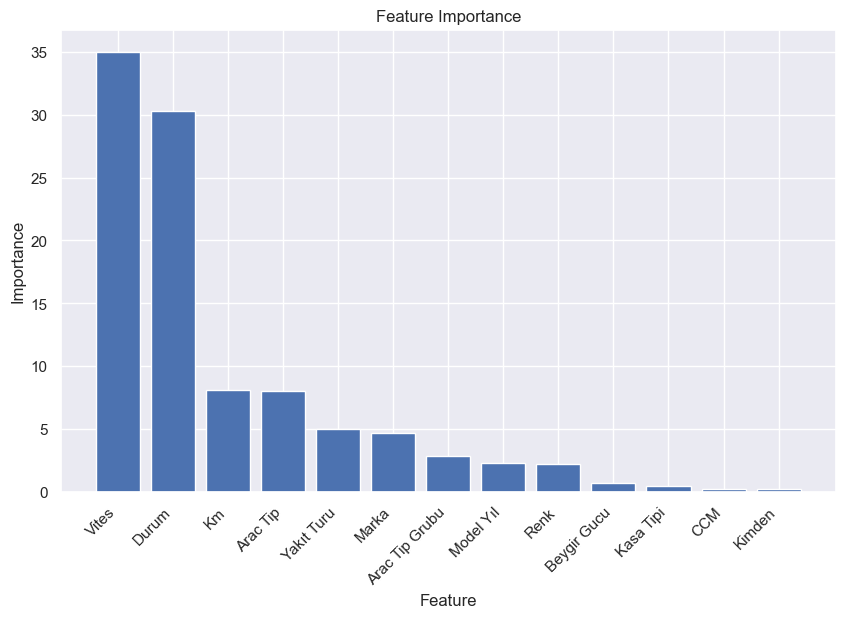

In [52]:
importance = grid_search_cb.best_estimator_.named_steps['catboost'].feature_importances_
 
feature_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Output Feature Importance
print("Feature Importance:")
print(feature_importance_df)

# Visualizing the importance of features on a graph
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.xticks(rotation=45, ha='right')
plt.show()  

From the graph above, we can see that the key parameters for predicting car prices are Vites(Transmission) and the Durum (Condition on the car).

## Conclusion

To sum it up, we have successfully achieved our goal of creating a model that predicts car prices based on their characteristics. We used several models for price prediction, and CatBoost performed the best. The main parameters that influenced the model’s predictions were Vites(Transmission) and the Durum(Condition on the car). Since our model predicts prices for both cheap and expensive cars, there is variation in the predictions, with some cases showing significant differences. If we were to remove expensive cars from the dataset, the model would not be able to accurately predict their prices. Therefore, for more precise predictions, it would be beneficial to separate the data and create two models: one for ordinary cars and another for very expensive cars.

## List of sources

1 - https://towardsdatascience.com/phik-k-get-familiar-with-the-latest-correlation-coefficient-9ba0032b37e7

2 - https://www.techtarget.com/whatis/definition/outlier

3 - https://www.mygreatlearning.com/blog/what-is-regression/

4 - https://corporatefinanceinstitute.com/resources/data-science/r-squared/

5 - https://deepchecks.com/glossary/mean-absolute-error/

6 - https://www.statisticshowto.com/probability-and-statistics/regression-analysis/rmse-root-mean-square-error/
